In [5]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
from astropy.table import Table
from tqdm.auto import tqdm  # tqdm progress bar


In [2]:
import os, pandas as pd
from glob import glob
from tqdm.auto import tqdm


RAW_DIR   = "../TNG50_fitting_results/v_2500_data_raw"
#RAW_DIR  = "../SIMBA100_fitting_results/v_2500_data"
EXPECTED  = 90_000                       # 0 … 89 999
summary   = []

for g in tqdm(range(14), desc="Groups"):

    path = os.path.join(RAW_DIR, f"group_{g}_combined_results.txt")
    if not os.path.isfile(path):
        tqdm.write(f"⚠️  group_{g} missing")
        continue

    # read entire table, then clean the header row
    df = pd.read_csv(path, sep=r"\|", engine="python", skipinitialspace=True)
    df.columns = df.columns.str.strip()          # ← crucial line

    if "Sightline" not in df.columns:
        tqdm.write(f"⚠️  'Sightline' absent in group {g}")
        continue

    uniq_ids = set(df["Sightline"])
    missing  = sorted(set(range(EXPECTED)) - uniq_ids)

    summary.append((g, len(uniq_ids), len(missing)))

    if missing:                                  # optional gap file
        gaps = os.path.join(RAW_DIR, f"group_{g}_missing_sightlines.txt")
        with open(gaps, "w") as fh:
            fh.write("\n".join(map(str, missing)))
        tqdm.write(f"Group {g}: {len(missing)} gaps → {gaps}")

print("\nGroup | unique sightlines | missing count")
for g, nuniq, nmiss in summary:
    print(f"{g:5d} | {nuniq:17d} | {nmiss:13d}")

Groups:   0%|          | 0/14 [00:00<?, ?it/s]


Group | unique sightlines | missing count
    0 |             90000 |             0
    1 |             90000 |             0
    2 |             90000 |             0
    3 |             90000 |             0
    4 |             90000 |             0
    5 |             90000 |             0
    6 |             90000 |             0
    7 |             90000 |             0
    8 |             90000 |             0
    9 |             90000 |             0
   10 |             90000 |             0
   11 |             90000 |             0
   12 |             90000 |             0
   13 |             90000 |             0


#### Filtering the raw files based on their EW and dN values

In [4]:
#!/usr/bin/env python3
# ──────────────────────────────────────────────────────────────────
#  Detection-only filtering based on EW(mÅ)   +  dN > 5 criterion
#
#     A1 :  EW < 24   &  dN > 2   → drop
#     A2 :  EW < 24   &  dN ≤ 2   → drop
#     B  :  24 < EW < 72 & dN > 2 → drop
#     D  :  dN > 4                → drop   (NEW)
#
#  • Non-detections kept
#  • If a sight-line loses all rows → insert placeholder non-detection
#  • Column order preserved, NaNs written as 'nan'
# ──────────────────────────────────────────────────────────────────
import os
import numpy as np
import pandas as pd
from tqdm.auto import tqdm
from astropy.table import Table

# RAW_DIR = "../TNG50_fitting_results/v_2500_data_raw"
# OUT_DIR = "../TNG50_fitting_results/v_2500_data_filtered"
RAW_DIR = "../SIMBA100_fitting_results/v_2500_data"
OUT_DIR = "../SIMBA100_fitting_results/v_2500_data_filtered"
os.makedirs(OUT_DIR, exist_ok=True)

# Placeholder row (same pattern as original script)
PH_ROW = {
    "Species": "OVI1031",
    "EW(mA)" : np.nan,
    "dEW(mA)": 13.328228594498576,
    "N"      : 13.503835164315273,
    "dN"     : np.nan,
    "b"      : np.nan,
    "db"     : np.nan,
    "v"      : 0.0,
    "dv"     : 50.0,
    "l"      : np.nan,
    "dl"     : np.nan,
    "UpLim"  : True,
    "Sat"    : False,
    "Chisq"  : np.nan,
}

stats = []
for gid in tqdm(range(14), desc="Groups"):

    fin  = os.path.join(RAW_DIR,  f"group_{gid}_combined_results.txt")
    fout = os.path.join(OUT_DIR, f"group_{gid}_combined_results.txt")

    if not os.path.isfile(fin):
        tqdm.write(f"⚠️  missing {fin}")
        continue

    # ---------------- read & clean --------------------------------
    df = pd.read_csv(fin, sep=r"\|", engine="python", skipinitialspace=True)
    df.columns = df.columns.str.strip()
    df.drop(columns=[c for c in df.columns if c.startswith("Unnamed")],
            inplace=True)

    col_order = df.columns.tolist()          # preserve original order

    # numeric conversion
    df["EW(mA)"] = pd.to_numeric(df["EW(mA)"], errors="coerce")
    df["dN"]     = pd.to_numeric(df["dN"],     errors="coerce")

    # split detections / non-detections
    det    = df[df["dN"].notna()].copy()
    nondet = df[df["dN"].isna()].copy()

    # ---------------- masks ---------------------------------------
    m_A1 = (det["EW(mA)"] < 24)                        & (det["dN"] > 2)
    m_A2 = (det["EW(mA)"] < 24)                        & (det["dN"] <= 2)
    m_B  = (det["EW(mA)"] > 24) & (det["EW(mA)"] < 72) & (det["dN"] > 2)
    m_D  = (det["dN"] > 6)                               # NEW rule

    det_keep = det[~(m_A1 | m_A2 | m_B | m_D)]

    # merge back with non-detections
    merged = pd.concat([det_keep, nondet], ignore_index=True)

    # placeholders for vanished sight-lines
    vanished = sorted(set(df["Sightline"]) - set(merged["Sightline"]))
    if vanished:
        ph = pd.DataFrame([{"Sightline": s, **PH_ROW} for s in vanished])
        merged = pd.concat([merged, ph], ignore_index=True)

    merged = merged[col_order].sort_values("Sightline")

    # ---------------- write ---------------------------------------
    Table.from_pandas(merged).write(
        fout, format="ascii.fixed_width", delimiter="|", overwrite=True
    )

    stats.append({
        "group"         : gid,
        "rows_before"   : len(df),
        "rows_after"    : len(merged),
        "uniq_sl_before": df["Sightline"].nunique(),
        "uniq_sl_after" : merged["Sightline"].nunique(),
        "det_before"    : len(det),
        "det_after"     : len(det_keep),
        "removed_A1"    : int(m_A1.sum()),
        "removed_A2"    : int(m_A2.sum()),
        "removed_B"     : int(m_B.sum()),
        "removed_D"     : int(m_D.sum()),    # NEW stat
        "placeholders"  : len(vanished),
    })

# ---------------- summary ----------------------------------------
summary = pd.DataFrame(stats)
print("\n=== filtering summary (EW + dN>5 rules) ===")
print(summary.to_string(index=False))
summary.to_csv(os.path.join(OUT_DIR,
                            "filtering_summary_full.csv"),
               index=False)

Groups:   0%|          | 0/14 [00:00<?, ?it/s]


=== filtering summary (EW + dN>5 rules) ===
 group  rows_before  rows_after  uniq_sl_before  uniq_sl_after  det_before  det_after  removed_A1  removed_A2  removed_B  removed_D  placeholders
     0        90700       90166           90000          90000        3400       2754           0         200        446        361           112
     1        90700       90151           90000          90000        3400       2735           1         199        465        369           116
     2        90702       90160           90000          90000        3400       2743           0         202        455        354           115
     3        90701       90146           90000          90000        3400       2730           0         201        469        373           115
     4        90700       90155           90000          90000        3400       2737           1         199        463        351           118
     5        90703       90147           90000          90000        3400     

Groups:   0%|          | 0/14 [00:00<?, ?it/s]

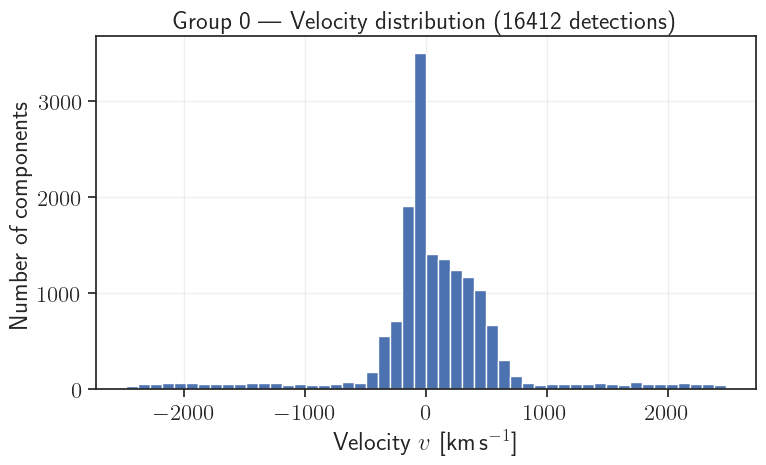

✅  saved ../TNG50_fitting_results/v_2500_data_filtered/velocity_histograms/group_0_velocity_hist.png


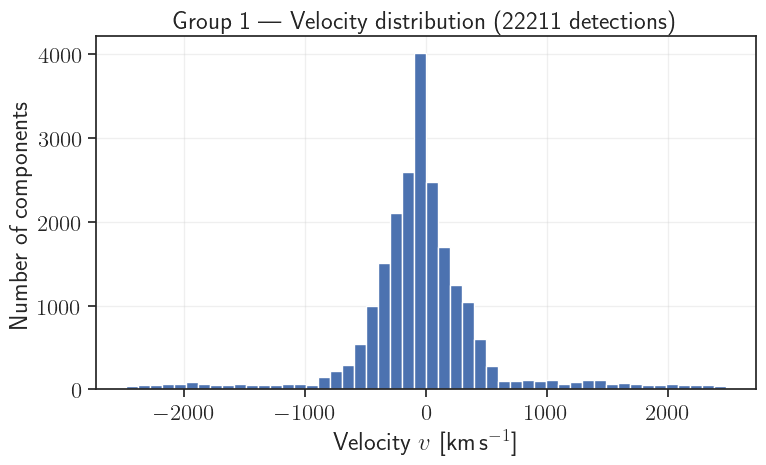

✅  saved ../TNG50_fitting_results/v_2500_data_filtered/velocity_histograms/group_1_velocity_hist.png


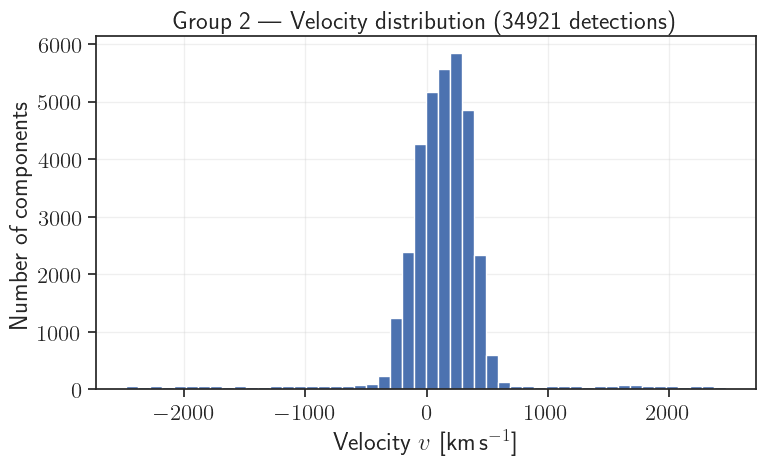

✅  saved ../TNG50_fitting_results/v_2500_data_filtered/velocity_histograms/group_2_velocity_hist.png


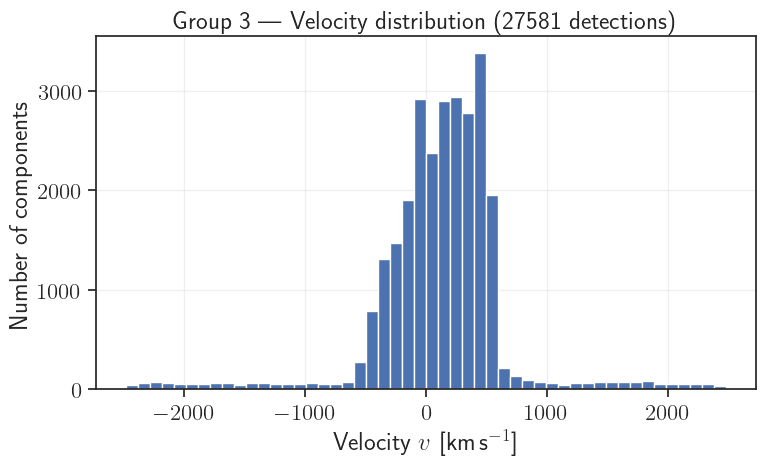

✅  saved ../TNG50_fitting_results/v_2500_data_filtered/velocity_histograms/group_3_velocity_hist.png


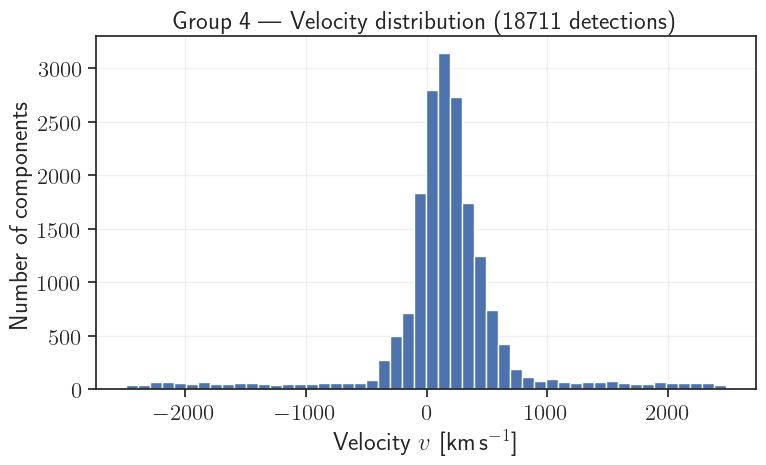

✅  saved ../TNG50_fitting_results/v_2500_data_filtered/velocity_histograms/group_4_velocity_hist.png


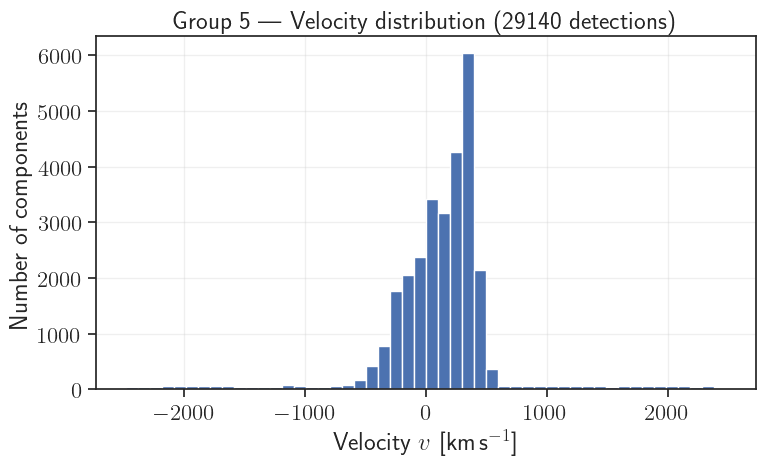

✅  saved ../TNG50_fitting_results/v_2500_data_filtered/velocity_histograms/group_5_velocity_hist.png


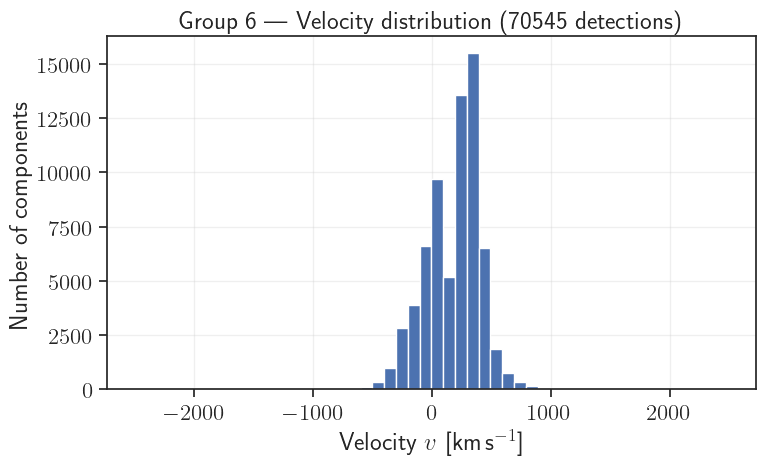

✅  saved ../TNG50_fitting_results/v_2500_data_filtered/velocity_histograms/group_6_velocity_hist.png


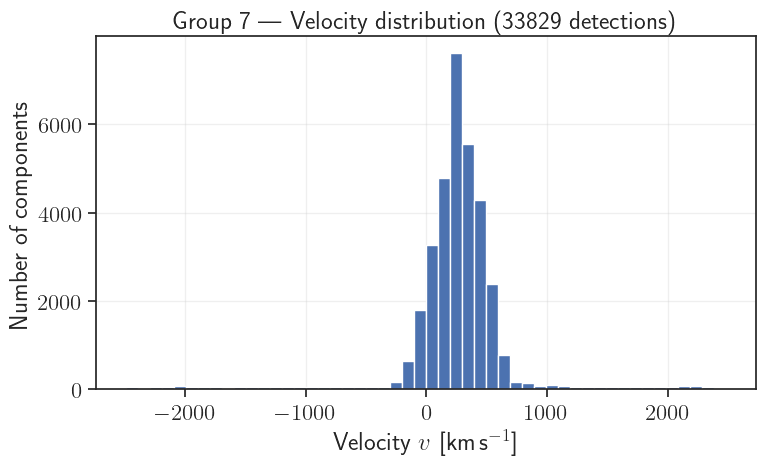

✅  saved ../TNG50_fitting_results/v_2500_data_filtered/velocity_histograms/group_7_velocity_hist.png


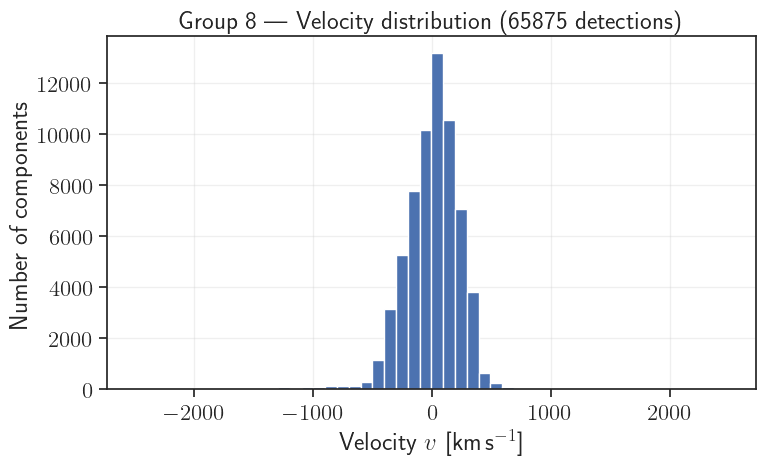

✅  saved ../TNG50_fitting_results/v_2500_data_filtered/velocity_histograms/group_8_velocity_hist.png


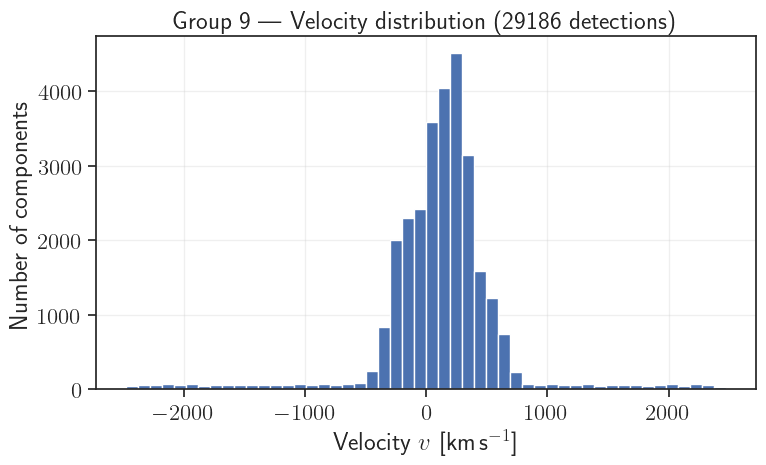

✅  saved ../TNG50_fitting_results/v_2500_data_filtered/velocity_histograms/group_9_velocity_hist.png


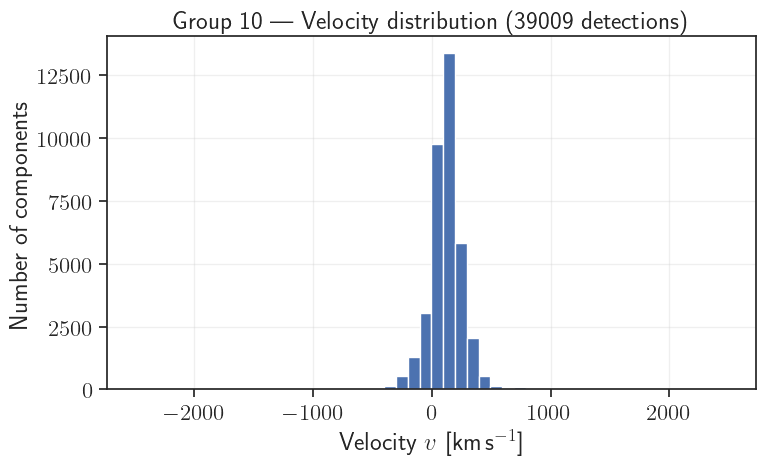

✅  saved ../TNG50_fitting_results/v_2500_data_filtered/velocity_histograms/group_10_velocity_hist.png


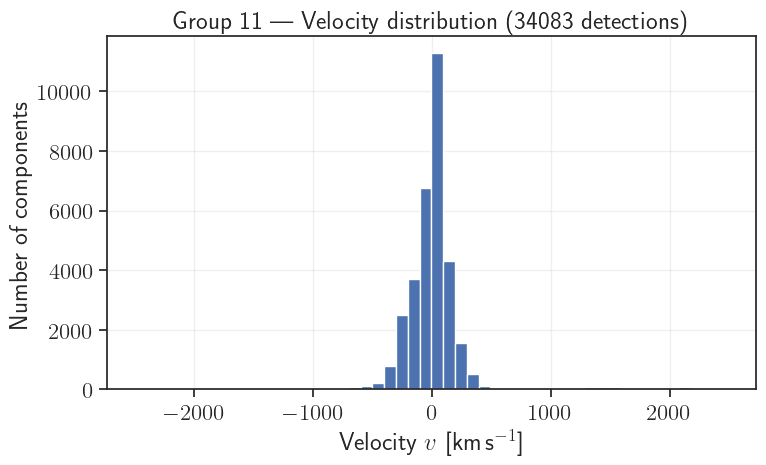

✅  saved ../TNG50_fitting_results/v_2500_data_filtered/velocity_histograms/group_11_velocity_hist.png


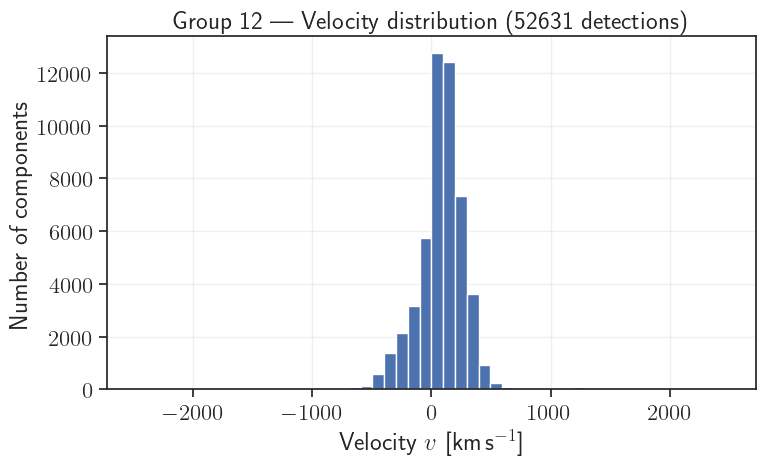

✅  saved ../TNG50_fitting_results/v_2500_data_filtered/velocity_histograms/group_12_velocity_hist.png


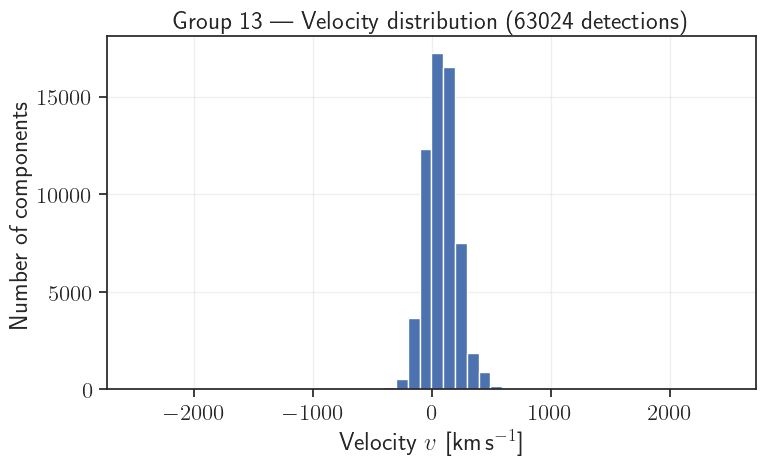

✅  saved ../TNG50_fitting_results/v_2500_data_filtered/velocity_histograms/group_13_velocity_hist.png

All done — histograms live in ../TNG50_fitting_results/v_2500_data_filtered/velocity_histograms


In [120]:
#!/usr/bin/env python3
# ────────────────────────────────────────────────────────────────
#  Velocity histograms for detections (dN ≠ NaN) in the *filtered*
#  v_2500_data_filtered tables created by your previous script
# ────────────────────────────────────────────────────────────────
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from tqdm.auto import tqdm

# upodate matplotlib settings rcparams to use LaTeX for text rendering and also include asmath in preamble
plt.rcParams.update({
    "text.usetex": True,
    "text.latex.preamble": r"\usepackage{amsmath}",

})

# ---------------------------------------------------------------
# 1) Paths
# ---------------------------------------------------------------
FILTERED_DIR = "../TNG50_fitting_results/v_2500_data_filtered"
PLOT_DIR     = os.path.join(FILTERED_DIR, "velocity_histograms")
os.makedirs(PLOT_DIR, exist_ok=True)

# ---------------------------------------------------------------
# 2) One histogram per group
# ---------------------------------------------------------------
for gid in tqdm(range(14), desc="Groups"):

    f_in = os.path.join(FILTERED_DIR,
                        f"group_{gid}_combined_results.txt")
    if not os.path.isfile(f_in):
        tqdm.write(f"⚠️  missing {f_in}")
        continue

    # ---------------- read & tidy ------------------------------
    df = pd.read_csv(f_in, sep=r"\|", engine="python",
                     skipinitialspace=True)
    df.columns = df.columns.str.strip()
    df.drop(columns=[c for c in df.columns if c.startswith("Unnamed")],
            inplace=True)

    # numeric coercion
    df["dN"] = pd.to_numeric(df["dN"], errors="coerce")
    df["v"]  = pd.to_numeric(df["v"],  errors="coerce")

    detections = df[df["dN"].notna() & df["v"].notna()]
    vvals      = detections["v"].values
    if len(vvals) == 0:
        tqdm.write(f"Group {gid}: no detections – skipped")
        continue

    # ---------------- plot -------------------------------------
    plt.figure(figsize=(8, 5))
    plt.hist(vvals, bins=50)               # no colour → default palette
    plt.xlabel(r"Velocity $v$ [km\,s$^{-1}$]")
    plt.ylabel("Number of components")
    plt.title(f"Group {gid}  —  Velocity distribution "
              f"({len(vvals)} detections)")
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()
    f_out = os.path.join(PLOT_DIR,
                         f"group_{gid}_velocity_hist.png")
    #plt.savefig(f_out, dpi=300)
    plt.close()            # free mem between loops
    tqdm.write(f"✅  saved {f_out}")

print("\nAll done — histograms live in", PLOT_DIR)

Reading group files:   0%|          | 0/14 [00:00<?, ?it/s]

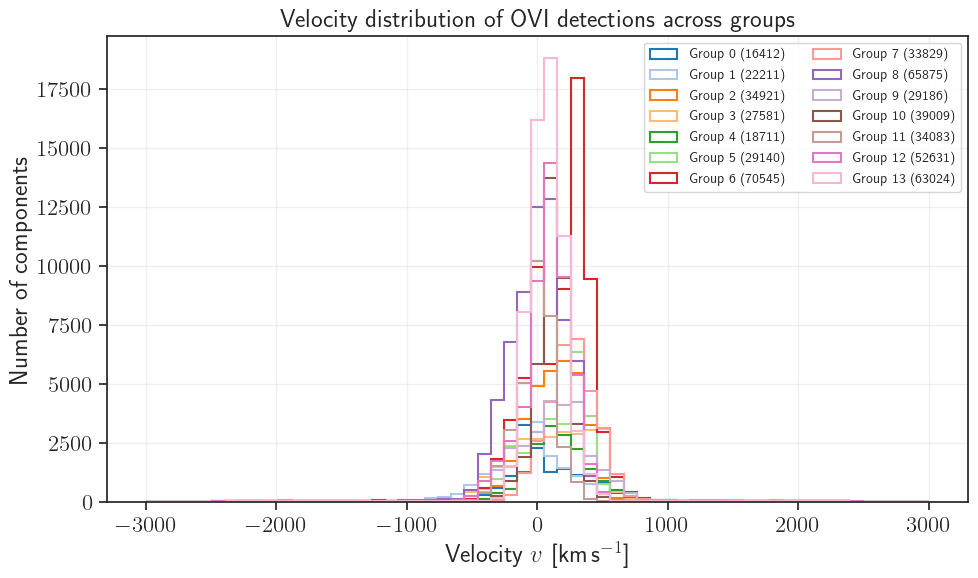


✅ Saved combined histogram to: ../TNG50_fitting_results/v_2500_data_filtered/velocity_histograms/combined_velocity_histogram.png


In [121]:
#!/usr/bin/env python3
# ────────────────────────────────────────────────────────────────
# Combined velocity histogram for all groups (dN ≠ NaN)
# ────────────────────────────────────────────────────────────────

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from tqdm.auto import tqdm

# ────────────────────────────────────────────────────────────────
# Use LaTeX for rendering labels
# ────────────────────────────────────────────────────────────────
plt.rcParams.update({
    "text.usetex": True,
    "text.latex.preamble": r"\usepackage{amsmath}",
    "font.size": 14
})

# ────────────────────────────────────────────────────────────────
# 1. Paths
# ────────────────────────────────────────────────────────────────
FILTERED_DIR = "../TNG50_fitting_results/v_2500_data_filtered"
PLOT_DIR = os.path.join(FILTERED_DIR, "velocity_histograms")
os.makedirs(PLOT_DIR, exist_ok=True)

# ────────────────────────────────────────────────────────────────
# 2. Combine data from all groups
# ────────────────────────────────────────────────────────────────
combined_data = {}
group_colors = plt.cm.tab20.colors  # Up to 20 distinct colors

for gid in tqdm(range(14), desc="Reading group files"):
    f_in = os.path.join(FILTERED_DIR, f"group_{gid}_combined_results.txt")
    if not os.path.isfile(f_in):
        tqdm.write(f"⚠️  missing {f_in}")
        continue

    df = pd.read_csv(f_in, sep=r"\|", engine="python", skipinitialspace=True)
    df.columns = df.columns.str.strip()
    df.drop(columns=[c for c in df.columns if c.startswith("Unnamed")], inplace=True)

    # Convert to numeric safely
    df["dN"] = pd.to_numeric(df["dN"], errors="coerce")
    df["v"] = pd.to_numeric(df["v"], errors="coerce")

    # Filter for detections
    detections = df[df["dN"].notna() & df["v"].notna()]
    if not detections.empty:
        combined_data[gid] = detections["v"].values

# ────────────────────────────────────────────────────────────────
# 3. Plot all histograms on the same figure
# ────────────────────────────────────────────────────────────────
plt.figure(figsize=(10, 6))
bins = np.linspace(-3000, 3000, 60)  # uniform bins for all

for i, (gid, vvals) in enumerate(combined_data.items()):
    color = group_colors[i % len(group_colors)]
    plt.hist(vvals, bins=bins, histtype='step', linewidth=1.5,
             label=f"Group {gid} ({len(vvals)})", color=color)

plt.xlabel(r"Velocity $v$ [km\,s$^{-1}$]")
plt.ylabel("Number of components")
plt.title("Velocity distribution of OVI detections across groups")
plt.grid(alpha=0.3)
plt.legend(fontsize=10, loc="upper right", ncol=2)
plt.tight_layout()

# Save and show
f_out = os.path.join(PLOT_DIR, "combined_velocity_histogram.png")
plt.savefig(f_out, dpi=300)
plt.show()
print(f"\n✅ Saved combined histogram to: {f_out}")

Reading SIMBA group files:   0%|          | 0/14 [00:00<?, ?it/s]


📄 Reading: Group 0 — /Users/wavefunction/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines/SIMBA100_fitting_results/v_2500_data/group_0_combined_results.txt
36       1533.247728
148       -48.282687
179      1234.999320
180      1199.642738
191      -363.344310
            ...     
90572    -667.448889
90574   -2055.872727
90635   -2050.504759
90652     775.433157
90686   -1909.930693
Name: v, Length: 3400, dtype: float64
✅ Group 0: 3400 valid detections

📄 Reading: Group 1 — /Users/wavefunction/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines/SIMBA100_fitting_results/v_2500_data/group_1_combined_results.txt
36       1533.247729
148       -48.282685
179      1234.999325
180      1199.642738
191      -363.344290
            ...     
90572    -667.448911
90574   -2055.872712
90635   -2050.504781
90652     775.433158
90686   -1909.930693
Name: v, Length: 3400, dtype: float64
✅ Group 1: 3400 valid detections

📄 Reading: Group 2 — /Users/wavefunction/ASU Dropbox/Tanmay Singh/Synthetic_I

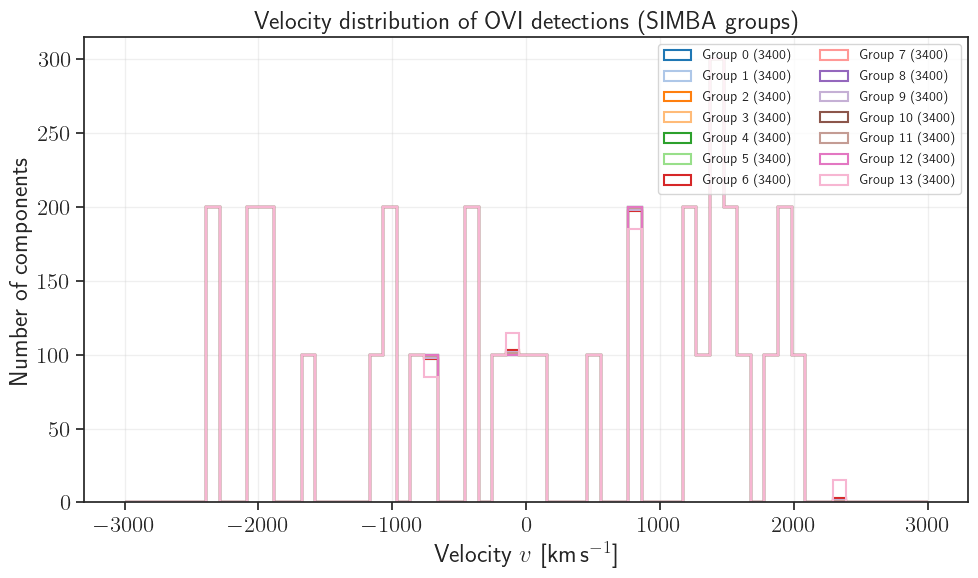


✅ Saved combined SIMBA histogram to: /Users/wavefunction/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines/SIMBA100_fitting_results/v_2500_data/velocity_histograms/combined_velocity_histogram_SIMBA.png


In [126]:
#!/usr/bin/env python3
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from tqdm.auto import tqdm

# LaTeX rendering setup
plt.rcParams.update({
    "text.usetex": True,
    "text.latex.preamble": r"\usepackage{amsmath}",
    "font.size": 14
})

# ──────────────────────────────────────────────
# SIMBA file paths and output directory
# ──────────────────────────────────────────────
FILTERED_DIR = "/Users/wavefunction/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines/SIMBA100_fitting_results/v_2500_data"
PLOT_DIR = os.path.join(FILTERED_DIR, "velocity_histograms")
os.makedirs(PLOT_DIR, exist_ok=True)

# ──────────────────────────────────────────────
# Combine all group velocity data
# ──────────────────────────────────────────────
combined_data = {}
group_colors = plt.cm.tab20.colors

for gid in tqdm(range(14), desc="Reading SIMBA group files"):
    file_name = f"group_{gid}_combined_results.txt"
    file_path = os.path.join(FILTERED_DIR, file_name)
    
    if not os.path.isfile(file_path):
        tqdm.write(f"⚠️ Missing: {file_path}")
        continue

    print(f"\n📄 Reading: Group {gid} — {file_path}")
    df = pd.read_csv(file_path, sep=r"\|", engine="python", skipinitialspace=True)
    df.columns = df.columns.str.strip()
    df.drop(columns=[c for c in df.columns if c.startswith("Unnamed")], inplace=True)

    df["dN"] = pd.to_numeric(df["dN"], errors="coerce")
    df["v"]  = pd.to_numeric(df["v"], errors="coerce")
    

    detections = df[df["dN"].notna() & df["v"].notna()]
    print(detections['v'])
    num_detections = len(detections)
    print(f"✅ Group {gid}: {num_detections} valid detections")

    if num_detections == 0:
        tqdm.write(f"Group {gid}: no detections – skipped")
        continue

    combined_data[gid] = detections["v"].values

# ──────────────────────────────────────────────
# Plot combined velocity histogram
# ──────────────────────────────────────────────
plt.figure(figsize=(10, 6))
bins = np.linspace(-3000, 3000, 60)

for i, (gid, vvals) in enumerate(combined_data.items()):
    color = group_colors[i % len(group_colors)]
    plt.hist(vvals, bins=bins, histtype='step', linewidth=1.5,
             label=f"Group {gid} ({len(vvals)})", color=color)

plt.xlabel(r"Velocity $v$ [km\,s$^{-1}$]")
plt.ylabel("Number of components")
plt.title("Velocity distribution of OVI detections (SIMBA groups)")
plt.grid(alpha=0.3)
plt.legend(fontsize=10, loc="upper right", ncol=2)
plt.tight_layout()

# Save and show
output_file = os.path.join(PLOT_DIR, "combined_velocity_histogram_SIMBA.png")
plt.savefig(output_file, dpi=300)
plt.show()
print(f"\n✅ Saved combined SIMBA histogram to: {output_file}")

In [127]:
import os
import pandas as pd
from astropy.table import Table
from itertools import combinations

# Set SIMBA directory
base_dir = "/Users/wavefunction/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines/SIMBA100_fitting_results/v_2500_data"

summary = {}
dataframes = {}

# Loop over each group file
for group_id in range(14):
    filename = f"group_{group_id}_combined_results.txt"
    file_path = os.path.join(base_dir, filename)

    if not os.path.exists(file_path):
        print(f"❌ Group {group_id} file not found.")
        continue

    # Read using astropy
    table = Table.read(file_path, format='ascii.fixed_width', delimiter='|')
    df = table.to_pandas()
    df.columns = df.columns.str.strip()

    total = len(df)
    detections = df['dN'].notna().sum()
    non_detections = df['dN'].isna().sum()

    summary[group_id] = {
        "File": filename,
        "Total": total,
        "Detections": detections,
        "Non-Detections": non_detections
    }

    # Store for pairwise comparison
    dataframes[group_id] = df.sort_values(by=df.columns.tolist()).reset_index(drop=True)

# Print detection summary
print("\n=== Detection Summary ===")
for gid, stats in summary.items():
    print(f"Group {gid:2d}: Total = {stats['Total']:5d}, Detections = {stats['Detections']:5d}, "
          f"Non-Detections = {stats['Non-Detections']:5d}")

# Pairwise file comparison
print("\n=== Pairwise Comparison ===")
for (i, j) in combinations(range(14), 2):
    if i not in dataframes or j not in dataframes:
        continue
    is_equal = dataframes[i].equals(dataframes[j])
    result = "SAME" if is_equal else "DIFFERENT"
    print(f"Group {i:2d} vs Group {j:2d}: {result}")


=== Detection Summary ===
Group  0: Total = 90700, Detections =  3400, Non-Detections = 87300
Group  1: Total = 90700, Detections =  3400, Non-Detections = 87300
Group  2: Total = 90702, Detections =  3400, Non-Detections = 87302
Group  3: Total = 90701, Detections =  3400, Non-Detections = 87301
Group  4: Total = 90700, Detections =  3400, Non-Detections = 87300
Group  5: Total = 90703, Detections =  3400, Non-Detections = 87303
Group  6: Total = 90703, Detections =  3400, Non-Detections = 87303
Group  7: Total = 90701, Detections =  3400, Non-Detections = 87301
Group  8: Total = 90701, Detections =  3400, Non-Detections = 87301
Group  9: Total = 90702, Detections =  3400, Non-Detections = 87302
Group 10: Total = 90700, Detections =  3400, Non-Detections = 87300
Group 11: Total = 90701, Detections =  3400, Non-Detections = 87301
Group 12: Total = 90700, Detections =  3400, Non-Detections = 87300
Group 13: Total = 90715, Detections =  3400, Non-Detections = 87315

=== Pairwise Compari

In [128]:
for gid, df in dataframes.items():
    detections = df[df['dN'].notna()]
    print(f"\nGroup {gid}:")
    print("Unique N values:", detections['N'].unique())
    print("Unique dN values:", detections['dN'].unique())
    print("Velocity Range:", detections['v'].min(), "to", detections['v'].max())


Group 0:
Unique N values: [13.51586176 13.51863474 13.49104196 13.50832133 13.51295044 13.51494157
 13.59401198 13.49471945 13.4911009  13.48722824 13.51415763 13.48590944
 13.51290579 13.5271622  13.48763617 13.49178543 13.49316779 13.49435187
 13.51071857 13.51862432 13.59689182 13.49811482 13.5567802  13.49653172
 13.55930813 13.5002708  13.51477741 13.5013016  13.60782072 13.48315868
 13.51894006 13.49519673 13.49730002 13.49216984 13.52716437 13.59689203
 13.55678034 13.60779339 13.58510904 13.52716426 13.55678047 13.5593082
 13.60782088 13.51894018 13.59401148 13.52716611 13.59689682 13.55678046
 13.5593081  13.60782076 13.51894024 13.59400751 13.52716413 13.59681468
 13.60782072 13.51893993 13.52716345 13.55678061 13.55930389 13.60782009
 13.59689924 13.60781683 13.51894027 13.52716212 13.59689818 13.55930795
 13.60782053 13.51893396 13.58510973 13.60780704 13.51893995 13.5851043
 13.52716584 13.59689695 13.55678039 13.60782089 13.52716105 13.59689854
 13.55930787 13.52716573 1

In [129]:
for gid, df in dataframes.items():
    print(f"Group {gid}: Unique sightlines with detections:",
          df[df['dN'].notna()]['Sightline'].nunique())

Group 0: Unique sightlines with detections: 2700
Group 1: Unique sightlines with detections: 2700
Group 2: Unique sightlines with detections: 2698
Group 3: Unique sightlines with detections: 2699
Group 4: Unique sightlines with detections: 2700
Group 5: Unique sightlines with detections: 2697
Group 6: Unique sightlines with detections: 2697
Group 7: Unique sightlines with detections: 2699
Group 8: Unique sightlines with detections: 2699
Group 9: Unique sightlines with detections: 2698
Group 10: Unique sightlines with detections: 2700
Group 11: Unique sightlines with detections: 2699
Group 12: Unique sightlines with detections: 2700
Group 13: Unique sightlines with detections: 2685


In [130]:
from functools import reduce

# Reduce across all groups to find overlap
common_detections = reduce(lambda a, b: pd.merge(a, b, how='inner'),
                           [df[df['dN'].notna()] for df in dataframes.values()])

print(f"\nCommon detections across ALL groups: {len(common_detections)}")


Common detections across ALL groups: 0


#### Filtering the components withing $V_{sys} <800 km/s$

In [50]:
#!/usr/bin/env python3
"""
Second-stage velocity-offset filtering.
Removes detection components with |Δv| > 800 km s-1
and inserts a dummy non-detection row when a sightline
is left with no rows at all.

INPUT  : /Users/wavefunction/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines/
         TNG50_fitting_results/v_2500_data_filtered/group_<gid>_combined_results.txt
OUTPUT : …/v_2500_data_filtered_v800/ (same file names)
"""

# -------------------------------------------------------------------------
#  Imports & configuration
# -------------------------------------------------------------------------
import os
import numpy as np
import pandas as pd
from astropy.table import Table
from astropy.io import ascii
from tqdm.auto import tqdm

# ---------------------------
#  Physical / cosmological constants
# ---------------------------
h                 = 0.6774                              # dimensionless H0 / (100 km s-1 Mpc-1)
z                 = 0.09940180263022191                 # snapshot red-shift
a                 = 1.0 / (1.0 + z)                     # scale factor

def H(z, H0=67.74, Ωm=0.3089, ΩΛ=0.6911):
    """Flat ΛCDM Hubble parameter in km s⁻¹ Mpc⁻¹."""
    return H0 * np.sqrt(Ωm * (1.0 + z)**3 + ΩΛ)

H_z = H(z)                                             # pre-compute once

# ---------------------------
#  Paths
# ---------------------------
BASE = "/Users/wavefunction/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines"
IN_DIR  = os.path.join(BASE,
                       "TNG50_fitting_results",
                       "v_2500_data_filtered")
OUT_DIR = os.path.join(BASE,
                       "TNG50_fitting_results",
                       "v_2500_data_filtered_v800")
HALO_FILE = os.path.join(BASE,
                         "TNG50_fitting_results",
                         "TNG_halos.txt")

os.makedirs(OUT_DIR, exist_ok=True)

# ---------------------------
#  Halo catalogue
# ---------------------------
halo = pd.read_csv(HALO_FILE, sep='|', skipinitialspace=True)
halo.columns = halo.columns.str.strip()
halo['Grp_Index'] = halo.index                    # convenient explicit index

# ---------------------------
#  Placeholder (dummy non-detection) row template
# ---------------------------
PH_ROW = {
    "Species"  : "OVI1031",
    "EW(mA)"   : 1.00000,
    "dEW(mA)"  : 13.328228594498576,
    "N"        : 13.503835164315273,
    "dN"       : np.nan,
    "b"        : np.nan,
    "db"       : np.nan,
    "v"        : 0.0,
    "dv"       : 50.0,
    "l"        : np.nan,
    "dl"       : np.nan,
    "UpLim"    : True,
    "Sat"      : False,
    "Chisq"    : np.nan,
}

# ---------------------------
#  Loop over every group file
# ---------------------------
for fname in tqdm(sorted(os.listdir(IN_DIR)), desc="Groups"):
    if not (fname.startswith("group_") and fname.endswith("_combined_results.txt")):
        continue

    in_path  = os.path.join(IN_DIR,  fname)
    out_path = os.path.join(OUT_DIR, fname)

    # -------- group index from filename --------
    try:
        gid = int(fname.split('_')[1])
    except Exception as e:
        print(f"⚠️  cannot parse group index for '{fname}': {e}")
        continue

    if gid not in halo.index:
        print(f"⚠️  group {gid} not present in halo catalogue – skipped.")
        continue

    # -------- halo systemic quantities ----------
    hrow          = halo.loc[gid]
    v_sys_z_raw   = hrow['GroupVel(z,km/s/h)']     # peculiar velocity (comoving km/s/h)
    v_sys         = v_sys_z_raw * 1.0 / a          # physical km/s
    r_vir_phys_Mpc= hrow['R_Crit200'] * 1e-3 / h   # kpc/h → Mpc (physical)
    v_hubble_off  = 2.0 * r_vir_phys_Mpc * H_z     # km/s across ±R_vir

    # -------- read file ----------
    df = pd.read_csv(in_path, sep='|', skipinitialspace=True)
    df.columns = df.columns.str.strip()
    df.drop(columns=[c for c in df.columns if c.startswith("Unnamed")],
            inplace=True)

    # Ensure numeric types where needed
    df['v']  = pd.to_numeric(df['v'],  errors='coerce')
    df['dN'] = pd.to_numeric(df['dN'], errors='coerce')

    col_order  = df.columns.tolist()
    det_mask   = df['dN'].notna()                      # True for detections

    # -------- compute Δv only for detections -------
    if det_mask.any():
        Δv = df.loc[det_mask, 'v'] - v_hubble_off - v_sys
        df.loc[det_mask, 'Velocity_Offset'] = Δv

    # -------- filter: keep
    #   * all non-detections
    #   * detections with |Δv| ≤ 800 km/s
    keep_mask = (~det_mask) | (df['Velocity_Offset'].abs() <= 800)
    df_keep   = df[keep_mask].copy()

    # -----------------------------------------------------------------
    #  Fill missing sightlines with a dummy non-detection row
    # -----------------------------------------------------------------
    original_sls = set(df['Sightline'])
    remaining_sls= set(df_keep['Sightline'])

    vanished = sorted(original_sls - remaining_sls)
    if vanished:
        ph_rows = pd.DataFrame([{ "Sightline": s, **PH_ROW } for s in vanished])
        df_keep = pd.concat([df_keep, ph_rows], ignore_index=True)

    # -----------------------------------------------------------------
    #  Final clean-up & write
    # -----------------------------------------------------------------
    df_keep = df_keep[col_order]           # restore original column order
    df_keep = df_keep.sort_values('Sightline')

    # Astropy Table for fixed-width output; replace NaNs with blanks
    table = Table(df_keep.fillna('').to_dict(orient='list'))

    # Remove any accidental "Unnamed" columns again
    for col in table.colnames:
        if 'Unnamed' in col:
            table.remove_column(col)

    ascii.write(table,
                out_path,
                format='fixed_width',
                delimiter='|',
                overwrite=True)

    removed = len(df) - len(df_keep)
    print(f"Group {gid:2d} – {len(df)} rows ▶ {len(df_keep)} rows "
          f"(removed {removed}, placeholders {len(vanished)})")

print("\nVelocity-offset filtering complete.")
print("Filtered files are in:", OUT_DIR)

Groups:   0%|          | 0/17 [00:00<?, ?it/s]

Group  0 – 95701 rows ▶ 95323 rows (removed 378, placeholders 1610)
Group 10 – 103696 rows ▶ 103064 rows (removed 632, placeholders 1253)
Group 11 – 102289 rows ▶ 101657 rows (removed 632, placeholders 1326)
Group 12 – 113458 rows ▶ 112697 rows (removed 761, placeholders 1164)
Group 13 – 115819 rows ▶ 114913 rows (removed 906, placeholders 995)
Group  1 – 98415 rows ▶ 97580 rows (removed 835, placeholders 1531)
Group  2 – 104494 rows ▶ 103924 rows (removed 570, placeholders 1380)
Group  3 – 99849 rows ▶ 99201 rows (removed 648, placeholders 1407)
Group  4 – 96398 rows ▶ 95974 rows (removed 424, placeholders 1601)
Group  5 – 101452 rows ▶ 100939 rows (removed 513, placeholders 1384)
Group  6 – 123532 rows ▶ 122555 rows (removed 977, placeholders 1103)
Group  7 – 104205 rows ▶ 103604 rows (removed 601, placeholders 1349)
Group  8 – 124267 rows ▶ 123253 rows (removed 1014, placeholders 1147)
Group  9 – 102267 rows ▶ 101676 rows (removed 591, placeholders 1448)

Velocity-offset filtering c

#### plotting the above

In [29]:
#!/usr/bin/env python3
# ────────────────────────────────────────────────────────────────
#  Velocity-offset (Δv) histograms for detections in the
#  v_2500_data_filtered_v800 tables.
#
#  Output: PNG files, one per group, in
#          …/v_2500_data_filtered_v800/velocity_offset_histograms
# ────────────────────────────────────────────────────────────────
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from tqdm.auto import tqdm

# ---------------------------------------------------------------
# 1) Constants & helper
# ---------------------------------------------------------------
h   = 0.6774                     # dimensionless Hubble parameter
z   = 0.09940180263022191
a   = 1.0 / (1.0 + z)

def H(z, H0=67.74, Ωm=0.3089, ΩΛ=0.6911):
    """Flat ΛCDM Hubble parameter (km s⁻1 Mpc⁻1)."""
    return H0 * np.sqrt(Ωm * (1 + z)**3 + ΩΛ)

H_z = H(z)                       # evaluate once

# ---------------------------------------------------------------
# 2) Paths
# ---------------------------------------------------------------
BASE_DIR = ("/Users/wavefunction/ASU Dropbox/Tanmay Singh/"
            "Synthetic_IGrM_Sightlines/TNG50_fitting_results")
DATA_DIR = os.path.join(BASE_DIR, "v_2500_data_filtered_v800")
PLOT_DIR = os.path.join(DATA_DIR,  "velocity_offset_histograms")
HALO_CAT = os.path.join(BASE_DIR, "TNG_halos.txt")

os.makedirs(PLOT_DIR, exist_ok=True)

# ---------------------------------------------------------------
# 3) Load halo catalogue
# ---------------------------------------------------------------
halo = pd.read_csv(HALO_CAT, sep="|", skipinitialspace=True)
halo.columns = halo.columns.str.strip()
halo["Grp_Index"] = halo.index        # explicit index column

# ---------------------------------------------------------------
# 4) Loop through groups, build Δv histograms
# ---------------------------------------------------------------
for gid in tqdm(range(14), desc="Groups"):

    f_in = os.path.join(DATA_DIR,
                        f"group_{gid}_combined_results.txt")
    if not os.path.isfile(f_in):
        tqdm.write(f"⚠️  missing {f_in}")
        continue

    # --- halo systemic terms -----------------------------------
    try:
        hrow      = halo.loc[gid]
    except KeyError:
        tqdm.write(f"⚠️  group {gid} not in halo catalogue – skipped")
        continue

    v_sys   = hrow["GroupVel(z,km/s/h)"] * 1.0 / a           # km/s
    r_vir   = hrow["R_Crit200"] * 1e-3 / h                   # kpc/h → Mpc (physical)
    v_hub   = 2.0 * r_vir * H_z                              # km/s across ±R_vir

    # --- read table -------------------------------------------
    df = pd.read_csv(f_in, sep="|", engine="python",
                     skipinitialspace=True)
    df.columns = df.columns.str.strip()
    df.drop(columns=[c for c in df.columns if c.startswith("Unnamed")],
            inplace=True)

    # numeric coercion
    df["dN"] = pd.to_numeric(df["dN"], errors="coerce")
    df["v"]  = pd.to_numeric(df["v"],  errors="coerce")

    detections = df[df["dN"].notna() & df["v"].notna()]
    if detections.empty:
        tqdm.write(f"Group {gid}: no detections – skipped")
        continue

    # --- compute Δv -------------------------------------------
    detections["Δv"] = detections["v"] - v_hub - v_sys
    dv_vals = detections["Δv"].values

    # --- plot --------------------------------------------------
    plt.figure(figsize=(8, 5))
    plt.hist(dv_vals, bins=50)
    plt.xlabel(r"Systemic velocity offset  $\Delta v$  [km s$^{-1}$]")
    plt.ylabel("Number of components")
    plt.title(f"Group {gid} — Δv distribution "
              f"({len(dv_vals)} detections)")
    plt.grid(alpha=0.3)
    plt.tight_layout()

    f_out = os.path.join(PLOT_DIR,
                         f"group_{gid:02d}_dv_hist.png")
    plt.show()
    #plt.savefig(f_out, dpi=300)
    plt.close()
    tqdm.write(f"✅  saved {f_out}")

print("\nAll done — histograms live in", PLOT_DIR)

Groups:   0%|          | 0/14 [00:00<?, ?it/s]

/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_9235/1438759483.py:85: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  detections["Δv"] = detections["v"] - v_hub - v_sys


RuntimeError: latex was not able to process the following string:
b'Group 0 \\u2014 \\u0394v distribution (14471 detections)'

Here is the full command invocation and its output:

latex -interaction=nonstopmode --halt-on-error --output-directory=tmpan44go6c 140c3ba57faf95eb4ac57c4e6306f0d7.tex

This is pdfTeX, Version 3.141592653-2.6-1.40.26 (TeX Live 2024) (preloaded format=latex)
 restricted \write18 enabled.
entering extended mode
(./140c3ba57faf95eb4ac57c4e6306f0d7.tex
LaTeX2e <2023-11-01> patch level 1
L3 programming layer <2024-02-20>
(/usr/local/texlive/2024/texmf-dist/tex/latex/base/article.cls
Document Class: article 2023/05/17 v1.4n Standard LaTeX document class
(/usr/local/texlive/2024/texmf-dist/tex/latex/base/size10.clo))
(/usr/local/texlive/2024/texmf-dist/tex/latex/type1cm/type1cm.sty)
(/usr/local/texlive/2024/texmf-dist/tex/latex/cm-super/type1ec.sty
(/usr/local/texlive/2024/texmf-dist/tex/latex/base/t1cmr.fd))
(/usr/local/texlive/2024/texmf-dist/tex/latex/base/inputenc.sty)
(/usr/local/texlive/2024/texmf-dist/tex/latex/geometry/geometry.sty
(/usr/local/texlive/2024/texmf-dist/tex/latex/graphics/keyval.sty)
(/usr/local/texlive/2024/texmf-dist/tex/generic/iftex/ifvtex.sty
(/usr/local/texlive/2024/texmf-dist/tex/generic/iftex/iftex.sty)))
(/usr/local/texlive/2024/texmf-dist/tex/latex/underscore/underscore.sty)
(/usr/local/texlive/2024/texmf-dist/tex/latex/firstaid/underscore-ltx.sty)
(/usr/local/texlive/2024/texmf-dist/tex/latex/base/textcomp.sty)
(/usr/local/texlive/2024/texmf-dist/tex/latex/l3backend/l3backend-dvips.def)
No file 140c3ba57faf95eb4ac57c4e6306f0d7.aux.
*geometry* driver: auto-detecting
*geometry* detected driver: dvips

! LaTeX Error: Unicode character Δ (U+0394)
               not set up for use with LaTeX.

See the LaTeX manual or LaTeX Companion for explanation.
Type  H <return>  for immediate help.
 ...                                              
                                                  
l.30 {\rmfamily Group 0 — Δ
                              v distribution (14471 detections)}%
No pages of output.
Transcript written on tmpan44go6c/140c3ba57faf95eb4ac57c4e6306f0d7.log.




Error in callback <function _draw_all_if_interactive at 0x142309c60> (for post_execute):


RuntimeError: latex was not able to process the following string:
b'Group 0 \\u2014 \\u0394v distribution (14471 detections)'

Here is the full command invocation and its output:

latex -interaction=nonstopmode --halt-on-error --output-directory=tmp1o1xn90q 140c3ba57faf95eb4ac57c4e6306f0d7.tex

This is pdfTeX, Version 3.141592653-2.6-1.40.26 (TeX Live 2024) (preloaded format=latex)
 restricted \write18 enabled.
entering extended mode
(./140c3ba57faf95eb4ac57c4e6306f0d7.tex
LaTeX2e <2023-11-01> patch level 1
L3 programming layer <2024-02-20>
(/usr/local/texlive/2024/texmf-dist/tex/latex/base/article.cls
Document Class: article 2023/05/17 v1.4n Standard LaTeX document class
(/usr/local/texlive/2024/texmf-dist/tex/latex/base/size10.clo))
(/usr/local/texlive/2024/texmf-dist/tex/latex/type1cm/type1cm.sty)
(/usr/local/texlive/2024/texmf-dist/tex/latex/cm-super/type1ec.sty
(/usr/local/texlive/2024/texmf-dist/tex/latex/base/t1cmr.fd))
(/usr/local/texlive/2024/texmf-dist/tex/latex/base/inputenc.sty)
(/usr/local/texlive/2024/texmf-dist/tex/latex/geometry/geometry.sty
(/usr/local/texlive/2024/texmf-dist/tex/latex/graphics/keyval.sty)
(/usr/local/texlive/2024/texmf-dist/tex/generic/iftex/ifvtex.sty
(/usr/local/texlive/2024/texmf-dist/tex/generic/iftex/iftex.sty)))
(/usr/local/texlive/2024/texmf-dist/tex/latex/underscore/underscore.sty)
(/usr/local/texlive/2024/texmf-dist/tex/latex/firstaid/underscore-ltx.sty)
(/usr/local/texlive/2024/texmf-dist/tex/latex/base/textcomp.sty)
(/usr/local/texlive/2024/texmf-dist/tex/latex/l3backend/l3backend-dvips.def)
No file 140c3ba57faf95eb4ac57c4e6306f0d7.aux.
*geometry* driver: auto-detecting
*geometry* detected driver: dvips

! LaTeX Error: Unicode character Δ (U+0394)
               not set up for use with LaTeX.

See the LaTeX manual or LaTeX Companion for explanation.
Type  H <return>  for immediate help.
 ...                                              
                                                  
l.30 {\rmfamily Group 0 — Δ
                              v distribution (14471 detections)}%
No pages of output.
Transcript written on tmp1o1xn90q/140c3ba57faf95eb4ac57c4e6306f0d7.log.




RuntimeError: latex was not able to process the following string:
b'Group 0 \\u2014 \\u0394v distribution (14471 detections)'

Here is the full command invocation and its output:

latex -interaction=nonstopmode --halt-on-error --output-directory=tmpgq7_slnp 140c3ba57faf95eb4ac57c4e6306f0d7.tex

This is pdfTeX, Version 3.141592653-2.6-1.40.26 (TeX Live 2024) (preloaded format=latex)
 restricted \write18 enabled.
entering extended mode
(./140c3ba57faf95eb4ac57c4e6306f0d7.tex
LaTeX2e <2023-11-01> patch level 1
L3 programming layer <2024-02-20>
(/usr/local/texlive/2024/texmf-dist/tex/latex/base/article.cls
Document Class: article 2023/05/17 v1.4n Standard LaTeX document class
(/usr/local/texlive/2024/texmf-dist/tex/latex/base/size10.clo))
(/usr/local/texlive/2024/texmf-dist/tex/latex/type1cm/type1cm.sty)
(/usr/local/texlive/2024/texmf-dist/tex/latex/cm-super/type1ec.sty
(/usr/local/texlive/2024/texmf-dist/tex/latex/base/t1cmr.fd))
(/usr/local/texlive/2024/texmf-dist/tex/latex/base/inputenc.sty)
(/usr/local/texlive/2024/texmf-dist/tex/latex/geometry/geometry.sty
(/usr/local/texlive/2024/texmf-dist/tex/latex/graphics/keyval.sty)
(/usr/local/texlive/2024/texmf-dist/tex/generic/iftex/ifvtex.sty
(/usr/local/texlive/2024/texmf-dist/tex/generic/iftex/iftex.sty)))
(/usr/local/texlive/2024/texmf-dist/tex/latex/underscore/underscore.sty)
(/usr/local/texlive/2024/texmf-dist/tex/latex/firstaid/underscore-ltx.sty)
(/usr/local/texlive/2024/texmf-dist/tex/latex/base/textcomp.sty)
(/usr/local/texlive/2024/texmf-dist/tex/latex/l3backend/l3backend-dvips.def)
No file 140c3ba57faf95eb4ac57c4e6306f0d7.aux.
*geometry* driver: auto-detecting
*geometry* detected driver: dvips

! LaTeX Error: Unicode character Δ (U+0394)
               not set up for use with LaTeX.

See the LaTeX manual or LaTeX Companion for explanation.
Type  H <return>  for immediate help.
 ...                                              
                                                  
l.30 {\rmfamily Group 0 — Δ
                              v distribution (14471 detections)}%
No pages of output.
Transcript written on tmpgq7_slnp/140c3ba57faf95eb4ac57c4e6306f0d7.log.




<Figure size 800x500 with 1 Axes>

#### Dummy N addition

In [60]:
#!/usr/bin/env python3
"""
Dummy demo: combine multiple components of one sightline
into a single composite N, dN (log-space columns).
"""


import numpy as np
import pandas as pd

# ──────────────────────────────────────────────────────────────
# 1) Fake input — three components in S/L 42, two in S/L 17
# ──────────────────────────────────────────────────────────────
df = pd.DataFrame({
    "Sightline": [42, 42, 42,   17, 17,20],
    "Species"  : ["OVI1031"]*6,
    "N"        : [13.50, 13.20, 13.10,   13.60, 13.30,17.98],   # log10(cm⁻²)
    "dN"       : [0.05,  0.07,  0.06,    0.04,  0.05,1.83],    # log10 error
    "v"        : [100.,  40.,  -80.,     -30.,  10.,100],     # any other cols
    "b"        : [25.,   22.,   18.,      21.,  20.,10],
})

print("\n=== original detections ===")
print(df)


# ──────────────────────────────────────────────────────────────
# 2) Helper: combine one sightline
# ──────────────────────────────────────────────────────────────
def combine_one(group: pd.DataFrame) -> pd.Series:
    """Return a single composite row for this sightline."""

    # convert log → linear
    logN = group["N"].to_numpy()
    dlog = group["dN"].to_numpy()
    N_lin        = 10**logN
    N_lower_lin  = 10**(logN - dlog)      # lower bound (1σ)
    N_upper_lin  = 10**(logN + dlog)      # upper bound (1σ)

    # sum bounds
    sum_lower = N_lower_lin.sum()
    sum_upper = N_upper_lin.sum()

    # composite central value: mid-point of the summed bounds
    N_comp_lin = 0.5*(sum_lower + sum_upper)
    logN_comp  = np.log10(N_comp_lin)

    # symmetric log error from summed bounds
    dlog_comp = np.log10(sum_upper) - logN_comp    # (= logN_comp - log10(sum_lower))

    # choose the row with the *highest* N to keep ancillary columns
    idx_max = group["N"].idxmax()
    best    = group.loc[idx_max].copy()
    best["N"]  = np.round(logN_comp, 5)
    best["dN"] = np.round(dlog_comp, 5)

    return best


# ──────────────────────────────────────────────────────────────
# 3) Apply to every sightline
# ──────────────────────────────────────────────────────────────
result = (df
          .groupby("Sightline", group_keys=False)
          .apply(combine_one)
          .reset_index(drop=True))

print("\n=== composite rows ===")
print(result)


=== original detections ===
   Sightline  Species      N    dN      v     b
0         42  OVI1031  13.50  0.05  100.0  25.0
1         42  OVI1031  13.20  0.07   40.0  22.0
2         42  OVI1031  13.10  0.06  -80.0  18.0
3         17  OVI1031  13.60  0.04  -30.0  21.0
4         17  OVI1031  13.30  0.05   10.0  20.0
5         20  OVI1031  17.98  1.83  100.0  10.0

=== composite rows ===
   Sightline  Species         N       dN      v     b
0         17  OVI1031  13.77862  0.04118  -30.0  21.0
1         20  OVI1031  19.50907  0.30093  100.0  10.0
2         42  OVI1031  13.78245  0.05360  100.0  25.0


/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_9235/2197276676.py:65: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(combine_one)


### Saving the combined sightlines

In [ ]:
#!/usr/bin/env python3
# ────────────────────────────────────────────────────────────────
#  Combine **all detection components that share a Sightline**
#  into a single absorber with
#        • N_tot  = log10( Σ N_i,linear )
#        • asymmetric 1 σ errors propagated in linear space
#  Non–detections (dN = NaN), including placeholder rows, are
#  copied untouched.
#
#  Input  :  .../v_2500_data_filtered_v800/
#  Output :  .../v_2500_data_filtered_v800_combined/
# ────────────────────────────────────────────────────────────────
import os
import numpy as np
import pandas as pd
from astropy.table import Table
from astropy.io import ascii
from tqdm.auto import tqdm

# ----------------------------------------------------------------
# 1)  I/O paths
# ----------------------------------------------------------------
BASE_DIR = ("/Users/wavefunction/ASU Dropbox/Tanmay Singh/"
            "Synthetic_IGrM_Sightlines/TNG50_fitting_results")
IN_DIR   = os.path.join(BASE_DIR, "v_2500_data_filtered_v800")
OUT_DIR  = os.path.join(BASE_DIR, "v_2500_data_filtered_v800_combined")
os.makedirs(OUT_DIR, exist_ok=True)

# ----------------------------------------------------------------
# 2)  Helper : merge all detections of one sight-line
# ----------------------------------------------------------------
def combine_detections(group: pd.DataFrame) -> pd.Series:
    """
    Parameters
    ----------
    group  :  DataFrame
        All *detection* rows (dN not-NaN) for a single Sightline.

    Returns
    -------
    pd.Series
        One row that carries the composite N and its asymmetric
        uncertainties.  All ancillary metadata are inherited from
        the row that had the largest original column density.
    """
    # ----------  central values & extremes in linear space ----------
    logN   = group["N"].to_numpy(dtype=float)       # dex
    sigma  = group["dN"].to_numpy(dtype=float)      # dex, symmetric

    N_cen_lin    = (10.0**logN)                     # central linear values
    N_lower_lin  = 10.0**(logN - sigma)             # lower 1 σ limits
    N_upper_lin  = 10.0**(logN + sigma)             # upper 1 σ limits

    # sums in linear space
    N_tot_lin        = N_cen_lin.sum()
    N_tot_lower_lin  = N_lower_lin.sum()
    N_tot_upper_lin  = N_upper_lin.sum()

    # convert back to log space
    logN_tot   = np.log10(N_tot_lin)
    dN_lower   = logN_tot - np.log10(N_tot_lower_lin)   # dex
    dN_upper   = np.log10(N_tot_upper_lin) - logN_tot   # dex

    # ----------  keep metadata from the strongest component ----------
    best_row = group.loc[group["N"].idxmax()].copy()

    best_row["N"]          = round(float(logN_tot),   5)
    best_row["dN_lower"]   = round(float(dN_lower),   5)
    best_row["dN_upper"]   = round(float(dN_upper),   5)

    # for backwards-compatibility keep a symmetric dN column
    best_row["dN"]         = round(float(0.5*(dN_lower + dN_upper)), 5)

    return best_row


# ----------------------------------------------------------------
# 3)  Walk through every file
# ----------------------------------------------------------------
for fname in tqdm(sorted(os.listdir(IN_DIR)), desc="Groups"):

    if not fname.startswith("group_") or not fname.endswith("_combined_results.txt"):
        continue

    in_path  = os.path.join(IN_DIR,  fname)
    out_path = os.path.join(OUT_DIR, fname)

    # ----------  read ----------
    df = pd.read_csv(in_path, sep="|", engine="python", skipinitialspace=True)
    df.columns = df.columns.str.strip()
    df.drop(columns=[c for c in df.columns if c.startswith("Unnamed")],
            inplace=True)

    # force numeric
    df["N"]  = pd.to_numeric(df["N"],  errors="coerce")
    df["dN"] = pd.to_numeric(df["dN"], errors="coerce")

    # ensure the new columns exist so the final table is rectangular
    for col in ["dN_lower", "dN_upper"]:
        if col not in df.columns:
            df[col] = np.nan

    # ----------  split ----------
    det_df    = df[df["dN"].notna()].copy()
    nondet_df = df[df["dN"].isna()].copy()

    # ----------  combine ----------
    if not det_df.empty:
        combined_det = (det_df
                        .groupby("Sightline", group_keys=False)
                        .apply(combine_detections)
                        .reset_index(drop=True))
    else:
        combined_det = pd.DataFrame(columns=df.columns)

    # ----------  merge & tidy ----------
    merged = pd.concat([nondet_df, combined_det], ignore_index=True)
    merged = merged[df.columns.tolist()].sort_values("Sightline")

    # ----------  write ----------
    tbl = Table(merged.fillna('').to_dict(orient='list'))
    ascii.write(tbl, out_path,
                format='fixed_width', delimiter='|', overwrite=True)

    print(f"✓ {fname}: {len(df)} → {len(merged)} rows  "
          f"({len(det_df)} detections → {len(combined_det)} composites)")

print("\nCombination finished – tables in:\n", OUT_DIR)

Groups:   0%|          | 0/16 [00:00<?, ?it/s]

/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_52070/2196829343.py:111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(combine_detections)


✓ group_0_combined_results.txt: 95323 → 90000 rows  (14424 detections → 9101 composites)


/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_52070/2196829343.py:111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(combine_detections)


✓ group_10_combined_results.txt: 103064 → 90000 rows  (37124 detections → 24060 composites)


/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_52070/2196829343.py:111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(combine_detections)


✓ group_11_combined_results.txt: 101657 → 90000 rows  (32125 detections → 20468 composites)


/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_52070/2196829343.py:111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(combine_detections)


✓ group_12_combined_results.txt: 112697 → 90000 rows  (50706 detections → 28009 composites)


/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_52070/2196829343.py:111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(combine_detections)


✓ group_13_combined_results.txt: 114913 → 90000 rows  (61123 detections → 36210 composites)


/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_52070/2196829343.py:111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(combine_detections)


✓ group_1_combined_results.txt: 97580 → 90000 rows  (19845 detections → 12265 composites)


/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_52070/2196829343.py:111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(combine_detections)


✓ group_2_combined_results.txt: 103924 → 90000 rows  (32971 detections → 19047 composites)


/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_52070/2196829343.py:111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(combine_detections)


✓ group_3_combined_results.txt: 99201 → 90000 rows  (25526 detections → 16325 composites)


/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_52070/2196829343.py:111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(combine_detections)


✓ group_4_combined_results.txt: 95974 → 90000 rows  (16686 detections → 10712 composites)


/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_52070/2196829343.py:111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(combine_detections)


✓ group_5_combined_results.txt: 100939 → 90000 rows  (27243 detections → 16304 composites)


/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_52070/2196829343.py:111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(combine_detections)


✓ group_6_combined_results.txt: 122555 → 90000 rows  (68465 detections → 35910 composites)


/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_52070/2196829343.py:111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(combine_detections)


✓ group_7_combined_results.txt: 103604 → 90000 rows  (31879 detections → 18275 composites)


/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_52070/2196829343.py:111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(combine_detections)


✓ group_8_combined_results.txt: 123253 → 90000 rows  (63714 detections → 30461 composites)


/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_52070/2196829343.py:111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(combine_detections)


✓ group_9_combined_results.txt: 101676 → 90000 rows  (27147 detections → 15471 composites)

Combination finished – tables in:
 /Users/wavefunction/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines/TNG50_fitting_results/v_2500_data_filtered_v800_combined


In [151]:
#!/usr/bin/env python3
# ────────────────────────────────────────────────────────────────
# Combine all detection components that share a Sightline
# into a single absorber with:
#   • N_tot  = log10( Σ N_i,linear )
#   • asymmetric 1σ errors propagated in linear space
# Non–detections (dN = NaN) are copied untouched.
# Also prints top 5 [Group, Sightline] with max # components.
# ────────────────────────────────────────────────────────────────
import os
import numpy as np
import pandas as pd
from astropy.table import Table
from astropy.io import ascii
from tqdm.auto import tqdm

# ----------------------------------------------------------------
# 1) I/O paths
# ----------------------------------------------------------------
BASE_DIR = ("/Users/wavefunction/ASU Dropbox/Tanmay Singh/"
            "Synthetic_IGrM_Sightlines/TNG50_fitting_results")
IN_DIR   = os.path.join(BASE_DIR, "v_2500_data_filtered_v800")
OUT_DIR  = os.path.join(BASE_DIR, "v_2500_data_filtered_v800_combined")
os.makedirs(OUT_DIR, exist_ok=True)

# Track number of components per [group, sightline]
component_counts = {}

# ----------------------------------------------------------------
# 2) Combine multiple detections of a single sightline
# ----------------------------------------------------------------
def combine_detections(group: pd.DataFrame) -> pd.Series:
    logN  = group["N"].to_numpy(dtype=float)     # dex
    sigma = group["dN"].to_numpy(dtype=float)    # dex

    N_cen_lin   = 10**logN
    N_lower_lin = 10**(logN - sigma)
    N_upper_lin = 10**(logN + sigma)

    N_tot_lin       = N_cen_lin.sum()
    N_tot_lower_lin = N_lower_lin.sum()
    N_tot_upper_lin = N_upper_lin.sum()

    logN_tot = np.log10(N_tot_lin)
    dN_lower = logN_tot - np.log10(N_tot_lower_lin)
    dN_upper = np.log10(N_tot_upper_lin) - logN_tot

    best_row = group.loc[group["N"].idxmax()].copy()

    best_row["N"]        = round(float(logN_tot), 5)
    best_row["dN_lower"] = round(float(dN_lower), 5)
    best_row["dN_upper"] = round(float(dN_upper), 5)
    best_row["dN"]       = round(float(0.5 * (dN_lower + dN_upper)), 5)

    return best_row

# ----------------------------------------------------------------
# 3) Process each group file
# ----------------------------------------------------------------
for fname in tqdm(sorted(os.listdir(IN_DIR)), desc="Groups"):

    if not fname.startswith("group_") or not fname.endswith("_combined_results.txt"):
        continue

    in_path  = os.path.join(IN_DIR,  fname)
    out_path = os.path.join(OUT_DIR, fname)

    df = pd.read_csv(in_path, sep="|", engine="python", skipinitialspace=True)
    df.columns = df.columns.str.strip()
    df.drop(columns=[c for c in df.columns if c.startswith("Unnamed")], inplace=True)

    df["N"]  = pd.to_numeric(df["N"],  errors="coerce")
    df["dN"] = pd.to_numeric(df["dN"], errors="coerce")

    for col in ["dN_lower", "dN_upper"]:
        if col not in df.columns:
            df[col] = np.nan

    det_df    = df[df["dN"].notna()].copy()
    nondet_df = df[df["dN"].isna()].copy()

    # Count components per [sightline, group]
    for sightline, group_df in det_df.groupby("Sightline"):
        key = (fname, sightline)
        component_counts[key] = len(group_df)

    # Combine detections
    if not det_df.empty:
        combined_det = (det_df
                        .groupby("Sightline", group_keys=False)
                        .apply(combine_detections)
                        .reset_index(drop=True))
    else:
        combined_det = pd.DataFrame(columns=df.columns)

    merged = pd.concat([nondet_df, combined_det], ignore_index=True)
    merged = merged[df.columns.tolist()].sort_values("Sightline")

    tbl = Table(merged.fillna('').to_dict(orient='list'))
    ascii.write(tbl, out_path, format='fixed_width', delimiter='|', overwrite=True)

    print(f"✓ {fname}: {len(df)} → {len(merged)} rows  "
          f"({len(det_df)} detections → {len(combined_det)} composites)")

# ----------------------------------------------------------------
# 4) Print top 5 [Group, Sightline] with most components
# ----------------------------------------------------------------
print("\nTop 5 [Group, Sightline] with most detection components:")
top5 = sorted(component_counts.items(), key=lambda x: -x[1])[:5]

for (group_fname, sightline), count in top5:
    print(f"Group: {group_fname:<40}  Sightline: {sightline:<5}  Components: {count}")

Groups:   0%|          | 0/16 [00:00<?, ?it/s]

/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_52070/2599259488.py:91: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(combine_detections)


✓ group_0_combined_results.txt: 95323 → 90000 rows  (14424 detections → 9101 composites)


/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_52070/2599259488.py:91: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(combine_detections)


✓ group_10_combined_results.txt: 103064 → 90000 rows  (37124 detections → 24060 composites)


/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_52070/2599259488.py:91: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(combine_detections)


✓ group_11_combined_results.txt: 101657 → 90000 rows  (32125 detections → 20468 composites)


/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_52070/2599259488.py:91: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(combine_detections)


✓ group_12_combined_results.txt: 112697 → 90000 rows  (50706 detections → 28009 composites)


/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_52070/2599259488.py:91: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(combine_detections)


✓ group_13_combined_results.txt: 114913 → 90000 rows  (61123 detections → 36210 composites)


/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_52070/2599259488.py:91: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(combine_detections)


✓ group_1_combined_results.txt: 97580 → 90000 rows  (19845 detections → 12265 composites)


/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_52070/2599259488.py:91: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(combine_detections)


✓ group_2_combined_results.txt: 103924 → 90000 rows  (32971 detections → 19047 composites)


/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_52070/2599259488.py:91: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(combine_detections)


✓ group_3_combined_results.txt: 99201 → 90000 rows  (25526 detections → 16325 composites)


/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_52070/2599259488.py:91: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(combine_detections)


✓ group_4_combined_results.txt: 95974 → 90000 rows  (16686 detections → 10712 composites)


/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_52070/2599259488.py:91: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(combine_detections)


✓ group_5_combined_results.txt: 100939 → 90000 rows  (27243 detections → 16304 composites)


/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_52070/2599259488.py:91: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(combine_detections)


✓ group_6_combined_results.txt: 122555 → 90000 rows  (68465 detections → 35910 composites)


/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_52070/2599259488.py:91: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(combine_detections)


✓ group_7_combined_results.txt: 103604 → 90000 rows  (31879 detections → 18275 composites)


/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_52070/2599259488.py:91: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(combine_detections)


✓ group_8_combined_results.txt: 123253 → 90000 rows  (63714 detections → 30461 composites)


/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_52070/2599259488.py:91: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(combine_detections)


✓ group_9_combined_results.txt: 101676 → 90000 rows  (27147 detections → 15471 composites)

Top 5 [Group, Sightline] with most detection components:
Group: group_8_combined_results.txt              Sightline: 47856  Components: 12
Group: group_8_combined_results.txt              Sightline: 14113  Components: 11
Group: group_8_combined_results.txt              Sightline: 14320  Components: 11
Group: group_8_combined_results.txt              Sightline: 35150  Components: 11
Group: group_12_combined_results.txt             Sightline: 20356  Components: 10


In [149]:
import numpy as np
import pandas as pd

# Sample sightline detections
data = {
    "Sightline": [42, 42, 42],
    "N": [18.0, 18.0, 18.0],     # log10 N_i
    "dN": [0.1, 0.2, 0.15],      # symmetric error in log10
}

df = pd.DataFrame(data)

# Extract values
logN = df["N"].to_numpy()
sigma = df["dN"].to_numpy()

# Linear space conversion
N_cen = 10**logN
N_low = 10**(logN - sigma)
N_up  = 10**(logN + sigma)

# Sum in linear space
N_tot = np.sum(N_cen)
N_tot_low = np.sum(N_low)
N_tot_up  = np.sum(N_up)

# Convert back to log space
logN_tot = np.log10(N_tot)
dN_low = logN_tot - np.log10(N_tot_low)
dN_up  = np.log10(N_tot_up) - logN_tot

# Print results
print(f"Combined logN = {logN_tot:.5f}")
print(f"Asymmetric errors: -{dN_low:.5f}, +{dN_up:.5f}")
print(f"Symmetric approx dN = {(dN_low + dN_up)/2:.5f}")

Combined logN = 18.47712
Asymmetric errors: -0.14808, +0.15192
Symmetric approx dN = 0.15000


### Saving the SIMBA combined 

In [138]:
#!/usr/bin/env python3
# ────────────────────────────────────────────────────────────────
#  Combine **all detection components that share a Sightline**
#  into a single absorber with
#        • N_tot  = log10( Σ N_i,linear )
#        • asymmetric 1 σ errors propagated in linear space
#  Non–detections (dN = NaN), including placeholder rows, are
#  copied untouched.
#
#  Input  :  .../v_2500_data_filtered_v800/
#  Output :  .../v_2500_data_filtered_v800_combined/
# ────────────────────────────────────────────────────────────────
import os
import numpy as np
import pandas as pd
from astropy.table import Table
from astropy.io import ascii
from tqdm.auto import tqdm

# ----------------------------------------------------------------
# 1)  I/O paths
# ----------------------------------------------------------------
BASE_DIR = ("/Users/wavefunction/ASU Dropbox/Tanmay Singh/"
            "Synthetic_IGrM_Sightlines/SIMBA100_fitting_results")
IN_DIR   = os.path.join(BASE_DIR, "v_2500_data_filtered")
OUT_DIR  = os.path.join(BASE_DIR, "v_2500_data_filtered_combined")
os.makedirs(OUT_DIR, exist_ok=True)

# ----------------------------------------------------------------
# 2)  Helper : merge all detections of one sight-line
# ----------------------------------------------------------------
def combine_detections(group: pd.DataFrame) -> pd.Series:
    """
    Parameters
    ----------
    group  :  DataFrame
        All *detection* rows (dN not-NaN) for a single Sightline.

    Returns
    -------
    pd.Series
        One row that carries the composite N and its asymmetric
        uncertainties.  All ancillary metadata are inherited from
        the row that had the largest original column density.
    """
    # ----------  central values & extremes in linear space ----------
    logN   = group["N"].to_numpy(dtype=float)       # dex
    sigma  = group["dN"].to_numpy(dtype=float)      # dex, symmetric

    N_cen_lin    = (10.0**logN)                     # central linear values
    N_lower_lin  = 10.0**(logN - sigma)             # lower 1 σ limits
    N_upper_lin  = 10.0**(logN + sigma)             # upper 1 σ limits

    # sums in linear space
    N_tot_lin        = N_cen_lin.sum()
    N_tot_lower_lin  = N_lower_lin.sum()
    N_tot_upper_lin  = N_upper_lin.sum()

    # convert back to log space
    logN_tot   = np.log10(N_tot_lin)
    dN_lower   = logN_tot - np.log10(N_tot_lower_lin)   # dex
    dN_upper   = np.log10(N_tot_upper_lin) - logN_tot   # dex

    # ----------  keep metadata from the strongest component ----------
    best_row = group.loc[group["N"].idxmax()].copy()

    best_row["N"]          = round(float(logN_tot),   5)
    best_row["dN_lower"]   = round(float(dN_lower),   5)
    best_row["dN_upper"]   = round(float(dN_upper),   5)

    # for backwards-compatibility keep a symmetric dN column
    best_row["dN"]         = round(float(0.5*(dN_lower + dN_upper)), 5)

    return best_row


# ----------------------------------------------------------------
# 3)  Walk through every file
# ----------------------------------------------------------------
for fname in tqdm(sorted(os.listdir(IN_DIR)), desc="Groups"):

    if not fname.startswith("group_") or not fname.endswith("_combined_results.txt"):
        continue

    in_path  = os.path.join(IN_DIR,  fname)
    # Rename output file: change _combined_results.txt → _combined_features.txt
    base_name = fname.replace("_combined_results.txt", "_combined_features.txt")
    out_path = os.path.join(OUT_DIR, base_name)


    # ----------  read ----------
    df = pd.read_csv(in_path, sep="|", engine="python", skipinitialspace=True)
    df.columns = df.columns.str.strip()
    df.drop(columns=[c for c in df.columns if c.startswith("Unnamed")],
            inplace=True)

    # force numeric
    df["N"]  = pd.to_numeric(df["N"],  errors="coerce")
    df["dN"] = pd.to_numeric(df["dN"], errors="coerce")

    # ensure the new columns exist so the final table is rectangular
    for col in ["dN_lower", "dN_upper"]:
        if col not in df.columns:
            df[col] = np.nan

    # ----------  split ----------
    det_df    = df[df["dN"].notna()].copy()
    nondet_df = df[df["dN"].isna()].copy()

    # ----------  combine ----------
    if not det_df.empty:
        combined_det = (det_df
                        .groupby("Sightline", group_keys=False)
                        .apply(combine_detections)
                        .reset_index(drop=True))
    else:
        combined_det = pd.DataFrame(columns=df.columns)

    # ----------  merge & tidy ----------
    merged = pd.concat([nondet_df, combined_det], ignore_index=True)
    merged = merged[df.columns.tolist()].sort_values("Sightline")

    # ----------  write ----------
    tbl = Table(merged.fillna('').to_dict(orient='list'))
    ascii.write(tbl, out_path,
                format='fixed_width', delimiter='|', overwrite=True)

    print(f"✓ {fname}: {len(df)} → {len(merged)} rows  "
          f"({len(det_df)} detections → {len(combined_det)} composites)")

print("\nCombination finished – tables in:\n", OUT_DIR)

Groups:   0%|          | 0/15 [00:00<?, ?it/s]

/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_52070/3560282609.py:114: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(combine_detections)


✓ group_0_combined_results.txt: 90166 → 90000 rows  (2754 detections → 2588 composites)


/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_52070/3560282609.py:114: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(combine_detections)


✓ group_10_combined_results.txt: 90160 → 90000 rows  (2744 detections → 2584 composites)


/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_52070/3560282609.py:114: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(combine_detections)


✓ group_11_combined_results.txt: 90154 → 90000 rows  (2739 detections → 2585 composites)


/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_52070/3560282609.py:114: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(combine_detections)


✓ group_12_combined_results.txt: 90152 → 90000 rows  (2743 detections → 2591 composites)


/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_52070/3560282609.py:114: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(combine_detections)


✓ group_13_combined_results.txt: 90151 → 90000 rows  (2709 detections → 2558 composites)


/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_52070/3560282609.py:114: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(combine_detections)


✓ group_1_combined_results.txt: 90151 → 90000 rows  (2735 detections → 2584 composites)


/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_52070/3560282609.py:114: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(combine_detections)


✓ group_2_combined_results.txt: 90160 → 90000 rows  (2743 detections → 2583 composites)


/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_52070/3560282609.py:114: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(combine_detections)


✓ group_3_combined_results.txt: 90146 → 90000 rows  (2730 detections → 2584 composites)


/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_52070/3560282609.py:114: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(combine_detections)


✓ group_4_combined_results.txt: 90155 → 90000 rows  (2737 detections → 2582 composites)


/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_52070/3560282609.py:114: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(combine_detections)


✓ group_5_combined_results.txt: 90147 → 90000 rows  (2729 detections → 2582 composites)


/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_52070/3560282609.py:114: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(combine_detections)


✓ group_6_combined_results.txt: 90165 → 90000 rows  (2750 detections → 2585 composites)


/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_52070/3560282609.py:114: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(combine_detections)


✓ group_7_combined_results.txt: 90147 → 90000 rows  (2729 detections → 2582 composites)


/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_52070/3560282609.py:114: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(combine_detections)


✓ group_8_combined_results.txt: 90160 → 90000 rows  (2742 detections → 2582 composites)


/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_52070/3560282609.py:114: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(combine_detections)


✓ group_9_combined_results.txt: 90151 → 90000 rows  (2731 detections → 2580 composites)

Combination finished – tables in:
 /Users/wavefunction/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines/SIMBA100_fitting_results/v_2500_data_filtered_combined


#### Summary of the filtered files

In [62]:
#!/usr/bin/env python3
# ────────────────────────────────────────────────────────────────
#  Quick statistics for the "v_2500_data_filtered_v800_combined"
#  tables: counts of rows, sight-lines, detections, non-detections,
#  and covering fractions.
# ────────────────────────────────────────────────────────────────
import os
import numpy as np
import pandas as pd
from tqdm.auto import tqdm

# ---------------------------------------------------------------
# 1) Paths
# ---------------------------------------------------------------
BASE_DIR = ("/Users/wavefunction/ASU Dropbox/Tanmay Singh/"
            "Synthetic_IGrM_Sightlines/TNG50_fitting_results")
# DATA_DIR = os.path.join(BASE_DIR, "v_2500_data_filtered_v800_combined")
DATA_DIR = os.path.join(BASE_DIR, "v_2500_data_filtered_v800_combined_gal_removed")
OUT_CSV  = os.path.join(DATA_DIR, "v800_combined_stats.csv")

# ---------------------------------------------------------------
# 2) Loop through every group file
# ---------------------------------------------------------------
stats = []
for fname in tqdm(sorted(os.listdir(DATA_DIR)), desc="Groups"):

    # if not (fname.startswith("group_") and fname.endswith("_combined_results.txt")):
    #     continue
    if not (fname.startswith("group_") and fname.endswith("_combined_features.txt")):
        continue


    group_id = int(fname.split('_')[1])
    fpath    = os.path.join(DATA_DIR, fname)

    # ---------------- read -----------------
    df = pd.read_csv(fpath, sep="|", engine="python", skipinitialspace=True)
    df.columns = df.columns.str.strip()
    df.drop(columns=[c for c in df.columns if c.startswith("Unnamed")],
            inplace=True)

    df["dN"] = pd.to_numeric(df["dN"], errors="coerce")

    tot_rows      = len(df)
    uniq_sl       = df["Sightline"].nunique()
    detections    = df["dN"].notna().sum()
    nondetections = tot_rows - detections
    cf            = detections / uniq_sl if uniq_sl else np.nan

    stats.append({
        "group"          : group_id,
        "rows"           : tot_rows,
        "uniq_sl"        : uniq_sl,
        "detections"     : detections,
        "non_detections" : nondetections,
        "covering_frac"  : round(cf, 4),
    })

# ---------------------------------------------------------------
# 3) Summarise & save
# ---------------------------------------------------------------
summary = pd.DataFrame(stats).sort_values("group").reset_index(drop=True)

tot_rows_all   = summary["rows"].sum()
uniq_sl_all    = summary["uniq_sl"].sum()
detections_all = summary["detections"].sum()
non_det_all    = summary["non_detections"].sum()
cf_all         = detections_all / uniq_sl_all if uniq_sl_all else np.nan

grand_totals = pd.DataFrame([{
    "group"          : "ALL",
    "rows"           : tot_rows_all,
    "uniq_sl"        : uniq_sl_all,
    "detections"     : detections_all,
    "non_detections" : non_det_all,
    "covering_frac"  : round(cf_all, 4),
}])

print("\n=== per-group stats ===")
print(summary.to_string(index=False))
print("\n=== overall totals ===")
print(grand_totals.to_string(index=False))

# write to CSV
full_out = pd.concat([summary, grand_totals], ignore_index=True)
full_out.to_csv(OUT_CSV, index=False)
print(f"\n✓ Stats written to {OUT_CSV}")

Groups:   0%|          | 0/15 [00:00<?, ?it/s]


=== per-group stats ===
 group  rows  uniq_sl  detections  non_detections  covering_frac
     0 85684    85684        6572           79112         0.0767
     1 84798    84798        8840           75958         0.1042
     2 88725    88725       17979           70746         0.2026
     3 84423    84423       13114           71309         0.1553
     4 86234    86234        8262           77972         0.0958
     5 84097    84097       13319           70778         0.1584
     6 85898    85898       32478           53420         0.3781
     7 83972    83972       13219           70753         0.1574
     8 84579    84579       25106           59473         0.2968
     9 85839    85839       12072           73767         0.1406
    10 86718    86718       21973           64745         0.2534
    11 86117    86117       17457           68660         0.2027
    12 86346    86346       24701           61645         0.2861
    13 86016    86016       32658           53358         0.3797


In [7]:
# Directory containing the .txt files
#directory = '/Users/tsingh65/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines/SIMBA100_fitting_results/galaxy_cats'

directory = '../TNG50_fitting_results/galaxy_cats'
# Get a list of all .txt files in the directory
txt_files = [f for f in os.listdir(directory) if f.endswith('.txt')]
# sort the files based on the number in the file name which is group_{number}_...txt
txt_files.sort(key=lambda x: int(x.split('_')[1]))  
df_arr = []
if not txt_files:
    print("No .txt files found in the directory.")
else:
    for txt_file in txt_files:
        # Load the file into a DataFrame
        print("Reading file: ", txt_file)
        df = pd.read_csv(os.path.join(directory, txt_file), sep='|', skipinitialspace=True,)
        df.columns = df.columns.str.strip()
        df_arr.append(df)
    print("Column Names in the first file:")
    print(df_arr[0].columns.tolist())


Reading file:  group_7_galaxy_catalog_converted.txt
Reading file:  group_8_galaxy_catalog_converted.txt
Reading file:  group_9_galaxy_catalog_converted.txt
Reading file:  group_10_galaxy_catalog_converted.txt
Reading file:  group_11_galaxy_catalog_converted.txt
Reading file:  group_12_galaxy_catalog_converted.txt
Reading file:  group_13_galaxy_catalog_converted.txt
Reading file:  group_15_galaxy_catalog_converted.txt
Reading file:  group_17_galaxy_catalog_converted.txt
Reading file:  group_18_galaxy_catalog_converted.txt
Reading file:  group_19_galaxy_catalog_converted.txt
Reading file:  group_20_galaxy_catalog_converted.txt
Reading file:  group_22_galaxy_catalog_converted.txt
Reading file:  group_24_galaxy_catalog_converted.txt
Column Names in the first file:
['Unnamed: 0', 'count', 'SubhaloBHMass', 'SubhaloBHMdot', 'SubhaloBfldDisk', 'SubhaloBfldHalo', 'SubhaloCM_0', 'SubhaloCM_1', 'SubhaloCM_2', 'SubhaloFlag', 'SubhaloGasMetalFractions_0', 'SubhaloGasMetalFractions_1', 'SubhaloGasMe

In [8]:
df_arr[2].head()

,Unnamed: 0,count,SubhaloBHMass,SubhaloBHMdot,SubhaloBfldDisk,SubhaloBfldHalo,SubhaloCM_0,SubhaloCM_1,SubhaloCM_2,SubhaloFlag,...,SubhaloVel_2,SubhaloVelDisp,SubhaloVmax,SubhaloVmaxRad,SubhaloWindMass,UnadjustedHaloMass_Msun,AdjustedHaloMass_Msun,SubhaloHalfmassRad_kpc,VirialRadius_kpc,Unnamed: 174
0,NaN,5793925,0.050215,0.000052,1.000368,0.079480,21547.844,19858.137,15393.3120,True,...,151.538330,245.164260,827.68823,1.309504,0.002177,1.657162e+13,1.657162e+13,242.080936,604.926821,NaN
1,NaN,5793925,0.044690,0.000030,0.411303,0.106157,21400.105,20180.467,16038.4890,True,...,-244.746380,190.099500,410.16245,0.961448,0.000056,5.507796e+12,5.507796e+12,139.886740,419.025479,NaN
2,NaN,5793925,0.041321,0.000034,1.220723,0.229184,21453.426,19611.785,15875.5050,True,...,-48.976276,178.259230,394.43830,0.883308,0.000000,2.908127e+12,2.908127e+12,77.672485,338.676909,NaN
3,NaN,5793925,0.004003,0.000035,1.904793,0.369230,21338.244,20079.133,15248.9400,True,...,249.286360,98.877014,180.45970,10.701194,0.000000,4.447140e+11,4.447140e+11,39.152523,181.109582,NaN
4,NaN,5793925,0.010057,0.000063,2.873461,0.531990,21507.797,20459.533,15951.0205,True,...,-314.915560,103.413860,216.57066,0.720134,0.000005,3.378165e+11,3.378165e+11,25.206941,165.249995,NaN


In [9]:
# Loop through the first 6 types (e.g., different particle types: gas, stars, etc.)
grp = 1
for i in range(6):
    # Define keys for relevant properties
    key_halfmass_rad = f'SubhaloHalfmassRadType_{i}'  # Half-mass radius for type i
    key_mass_in_half_rad = f'SubhaloMassInHalfRadType_{i}'  # Mass in half-radius for type i
    key_vmax_rad = 'SubhaloVmaxRad'  # Radius at maximum circular velocity
    key_photometrics_rad = 'SubhaloStellarPhotometricsRad'  # Stellar photometric radius

    print(f"\n=== Properties for Particle Type {i} ===")
    
    # Print Half-Mass Radius
    if key_halfmass_rad in df_arr[grp]:
        halfmass_rad = df_arr[grp][key_halfmass_rad].values
        print(f"{key_halfmass_rad}: {halfmass_rad} ckpc/h")
    else:
        print(f"{key_halfmass_rad} not found in data.")

    # Print Mass in Half-Mass Radius in log(Msun)
    if key_mass_in_half_rad in df_arr[grp]:
        mass_in_half_rad = df_arr[grp][key_mass_in_half_rad].values * 1e10 / 0.6774  # Convert to Msun
        log_mass = np.log10(mass_in_half_rad)  # Convert to log(Msun)
        print(f"{key_mass_in_half_rad}: {log_mass} log(Msun)")
    else:
        print(f"{key_mass_in_half_rad} not found in data.")
    
    # Print Vmax Radius
    if key_vmax_rad in df_arr[grp]:
        vmax_rad = df_arr[grp][key_vmax_rad].values
        print(f"{key_vmax_rad}: {vmax_rad} ckpc/h")
    else:
        print(f"{key_vmax_rad} not found in data.")
    
    # Print Stellar Photometric Radius
    if key_photometrics_rad in df_arr[0]:
        photometrics_rad = df_arr[grp][key_photometrics_rad].values
        print(f"{key_photometrics_rad}: {photometrics_rad} ckpc/h")
    else:
        print(f"{key_photometrics_rad} not found in data.")


=== Properties for Particle Type 0 ===
SubhaloHalfmassRadType_0: [296.44235    48.507984   17.974068    1.8670747  13.51359     5.8252673] ckpc/h
SubhaloMassInHalfRadType_0: [9.86061548 7.93979367 9.09467131 6.99061689 9.66474127 8.83402126] log(Msun)
SubhaloVmaxRad: [ 0.88333464  1.0254589  13.562762    0.67745155 14.157542    0.8609607 ] ckpc/h
SubhaloStellarPhotometricsRad: [21.341234  11.464516   7.8785386  6.336439   4.243467   3.4578795] ckpc/h

=== Properties for Particle Type 1 ===
SubhaloHalfmassRadType_1: [221.10863    44.92302    16.664978    6.182975   13.502419    4.0506835] ckpc/h
SubhaloMassInHalfRadType_1: [11.51401041 10.94640868 10.72312408 10.23572719 10.50457076  9.67804372] log(Msun)
SubhaloVmaxRad: [ 0.88333464  1.0254589  13.562762    0.67745155 14.157542    0.8609607 ] ckpc/h
SubhaloStellarPhotometricsRad: [21.341234  11.464516   7.8785386  6.336439   4.243467   3.4578795] ckpc/h

=== Properties for Particle Type 2 ===
SubhaloHalfmassRadType_2: [0. 0. 0. 0. 0. 

/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_9235/451291007.py:22: RuntimeWarning: divide by zero encountered in log10
  log_mass = np.log10(mass_in_half_rad)  # Convert to log(Msun)


In [10]:
# Loop through all groups
for grp in range(len(df_arr)):  # Assuming df_arr is a list of DataFrames, one per group
    print(f"\n=== Properties for Group {grp} - Particle Type 4 ===")

    # Define keys for relevant properties for Particle Type 4
    key_halfmass_rad = 'SubhaloHalfmassRadType_4'  # Half-mass radius for type 4
    key_mass_in_half_rad = 'SubhaloMassInHalfRadType_4'  # Mass in half-radius for type 4
    key_vmax_rad = 'SubhaloVmaxRad'  # Radius at maximum circular velocity
    key_photometrics_rad = 'SubhaloStellarPhotometricsRad'  # Stellar photometric radius

    # Print Half-Mass Radius
    if key_halfmass_rad in df_arr[grp]:
        halfmass_rad = df_arr[grp][key_halfmass_rad].values
        print(f"{key_halfmass_rad}: {halfmass_rad} ckpc/h")
    else:
        print(f"{key_halfmass_rad} not found in data.")

    # Print Mass in Half-Mass Radius in log(Msun)
    if key_mass_in_half_rad in df_arr[grp]:
        mass_in_half_rad = df_arr[grp][key_mass_in_half_rad].values * 1e10 / 0.6774  # Convert to Msun
        log_mass = np.log10(mass_in_half_rad)  # Convert to log(Msun)
        print(f"{key_mass_in_half_rad}: {log_mass} log(Msun)")
    else:
        print(f"{key_mass_in_half_rad} not found in data.")
    
    # Print Vmax Radius
    if key_vmax_rad in df_arr[grp]:
        vmax_rad = df_arr[grp][key_vmax_rad].values
        print(f"{key_vmax_rad}: {vmax_rad} ckpc/h")
    else:
        print(f"{key_vmax_rad} not found in data.")
    
    # Print Stellar Photometric Radius
    if key_photometrics_rad in df_arr[grp]:
        photometrics_rad = df_arr[grp][key_photometrics_rad].values
        print(f"{key_photometrics_rad}: {photometrics_rad} ckpc/h")
    else:
        print(f"{key_photometrics_rad} not found in data.")


=== Properties for Group 0 - Particle Type 4 ===
SubhaloHalfmassRadType_4: [11.801308    0.97928065  5.0178423 ] ckpc/h
SubhaloMassInHalfRadType_4: [11.79168643  9.96528248 10.17337155] log(Msun)
SubhaloVmaxRad: [1.3557457 0.6363963 8.231141 ] ckpc/h
SubhaloStellarPhotometricsRad: [23.998466   2.768725   5.4996448] ckpc/h

=== Properties for Group 1 - Particle Type 4 ===
SubhaloHalfmassRadType_4: [12.55184    4.9542007  6.4615917  3.2409449  6.663881   1.3896735] ckpc/h
SubhaloMassInHalfRadType_4: [11.53748214 11.20742624 10.50026857 10.46447599  9.89382579  9.75620882] log(Msun)
SubhaloVmaxRad: [ 0.88333464  1.0254589  13.562762    0.67745155 14.157542    0.8609607 ] ckpc/h
SubhaloStellarPhotometricsRad: [21.341234  11.464516   7.8785386  6.336439   4.243467   3.4578795] ckpc/h

=== Properties for Group 2 - Particle Type 4 ===
SubhaloHalfmassRadType_4: [1.904986  7.330621  7.9671373 5.3114276 4.5077615 1.6386349] ckpc/h
SubhaloMassInHalfRadType_4: [11.42165038 11.20824132 11.06487256

In [51]:
# import os
# import numpy as np
# import pandas as pd
# from tqdm import tqdm
# import h5py

# # Paths
# ray_pos_base_dir = '/Users/tsingh65/ASU Dropbox/Tanmay Singh/Grad School/MgII_TNG_Project/Primary Project/Trident Codes/TNG_50_z_0.1_groups/revised_final'
# fitting_dir = '/Users/tsingh65/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines/TNG50_fitting_results/fitting_combined_features'
# galaxy_cat_dir = '/Users/tsingh65/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines/TNG50_fitting_results/galaxy_cats'
# output_dir = '/Users/tsingh65/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines/TNG50_fitting_results/fitting_combined_features_grp_only'
# os.makedirs(output_dir, exist_ok=True)

# # Conversion map for group numbers
# file_to_grp_map = {0: 7, 1: 8, 2: 9, 3: 10, 4: 11, 5: 12, 6: 13, 7: 15, 8: 17, 9: 18, 10: 19, 11: 20, 12: 22, 13: 24}

# # Process files
# group_stats = {}  # To store total rows and covering fractions for each group

# for file_idx in tqdm(range(14), desc="Processing files"):
#     # Map file index to grp_num
#     print(f"Processing file {file_idx}")
#     grp_num = file_to_grp_map[file_idx]

#     # Load ray positions
#     ray_pos_file = f"{ray_pos_base_dir}/integral_TNG50-1_z0.1_n300d2-sample_localized_OVInumdens_{file_idx}-of-14.hdf5"
#     with h5py.File(ray_pos_file, 'r') as f:
#         ray_pos = f['ray_pos'][:]  # x, y, z coordinates of rays

#     # Load galaxy catalog
#     galaxy_cat_file = f"{galaxy_cat_dir}/group_{grp_num}_galaxy_catalog_converted.txt"
#     galaxy_data = pd.read_csv(galaxy_cat_file, sep='|')
#     galaxy_data.columns = galaxy_data.columns.str.strip()  # Strip whitespace from column names

#     # Extract galaxy centers and radii
#     galaxy_centers = galaxy_data[['SubhaloPos_0', 'SubhaloPos_1']].to_numpy()
#     radii = 2 * galaxy_data['SubhaloHalfmassRadType_4'].to_numpy()

#     # Load fitting data
#     fitting_file = f"{fitting_dir}/group_{file_idx}_combined_features.txt"
#     fitting_data = pd.read_csv(fitting_file, sep='|')
#     fitting_data.columns = fitting_data.columns.str.strip()  # Strip whitespace from column names

#     # Filter sightlines
#     keep_rows = []
#     print(f"Processing file index: {file_idx}, group number: {grp_num}")
#     print(f"ray_pos length: {len(ray_pos)}")
#     print(f"fitting_data length: {len(fitting_data)}")
#     for i, (x, y, z) in enumerate(ray_pos):
#         keep = True
#         for galaxy_center, radius in zip(galaxy_centers, radii):
#             distance = np.sqrt((x - galaxy_center[0]) ** 2 + (y - galaxy_center[1]) ** 2)
#             if distance <= radius:
#                 keep = False
#                 break
#         if keep:
#             keep_rows.append(i)

#     # Filter fitting data
#     filtered_data = fitting_data.iloc[keep_rows]
    
#     # Save the filtered data
#     output_file = f"{output_dir}/group_{file_idx}_combined_features.txt"
#     from astropy.table import Table

#     # Convert filtered DataFrame to Astropy Table
#     filtered_table = Table.from_pandas(filtered_data)

#     # Save as ASCII fixed-width with `|` delimiter
#     filtered_table.write(output_file, format='ascii.fixed_width', delimiter='|', overwrite=True)

#     # Calculate covering fraction for the group
#     total_rows = len(filtered_data)
#     detections = filtered_data['dN'].notna().sum() if 'dN' in filtered_data.columns else 0
#     covering_fraction = detections / total_rows if total_rows > 0 else 0

#     # Store statistics for this group
#     group_stats[grp_num] = {'total_rows': total_rows, 'detections': detections, 'covering_fraction': covering_fraction}


In [155]:
import os
import numpy as np
import pandas as pd
from tqdm import tqdm
import h5py
from astropy.table import Table

# Paths
ray_pos_base_dir = '../../Grad School/MgII_TNG_Project/Primary Project/Trident Codes/TNG_50_z_0.1_groups/revised_final'
fitting_dir = '../TNG50_fitting_results/v_2500_data_filtered_v800_combined'

galaxy_cat_dir = '../TNG50_fitting_results/galaxy_cats'
output_dir = '../TNG50_fitting_results/v_2500_data_filtered_v800_combined_gal_removed'


# ray_pos_base_dir = '../../Grad School/MgII_TNG_Project/Primary Project/Trident Codes/SIMBA_IGrM/revised_final'
# fitting_dir = '../SIMBA100_fitting_results/fitting_combined_features'
# galaxy_cat_dir = '../SIMBA100_fitting_results/galaxy_cats'
# output_dir = '../SIMBA100_fitting_results/fitting_combined_features_grp_only'
os.makedirs(output_dir, exist_ok=True)

# Conversion map for group numbers
file_to_grp_map = {0: 7, 1: 8, 2: 9, 3: 10, 4: 11, 5: 12, 6: 13, 7: 15, 8: 17, 9: 18, 10: 19, 11: 20, 12: 22, 13: 24}
# file_to_grp_map = {
#     0: 47,
#     1: 87,
#     2: 97,
#     3: 101,
#     4: 122,
#     5: 156,
#     6: 162,
#     7: 166,
#     8: 177,
#     9: 209,
#     10: 221,
#     11: 235,
#     12: 283,
#     13: 506
# }


# Process files
group_stats = {}  # To store total rows and covering fractions for each group

for file_idx in tqdm(range(14), desc="Processing files"):
    # Map file index to grp_num
    print(f"Processing file {file_idx}")
    grp_num = file_to_grp_map[file_idx]

    # Load ray positions
    ray_pos_file = f"{ray_pos_base_dir}/integral_TNG50-1_z0.1_n300d2-sample_localized_OVInumdens_{file_idx}-of-14.hdf5"
    #ray_pos_file = f"{ray_pos_base_dir}/integral_SIMBA100_z0.1_n300d2-sample_localized_OVInumdens_{file_idx}-of-14.hdf5"
    with h5py.File(ray_pos_file, 'r') as f:
        ray_pos = f['ray_pos'][:]  # x, y, z coordinates of rays

    # Load galaxy catalog
    galaxy_cat_file = f"{galaxy_cat_dir}/group_{grp_num}_galaxy_catalog_converted.txt"
    galaxy_data = pd.read_csv(galaxy_cat_file, sep='|')
    galaxy_data.columns = galaxy_data.columns.str.strip()  # Strip whitespace from column names

    # Extract galaxy centers and radii
    galaxy_centers = galaxy_data[['SubhaloPos_0', 'SubhaloPos_1']].to_numpy()
    # 4 times the half-mass radius instead of 2 
    radii = 3 * galaxy_data['SubhaloHalfmassRadType_4'].to_numpy()

    # Load fitting data
    fitting_file = f"{fitting_dir}/group_{file_idx}_combined_results.txt"
    fitting_data = pd.read_csv(fitting_file, sep='|')
    fitting_data.columns = fitting_data.columns.str.strip()  # Strip whitespace from column names

    # Ensure 'Sightline' column exists
    if 'Sightline' not in fitting_data.columns:
        print(f"'Sightline' column not found in {fitting_file}. Skipping...")
        continue

    # Map sightline indices to their positions in the file
    sightline_to_index = {sightline: idx for idx, sightline in enumerate(fitting_data['Sightline'].values)}

    # Filter sightlines
    keep_rows = []
    for i, (x, y, z) in enumerate(ray_pos):
        if i not in sightline_to_index:  # Skip missing sightlines
            continue

        keep = True
        for galaxy_center, radius in zip(galaxy_centers, radii):
            distance = np.sqrt((x - galaxy_center[0]) ** 2 + (y - galaxy_center[1]) ** 2)
            if distance <= radius:
                keep = False
                break
        if keep:
            keep_rows.append(sightline_to_index[i])  # Use the mapped index

    # Filter fitting data
    filtered_data = fitting_data.iloc[keep_rows]
    
    # Save the filtered data
    output_file = f"{output_dir}/group_{file_idx}_combined_features.txt"

    # Convert filtered DataFrame to Astropy Table
    filtered_table = Table.from_pandas(filtered_data)

    # Save as ASCII fixed-width with `|` delimiter
    filtered_table.write(output_file, format='ascii.fixed_width', delimiter='|', overwrite=True)

    # Calculate covering fraction for the group
    total_rows = len(filtered_data)
    detections = filtered_data['dN'].notna().sum() if 'dN' in filtered_data.columns else 0
    covering_fraction = detections / total_rows if total_rows > 0 else 0

    # Store statistics for this group
    group_stats[grp_num] = {'total_rows': total_rows, 'detections': detections, 'covering_fraction': covering_fraction}



Processing files:   0%|          | 0/14 [00:00<?, ?it/s]

Processing file 0


Processing files:   7%|▋         | 1/14 [00:04<00:52,  4.06s/it]

Processing file 1


Processing files:  14%|█▍        | 2/14 [00:07<00:47,  3.98s/it]

Processing file 2


Processing files:  21%|██▏       | 3/14 [00:11<00:43,  3.98s/it]

Processing file 3


Processing files:  29%|██▊       | 4/14 [00:15<00:39,  3.90s/it]

Processing file 4


Processing files:  36%|███▌      | 5/14 [00:19<00:34,  3.83s/it]

Processing file 5


Processing files:  43%|████▎     | 6/14 [00:23<00:30,  3.82s/it]

Processing file 6


Processing files:  50%|█████     | 7/14 [00:27<00:27,  3.87s/it]

Processing file 7


Processing files:  57%|█████▋    | 8/14 [00:30<00:22,  3.77s/it]

Processing file 8


Processing files:  64%|██████▍   | 9/14 [00:34<00:18,  3.71s/it]

Processing file 9


Processing files:  71%|███████▏  | 10/14 [00:37<00:14,  3.68s/it]

Processing file 10


Processing files:  79%|███████▊  | 11/14 [00:41<00:11,  3.67s/it]

Processing file 11


Processing files:  86%|████████▌ | 12/14 [00:45<00:07,  3.68s/it]

Processing file 12


Processing files:  93%|█████████▎| 13/14 [00:48<00:03,  3.66s/it]

Processing file 13


Processing files: 100%|██████████| 14/14 [00:52<00:00,  3.76s/it]


In [156]:
import os
import pandas as pd
import glob

# Set this to the path of your folder
data_dir = "/Users/wavefunction/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines/TNG50_fitting_results/v_2500_data_filtered_v800_combined_gal_removed"

# Get all relevant files
file_pattern = os.path.join(data_dir, "group_*_combined_features.txt")
files = sorted(glob.glob(file_pattern))

# Collect all dataframes
dfs = []

for file in files:
    try:
        df = pd.read_csv(file, sep='|', engine='python', skipinitialspace=True)
        df.columns = df.columns.str.strip()
        df["Source_File"] = os.path.basename(file)
        df["N"] = pd.to_numeric(df["N"], errors="coerce")
        df["dN"] = pd.to_numeric(df["dN"], errors="coerce")
        dfs.append(df)
    except Exception as e:
        print(f"Failed to read {file}: {e}")

# Concatenate all data
full_df = pd.concat(dfs, ignore_index=True)

# Drop missing values in N
full_df = full_df.dropna(subset=["N"])

# Sort and select top 10
top10 = full_df.sort_values(by="N", ascending=False).head(10)

# Print all columns for the top 10 rows
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)

print("Top 10 rows with max column density N:\n")
top10

Top 10 rows with max column density N:



,Unnamed: 0,Unnamed: 0,Sightline,Species,EW(mA),dEW(mA),N,dN,b,db,v,dv,l,dl,UpLim,Sat,Chisq,dN_lower,dN_upper,Unnamed: 18,Unnamed: 20,Source_File
129144,NaN,NaN,45130,OVI1031,943.136562,nan,18.30487,1.10845,45.27135146271017,8.028886427857342,321.184424,4.465546,1033.017545027263,0.03074160619925508,False,True,0.9548722642826077,1.09528,1.12162,NaN,NaN,group_10_combined_features.txt
931702,NaN,NaN,76030,OVI1031,415.834053,nan,18.30296,1.04975,17.575870675427193,5.009549655295471,521.854085,4.527134,1033.708267645694,0.03116558468676954,False,True,1.2652164398598778,0.98102,1.11848,NaN,NaN,group_6_combined_features.txt
939502,NaN,NaN,84190,OVI1031,360.126707,nan,18.13383,1.08016,14.604871222056426,3.2374767489702694,482.463676,3.428591,1033.5726823949378,0.02360302129303731,False,True,1.1600236184780337,0.72769,1.43263,NaN,NaN,group_6_combined_features.txt
980148,NaN,NaN,37628,OVI1031,238.890182,nan,18.06067,0.36650,5.9801275885450575,5.376376411186211,372.553898,5.753057,1033.1943632754696,0.039605057142311086,False,True,1.088541058571352,0.36530,0.36770,NaN,NaN,group_7_combined_features.txt
104252,NaN,NaN,19271,OVI1031,264.757108,nan,18.05258,1.09791,7.894551834790278,6.4374222920273985,13.340707,7.804753,1031.9579198855781,0.05372928948581539,False,True,1.0133948460864954,1.04895,1.14687,NaN,NaN,group_10_combined_features.txt
172095,NaN,NaN,89685,OVI1031,702.069051,nan,18.02013,2.23257,32.760623937649136,10.16539658180346,-168.085638,4.212424,1031.3334344554908,0.028999067749802123,False,True,1.313279056857285,2.22149,2.24365,NaN,NaN,group_10_combined_features.txt
292263,NaN,NaN,35170,OVI1031,320.706606,nan,18.01998,0.78013,12.191516939139323,2.2572179824648613,306.332053,2.026119,1032.9664218620399,0.013948157443196286,False,True,0.9462962083730669,0.78010,0.78017,NaN,NaN,group_12_combined_features.txt
938500,NaN,NaN,83136,OVI1031,549.689814,nan,18.01989,2.39680,24.874653130514915,10.026942932258313,314.172746,4.377119,1032.9934102156585,0.030132855493173846,False,True,0.8078751982748849,2.39334,2.40025,NaN,NaN,group_6_combined_features.txt
51980,NaN,NaN,54605,OVI1031,517.616213,nan,18.01984,0.56829,23.31677086529411,2.899947152727814,312.278681,2.724095,1032.9868906781562,0.018753148884999717,False,True,0.9219765490668164,0.56829,0.56829,NaN,NaN,group_0_combined_features.txt
228037,NaN,NaN,58169,OVI1031,352.482788,nan,18.01980,1.64738,14.356223731785743,18.027262321075064,-36.827669,24.764925,1031.7852359250264,0.17048609598858516,False,True,0.6532920367903052,1.64733,1.64743,NaN,NaN,group_11_combined_features.txt


In [154]:
import numpy as np

# Log N and dN arrays
logN = np.array([
    17.997440954345116,
    13.488767827948376,
    14.918872824587623
])
dN = np.array([
    3.4390910508094445,
    1.0631742147620742,
    1.651641488100775
])

# Convert to linear space
N_cen = 10**logN
N_low = 10**(logN - dN)
N_upp = 10**(logN + dN)

# Sum in linear space
N_tot     = N_cen.sum()
N_tot_low = N_low.sum()
N_tot_upp = N_upp.sum()

# Convert back to log space
logN_tot = np.log10(N_tot)
dN_lower = logN_tot - np.log10(N_tot_low)
dN_upper = np.log10(N_tot_upp) - logN_tot
dN_symm  = 0.5 * (dN_lower + dN_upper)

# Print result
print(f"Combined logN = {logN_tot:.5f}")
print(f"Asymmetric dN = -{dN_lower:.5f}, +{dN_upper:.5f}")
print(f"Symmetric approx dN = {dN_symm:.5f}")

Combined logN = 17.99782
Asymmetric dN = -3.41477, +3.43872
Symmetric approx dN = 3.42674


In [167]:
import os
import pandas as pd
from astropy.table import Table

# Paths
output_dir = '/Users/tsingh65/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines/TNG50_fitting_results/fitting_combined_features_grp_only'
#output_dir = '/Users/tsingh65/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines/SIMBA100_fitting_results/fitting_combined_features_grp_only'
# Initialize totals
total_sightlines = 0
total_detections = 0

# Iterate over the saved files
for file_idx in range(14):
    file_path = f"{output_dir}/group_{file_idx}_combined_features.txt"
    
    # Check if the file exists
    if not os.path.exists(file_path):
        print(f"File not found: {file_path}")
        continue

    print(f"\nProcessing file: {file_path}")
    
    # Read the file into a pandas DataFrame
    data = Table.read(file_path, format='ascii.fixed_width', delimiter='|').to_pandas()
    
    # Count total sightlines in this file
    num_sightlines = len(data)
    
    # Count detections (rows where 'dN' is not empty)
    detections = data['dN'].notna().sum()
    
    # Update totals
    total_sightlines += num_sightlines
    total_detections += detections
    
    # Calculate covering fraction for this group
    covering_fraction = detections / num_sightlines if num_sightlines > 0 else 0
    
    # Print results for this file
    print(f"Total Sightlines: {num_sightlines}")
    print(f"Detections: {detections}")
    print(f"Covering Fraction: {covering_fraction:.4f}")

# Print final summary
print("\nFinal Summary:")
print(f"Total Sightlines Across All Files: {total_sightlines}")
print(f"Total Detections Across All Files: {total_detections}")
print(f"Overall Covering Fraction: {total_detections / total_sightlines:.4f}" if total_sightlines > 0 else "No data available")


Processing file: /Users/tsingh65/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines/TNG50_fitting_results/fitting_combined_features_grp_only/group_0_combined_features.txt
Total Sightlines: 84231
Detections: 6150
Covering Fraction: 0.0730

Processing file: /Users/tsingh65/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines/TNG50_fitting_results/fitting_combined_features_grp_only/group_1_combined_features.txt
Total Sightlines: 82906
Detections: 8040
Covering Fraction: 0.0970

Processing file: /Users/tsingh65/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines/TNG50_fitting_results/fitting_combined_features_grp_only/group_2_combined_features.txt
Total Sightlines: 88155
Detections: 16935
Covering Fraction: 0.1921

Processing file: /Users/tsingh65/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines/TNG50_fitting_results/fitting_combined_features_grp_only/group_3_combined_features.txt
Total Sightlines: 82517
Detections: 12137
Covering Fraction: 0.1471

Processing file: /Users/tsingh65/ASU Drop

In [170]:
import os
import pandas as pd

# Base directory containing the files
base_dir    = '/Users/tsingh65/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines/TNG50_fitting_results/raw_fitting'
# base_dir = '/Users/tsingh65/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines/TNG50_fitting_results/fitting_combined_features'

# Loop over all files with indices 0-13
for file_idx in range(14):
    file_path = f"{base_dir}/group_{file_idx}_combined_results.txt"
    
    # Check if the file exists
    if not os.path.exists(file_path):
        print(f"File not found: {file_path}")
        continue

    print(f"\nProcessing file: {file_path}")

    # Read the file into a pandas DataFrame
    data = pd.read_csv(file_path, sep='|')
    data.columns = data.columns.str.strip()  # Strip whitespace from column names
    # Check the number of rows
    num_rows = len(data)
    print(f"Total number of rows in the file: {num_rows}")

    # Check if 'Sightline' column exists
    if 'Sightline' in data.columns:
        # Get all sightline indices in the file
        sightlines = data['Sightline'].values
        
        # Generate the expected range of sightlines
        expected_sightlines = set(range(90000))
        
        # Find missing indices
        present_sightlines = set(sightlines)
        missing_sightlines = expected_sightlines - present_sightlines
        
        # Print the results
        print(f"Number of missing indices: {len(missing_sightlines)}")
        if missing_sightlines:
            print(f"Missing indices: {sorted(missing_sightlines)[:10]}... (only showing first 10)")
    else:
        print("'Sightline' column not found in the file.")


Processing file: /Users/tsingh65/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines/TNG50_fitting_results/raw_fitting/group_0_combined_results.txt
Total number of rows in the file: 97360
Number of missing indices: 0

Processing file: /Users/tsingh65/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines/TNG50_fitting_results/raw_fitting/group_1_combined_results.txt
Total number of rows in the file: 100837
Number of missing indices: 0

Processing file: /Users/tsingh65/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines/TNG50_fitting_results/raw_fitting/group_2_combined_results.txt
Total number of rows in the file: 108215
Number of missing indices: 0

Processing file: /Users/tsingh65/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines/TNG50_fitting_results/raw_fitting/group_3_combined_results.txt
Total number of rows in the file: 103017
Number of missing indices: 0

Processing file: /Users/tsingh65/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines/TNG50_fitting_results/raw_fitting/group_4_co

/var/folders/wh/gw68ww790cj379lw363_v0wh0000gn/T/ipykernel_68363/1452524885.py:20: DtypeWarning: Columns (10) have mixed types. Specify dtype option on import or set low_memory=False.
  data = pd.read_csv(file_path, sep='|')


Total number of rows in the file: 131062
Number of missing indices: 0

Processing file: /Users/tsingh65/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines/TNG50_fitting_results/raw_fitting/group_7_combined_results.txt
Total number of rows in the file: 107737
Number of missing indices: 0

Processing file: /Users/tsingh65/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines/TNG50_fitting_results/raw_fitting/group_8_combined_results.txt
Total number of rows in the file: 131074
Number of missing indices: 550
Missing indices: [8850, 8851, 8852, 8853, 8854, 8855, 8856, 8857, 8858, 8859]... (only showing first 10)

Processing file: /Users/tsingh65/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines/TNG50_fitting_results/raw_fitting/group_9_combined_results.txt
Total number of rows in the file: 105108
Number of missing indices: 0

Processing file: /Users/tsingh65/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines/TNG50_fitting_results/raw_fitting/group_10_combined_results.txt
Total number of rows

In [269]:
import pandas as pd

def compute_cos_igrm_bins(real_data):
    # Bin 1: Mass <= 13.2
    bin1_data = real_data[real_data['Mass'] < 13.2]
    bin1_total = len(bin1_data)
    bin1_detections = bin1_data['Detection_Flag'].sum()
    bin1_cf = bin1_detections / bin1_total if bin1_total > 0 else 0.0

    # Bin 2: 13.2 < Mass <= 13.4
    bin2_data = real_data[(real_data['Mass'] >= 13.2) & (real_data['Mass'] < 13.4)]
    bin2_total = len(bin2_data)
    bin2_detections = bin2_data['Detection_Flag'].sum()
    bin2_cf = bin2_detections / bin2_total if bin2_total > 0 else 0.0

    # Bin 3: Mass > 13.4
    bin3_data = real_data[real_data['Mass'] >= 13.4]
    bin3_total = len(bin3_data)
    bin3_detections = bin3_data['Detection_Flag'].sum()
    bin3_cf = bin3_detections / bin3_total if bin3_total > 0 else 0.0

    # Print results
    print("COS-IGrM Data Binning Results:")
    print(f"Bin 1 (< 13.2):")
    print(f"   Total sightlines = {bin1_total}")
    print(f"   Detections       = {bin1_detections}")
    print(f"   Covering fraction= {bin1_cf:.3f}\n")

    print(f"Bin 2 (13.2 <= Mass < 13.4):")
    print(f"   Total sightlines = {bin2_total}")
    print(f"   Detections       = {bin2_detections}")
    print(f"   Covering fraction= {bin2_cf:.3f}\n")

    print(f"Bin 3 (>= 13.4):")
    print(f"   Total sightlines = {bin3_total}")
    print(f"   Detections       = {bin3_detections}")
    print(f"   Covering fraction= {bin3_cf:.3f}")

# Example usage:
real_data = get_real_data_covering_fractions(plotting_file, properties_file)
compute_cos_igrm_bins(real_data)

COS-IGrM Data Binning Results:
Bin 1 (< 13.2):
   Total sightlines = 4
   Detections       = 2
   Covering fraction= 0.500

Bin 2 (13.2 <= Mass < 13.4):
   Total sightlines = 8
   Detections       = 5
   Covering fraction= 0.625

Bin 3 (>= 13.4):
   Total sightlines = 6
   Detections       = 1
   Covering fraction= 0.167


/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_6543/1812731451.py:42: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  plotting_data = pd.read_csv(plotting_file, delim_whitespace=True, comment='#')
/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_6543/1812731451.py:43: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  properties_data = pd.read_csv(properties_file, delim_whitespace=True, comment='#')


Mass Bins (log Mhalo): [12.89, 13.2, 13.4, 13.61]
SIMBA in bin 0: [0.028722222222222222, 0.028666666666666667, 0.02871111111111111, 0.028722222222222222, 0.028788888888888888, 0.028422222222222224]
TNG in bin 0: [0.20263736263736265, 0.29683491173932064, 0.25338453377614795, 0.20271258868748332, 0.28606999745211126, 0.37967354910714285]
SIMBA in bin 1: [0.02871111111111111, 0.02868888888888889, 0.02868888888888889, 0.02868888888888889, 0.02868888888888889]
TNG in bin 1: [0.15837663650308573, 0.3780996065100468, 0.15742152145953414, 0.1406353755286059]
SIMBA in bin 2: [0.028755555555555555, 0.02871111111111111, 0.0287]
TNG in bin 2: [0.07670043415340087, 0.10424774169202104, 0.1553368157966431, 0.09582067398010066]
SIMBA means: [0.02867222222222222, 0.02869333333333333, 0.028722222222222222]
TNG means: [0.27021882389992813, 0.20863328500031814, 0.10802641640554142]
covering_fraction (obs) in bin 1: 0.5, error range: [0.400, 0.600]
covering_fraction (obs) in bin 2: 0.625, error range: [0

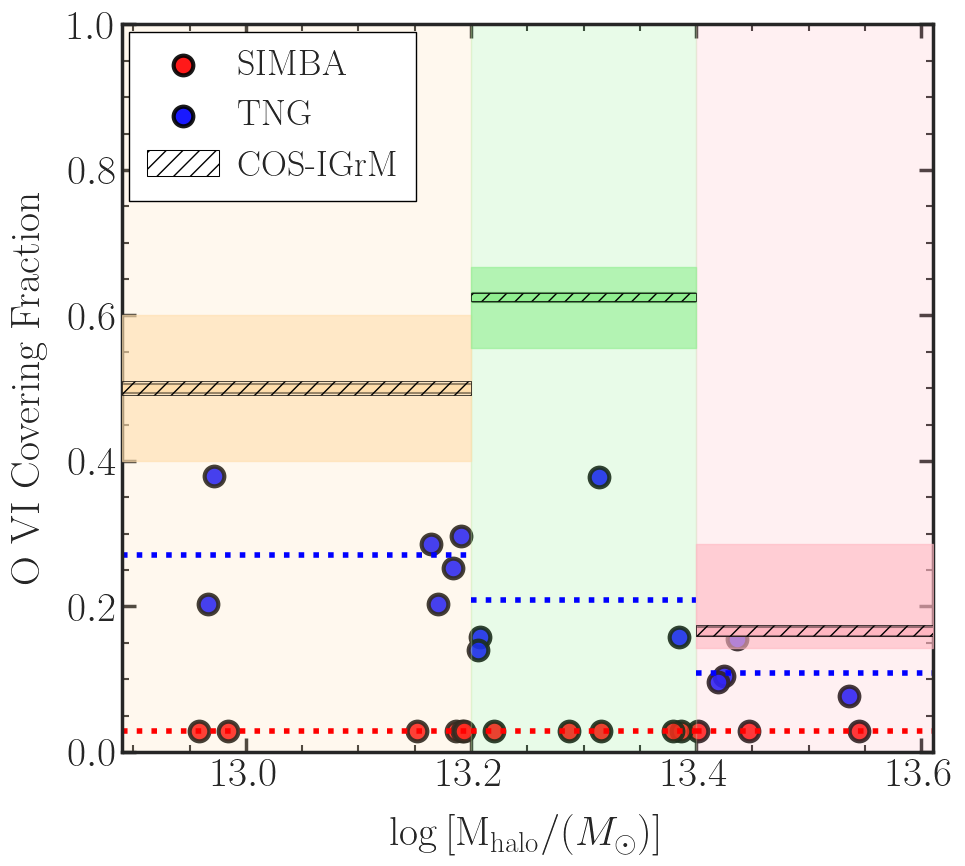

In [157]:
import os
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from astropy.table import Table
import pandas as pd
from matplotlib.ticker import AutoMinorLocator
import matplotlib.patches as mpatches
from matplotlib.lines import Line2D

# Define hatch style for the shaded region
hatch_style = '//'

def calculate_covering_fraction(base_path, halo_file, num_groups, total_sightlines=90000):
    halos = Table.read(halo_file, format='ascii.fixed_width', delimiter='|').to_pandas()
    halo_mass = []
    covering_fractions = []

    for group_id in range(num_groups):
        group_file = os.path.join(base_path, f"group_{group_id}_combined_features.txt")
        if not os.path.exists(group_file):
            print(f"Group file not found: {group_file}")
            continue

        data = Table.read(group_file, format='ascii.fixed_width', delimiter='|').to_pandas()
        # Compute total unique sightlines
        total_sightlines = data['Sightline'].nunique()
        detections = data.dropna(subset=['Chisq'])
        num_sightlines_with_absorbers = detections['Sightline'].nunique()
        covering_fraction = num_sightlines_with_absorbers / total_sightlines
        covering_fractions.append(covering_fraction)

        if group_id < len(halos):
            halo_mass.append(halos.iloc[group_id]['M_Crit200_log'])
        else:
            print(f"Group {group_id} exceeds halo file rows. Skipping...")
            covering_fractions.pop()

    return halo_mass, covering_fractions

def get_real_data_covering_fractions(plotting_file, properties_file):
    plotting_data = pd.read_csv(plotting_file, sep='\s+', comment='#')
    properties_data = pd.read_csv(properties_file, sep='\s+', comment='#')
    merged_data = pd.merge(plotting_data, properties_data, on="Group", how="inner")
    merged_data['Detection_Flag'] = (merged_data['N_OVI_err_low'] != 0.00).astype(int)
    real_data_df = merged_data[['Group', 'Mass', 'Detection_Flag']]
    return real_data_df

def divide_into_bins_fixed(data, lower=12.89, upper=13.61):
    """
    Divide the mass data into fixed bins:
      Bin 1: mass <= 13.2
      Bin 2: 13.2 < mass < 13.4
      Bin 3: mass >= 13.4
    """
    bin1 = data[data <= 13.2]
    bin2 = data[(data > 13.2) & (data < 13.4)]
    bin3 = data[data >= 13.4]
    bins = [bin1, bin2, bin3]
    bin_edges = [lower, 13.2, 13.4, upper]
    print("Mass Bins (log Mhalo):", bin_edges)
    return bins, bin_edges

def plot_covering_fraction_vs_halo_mass(simba_data, tng_data, real_data, real_bins, real_bin_edges):
    sns.set(style="ticks", font_scale=1.5, rc={"text.usetex": True})
    plt.rc('font', family='Times New Roman')
    plt.rcParams.update({
        'axes.labelsize': 26,
        'axes.titlesize': 22,
        'xtick.labelsize': 22,
        'ytick.labelsize': 22,
        'legend.fontsize': 26,
        'figure.titlesize': 22
    })

    simba_halo_mass, simba_covering_fractions = simba_data
    tng_halo_mass, tng_covering_fractions = tng_data
    
    # Calculate mean covering fractions for SIMBA and TNG in each fixed bin
    simba_means = []
    tng_means = []
    for i in range(len(real_bin_edges) - 1):
        bin_min, bin_max = real_bin_edges[i], real_bin_edges[i + 1]

        simba_in_bin = [cf for m, cf in zip(simba_halo_mass, simba_covering_fractions) if bin_min <= m < bin_max]
        print(f"SIMBA in bin {i}: {simba_in_bin}")
        
        tng_in_bin = [cf for m, cf in zip(tng_halo_mass, tng_covering_fractions) if bin_min <= m < bin_max]
        print(f"TNG in bin {i}: {tng_in_bin}")

        simba_means.append(np.mean(simba_in_bin) if simba_in_bin else None)
        tng_means.append(np.mean(tng_in_bin) if tng_in_bin else None)

    print("SIMBA means:", simba_means)
    print("TNG means:", tng_means)

    plt.figure(figsize=(10, 9))
    plt.rc('font', family='Times New Roman')
    plt.rcParams.update({
        'axes.labelsize': 32,
        'axes.titlesize': 22,
        'xtick.labelsize': 30,
        'ytick.labelsize': 30,
        'legend.fontsize': 30,
        'figure.titlesize': 22
    })
    # Plot SIMBA and TNG data
    plt.scatter(simba_halo_mass, simba_covering_fractions, label="SIMBA", alpha=0.9, s=200, edgecolor='black',
                color='red', marker='o', linewidth=3)
    plt.scatter(tng_halo_mass, tng_covering_fractions, label="TNG", alpha=0.9, s=200, edgecolor='black',
                color='blue', marker='o', linewidth=3)

    # Define colors for the three bins
    colors = ['navajowhite', 'lightgreen', 'lightpink']
    # Observational data: provided CF and error widths for each bin
    obs_CF = [0.5, 0.625, 0.167]
    obs_lower_errors = [0.25, 0.125, 0.167]  # (CF - (detections-1)/total)
    obs_upper_errors = [0.25, 0.125, 0.167]  # ((detections+1)/total - CF)
    
    # Observational data: provided CF and computed error bounds for each bin
    obs_detections = [2, 5, 1]
    obs_total = [4, 8, 6]
    obs_CF = [d / t for d, t in zip(obs_detections, obs_total)]  # [0.5, 0.625, 0.167]
    obs_lower_bounds = [d / (t + 1) for d, t in zip(obs_detections, obs_total)]  # e.g., [2/5=0.4, 5/9≈0.556, 1/7≈0.143]
    obs_upper_bounds = [(d + 1) / (t + 1) for d, t in zip(obs_detections, obs_total)]  # e.g., [3/5=0.6, 6/9≈0.667, 2/7≈0.286]

    # Plot horizontal lines and error patches for observational (COS-IGrM) data bins
    for i, bin_data in enumerate(real_bins):
        if i < 3:
            cf_to_plot = obs_CF[i]
            lower_bound = obs_lower_bounds[i]
            upper_bound = obs_upper_bounds[i]
        else:
            bin_detected = real_data.loc[real_data['Mass'].isin(bin_data) & (real_data['Detection_Flag'] == 1)]
            bin_total = real_data.loc[real_data['Mass'].isin(bin_data)]
            cf_to_plot = len(bin_detected) / len(bin_total) if len(bin_total) > 0 else 0
            lower_bound = cf_to_plot - 0.005
            upper_bound = cf_to_plot + 0.005

        # Plot a thick black horizontal line as the border for the observational CF
        plt.hlines(
            cf_to_plot, real_bin_edges[i], real_bin_edges[i + 1],
            colors='black', lw=8, zorder=9
        )
        # Plot a colored horizontal line on top of the border
        plt.hlines(
            cf_to_plot, real_bin_edges[i], real_bin_edges[i + 1],
            colors=colors[i], lw=5, label=f"Bin {i+1} (CF={cf_to_plot:.2f})", zorder=10
        )
        # Compute the full error range (already computed as lower_bound and upper_bound)
        error_range = upper_bound - lower_bound
        # Scale the error patch to be thin; here we use a scale factor of 0.2 (20% of the full error)
        error_scale = 0.1
        patch_lower = cf_to_plot - error_scale * error_range / 2
        patch_upper = cf_to_plot + error_scale * error_range / 2

        # Draw a shaded error patch (without hatching) for the full error range (optional)
        plt.fill_between(
            [real_bin_edges[i], real_bin_edges[i + 1]],
            lower_bound, upper_bound,
            color=colors[i], alpha=0.6, zorder=11
        )
        # Draw a very thin, hatched patch centered on cf_to_plot to denote the error bar
        plt.fill_between(
            [real_bin_edges[i], real_bin_edges[i + 1]],
            patch_lower, patch_upper,
            color='none', edgecolor='black', hatch=hatch_style, linewidth=0.5, zorder=12
        )
        # Optionally, add a light background span for the bin
        plt.axvspan(real_bin_edges[i], real_bin_edges[i + 1], alpha=0.2, color=colors[i])
        print(f"covering_fraction (obs) in bin {i+1}: {cf_to_plot}, error range: [{lower_bound:.3f}, {upper_bound:.3f}]")
    # Plot horizontal dotted lines for SIMBA and TNG means in each bin
    for i, mean in enumerate(simba_means):
        if mean is not None:
            plt.hlines(mean, real_bin_edges[i], real_bin_edges[i + 1], colors='red', linestyles='dotted',
                       label=f"SIMBA Bin {i+1} Mean", linewidth=4)
    for i, mean in enumerate(tng_means):
        if mean is not None:
            plt.hlines(mean, real_bin_edges[i], real_bin_edges[i + 1], colors='blue', linestyles='dotted',
                       label=f"TNG Bin {i+1} Mean", linewidth=4)

    plt.xlabel(r'$\log\left[\mathrm{M_{halo}}/(M_\odot)\right]$', fontsize=30, labelpad=15)
    plt.ylabel("O VI Covering Fraction", fontsize=30, labelpad=15)
    
    ax = plt.gca()
    ax.tick_params(axis='both', which='major', tickdir='in', width=2, length=7)
    ax.tick_params(axis='both', which='minor', tickdir='in', width=1.5, length=4)
    ax.spines['top'].set_linewidth(2.5)
    ax.spines['right'].set_linewidth(2.5)
    ax.spines['bottom'].set_linewidth(2.5)
    ax.spines['left'].set_linewidth(2.5)
    
    # Add a custom legend entry for COS-IGrM (error patch)
    cos_igrm_patch = mpatches.Patch(facecolor='white', edgecolor='black', hatch=hatch_style,
                                    label="COS-IGrM", linewidth=0.75)
    legend_handles = plt.gca().collections[:2]  # get scatter handles
    legend_handles.append(cos_igrm_patch)
    plt.legend(handles=legend_handles, loc="upper left", fontsize=26, frameon=True,
               framealpha=1, edgecolor='black', fancybox=False, shadow=False, borderpad=0.5,
               borderaxespad=0.2, handletextpad=0.5)
    
    plt.xlim(real_bin_edges[0], real_bin_edges[-1])
    plt.ylim(0, 1.0)

    ax.tick_params(axis='both', which='major', direction='in', length=10, width=2.5, top=True, right=True)
    ax.tick_params(axis='both', which='minor', direction='in', length=5, width=1.5, top=True, right=True)
    ax.xaxis.set_minor_locator(AutoMinorLocator())
    ax.yaxis.set_minor_locator(AutoMinorLocator())

    plt.tight_layout()
    output_dir = '../TNG50_fitting_results/Plots_gal_removed_new'
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)
    plt.savefig(os.path.join(output_dir, "covering_fraction_vs_halo_mass.pdf"), dpi=200)
    plt.show()

# Define paths for SIMBA, TNG, and real datasets
#simba_base_path = "../SIMBA100_fitting_results/fitting_combined_features_grp_only"
simba_base_path = '../SIMBA100_fitting_results/v_2500_data_filtered_combined'
# tng_base_path = "../TNG50_fitting_results/fitting_combined_features_grp_only_800"
tng_base_path = "../TNG50_fitting_results/v_2500_data_filtered_v800_combined_gal_removed"
simba_halo_file = "../SIMBA100_fitting_results/SIMBA_halos.txt"
tng_halo_file = "../TNG50_fitting_results/TNG_halos.txt"
plotting_file = "../COS_IGrM_Data/Plotting_data_subset_corrected_err.txt"
properties_file = "../COS_IGrM_Data/Properties.txt"

# Number of groups in each dataset
simba_num_groups = 14
tng_num_groups = 14

# Calculate covering fractions for SIMBA, TNG, and real data
simba_data = calculate_covering_fraction(simba_base_path, simba_halo_file, simba_num_groups)
tng_data = calculate_covering_fraction(tng_base_path, tng_halo_file, tng_num_groups)
real_data = get_real_data_covering_fractions(plotting_file, properties_file)
real_masses = real_data['Mass']

# Use the fixed bin definitions as specified:
real_bins, real_bin_edges = divide_into_bins_fixed(real_masses, lower=12.89, upper=13.61)

# Plot covering fraction vs halo mass with the fixed bins and error patches
plot_covering_fraction_vs_halo_mass(simba_data, tng_data, real_data, real_bins, real_bin_edges)

/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_52070/2628344164.py:117: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


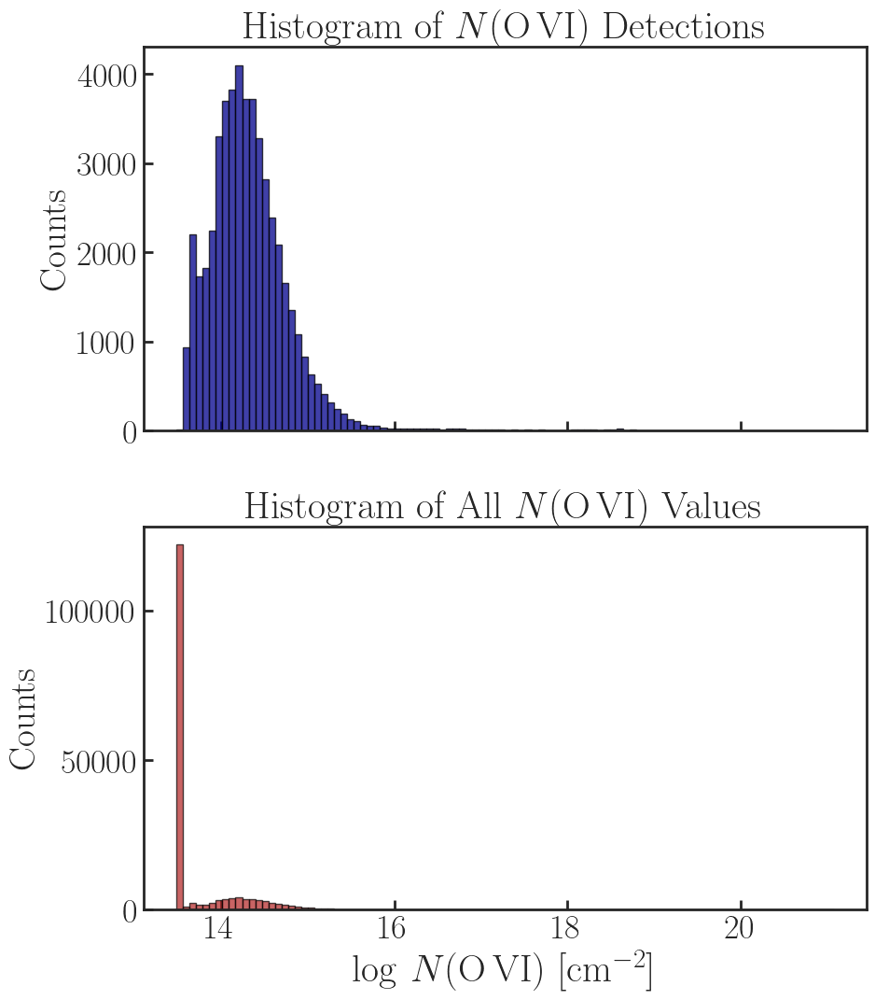

In [5]:
#!/usr/bin/env python3
# ──────────────────────────────────────────────────────────────
#  Histogram of N(OVI) for one mass bin (groups 11 & 13)
# ──────────────────────────────────────────────────────────────
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# ------------------------------------------------------------------
# 1) Paths & inputs
# ------------------------------------------------------------------
BASE_DIR = ("../TNG50_fitting_results/"
            "v_2500_data_filtered_v800_combined_gal_removed")
HALO_CAT = "../TNG50_fitting_results/TNG_halos.txt"
OUT_DIR  = "../TNG50_fitting_results/Plots_gal_removed_new"
os.makedirs(OUT_DIR, exist_ok=True)

BIN_GROUPS = {1: [11, 13]}             # mass-bin : list of group indices

# ------------------------------------------------------------------
# 2) Halo catalogue (only needed if you plan to plot mass later)
# ------------------------------------------------------------------
halo = pd.read_csv(HALO_CAT, sep="|", skipinitialspace=True)
halo.columns = halo.columns.str.strip()
halo["Grp_Index"] = halo.index
halo["M_Crit200_log"] = pd.to_numeric(halo["M_Crit200_log"], errors="coerce")

# ------------------------------------------------------------------
# 3) Collect data for the chosen bin
# ------------------------------------------------------------------
dfs = []
for gid in BIN_GROUPS[1]:
    fpath = os.path.join(BASE_DIR, f"group_{gid}_combined_features.txt")
    if not os.path.isfile(fpath):
        print(f"⚠️  missing file: {fpath}")
        continue

    gdf = pd.read_csv(fpath, sep="|", engine="python", skipinitialspace=True)
    gdf.columns = gdf.columns.str.strip()

    # numeric coercion
    for col in ("N", "dN", "Chisq"):
        if col in gdf.columns:
            gdf[col] = pd.to_numeric(gdf[col], errors="coerce")

    # tag with halo mass (optional)
    mh = halo.loc[halo["Grp_Index"] == gid, "M_Crit200_log"].values
    if mh.size:
        gdf["Halo_mass"] = mh[0]
    dfs.append(gdf[["N", "dN"]])

if not dfs:
    raise SystemExit("No data for the requested bin.")

bin_df = pd.concat(dfs, ignore_index=True)

# split detections / non-detections
detections    = bin_df[bin_df["dN"].notna()]["N"].dropna()
all_values    = bin_df["N"].dropna()

# ------------------------------------------------------------------
# 4) Matplotlib / Seaborn setup
# ------------------------------------------------------------------
sns.set(style="ticks", font_scale=1.5)

# if LaTeX is installed, uncomment the next line
# plt.rcParams["text.usetex"] = True

plt.rc("font", family="Times New Roman")
plt.rcParams.update({
    "axes.labelsize": 30,
    "axes.titlesize": 30,
    "xtick.labelsize": 26,
    "ytick.labelsize": 26,
    "legend.fontsize": 24,
})

# common bin edges so the panels line up
bin_edges = np.linspace(all_values.min(), all_values.max(), 101)

fig, axes = plt.subplots(2, 1, figsize=(10, 12), sharex=True,
                         gridspec_kw={"hspace": 0.25})

# ------------------------------------------------------------------
# 5) Panel 1 – detections
# ------------------------------------------------------------------
if detections.empty:
    axes[0].text(0.5, 0.5, "No detections",
                 ha="center", va="center", transform=axes[0].transAxes)
else:
    axes[0].hist(detections, bins=bin_edges,
                 color="darkblue", alpha=0.75, edgecolor="black")

axes[0].set_ylabel(r"Counts", fontsize=28)
axes[0].set_title(r"Histogram of $N(\mathrm{O\,VI})$ Detections", fontsize=30)

# ------------------------------------------------------------------
# 6) Panel 2 – all rows
# ------------------------------------------------------------------
axes[1].hist(all_values, bins=bin_edges,
             color="firebrick", alpha=0.7, edgecolor="black")

axes[1].set_xlabel(r"$\log\,N(\mathrm{O\,VI})\;[\mathrm{cm^{-2}}]$", fontsize=30)
axes[1].set_ylabel(r"Counts", fontsize=28)
axes[1].set_title(r"Histogram of All $N(\mathrm{O\,VI})$ Values", fontsize=30)

# ------------------------------------------------------------------
# 7) cosmetic touches
# ------------------------------------------------------------------
for ax in axes:
    ax.tick_params(width=2, length=7, direction="in")
    for spine in ("top", "right", "bottom", "left"):
        ax.spines[spine].set_linewidth(2)

plt.tight_layout()
#plt.savefig(os.path.join(OUT_DIR, "Histogram_N_OVI_Bin1.png"), dpi=400)
plt.show()

In [64]:
# ---------------------------------------------------------------
#  (place this immediately after you build `bin_df`)
# ---------------------------------------------------------------
import numpy as np

def summary(series):
    """Return a dict of basic stats for a 1-D pandas Series."""
    return {
        "count" : len(series),
        "mean"  : series.mean(),
        "median": series.median(),
        "std"   : series.std(ddof=1),
        "min"   : series.min(),
        "max"   : series.max(),
    }

# overall sample (log space)
overall_stats   = summary(bin_df["N"].dropna())

# detections only (log space)
det_stats = summary(bin_df.loc[bin_df["dN"].notna(), "N"].dropna())

# pretty print
print("\n=== N (log cm⁻²) statistics ===")
print("{:<12s} {:>7s} {:>8s} {:>8s} {:>8s} {:>8s}".format(
      "sample", "count", "mean", "median", "std", "min", "max"))

def pr(label, d):
    print("{:<12s} {:7d} {:8.3f} {:8.3f} {:8.3f} {:8.3f} {:8.3f}"
          .format(label, d["count"], d["mean"], d["median"],
                  d["std"], d["min"], d["max"]))

pr("all rows", overall_stats)
pr("detections", det_stats)

# ---------------------------------------------------------------
#  optional: linear-space stats
# ---------------------------------------------------------------
to_linear = lambda arr: 10**arr
overall_lin = summary(pd.Series(to_linear(bin_df["N"].dropna())))
det_lin     = summary(pd.Series(to_linear(
                   bin_df.loc[bin_df["dN"].notna(), "N"].dropna())))

print("\n=== N (cm⁻²) statistics (linear space) ===")
print("{:<12s} {:>7s} {:>10s} {:>10s} {:>10s} {:>10s} {:>10s}"
      .format("sample", "count", "mean", "median", "std", "min", "max"))
pr("all rows", overall_lin)
pr("detections", det_lin)


=== N (log cm⁻²) statistics ===
sample         count     mean   median      std      min
all rows      172133   13.746   13.504    0.474   13.484   21.075
detections     50115   14.335   14.267    0.530   13.484   21.075

=== N (cm⁻²) statistics (linear space) ===
sample         count       mean     median        std        min        max
all rows      172133 50488980787264736.000 31903267425354.355 5201495578876663808.000 30485266784601.328 1189624774509355597824.000
detections     50115 173339857467216064.000 185054648979471.094 9638950504748156928.000 30485266784601.328 1189624774509355597824.000


In [65]:
#!/usr/bin/env python3
# ────────────────────────────────────────────────────────────────
#  Find outliers in N (log cm⁻²)
#  • identify the 279-level culprit
#  • report every row with N > 19
# ────────────────────────────────────────────────────────────────
import os
import pandas as pd
from tqdm.auto import tqdm

BASE = ("/Users/wavefunction/ASU Dropbox/Tanmay Singh/"
        "Synthetic_IGrM_Sightlines/TNG50_fitting_results/"
        "v_2500_data_filtered_v800_combined_gal_removed")

culprit_rows  = []
high19_rows   = []

for fname in tqdm(sorted(os.listdir(BASE)), desc="groups"):
    if not (fname.startswith("group_") and fname.endswith("_combined_features.txt")):
        continue

    gid = int(fname.split('_')[1])
    path = os.path.join(BASE, fname)

    df = pd.read_csv(path, sep="|", engine="python", skipinitialspace=True)
    df.columns = df.columns.str.strip()
    df["N"] = pd.to_numeric(df["N"], errors="coerce")

    # rows with N >= 279 (the obvious outlier)
    mask_279 = df["N"] >= 279
    if mask_279.any():
        culprit = df.loc[mask_279, ["Sightline", "N"]]
        culprit["group"] = gid
        culprit_rows.append(culprit)

    # any other impossible-for-CGM values (N > 19)
    mask_19 = df["N"] > 18
    if mask_19.any():
        rows19 = df.loc[mask_19, ["Sightline", "N"]]
        rows19["group"] = gid
        high19_rows.append(rows19)

# concatenate and print
if culprit_rows:
    culprit_df = pd.concat(culprit_rows, ignore_index=True)
    print("\n=== culprit (N >= 279) ===")
    print(culprit_df.to_string(index=False))
else:
    print("\nNo rows with N >= 279 found.")

if high19_rows:
    high19_df = pd.concat(high19_rows, ignore_index=True)
    print("\n=== all rows with N > 18 ===")
    print(high19_df.sort_values("N", ascending=False).to_string(index=False))
else:
    print("\nNo rows with N > 18 found (other than the culprit).")

groups:   0%|          | 0/15 [00:00<?, ?it/s]


No rows with N >= 279 found.

=== all rows with N > 18 ===
 Sightline        N  group
     53040 21.13551      8
     47498 21.12779     10
     71426 21.09339      2
     59785 21.07541     13
      2986 21.06838      6
     40009 21.06833     13
     26065 21.02908      2
     53342 20.97127      1
     23113 20.96131     10
     11513 20.92261      6
     40447 20.90071      8
     17287 20.83610      2
     82062 20.82531      6
     13992 20.82176     12
     88131 20.81562     13
     30878 20.80772      9
     63150 20.79723      0
      2685 20.79595     10
     12998 20.76590      5
      3750 20.75452      9
      8574 20.74826     11
     21295 20.73763      9
     16963 20.72618      6
      8201 20.72436     13
     55659 20.72327      6
     29675 20.70452      1
     29523 20.68024      8
     86019 20.68014      7
     80334 20.64801     10
     76822 20.64352     13
     87540 20.64058     10
     39180 20.62626      2
     56116 20.61625      6
     11958 20.59649   

In [17]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import matplotlib.cm as cm
import glob

Bin 1 mean halo mass: 12.96908
Bin 2 mean halo mass: 13.16760175
Bin 3 mean halo mass: 13.187695000000001
Bin 4 mean halo mass: 13.206904
Bin 5 mean halo mass: 13.3136
Bin 6 mean halo mass: 13.384746
Bin 7 mean halo mass: 13.42204225
Bin 8 mean halo mass: 13.43627
Bin 9 mean halo mass: 13.536072
Bin 1 mean: 13.692697385419553
Bin 2 mean: 13.66245950403335
Bin 3 mean: 13.686452408046595
Bin 4 mean: 13.600439473705547
Bin 5 mean: 13.806387388468654
Bin 6 mean: 13.594442082387086
Bin 7 mean: 13.565018692975391
Bin 8 mean: 13.596505275421608
Bin 9 mean: 13.549575865073205
20.886853536588287


/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_52070/2701974577.py:311: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


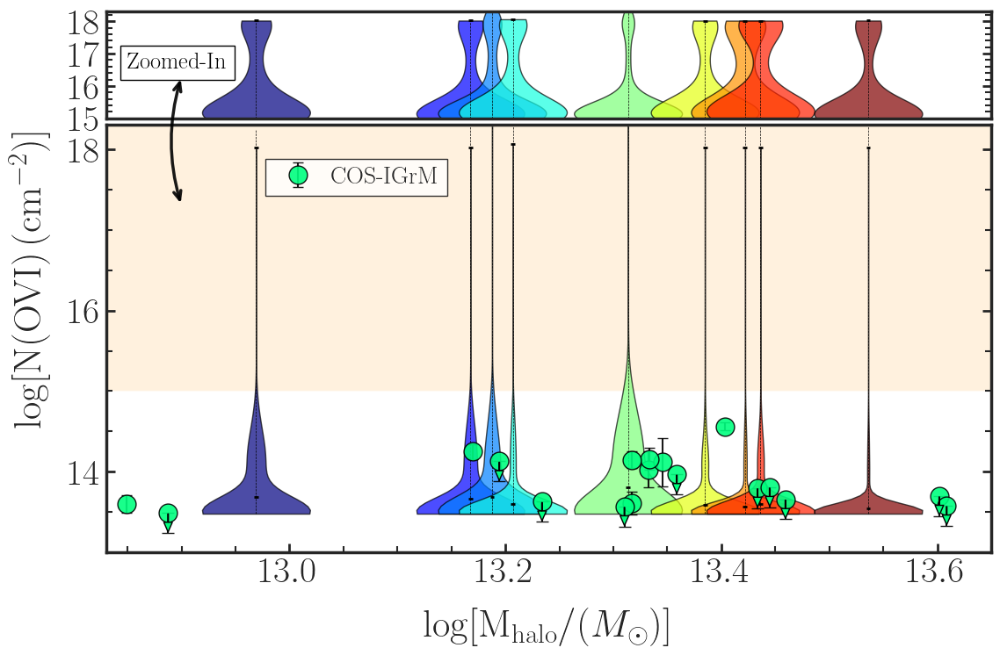

In [158]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import matplotlib.cm as cm
import glob

# Define file paths
# base_dir = '/Users/tsingh65/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines/TNG50_fitting_results/fitting_combined_features'
# halo_file_path = '/Users/tsingh65/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines/TNG50_fitting_results/TNG_halos.txt'
# full_sample_path = '/Users/tsingh65/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines/COS_IGrM_Data/Sample_full.txt'
# plotting_data_path = '/Users/tsingh65/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines/COS_IGrM_Data/Plotting_data_subset.txt'

# base_dir = '../TNG50_fitting_results/fitting_combined_features_grp_only_800'
base_dir = '../TNG50_fitting_results/v_2500_data_filtered_v800_combined_gal_removed'
halo_file_path = '../TNG50_fitting_results/TNG_halos.txt'
full_sample_path = '../COS_IGrM_Data/Sample_full.txt'
plotting_data_path = '../COS_IGrM_Data/Plotting_data_subset.txt'

# Define the bin assignments
bins = {
    1: [11, 13],
    2: [12, 2],
    3: [10, 8],
    4: [7, 9],
    5: [6],
    6: [5],
    7: [1, 4],
    8: [3],
    9: [0]
}

# Load halo mass data
halo_data = pd.read_csv(halo_file_path, sep='|', skipinitialspace=True)
halo_data.columns = halo_data.columns.str.strip()
halo_data['Grp_Index'] = halo_data.index
halo_data['M_Crit200_log'] = pd.to_numeric(halo_data['M_Crit200_log'], errors='coerce')

# Initialize a list to collect data for all bins
binned_data = []

# Loop over bins and group files
for bin_id, group_indices in bins.items():
    group_data_list = []
    bin_halo_masses = []

    for group_idx in group_indices:
        group_file = os.path.join(base_dir, f"group_{group_idx}_combined_features.txt")
        if not os.path.exists(group_file):
            print(f"File not found: {group_file}")
            continue

        group_df = pd.read_csv(group_file, sep='|', skipinitialspace=True)
        group_df.columns = group_df.columns.str.strip()

        numeric_columns = ['N', 'dN', 'Chisq']
        for col in numeric_columns:
            if col in group_df.columns:
                group_df[col] = pd.to_numeric(group_df[col], errors='coerce')

        group_df.loc[group_df['Chisq'].isna(), 'N'] = 13.504149198515174
        group_halo_mass = halo_data.loc[halo_data['Grp_Index'] == group_idx, 'M_Crit200_log'].values[0]
        bin_halo_masses.append(group_halo_mass)

        group_df['Halo_mass'] = group_halo_mass
        group_data_list.append(group_df[['N', 'Halo_mass']])

    if group_data_list:
        combined_group_data = pd.concat(group_data_list, ignore_index=True)
        combined_group_data['Bin_ID'] = bin_id
        combined_group_data['Mean_Halo_mass'] = np.mean(bin_halo_masses)
        binned_data.append(combined_group_data)

# Combine all bins
combined_binned_data = pd.concat(binned_data, ignore_index=True) if binned_data else pd.DataFrame()

# Prepare violin plot data
violin_data = []
violin_positions = []
colors = cm.jet(np.linspace(0, 1, len(bins)))
#colors = cm.coolwarm(np.linspace(0, 1, len(bins)))

for bin_id in sorted(bins.keys()):
    bin_data = combined_binned_data[combined_binned_data['Bin_ID'] == bin_id]
    if not bin_data.empty:
        mean_halo_mass = bin_data['Mean_Halo_mass'].iloc[0]
        print(f"Bin {bin_id} mean halo mass: {mean_halo_mass}")
        violin_positions.append(mean_halo_mass)
        violin_data.append(bin_data['N'].values)

# Set Seaborn and Matplotlib configurations for publication quality
sns.set(style="ticks", font_scale=1.5, rc={"text.usetex": True})
plt.rc('font', family='Times New Roman')
plt.rcParams.update({
    'axes.labelsize': 32,
    'axes.titlesize': 22,
    'xtick.labelsize': 30,
    'ytick.labelsize': 30,
    'legend.fontsize': 30,
    'figure.titlesize': 22
})

# Create the figure and subplots
fig, (ax_zoom, ax_main) = plt.subplots(
    nrows=2,
    ncols=1,
    figsize=(13, 8),
    gridspec_kw={"height_ratios": [1, 4], "hspace": 0.025}
)

# Main plot (Bottom plot)
for i, (pos, data) in enumerate(zip(violin_positions, violin_data)):
    parts = ax_main.violinplot(data, positions=[pos], widths=0.1, showmeans=False, showextrema=False, showmedians=False, bw_method=0.5)
    max_value = np.max(data)
    ax_main.hlines(max_value, pos - 0.002, pos + 0.002, color='black', linewidth=2)
    ax_main.vlines(pos, np.min(data), np.max(ax_main.get_ylim()), color='black', linewidth=0.5, linestyle='--')
    median_value = np.mean(data)
    print(f"Bin {i+1} mean: {median_value}")
    ax_main.hlines(median_value, pos - 0.002, pos + 0.002, color='black', linewidth=2)
    for pc in parts['bodies']:
        pc.set_facecolor(colors[i])
        pc.set_edgecolor('black')
        pc.set_alpha(0.7)


# Overlay McCabe data
full_sample_df = pd.read_csv(full_sample_path, sep='\s+', comment='#', engine='python')
plotting_data_df = pd.read_csv(plotting_data_path, sep='\s+', comment='#', engine='python')
full_sample_df.columns = full_sample_df.columns.str.strip()
plotting_data_df.columns = plotting_data_df.columns.str.strip()

# if 'Group' in full_sample_df.columns and 'Group' in plotting_data_df.columns:
#     merged_df = pd.merge(full_sample_df, plotting_data_df, on='Group')
#     merged_df['log_Mass'] = np.log10(merged_df['Mass'])

#     for subset_type, color, label in [('I', 'springgreen', 'IGrM'), ('C', 'springgreen', 'CGM + IGrM')]:
#         subset_df = merged_df[merged_df['Subset'] == subset_type]
#         for _, row in subset_df.iterrows():
#             label = 'COS-IGrM'
#             if row['N_OVI_err_low'] == 0.25 or row['N_OVI_err_high'] == 0.25:
                
#                 ax_main.errorbar(row['log_Mass'], row['N_OVI'], yerr=[[row['N_OVI_err_low']], [0]], fmt='o',
#                             markersize=12, markerfacecolor=color, markeredgecolor='black',
#                             ecolor='black', capsize=5, alpha=0.9, label=label if row.name == subset_df.index[0] else "")
#                 ax_main.annotate('', xy=(row['log_Mass'], row['N_OVI'] - row['N_OVI_err_low']),
#                             xytext=(row['log_Mass'], row['N_OVI']),
#                             arrowprops=dict(facecolor=color, shrink=0.05, width=0.5, headwidth=7, headlength=8,edgecolor='black'))    
#             else:
#                 ax_main.errorbar(row['log_Mass'], row['N_OVI'], 
#                             yerr=[[row['N_OVI_err_low']], [row['N_OVI_err_high']]], fmt='o', markersize=12,
#                             markerfacecolor=color, markeredgecolor='black', ecolor='black', capsize=5, alpha=0.9,
#                             label=label if row.name == subset_df.index[0] else "")


cos_label_added = False
if 'Group' in full_sample_df.columns and 'Group' in plotting_data_df.columns:
    merged_df = pd.merge(full_sample_df, plotting_data_df, on='Group')
    merged_df['log_Mass'] = np.log10(merged_df['Mass'])
    
    for subset_type, color, _ in [('I', 'springgreen', 'IGrM'), ('C', 'springgreen', 'CGM + IGrM')]:
        subset_df = merged_df[merged_df['Subset'] == subset_type]
        for idx, row in subset_df.iterrows():
            lab = "COS-IGrM" if not cos_label_added else ""
            cos_label_added = True
            if row['N_OVI_err_low'] == 0.25 or row['N_OVI_err_high'] == 0.25:
                ax_main.errorbar(row['log_Mass'], row['N_OVI'], 
                                 yerr=[[row['N_OVI_err_low']], [0]], fmt='o',
                                 markersize=15, markerfacecolor=color,
                                 markeredgecolor='black', ecolor='black',
                                 capsize=5, alpha=0.9, label=lab)
                ax_main.annotate('', xy=(row['log_Mass'], row['N_OVI'] - row['N_OVI_err_low']),
                                 xytext=(row['log_Mass'], row['N_OVI']),
                                 arrowprops=dict(facecolor=color, shrink=0.05, width=0.5,
                                                 headwidth=7, headlength=8, edgecolor='black'))
            else:
                ax_main.errorbar(row['log_Mass'], row['N_OVI'], 
                                 yerr=[[row['N_OVI_err_low']], [row['N_OVI_err_high']]], fmt='o',
                                 markersize=15, markerfacecolor=color,
                                 markeredgecolor='black', ecolor='black',
                                 capsize=4, alpha=0.9, label=lab)
                
#
# Add shaded region between y=15 and y=18 in navajowhite
max = np.max(ax_main.get_ylim())
print(max)
ax_main.axhspan(15, max, facecolor='navajowhite', alpha=0.4, zorder=0)

# Main plot customization
ax_main.set_xlabel(r'$\log[\mathrm{M_{halo}} / (M_\odot)]$', fontsize=32, labelpad=15)
# ax_main.set_ylabel(r'$\mathrm{N_{OVI}} \, \log(N)$', fontsize=32, labelpad=15)
#ax_main.set_ylabel(r'$\log[\mathrm{N(OVI)} \, (\mathrm{cm^{-2}})]$', fontsize=32, labelpad=15)
fig.text(0.04, 0.5, r'$\log[\mathrm{N(OVI)} \, (\mathrm{cm^{-2}})]$', fontsize=32, va='center', rotation='vertical')
ax_main.tick_params(axis='both', which='major', tickdir='in', width=2, length=7)
ax_main.set_ylim(13, 18.3)

logend_x = 12.969
logend_y = 18.0

# Extract legend handles and labels
handles, labels = ax_main.get_legend_handles_labels()

# Manually place the legend using transform=ax_main.transData
ax_main.legend(
    handles, labels,
    loc="upper left",  # Aligns top-left corner of the legend to the coordinates
    bbox_to_anchor=(logend_x, logend_y),  # Set exact (x, y) in data coordinates
    bbox_transform=ax_main.transData,  # Ensure the coordinates are interpreted in data space
    fontsize=20, frameon=True, edgecolor='black',
    fancybox=False, shadow=False, borderpad=0.3, borderaxespad=0.4, handletextpad=0.4,
)

# Zoomed-in plot (Top plot)
for i, (pos, data) in enumerate(zip(violin_positions, violin_data)):
    zoomed_data = data[data > 15]  # Filter data for N > 15
    if len(zoomed_data) > 0:
        parts = ax_zoom.violinplot(zoomed_data, positions=[pos], widths=0.1, showmeans=False, showextrema=False, showmedians=False, bw_method=0.4)
        max_value = np.max(zoomed_data)
        ax_zoom.hlines(max_value, pos - 0.002, pos + 0.002, color='black', linewidth=2)
        ax_zoom.vlines(pos, np.min(zoomed_data), np.max(zoomed_data), color='black', linewidth=0.5, linestyle='--')
        median_value = np.mean(zoomed_data)
        #ax_zoom.hlines(median_value, pos - 0.002, pos + 0.002, color='black', linewidth=2)
        for pc in parts['bodies']:
            pc.set_facecolor(colors[i])
            pc.set_edgecolor('black')
            pc.set_alpha(0.7)

# Customizing Zoomed-in plot
#ax_zoom.set_ylabel(r'$\mathrm{Zoomed} \, \mathrm{N_{OVI}}$', fontsize=32, labelpad=15)
ax_zoom.set_xticks([])
ax_zoom.set_xticklabels([])
ax_zoom.set_yticks([15,16,17,18])
#ax_zoom.set_ylabel("Zoomed-in", fontsize=28)


# Final adjustments
ax_zoom.spines['bottom'].set_visible(True)
ax_main.spines['top'].set_visible(True)
ax_zoom.tick_params(axis='both', which='major', tickdir='in', width=2, length=7)

ax_main.set_xlim(12.83, 13.65)
ax_zoom.set_xlim(12.83, 13.65)
ax_zoom.set_ylim(15, 18.3)


ax_main.tick_params(axis='x', which='major', bottom=True, top=False, direction='in', length=10, width=2.5)  # Bottom ticks only
ax_main.tick_params(axis='x', which='minor', bottom=True, top=False, direction='in', length=5, width=1.5)   
ax_main.tick_params(axis='y', which='major', left=True, right=True, direction='in', length=10, width=2.5)  # Left & right ticks
ax_main.tick_params(axis='y', which='minor', left=True, right=True, direction='in', length=5, width=1.5)
ax_main.xaxis.set_minor_locator(AutoMinorLocator())
ax_main.yaxis.set_minor_locator(AutoMinorLocator())

# Customize ticks for the zoomed-in (top) plot
ax_zoom.tick_params(axis='x', which='major', bottom=True, top=True, direction='in', length=10, width=2.5)  # Top ticks only
ax_zoom.tick_params(axis='x', which='minor', bottom=True, top=True, direction='in', length=5, width=1.5)
ax_zoom.tick_params(axis='y', which='major', left=True, right=True, direction='in', length=10, width=2.5)  # Left & right ticks 
ax_zoom.tick_params(axis='y', which='minor', left=True, right=True, direction='in', length=5, width=1.5)
ax_zoom.xaxis.set_minor_locator(AutoMinorLocator())
ax_zoom.yaxis.set_minor_locator(AutoMinorLocator())

from matplotlib.patches import FancyArrowPatch

# Define coordinates in the main and zoomed-in plots
start_x, start_y = 12.9, 17.3  # Near the top of ax_main
end_x, end_y = 12.9, 18.9  # Near the bottom of ax_zoom

# Create a curved arrow connecting the plots
arrow = FancyArrowPatch(
    (start_x, start_y), (end_x, end_y),
    transform=ax_main.transData,  # Transform based on main plot coordinates
    connectionstyle="arc3,rad=-0.3",  # Curved arc
    arrowstyle="Simple,head_width=1,head_length=1",
    color="black", linewidth=0.1, mutation_scale=20
)
from matplotlib.patches import FancyArrowPatch

# Define a refined arrow with a smoother curve and balanced size
arrow = FancyArrowPatch(
    (start_x, start_y), (end_x, end_y),
    transform=ax_main.transData,  # Use main plot coordinates
    arrowstyle="<->,head_width=0.3,head_length=0.7",  # Single directional arrow for clarity
    connectionstyle="arc3,rad=-0.15",  # Softer curvature for better aesthetics
    linewidth=2.5, color="black", mutation_scale=10, alpha=0.9  # Slight transparency for a natural look
)

# Add the arrow to the figure
fig.add_artist(arrow)

# Improved annotation with a rounded, soft-bordered box
ax_zoom.text(
    12.85, 16.4, "Zoomed-In", fontsize=19, color='black', fontweight='bold',
    ha='left', va='bottom',
    bbox=dict(facecolor='white', edgecolor='black', boxstyle='square,pad=0.3', alpha=1.0)  # Rounded edges, softer look
)

# Function to apply grid and appearance settings to an axis
def customize_axis(ax):
    #ax.grid(True, linestyle='--', alpha=0.5)
    ax.spines['top'].set_linewidth(2.5)
    ax.spines['right'].set_linewidth(2.5)
    ax.spines['bottom'].set_linewidth(2.5)
    ax.spines['left'].set_linewidth(2.5)
    ax.tick_params(width=2, length=7, direction='in')

# Apply the customization to both axes
customize_axis(ax_zoom)
customize_axis(ax_main)

#ax_main.legend(frameon=True,framealpha=1, edgecolor='black', fancybox=False, shadow=False, borderpad=0.25,borderaxespad=0.2, handletextpad=0.25)
# Save and show the figure
plt.tight_layout()
output_dir = '../TNG50_fitting_results/Plots_gal_removed_new'
plt.savefig(os.path.join(output_dir, 'Zoomed_and_Main_N_OVI_vs_M_halo.pdf'), dpi=300,
            bbox_inches='tight', pad_inches=0.1)
plt.show()

Bin 1 mean halo mass: 12.96908
Bin 2 mean halo mass: 13.16760175
Bin 3 mean halo mass: 13.187695000000001
Bin 4 mean halo mass: 13.206904
Bin 5 mean halo mass: 13.3136
Bin 6 mean halo mass: 13.384746
Bin 7 mean halo mass: 13.42204225
Bin 8 mean halo mass: 13.43627
Bin 9 mean halo mass: 13.536072
Bin 1 mean: 13.679597683652293
Bin 2 mean: 13.651534708777032
Bin 3 mean: 13.675398263192214
Bin 4 mean: 13.593763812136366
Bin 5 mean: 13.789398186938952
Bin 6 mean: 13.58802631192807
Bin 7 mean: 13.560117585836142
Bin 8 mean: 13.588806437520164
Bin 9 mean: 13.545890146121657


/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_83885/1414816852.py:239: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


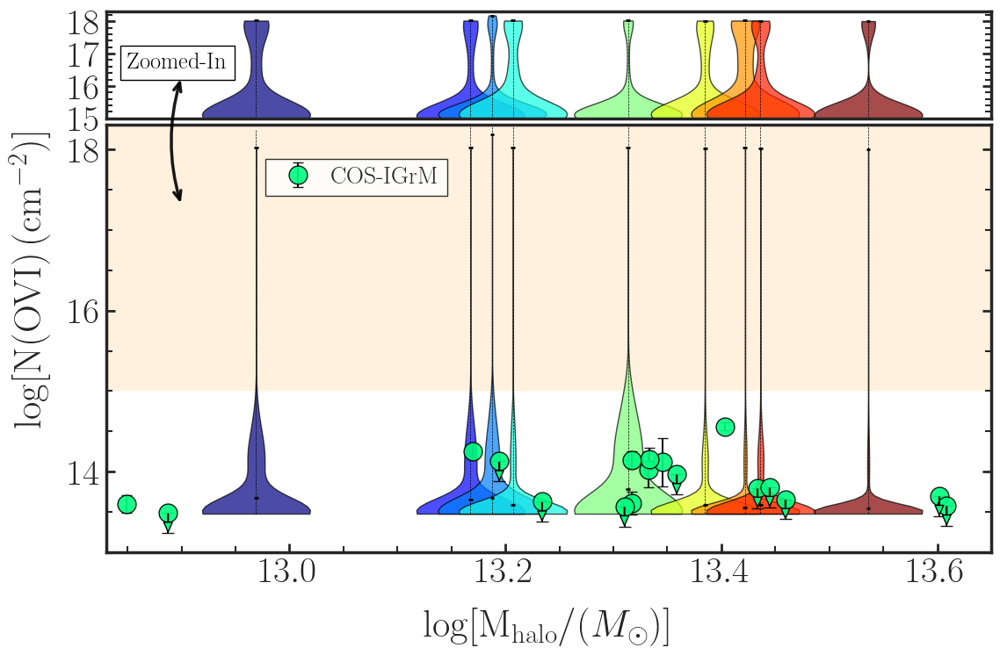

TNG Spearman correlation: rho = -0.129, p-value = 0.000
COS-IGrM Spearman correlation: rho = 0.063, p-value = 0.804
KS Test (TNG vs COS-IGrM): KS statistic = 0.769, p-value = 0.000


In [31]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import matplotlib.cm as cm
import glob
from matplotlib.ticker import AutoMinorLocator
from scipy.stats import spearmanr, ks_2samp

# Define file paths
base_dir = '../TNG50_fitting_results/fitting_combined_features_grp_only_800'
halo_file_path = '../TNG50_fitting_results/TNG_halos.txt'
full_sample_path = '../COS_IGrM_Data/Sample_full.txt'
plotting_data_path = '../COS_IGrM_Data/Plotting_data_subset.txt'

# Define the bin assignments
bins = {
    1: [11, 13],
    2: [12, 2],
    3: [10, 8],
    4: [7, 9],
    5: [6],
    6: [5],
    7: [1, 4],
    8: [3],
    9: [0]
}

# Load halo mass data
halo_data = pd.read_csv(halo_file_path, sep='|', skipinitialspace=True)
halo_data.columns = halo_data.columns.str.strip()
halo_data['Grp_Index'] = halo_data.index
halo_data['M_Crit200_log'] = pd.to_numeric(halo_data['M_Crit200_log'], errors='coerce')

# Initialize a list to collect data for all bins
binned_data = []

# Loop over bins and group files
for bin_id, group_indices in bins.items():
    group_data_list = []
    bin_halo_masses = []
    for group_idx in group_indices:
        group_file = os.path.join(base_dir, f"group_{group_idx}_combined_features.txt")
        if not os.path.exists(group_file):
            print(f"File not found: {group_file}")
            continue

        group_df = pd.read_csv(group_file, sep='|', skipinitialspace=True)
        group_df.columns = group_df.columns.str.strip()

        numeric_columns = ['N', 'dN', 'Chisq']
        for col in numeric_columns:
            if col in group_df.columns:
                group_df[col] = pd.to_numeric(group_df[col], errors='coerce')

        group_df.loc[group_df['Chisq'].isna(), 'N'] = 13.504149198515174
        group_halo_mass = halo_data.loc[halo_data['Grp_Index'] == group_idx, 'M_Crit200_log'].values[0]
        bin_halo_masses.append(group_halo_mass)
        group_df['Halo_mass'] = group_halo_mass
        group_data_list.append(group_df[['N', 'Halo_mass']])
    if group_data_list:
        combined_group_data = pd.concat(group_data_list, ignore_index=True)
        combined_group_data['Bin_ID'] = bin_id
        combined_group_data['Mean_Halo_mass'] = np.mean(bin_halo_masses)
        binned_data.append(combined_group_data)

# Combine all bins
combined_binned_data = pd.concat(binned_data, ignore_index=True) if binned_data else pd.DataFrame()

# Prepare violin plot data
violin_data = []
violin_positions = []
colors = cm.jet(np.linspace(0, 1, len(bins)))
for bin_id in sorted(bins.keys()):
    bin_data = combined_binned_data[combined_binned_data['Bin_ID'] == bin_id]
    if not bin_data.empty:
        mean_halo_mass = bin_data['Mean_Halo_mass'].iloc[0]
        print(f"Bin {bin_id} mean halo mass: {mean_halo_mass}")
        violin_positions.append(mean_halo_mass)
        violin_data.append(bin_data['N'].values)

# Set Seaborn and Matplotlib configurations for publication quality
sns.set(style="ticks", font_scale=1.5, rc={"text.usetex": True})
plt.rc('font', family='Times New Roman')
plt.rcParams.update({
    'axes.labelsize': 32,
    'axes.titlesize': 22,
    'xtick.labelsize': 30,
    'ytick.labelsize': 30,
    'legend.fontsize': 30,
    'figure.titlesize': 22
})

# Create the figure and subplots
fig, (ax_zoom, ax_main) = plt.subplots(
    nrows=2,
    ncols=1,
    figsize=(13, 8),
    gridspec_kw={"height_ratios": [1, 4], "hspace": 0.025}
)

# Main plot (Bottom plot)
for i, (pos, data) in enumerate(zip(violin_positions, violin_data)):
    parts = ax_main.violinplot(data, positions=[pos], widths=0.1, showmeans=False, 
                               showextrema=False, showmedians=False, bw_method=0.5)
    max_value = np.max(data)
    ax_main.hlines(max_value, pos - 0.002, pos + 0.002, color='black', linewidth=2)
    ax_main.vlines(pos, np.min(data), np.max(ax_main.get_ylim()), color='black', linewidth=0.5, linestyle='--')
    median_value = np.mean(data)
    print(f"Bin {i+1} mean: {median_value}")
    ax_main.hlines(median_value, pos - 0.002, pos + 0.002, color='black', linewidth=2)
    for pc in parts['bodies']:
        pc.set_facecolor(colors[i])
        pc.set_edgecolor('black')
        pc.set_alpha(0.7)

# Overlay COS-IGrM data
full_sample_df = pd.read_csv(full_sample_path, sep='\s+', comment='#', engine='python')
plotting_data_df = pd.read_csv(plotting_data_path, sep='\s+', comment='#', engine='python')
full_sample_df.columns = full_sample_df.columns.str.strip()
plotting_data_df.columns = plotting_data_df.columns.str.strip()

cos_label_added = False
if 'Group' in full_sample_df.columns and 'Group' in plotting_data_df.columns:
    merged_df = pd.merge(full_sample_df, plotting_data_df, on='Group')
    merged_df['log_Mass'] = np.log10(merged_df['Mass'])
    for subset_type, color, _ in [('I', 'springgreen', 'IGrM'), ('C', 'springgreen', 'CGM + IGrM')]:
        subset_df = merged_df[merged_df['Subset'] == subset_type]
        for idx, row in subset_df.iterrows():
            lab = "COS-IGrM" if not cos_label_added else ""
            cos_label_added = True
            if row['N_OVI_err_low'] == 0.25 or row['N_OVI_err_high'] == 0.25:
                ax_main.errorbar(row['log_Mass'], row['N_OVI'], 
                                 yerr=[[row['N_OVI_err_low']], [0]], fmt='o',
                                 markersize=15, markerfacecolor=color,
                                 markeredgecolor='black', ecolor='black',
                                 capsize=5, alpha=0.9, label=lab)
                ax_main.annotate('', xy=(row['log_Mass'], row['N_OVI'] - row['N_OVI_err_low']),
                                 xytext=(row['log_Mass'], row['N_OVI']),
                                 arrowprops=dict(facecolor=color, shrink=0.05, width=0.5,
                                                 headwidth=7, headlength=8, edgecolor='black'))
            else:
                ax_main.errorbar(row['log_Mass'], row['N_OVI'], 
                                 yerr=[[row['N_OVI_err_low']], [row['N_OVI_err_high']]], fmt='o',
                                 markersize=15, markerfacecolor=color,
                                 markeredgecolor='black', ecolor='black',
                                 capsize=4, alpha=0.9, label=lab)

# Add shaded region between y=15 and y=max in navajowhite
max_ylim = np.max(ax_main.get_ylim())
ax_main.axhspan(15, max_ylim, facecolor='navajowhite', alpha=0.4, zorder=0)

# Main plot customization
ax_main.set_xlabel(r'$\log[\mathrm{M_{halo}} / (M_\odot)]$', fontsize=32, labelpad=15)
fig.text(0.04, 0.5, r'$\log[\mathrm{N(OVI)} \, (\mathrm{cm^{-2}})]$', fontsize=32, va='center', rotation='vertical')
ax_main.tick_params(axis='both', which='major', tickdir='in', width=2, length=7)
ax_main.set_ylim(13, 18.3)

logend_x = 12.969
logend_y = 18.0

handles, labels = ax_main.get_legend_handles_labels()
ax_main.legend(
    handles, labels,
    loc="upper left",
    bbox_to_anchor=(logend_x, logend_y),
    bbox_transform=ax_main.transData,
    fontsize=20, frameon=True, edgecolor='black',
    fancybox=False, shadow=False, borderpad=0.3, borderaxespad=0.4, handletextpad=0.4,
)

# Zoomed-in plot (Top plot)
for i, (pos, data) in enumerate(zip(violin_positions, violin_data)):
    zoomed_data = data[data > 15]  # Filter data for N > 15
    if len(zoomed_data) > 0:
        parts = ax_zoom.violinplot(zoomed_data, positions=[pos], widths=0.1, showmeans=False, 
                                   showextrema=False, showmedians=False, bw_method=0.4)
        max_value = np.max(zoomed_data)
        ax_zoom.hlines(max_value, pos - 0.002, pos + 0.002, color='black', linewidth=2)
        ax_zoom.vlines(pos, np.min(zoomed_data), np.max(zoomed_data), color='black', linewidth=0.5, linestyle='--')
        for pc in parts['bodies']:
            pc.set_facecolor(colors[i])
            pc.set_edgecolor('black')
            pc.set_alpha(0.7)
ax_zoom.set_xticks([])
ax_zoom.set_xticklabels([])
ax_zoom.set_yticks([15,16,17,18])

# Final adjustments
ax_zoom.spines['bottom'].set_visible(True)
ax_main.spines['top'].set_visible(True)
ax_zoom.tick_params(axis='both', which='major', tickdir='in', width=2, length=7)
ax_main.set_xlim(12.83, 13.65)
ax_zoom.set_xlim(12.83, 13.65)
ax_zoom.set_ylim(15, 18.3)
ax_main.tick_params(axis='x', which='major', bottom=True, top=False, direction='in', length=10, width=2.5)
ax_main.tick_params(axis='x', which='minor', bottom=True, top=False, direction='in', length=5, width=1.5)
ax_main.tick_params(axis='y', which='major', left=True, right=True, direction='in', length=10, width=2.5)
ax_main.tick_params(axis='y', which='minor', left=True, right=True, direction='in', length=5, width=1.5)
ax_main.xaxis.set_minor_locator(AutoMinorLocator())
ax_main.yaxis.set_minor_locator(AutoMinorLocator())
ax_zoom.tick_params(axis='x', which='major', bottom=True, top=True, direction='in', length=10, width=2.5)
ax_zoom.tick_params(axis='x', which='minor', bottom=True, top=True, direction='in', length=5, width=1.5)
ax_zoom.tick_params(axis='y', which='major', left=True, right=True, direction='in', length=10, width=2.5)
ax_zoom.tick_params(axis='y', which='minor', left=True, right=True, direction='in', length=5, width=1.5)
ax_zoom.xaxis.set_minor_locator(AutoMinorLocator())
ax_zoom.yaxis.set_minor_locator(AutoMinorLocator())

from matplotlib.patches import FancyArrowPatch

start_x, start_y = 12.9, 17.3
end_x, end_y = 12.9, 18.9
arrow = FancyArrowPatch(
    (start_x, start_y), (end_x, end_y),
    transform=ax_main.transData,
    arrowstyle="<->,head_width=0.3,head_length=0.7",
    connectionstyle="arc3,rad=-0.15",
    linewidth=2.5, color="black", mutation_scale=10, alpha=0.9
)
fig.add_artist(arrow)

ax_zoom.text(
    12.85, 16.4, "Zoomed-In", fontsize=19, color='black', fontweight='bold',
    ha='left', va='bottom',
    bbox=dict(facecolor='white', edgecolor='black', boxstyle='square,pad=0.3', alpha=1.0)
)

def customize_axis(ax):
    ax.spines['top'].set_linewidth(2.5)
    ax.spines['right'].set_linewidth(2.5)
    ax.spines['bottom'].set_linewidth(2.5)
    ax.spines['left'].set_linewidth(2.5)
    ax.tick_params(width=2, length=7, direction='in')

customize_axis(ax_zoom)
customize_axis(ax_main)

plt.tight_layout()
output_dir = '../TNG50_fitting_results/Plots_gal_removed'
plt.show()

# ===================================================
# Statistical Tests (No Plotting)
# ===================================================

# --- Step 2: Separate Spearman correlation tests ---

# For TNG simulation data: use the combined_binned_data dataframe
if not combined_binned_data.empty:
    # Use individual 'Halo_mass' for each entry and 'N' for log OVI column density
    tng_mass = combined_binned_data['Halo_mass']
    tng_N = combined_binned_data['N']
    rho_tng, pval_tng = spearmanr(tng_mass, tng_N)
    print("TNG Spearman correlation: rho = {:.3f}, p-value = {:.3f}".format(rho_tng, pval_tng))
else:
    print("No TNG simulation data available for Spearman correlation test.")

# For COS-IGrM observational data: use the merged_df dataframe
try:
    cos_data = merged_df.copy()
except NameError:
    print("COS-IGrM merged data (merged_df) not found.")
    cos_data = pd.DataFrame()

if not cos_data.empty:
    cos_mass = cos_data['log_Mass']
    cos_N = cos_data['N_OVI']
    rho_cos, pval_cos = spearmanr(cos_mass, cos_N)
    print("COS-IGrM Spearman correlation: rho = {:.3f}, p-value = {:.3f}".format(rho_cos, pval_cos))
else:
    print("No COS-IGrM observational data available for Spearman correlation test.")

# --- Step 3: Two-sample KS test between TNG and COS-IGrM column density distributions ---
if not combined_binned_data.empty and not cos_data.empty:
    ks_stat, ks_p = ks_2samp(tng_N, cos_N)
    print("KS Test (TNG vs COS-IGrM): KS statistic = {:.3f}, p-value = {:.3f}".format(ks_stat, ks_p))
else:
    print("Insufficient data available for KS test between TNG and COS-IGrM.")

In [159]:
from scipy.stats import spearmanr
import pandas as pd
import numpy as np
import os

# Define file paths
base_dir = '../TNG50_fitting_results/fitting_combined_features_grp_only_800'
halo_file_path = '../TNG50_fitting_results/TNG_halos.txt'

# Load halo mass data
halo_data = pd.read_csv(halo_file_path, sep='|', skipinitialspace=True)
halo_data.columns = halo_data.columns.str.strip()
halo_data['Grp_Index'] = halo_data.index
halo_data['M_Crit200_log'] = pd.to_numeric(halo_data['M_Crit200_log'], errors='coerce')

# Initialize lists for storing extracted data
halo_masses_detections = []
column_densities_detections = []

halo_masses_all = []
column_densities_all = []

# Loop over all groups
for group_idx in range(len(halo_data)):
    group_file = os.path.join(base_dir, f"group_{group_idx}_combined_features.txt")
    
    if not os.path.exists(group_file):
        print(f"File not found: {group_file}")
        continue

    # Load group data
    group_df = pd.read_csv(group_file, sep='|', skipinitialspace=True)
    group_df.columns = group_df.columns.str.strip()

    # Ensure numeric conversion
    numeric_columns = ['N', 'dN']
    for col in numeric_columns:
        if col in group_df.columns:
            group_df[col] = pd.to_numeric(group_df[col], errors='coerce')

    # Extract corresponding halo mass
    group_halo_mass = halo_data.loc[halo_data['Grp_Index'] == group_idx, 'M_Crit200_log'].values[0]

    # ---- CORRELATION FOR DETECTIONS ONLY ----
    detected_sightlines = group_df.dropna(subset=['dN'])
    
    if not detected_sightlines.empty:
        halo_masses_detections.extend([group_halo_mass] * len(detected_sightlines))
        column_densities_detections.extend(detected_sightlines['N'].values)

    # ---- CORRELATION FOR ALL SIGHTLINES (DETECTIONS + NON-DETECTIONS) ----
    halo_masses_all.extend([group_halo_mass] * len(group_df))  # All sightlines
    column_densities_all.extend(group_df['N'].values)  # All column densities

# Convert to NumPy arrays
halo_masses_detections = np.array(halo_masses_detections)
column_densities_detections = np.array(column_densities_detections)

halo_masses_all = np.array(halo_masses_all)
column_densities_all = np.array(column_densities_all)

# Perform Spearman rank correlation test for detections only
spearman_corr_det, p_value_det = spearmanr(halo_masses_detections, column_densities_detections)

# Perform Spearman rank correlation test for all sightlines
spearman_corr_all, p_value_all = spearmanr(halo_masses_all, column_densities_all)

# Print results
print("\n===== Spearman Correlation for Detections Only =====")
print(f"Spearman Correlation Coefficient: {spearman_corr_det:.3f}")
print(f"P-value: {p_value_det:.3e}")

if p_value_det < 0.05:
    print("Statistically significant correlation detected.")
    if spearman_corr_det < 0:
        print("Indicates that higher halo mass is associated with lower column density absorbers (detections only).")
    else:
        print("Indicates that higher halo mass is associated with higher column density absorbers (detections only).")
else:
    print("No statistically significant correlation detected for detections only.")

print("\n===== Spearman Correlation for All Sightlines (Detections + Non-Detections) =====")
print(f"Spearman Correlation Coefficient: {spearman_corr_all:.3f}")
print(f"P-value: {p_value_all}")

if p_value_all < 0.05:
    print("Statistically significant correlation detected.")
    if spearman_corr_all < 0:
        print("Indicates that higher halo mass is associated with lower column density absorbers (all sightlines).")
    else:
        print("Indicates that higher halo mass is associated with higher column density absorbers (all sightlines).")
else:
    print("No statistically significant correlation detected for all sightlines.")


===== Spearman Correlation for Detections Only =====
Spearman Correlation Coefficient: -0.002
P-value: 2.588e-01
No statistically significant correlation detected for detections only.

===== Spearman Correlation for All Sightlines (Detections + Non-Detections) =====
Spearman Correlation Coefficient: -0.141
P-value: 0.0
Statistically significant correlation detected.
Indicates that higher halo mass is associated with lower column density absorbers (all sightlines).


In [8]:
from scipy.stats import pearsonr

# Perform Pearson correlation
pearson_corr, pearson_pval = pearsonr(halo_masses, column_densities)

# Print results
print(f"Pearson Correlation Coefficient: {pearson_corr:.3f}")
print(f"P-value: {pearson_pval:.3e}")

if pearson_pval < 0.05:
    print("Statistically significant correlation detected.")
    if pearson_corr > 0:
        print("Indicates that higher halo mass is associated with higher column density.")
    else:
        print("Indicates that higher halo mass is associated with lower column density.")
else:
    print("No statistically significant correlation detected.")

NameError: name 'halo_masses' is not defined

In [160]:
from scipy.stats import mannwhitneyu

# Define median halo mass as threshold
median_mass = np.median(halo_masses)

# Split data into low-mass and high-mass bins
low_mass_N = column_densities[np.array(halo_masses) <= median_mass]
high_mass_N = column_densities[np.array(halo_masses) > median_mass]

# Perform Mann-Whitney U-test
u_stat, mw_pval = mannwhitneyu(low_mass_N, high_mass_N, alternative='two-sided')

# Print results
print(f"Mann-Whitney U-test Statistic: {u_stat:.3f}")
print(f"P-value: {mw_pval:.3e}")

if mw_pval < 0.05:
    print("Statistically significant difference detected.")
    if np.median(high_mass_N) > np.median(low_mass_N):
        print("High-mass halos tend to have higher column densities.")
    else:
        print("High-mass halos tend to have lower column densities.")
else:
    print("No significant difference in column densities between high and low mass halos.")

NameError: name 'column_densities' is not defined

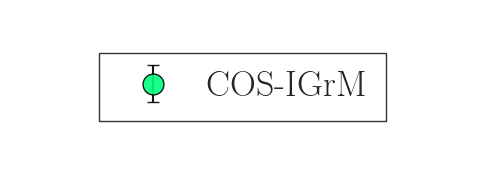

In [161]:
import matplotlib.pyplot as plt

# Create a separate figure for the legend
fig_legend = plt.figure(figsize=(6, 2))  # Adjust size as needed

# Extract legend handles and labels
handles, labels = ax_main.get_legend_handles_labels()

# Create the legend plot
fig_legend.legend(
    handles, labels, loc="center", fontsize=26, frameon=True, edgecolor='black',
    fancybox=False, shadow=False, borderpad=0.5, borderaxespad=0.2, handletextpad=0.5
)

# Remove axes (makes the legend standalone)
plt.axis("off")

# Define the output directory for saving
legend_output_dir = '../TNG50_fitting_results/Plots_gal_removed'
os.makedirs(legend_output_dir, exist_ok=True)

# Save as PNG (or PDF for high quality)
legend_path = os.path.join(legend_output_dir, "legend_only.png")
plt.savefig(legend_path, dpi=400, bbox_inches='tight', transparent=True)

# Show the legend separately
plt.show()

In [162]:
import matplotlib.ticker as ticker
import matplotlib.colors as mcolors
from mpl_toolkits.axes_grid1 import make_axes_locatable

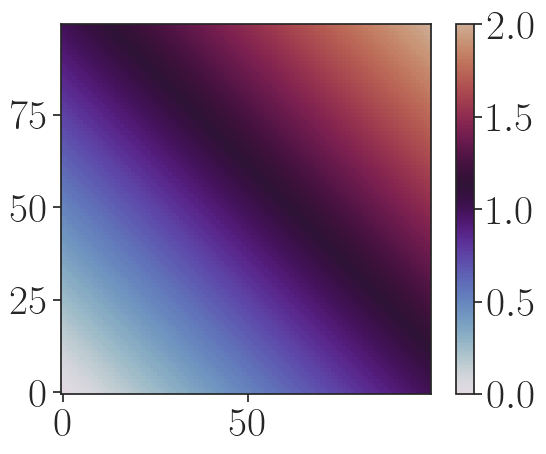

In [163]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

# 1) grab the cyclic cmap
orig = plt.get_cmap('twilight')

# 2) choose your cut fraction (e.g. 320°/360°)
cut = 320/360

# 3) sample the first `cut` part of the cycle into a new LinearSegmentedColormap
n = 256
colors = orig(np.linspace(0, cut, n))
twilight_trunc = mcolors.LinearSegmentedColormap.from_list(
    'twilight_trunc', colors, N=n
)

# 4) use it just like any other cmap
x = np.linspace(0, 1, 100)
y = np.linspace(0, 1, 100)[:,None]
plt.imshow(x+y, cmap=twilight_trunc, origin='lower')
plt.colorbar()
plt.show()

100%|██████████| 14/14 [00:05<00:00,  2.56it/s]
/Users/wavefunction/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines/igrm/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/wavefunction/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines/igrm/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/wavefunction/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines/igrm/lib/python3.11/site-packages/seaborn/distributions.py:1185: UserWarning: The following kwargs were not used by contour: 'rasterized'
  cset = contour_func(
/Users/wavefunction/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sigh

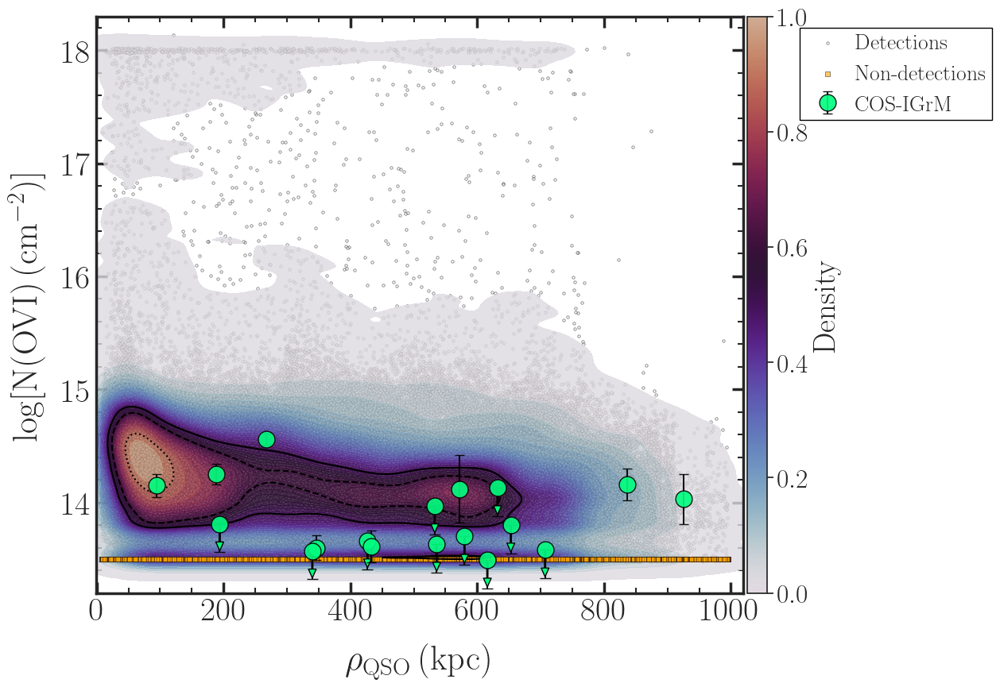

In [ ]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
import h5py
import matplotlib.ticker as ticker
import matplotlib.colors as mcolors
from mpl_toolkits.axes_grid1 import make_axes_locatable

# Paths
# base_dir = '/Users/tsingh65/ASU Dropbox/Tanmay Singh/Grad School/MgII_TNG_Project/Primary Project/Trident Codes/TNG_50_z_0.1_groups/revised_final'
# halo_file_path = '/Users/tsingh65/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines/TNG50_fitting_results/TNG_halos.txt'
# fitting_dir = '/Users/tsingh65/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines/TNG50_fitting_results/fitting_combined_features_grp_only'
# full_sample_path = '/Users/tsingh65/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines/COS_IGrM_Data/Sample_full.txt'
# plotting_data_path = '/Users/tsingh65/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines/COS_IGrM_Data/Plotting_data_subset.txt'

base_dir = '../../Grad School/MgII_TNG_Project/Primary Project/Trident Codes/TNG_50_z_0.1_groups/revised_final'
halo_file_path = '../TNG50_fitting_results/TNG_halos.txt'
# fitting_dir = '../TNG50_fitting_results/fitting_combined_features_grp_only_800'
fitting_dir = '../TNG50_fitting_results/v_2500_data_filtered_v800_combined_gal_removed'
full_sample_path = '../COS_IGrM_Data/Sample_full.txt'
plotting_data_path = '../COS_IGrM_Data/Plotting_data_subset.txt'


# Constants
z = 0.09940180263022191  # Redshift
a = 1 / (1 + z)  # Scale factor
h = 0.6774  # Hubble parameter
box_size = 35000  # Simulation box size

# Helper function for cyclic correction
def apply_cyclic_condition(ray_coord, center_coord, box_size):
    diff = np.abs(center_coord - ray_coord)
    if diff > box_size / 2:
        if center_coord > ray_coord:
            center_coord -= box_size
        else:
            center_coord += box_size
    return center_coord

# Load the halo group data
halo_data = pd.read_csv(halo_file_path, sep='|', skipinitialspace=True)
halo_data.columns = halo_data.columns.str.strip()
halo_data['Grp_Index'] = np.arange(len(halo_data))  # Reindex rows as Grp_Index

# Extract relevant columns and convert to numeric
halo_data['GroupPos_x'] = pd.to_numeric(halo_data['GroupPos_x(𝑐𝑘𝑝𝑐/ℎ)'], errors='coerce')
halo_data['GroupPos_y'] = pd.to_numeric(halo_data['GroupPos_y(𝑐𝑘𝑝𝑐/ℎ)'], errors='coerce')

# Initialize arrays for results
impact_params = []
n_ovi_detections = []
impact_params_non_detections = []
n_ovi_non_detections = []

# Loop through all group files
for grp_index in tqdm(range(len(halo_data))):
    # Load the ray data for this group
    ray_file = os.path.join(base_dir, f"integral_TNG50-1_z0.1_n300d2-sample_localized_OVInumdens_{grp_index}-of-14.hdf5")
    if not os.path.exists(ray_file):
        print(f"File not found: {ray_file}")
        continue

    # Read the ray positions from the HDF5 file
    with h5py.File(ray_file, 'r') as f:
        ray_positions = f['ray_pos'][:]  # Read the dataset as a NumPy array

    # Extract group center coordinates and apply cyclic correction
    center_x, center_y = halo_data.loc[grp_index, ['GroupPos_x', 'GroupPos_y']]
    corrected_center_x = np.array([apply_cyclic_condition(ray_x, center_x, box_size) for ray_x in ray_positions[:, 0]])
    corrected_center_y = np.array([apply_cyclic_condition(ray_y, center_y, box_size) for ray_y in ray_positions[:, 1]])

    # Compute the impact parameter for each ray
    rho = np.sqrt((ray_positions[:, 0] - corrected_center_x) ** 2 +
                  (ray_positions[:, 1] - corrected_center_y) ** 2)

    # Load the corresponding fitting results
    fitting_file = os.path.join(fitting_dir, f"group_{grp_index}_combined_features.txt")
    if not os.path.exists(fitting_file):
        print(f"File not found: {fitting_file}")
        continue

    fitting_data = pd.read_csv(fitting_file, sep='|', skipinitialspace=True)
    fitting_data.columns = fitting_data.columns.str.strip()

    # Filter for detections and non-detections
    detected_data = fitting_data[~fitting_data['dN'].isna()]
    non_detected_data = fitting_data[fitting_data['dN'].isna()]

    # Store the impact parameter and log N(OVI)
    for sightline_id, log_n in zip(detected_data['Sightline'], detected_data['N']):
        # if rho[sightline_id] <= 2000:  # Exclude sightlines with rho > 2000
        impact_params.append(rho[sightline_id])
        n_ovi_detections.append(log_n)
    for sightline_id in non_detected_data['Sightline']:
        ##if rho[sightline_id] <= 2000:
        impact_params_non_detections.append(rho[sightline_id])

# Replace all N for non-detections
n_ovi_non_detections = [13.5] * len(impact_params_non_detections)

# Convert results to numpy arrays
impact_params = np.array(impact_params)
n_ovi_detections = np.array(n_ovi_detections)
impact_params_non_detections = np.array(impact_params_non_detections)

# Convert impact parameters from ckpc/h to physical kpc at redshift z
impact_params = impact_params / h * a
impact_params_non_detections = impact_params_non_detections / h * a

# Plotting
# fig, ax = plt.subplots(figsize=(12, 9))
fig, ax = plt.subplots(figsize=(13, 9))

# Scatter plot for simulation data
ax.scatter(
    impact_params, n_ovi_detections, color='white', s=6, alpha=0.6,
    edgecolor='black', linewidth=0.5, marker='o', zorder=0, label='Detections'
)
ax.scatter(
    impact_params_non_detections, n_ovi_non_detections, color='orange', s=13, alpha=0.6,
    edgecolor='black', linewidth=0.5, marker='s', zorder=3, label='Non-detections'
)

#KDE plot for simulation data
kde = sns.kdeplot(
    x=impact_params, y=n_ovi_detections, fill=True,
    cmap=twilight_trunc, levels=40, thresh=0.002, alpha=0.8, ax=ax, rasterized=True, zorder=2
)
sns.kdeplot(
    x=impact_params, y=n_ovi_detections, levels=[0.5, 0.68, 0.95], color="black",
    linewidths=1.5, ax=ax, linestyles=["solid", "dashed", "dotted"], zorder=3
)

# **Add Colorbar for KDE**

# Create an axis for the colorbar
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="3%", pad=0.05)

kde_min, kde_max = kde.collections[0].get_clim()  # Get color limits from KDE

# Define normalization based on actual KDE density values
norm = mcolors.Normalize(vmin=kde_min, vmax=kde_max)
sm = cm.ScalarMappable(cmap=twilight_trunc, norm=norm)
sm.set_array([])  # Needed for colorbar

# Add Colorbar
cbar = fig.colorbar(sm, cax=cax, orientation="vertical")
cbar.set_label(r'$\mathrm{Density}$', fontsize=28)
cbar.ax.tick_params(labelsize=24)


# Overlay observational data
full_sample_df = pd.read_csv(full_sample_path, sep='\s+', comment='#', engine='python')
plotting_data_df = pd.read_csv(plotting_data_path, sep='\s+', comment='#', engine='python')
full_sample_df.columns = full_sample_df.columns.str.strip()
plotting_data_df.columns = plotting_data_df.columns.str.strip()

# if 'Group' in full_sample_df.columns and 'Group' in plotting_data_df.columns:
#     merged_df = pd.merge(full_sample_df, plotting_data_df, on='Group')
#     merged_df['Impact_Param'] = merged_df['QSO_Rho(kpc)']

#     # Plot observational data
#     for subset_type, color, label in [('I', 'springgreen', 'IGrM'), ('C', 'cyan', 'CGM + IGrM')]:
#         subset_df = merged_df[merged_df['Subset'] == subset_type]
#         for _, row in subset_df.iterrows():
#             if row['N_OVI_err_low'] == 0.25 or row['N_OVI_err_high'] == 0.25:
#                 ax.errorbar(row['Impact_Param'], row['N_OVI'], 
#                             yerr=[[row['N_OVI_err_low']], [0]], fmt='o', markersize=15, markerfacecolor=color,
#                             markeredgecolor='black', ecolor='black', capsize=5, alpha=0.9, zorder=4,
#                             label=label if row.name == subset_df.index[0] else "")
#                 ax.annotate('', xy=(row['Impact_Param'], row['N_OVI'] - row['N_OVI_err_low']),
#                             xytext=(row['Impact_Param'], row['N_OVI']),
#                             arrowprops=dict(facecolor=color, shrink=0.05, width=1, headwidth=7, headlength=8,edgecolor = 'black'), zorder=4)
#             else:
#                 ax.errorbar(row['Impact_Param'], row['N_OVI'], 
#                             yerr=[[row['N_OVI_err_low']], [row['N_OVI_err_high']]], fmt='o', markersize=15,
#                             markerfacecolor=color, markeredgecolor='black', ecolor='black', capsize=4, alpha=0.9,
#                             zorder=4, label=label if row.name == subset_df.index[0] else "")

cos_label_added = False
if 'Group' in full_sample_df.columns and 'Group' in plotting_data_df.columns:
    merged_df = pd.merge(full_sample_df, plotting_data_df, on='Group')
    merged_df['Impact_Param'] = merged_df['QSO_Rho(kpc)']
    
    # Plot observational data
    for subset_type, color, label in [('I', 'springgreen', 'COS-IGrM'), ('C', 'springgreen', 'COS-IGrM')]:
        subset_df = merged_df[merged_df['Subset'] == subset_type]
        for _, row in subset_df.iterrows():
            lab = label if not cos_label_added else ""
            cos_label_added = True
            if row['N_OVI_err_low'] == 0.25 or row['N_OVI_err_high'] == 0.25:
                ax.errorbar(row['Impact_Param'], row['N_OVI'], 
                            yerr=[[row['N_OVI_err_low']], [0]], fmt='o', markersize=15, 
                            markerfacecolor=color, markeredgecolor='black', ecolor='black', 
                            capsize=5, alpha=0.9, zorder=4, label=lab)
                ax.annotate('', xy=(row['Impact_Param'], row['N_OVI'] - row['N_OVI_err_low']),
                            xytext=(row['Impact_Param'], row['N_OVI']),
                            arrowprops=dict(facecolor=color, shrink=0.05, width=1, 
                                            headwidth=7, headlength=8, edgecolor='black'),
                            zorder=4)
            else:
                ax.errorbar(row['Impact_Param'], row['N_OVI'], 
                            yerr=[[row['N_OVI_err_low']], [row['N_OVI_err_high']]], fmt='o', markersize=15, 
                            markerfacecolor=color, markeredgecolor='black', ecolor='black', 
                            capsize=4, alpha=0.9, zorder=4, label=lab)


# # Customize plot
# ax.set_xlabel(r'$\rho_\mathrm{QSO} \, (\mathrm{kpc})$', fontsize=32, labelpad=15)  # Corrected units to kpc
# ax.set_ylabel(r'$\log[\mathrm{N(OVI)} \, (\mathrm{cm^{-2}})]$', fontsize=32, labelpad=15)
# ax.set_ylim(13.2, 18.1)
# ax.set_xlim(-1, 1100)
# ax.tick_params(axis='both', which='major', direction='in', width=2, length=7)
# ax.spines['top'].set_linewidth(2.5)
# ax.spines['right'].set_linewidth(2.5)
# ax.spines['bottom'].set_linewidth(2.5)
# ax.spines['left'].set_linewidth(2.5)

# # Enable major and minor ticks on all four axes
# ax.tick_params(axis='both', which='major', direction='in', length=10, width=2.5, top=True, right=True)
# ax.tick_params(axis='both', which='minor', direction='in', length=5, width=1.5, top=True, right=True)

# # Add minor tick locators for both x and y axes
# ax.xaxis.set_minor_locator(AutoMinorLocator())  # Minor ticks for x-axis
# ax.yaxis.set_minor_locator(AutoMinorLocator())  # Minor ticks for y-axis

# # Add legend
# ax.legend(loc='upper right',frameon=True,framealpha=1, edgecolor='black',
#           fancybox=False, shadow=False, borderpad=0.25,borderaxespad=0.2, handletextpad=0.25, fontsize=20)

# # Finalize and save plot
# plt.tight_layout()
# output_dir = '../TNG50_fitting_results/Plots_gal_removed'
# plt.savefig(os.path.join(output_dir, 'logN_vs_rho_with_cyclic.png'), dpi=200)
# plt.show()


# Customize plot
ax.set_xlabel(r'$\rho_\mathrm{QSO} \, (\mathrm{kpc})$', fontsize=32, labelpad=15)  
ax.set_ylabel(r'$\log[\mathrm{N(OVI)} \, (\mathrm{cm^{-2}})]$', fontsize=32, labelpad=15)
ax.set_ylim(13.2, 18.3)
ax.set_xlim(-1, 1020)
ax.tick_params(axis='both', which='major', direction='in', width=2, length=7)
ax.spines['top'].set_linewidth(2.5)
ax.spines['right'].set_linewidth(2.5)
ax.spines['bottom'].set_linewidth(2.5)
ax.spines['left'].set_linewidth(2.5)
 
# Enable major and minor ticks on all four axes
ax.tick_params(axis='both', which='major', direction='in', length=10, width=2.5, top=True, right=True)
ax.tick_params(axis='both', which='minor', direction='in', length=5, width=1.5, top=True, right=True)
 
# Add minor tick locators for both x and y axes
ax.xaxis.set_minor_locator(AutoMinorLocator())  # Minor ticks for x-axis
ax.yaxis.set_minor_locator(AutoMinorLocator())  # Minor ticks for y-axis
 
# Add legend outside the plot area to avoid covering scatter points.
# Here we set the legend location to be centered on the right side of the axes.
ax.legend(loc='center left', bbox_to_anchor=(1.08, 0.9),
          frameon=True, framealpha=1, edgecolor='black',
          fancybox=False, shadow=False, borderpad=0.25, borderaxespad=0.2, handletextpad=0.25, fontsize=20)

 
# Finalize and save plot
plt.tight_layout()
output_dir = '../TNG50_fitting_results/Plots_gal_removed_new'
plt.savefig(os.path.join(output_dir, 'logN_vs_rho_with_cyclic.png'), dpi=200, bbox_inches='tight')
plt.show()


In [14]:

sns.set(style="ticks", font_scale=1.5)


plt.rc('font', family='Times New Roman')
# enable LaTeX rendering
plt.rc('text', usetex=True)
plt.rcParams.update({
    'axes.labelsize': 32,
    'axes.titlesize': 22,
    'xtick.labelsize': 30,
    'ytick.labelsize': 30,
    'legend.fontsize': 30,
    'figure.titlesize': 22
})


/Users/wavefunction/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines/igrm/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/wavefunction/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines/igrm/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/wavefunction/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines/igrm/lib/python3.11/site-packages/seaborn/distributions.py:1185: UserWarning: The following kwargs were not used by contour: 'rasterized'
  cset = contour_func(
/Users/wavefunction/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines/igrm/lib/python3.11/site-packages/seaborn

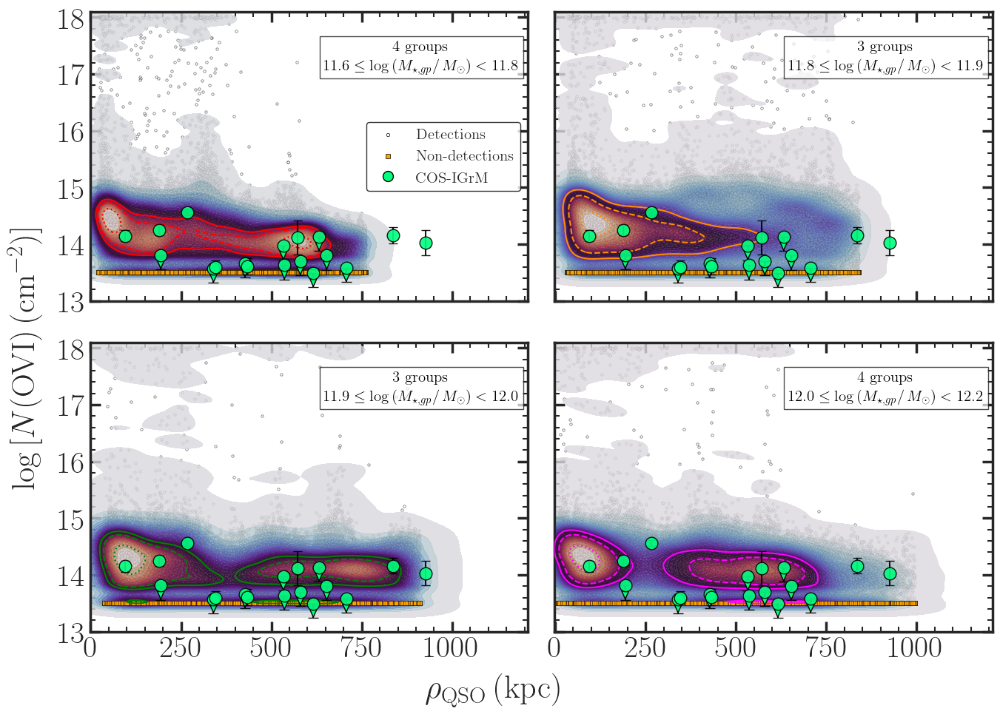

In [165]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
import h5py
import matplotlib.ticker as ticker
import matplotlib.colors as mcolors
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.ticker import AutoMinorLocator
import matplotlib.cm as cm
import matplotlib.patches as mpatches
import matplotlib as mpl
mpl.rcParams["text.usetex"] = True               # already there
mpl.rcParams["text.latex.preamble"] = r"\usepackage{amsmath}"

# ---------------------------
# PATHS AND CONSTANTS
# ---------------------------
base_dir = '../../Grad School/MgII_TNG_Project/Primary Project/Trident Codes/TNG_50_z_0.1_groups/revised_final'
halo_file_path = '../TNG50_fitting_results/TNG_halos.txt'
# fitting_dir = '../TNG50_fitting_results/fitting_combined_features_grp_only_800'
fitting_dir = '../TNG50_fitting_results/v_2500_data_filtered_v800_combined_gal_removed'
full_sample_path = '../COS_IGrM_Data/Sample_full.txt'
plotting_data_path = '../COS_IGrM_Data/Plotting_data_subset.txt'

z = 0.09940180263022191   # Redshift
a = 1 / (1 + z)           # Scale factor
h = 0.6774                # Hubble parameter
box_size = 35000          # Simulation box size

# ---------------------------
# MAPPING & UPDATED BIN DEFINITIONS
# ---------------------------
# Mapping from original group IDs to sequential indices (0 to 13).
grp_index_to_group_mapping = {
    7: 0, 8: 1, 9: 2, 10: 3, 11: 4, 12: 5, 13: 6, 15: 7,
    17: 8, 18: 9, 19: 10, 20: 11, 22: 12, 24: 13
}

# Updated bins based on quantile-based edges:
# Bin edges: [11.5953, 11.8402, 11.93235, 12.041775, 12.1665]
bins_definition = {
    1: [19, 20, 22, 24],
    2: [13, 17, 18],
    3: [11, 12, 15],
    4: [7, 8, 9, 10]
}
bin_ranges = {
    1: (11.5953, 11.8402),
    2: (11.8402, 11.93235),
    3: (11.93235, 12.041775),
    4: (12.041775, 12.1665)
}

# Colors for KDE contours for each bin.
sim_colors = {1: "red", 2: "darkorange", 3: "green", 4: "magenta"}

# ---------------------------
# INITIALIZE DATA STRUCTURE FOR SIMULATION RESULTS
# ---------------------------
# For each bin, we store:
#   'impact': impact parameters for detections,
#   'n_ovi': corresponding log N(OVI) for detections,
#   'impact_nd': impact parameters for non-detections.
bin_data = {b: {'impact': [], 'n_ovi': [], 'impact_nd': []} for b in bins_definition.keys()}

# ---------------------------
# HELPER FUNCTION FOR CYCLIC CORRECTION
# ---------------------------
def apply_cyclic_condition(ray_coord, center_coord, box_size):
    diff = np.abs(center_coord - ray_coord)
    if diff > box_size / 2:
        if center_coord > ray_coord:
            center_coord -= box_size
        else:
            center_coord += box_size
    return center_coord

# ---------------------------
# LOAD HALO GROUP DATA
# ---------------------------
halo_data = pd.read_csv(halo_file_path, sep='|', skipinitialspace=True)
halo_data.columns = halo_data.columns.str.strip()
# Set sequential index (0 to 13) for the 14 groups.
halo_data.index = np.arange(len(halo_data))
halo_data['GroupPos_x'] = pd.to_numeric(halo_data['GroupPos_x(𝑐𝑘𝑝𝑐/ℎ)'], errors='coerce')
halo_data['GroupPos_y'] = pd.to_numeric(halo_data['GroupPos_y(𝑐𝑘𝑝𝑐/ℎ)'], errors='coerce')

# ---------------------------
# ACCUMULATE SIMULATION DATA PER BIN
# ---------------------------
all_groups = sorted(sum(list(bins_definition.values()), []))
for orig_group in all_groups:
    if orig_group not in grp_index_to_group_mapping:
        print(f"Original group {orig_group} not in mapping. Skipping.")
        continue
    seq_index = grp_index_to_group_mapping[orig_group]
    if seq_index >= len(halo_data):
        print(f"Sequential index {seq_index} for group {orig_group} exceeds halo_data length.")
        continue
    group_row = halo_data.loc[seq_index]
    center_x, center_y = group_row[['GroupPos_x', 'GroupPos_y']]
    
    file_group_number = grp_index_to_group_mapping[orig_group]
    ray_file = os.path.join(base_dir, f"integral_TNG50-1_z0.1_n300d2-sample_localized_OVInumdens_{file_group_number}-of-14.hdf5")
    if not os.path.exists(ray_file):
        print(f"File not found: {ray_file}")
        continue
    with h5py.File(ray_file, 'r') as f:
        ray_positions = f['ray_pos'][:]  # shape: (num_rays, 3)
    
    corrected_center_x = np.array([apply_cyclic_condition(rx, center_x, box_size) for rx in ray_positions[:, 0]])
    corrected_center_y = np.array([apply_cyclic_condition(ry, center_y, box_size) for ry in ray_positions[:, 1]])
    rho = np.sqrt((ray_positions[:, 0] - corrected_center_x)**2 +
                  (ray_positions[:, 1] - corrected_center_y)**2)
    
    fitting_file = os.path.join(fitting_dir, f"group_{file_group_number}_combined_features.txt")
    if not os.path.exists(fitting_file):
        print(f"Fitting file not found: {fitting_file}")
        continue
    fitting_data = pd.read_csv(fitting_file, sep='|', skipinitialspace=True)
    fitting_data.columns = fitting_data.columns.str.strip()
    
    detected_data = fitting_data[~fitting_data['dN'].isna()]
    non_detected_data = fitting_data[fitting_data['dN'].isna()]
    
    bin_num = None
    for b, group_list in bins_definition.items():
        if orig_group in group_list:
            bin_num = b
            break
    if bin_num is None:
        continue
    
    for sightline_id, log_n in zip(detected_data['Sightline'], detected_data['N']):
        bin_data[bin_num]['impact'].append(rho[sightline_id])
        bin_data[bin_num]['n_ovi'].append(log_n)
    for sightline_id in non_detected_data['Sightline']:
        bin_data[bin_num]['impact_nd'].append(rho[sightline_id])

# For non-detections, assign constant log N(OVI)
for b in bin_data:
    bin_data[b]['n_ovi_nd'] = [13.5] * len(bin_data[b]['impact_nd'])
    bin_data[b]['impact'] = np.array(bin_data[b]['impact']) / h * a
    bin_data[b]['impact_nd'] = np.array(bin_data[b]['impact_nd']) / h * a
    bin_data[b]['n_ovi'] = np.array(bin_data[b]['n_ovi'])

# ---------------------------
# LOAD OBSERVATIONAL DATA (COS-IGrM) -- Remove subset distinction.
# ---------------------------
full_sample_df = pd.read_csv(full_sample_path, sep='\s+', comment='#', engine='python')
plotting_data_df = pd.read_csv(plotting_data_path, sep='\s+', comment='#', engine='python')
full_sample_df.columns = full_sample_df.columns.str.strip()
plotting_data_df.columns = plotting_data_df.columns.str.strip()
merged_df = None
if 'Group' in full_sample_df.columns and 'Group' in plotting_data_df.columns:
    merged_df = pd.merge(full_sample_df, plotting_data_df, on='Group')
    merged_df['Impact_Param'] = merged_df['QSO_Rho(kpc)']

# ---------------------------
# PLOTTING: 2x2 SUBPLOTS, COMMON AXES, ZERO SPACE, COMMON LABELS
# ---------------------------
fig, axs = plt.subplots(2, 2, figsize=(14, 10), sharex=True, sharey=True)
axs = axs.flatten()

for i, bin_num in enumerate(sorted(bin_data.keys())):
    ax = axs[i]
    data = bin_data[bin_num]
    
    # Plot simulation detections scatter.
    ax.scatter(
        data['impact'], data['n_ovi'], color='white', s=6, alpha=0.6,
        edgecolor='black', linewidth=0.5, marker='o', zorder=0, label='Detections'
    )
    # Plot simulation non-detections scatter.
    ax.scatter(
        data['impact_nd'], data['n_ovi_nd'], color='orange', s=13, alpha=0.6,
        edgecolor='black', linewidth=0.5, marker='s', zorder=3, label='Non-detections'
    )
    
    # Plot filled KDE contours using the "twilight" cmap.
    kde = sns.kdeplot(
        x=data['impact'], y=data['n_ovi'], fill=True,
        cmap="twilight", levels=40, thresh=0.002, alpha=0.8,
        ax=ax, rasterized=True, zorder=2
    )
    # Overplot contour lines at levels [0.5, 0.68, 0.95] with bin-specific color.
    sns.kdeplot(
        x=data['impact'], y=data['n_ovi'], levels=[0.5, 0.68, 0.95],
        color=sim_colors[bin_num], linewidths=1.5,
        ax=ax, linestyles=["solid", "dashed", "dotted"], zorder=3
    )
    
    # Overlay observational data (COS-IGrM) in springgreen.
    if merged_df is not None:
        for _, row in merged_df.iterrows():
            if row['N_OVI_err_low'] == 0.25 or row['N_OVI_err_high'] == 0.25:
                ax.errorbar(row['Impact_Param'], row['N_OVI'],
                            yerr=[[row['N_OVI_err_low']], [0]], fmt='o', markersize=12,
                            markerfacecolor='springgreen', markeredgecolor='black', ecolor='black',
                            capsize=5, alpha=0.9, zorder=4)
                ax.annotate('', xy=(row['Impact_Param'], row['N_OVI'] - row['N_OVI_err_low']),
                            xytext=(row['Impact_Param'], row['N_OVI']),
                            arrowprops=dict(facecolor='springgreen', shrink=0.05, width=1,
                                            headwidth=7, headlength=8, edgecolor='black'),
                            zorder=4)
            else:
                ax.errorbar(row['Impact_Param'], row['N_OVI'],
                            yerr=[[row['N_OVI_err_low']], [row['N_OVI_err_high']]], fmt='o', markersize=12,
                            markerfacecolor='springgreen', markeredgecolor='black', ecolor='black',
                            capsize=4, alpha=0.9, zorder=4)
    
    # For subplot 0, add a full legend and annotation text.
    if i == 0:
        # Create custom legend handles.
        det_handle = ax.scatter([], [], color='white', s=10, edgecolor='black', linewidth=0.5, marker='o', label='Detections')
        nd_handle = ax.scatter([], [], color='orange', s=13, edgecolor='black', linewidth=0.5, marker='s', label='Non-detections')
        cos_handle = plt.Line2D([], [], marker='o', color='none', markerfacecolor='springgreen', markeredgecolor='black', markersize=10, label=r'COS-IGrM')       
        handles = [det_handle, nd_handle, cos_handle]
        ax.legend(handles=handles, loc='center right', fontsize=15,
                   frameon = True, edgecolor = 'black')
        num_groups = len(bins_definition[bin_num])
        low_edge, high_edge = bin_ranges[bin_num]
        annot_text = rf"$\begin{{array}}{{c}}{num_groups}\ \text{{groups}}\\ {low_edge:.1f}\le \log\left(M_{{\star, gp}}/\,M_{{\odot}}\right) < {high_edge:.1f}\end{{array}}$"
        ax.text(0.98, 0.90, annot_text, transform=ax.transAxes,
                horizontalalignment='right', verticalalignment='top',
                fontsize=15, color='black', bbox=dict(facecolor='white', alpha=0.7, edgecolor='black'))
    else:
        num_groups = len(bins_definition[bin_num])
        low_edge, high_edge = bin_ranges[bin_num]
        annot_text = rf"$\begin{{array}}{{c}}{num_groups}\ \text{{groups}}\\ {low_edge:.1f}\le \log\left(M_{{\star, gp}}/\,M_{{\odot}}\right) < {high_edge:.1f}\end{{array}}$"
        ax.text(0.98, 0.90, annot_text, transform=ax.transAxes,
                horizontalalignment='right', verticalalignment='top',
                fontsize=15, color='black', bbox=dict(facecolor='white', alpha=0.7, edgecolor='black'))
    
    # Set fixed x and y limits.
    ax.set_xlim(-1, 1210)
    ax.set_ylim(13.2, 18.1)
    # Set x and y ticks.
    ax.set_xticks([0, 250, 500, 750, 1000])
    ax.set_yticks([13, 14, 15, 16, 17, 18])
    ax.xaxis.set_minor_locator(AutoMinorLocator())
    ax.yaxis.set_minor_locator(AutoMinorLocator())
    ax.tick_params(axis='both', which='major', direction='in', length=10, width=2.5, top=True, right=True)
    ax.tick_params(axis='both', which='minor', direction='in', length=5, width=1.5, top=True, right=True)
    ax.spines['top'].set_linewidth(2.5)
    ax.spines['right'].set_linewidth(2.5)
    ax.spines['bottom'].set_linewidth(2.5)
    ax.spines['left'].set_linewidth(2.5)
    ax.set_title("")

# Set common x and y labels.
fig.text(0.5, 0.04, r'$\rho_\mathrm{QSO}\, (\mathrm{kpc})$', ha='center', fontsize=32)
fig.text(0.03, 0.5, r'$\log\,[N(\mathrm{OVI})\, (\mathrm{cm^{-2}})]$', va='center', rotation='vertical', fontsize=32)

# Show x tick labels only on bottom row and y tick labels only on left.
for ax in axs:
    ax.label_outer()

plt.subplots_adjust(wspace=-0.1, hspace=-0.1)
# plt.subplots_adjust(left=0.06, right=0.98, top=0.98, bottom=0.06, wspace=0, hspace=0)
plt.tight_layout(rect=[0.06, 0.06, 1, 1])
plt.savefig('../TNG50_fitting_results/Plots_gal_removed_new/logN_vs_rho_with_cyclic_stellar_mass_binned.png', dpi=400)
plt.show()

In [1]:
impact_params.min(), impact_params.max()


NameError: name 'impact_params' is not defined

In [106]:
impact_params_non_detections.min(), impact_params_non_detections.max()

(7.674246017479044, 995.6251895700943)

In [15]:
import os
import numpy as np
import pandas as pd
import h5py
from tqdm import tqdm

# Paths
base_dir = '../../Grad School/MgII_TNG_Project/Primary Project/Trident Codes/TNG_50_z_0.1_groups/revised_final'
halo_file_path = '../TNG50_fitting_results/TNG_halos.txt'
# fitting_dir = '../TNG50_fitting_results/fitting_combined_features_grp_only'
fitting_dir = '../TNG50_fitting_results/v_2500_data_filtered_v800_combined_gal_removed'

# Constants
z = 0.09940180263022191  # Redshift
a = 1 / (1 + z)  # Scale factor
h = 0.6774  # Hubble parameter
box_size = 35000  # Simulation box size

# Helper function for cyclic correction
def apply_cyclic_condition(ray_coord, center_coord, box_size):
    diff = np.abs(center_coord - ray_coord)
    if diff > box_size / 2:
        if center_coord > ray_coord:
            center_coord -= box_size
        else:
            center_coord += box_size
    return center_coord

# Load the halo group data
halo_data = pd.read_csv(halo_file_path, sep='|', skipinitialspace=True)
halo_data.columns = halo_data.columns.str.strip()
halo_data['Grp_Index'] = np.arange(len(halo_data))  # Reindex rows as Grp_Index

# Extract relevant columns and convert to numeric
halo_data['GroupPos_x'] = pd.to_numeric(halo_data['GroupPos_x(𝑐𝑘𝑝𝑐/ℎ)'], errors='coerce')
halo_data['GroupPos_y'] = pd.to_numeric(halo_data['GroupPos_y(𝑐𝑘𝑝𝑐/ℎ)'], errors='coerce')

# Process each group
for grp_index in tqdm(range(len(halo_data)), desc="Processing groups"):
    # Load the ray data for this group
    ray_file = os.path.join(base_dir, f"integral_TNG50-1_z0.1_n300d2-sample_localized_OVInumdens_{grp_index}-of-14.hdf5")
    if not os.path.exists(ray_file):
        print(f"File not found: {ray_file}")
        continue

    # Read the ray positions from the HDF5 file
    with h5py.File(ray_file, 'r') as f:
        ray_positions = f['ray_pos'][:]  # Read the dataset as a NumPy array

    # Extract group center coordinates and apply cyclic correction
    center_x, center_y = halo_data.loc[grp_index, ['GroupPos_x', 'GroupPos_y']]
    corrected_center_x = np.array([apply_cyclic_condition(ray_x, center_x, box_size) for ray_x in ray_positions[:, 0]])
    corrected_center_y = np.array([apply_cyclic_condition(ray_y, center_y, box_size) for ray_y in ray_positions[:, 1]])

    # Compute the impact parameter for each ray
    rho = np.sqrt((ray_positions[:, 0] - corrected_center_x) ** 2 +
                  (ray_positions[:, 1] - corrected_center_y) ** 2)

    # Load the corresponding fitting results
    fitting_file = os.path.join(fitting_dir, f"group_{grp_index}_combined_features.txt")
    if not os.path.exists(fitting_file):
        print(f"File not found: {fitting_file}")
        continue

    fitting_data = pd.read_csv(fitting_file, sep='|', skipinitialspace=True)
    fitting_data.columns = fitting_data.columns.str.strip()

    # Filter for detections and non-detections
    detected_data = fitting_data[~fitting_data['dN'].isna()]
    non_detected_data = fitting_data[fitting_data['dN'].isna()]

    # Find the minimum impact parameter for detections
    if not detected_data.empty:
        min_detection_idx = detected_data['Sightline'].iloc[np.argmin(rho[detected_data['Sightline']])]
        print(f"Group {grp_index} (Detections):")
        print(f"  Sightline: {min_detection_idx}")
        print(f"  Ray Position (x, y): {ray_positions[min_detection_idx][:2]}")
        print(f"  Group Center (x, y): ({center_x}, {center_y})")
        print(f"  Minimum Impact Parameter: {rho[min_detection_idx] / h * a:.2f} kpc (physical)")

    # Find the minimum impact parameter for non-detections
    if not non_detected_data.empty:
        min_non_detection_idx = non_detected_data['Sightline'].iloc[np.argmin(rho[non_detected_data['Sightline']])]
        print(f"Group {grp_index} (Non-Detections):")
        print(f"  Sightline: {min_non_detection_idx}")
        print(f"  Ray Position (x, y): {ray_positions[min_non_detection_idx][:2]}")
        print(f"  Group Center (x, y): ({center_x}, {center_y})")
        print(f"  Minimum Impact Parameter: {rho[min_non_detection_idx] / h * a:.2f} kpc (physical)")


Processing groups:   7%|▋         | 1/14 [00:00<00:04,  2.91it/s]

Group 0 (Detections):
  Sightline: 8930
  Ray Position (x, y): [32044.19013764 30216.42061291]
  Group Center (x, y): (32072.227, 30238.043)
  Minimum Impact Parameter: 47.54 kpc (physical)
Group 0 (Non-Detections):
  Sightline: 57345
  Ray Position (x, y): [32088.26645016 30269.624813  ]
  Group Center (x, y): (32072.227, 30238.043)
  Minimum Impact Parameter: 47.56 kpc (physical)


Processing groups:  14%|█▍        | 2/14 [00:00<00:03,  3.03it/s]

Group 1 (Detections):
  Sightline: 55571
  Ray Position (x, y): [9497.06156311 8857.96318454]
  Group Center (x, y): (9532.875, 8869.659)
  Minimum Impact Parameter: 50.59 kpc (physical)
Group 1 (Non-Detections):
  Sightline: 84546
  Ray Position (x, y): [9511.67624262 8900.78376571]
  Group Center (x, y): (9532.875, 8869.659)
  Minimum Impact Parameter: 50.57 kpc (physical)


Processing groups:  21%|██▏       | 3/14 [00:01<00:03,  2.95it/s]

Group 2 (Detections):
  Sightline: 34811
  Ray Position (x, y): [21567.94349289 19841.5855067 ]
  Group Center (x, y): (21565.54, 19836.396)
  Minimum Impact Parameter: 7.68 kpc (physical)
Group 2 (Non-Detections):
  Sightline: 60131
  Ray Position (x, y): [21571.0911318  19835.03609649]
  Group Center (x, y): (21565.54, 19836.396)
  Minimum Impact Parameter: 7.67 kpc (physical)


Processing groups:  29%|██▊       | 4/14 [00:01<00:03,  3.03it/s]

Group 3 (Detections):
  Sightline: 75927
  Ray Position (x, y): [  132.53697498 30216.32490651]
  Group Center (x, y): (95.99507, 30197.44)
  Minimum Impact Parameter: 55.23 kpc (physical)
Group 3 (Non-Detections):
  Sightline: 20560
  Ray Position (x, y): [   58.39404243 30214.09624556]
  Group Center (x, y): (95.99507, 30197.44)
  Minimum Impact Parameter: 55.22 kpc (physical)


Processing groups:  36%|███▌      | 5/14 [00:01<00:02,  3.06it/s]

Group 4 (Detections):
  Sightline: 84030
  Ray Position (x, y): [ 3774.50740832 18650.77588496]
  Group Center (x, y): (3746.9238, 18653.59)
  Minimum Impact Parameter: 37.23 kpc (physical)
Group 4 (Non-Detections):
  Sightline: 14980
  Ray Position (x, y): [ 3772.25500124 18642.35545584]
  Group Center (x, y): (3746.9238, 18653.59)
  Minimum Impact Parameter: 37.21 kpc (physical)


Processing groups:  43%|████▎     | 6/14 [00:01<00:02,  3.04it/s]

Group 5 (Detections):
  Sightline: 86098
  Ray Position (x, y): [1097.89402036 5841.74782746]
  Group Center (x, y): (1132.7417, 5820.808)
  Minimum Impact Parameter: 54.59 kpc (physical)
Group 5 (Non-Detections):
  Sightline: 38752
  Ray Position (x, y): [1150.22513843 5857.50143213]
  Group Center (x, y): (1132.7417, 5820.808)
  Minimum Impact Parameter: 54.58 kpc (physical)


Processing groups:  50%|█████     | 7/14 [00:02<00:02,  3.01it/s]

Group 6 (Detections):
  Sightline: 9138
  Ray Position (x, y): [21742.15505503  2247.71265121]
  Group Center (x, y): (21716.389, 2239.914)
  Minimum Impact Parameter: 36.15 kpc (physical)
Group 6 (Non-Detections):
  Sightline: 39704
  Ray Position (x, y): [21700.23960258  2218.3435009 ]
  Group Center (x, y): (21716.389, 2239.914)
  Minimum Impact Parameter: 36.18 kpc (physical)


Processing groups:  57%|█████▋    | 8/14 [00:02<00:01,  3.07it/s]

Group 7 (Detections):
  Sightline: 5963
  Ray Position (x, y): [ 4871.51227438 22171.25610738]
  Group Center (x, y): (4834.154, 22167.719)
  Minimum Impact Parameter: 50.39 kpc (physical)
Group 7 (Non-Detections):
  Sightline: 86961
  Ray Position (x, y): [ 4810.5039198  22196.89167786]
  Group Center (x, y): (4834.154, 22167.719)
  Minimum Impact Parameter: 50.43 kpc (physical)


Processing groups:  64%|██████▍   | 9/14 [00:02<00:01,  3.05it/s]

Group 8 (Detections):
  Sightline: 55357
  Ray Position (x, y): [14925.12380291  4834.63699361]
  Group Center (x, y): (14926.8125, 4867.9204)
  Minimum Impact Parameter: 44.75 kpc (physical)
Group 8 (Non-Detections):
  Sightline: 16790
  Ray Position (x, y): [14943.32537661  4896.93927204]
  Group Center (x, y): (14926.8125, 4867.9204)
  Minimum Impact Parameter: 44.83 kpc (physical)


Processing groups:  71%|███████▏  | 10/14 [00:03<00:01,  3.08it/s]

Group 9 (Detections):
  Sightline: 18965
  Ray Position (x, y): [31113.02923715 33773.08586447]
  Group Center (x, y): (31092.031, 33786.906)
  Minimum Impact Parameter: 33.75 kpc (physical)
Group 9 (Non-Detections):
  Sightline: 16750
  Ray Position (x, y): [31106.01277593 33766.0214403 ]
  Group Center (x, y): (31092.031, 33786.906)
  Minimum Impact Parameter: 33.75 kpc (physical)


Processing groups:  79%|███████▊  | 11/14 [00:03<00:00,  3.06it/s]

Group 10 (Detections):
  Sightline: 71608
  Ray Position (x, y): [23784.22278664 25634.96225407]
  Group Center (x, y): (23765.447, 25641.043)
  Minimum Impact Parameter: 26.50 kpc (physical)
Group 10 (Non-Detections):
  Sightline: 16582
  Ray Position (x, y): [23783.72411541 25633.61852479]
  Group Center (x, y): (23765.447, 25641.043)
  Minimum Impact Parameter: 26.49 kpc (physical)


Processing groups:  86%|████████▌ | 12/14 [00:03<00:00,  3.03it/s]

Group 11 (Detections):
  Sightline: 66034
  Ray Position (x, y): [16781.95228273 20958.34782777]
  Group Center (x, y): (16766.344, 20969.65)
  Minimum Impact Parameter: 25.88 kpc (physical)
Group 11 (Non-Detections):
  Sightline: 88516
  Ray Position (x, y): [16763.07458639 20988.64022066]
  Group Center (x, y): (16766.344, 20969.65)
  Minimum Impact Parameter: 25.87 kpc (physical)


Processing groups:  93%|█████████▎| 13/14 [00:04<00:00,  3.04it/s]

Group 12 (Detections):
  Sightline: 21176
  Ray Position (x, y): [30015.18667394 19707.74442714]
  Group Center (x, y): (29995.889, 19698.64)
  Minimum Impact Parameter: 28.65 kpc (physical)
Group 12 (Non-Detections):
  Sightline: 24214
  Ray Position (x, y): [29982.65628026 19715.3896186 ]
  Group Center (x, y): (29995.889, 19698.64)
  Minimum Impact Parameter: 28.66 kpc (physical)


Processing groups: 100%|██████████| 14/14 [00:04<00:00,  3.03it/s]

Group 13 (Detections):
  Sightline: 63891
  Ray Position (x, y): [16922.13702313 20839.18538711]
  Group Center (x, y): (16921.096, 20823.836)
  Minimum Impact Parameter: 20.66 kpc (physical)
Group 13 (Non-Detections):
  Sightline: 17118
  Ray Position (x, y): [16906.2890968  20828.00429118]
  Group Center (x, y): (16921.096, 20823.836)
  Minimum Impact Parameter: 20.65 kpc (physical)


100%|██████████| 14/14 [00:05<00:00,  2.73it/s]
/Users/wavefunction/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines/igrm/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/wavefunction/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines/igrm/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/wavefunction/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines/igrm/lib/python3.11/site-packages/seaborn/distributions.py:1185: UserWarning: The following kwargs were not used by contour: 'rasterized'
  cset = contour_func(
/Users/wavefunction/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sigh

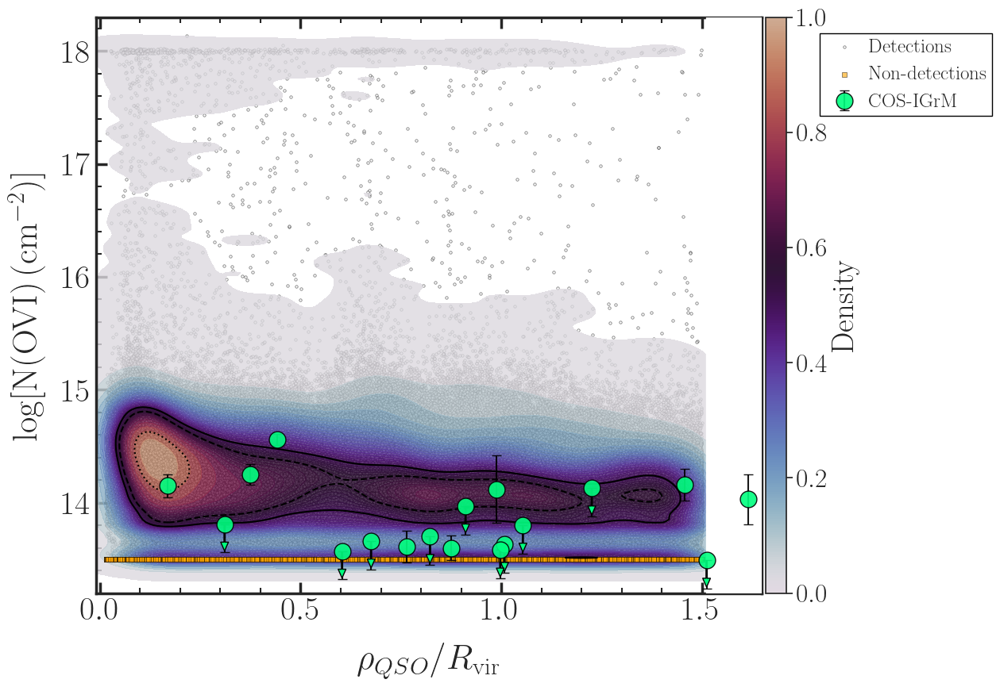

In [166]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
import h5py

# Paths
base_dir = '../../Grad School/MgII_TNG_Project/Primary Project/Trident Codes/TNG_50_z_0.1_groups/revised_final'

halo_file_path = '../TNG50_fitting_results/TNG_halos.txt'
# fitting_dir = '../TNG50_fitting_results/fitting_combined_features_grp_only_800'
fitting_dir = '../TNG50_fitting_results/v_2500_data_filtered_v800_combined_gal_removed'
full_sample_path = '../COS_IGrM_Data/Sample_full.txt'
plotting_data_path = '../COS_IGrM_Data/Plotting_data_subset.txt'

# Constants
box_size = 35000  # Simulation box size

# Helper function for cyclic correction
def apply_cyclic_condition(ray_coord, center_coord, box_size):
    diff = np.abs(center_coord - ray_coord)
    if diff > box_size / 2:
        if center_coord > ray_coord:
            center_coord -= box_size
        else:
            center_coord += box_size
    return center_coord

# Load the halo group data
halo_data = pd.read_csv(halo_file_path, sep='|', skipinitialspace=True)
halo_data.columns = halo_data.columns.str.strip()
halo_data['Grp_Index'] = np.arange(len(halo_data))  # Reindex rows as Grp_Index

# Extract relevant columns and convert to numeric
halo_data['GroupPos_x'] = pd.to_numeric(halo_data['GroupPos_x(𝑐𝑘𝑝𝑐/ℎ)'], errors='coerce')
halo_data['GroupPos_y'] = pd.to_numeric(halo_data['GroupPos_y(𝑐𝑘𝑝𝑐/ℎ)'], errors='coerce')
halo_data['R_crit200'] = pd.to_numeric(halo_data['R_Crit200'], errors='coerce')  # Virial radius

# Initialize arrays for results
impact_params_norm = []
n_ovi_detections = []

impact_params_norm_non_detections = []
n_ovi_non_detections = []

# Loop through all group files
for grp_index in tqdm(range(len(halo_data))):
    # Load the ray data for this group
    ray_file = os.path.join(base_dir, f"integral_TNG50-1_z0.1_n300d2-sample_localized_OVInumdens_{grp_index}-of-14.hdf5")
    if not os.path.exists(ray_file):
        print(f"File not found: {ray_file}")
        continue

    # Read the ray positions from the HDF5 file
    with h5py.File(ray_file, 'r') as f:
        ray_positions = f['ray_pos'][:]  # Read the dataset as a NumPy array

    # Extract group center coordinates and virial radius
    center_x, center_y = halo_data.loc[grp_index, ['GroupPos_x', 'GroupPos_y']]
    r_vir = halo_data.loc[grp_index, 'R_crit200']

    # Apply cyclic condition to correct group center coordinates
    corrected_center_x = np.array([apply_cyclic_condition(ray_x, center_x, box_size) for ray_x in ray_positions[:, 0]])
    corrected_center_y = np.array([apply_cyclic_condition(ray_y, center_y, box_size) for ray_y in ray_positions[:, 1]])

    # Compute the normalized impact parameter for each ray
    rho = np.sqrt((ray_positions[:, 0] - corrected_center_x) ** 2 +
                  (ray_positions[:, 1] - corrected_center_y) ** 2)
    rho_norm = rho / r_vir  # Normalize by virial radius

    # Load the corresponding fitting results
    fitting_file = os.path.join(fitting_dir, f"group_{grp_index}_combined_features.txt")
    if not os.path.exists(fitting_file):
        print(f"File not found: {fitting_file}")
        continue

    fitting_data = pd.read_csv(fitting_file, sep='|', skipinitialspace=True)
    fitting_data.columns = fitting_data.columns.str.strip()

    # Filter for detections and non-detections
    detected_data = fitting_data[~fitting_data['dN'].isna()]
    non_detected_data = fitting_data[fitting_data['dN'].isna()]

    # Store the normalized impact parameter and log N(OVI)
    for sightline_id, log_n in zip(detected_data['Sightline'], detected_data['N']):
        if rho_norm[sightline_id] <= 5:  # Exclude sightlines with normalized rho > 5
            impact_params_norm.append(rho_norm[sightline_id])
            n_ovi_detections.append(log_n)
            
    for sightline_id in non_detected_data['Sightline']:
        if rho_norm[sightline_id] <= 5:
            impact_params_norm_non_detections.append(rho_norm[sightline_id])
            n_ovi_non_detections.append(13.5)  # Replace the value for all non-detections

# Convert results to numpy arrays
impact_params_norm = np.array(impact_params_norm)
n_ovi_detections = np.array(n_ovi_detections)
impact_params_norm_non_detections = np.array(impact_params_norm_non_detections)
n_ovi_non_detections = np.array(n_ovi_non_detections)

# Plot N(OVI) vs normalized Impact Parameter (rho/R_vir)
fig, ax = plt.subplots(figsize=(13, 9))

# Scatter plot for simulation data
ax.scatter(impact_params_norm, n_ovi_detections, color='white', s=6, alpha=0.6, edgecolor='black', 
           linewidth=0.5, marker='o', zorder=0, label='Detections')

ax.scatter(impact_params_norm_non_detections, n_ovi_non_detections, color='orange', s=13, alpha=0.6, edgecolor='black',
              linewidth=0.5, marker='s', zorder=3, label='Non-detections')
# Overlay density contours using seaborn's kdeplot
kde = sns.kdeplot(
    x=impact_params_norm, y=n_ovi_detections, fill=True,
    cmap=twilight_trunc, levels=40, thresh=0.002, alpha=0.8, ax=ax, rasterized=True, zorder=2
)

sns.kdeplot(
    x=impact_params_norm, y=n_ovi_detections, levels=[0.5, 0.68, 0.95], color="black",
    linewidths=1.5, ax=ax, linestyles=["solid", "dashed", "dotted"], zorder=3
)

# **Add Colorbar for KDE**

# Create an axis for the colorbar
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="3%", pad=0.05)

kde_min, kde_max = kde.collections[0].get_clim()  # Get color limits from KDE

# Define normalization based on actual KDE density values
norm = mcolors.Normalize(vmin=kde_min, vmax=kde_max)
sm = cm.ScalarMappable(cmap=twilight_trunc, norm=norm)
sm.set_array([])  # Needed for colorbar

# Add Colorbar
cbar = fig.colorbar(sm, cax=cax, orientation="vertical")
cbar.set_label(r'$\mathrm{Density}$', fontsize=28)
cbar.ax.tick_params(labelsize=24)



# Load observational data
full_sample_df = pd.read_csv(full_sample_path, sep='\s+', comment='#', engine='python')
plotting_data_df = pd.read_csv(plotting_data_path, sep='\s+', comment='#', engine='python')
full_sample_df.columns = full_sample_df.columns.str.strip()
plotting_data_df.columns = plotting_data_df.columns.str.strip()

# # Merge data on 'Group' for plotting
# if 'Group' in full_sample_df.columns and 'Group' in plotting_data_df.columns:
#     merged_df = pd.merge(full_sample_df, plotting_data_df, left_on='Group', right_on='Group')
#     merged_df['Impact_Param_Norm'] = merged_df['QSO_Rho(kpc)'] / merged_df['Rvir_s']
    
#     # Plot observational data with different subsets
#     for subset_type, color, label in [('I', 'springgreen', 'IGrM'), ('C', 'cyan', 'CGM + IGrM')]:
#         subset_df = merged_df[merged_df['Subset'] == subset_type]
#         for _, row in subset_df.iterrows():
#             # Plot all points with the subset-specific color
#             if row['N_OVI_err_low'] == 0.25 or row['N_OVI_err_high'] == 0.25:
#                 # Plot with downward arrow for non-detections
#                 ax.errorbar(row['Impact_Param_Norm'], row['N_OVI'], zorder=4,
#                             yerr=[[row['N_OVI_err_low']], [0]], fmt='o', markersize=12,
#                             markerfacecolor=color, markeredgecolor='black', ecolor='black', capsize=4, alpha=0.9,
#                             label=label if row.name == subset_df.index[0] else "")
#                 ax.annotate('', xy=(row['Impact_Param_Norm'], row['N_OVI'] - row['N_OVI_err_low']),
#                             xytext=(row['Impact_Param_Norm'], row['N_OVI']),
#                             arrowprops=dict(facecolor=color, shrink=0.05, width=1, headwidth=7, headlength=8,edgecolor='black',), zorder=4)
#             else:
#                 # Plot with regular error bars for detections
#                 ax.errorbar(row['Impact_Param_Norm'], row['N_OVI'], 
#                             yerr=[[row['N_OVI_err_low']], [row['N_OVI_err_high']]], fmt='o', markersize=12,
#                             markerfacecolor=color, markeredgecolor='black', ecolor='black', capsize=4, alpha=0.9,
#                             label=label if row.name == subset_df.index[0] else "", zorder=4)

cos_label_added = {'I': False, 'C': True}
if 'Group' in full_sample_df.columns and 'Group' in plotting_data_df.columns:
    merged_df = pd.merge(full_sample_df, plotting_data_df, left_on='Group', right_on='Group')
    merged_df['Impact_Param_Norm'] = merged_df['QSO_Rho(kpc)'] / merged_df['Rvir_s']
    
    # Plot observational data with different subsets
    for subset_type, color, label in [('I', 'springgreen', 'COS-IGrM'), ('C', 'springgreen', 'COS-IGrM')]:
        subset_df = merged_df[merged_df['Subset'] == subset_type]
        
        for _, row in subset_df.iterrows():
            lab = label if not cos_label_added[subset_type] else ""
            cos_label_added[subset_type] = True
            if row['N_OVI_err_low'] == 0.25 or row['N_OVI_err_high'] == 0.25:
                ax.errorbar(row['Impact_Param_Norm'], row['N_OVI'], zorder=4,
                            yerr=[[row['N_OVI_err_low']], [0]], fmt='o', markersize=15,
                            markerfacecolor=color, markeredgecolor='black', ecolor='black',
                            capsize=4, alpha=0.9, label=lab)
                ax.annotate('', xy=(row['Impact_Param_Norm'], row['N_OVI'] - row['N_OVI_err_low']),
                            xytext=(row['Impact_Param_Norm'], row['N_OVI']),
                            arrowprops=dict(facecolor=color, shrink=0.05, width=1,
                                            headwidth=7, headlength=8, edgecolor='black'),
                            zorder=4)
            else:
                ax.errorbar(row['Impact_Param_Norm'], row['N_OVI'], 
                            yerr=[[row['N_OVI_err_low']], [row['N_OVI_err_high']]], fmt='o', markersize=15,
                            markerfacecolor=color, markeredgecolor='black', ecolor='black',
                            capsize=4, alpha=0.9, label=lab, zorder=4)
                
# Axis labels and title
ax.set_xlabel(r'$\rho_{QSO}/R_{\mathrm{vir}}$', fontsize=32, labelpad=15)
ax.set_ylabel(r'$\log[\mathrm{N(OVI)} \, (\mathrm{cm^{-2}})]$', fontsize=32, labelpad=15)

# # Add legend
# ax.legend(loc='upper right',frameon=True,framealpha=1, edgecolor='black',
#           fancybox=False, shadow=False, borderpad=0.25,borderaxespad=0.2, handletextpad=0.25, fontsize=18,
# )
# Add legend outside the plot area so that scatter points are not covered
ax.legend(loc='center left', bbox_to_anchor=(1.08, 0.9),
          frameon=True, framealpha=1, edgecolor='black',
          fancybox=False, shadow=False, borderpad=0.25, 
          borderaxespad=0.2, handletextpad=0.25, fontsize=18)

# # Customize ticks and spines
# ax.tick_params(axis='both', which='major', direction='in', width=2, length=7)

# Enable major and minor ticks on all four axes
ax.tick_params(axis='both', which='major', direction='in', length=10, width=2.5, top=True, right=True)
ax.tick_params(axis='both', which='minor', direction='in', length=5, width=1.5, top=True, right=True)

# Add minor tick locators for both x and y axes
ax.xaxis.set_minor_locator(AutoMinorLocator())  # Minor ticks for x-axis
ax.yaxis.set_minor_locator(AutoMinorLocator())  # Minor ticks for y-axis
ax.spines['top'].set_linewidth(2.5)
ax.spines['right'].set_linewidth(2.5)
ax.spines['bottom'].set_linewidth(2.5)
ax.spines['left'].set_linewidth(2.5)

ax.set_xlim(-0.01, 1.65)
ax.set_ylim(13.2, 18.3)

# Draw a white vertical span to cover contour plots beyond 1.5 R_vir
ax.axvspan(1.51, ax.get_xlim()[1], facecolor='white', alpha=1.0, zorder=3)

# Finalize and save plot
plt.tight_layout()
output_dir = '../TNG50_fitting_results/Plots_gal_removed_new'
plt.savefig(os.path.join(output_dir, 'logN_vs_rho_norm_cyclic.png'), dpi=400)
plt.show()

/Users/wavefunction/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines/igrm/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/wavefunction/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines/igrm/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/wavefunction/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines/igrm/lib/python3.11/site-packages/seaborn/distributions.py:1185: UserWarning: The following kwargs were not used by contour: 'rasterized'
  cset = contour_func(
/Users/wavefunction/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines/igrm/lib/python3.11/site-packages/seaborn

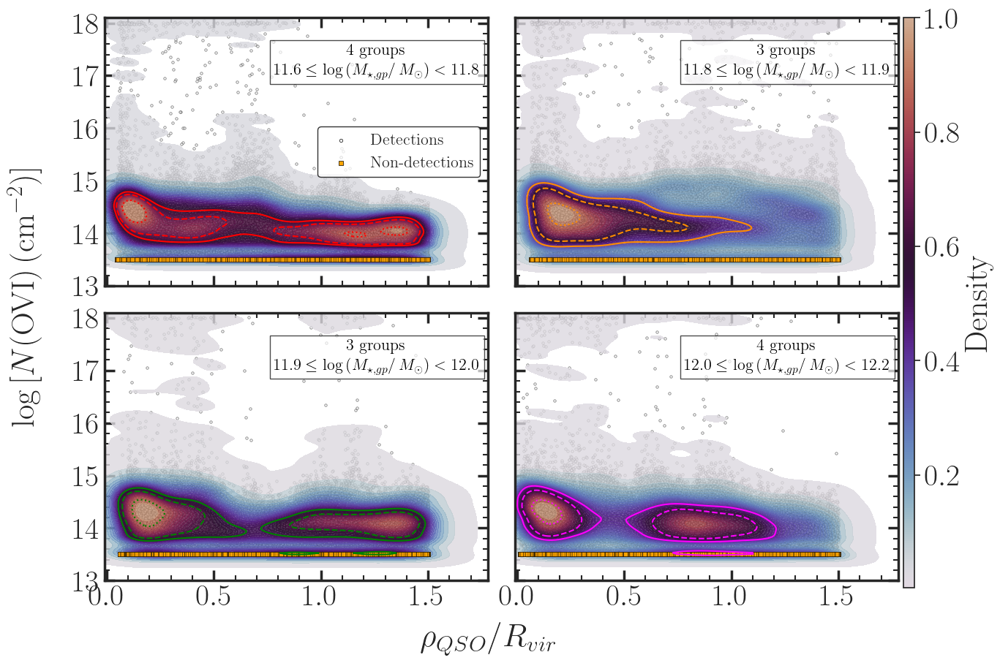

In [167]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
import h5py
import matplotlib.ticker as ticker
import matplotlib.colors as mcolors
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.ticker import AutoMinorLocator
import matplotlib.cm as cm
import matplotlib.patches as mpatches

# ---------------------------
# PATHS AND CONSTANTS
# ---------------------------
base_dir = '../../Grad School/MgII_TNG_Project/Primary Project/Trident Codes/TNG_50_z_0.1_groups/revised_final'
halo_file_path = '../TNG50_fitting_results/TNG_halos.txt'
# fitting_dir = '../TNG50_fitting_results/fitting_combined_features_grp_only_800'
fitting_dir = '../TNG50_fitting_results/v_2500_data_filtered_v800_combined_gal_removed'
full_sample_path = '../COS_IGrM_Data/Sample_full.txt'
plotting_data_path = '../COS_IGrM_Data/Plotting_data_subset.txt'

# For normalization, we need the virial radius; we assume it's stored in 'R_Crit200' (in ckpc/h)
# (Note: No conversion from ckpc/h is applied to R_Crit200 here.)
# Other constants remain as before.
z = 0.09940180263022191
a = 1 / (1 + z)
h = 0.6774
box_size = 35000

# ---------------------------
# MAPPING & UPDATED BIN DEFINITIONS
# ---------------------------
# Mapping from original group IDs to sequential indices (0 to 13).
grp_index_to_group_mapping = {
    7: 0, 8: 1, 9: 2, 10: 3, 11: 4, 12: 5, 13: 6, 15: 7,
    17: 8, 18: 9, 19: 10, 20: 11, 22: 12, 24: 13
}

# Updated bins (quantile-based) for stellar mass:
# Bin edges: [11.5953, 11.8402, 11.93235, 12.041775, 12.1665]
# Bin 1: groups [19, 20, 22, 24]  → mass range: 11.5953–11.8402
# Bin 2: groups [13, 17, 18]      → mass range: 11.8402–11.93235
# Bin 3: groups [11, 12, 15]      → mass range: 11.93235–12.041775
# Bin 4: groups [7, 8, 9, 10]      → mass range: 12.041775–12.1665
bins_definition = {
    1: [19, 20, 22, 24],
    2: [13, 17, 18],
    3: [11, 12, 15],
    4: [7, 8, 9, 10]
}
bin_ranges = {
    1: (11.5953, 11.8402),
    2: (11.8402, 11.93235),
    3: (11.93235, 12.041775),
    4: (12.041775, 12.1665)
}
# Colors for the simulation KDE contours per bin.
sim_colors = {1: "red", 2: "darkorange", 3: "green", 4: "magenta"}

# ---------------------------
# INITIALIZE DATA STRUCTURE FOR SIMULATION RESULTS
# ---------------------------
# For each bin, we store:
# 'impact': impact parameters for detections (normalized),
# 'n_ovi': corresponding log N(OVI) for detections,
# 'impact_nd': impact parameters for non-detections (normalized).
bin_data = {b: {'impact': [], 'n_ovi': [], 'impact_nd': []} for b in bins_definition.keys()}

# ---------------------------
# HELPER FUNCTION FOR CYCLIC CORRECTION
# ---------------------------
def apply_cyclic_condition(ray_coord, center_coord, box_size):
    diff = np.abs(center_coord - ray_coord)
    if diff > box_size / 2:
        if center_coord > ray_coord:
            center_coord -= box_size
        else:
            center_coord += box_size
    return center_coord

# ---------------------------
# LOAD HALO GROUP DATA
# ---------------------------
halo_data = pd.read_csv(halo_file_path, sep='|', skipinitialspace=True)
halo_data.columns = halo_data.columns.str.strip()
# Set sequential index (0 to 13) for the 14 groups.
halo_data.index = np.arange(len(halo_data))
halo_data['GroupPos_x'] = pd.to_numeric(halo_data['GroupPos_x(𝑐𝑘𝑝𝑐/ℎ)'], errors='coerce')
halo_data['GroupPos_y'] = pd.to_numeric(halo_data['GroupPos_y(𝑐𝑘𝑝𝑐/ℎ)'], errors='coerce')
halo_data['R_Crit200'] = pd.to_numeric(halo_data['R_Crit200'], errors='coerce')

# ---------------------------
# ACCUMULATE SIMULATION DATA PER BIN (with normalized impact parameter)
# ---------------------------
all_groups = sorted(sum(list(bins_definition.values()), []))
for orig_group in all_groups:
    if orig_group not in grp_index_to_group_mapping:
        print(f"Original group {orig_group} not in mapping. Skipping.")
        continue
    seq_index = grp_index_to_group_mapping[orig_group]
    if seq_index >= len(halo_data):
        print(f"Sequential index {seq_index} for group {orig_group} exceeds halo_data length.")
        continue
    group_row = halo_data.loc[seq_index]
    center_x, center_y = group_row[['GroupPos_x', 'GroupPos_y']]
    # Use R_Crit200 as the virial radius (in ckpc/h).
    r_vir = group_row['R_Crit200']
    
    file_group_number = grp_index_to_group_mapping[orig_group]
    ray_file = os.path.join(base_dir, f"integral_TNG50-1_z0.1_n300d2-sample_localized_OVInumdens_{file_group_number}-of-14.hdf5")
    if not os.path.exists(ray_file):
        print(f"File not found: {ray_file}")
        continue
    with h5py.File(ray_file, 'r') as f:
        ray_positions = f['ray_pos'][:]  # shape: (num_rays, 3)
    
    corrected_center_x = np.array([apply_cyclic_condition(rx, center_x, box_size) for rx in ray_positions[:, 0]])
    corrected_center_y = np.array([apply_cyclic_condition(ry, center_y, box_size) for ry in ray_positions[:, 1]])
    rho = np.sqrt((ray_positions[:, 0] - corrected_center_x)**2 +
                  (ray_positions[:, 1] - corrected_center_y)**2)
    # Normalize impact parameter by the virial radius.
    rho_norm = rho / r_vir
    
    fitting_file = os.path.join(fitting_dir, f"group_{file_group_number}_combined_features.txt")
    if not os.path.exists(fitting_file):
        print(f"Fitting file not found: {fitting_file}")
        continue
    fitting_data = pd.read_csv(fitting_file, sep='|', skipinitialspace=True)
    fitting_data.columns = fitting_data.columns.str.strip()
    
    detected_data = fitting_data[~fitting_data['dN'].isna()]
    non_detected_data = fitting_data[fitting_data['dN'].isna()]
    
    # Determine the bin for this group.
    bin_num = None
    for b, group_list in bins_definition.items():
        if orig_group in group_list:
            bin_num = b
            break
    if bin_num is None:
        continue
    
    for sightline_id, log_n in zip(detected_data['Sightline'], detected_data['N']):
        bin_data[bin_num]['impact'].append(rho_norm[sightline_id])
        bin_data[bin_num]['n_ovi'].append(log_n)
    for sightline_id in non_detected_data['Sightline']:
        bin_data[bin_num]['impact_nd'].append(rho_norm[sightline_id])

# For non-detections, assign constant log N(OVI)
for b in bin_data:
    bin_data[b]['n_ovi_nd'] = [13.5] * len(bin_data[b]['impact_nd'])
    bin_data[b]['impact'] = np.array(bin_data[b]['impact'])  # already normalized
    bin_data[b]['impact_nd'] = np.array(bin_data[b]['impact_nd'])  # already normalized
    bin_data[b]['n_ovi'] = np.array(bin_data[b]['n_ovi'])

# ---------------------------
# LOAD OBSERVATIONAL DATA (COS-IGrM) -- No subset distinction.
# ---------------------------
full_sample_df = pd.read_csv(full_sample_path, sep='\s+', comment='#', engine='python')
plotting_data_df = pd.read_csv(plotting_data_path, sep='\s+', comment='#', engine='python')
full_sample_df.columns = full_sample_df.columns.str.strip()
plotting_data_df.columns = plotting_data_df.columns.str.strip()
merged_df = None
if 'Group' in full_sample_df.columns and 'Group' in plotting_data_df.columns:
    merged_df = pd.merge(full_sample_df, plotting_data_df, on='Group')
    # Compute normalized impact parameter for COS-IGrM data.
    merged_df['Impact_Param_Norm'] = merged_df['QSO_Rho(kpc)'] / merged_df['Rvir_s']

# ---------------------------
# PLOTTING: 2x2 SUBPLOTS, SHARED AXES, ZERO SPACING, COMMON LABELS
# ---------------------------
fig, axs = plt.subplots(2, 2, figsize=(14, 10), sharex=True, sharey=True)
axs = axs.flatten()

for i, bin_num in enumerate(sorted(bin_data.keys())):
    ax = axs[i]
    data = bin_data[bin_num]
    
    # Plot simulation detections and non-detections scatter.
    ax.scatter(data['impact'], data['n_ovi'], color='white', s=6, alpha=0.6,
               edgecolor='black', linewidth=0.5, marker='o', zorder=0, label='Detections')
    ax.scatter(data['impact_nd'], data['n_ovi_nd'], color='orange', s=13, alpha=0.6,
               edgecolor='black', linewidth=0.5, marker='s', zorder=3, label='Non-detections')
    
    # Plot filled KDE contours using the "twilight" cmap.
    kde = sns.kdeplot(x=data['impact'], y=data['n_ovi'], fill=True,
                      cmap=twilight_trunc, levels=40, thresh=0.002, alpha=0.8,
                      ax=ax, rasterized=True, zorder=2)
    # Overplot contour lines at levels [0.5, 0.68, 0.95] with bin-specific color.
    sns.kdeplot(x=data['impact'], y=data['n_ovi'], levels=[0.5, 0.68, 0.95],
                color=sim_colors[bin_num], linewidths=1.5,
                ax=ax, linestyles=["solid", "dashed", "dotted"], zorder=3)
    
    # # Overlay observational data (COS-IGrM) in springgreen.
    # if merged_df is not None:
    #     for _, row in merged_df.iterrows():
    #         if row['N_OVI_err_low'] == 0.25 or row['N_OVI_err_high'] == 0.25:
    #             ax.errorbar(row['Impact_Param_Norm'], row['N_OVI'],
    #                         yerr=[[row['N_OVI_err_low']], [0]], fmt='o', markersize=12,
    #                         markerfacecolor='springgreen', markeredgecolor='black', ecolor='black',
    #                         capsize=4, alpha=0.9, zorder=4)
    #             ax.annotate('', xy=(row['Impact_Param_Norm'], row['N_OVI'] - row['N_OVI_err_low']),
    #                         xytext=(row['Impact_Param_Norm'], row['N_OVI']),
    #                         arrowprops=dict(facecolor='springgreen', shrink=0.05, width=1,
    #                                         headwidth=7, headlength=8, edgecolor='black'),
    #                         zorder=4)
    #         else:
    #             ax.errorbar(row['Impact_Param_Norm'], row['N_OVI'],
    #                         yerr=[[row['N_OVI_err_low']], [row['N_OVI_err_high']]], fmt='o', markersize=12,
    #                         markerfacecolor='springgreen', markeredgecolor='black', ecolor='black',
    #                         capsize=4, alpha=0.9, zorder=4)
    
    # For subplot 0, add a full legend and annotation text.
    if(i == 0):
        # Create custom legend handles.
        det_handle = ax.scatter([], [], color='white', s=10, edgecolor='black', linewidth=0.5, marker='o', label='Detections')
        nd_handle = ax.scatter([], [], color='orange', s=13, edgecolor='black', linewidth=0.5, marker='s', label='Non-detections')
        cos_handle = plt.Line2D([], [], marker='o', color='none', markerfacecolor='springgreen', markeredgecolor='black', markersize=10, label=r'COS-IGrM')
        #handles = [det_handle, nd_handle, cos_handle]
        handles = [det_handle, nd_handle]
        ax.legend(handles=handles, loc='center right', fontsize=16,
                  frameon=True, edgecolor='black')
        num_groups = len(bins_definition[bin_num])
        low_edge, high_edge = bin_ranges[bin_num]
        annot_text = rf"$\begin{{array}}{{c}}{num_groups}\ \text{{groups}}\\ {low_edge:.1f}\le \log\left(M_{{\star, gp}}/\,M_{{\odot}}\right) < {high_edge:.1f}\end{{array}}$"
        ax.text(0.98, 0.90, annot_text, transform=ax.transAxes,
                horizontalalignment='right', verticalalignment='top',
                fontsize=16, color='black', bbox=dict(facecolor='white', alpha=0.7, edgecolor='black'))
    else:
        num_groups = len(bins_definition[bin_num])
        low_edge, high_edge = bin_ranges[bin_num]
        annot_text = rf"$\begin{{array}}{{c}}{num_groups}\ \text{{groups}}\\ {low_edge:.1f}\le \log\left(M_{{\star, gp}}/\,M_{{\odot}}\right) < {high_edge:.1f}\end{{array}}$"
        ax.text(0.98, 0.90, annot_text, transform=ax.transAxes,
                horizontalalignment='right', verticalalignment='top',
                fontsize=16, color='black', bbox=dict(facecolor='white', alpha=0.7, edgecolor='black'))
    
    # Set fixed x and y limits.
    ax.set_xlim(-0.01, 1.78)
    ax.set_ylim(13.2, 18.1)
    # Set x and y ticks.
    ax.set_xticks([0, 0.5, 1.0, 1.5])
    ax.set_yticks([13, 14, 15, 16, 17, 18])
    ax.xaxis.set_minor_locator(AutoMinorLocator())
    ax.yaxis.set_minor_locator(AutoMinorLocator())
    ax.tick_params(axis='both', which='major', direction='in', length=10, width=2.5, top=True, right=True)
    ax.tick_params(axis='both', which='minor', direction='in', length=5, width=1.5, top=True, right=True)
    ax.spines['top'].set_linewidth(2.5)
    ax.spines['right'].set_linewidth(2.5)
    ax.spines['bottom'].set_linewidth(2.5)
    ax.spines['left'].set_linewidth(2.5)
    ax.set_title("")


# After the subplot loop, create a common colorbar for all subplots.
# Adjust vmin and vmax to suit the actual density range from your KDE plot.
# cbar_ax = fig.add_axes([0.99, 0.12, 0.015, 0.85])  # [left, bottom, width, height] in figure coordinates
cbar_ax = fig.add_axes([0.905, 0.10, 0.011, 0.78])  # [left, bottom, width, height] in figure coordinates


sm = plt.cm.ScalarMappable(cmap=twilight_trunc, norm=plt.Normalize(vmin=0.002, vmax=1.0))
sm.set_array([])  # Only needed for older matplotlib versions.
fig.colorbar(sm, cax=cbar_ax, label='Density', ticks=[0.0, 0.2, 0.4, 0.6, 0.8, 1.0])
cbar.ax.set_yticks([0.0, 0.2, 0.4, 0.6, 0.8, 1.0])
cbar.ax.tick_params(labelsize=13)
cbar.set_label('Density', fontsize=13)

# Set common x and y labels.
fig.text(0.5, 0.02, r'$\rho_{QSO}/R_{vir}$', ha='center', fontsize=32)
fig.text(0.03, 0.5, r'$\log\,[N(\mathrm{OVI})\, (\mathrm{cm^{-2}})]$', va='center', rotation='vertical', fontsize=32)

# Show x tick labels only on bottom row and y tick labels only on left.
for ax in axs:
    ax.label_outer()

plt.subplots_adjust(wspace=0.07, hspace=0.1)

plt.savefig(os.path.join('../TNG50_fitting_results/Plots_gal_removed_new', 'logN_vs_rho_norm_cyclic_stellar_mass_binned.png'), dpi=400)
plt.show()

In [168]:
import numpy as np

print("Absorber statistics for each bin:")

for b in sorted(bin_data.keys()):
    # Detections and non-detections from simulation data are stored as numpy arrays.
    det_impacts = bin_data[b]['impact']        # Normalized impact parameters for detections.
    det_novi    = bin_data[b]['n_ovi']           # log N(OVI) for detections.
    nondet_impacts = bin_data[b]['impact_nd']    # Normalized impact parameters for non-detections.
    
    # Total number of absorbers (detections + non-detections)
    total_absorbers = len(det_impacts) + len(nondet_impacts)
    
    # Count absorbers with impact < 0.5 R_vir (both detections and non-detections)
    count_within_0_5 = np.sum(det_impacts < 0.5) + np.sum(nondet_impacts < 0.5)
    fraction_all = count_within_0_5 / total_absorbers if total_absorbers > 0 else 0

    # For high column density detections: consider only detections with log N(OVI) > 15.
    high_mask = det_novi > 15
    total_high = np.sum(high_mask)
    high_within = np.sum((det_impacts < 0.5) & high_mask)
    fraction_high = high_within / total_high if total_high > 0 else 0

    print(f"Bin {b}:")
    print(f"  Total absorbers = {total_absorbers}, absorbers with ρ/R₍vir₎ < 0.5 = {count_within_0_5} "
          f"(Fraction = {fraction_all:.3f})")
    print(f"  High column density detections (log N > 15) = {total_high}, "
          f"within 0.5 R₍vir₎ = {high_within} (Fraction = {fraction_high:.3f})")

Absorber statistics for each bin:
Bin 1:
  Total absorbers = 345197, absorbers with ρ/R₍vir₎ < 0.5 = 105415 (Fraction = 0.305)
  High column density detections (log N > 15) = 1592, within 0.5 R₍vir₎ = 926 (Fraction = 0.582)
Bin 2:
  Total absorbers = 256316, absorbers with ρ/R₍vir₎ < 0.5 = 76517 (Fraction = 0.299)
  High column density detections (log N > 15) = 2744, within 0.5 R₍vir₎ = 1103 (Fraction = 0.402)
Bin 3:
  Total absorbers = 254303, absorbers with ρ/R₍vir₎ < 0.5 = 74798 (Fraction = 0.294)
  High column density detections (log N > 15) = 565, within 0.5 R₍vir₎ = 416 (Fraction = 0.736)
Bin 4:
  Total absorbers = 343630, absorbers with ρ/R₍vir₎ < 0.5 = 104082 (Fraction = 0.303)
  High column density detections (log N > 15) = 775, within 0.5 R₍vir₎ = 542 (Fraction = 0.699)


100%|██████████| 14/14 [00:22<00:00,  1.58s/it]
/Users/wavefunction/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines/igrm/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/wavefunction/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines/igrm/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/wavefunction/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines/igrm/lib/python3.11/site-packages/seaborn/distributions.py:1185: UserWarning: The following kwargs were not used by contour: 'rasterized'
  cset = contour_func(
/Users/wavefunction/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sigh

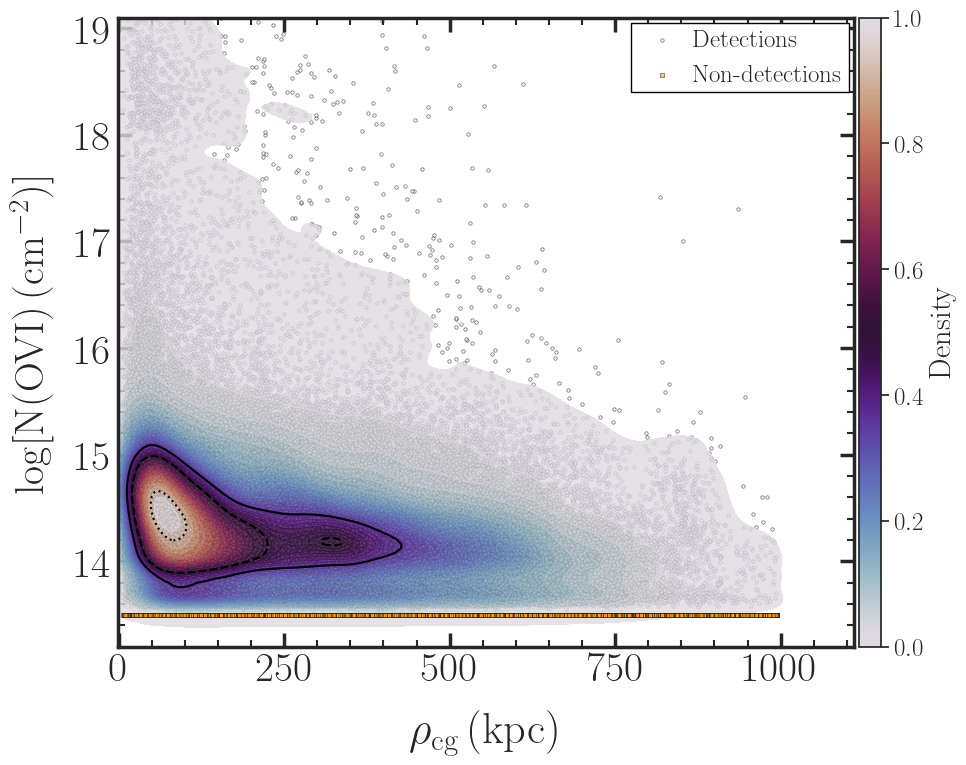

In [17]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
import h5py

# Paths
base_dir = '../../Grad School/MgII_TNG_Project/Primary Project/Trident Codes/TNG_50_z_0.1_groups/revised_final'
halo_file_path = '../TNG50_fitting_results/TNG_halos.txt'
# fitting_dir = '../TNG50_fitting_results/fitting_combined_features_grp_only'
fitting_dir = '../TNG50_fitting_results/v_2500_data_filtered_v800_combined_gal_removed'
galaxy_cat_dir = '../TNG50_fitting_results/galaxy_cats'

# Constants
z = 0.1  # Redshift
a = 1 / (1 + z)  # Scale factor
h = 0.6774  # Hubble parameter
box_size = 35000  # Simulation box size

# Map group index to sequential group numbering
grp_index_to_group_mapping = {
    7: 0, 8: 1, 9: 2, 10: 3, 11: 4, 12: 5, 13: 6, 15: 7,
    17: 8, 18: 9, 19: 10, 20: 11, 22: 12, 24: 13
}

# Load the halo group data
halo_data = pd.read_csv(halo_file_path, sep='|', skipinitialspace=True)
halo_data.columns = halo_data.columns.str.strip()
halo_data['GroupPos_x'] = pd.to_numeric(halo_data['GroupPos_x(𝑐𝑘𝑝𝑐/ℎ)'], errors='coerce')
halo_data['GroupPos_y'] = pd.to_numeric(halo_data['GroupPos_x(𝑐𝑘𝑝𝑐/ℎ)'], errors='coerce')

# Initialize arrays for results
impact_params_detections = []
n_ovi_detections = []
impact_params_non_detections = []
n_ovi_non_detections = []

# Helper function for cyclic correction
def apply_cyclic_condition(ray_coord, galaxy_coord, box_size):
    diff = np.abs(galaxy_coord - ray_coord)
    if diff > box_size / 2:
        if galaxy_coord > ray_coord:
            galaxy_coord -= box_size
        else:
            galaxy_coord += box_size
    return galaxy_coord

# Loop through all group files
for grp_index in tqdm(grp_index_to_group_mapping.keys()):
    group_number = grp_index_to_group_mapping[grp_index]

    # Load ray data
    ray_file = os.path.join(base_dir, f"integral_TNG50-1_z0.1_n300d2-sample_localized_OVInumdens_{group_number}-of-14.hdf5")
    if not os.path.exists(ray_file):
        print(f"File not found: {ray_file}")
        continue

    with h5py.File(ray_file, 'r') as f:
        ray_positions = f['ray_pos'][:]

    # Load fitting results
    fitting_file = os.path.join(fitting_dir, f"group_{group_number}_combined_features.txt")
    if not os.path.exists(fitting_file):
        print(f"File not found: {fitting_file}")
        continue

    fitting_data = pd.read_csv(fitting_file, sep='|', skipinitialspace=True)
    fitting_data.columns = fitting_data.columns.str.strip()

    detected_data = fitting_data[~fitting_data['dN'].isna()]
    non_detected_data = fitting_data[fitting_data['dN'].isna()]

    # Load galaxy catalog
    galaxy_file = os.path.join(galaxy_cat_dir, f"group_{grp_index}_galaxy_catalog_converted.txt")
    if not os.path.exists(galaxy_file):
        print(f"Galaxy catalog not found: {galaxy_file}")
        continue

    galaxy_data = pd.read_csv(galaxy_file, sep='|', skipinitialspace=True)
    galaxy_data.columns = galaxy_data.columns.str.strip()

    # Extract galaxy positions
    galaxy_positions = galaxy_data[['SubhaloPos_0', 'SubhaloPos_1']].values

    # Store impact parameters for detections
    for sightline_id, log_n in zip(detected_data['Sightline'], detected_data['N']):
        ray_x, ray_y = ray_positions[sightline_id, :2]
        corrected_positions = np.array([
            [apply_cyclic_condition(ray_x, gx, box_size), apply_cyclic_condition(ray_y, gy, box_size)]
            for gx, gy in galaxy_positions
        ])
        distances = np.sqrt((corrected_positions[:, 0] - ray_x) ** 2 + (corrected_positions[:, 1] - ray_y) ** 2)
        nearest_distance = np.min(distances) * a / h  # Convert to physical kpc
        impact_params_detections.append(nearest_distance)
        n_ovi_detections.append(log_n)

    # Store impact parameters for non-detections
    for sightline_id in non_detected_data['Sightline']:
        ray_x, ray_y = ray_positions[sightline_id, :2]
        corrected_positions = np.array([
            [apply_cyclic_condition(ray_x, gx, box_size), apply_cyclic_condition(ray_y, gy, box_size)]
            for gx, gy in galaxy_positions
        ])
        distances = np.sqrt((corrected_positions[:, 0] - ray_x) ** 2 + (corrected_positions[:, 1] - ray_y) ** 2)
        nearest_distance = np.min(distances) * a / h  # Convert to physical kpc
        impact_params_non_detections.append(nearest_distance)
        n_ovi_non_detections.append(13.5)  # Replace N for non-detections

# Convert results to numpy arrays
impact_params_detections = np.array(impact_params_detections)
n_ovi_detections = np.array(n_ovi_detections)
impact_params_non_detections = np.array(impact_params_non_detections)
n_ovi_non_detections = np.array(n_ovi_non_detections)

# Plot N(OVI) vs. impact parameter
fig, ax = plt.subplots(figsize=(10, 8))

# Scatter plot for detections
ax.scatter(
    impact_params_detections, n_ovi_detections, color='white', s=6, alpha=0.6,
    edgecolor='black', linewidth=0.5, marker='o', label='Detections', zorder=0
)

#Scatter plot for non-detections
ax.scatter(
    impact_params_non_detections, n_ovi_non_detections, color='orange', s=8, alpha=0.6,
    edgecolor='black', linewidth=0.5, marker='s', label='Non-detections', zorder=3
)

# KDE plot
kde = sns.kdeplot(
    x=impact_params_detections, y=n_ovi_detections, fill=True,
    cmap="twilight", levels=40, thresh=0.002, alpha=0.8, ax=ax, rasterized=True
)
sns.kdeplot(
    x=impact_params_detections, y=n_ovi_detections, levels=[0.5, 0.68, 0.95], color="black",
    linewidths=1.5, ax=ax, linestyles=["solid", "dashed", "dotted"]
)

# **Add Colorbar for KDE**

# Create an axis for the colorbar
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="3%", pad=0.05)

kde_min, kde_max = kde.collections[0].get_clim()  # Get color limits from KDE

# Define normalization based on actual KDE density values
norm = mcolors.Normalize(vmin=kde_min, vmax=kde_max)
sm = cm.ScalarMappable(cmap="twilight", norm=norm)
sm.set_array([])  # Needed for colorbar

# Add Colorbar
cbar = fig.colorbar(sm, cax=cax, orientation="vertical")
cbar.set_label(r'$\mathrm{Density}$', fontsize=22)
cbar.ax.tick_params(labelsize=18)


# Axis labels and legend
ax.set_xlabel(r'$\rho_\mathrm{cg} \, (\mathrm{kpc})$', fontsize=32, labelpad=15)
ax.set_ylabel(r'$\log[\mathrm{N(OVI)} \, (\mathrm{cm^{-2}})]$', fontsize=30, labelpad=15)
ax.tick_params(axis='both', which='major', direction='in', width=2, length=7)
ax.set_ylim(13.2, 19.1)
ax.set_xlim(-1, 1110)
ax.spines['top'].set_linewidth(2.5)
ax.spines['right'].set_linewidth(2.5)
ax.spines['bottom'].set_linewidth(2.5)
ax.spines['left'].set_linewidth(2.5)

# Add legend
ax.legend(loc='upper right',frameon=True,framealpha=1, edgecolor='black',
          fancybox=False, shadow=False, borderpad=0.25,borderaxespad=0.2, handletextpad=0.25, fontsize=18)

# # Customize ticks and spines
# ax.tick_params(axis='both', which='major', direction='in', width=2, length=7)

# Enable major and minor ticks on all four axes
ax.tick_params(axis='both', which='major', direction='in', length=10, width=2.5, top=True, right=True)
ax.tick_params(axis='both', which='minor', direction='in', length=5, width=1.5, top=True, right=True)

# Add minor tick locators for both x and y axes
ax.xaxis.set_minor_locator(AutoMinorLocator())  # Minor ticks for x-axis
ax.yaxis.set_minor_locator(AutoMinorLocator())  # Minor ticks for y-axis

# Final adjustments
plt.tight_layout()
output_dir = '../TNG50_fitting_results/Plots_gal_removed_new'
plt.savefig(os.path.join(output_dir, 'N_OVI_vs_Impact_Param_Corrected.png'), dpi=400)
plt.show()

100%|██████████| 14/14 [00:25<00:00,  1.82s/it]
/Users/wavefunction/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines/igrm/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/wavefunction/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines/igrm/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/wavefunction/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines/igrm/lib/python3.11/site-packages/seaborn/distributions.py:1185: UserWarning: The following kwargs were not used by contour: 'rasterized'
  cset = contour_func(
/Users/wavefunction/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sigh

Unique values in full_sample_df['group']: ['J0841+1406' 'J1017+4702' 'J1020+1003' 'J1025+4808' 'J1102+0521'
 'J1126+1204' 'J1127+2654' 'J1216+0712' 'J1301+2819' 'J1339+5355'
 'J1343+2538' 'J1344+5546' 'J1348+4303' 'J1408+5657' 'J1424+4214'
 'J1426+1955' 'J1428+3225' 'J1617+0854']
Unique values in plotting_data_df['group']: ['J0841+1406' 'J1017+4702' 'J1020+1003' 'J1025+4808' 'J1102+0521'
 'J1126+1204' 'J1127+2654' 'J1216+0712' 'J1301+2819' 'J1339+5355'
 'J1343+2538' 'J1344+5546' 'J1348+4303' 'J1408+5657' 'J1424+4214'
 'J1426+1955' 'J1428+3225' 'J1617+0854']
Unique values in merged_df['subset']: ['C' 'I']
Number of rows in merged_df: 18
Index(['sightline', 'group', 'ra_gp', 'decl_gp', 'z_gp', 'ra_qso', 'decl_qso',
       'z_qso', 'n_gp', 'σ_tago', 'rvir_tago', 'ρ_qso', 'log[m_halo]', 'rvir',
       'σ_gp', 'ra_cg', 'decl_cg', 'impact_param_group', 'impact_param_galaxy',
       'n_hi', 'n_hi_err_low', 'n_hi_err_high', 'n_ovi', 'n_ovi_err_low',
       'n_ovi_err_high', 'subset'],
      dt

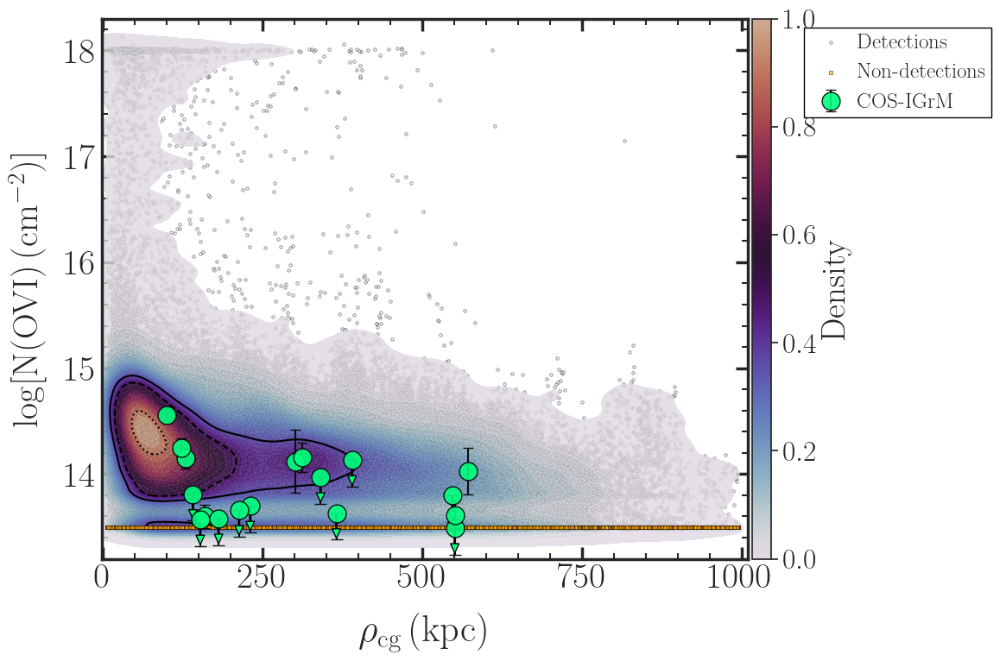

In [169]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
import h5py

# Paths
base_dir = '../../Grad School/MgII_TNG_Project/Primary Project/Trident Codes/TNG_50_z_0.1_groups/revised_final'
halo_file_path = '../TNG50_fitting_results/TNG_halos.txt'
#fitting_dir = '../TNG50_fitting_results/fitting_combined_features_grp_only_800'
fitting_dir = '../TNG50_fitting_results/v_2500_data_filtered_v800_combined_gal_removed'
galaxy_cat_dir = '../TNG50_fitting_results/galaxy_cats'



# Constants
z = 0.1  # Redshift
a = 1 / (1 + z)  # Scale factor



h = 0.6774  # Hubble parameter
box_size = 35000  # Simulation box size

# Map group index to sequential group numbering
grp_index_to_group_mapping = {
    7: 0, 8: 1, 9: 2, 10: 3, 11: 4, 12: 5, 13: 6, 15: 7,
    17: 8, 18: 9, 19: 10, 20: 11, 22: 12, 24: 13
}

# Load the halo group data
halo_data = pd.read_csv(halo_file_path, sep='|', skipinitialspace=True)
halo_data.columns = halo_data.columns.str.strip()
halo_data['GroupPos_x'] = pd.to_numeric(halo_data['GroupPos_x(𝑐𝑘𝑝𝑐/ℎ)'], errors='coerce')
halo_data['GroupPos_y'] = pd.to_numeric(halo_data['GroupPos_x(𝑐𝑘𝑝𝑐/ℎ)'], errors='coerce')

# Initialize arrays for results
impact_params_detections = []
n_ovi_detections = []
impact_params_non_detections = []
n_ovi_non_detections = []

# Helper function for cyclic correction
def apply_cyclic_condition(ray_coord, galaxy_coord, box_size):
    diff = np.abs(galaxy_coord - ray_coord)
    if diff > box_size / 2:
        if galaxy_coord > ray_coord:
            galaxy_coord -= box_size
        else:
            galaxy_coord += box_size
    return galaxy_coord

# Loop through all group files
for grp_index in tqdm(grp_index_to_group_mapping.keys()):
    group_number = grp_index_to_group_mapping[grp_index]

    # Load ray data
    ray_file = os.path.join(base_dir, f"integral_TNG50-1_z0.1_n300d2-sample_localized_OVInumdens_{group_number}-of-14.hdf5")
    if not os.path.exists(ray_file):
        print(f"File not found: {ray_file}")
        continue

    with h5py.File(ray_file, 'r') as f:
        ray_positions = f['ray_pos'][:]

    # Load fitting results
    fitting_file = os.path.join(fitting_dir, f"group_{group_number}_combined_features.txt")
    if not os.path.exists(fitting_file):
        print(f"File not found: {fitting_file}")
        continue

    fitting_data = pd.read_csv(fitting_file, sep='|', skipinitialspace=True)
    fitting_data.columns = fitting_data.columns.str.strip()

    detected_data = fitting_data[~fitting_data['dN'].isna()]
    non_detected_data = fitting_data[fitting_data['dN'].isna()]

    # Load galaxy catalog
    galaxy_file = os.path.join(galaxy_cat_dir, f"group_{grp_index}_galaxy_catalog_converted.txt")
    if not os.path.exists(galaxy_file):
        print(f"Galaxy catalog not found: {galaxy_file}")
        continue

    galaxy_data = pd.read_csv(galaxy_file, sep='|', skipinitialspace=True)
    galaxy_data.columns = galaxy_data.columns.str.strip()

    # Extract galaxy positions
    galaxy_positions = galaxy_data[['SubhaloPos_0', 'SubhaloPos_1']].values

    # Store impact parameters for detections
    for sightline_id, log_n in zip(detected_data['Sightline'], detected_data['N']):
        ray_x, ray_y = ray_positions[sightline_id, :2]
        corrected_positions = np.array([
            [apply_cyclic_condition(ray_x, gx, box_size), apply_cyclic_condition(ray_y, gy, box_size)]
            for gx, gy in galaxy_positions
        ])
        distances = np.sqrt((corrected_positions[:, 0] - ray_x) ** 2 + (corrected_positions[:, 1] - ray_y) ** 2)
        nearest_distance = np.min(distances) * a / h  # Convert to physical kpc
        impact_params_detections.append(nearest_distance)
        n_ovi_detections.append(log_n)

    # Store impact parameters for non-detections
    for sightline_id in non_detected_data['Sightline']:
        ray_x, ray_y = ray_positions[sightline_id, :2]
        corrected_positions = np.array([
            [apply_cyclic_condition(ray_x, gx, box_size), apply_cyclic_condition(ray_y, gy, box_size)]
            for gx, gy in galaxy_positions
        ])
        distances = np.sqrt((corrected_positions[:, 0] - ray_x) ** 2 + (corrected_positions[:, 1] - ray_y) ** 2)
        nearest_distance = np.min(distances) * a / h  # Convert to physical kpc
        impact_params_non_detections.append(nearest_distance)
        n_ovi_non_detections.append(13.5)  # Replace N for non-detections

# Convert results to numpy arrays
impact_params_detections = np.array(impact_params_detections)
n_ovi_detections = np.array(n_ovi_detections)
impact_params_non_detections = np.array(impact_params_non_detections)
n_ovi_non_detections = np.array(n_ovi_non_detections)

# Plot N(OVI) vs. impact parameter
fig, ax = plt.subplots(figsize=(12, 8))

# # Scatter plot for detections
ax.scatter(
    impact_params_detections, n_ovi_detections, color='white', s=6, alpha=0.6,
    edgecolor='black', linewidth=0.5, marker='o', label='Detections', zorder=0
)

#Scatter plot for non-detections
ax.scatter(
    impact_params_non_detections, n_ovi_non_detections, color='orange', s=8, alpha=0.6,
    edgecolor='black', linewidth=0.5, marker='s', label='Non-detections', zorder=3
)

# KDE plot
kde = sns.kdeplot(
    x=impact_params_detections, y=n_ovi_detections, fill=True,
    cmap=twilight_trunc, levels=40, thresh=0.002, alpha=0.8, ax=ax, rasterized=True
)
sns.kdeplot(
    x=impact_params_detections, y=n_ovi_detections, levels=[0.5, 0.68, 0.95], color="black",
    linewidths=1.5, ax=ax, linestyles=["solid", "dashed", "dotted"]
)


# **Add Colorbar for KDE**

# Create an axis for the colorbar
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="3%", pad=0.05)

kde_min, kde_max = kde.collections[0].get_clim()  # Get color limits from KDE

# Define normalization based on actual KDE density values
norm = mcolors.Normalize(vmin=kde_min, vmax=kde_max)
sm = cm.ScalarMappable(cmap=twilight_trunc, norm=norm)
sm.set_array([])  # Needed for colorbar

# Add Colorbar
cbar = fig.colorbar(sm, cax=cax, orientation="vertical")
cbar.set_label(r'$\mathrm{Density}$', fontsize=28)
cbar.ax.tick_params(labelsize=24)


# File paths
full_sample_path = '../COS_IGrM_Data/Group_Sightline_Data.txt'
plotting_data_path = '../COS_IGrM_Data/Plotting_data_subset.txt'

# Load data
full_sample_df = pd.read_csv(full_sample_path, sep='|', comment='#', engine='python')
plotting_data_df = pd.read_csv(plotting_data_path, sep='\s+', comment='#', engine='python')

# Remove unnamed columns
full_sample_df = full_sample_df.loc[:, ~full_sample_df.columns.str.contains('^unnamed', case=False)]
plotting_data_df = plotting_data_df.loc[:, ~plotting_data_df.columns.str.contains('^unnamed', case=False)]

# Normalize column names
full_sample_df.columns = full_sample_df.columns.str.strip().str.lower()
plotting_data_df.columns = plotting_data_df.columns.str.strip().str.lower()

# Normalize 'group' column values in both DataFrames
full_sample_df['group'] = full_sample_df['group'].str.strip().str.upper()
plotting_data_df['group'] = plotting_data_df['group'].str.strip().str.upper()

# Debugging: Print unique 'group' values
print("Unique values in full_sample_df['group']:", full_sample_df['group'].unique())
print("Unique values in plotting_data_df['group']:", plotting_data_df['group'].unique())

# Merge DataFrames on 'group'
merged_df = pd.merge(full_sample_df, plotting_data_df, on='group', how='inner')

# Debugging: Check merged DataFrame
print("Unique values in merged_df['subset']:", merged_df['subset'].unique())
print("Number of rows in merged_df:", len(merged_df))

# Ensure 'subset' column is not empty
# if merged_df['subset'].isna().all():
#     print("Error: 'subset' column is empty after merging. Check 'group' column values in both files.")
# else:
#     # Normalize 'subset' column values
#     merged_df['subset'] = merged_df['subset'].str.strip().str.upper()
#     # print the columns of merged_df
#     print(merged_df.columns)

#     # Plot observational data
#     for subset_type, color, label in [('I', 'springgreen', 'IGrM'), ('C', 'cyan', 'CGM + IGrM')]:
#         subset_df = merged_df[merged_df['subset'] == subset_type]
#         print(f"Processing subset: {subset_type}, Rows: {len(subset_df)}")
#         # Add plotting logic here
#         for _, row in subset_df.iterrows():
#             if row['n_ovi_err_low'] == 0.25 or row['n_ovi_err_high'] == 0.25:
#                 ax.errorbar(row['impact_param_galaxy'], row['n_ovi'], 
#                             yerr=[[row['n_ovi_err_low']], [0]], fmt='o', markersize=12, markerfacecolor=color,
#                             markeredgecolor='black', ecolor='black', capsize=5, alpha=0.9, zorder=4,
#                             label=label if row.name == subset_df.index[0] else "")
#                 ax.annotate('', xy=(row['impact_param_galaxy'], row['n_ovi'] - row['n_ovi_err_low']),
#                             xytext=(row['impact_param_galaxy'], row['n_ovi']),
#                             arrowprops=dict(facecolor=color, shrink=0.05, width=1, headwidth=7, headlength=8, edgecolor='black'), zorder=4)
#             else:
#                 ax.errorbar(row['impact_param_galaxy'], row['n_ovi'], 
#                             yerr=[[row['n_ovi_err_low']], [row['n_ovi_err_high']]], fmt='o', markersize=12,
#                             markerfacecolor=color, markeredgecolor='black', ecolor='black', capsize=4, alpha=0.9,
#                             zorder=4, label=label if row.name == subset_df.index[0] else "")

cos_label_added = {'I': False, 'C': True}
if merged_df['subset'].isna().all():
    print("Error: 'subset' column is empty after merging. Check 'group' column values in both files.")
else:
    # Normalize 'subset' column values
    merged_df['subset'] = merged_df['subset'].str.strip().str.upper()
    print(merged_df.columns)

    # Plot observational data
    for subset_type, color, label in [('I', 'springgreen', 'COS-IGrM'), ('C', 'springgreen', 'COS-IGrM')]:
        subset_df = merged_df[merged_df['subset'] == subset_type]
        print(f"Processing subset: {subset_type}, Rows: {len(subset_df)}")
        for _, row in subset_df.iterrows():
            lab = label if not cos_label_added[subset_type] else ""
            cos_label_added[subset_type] = True
            if row['n_ovi_err_low'] == 0.25 or row['n_ovi_err_high'] == 0.25:
                ax.errorbar(row['impact_param_galaxy'], row['n_ovi'], 
                            yerr=[[row['n_ovi_err_low']], [0]], fmt='o', markersize=15,
                            markerfacecolor=color, markeredgecolor='black', ecolor='black',
                            capsize=5, alpha=0.9, zorder=4, label=lab)
                ax.annotate('', 
                            xy=(row['impact_param_galaxy'], row['n_ovi'] - row['n_ovi_err_low']),
                            xytext=(row['impact_param_galaxy'], row['n_ovi']),
                            arrowprops=dict(facecolor=color, shrink=0.05, width=1, 
                                            headwidth=7, headlength=8, edgecolor='black'),
                            zorder=4)
            else:
                ax.errorbar(row['impact_param_galaxy'], row['n_ovi'], 
                            yerr=[[row['n_ovi_err_low']], [row['n_ovi_err_high']]], fmt='o', markersize=15,
                            markerfacecolor=color, markeredgecolor='black', ecolor='black',
                            capsize=4, alpha=0.9, zorder=4, label=lab)


# Axis labels and legend
ax.set_xlabel(r'$\rho_\mathrm{cg} \, (\mathrm{kpc})$', fontsize=32, labelpad=15)
ax.set_ylabel(r'$\log[\mathrm{N(OVI)} \, (\mathrm{cm^{-2}})]$', fontsize=30, labelpad=15)
ax.tick_params(axis='both', which='major', direction='in', width=2, length=7)
ax.set_ylim(13.2, 18.3)
ax.set_xlim(-1, 1010)
ax.spines['top'].set_linewidth(2.5)
ax.spines['right'].set_linewidth(2.5)
ax.spines['bottom'].set_linewidth(2.5)
ax.spines['left'].set_linewidth(2.5)

# Add legend
ax.legend(loc='center left', bbox_to_anchor=(1.08, 0.9),
          frameon=True,framealpha=1, edgecolor='black',
          fancybox=False, shadow=False, borderpad=0.25,borderaxespad=0.2, handletextpad=0.25, fontsize=18)

# # Customize ticks and spines
# ax.tick_params(axis='both', which='major', direction='in', width=2, length=7)

# Enable major and minor ticks on all four axes
ax.tick_params(axis='both', which='major', direction='in', length=10, width=2.5, top=True, right=True)
ax.tick_params(axis='both', which='minor', direction='in', length=5, width=1.5, top=True, right=True)
from matplotlib.ticker import AutoMinorLocator
# Add minor tick locators for both x and y axes
ax.xaxis.set_minor_locator(AutoMinorLocator())  # Minor ticks for x-axis
ax.yaxis.set_minor_locator(AutoMinorLocator())  # Minor ticks for y-axis

# Final adjustments
plt.tight_layout()
output_dir = '../TNG50_fitting_results/Plots_gal_removed_new'
plt.savefig(os.path.join(output_dir, 'N_OVI_vs_Impact_Param_obs.png'), dpi=400)
plt.show()

In [170]:
# Convert lists to numpy arrays for easier filtering
impact_params_detections = np.array(impact_params_detections)  # Impact parameters (kpc)
n_ovi_detections = np.array(n_ovi_detections)  # Column densities log[N(OVI)]

# Filter: Only keep detected absorbers with log N(OVI) > 15
mask_high_N_OVI = n_ovi_detections > 15
high_N_OVI_impact_params = impact_params_detections[mask_high_N_OVI]  # Impact parameters of high-N absorbers

# Compute fraction: absorbers with impact param < 200 kpc within the high column density absorbers
num_high_N_OVI = len(high_N_OVI_impact_params)  # Total high column density absorbers
num_within_200_kpc = np.sum(high_N_OVI_impact_params < 200)  # Count absorbers with impact param < 200 kpc

# Compute fraction safely
fraction_within_200_kpc = num_within_200_kpc / num_high_N_OVI if num_high_N_OVI > 0 else 0

# Print results
print(f"Total detected absorbers with log N(OVI) > 15: {num_high_N_OVI}")
print(f"Number of absorbers with impact parameter < 200 kpc: {num_within_200_kpc}")
print(f"Fraction of high-N absorbers with impact parameter < 200 kpc: {fraction_within_200_kpc:.4f}")

Total detected absorbers with log N(OVI) > 15: 5676
Number of absorbers with impact parameter < 200 kpc: 4882
Fraction of high-N absorbers with impact parameter < 200 kpc: 0.8601


In [171]:
print("Columns in subset_df:", subset_df.columns)

Columns in subset_df: Index(['sightline', 'group', 'ra_gp', 'decl_gp', 'z_gp', 'ra_qso', 'decl_qso',
       'z_qso', 'n_gp', 'σ_tago', 'rvir_tago', 'ρ_qso', 'log[m_halo]', 'rvir',
       'σ_gp', 'ra_cg', 'decl_cg', 'impact_param_group', 'impact_param_galaxy',
       'n_hi', 'n_hi_err_low', 'n_hi_err_high', 'n_ovi', 'n_ovi_err_low',
       'n_ovi_err_high', 'subset'],
      dtype='object')


In [172]:
impact_params_non_detections.min(), impact_params_non_detections.max()

(6.6501586567333115, 995.0837528703801)

In [173]:
impact_params_detections.min(), impact_params_detections.max()

(4.96533626689635, 992.8392526413639)

In [174]:
impact_params_non_detections.min(), impact_params_non_detections.max()

(6.6501586567333115, 995.0837528703801)

100%|██████████| 14/14 [00:25<00:00,  1.85s/it]
/Users/wavefunction/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines/igrm/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/wavefunction/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines/igrm/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/wavefunction/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines/igrm/lib/python3.11/site-packages/seaborn/distributions.py:1185: UserWarning: The following kwargs were not used by contour: 'rasterized'
  cset = contour_func(
/Users/wavefunction/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sigh

Unique values in full_sample_df['group']: ['J0841+1406' 'J1017+4702' 'J1020+1003' 'J1025+4808' 'J1102+0521'
 'J1126+1204' 'J1127+2654' 'J1216+0712' 'J1301+2819' 'J1339+5355'
 'J1343+2538' 'J1344+5546' 'J1348+4303' 'J1408+5657' 'J1424+4214'
 'J1426+1955' 'J1428+3225' 'J1617+0854']
Unique values in plotting_data_df['group']: ['J0841+1406' 'J1017+4702' 'J1020+1003' 'J1025+4808' 'J1102+0521'
 'J1126+1204' 'J1127+2654' 'J1216+0712' 'J1301+2819' 'J1339+5355'
 'J1343+2538' 'J1344+5546' 'J1348+4303' 'J1408+5657' 'J1424+4214'
 'J1426+1955' 'J1428+3225' 'J1617+0854']
Unique values in merged_df['subset']: ['C' 'I']
Number of rows in merged_df: 18
ERROR: Column 'sSFR' not found in merged_df. Available columns: ['sightline', 'group', 'ra_gp', 'decl_gp', 'z_gp', 'ra_qso', 'decl_qso', 'z_qso', 'n_gp', 'σ_tago', 'rvir_tago', 'ρ_qso', 'log[m_halo]', 'rvir', 'σ_gp', 'ra_cg', 'decl_cg', 'impact_param_group', 'impact_param_galaxy', 'n_hi', 'n_hi_err_low', 'n_hi_err_high', 'n_ovi', 'n_ovi_err_low', 'n_ovi_

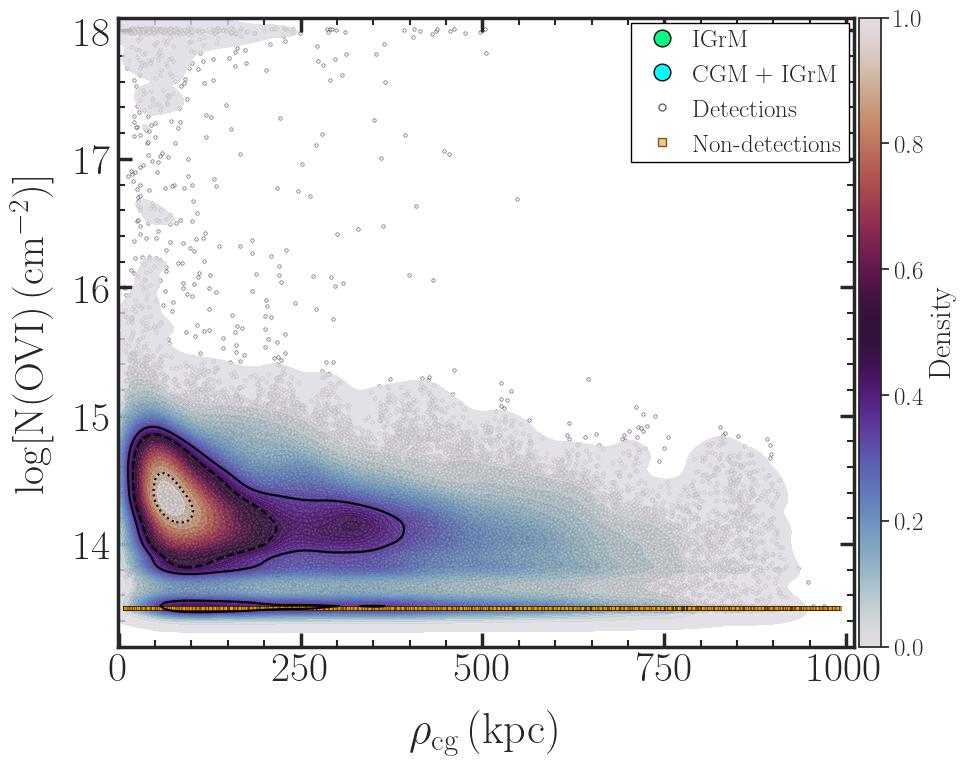

In [ ]:
#!/usr/bin/env python3
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
import h5py
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.colors as mcolors
import matplotlib.cm as cm
from matplotlib.ticker import AutoMinorLocator
from matplotlib.lines import Line2D

# ---------------------------
# Paths and Constants
# ---------------------------
base_dir = '../../Grad School/MgII_TNG_Project/Primary Project/Trident Codes/TNG_50_z_0.1_groups/revised_final'
halo_file_path = '../TNG50_fitting_results/TNG_halos.txt'
# fitting_dir = '../TNG50_fitting_results/fitting_combined_features_grp_only'
fitting_dir = '../TNG50_fitting_results/v_2500_data_filtered_v800_combined_gal_removed'
galaxy_cat_dir = '../TNG50_fitting_results/galaxy_cats'
full_sample_path = '../COS_IGrM_Data/Group_Sightline_Data.txt'
plotting_data_path = '../COS_IGrM_Data/Plotting_data_subset.txt'

z = 0.1                    # Redshift
a = 1 / (1 + z)            # Scale factor
h = 0.6774                 # Hubble parameter
box_size = 35000           # Simulation box size

# Map group index to sequential group numbering
grp_index_to_group_mapping = {
    7: 0, 8: 1, 9: 2, 10: 3, 11: 4, 12: 5, 13: 6, 15: 7,
    17: 8, 18: 9, 19: 10, 20: 11, 22: 12, 24: 13
}

# ---------------------------
# Load Halo Data
# ---------------------------
halo_data = pd.read_csv(halo_file_path, sep='|', skipinitialspace=True)
halo_data.columns = halo_data.columns.str.strip()
halo_data['GroupPos_x'] = pd.to_numeric(halo_data['GroupPos_x(𝑐𝑘𝑝𝑐/ℎ)'], errors='coerce')
halo_data['GroupPos_y'] = pd.to_numeric(halo_data['GroupPos_x(𝑐𝑘𝑝𝑐/ℎ)'], errors='coerce')

# ---------------------------
# Helper Function: Cyclic Correction
# ---------------------------
def apply_cyclic_condition(ray_coord, galaxy_coord, box_size):
    diff = np.abs(galaxy_coord - ray_coord)
    if diff > box_size / 2:
        if galaxy_coord > ray_coord:
            galaxy_coord -= box_size
        else:
            galaxy_coord += box_size
    return galaxy_coord

# ---------------------------
# Initialize Arrays for Simulation Results
# ---------------------------
impact_params_detections = []
n_ovi_detections = []
log_ssfr_values = []  # log10(sSFR) for the nearest galaxy for each detection

impact_params_non_detections = []
n_ovi_non_detections = []
log_ssfr_values_non_detections = []  # for non-detections

# ---------------------------
# Loop Through Groups and Process Data
# ---------------------------
for grp_index in tqdm(grp_index_to_group_mapping.keys()):
    group_number = grp_index_to_group_mapping[grp_index]

    # Load ray data
    ray_file = os.path.join(base_dir, f"integral_TNG50-1_z0.1_n300d2-sample_localized_OVInumdens_{group_number}-of-14.hdf5")
    if not os.path.exists(ray_file):
        print(f"File not found: {ray_file}")
        continue
    with h5py.File(ray_file, 'r') as f:
        ray_positions = f['ray_pos'][:]

    # Load fitting results
    fitting_file = os.path.join(fitting_dir, f"group_{group_number}_combined_features.txt")
    if not os.path.exists(fitting_file):
        print(f"File not found: {fitting_file}")
        continue
    fitting_data = pd.read_csv(fitting_file, sep='|', skipinitialspace=True)
    fitting_data.columns = fitting_data.columns.str.strip()
    detected_data = fitting_data[~fitting_data['dN'].isna()]
    non_detected_data = fitting_data[fitting_data['dN'].isna()]

    # Load galaxy catalog
    galaxy_file = os.path.join(galaxy_cat_dir, f"group_{grp_index}_galaxy_catalog_converted.txt")
    if not os.path.exists(galaxy_file):
        print(f"Galaxy catalog not found: {galaxy_file}")
        continue
    galaxy_data = pd.read_csv(galaxy_file, sep='|', skipinitialspace=True)
    galaxy_data.columns = galaxy_data.columns.str.strip()
    galaxy_positions = galaxy_data[['SubhaloPos_0', 'SubhaloPos_1']].values
    galaxy_sfr = galaxy_data['SubhaloSFR'].values
    galaxy_stellar_mass = galaxy_data['SubhaloMassType_4'].values  # in 10^10 M_sun/h
    galaxy_stellar_mass_physical = galaxy_stellar_mass * 1e10 / h  # in physical M_sun

    # Process detections: nearest galaxy sSFR and impact parameter
    for sightline_id, log_n in zip(detected_data['Sightline'], detected_data['N']):
        ray_x, ray_y = ray_positions[sightline_id, :2]
        corrected_positions = np.array([
            [apply_cyclic_condition(ray_x, gx, box_size), apply_cyclic_condition(ray_y, gy, box_size)]
            for gx, gy in galaxy_positions
        ])
        distances = np.sqrt((corrected_positions[:, 0] - ray_x)**2 + (corrected_positions[:, 1] - ray_y)**2)
        nearest_distance = np.min(distances) * a / h  # in kpc
        nearest_idx = np.argmin(distances)
        nearest_sfr = galaxy_sfr[nearest_idx]
        nearest_mass = galaxy_stellar_mass_physical[nearest_idx]
        if nearest_mass > 0:
            ssfr = nearest_sfr / nearest_mass
            log_ssfr = np.log10(ssfr) if ssfr > 0 else -np.inf
            impact_params_detections.append(nearest_distance)
            n_ovi_detections.append(log_n)
            log_ssfr_values.append(log_ssfr)

    # Process non-detections similarly
    for sightline_id, log_n in zip(non_detected_data['Sightline'], non_detected_data['N']):
        ray_x, ray_y = ray_positions[sightline_id, :2]
        corrected_positions = np.array([
            [apply_cyclic_condition(ray_x, gx, box_size), apply_cyclic_condition(ray_y, gy, box_size)]
            for gx, gy in galaxy_positions
        ])
        distances = np.sqrt((corrected_positions[:, 0] - ray_x)**2 + (corrected_positions[:, 1] - ray_y)**2)
        nearest_distance = np.min(distances) * a / h  # in kpc
        nearest_idx = np.argmin(distances)
        nearest_sfr = galaxy_sfr[nearest_idx]
        nearest_mass = galaxy_stellar_mass_physical[nearest_idx]
        if nearest_mass > 0:
            ssfr = nearest_sfr / nearest_mass
            log_ssfr = np.log10(ssfr) if ssfr > 0 else -np.inf
            impact_params_non_detections.append(nearest_distance)
            log_ssfr_values_non_detections.append(log_ssfr)
            n_ovi_non_detections.append(log_n)
    # For non-detections, force N(OVI) to a constant (e.g., 13.5)
    n_ovi_non_detections = [13.5] * len(log_ssfr_values_non_detections)

# Convert results to numpy arrays
impact_params_detections = np.array(impact_params_detections)
n_ovi_detections = np.array(n_ovi_detections)
log_ssfr_values = np.array(log_ssfr_values)

impact_params_non_detections = np.array(impact_params_non_detections)
n_ovi_non_detections = np.array(n_ovi_non_detections)
log_ssfr_values_non_detections = np.array(log_ssfr_values_non_detections)

# ---------------------------
# Filter: Keep only detections with log(sSFR) > -11
# ---------------------------
mask_det = log_ssfr_values > -11
mask_non_det = log_ssfr_values_non_detections > -11

impact_params_detections = impact_params_detections[mask_det]
n_ovi_detections = n_ovi_detections[mask_det]
log_ssfr_values = log_ssfr_values[mask_det]

impact_params_non_detections = impact_params_non_detections[mask_non_det]
n_ovi_non_detections = n_ovi_non_detections[mask_non_det]
log_ssfr_values_non_detections = log_ssfr_values_non_detections[mask_non_det]

# ---------------------------
# Plot: N(OVI) vs. Impact Parameter for absorbers with log(sSFR) > -11
# ---------------------------
fig, ax = plt.subplots(figsize=(10, 8))

# Scatter plot for detections
ax.scatter(
    impact_params_detections, n_ovi_detections,
    color='white', s=6, alpha=0.6,
    edgecolor='black', linewidth=0.5,
    marker='o', label='Detections', zorder=0
)

# Scatter plot for non-detections
ax.scatter(
    impact_params_non_detections, n_ovi_non_detections,
    color='orange', s=8, alpha=0.6,
    edgecolor='black', linewidth=0.5,
    marker='s', label='Non-detections', zorder=3
)

# KDE plot for detections
kde = sns.kdeplot(
    x=impact_params_detections, y=n_ovi_detections, fill=True,
    cmap="twilight", levels=40, thresh=0.002, alpha=0.8, ax=ax, rasterized=True, zorder=2
)
sns.kdeplot(
    x=impact_params_detections, y=n_ovi_detections, levels=[0.5, 0.68, 0.95],
    color="black", linewidths=1.5, ax=ax, linestyles=["solid", "dashed", "dotted"], zorder=3
)

# Add Colorbar for KDE
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="3%", pad=0.05)
kde_min, kde_max = kde.collections[0].get_clim()
norm = mcolors.Normalize(vmin=kde_min, vmax=kde_max)
sm = cm.ScalarMappable(cmap="twilight", norm=norm)
sm.set_array([])
cbar = fig.colorbar(sm, cax=cax, orientation="vertical")
cbar.set_label(r'$\mathrm{Density}$', fontsize=22)
cbar.ax.tick_params(labelsize=18)

# ---------------------------
# Overlay Observational Data (if available)
# ---------------------------
full_sample_df = pd.read_csv(full_sample_path, sep='|', comment='#', engine='python')
plotting_data_df = pd.read_csv(plotting_data_path, sep='\s+', comment='#', engine='python')
full_sample_df = full_sample_df.loc[:, ~full_sample_df.columns.str.contains('^unnamed', case=False)]
plotting_data_df = plotting_data_df.loc[:, ~plotting_data_df.columns.str.contains('^unnamed', case=False)]
full_sample_df.columns = full_sample_df.columns.str.strip().str.lower()
plotting_data_df.columns = plotting_data_df.columns.str.strip().str.lower()
full_sample_df['group'] = full_sample_df['group'].str.strip().str.upper()
plotting_data_df['group'] = plotting_data_df['group'].str.strip().str.upper()
print("Unique values in full_sample_df['group']:", full_sample_df['group'].unique())
print("Unique values in plotting_data_df['group']:", plotting_data_df['group'].unique())
merged_df = pd.merge(full_sample_df, plotting_data_df, on='group', how='inner')
print("Unique values in merged_df['subset']:", merged_df['subset'].unique())
print("Number of rows in merged_df:", len(merged_df))

# IMPORTANT: Check if the merged DataFrame contains the column 'sSFR'
if 'sSFR' not in merged_df.columns:
    print("ERROR: Column 'sSFR' not found in merged_df. Available columns:", merged_df.columns.tolist())
    # Optionally, you can rename an existing column to 'sSFR' here if needed.
else:
    merged_df['sSFR'] = merged_df['sSFR'].str.strip()  # Normalize, if needed

    # Plot observational data
    x_err_right = 0.25
    x_err_left_detection = x_err_right / 2
    for idx, row in merged_df.iterrows():
        log_ssfr_obs = row['sSFR']
        n_ovi_obs = row['n_ovi']
        sSFR_lim = row['sSFR_lim']
        N_lim = row['n_lim']
        N_OVI_err_low = row['n_ovi_err_low']
        N_OVI_err_high = row['n_ovi_err_high']
        Subset = row['subset']
        marker_color = 'springgreen' if Subset == 'I' else 'cyan'
        label = 'IGrM' if Subset == 'I' else 'CGM + IGrM'
        ax.scatter(log_ssfr_obs, n_ovi_obs, marker='o', color=marker_color, edgecolor='black',
                   s=150, zorder=3)
        if (not sSFR_lim) and (not N_lim):
            horz_err = [[x_err_left_detection], [x_err_right]]
            ax.errorbar(log_ssfr_obs, n_ovi_obs, xerr=horz_err, fmt='none',
                        ecolor='black', capsize=5, zorder=3)
            ax.errorbar(log_ssfr_obs, n_ovi_obs,
                        yerr=[[N_OVI_err_low], [N_OVI_err_high]], fmt='none',
                        ecolor='black', capsize=4, zorder=3)
        elif sSFR_lim and (not N_lim):
            ax.errorbar(log_ssfr_obs, n_ovi_obs,
                        yerr=[[N_OVI_err_low], [N_OVI_err_high]], fmt='none',
                        ecolor='black', capsize=4, zorder=3)
            ax.annotate('',
                        xy=(log_ssfr_obs - x_err_right, n_ovi_obs),
                        xytext=(log_ssfr_obs, n_ovi_obs),
                        arrowprops=dict(facecolor='black', arrowstyle='-|>',
                                        lw=1, alpha=1, edgecolor='black'),
                        zorder=3)
        elif (not sSFR_lim) and N_lim:
            horz_err = [[x_err_left_detection], [x_err_right]]
            ax.errorbar(log_ssfr_obs, n_ovi_obs, xerr=horz_err, fmt='none',
                        ecolor='black', capsize=5, zorder=3)
            ax.annotate('',
                        xy=(log_ssfr_obs, n_ovi_obs - 0.3),
                        xytext=(log_ssfr_obs, n_ovi_obs),
                        arrowprops=dict(facecolor='black', arrowstyle='-|>',
                                        lw=1, alpha=1, edgecolor='black'),
                        zorder=3)
        else:
            ax.annotate('',
                        xy=(log_ssfr_obs - x_err_right, n_ovi_obs),
                        xytext=(log_ssfr_obs, n_ovi_obs),
                        arrowprops=dict(facecolor='black', arrowstyle='-|>',
                                        lw=1, alpha=1, edgecolor='black'),
                        zorder=3)
            ax.annotate('',
                        xy=(log_ssfr_obs, n_ovi_obs - 0.3),
                        xytext=(log_ssfr_obs, n_ovi_obs),
                        arrowprops=dict(facecolor='black', arrowstyle='-|>',
                                        lw=1, alpha=1, edgecolor='black'),
                        zorder=3)
        print('---')

# ---------------------------
# Axis Labels, Limits, and Ticks
# ---------------------------
ax.set_xlabel(r'$\rho_\mathrm{cg} \, (\mathrm{kpc})$', fontsize=32, labelpad=15)
ax.set_ylabel(r'$\log[\mathrm{N(OVI)} \, (\mathrm{cm^{-2}})]$', fontsize=30, labelpad=15)
ax.set_xlim(-1, 1010)
ax.set_ylim(13.2, 18.1)
ax.tick_params(axis='both', which='major', direction='in', width=2, length=7)
ax.spines['top'].set_linewidth(2.5)
ax.spines['right'].set_linewidth(2.5)
ax.spines['bottom'].set_linewidth(2.5)
ax.spines['left'].set_linewidth(2.5)
ax.tick_params(axis='both', which='major', direction='in', length=10, width=2.5, top=True, right=True)
ax.tick_params(axis='both', which='minor', direction='in', length=5, width=1.5, top=True, right=True)
ax.xaxis.set_minor_locator(AutoMinorLocator())
ax.yaxis.set_minor_locator(AutoMinorLocator())

# legend_elements = [
#     Line2D([0], [0], marker='o', color='springgreen', label='IGrM', markersize=12,
#            markeredgecolor='black', linestyle='none'),
#     Line2D([0], [0], marker='o', color='cyan', label='CGM + IGrM', markersize=12,
#            markeredgecolor='black', linestyle='none'),
#     Line2D([0], [0], marker='o', color='white', label='Detections', markersize=5,
#            markeredgecolor='black', linestyle='none', alpha=0.6),
#     Line2D([0], [0], marker='s', color='orange', label='Non-detections', markersize=6,
#            markeredgecolor='black', linestyle='none', alpha=0.6)
# ]

legend_elements = [
    Line2D([0], [0], marker='o', color='springgreen', label='COS-IGrM', markersize=12,
           markeredgecolor='black', linestyle='none'),
    Line2D([0], [0], marker='o', color='white', label='Detections', markersize=5,
           markeredgecolor='black', linestyle='none', alpha=0.6),
    Line2D([0], [0], marker='s', color='orange', label='Non-detections', markersize=6,
           markeredgecolor='black', linestyle='none', alpha=0.6)
]


ax.legend(handles=legend_elements, frameon=True, framealpha=1, edgecolor='black',
          fancybox=False, shadow=False, borderpad=0.25, borderaxespad=0.2,
          handletextpad=0.25, fontsize=18, loc='upper right')

plt.tight_layout()
output_dir = '../TNG50_fitting_results/Plots_gal_removed'
if not os.path.exists(output_dir):
    os.makedirs(output_dir)
plt.savefig(os.path.join(output_dir, 'N_OVI_vs_Impact_Param_obs_ge_11.pdf'), dpi=200)
plt.show()

/Users/wavefunction/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines/igrm/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/wavefunction/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines/igrm/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/wavefunction/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines/igrm/lib/python3.11/site-packages/seaborn/distributions.py:1185: UserWarning: The following kwargs were not used by contour: 'rasterized'
  cset = contour_func(
/Users/wavefunction/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines/igrm/lib/python3.11/site-packages/seaborn

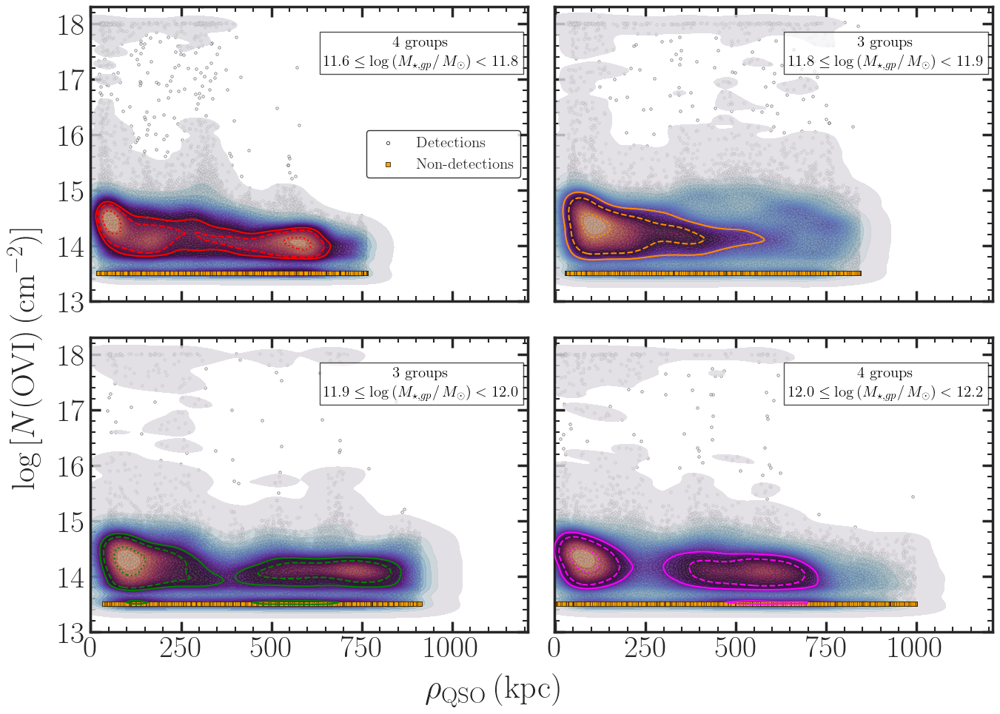

In [176]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
import h5py
import matplotlib.ticker as ticker
import matplotlib.colors as mcolors
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.ticker import AutoMinorLocator
import matplotlib.cm as cm
import matplotlib.patches as mpatches

# ---------------------------
# PATHS AND CONSTANTS
# ---------------------------
base_dir = '../../Grad School/MgII_TNG_Project/Primary Project/Trident Codes/TNG_50_z_0.1_groups/revised_final'
halo_file_path = '../TNG50_fitting_results/TNG_halos.txt'
# fitting_dir = '../TNG50_fitting_results/fitting_combined_features_grp_only'
fitting_dir = '../TNG50_fitting_results/v_2500_data_filtered_v800_combined_gal_removed'
full_sample_path = '../COS_IGrM_Data/Sample_full.txt'
plotting_data_path = '../COS_IGrM_Data/Plotting_data_subset.txt'

z = 0.09940180263022191   # Redshift
a = 1 / (1 + z)           # Scale factor
h = 0.6774                # Hubble parameter
box_size = 35000          # Simulation box size

# ---------------------------
# MAPPING & UPDATED BIN DEFINITIONS
# ---------------------------
# Mapping from original group IDs to sequential indices (0 to 13).
grp_index_to_group_mapping = {
    7: 0, 8: 1, 9: 2, 10: 3, 11: 4, 12: 5, 13: 6, 15: 7,
    17: 8, 18: 9, 19: 10, 20: 11, 22: 12, 24: 13
}

# Updated bins based on quantile-based edges:
# Bin edges: [11.5953, 11.8402, 11.93235, 12.041775, 12.1665]
bins_definition = {
    1: [19, 20, 22, 24],
    2: [13, 17, 18],
    3: [11, 12, 15],
    4: [7, 8, 9, 10]
}
bin_ranges = {
    1: (11.5953, 11.8402),
    2: (11.8402, 11.93235),
    3: (11.93235, 12.041775),
    4: (12.041775, 12.1665)
}

# Colors for KDE contours for each bin.
sim_colors = {1: "red", 2: "darkorange", 3: "green", 4: "magenta"}

# ---------------------------
# INITIALIZE DATA STRUCTURE FOR SIMULATION RESULTS
# ---------------------------
# For each bin, we store:
#   'impact': impact parameters for detections,
#   'n_ovi': corresponding log N(OVI) for detections,
#   'impact_nd': impact parameters for non-detections.
bin_data = {b: {'impact': [], 'n_ovi': [], 'impact_nd': []} for b in bins_definition.keys()}

# ---------------------------
# HELPER FUNCTION FOR CYCLIC CORRECTION
# ---------------------------
def apply_cyclic_condition(ray_coord, center_coord, box_size):
    diff = np.abs(center_coord - ray_coord)
    if diff > box_size / 2:
        if center_coord > ray_coord:
            center_coord -= box_size
        else:
            center_coord += box_size
    return center_coord

# ---------------------------
# LOAD HALO GROUP DATA
# ---------------------------
halo_data = pd.read_csv(halo_file_path, sep='|', skipinitialspace=True)
halo_data.columns = halo_data.columns.str.strip()
# Set sequential index (0 to 13) for the 14 groups.
halo_data.index = np.arange(len(halo_data))
halo_data['GroupPos_x'] = pd.to_numeric(halo_data['GroupPos_x(𝑐𝑘𝑝𝑐/ℎ)'], errors='coerce')
halo_data['GroupPos_y'] = pd.to_numeric(halo_data['GroupPos_y(𝑐𝑘𝑝𝑐/ℎ)'], errors='coerce')

# ---------------------------
# ACCUMULATE SIMULATION DATA PER BIN
# ---------------------------
all_groups = sorted(sum(list(bins_definition.values()), []))
for orig_group in all_groups:
    if orig_group not in grp_index_to_group_mapping:
        print(f"Original group {orig_group} not in mapping. Skipping.")
        continue
    seq_index = grp_index_to_group_mapping[orig_group]
    if seq_index >= len(halo_data):
        print(f"Sequential index {seq_index} for group {orig_group} exceeds halo_data length.")
        continue
    group_row = halo_data.loc[seq_index]
    center_x, center_y = group_row[['GroupPos_x', 'GroupPos_y']]
    
    file_group_number = grp_index_to_group_mapping[orig_group]
    ray_file = os.path.join(base_dir, f"integral_TNG50-1_z0.1_n300d2-sample_localized_OVInumdens_{file_group_number}-of-14.hdf5")
    if not os.path.exists(ray_file):
        print(f"File not found: {ray_file}")
        continue
    with h5py.File(ray_file, 'r') as f:
        ray_positions = f['ray_pos'][:]  # shape: (num_rays, 3)
    
    corrected_center_x = np.array([apply_cyclic_condition(rx, center_x, box_size) for rx in ray_positions[:, 0]])
    corrected_center_y = np.array([apply_cyclic_condition(ry, center_y, box_size) for ry in ray_positions[:, 1]])
    rho = np.sqrt((ray_positions[:, 0] - corrected_center_x)**2 +
                  (ray_positions[:, 1] - corrected_center_y)**2)
    
    fitting_file = os.path.join(fitting_dir, f"group_{file_group_number}_combined_features.txt")
    if not os.path.exists(fitting_file):
        print(f"Fitting file not found: {fitting_file}")
        continue
    fitting_data = pd.read_csv(fitting_file, sep='|', skipinitialspace=True)
    fitting_data.columns = fitting_data.columns.str.strip()
    
    detected_data = fitting_data[~fitting_data['dN'].isna()]
    non_detected_data = fitting_data[fitting_data['dN'].isna()]
    
    bin_num = None
    for b, group_list in bins_definition.items():
        if orig_group in group_list:
            bin_num = b
            break
    if bin_num is None:
        continue
    
    for sightline_id, log_n in zip(detected_data['Sightline'], detected_data['N']):
        bin_data[bin_num]['impact'].append(rho[sightline_id])
        bin_data[bin_num]['n_ovi'].append(log_n)
    for sightline_id in non_detected_data['Sightline']:
        bin_data[bin_num]['impact_nd'].append(rho[sightline_id])

# For non-detections, assign constant log N(OVI)
for b in bin_data:
    bin_data[b]['n_ovi_nd'] = [13.5] * len(bin_data[b]['impact_nd'])
    bin_data[b]['impact'] = np.array(bin_data[b]['impact']) / h * a
    bin_data[b]['impact_nd'] = np.array(bin_data[b]['impact_nd']) / h * a
    bin_data[b]['n_ovi'] = np.array(bin_data[b]['n_ovi'])

# ---------------------------
# LOAD OBSERVATIONAL DATA (COS-IGrM) -- Remove subset distinction.
# ---------------------------
full_sample_df = pd.read_csv(full_sample_path, sep='\s+', comment='#', engine='python')
plotting_data_df = pd.read_csv(plotting_data_path, sep='\s+', comment='#', engine='python')
full_sample_df.columns = full_sample_df.columns.str.strip()
plotting_data_df.columns = plotting_data_df.columns.str.strip()
merged_df = None
if 'Group' in full_sample_df.columns and 'Group' in plotting_data_df.columns:
    merged_df = pd.merge(full_sample_df, plotting_data_df, on='Group')
    merged_df['Impact_Param'] = merged_df['QSO_Rho(kpc)']

# ---------------------------
# PLOTTING: 2x2 SUBPLOTS, COMMON AXES, ZERO SPACE, COMMON LABELS
# ---------------------------
fig, axs = plt.subplots(2, 2, figsize=(14, 10), sharex=True, sharey=True)
axs = axs.flatten()

for i, bin_num in enumerate(sorted(bin_data.keys())):
    ax = axs[i]
    data = bin_data[bin_num]
    
    # Plot simulation detections scatter.
    ax.scatter(
        data['impact'], data['n_ovi'], color='white', s=6, alpha=0.6,
        edgecolor='black', linewidth=0.5, marker='o', zorder=0, label='Detections'
    )
    # Plot simulation non-detections scatter.
    ax.scatter(
        data['impact_nd'], data['n_ovi_nd'], color='orange', s=13, alpha=0.6,
        edgecolor='black', linewidth=0.5, marker='s', zorder=3, label='Non-detections'
    )
    
    # Plot filled KDE contours using the "twilight" cmap.
    kde = sns.kdeplot(
        x=data['impact'], y=data['n_ovi'], fill=True,
        cmap=twilight_trunc, levels=40, thresh=0.002, alpha=0.8,
        ax=ax, rasterized=True, zorder=2
    )
    # Overplot contour lines at levels [0.5, 0.68, 0.95] with bin-specific color.
    sns.kdeplot(
        x=data['impact'], y=data['n_ovi'], levels=[0.5, 0.68, 0.95],
        color=sim_colors[bin_num], linewidths=1.5,
        ax=ax, linestyles=["solid", "dashed", "dotted"], zorder=3
    )
    
    # # Overlay observational data (COS-IGrM) in springgreen.
    # if merged_df is not None:
    #     for _, row in merged_df.iterrows():
    #         if row['N_OVI_err_low'] == 0.25 or row['N_OVI_err_high'] == 0.25:
    #             ax.errorbar(row['Impact_Param'], row['N_OVI'],
    #                         yerr=[[row['N_OVI_err_low']], [0]], fmt='o', markersize=12,
    #                         markerfacecolor='springgreen', markeredgecolor='black', ecolor='black',
    #                         capsize=5, alpha=0.9, zorder=4)
    #             ax.annotate('', xy=(row['Impact_Param'], row['N_OVI'] - row['N_OVI_err_low']),
    #                         xytext=(row['Impact_Param'], row['N_OVI']),
    #                         arrowprops=dict(facecolor='springgreen', shrink=0.05, width=1,
    #                                         headwidth=7, headlength=8, edgecolor='black'),
    #                         zorder=4)
    #         else:
    #             ax.errorbar(row['Impact_Param'], row['N_OVI'],
    #                         yerr=[[row['N_OVI_err_low']], [row['N_OVI_err_high']]], fmt='o', markersize=12,
    #                         markerfacecolor='springgreen', markeredgecolor='black', ecolor='black',
    #                         capsize=4, alpha=0.9, zorder=4)
    
    # For subplot 0, add a full legend and annotation text.
    if i == 0:
        # Create custom legend handles.
        det_handle = ax.scatter([], [], color='white', s=10, edgecolor='black', linewidth=0.5, marker='o', label='Detections')
        nd_handle = ax.scatter([], [], color='orange', s=13, edgecolor='black', linewidth=0.5, marker='s', label='Non-detections')
        cos_handle = plt.Line2D([], [], marker='o', color='none', markerfacecolor='springgreen', markeredgecolor='black', markersize=10, label=r'COS-IGrM')       
        #handles = [det_handle, nd_handle, cos_handle]
        handles = [det_handle, nd_handle]
        ax.legend(handles=handles, loc='center right', fontsize=15,
                   frameon = True, edgecolor = 'black')
        num_groups = len(bins_definition[bin_num])
        low_edge, high_edge = bin_ranges[bin_num]
        annot_text = rf"$\begin{{array}}{{c}}{num_groups}\ \text{{groups}}\\ {low_edge:.1f}\le \log\left(M_{{\star, gp}}/\,M_{{\odot}}\right) < {high_edge:.1f}\end{{array}}$"
        ax.text(0.98, 0.90, annot_text, transform=ax.transAxes,
                horizontalalignment='right', verticalalignment='top',
                fontsize=15, color='black', bbox=dict(facecolor='white', alpha=0.7, edgecolor='black'))
    else:
        num_groups = len(bins_definition[bin_num])
        low_edge, high_edge = bin_ranges[bin_num]
        annot_text = rf"$\begin{{array}}{{c}}{num_groups}\ \text{{groups}}\\ {low_edge:.1f}\le \log\left(M_{{\star, gp}}/\,M_{{\odot}}\right) < {high_edge:.1f}\end{{array}}$"
        ax.text(0.98, 0.90, annot_text, transform=ax.transAxes,
                horizontalalignment='right', verticalalignment='top',
                fontsize=15, color='black', bbox=dict(facecolor='white', alpha=0.7, edgecolor='black'))
    
    # Set fixed x and y limits.
    ax.set_xlim(-1, 1210)
    ax.set_ylim(13.2, 18.3)
    # Set x and y ticks.
    ax.set_xticks([0, 250, 500, 750, 1000])
    ax.set_yticks([13, 14, 15, 16, 17, 18])
    ax.xaxis.set_minor_locator(AutoMinorLocator())
    ax.yaxis.set_minor_locator(AutoMinorLocator())
    ax.tick_params(axis='both', which='major', direction='in', length=10, width=2.5, top=True, right=True)
    ax.tick_params(axis='both', which='minor', direction='in', length=5, width=1.5, top=True, right=True)
    ax.spines['top'].set_linewidth(2.5)
    ax.spines['right'].set_linewidth(2.5)
    ax.spines['bottom'].set_linewidth(2.5)
    ax.spines['left'].set_linewidth(2.5)
    ax.set_title("")

# Set common x and y labels.
fig.text(0.5, 0.04, r'$\rho_\mathrm{QSO}\, (\mathrm{kpc})$', ha='center', fontsize=32)
fig.text(0.03, 0.5, r'$\log\,[N(\mathrm{OVI})\, (\mathrm{cm^{-2}})]$', va='center', rotation='vertical', fontsize=32)

# Show x tick labels only on bottom row and y tick labels only on left.
for ax in axs:
    ax.label_outer()

plt.subplots_adjust(wspace=-0.1, hspace=-0.1)
# plt.subplots_adjust(left=0.06, right=0.98, top=0.98, bottom=0.06, wspace=0, hspace=0)
plt.tight_layout(rect=[0.06, 0.06, 1, 1])
plt.savefig('../TNG50_fitting_results/Plots_gal_removed_new/logN_vs_rho_with_cyclic_stellar_mass_binned.png', dpi=400)
plt.show()

##### Calculating $\log(N)< 15$ fraction in above plot

In [177]:
import os
import numpy as np
import pandas as pd
import h5py

# ---------------------------
# PATHS AND CONSTANTS
# ---------------------------
base_dir = '../../Grad School/MgII_TNG_Project/Primary Project/Trident Codes/TNG_50_z_0.1_groups/revised_final'
halo_file_path = '../TNG50_fitting_results/TNG_halos.txt'
#fitting_dir = '../TNG50_fitting_results/fitting_combined_features_grp_only'
fitting_dir = '../TNG50_fitting_results/v_2500_data_filtered_v800_combined_gal_removed'
z = 0.09940180263022191
a = 1 / (1 + z)
h = 0.6774
box_size = 35000

# ---------------------------
# GROUP TO INDEX MAPPING
# ---------------------------
grp_index_to_group_mapping = {
    7: 0, 8: 1, 9: 2, 10: 3, 11: 4, 12: 5, 13: 6, 15: 7,
    17: 8, 18: 9, 19: 10, 20: 11, 22: 12, 24: 13
}
bins_definition = {
    1: [19, 20, 22, 24],
    2: [13, 17, 18],
    3: [11, 12, 15],
    4: [7, 8, 9, 10]
}

# ---------------------------
# CYCLIC CORRECTION FUNCTION
# ---------------------------
def apply_cyclic_condition(ray_coord, center_coord, box_size):
    diff = np.abs(center_coord - ray_coord)
    if diff > box_size / 2:
        if center_coord > ray_coord:
            center_coord -= box_size
        else:
            center_coord += box_size
    return center_coord

# ---------------------------
# LOAD HALO GROUP DATA
# ---------------------------
halo_data = pd.read_csv(halo_file_path, sep='|', skipinitialspace=True)
halo_data.columns = halo_data.columns.str.strip()
halo_data.index = np.arange(len(halo_data))
halo_data['GroupPos_x'] = pd.to_numeric(halo_data['GroupPos_x(𝑐𝑘𝑝𝑐/ℎ)'], errors='coerce')
halo_data['GroupPos_y'] = pd.to_numeric(halo_data['GroupPos_y(𝑐𝑘𝑝𝑐/ℎ)'], errors='coerce')

# ---------------------------
# ACCUMULATE logN(OVI) DETECTIONS
# ---------------------------
n_ovi_all_detections = []

all_groups = sorted(sum(list(bins_definition.values()), []))
for orig_group in all_groups:
    if orig_group not in grp_index_to_group_mapping:
        continue
    seq_index = grp_index_to_group_mapping[orig_group]
    if seq_index >= len(halo_data):
        continue
    group_row = halo_data.loc[seq_index]
    center_x, center_y = group_row[['GroupPos_x', 'GroupPos_y']]

    file_group_number = grp_index_to_group_mapping[orig_group]
    ray_file = os.path.join(base_dir, f"integral_TNG50-1_z0.1_n300d2-sample_localized_OVInumdens_{file_group_number}-of-14.hdf5")
    if not os.path.exists(ray_file):
        continue
    with h5py.File(ray_file, 'r') as f:
        ray_positions = f['ray_pos'][:]  # shape: (num_rays, 3)

    corrected_center_x = np.array([apply_cyclic_condition(rx, center_x, box_size) for rx in ray_positions[:, 0]])
    corrected_center_y = np.array([apply_cyclic_condition(ry, center_y, box_size) for ry in ray_positions[:, 1]])
    rho = np.sqrt((ray_positions[:, 0] - corrected_center_x)**2 +
                  (ray_positions[:, 1] - corrected_center_y)**2)

    fitting_file = os.path.join(fitting_dir, f"group_{file_group_number}_combined_features.txt")
    if not os.path.exists(fitting_file):
        continue
    fitting_data = pd.read_csv(fitting_file, sep='|', skipinitialspace=True)
    fitting_data.columns = fitting_data.columns.str.strip()
    detected_data = fitting_data[~fitting_data['dN'].isna()]

    n_ovi_all_detections.extend(detected_data['N'].values)

# ---------------------------
# CALCULATE FRACTION WITH logN < 15
# ---------------------------
n_ovi_all_detections = np.array(n_ovi_all_detections)
total_detections = len(n_ovi_all_detections)
num_below_15 = np.sum(n_ovi_all_detections < 15)

fraction_below_15 = num_below_15 / total_detections if total_detections > 0 else np.nan

# ---------------------------
# OUTPUT RESULT
# ---------------------------
print(f"Total detections: {total_detections}")
print(f"Detections with log N(OVI) < 15: {num_below_15}")
print(f"Fraction of detections with log N(OVI) < 15: {fraction_below_15:.4f}")

Total detections: 247750
Detections with log N(OVI) < 15: 242074
Fraction of detections with log N(OVI) < 15: 0.9771


In [178]:
import pandas as pd

# Load your observational data
obs_data_path = '../COS_IGrM_Data/Sample_full.txt'
obs_df = pd.read_csv(obs_data_path, sep='\s+', comment='#', engine='python')
obs_df.columns = obs_df.columns.str.strip()

# Print all available columns
print("Available columns in your dataset:")
for col in obs_df.columns:
    print(f"- {col}")

Available columns in your dataset:
- Grp
- Group
- Filename
- RA_GP
- DEC_GP
- Z_GP
- Num_Gal
- VelDisp
- R_Vir(kpc)
- QSO_RA
- QSO_DEC
- Z_QSO
- QSO_Rho(kpc)
- Luminosity
- Mass
- Rvir_s


In [180]:
import numpy as np
import pandas as pd

# Load your observational data
obs_data_path = '../COS_IGrM_Data/Sample_full.txt'
obs_df = pd.read_csv(obs_data_path, sep='\s+', comment='#', engine='python')
obs_df.columns = obs_df.columns.str.strip()

# Parameters from Behroozi+2013 (z ~ 0.1)
log_M1 = 11.514
log_eps = -1.777
alpha = -1.412
delta = 3.508
gamma = 0.316

def f_behroozi(x, alpha, delta, gamma):
    return -np.log10(10**(alpha * x) + 1) + delta * (np.log10(1 + np.exp(x)))**gamma / (1 + np.exp(10**(-x)))

def halo_mass_to_stellar_mass(log_Mh):
    x = log_Mh - log_M1
    log_Mstar = log_eps + log_M1 + f_behroozi(x, alpha, delta, gamma) - f_behroozi(0, alpha, delta, gamma)
    return log_Mstar

# Convert halo mass to stellar mass
obs_df['log_M_star'] = halo_mass_to_stellar_mass(np.log10(obs_df['Mass']))

# Print converted stellar masses
print(obs_df[['Group', 'log_M_star']])
# np.log10(obs_df['Mass'])
print(np.log10(obs_df['Mass']))

         Group  log_M_star
0   J0841+1406   11.043890
1   J1017+4702   11.047944
2   J1020+1003   11.010657
3   J1025+4808   11.042082
4   J1102+0521   11.021576
5   J1126+1204   11.116604
6   J1127+2654   11.066289
7   J1216+0712   11.051234
8   J1301+2819   11.048169
9   J1339+5355   11.073846
10  J1343+2538   10.904528
11  J1344+5546   11.076678
12  J1348+4303   11.114990
13  J1408+5657   11.080326
14  J1424+4214   11.003674
15  J1426+1955   10.917604
16  J1428+3225   11.043939
17  J1617+0854   11.054757
0     13.317158
1     13.332596
2     13.194383
3     13.310304
4     13.233974
5     13.608734
6     13.403689
7     13.345198
8     13.333456
9     13.433552
10    12.848934
11    13.444829
12    13.601936
13    13.459427
14    13.169454
15    12.887610
16    13.317345
17    13.358765
Name: Mass, dtype: float64


/Users/wavefunction/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines/igrm/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/wavefunction/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines/igrm/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/wavefunction/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines/igrm/lib/python3.11/site-packages/seaborn/distributions.py:1185: UserWarning: The following kwargs were not used by contour: 'rasterized'
  cset = contour_func(
/Users/wavefunction/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines/igrm/lib/python3.11/site-packages/seaborn

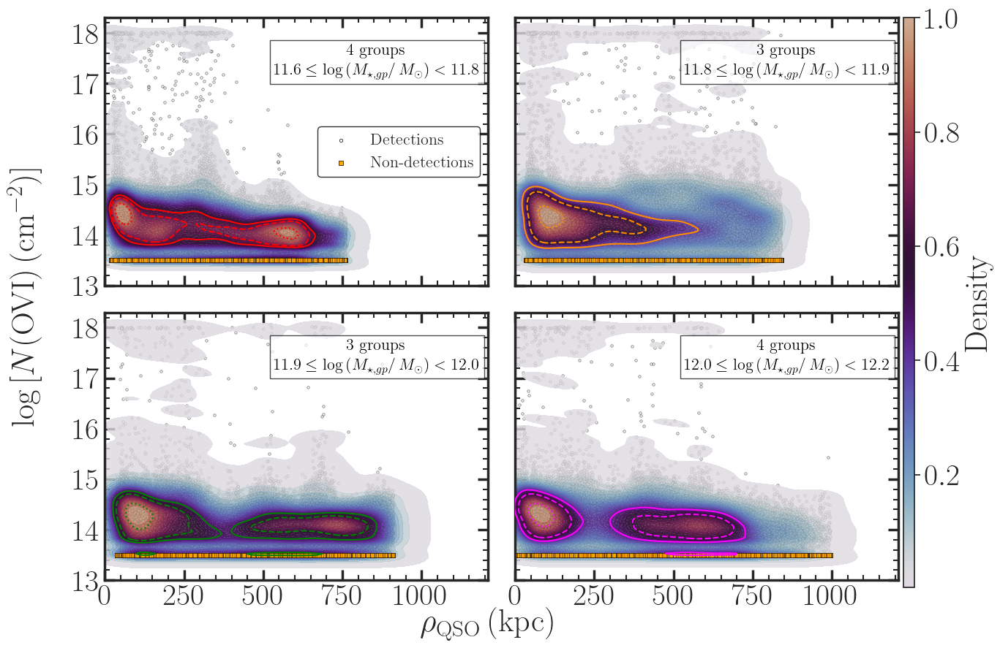

In [181]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
import h5py

import matplotlib.ticker as ticker
import matplotlib.colors as mcolors
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.ticker import AutoMinorLocator
import matplotlib.cm as cm
import matplotlib.patches as mpatches


# ---------------------------
# PATHS AND CONSTANTS
# ---------------------------
base_dir = '../../Grad School/MgII_TNG_Project/Primary Project/Trident Codes/TNG_50_z_0.1_groups/revised_final'
halo_file_path = '../TNG50_fitting_results/TNG_halos.txt'
#fitting_dir = '../TNG50_fitting_results/fitting_combined_features_grp_only'
fitting_dir = '../TNG50_fitting_results/v_2500_data_filtered_v800_combined_gal_removed'
full_sample_path = '../COS_IGrM_Data/Sample_full.txt'
plotting_data_path = '../COS_IGrM_Data/Plotting_data_subset.txt'

plt.rcParams['text.usetex'] = True
plt.rcParams['text.latex.preamble'] = r'\usepackage{amsmath}'

z = 0.09940180263022191   # Redshift
a = 1 / (1 + z)           # Scale factor
h = 0.6774                # Hubble parameter
box_size = 35000          # Simulation box size

# ---------------------------
# MAPPING & UPDATED BIN DEFINITIONS
# ---------------------------
# Mapping from original group IDs to sequential indices (0 to 13).
grp_index_to_group_mapping = {
    7: 0, 8: 1, 9: 2, 10: 3, 11: 4, 12: 5, 13: 6, 15: 7,
    17: 8, 18: 9, 19: 10, 20: 11, 22: 12, 24: 13
}

# Updated bins based on quantile-based edges:
# Bin edges: [11.5953, 11.8402, 11.93235, 12.041775, 12.1665]
bins_definition = {
    1: [19, 20, 22, 24],
    2: [13, 17, 18],
    3: [11, 12, 15],
    4: [7, 8, 9, 10]
}
bin_ranges = {
    1: (11.5953, 11.8402),
    2: (11.8402, 11.93235),
    3: (11.93235, 12.041775),
    4: (12.041775, 12.1665)
}

# Colors for KDE contours for each bin.
sim_colors = {1: "red", 2: "darkorange", 3: "green", 4: "magenta"}

# ---------------------------
# INITIALIZE DATA STRUCTURE FOR SIMULATION RESULTS
# ---------------------------
# For each bin, we store:
#   'impact': impact parameters for detections,
#   'n_ovi': corresponding log N(OVI) for detections,
#   'impact_nd': impact parameters for non-detections.
bin_data = {b: {'impact': [], 'n_ovi': [], 'impact_nd': []} for b in bins_definition.keys()}

# ---------------------------
# HELPER FUNCTION FOR CYCLIC CORRECTION
# ---------------------------
def apply_cyclic_condition(ray_coord, center_coord, box_size):
    diff = np.abs(center_coord - ray_coord)
    if diff > box_size / 2:
        if center_coord > ray_coord:
            center_coord -= box_size
        else:
            center_coord += box_size
    return center_coord

# ---------------------------
# LOAD HALO GROUP DATA
# ---------------------------
halo_data = pd.read_csv(halo_file_path, sep='|', skipinitialspace=True)
halo_data.columns = halo_data.columns.str.strip()
# Set sequential index (0 to 13) for the 14 groups.
halo_data.index = np.arange(len(halo_data))
halo_data['GroupPos_x'] = pd.to_numeric(halo_data['GroupPos_x(𝑐𝑘𝑝𝑐/ℎ)'], errors='coerce')
halo_data['GroupPos_y'] = pd.to_numeric(halo_data['GroupPos_y(𝑐𝑘𝑝𝑐/ℎ)'], errors='coerce')

# ---------------------------
# ACCUMULATE SIMULATION DATA PER BIN
# ---------------------------
all_groups = sorted(sum(list(bins_definition.values()), []))
for orig_group in all_groups:
    if orig_group not in grp_index_to_group_mapping:
        print(f"Original group {orig_group} not in mapping. Skipping.")
        continue
    seq_index = grp_index_to_group_mapping[orig_group]
    if seq_index >= len(halo_data):
        print(f"Sequential index {seq_index} for group {orig_group} exceeds halo_data length.")
        continue
    group_row = halo_data.loc[seq_index]
    center_x, center_y = group_row[['GroupPos_x', 'GroupPos_y']]
    
    file_group_number = grp_index_to_group_mapping[orig_group]
    ray_file = os.path.join(base_dir, f"integral_TNG50-1_z0.1_n300d2-sample_localized_OVInumdens_{file_group_number}-of-14.hdf5")
    if not os.path.exists(ray_file):
        print(f"File not found: {ray_file}")
        continue
    with h5py.File(ray_file, 'r') as f:
        ray_positions = f['ray_pos'][:]  # shape: (num_rays, 3)
    
    corrected_center_x = np.array([apply_cyclic_condition(rx, center_x, box_size) for rx in ray_positions[:, 0]])
    corrected_center_y = np.array([apply_cyclic_condition(ry, center_y, box_size) for ry in ray_positions[:, 1]])
    rho = np.sqrt((ray_positions[:, 0] - corrected_center_x)**2 +
                  (ray_positions[:, 1] - corrected_center_y)**2)
    
    fitting_file = os.path.join(fitting_dir, f"group_{file_group_number}_combined_features.txt")
    if not os.path.exists(fitting_file):
        print(f"Fitting file not found: {fitting_file}")
        continue
    fitting_data = pd.read_csv(fitting_file, sep='|', skipinitialspace=True)
    fitting_data.columns = fitting_data.columns.str.strip()
    
    detected_data = fitting_data[~fitting_data['dN'].isna()]
    non_detected_data = fitting_data[fitting_data['dN'].isna()]
    
    bin_num = None
    for b, group_list in bins_definition.items():
        if orig_group in group_list:
            bin_num = b
            break
    if bin_num is None:
        continue
    
    for sightline_id, log_n in zip(detected_data['Sightline'], detected_data['N']):
        bin_data[bin_num]['impact'].append(rho[sightline_id])
        bin_data[bin_num]['n_ovi'].append(log_n)
    for sightline_id in non_detected_data['Sightline']:
        bin_data[bin_num]['impact_nd'].append(rho[sightline_id])

# For non-detections, assign constant log N(OVI)
for b in bin_data:
    bin_data[b]['n_ovi_nd'] = [13.5] * len(bin_data[b]['impact_nd'])
    bin_data[b]['impact'] = np.array(bin_data[b]['impact']) / h * a
    bin_data[b]['impact_nd'] = np.array(bin_data[b]['impact_nd']) / h * a
    bin_data[b]['n_ovi'] = np.array(bin_data[b]['n_ovi'])

# ---------------------------
# LOAD OBSERVATIONAL DATA (COS-IGrM) -- Remove subset distinction.
# ---------------------------
full_sample_df = pd.read_csv(full_sample_path, sep='\s+', comment='#', engine='python')
plotting_data_df = pd.read_csv(plotting_data_path, sep='\s+', comment='#', engine='python')
full_sample_df.columns = full_sample_df.columns.str.strip()
plotting_data_df.columns = plotting_data_df.columns.str.strip()
merged_df = None
if 'Group' in full_sample_df.columns and 'Group' in plotting_data_df.columns:
    merged_df = pd.merge(full_sample_df, plotting_data_df, on='Group')
    merged_df['Impact_Param'] = merged_df['QSO_Rho(kpc)']

# ---------------------------
# PLOTTING: 2x2 SUBPLOTS, COMMON AXES, ZERO SPACE, COMMON LABELS
# ---------------------------
fig, axs = plt.subplots(2, 2, figsize=(14, 10), sharex=True, sharey=True)
axs = axs.flatten()

for i, bin_num in enumerate(sorted(bin_data.keys())):
    ax = axs[i]
    data = bin_data[bin_num]
    
    # Plot simulation detections scatter.
    ax.scatter(
        data['impact'], data['n_ovi'], color='white', s=6, alpha=0.6,
        edgecolor='black', linewidth=0.5, marker='o', zorder=0, label='Detections'
    )
    # Plot simulation non-detections scatter.
    ax.scatter(
        data['impact_nd'], data['n_ovi_nd'], color='orange', s=13, alpha=0.6,
        edgecolor='black', linewidth=0.5, marker='s', zorder=3, label='Non-detections'
    )
    
    # Plot filled KDE contours using the "twilight" cmap.
    kde = sns.kdeplot(
        x=data['impact'], y=data['n_ovi'], fill=True,
        cmap=twilight_trunc, levels=40, thresh=0.002, alpha=0.8,
        ax=ax, rasterized=True, zorder=2
    )
    # Overplot contour lines at levels [0.5, 0.68, 0.95] with bin-specific color.
    sns.kdeplot(
        x=data['impact'], y=data['n_ovi'], levels=[0.5, 0.68, 0.95],
        color=sim_colors[bin_num], linewidths=1.5,
        ax=ax, linestyles=["solid", "dashed", "dotted"], zorder=3
    )

    # # Overlay observational data (COS-IGrM) in springgreen.
    # if merged_df is not None:
    #     for _, row in merged_df.iterrows():
    #         if row['N_OVI_err_low'] == 0.25 or row['N_OVI_err_high'] == 0.25:
    #             ax.errorbar(row['Impact_Param'], row['N_OVI'],
    #                         yerr=[[row['N_OVI_err_low']], [0]], fmt='o', markersize=12,
    #                         markerfacecolor='springgreen', markeredgecolor='black', ecolor='black',
    #                         capsize=5, alpha=0.9, zorder=4)
    #             ax.annotate('', xy=(row['Impact_Param'], row['N_OVI'] - row['N_OVI_err_low']),
    #                         xytext=(row['Impact_Param'], row['N_OVI']),
    #                         arrowprops=dict(facecolor='springgreen', shrink=0.05, width=1,
    #                                         headwidth=7, headlength=8, edgecolor='black'),
    #                         zorder=4)
    #         else:
    #             ax.errorbar(row['Impact_Param'], row['N_OVI'],
    #                         yerr=[[row['N_OVI_err_low']], [row['N_OVI_err_high']]], fmt='o', markersize=12,
    #                         markerfacecolor='springgreen', markeredgecolor='black', ecolor='black',
    #                         capsize=4, alpha=0.9, zorder=4)
    
    # For subplot 0, add a full legend and annotation text.
    if i == 0:
        # Create custom legend handles.
        det_handle = ax.scatter([], [], color='white', s=10, edgecolor='black', linewidth=0.5, marker='o', label='Detections')
        nd_handle = ax.scatter([], [], color='orange', s=13, edgecolor='black', linewidth=0.5, marker='s', label='Non-detections')
        cos_handle = plt.Line2D([], [], marker='o', color='none', markerfacecolor='springgreen', markeredgecolor='black', markersize=10, label=r'COS-IGrM')       
        #handles = [det_handle, nd_handle, cos_handle]
        handles = [det_handle, nd_handle]
        ax.legend(handles=handles, loc='center right', fontsize=16,
                   frameon = True, edgecolor = 'black')
        num_groups = len(bins_definition[bin_num])
        low_edge, high_edge = bin_ranges[bin_num]
        annot_text = rf"$\begin{{array}}{{c}}{num_groups}\ \text{{groups}}\\ {low_edge:.1f}\le \log\left(M_{{\star, gp}}/\,M_{{\odot}}\right) < {high_edge:.1f}\end{{array}}$"
        ax.text(0.98, 0.90, annot_text, transform=ax.transAxes,
                horizontalalignment='right', verticalalignment='top',
                fontsize=16, color='black', bbox=dict(facecolor='white', alpha=0.7, edgecolor='black'))
    else:
        num_groups = len(bins_definition[bin_num])
        low_edge, high_edge = bin_ranges[bin_num]
        annot_text = rf"$\begin{{array}}{{c}}{num_groups}\ \text{{groups}}\\ {low_edge:.1f}\le \log\left(M_{{\star, gp}}/\,M_{{\odot}}\right) < {high_edge:.1f}\end{{array}}$"
        ax.text(0.98, 0.90, annot_text, transform=ax.transAxes,
                horizontalalignment='right', verticalalignment='top',
                fontsize=16, color='black', bbox=dict(facecolor='white', alpha=0.7, edgecolor='black'))
    
    # Set fixed x and y limits.
    ax.set_xlim(-1, 1210)
    ax.set_ylim(13.2, 18.3)
    # Set x and y ticks.
    ax.set_xticks([0, 250, 500, 750, 1000])
    ax.set_yticks([13, 14, 15, 16, 17, 18])
    ax.xaxis.set_minor_locator(AutoMinorLocator())
    ax.yaxis.set_minor_locator(AutoMinorLocator())
    ax.tick_params(axis='both', which='major', direction='in', length=10, width=2.5, top=True, right=True)
    ax.tick_params(axis='both', which='minor', direction='in', length=5, width=1.5, top=True, right=True)
    ax.spines['top'].set_linewidth(2.5)
    ax.spines['right'].set_linewidth(2.5)
    ax.spines['bottom'].set_linewidth(2.5)
    ax.spines['left'].set_linewidth(2.5)
    ax.set_title("")

# Set common x and y labels.
fig.text(0.5, 0.04, r'$\rho_\mathrm{QSO}\, (\mathrm{kpc})$', ha='center', fontsize=32)
fig.text(0.03, 0.5, r'$\log\,[N(\mathrm{OVI})\, (\mathrm{cm^{-2}})]$', va='center', rotation='vertical', fontsize=32)

# After the subplot loop, create a common colorbar for all subplots.
# Adjust vmin and vmax to suit the actual density range from your KDE plot.
# cbar_ax = fig.add_axes([0.99, 0.12, 0.015, 0.85])  # [left, bottom, width, height] in figure coordinates
cbar_ax = fig.add_axes([0.905, 0.10, 0.011, 0.78])  # [left, bottom, width, height] in figure coordinates

sm = plt.cm.ScalarMappable(cmap=twilight_trunc, norm=plt.Normalize(vmin=0.002, vmax=1.0))
sm.set_array([])  # Only needed for older matplotlib versions.
fig.colorbar(sm, cax=cbar_ax, label='Density', ticks=[0.0, 0.2, 0.4, 0.6, 0.8, 1.0])
cbar.ax.set_yticks([0.0, 0.2, 0.4, 0.6, 0.8, 1.0])
cbar.ax.tick_params(labelsize=13)
cbar.set_label('Density', fontsize=13)

# Show x tick labels only on bottom row and y tick labels only on left.
for ax in axs:
    ax.label_outer()

# plt.subplots_adjust(wspace=-0.1, hspace=-0.1)
# # plt.subplots_adjust(left=0.06, right=0.98, top=0.98, bottom=0.06, wspace=0, hspace=0)
# plt.tight_layout(rect=[0.06, 0.06, 1, 1])
plt.subplots_adjust(wspace=0.07, hspace=0.1)
plt.savefig('../TNG50_fitting_results/Plots_gal_removed_new/logN_vs_rho_with_cyclic_stellar_mass_binned.png', dpi=400)
plt.show()

/Users/wavefunction/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines/igrm/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/wavefunction/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines/igrm/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/wavefunction/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines/igrm/lib/python3.11/site-packages/seaborn/distributions.py:1185: UserWarning: The following kwargs were not used by contour: 'rasterized'
  cset = contour_func(
/Users/wavefunction/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines/igrm/lib/python3.11/site-packages/seaborn

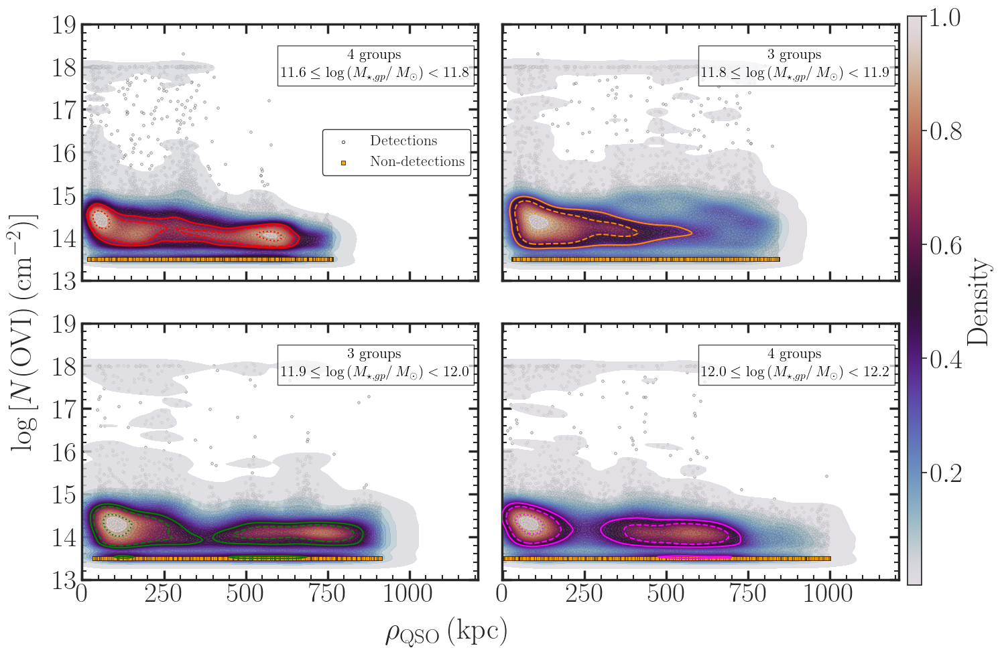

In [182]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
import h5py
import matplotlib.ticker as ticker
import matplotlib.colors as mcolors
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.ticker import AutoMinorLocator
import matplotlib.cm as cm
import matplotlib.patches as mpatches

# ---------------------------
# PATHS AND CONSTANTS
# ---------------------------
base_dir = '../../Grad School/MgII_TNG_Project/Primary Project/Trident Codes/TNG_50_z_0.1_groups/revised_final'
halo_file_path = '../TNG50_fitting_results/TNG_halos.txt'
#fitting_dir = '../TNG50_fitting_results/fitting_combined_features_grp_only'
fitting_dir = '../TNG50_fitting_results/v_2500_data_filtered_v800_combined_gal_removed'

full_sample_path = '../COS_IGrM_Data/Sample_full.txt'
plotting_data_path = '../COS_IGrM_Data/Plotting_data_subset.txt'

z = 0.09940180263022191   # Redshift
a = 1 / (1 + z)           # Scale factor
h = 0.6774                # Hubble parameter
box_size = 35000          # Simulation box size

# ---------------------------
# MAPPING & UPDATED BIN DEFINITIONS
# ---------------------------
# Mapping from original group IDs to sequential indices (0 to 13).
grp_index_to_group_mapping = {
    7: 0, 8: 1, 9: 2, 10: 3, 11: 4, 12: 5, 13: 6, 15: 7,
    17: 8, 18: 9, 19: 10, 20: 11, 22: 12, 24: 13
}

# Updated bins based on quantile-based edges:
# Bin edges: [11.5953, 11.8402, 11.93235, 12.041775, 12.1665]
bins_definition = {
    1: [19, 20, 22, 24],
    2: [13, 17, 18],
    3: [11, 12, 15],
    4: [7, 8, 9, 10]
}
bin_ranges = {
    1: (11.5953, 11.8402),
    2: (11.8402, 11.93235),
    3: (11.93235, 12.041775),
    4: (12.041775, 12.1665)
}

# Colors for KDE contours for each bin.
sim_colors = {1: "red", 2: "darkorange", 3: "green", 4: "magenta"}

# ---------------------------
# INITIALIZE DATA STRUCTURE FOR SIMULATION RESULTS
# ---------------------------
# For each bin, we store:
#   'impact': impact parameters for detections,
#   'n_ovi': corresponding log N(OVI) for detections,
#   'impact_nd': impact parameters for non-detections.
bin_data = {b: {'impact': [], 'n_ovi': [], 'impact_nd': []} for b in bins_definition.keys()}

# ---------------------------
# HELPER FUNCTION FOR CYCLIC CORRECTION
# ---------------------------
def apply_cyclic_condition(ray_coord, center_coord, box_size):
    diff = np.abs(center_coord - ray_coord)
    if diff > box_size / 2:
        if center_coord > ray_coord:
            center_coord -= box_size
        else:
            center_coord += box_size
    return center_coord

# ---------------------------
# LOAD HALO GROUP DATA
# ---------------------------
halo_data = pd.read_csv(halo_file_path, sep='|', skipinitialspace=True)
halo_data.columns = halo_data.columns.str.strip()
# Set sequential index (0 to 13) for the 14 groups.
halo_data.index = np.arange(len(halo_data))
halo_data['GroupPos_x'] = pd.to_numeric(halo_data['GroupPos_x(𝑐𝑘𝑝𝑐/ℎ)'], errors='coerce')
halo_data['GroupPos_y'] = pd.to_numeric(halo_data['GroupPos_y(𝑐𝑘𝑝𝑐/ℎ)'], errors='coerce')

# ---------------------------
# ACCUMULATE SIMULATION DATA PER BIN
# ---------------------------
all_groups = sorted(sum(list(bins_definition.values()), []))
for orig_group in all_groups:
    if orig_group not in grp_index_to_group_mapping:
        print(f"Original group {orig_group} not in mapping. Skipping.")
        continue
    seq_index = grp_index_to_group_mapping[orig_group]
    if seq_index >= len(halo_data):
        print(f"Sequential index {seq_index} for group {orig_group} exceeds halo_data length.")
        continue
    group_row = halo_data.loc[seq_index]
    center_x, center_y = group_row[['GroupPos_x', 'GroupPos_y']]
    
    file_group_number = grp_index_to_group_mapping[orig_group]
    ray_file = os.path.join(base_dir, f"integral_TNG50-1_z0.1_n300d2-sample_localized_OVInumdens_{file_group_number}-of-14.hdf5")
    if not os.path.exists(ray_file):
        print(f"File not found: {ray_file}")
        continue
    with h5py.File(ray_file, 'r') as f:
        ray_positions = f['ray_pos'][:]  # shape: (num_rays, 3)
    
    corrected_center_x = np.array([apply_cyclic_condition(rx, center_x, box_size) for rx in ray_positions[:, 0]])
    corrected_center_y = np.array([apply_cyclic_condition(ry, center_y, box_size) for ry in ray_positions[:, 1]])
    rho = np.sqrt((ray_positions[:, 0] - corrected_center_x)**2 +
                  (ray_positions[:, 1] - corrected_center_y)**2)
    
    fitting_file = os.path.join(fitting_dir, f"group_{file_group_number}_combined_features.txt")
    if not os.path.exists(fitting_file):
        print(f"Fitting file not found: {fitting_file}")
        continue
    fitting_data = pd.read_csv(fitting_file, sep='|', skipinitialspace=True)
    fitting_data.columns = fitting_data.columns.str.strip()
    
    detected_data = fitting_data[~fitting_data['dN'].isna()]
    non_detected_data = fitting_data[fitting_data['dN'].isna()]
    
    bin_num = None
    for b, group_list in bins_definition.items():
        if orig_group in group_list:
            bin_num = b
            break
    if bin_num is None:
        continue
    
    for sightline_id, log_n in zip(detected_data['Sightline'], detected_data['N']):
        bin_data[bin_num]['impact'].append(rho[sightline_id])
        bin_data[bin_num]['n_ovi'].append(log_n)
    for sightline_id in non_detected_data['Sightline']:
        bin_data[bin_num]['impact_nd'].append(rho[sightline_id])

# For non-detections, assign constant log N(OVI)
for b in bin_data:
    bin_data[b]['n_ovi_nd'] = [13.5] * len(bin_data[b]['impact_nd'])
    bin_data[b]['impact'] = np.array(bin_data[b]['impact']) / h * a
    bin_data[b]['impact_nd'] = np.array(bin_data[b]['impact_nd']) / h * a
    bin_data[b]['n_ovi'] = np.array(bin_data[b]['n_ovi'])

# ---------------------------
# LOAD OBSERVATIONAL DATA (COS-IGrM) -- Remove subset distinction.
# ---------------------------
full_sample_df = pd.read_csv(full_sample_path, sep='\s+', comment='#', engine='python')
plotting_data_df = pd.read_csv(plotting_data_path, sep='\s+', comment='#', engine='python')
full_sample_df.columns = full_sample_df.columns.str.strip()
plotting_data_df.columns = plotting_data_df.columns.str.strip()
merged_df = None
if 'Group' in full_sample_df.columns and 'Group' in plotting_data_df.columns:
    merged_df = pd.merge(full_sample_df, plotting_data_df, on='Group')
    merged_df['Impact_Param'] = merged_df['QSO_Rho(kpc)']

# ---------------------------
# PLOTTING: 2x2 SUBPLOTS, COMMON AXES, ZERO SPACE, COMMON LABELS
# ---------------------------
fig, axs = plt.subplots(2, 2, figsize=(14, 10), sharex=True, sharey=True)
axs = axs.flatten()

for i, bin_num in enumerate(sorted(bin_data.keys())):
    ax = axs[i]
    data = bin_data[bin_num]
    
    # Plot simulation detections scatter.
    ax.scatter(
        data['impact'], data['n_ovi'], color='white', s=6, alpha=0.6,
        edgecolor='black', linewidth=0.5, marker='o', zorder=0, label='Detections'
    )
    # Plot simulation non-detections scatter.
    ax.scatter(
        data['impact_nd'], data['n_ovi_nd'], color='orange', s=13, alpha=0.6,
        edgecolor='black', linewidth=0.5, marker='s', zorder=3, label='Non-detections'
    )
    
    # Plot filled KDE contours using the "twilight" cmap.
    kde = sns.kdeplot(
        x=data['impact'], y=data['n_ovi'], fill=True,
        cmap="twilight", levels=40, thresh=0.002, alpha=0.8,
        ax=ax, rasterized=True, zorder=2
    )
    # Overplot contour lines at levels [0.5, 0.68, 0.95] with bin-specific color.
    sns.kdeplot(
        x=data['impact'], y=data['n_ovi'], levels=[0.5, 0.68, 0.95],
        color=sim_colors[bin_num], linewidths=1.5,
        ax=ax, linestyles=["solid", "dashed", "dotted"], zorder=3
    )
    
    # # Overlay observational data (COS-IGrM) in springgreen.
    # if merged_df is not None:
    #     for _, row in merged_df.iterrows():
    #         if row['N_OVI_err_low'] == 0.25 or row['N_OVI_err_high'] == 0.25:
    #             ax.errorbar(row['Impact_Param'], row['N_OVI'],
    #                         yerr=[[row['N_OVI_err_low']], [0]], fmt='o', markersize=12,
    #                         markerfacecolor='springgreen', markeredgecolor='black', ecolor='black',
    #                         capsize=5, alpha=0.9, zorder=4)
    #             ax.annotate('', xy=(row['Impact_Param'], row['N_OVI'] - row['N_OVI_err_low']),
    #                         xytext=(row['Impact_Param'], row['N_OVI']),
    #                         arrowprops=dict(facecolor='springgreen', shrink=0.05, width=1,
    #                                         headwidth=7, headlength=8, edgecolor='black'),
    #                         zorder=4)
    #         else:
    #             ax.errorbar(row['Impact_Param'], row['N_OVI'],
    #                         yerr=[[row['N_OVI_err_low']], [row['N_OVI_err_high']]], fmt='o', markersize=12,
    #                         markerfacecolor='springgreen', markeredgecolor='black', ecolor='black',
    #                         capsize=4, alpha=0.9, zorder=4)
    
    # For subplot 0, add a full legend and annotation text.
    if i == 0:
        # Create custom legend handles.
        det_handle = ax.scatter([], [], color='white', s=10, edgecolor='black', linewidth=0.5, marker='o', label='Detections')
        nd_handle = ax.scatter([], [], color='orange', s=13, edgecolor='black', linewidth=0.5, marker='s', label='Non-detections')
        cos_handle = plt.Line2D([], [], marker='o', color='none', markerfacecolor='springgreen', markeredgecolor='black', markersize=10, label=r'COS-IGrM')       
        #handles = [det_handle, nd_handle, cos_handle]
        handles = [det_handle, nd_handle]
        ax.legend(handles=handles, loc='center right', fontsize=16,
                   frameon = True, edgecolor = 'black')
        num_groups = len(bins_definition[bin_num])
        low_edge, high_edge = bin_ranges[bin_num]
        annot_text = rf"$\begin{{array}}{{c}}{num_groups}\ \text{{groups}}\\ {low_edge:.1f}\le \log\left(M_{{\star, gp}}/\,M_{{\odot}}\right) < {high_edge:.1f}\end{{array}}$"
        ax.text(0.98, 0.90, annot_text, transform=ax.transAxes,
                horizontalalignment='right', verticalalignment='top',
                fontsize=16, color='black', bbox=dict(facecolor='white', alpha=0.7, edgecolor='black'))
    else:
        num_groups = len(bins_definition[bin_num])
        low_edge, high_edge = bin_ranges[bin_num]
        annot_text = rf"$\begin{{array}}{{c}}{num_groups}\ \text{{groups}}\\ {low_edge:.1f}\le \log\left(M_{{\star, gp}}/\,M_{{\odot}}\right) < {high_edge:.1f}\end{{array}}$"
        ax.text(0.98, 0.90, annot_text, transform=ax.transAxes,
                horizontalalignment='right', verticalalignment='top',
                fontsize=16, color='black', bbox=dict(facecolor='white', alpha=0.7, edgecolor='black'))
    
    # Set fixed x and y limits.
    ax.set_xlim(-1, 1210)
    ax.set_ylim(13.2, 18.3)
    # Set x and y ticks.
    ax.set_xticks([0, 250, 500, 750, 1000])
    ax.set_yticks([13, 14, 15, 16, 17, 18,19])
    ax.xaxis.set_minor_locator(AutoMinorLocator())
    ax.yaxis.set_minor_locator(AutoMinorLocator())
    ax.tick_params(axis='both', which='major', direction='in', length=10, width=2.5, top=True, right=True)
    ax.tick_params(axis='both', which='minor', direction='in', length=5, width=1.5, top=True, right=True)
    ax.spines['top'].set_linewidth(2.5)
    ax.spines['right'].set_linewidth(2.5)
    ax.spines['bottom'].set_linewidth(2.5)
    ax.spines['left'].set_linewidth(2.5)
    ax.set_title("")


# After the subplot loop, create a common colorbar for all subplots.
# Adjust vmin and vmax to suit the actual density range from your KDE plot.
cbar_ax = fig.add_axes([0.99, 0.12, 0.015, 0.85])  # [left, bottom, width, height] in figure coordinates

sm = plt.cm.ScalarMappable(cmap="twilight", norm=plt.Normalize(vmin=0.002, vmax=1.0))
sm.set_array([])  # Only needed for older matplotlib versions.
fig.colorbar(sm, cax=cbar_ax, label='Density', ticks=[0.0, 0.2, 0.4, 0.6, 0.8, 1.0])
cbar.ax.set_yticks([0.0, 0.2, 0.4, 0.6, 0.8, 1.0])
cbar.ax.tick_params(labelsize=13)
cbar.set_label('Density', fontsize=13)

# Set common x and y labels.
fig.text(0.5, 0.04, r'$\rho_\mathrm{QSO}\, (\mathrm{kpc})$', ha='center', fontsize=32)
fig.text(0.03, 0.5, r'$\log\,[N(\mathrm{OVI})\, (\mathrm{cm^{-2}})]$', va='center', rotation='vertical', fontsize=32)

# Show x tick labels only on bottom row and y tick labels only on left.
for ax in axs:
    ax.label_outer()

plt.subplots_adjust(wspace=-0.1, hspace=-0.1)
# plt.subplots_adjust(left=0.06, right=0.98, top=0.98, bottom=0.06, wspace=0, hspace=0)
plt.tight_layout(rect=[0.06, 0.06, 1, 1])
plt.savefig('../TNG50_fitting_results/Plots_gal_removed_new/logN_vs_rho_with_cyclic_stellar_mass_binned.png', dpi=400)
plt.show()

In [183]:
# Compute the fraction of detections with log N(OVI) > 15
n_detections_total = len(n_ovi_detections)  # Total number of detected absorbers
n_detections_above_15 = np.sum(n_ovi_detections > 15)  # Number of detected absorbers with log N(OVI) > 15

fraction_above_15 = n_detections_above_15 / n_detections_total if n_detections_total > 0 else 0

print(f"Total number of detected absorbers: {n_detections_total}")
print(f"Number of detected absorbers with log N(OVI) > 15: {n_detections_above_15}")
# Print the fraction
print(f"Fraction of detected absorbers with log N(OVI) > 15: {fraction_above_15:.4f}")

Total number of detected absorbers: 247750
Number of detected absorbers with log N(OVI) > 15: 5676
Fraction of detected absorbers with log N(OVI) > 15: 0.0229


100%|██████████| 14/14 [00:26<00:00,  1.89s/it]
/Users/wavefunction/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines/igrm/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/wavefunction/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines/igrm/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/wavefunction/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines/igrm/lib/python3.11/site-packages/seaborn/distributions.py:1185: UserWarning: The following kwargs were not used by contour: 'rasterized'
  cset = contour_func(
/Users/wavefunction/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sigh

Unique values in full_sample_df['group']: ['J0841+1406' 'J1017+4702' 'J1020+1003' 'J1025+4808' 'J1102+0521'
 'J1126+1204' 'J1127+2654' 'J1216+0712' 'J1301+2819' 'J1339+5355'
 'J1343+2538' 'J1344+5546' 'J1348+4303' 'J1408+5657' 'J1424+4214'
 'J1426+1955' 'J1428+3225' 'J1617+0854']
Unique values in plotting_data_df['group']: ['J0841+1406' 'J1017+4702' 'J1020+1003' 'J1025+4808' 'J1102+0521'
 'J1126+1204' 'J1127+2654' 'J1216+0712' 'J1301+2819' 'J1339+5355'
 'J1343+2538' 'J1344+5546' 'J1348+4303' 'J1408+5657' 'J1424+4214'
 'J1426+1955' 'J1428+3225' 'J1617+0854']
Unique values in merged_df['subset']: ['C' 'I']
Number of rows in merged_df: 18
Columns in observed_ssfr_data: Index(['sSFR', 'N_ovi', 'sSFR_lim', 'N_lim', 'N_OVI', 'N_OVI_err_low',
       'N_OVI_err_high', 'Subset'],
      dtype='object')
float64
Columns in merged_df: Index(['sightline', 'group', 'ra_gp', 'decl_gp', 'z_gp', 'ra_qso', 'decl_qso',
       'z_qso', 'n_gp', 'σ_tago', 'rvir_tago', 'ρ_qso', 'log[m_halo]', 'rvir',
       '

/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_52070/3767826558.py:227: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  observed_ssfr_data = pd.read_csv(observed_ssfr_data_path, delim_whitespace=True, comment='#')


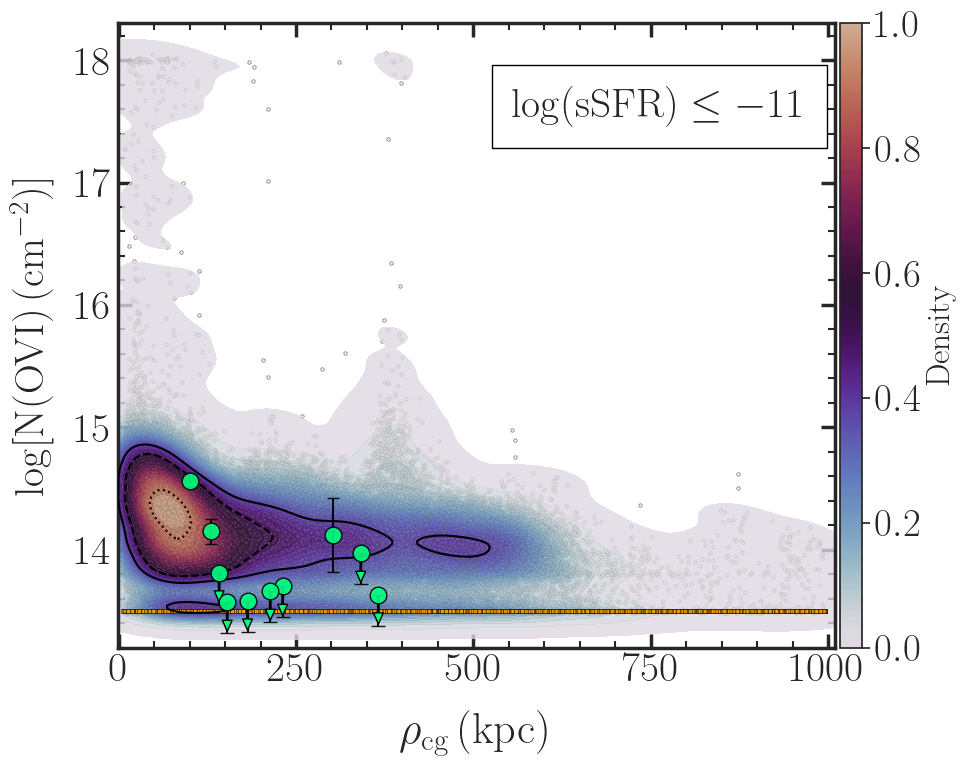

In [185]:
#!/usr/bin/env python3
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
import h5py
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.colors as mcolors
import matplotlib.cm as cm
from matplotlib.ticker import AutoMinorLocator
from matplotlib.lines import Line2D

# ---------------------------
# Paths and Constants
# ---------------------------
base_dir = '../../Grad School/MgII_TNG_Project/Primary Project/Trident Codes/TNG_50_z_0.1_groups/revised_final'
halo_file_path = '../TNG50_fitting_results/TNG_halos.txt'
# fitting_dir = '../TNG50_fitting_results/fitting_combined_features_grp_only_800'
fitting_dir = '../TNG50_fitting_results/v_2500_data_filtered_v800_combined_gal_removed'
galaxy_cat_dir = '../TNG50_fitting_results/galaxy_cats'
full_sample_path = '../COS_IGrM_Data/Group_Sightline_Data.txt'
plotting_data_path = '../COS_IGrM_Data/Plotting_data_subset.txt'

z = 0.1                    # Redshift
a = 1 / (1 + z)            # Scale factor
h = 0.6774                 # Hubble parameter
box_size = 35000           # Simulation box size

# Map group index to sequential group numbering
grp_index_to_group_mapping = {
    7: 0, 8: 1, 9: 2, 10: 3, 11: 4, 12: 5, 13: 6, 15: 7,
    17: 8, 18: 9, 19: 10, 20: 11, 22: 12, 24: 13
}

# ---------------------------
# Load Halo Data
# ---------------------------
halo_data = pd.read_csv(halo_file_path, sep='|', skipinitialspace=True)
halo_data.columns = halo_data.columns.str.strip()
halo_data['GroupPos_x'] = pd.to_numeric(halo_data['GroupPos_x(𝑐𝑘𝑝𝑐/ℎ)'], errors='coerce')
halo_data['GroupPos_y'] = pd.to_numeric(halo_data['GroupPos_x(𝑐𝑘𝑝𝑐/ℎ)'], errors='coerce')

# ---------------------------
# Helper Function: Cyclic Correction
# ---------------------------
def apply_cyclic_condition(ray_coord, galaxy_coord, box_size):
    diff = np.abs(galaxy_coord - ray_coord)
    if diff > box_size / 2:
        if galaxy_coord > ray_coord:
            galaxy_coord -= box_size
        else:
            galaxy_coord += box_size
    return galaxy_coord

# ---------------------------
# Initialize Arrays for Simulation Results
# ---------------------------
impact_params_detections = []
n_ovi_detections = []
log_ssfr_values = []  # log10(sSFR) for the nearest galaxy for each detection

impact_params_non_detections = []
n_ovi_non_detections = []
log_ssfr_values_non_detections = []  # for non-detections

# ---------------------------
# Loop Through Groups and Process Data
# ---------------------------
for grp_index in tqdm(grp_index_to_group_mapping.keys()):
    group_number = grp_index_to_group_mapping[grp_index]

    # Load ray data
    ray_file = os.path.join(base_dir, f"integral_TNG50-1_z0.1_n300d2-sample_localized_OVInumdens_{group_number}-of-14.hdf5")
    if not os.path.exists(ray_file):
        print(f"File not found: {ray_file}")
        continue
    with h5py.File(ray_file, 'r') as f:
        ray_positions = f['ray_pos'][:]

    # Load fitting results
    fitting_file = os.path.join(fitting_dir, f"group_{group_number}_combined_features.txt")
    if not os.path.exists(fitting_file):
        print(f"File not found: {fitting_file}")
        continue
    fitting_data = pd.read_csv(fitting_file, sep='|', skipinitialspace=True)
    fitting_data.columns = fitting_data.columns.str.strip()
    detected_data = fitting_data[~fitting_data['dN'].isna()]
    non_detected_data = fitting_data[fitting_data['dN'].isna()]

    # Load galaxy catalog
    galaxy_file = os.path.join(galaxy_cat_dir, f"group_{grp_index}_galaxy_catalog_converted.txt")
    if not os.path.exists(galaxy_file):
        print(f"Galaxy catalog not found: {galaxy_file}")
        continue
    galaxy_data = pd.read_csv(galaxy_file, sep='|', skipinitialspace=True)
    galaxy_data.columns = galaxy_data.columns.str.strip()
    galaxy_positions = galaxy_data[['SubhaloPos_0', 'SubhaloPos_1']].values
    galaxy_sfr = galaxy_data['SubhaloSFR'].values
    galaxy_stellar_mass = galaxy_data['SubhaloMassType_4'].values  # in 10^10 M_sun/h
    galaxy_stellar_mass_physical = galaxy_stellar_mass * 1e10 / h  # in physical M_sun

    # Process detections: nearest galaxy sSFR and impact parameter
    for sightline_id, log_n in zip(detected_data['Sightline'], detected_data['N']):
        ray_x, ray_y = ray_positions[sightline_id, :2]
        corrected_positions = np.array([
            [apply_cyclic_condition(ray_x, gx, box_size), apply_cyclic_condition(ray_y, gy, box_size)]
            for gx, gy in galaxy_positions
        ])
        distances = np.sqrt((corrected_positions[:, 0] - ray_x)**2 + (corrected_positions[:, 1] - ray_y)**2)
        nearest_distance = np.min(distances) * a / h  # in kpc
        nearest_idx = np.argmin(distances)
        nearest_sfr = galaxy_sfr[nearest_idx]
        nearest_mass = galaxy_stellar_mass_physical[nearest_idx]
        if nearest_mass > 0:
            ssfr = nearest_sfr / nearest_mass
            log_ssfr = np.log10(ssfr) if ssfr > 0 else -np.inf
            impact_params_detections.append(nearest_distance)
            n_ovi_detections.append(log_n)
            log_ssfr_values.append(log_ssfr)

    # Process non-detections similarly
    for sightline_id, log_n in zip(non_detected_data['Sightline'], non_detected_data['N']):
        ray_x, ray_y = ray_positions[sightline_id, :2]
        corrected_positions = np.array([
            [apply_cyclic_condition(ray_x, gx, box_size), apply_cyclic_condition(ray_y, gy, box_size)]
            for gx, gy in galaxy_positions
        ])
        distances = np.sqrt((corrected_positions[:, 0] - ray_x)**2 + (corrected_positions[:, 1] - ray_y)**2)
        nearest_distance = np.min(distances) * a / h  # in kpc
        nearest_idx = np.argmin(distances)
        nearest_sfr = galaxy_sfr[nearest_idx]
        nearest_mass = galaxy_stellar_mass_physical[nearest_idx]
        if nearest_mass > 0:
            ssfr = nearest_sfr / nearest_mass
            log_ssfr = np.log10(ssfr) if ssfr > 0 else -np.inf
            impact_params_non_detections.append(nearest_distance)
            log_ssfr_values_non_detections.append(log_ssfr)
            n_ovi_non_detections.append(log_n)
    # For non-detections, force N(OVI) to a constant (e.g., 13.5)
    n_ovi_non_detections = [13.5] * len(log_ssfr_values_non_detections)

# Convert results to numpy arrays
impact_params_detections = np.array(impact_params_detections)
n_ovi_detections = np.array(n_ovi_detections)
log_ssfr_values = np.array(log_ssfr_values)

impact_params_non_detections = np.array(impact_params_non_detections)
n_ovi_non_detections = np.array(n_ovi_non_detections)
log_ssfr_values_non_detections = np.array(log_ssfr_values_non_detections)

# ---------------------------
# Filter: Keep only detections with log(sSFR) > -11
# ---------------------------
mask_det = log_ssfr_values <= -11
mask_non_det = log_ssfr_values_non_detections <= -11

impact_params_detections = impact_params_detections[mask_det]
n_ovi_detections = n_ovi_detections[mask_det]
log_ssfr_values = log_ssfr_values[mask_det]

impact_params_non_detections = impact_params_non_detections[mask_non_det]
n_ovi_non_detections = n_ovi_non_detections[mask_non_det]
log_ssfr_values_non_detections = log_ssfr_values_non_detections[mask_non_det]

# ---------------------------
# Plot: N(OVI) vs. Impact Parameter for absorbers with log(sSFR) > -11
# ---------------------------
fig, ax = plt.subplots(figsize=(10, 8))

# Scatter plot for detections
ax.scatter(
    impact_params_detections, n_ovi_detections,
    color='white', s=6, alpha=0.6,
    edgecolor='black', linewidth=0.5,
    marker='o', label='Detections', zorder=0
)

# Scatter plot for non-detections
ax.scatter(
    impact_params_non_detections, n_ovi_non_detections,
    color='orange', s=8, alpha=0.6,
    edgecolor='black', linewidth=0.5,
    marker='s', label='Non-detections', zorder=3
)

# KDE plot for detections
kde = sns.kdeplot(
    x=impact_params_detections, y=n_ovi_detections, fill=True,
    cmap=twilight_trunc, levels=40, thresh=0.002, alpha=0.8, ax=ax, rasterized=True, zorder=2
)
sns.kdeplot(
    x=impact_params_detections, y=n_ovi_detections, levels=[0.5, 0.68, 0.95],
    color="black", linewidths=1.5, ax=ax, linestyles=["solid", "dashed", "dotted"], zorder=3
)

# Add Colorbar for KDE
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="3%", pad=0.05)
kde_min, kde_max = kde.collections[0].get_clim()
norm = mcolors.Normalize(vmin=kde_min, vmax=kde_max)
sm = cm.ScalarMappable(cmap=twilight_trunc, norm=norm)
sm.set_array([])
cbar = fig.colorbar(sm, cax=cax, orientation="vertical")
cbar.set_label(r'$\mathrm{Density}$', fontsize=24)
cbar.ax.tick_params(labelsize=28)

# ---------------------------
# Overlay Observational Data (if available)
# ---------------------------
full_sample_df = pd.read_csv(full_sample_path, sep='|', comment='#', engine='python')
plotting_data_df = pd.read_csv(plotting_data_path, sep='\s+', comment='#', engine='python')
full_sample_df = full_sample_df.loc[:, ~full_sample_df.columns.str.contains('^unnamed', case=False)]
plotting_data_df = plotting_data_df.loc[:, ~plotting_data_df.columns.str.contains('^unnamed', case=False)]
full_sample_df.columns = full_sample_df.columns.str.strip().str.lower()
plotting_data_df.columns = plotting_data_df.columns.str.strip().str.lower()
full_sample_df['group'] = full_sample_df['group'].str.strip().str.upper()
plotting_data_df['group'] = plotting_data_df['group'].str.strip().str.upper()
print("Unique values in full_sample_df['group']:", full_sample_df['group'].unique())
print("Unique values in plotting_data_df['group']:", plotting_data_df['group'].unique())
merged_df = pd.merge(full_sample_df, plotting_data_df, on='group', how='inner')
print("Unique values in merged_df['subset']:", merged_df['subset'].unique())
print("Number of rows in merged_df:", len(merged_df))

observed_ssfr_data_path = '../COS_IGrM_Data/COS_Igrm_sfr_N.txt'
observed_ssfr_data = pd.read_csv(observed_ssfr_data_path, delim_whitespace=True, comment='#')
print("Columns in observed_ssfr_data:", observed_ssfr_data.columns)

# add the column 'sSFR' to the merged_df DataFrame using the observed_ssfr_data (
# dont match column values, just consider the row number and add 
merged_df['sSFR'] = observed_ssfr_data['sSFR']
print(merged_df['sSFR'].dtype)
merged_df['sSFR_lim'] = observed_ssfr_data['sSFR_lim']
merged_df['n_lim'] = observed_ssfr_data['N_lim']

print("Columns in merged_df:", merged_df.columns)   
print(merged_df.head(10))

# IMPORTANT: Check if the merged DataFrame contains the column 'sSFR'
if 'sSFR' not in merged_df.columns:
    print("ERROR: Column 'sSFR' not found in merged_df. Available columns:", merged_df.columns.tolist())
    # Optionally, you can rename an existing column to 'sSFR' here if needed.
else:
    #merged_df['sSFR'] = merged_df['sSFR'].str.strip()  # Normalize, if needed
    print("I was here")
    # Plot observational data
    x_err_right = 0.25
    x_err_left_detection = x_err_right / 2
    for idx, row in merged_df.iterrows():
        log_ssfr_obs = row['sSFR']
        n_ovi_obs = row['n_ovi']
        sSFR_lim = row['sSFR_lim']
        
        N_lim = row['n_lim']
        N_OVI_err_low = row['n_ovi_err_low']
        N_OVI_err_high = row['n_ovi_err_high']
        Subset = row['subset']
        marker_color = 'springgreen' if Subset == 'I' else 'springgreen'
        label = 'IGrM' if Subset == 'I' else 'CGM + IGrM'
        
        # proceed only if the log_ssfr_obs is <= -11
        if log_ssfr_obs <= -11:

            # plot the data
            if N_OVI_err_high == 0.25 or N_OVI_err_low == 0.25:
                ax.errorbar(row['impact_param_galaxy'], row['n_ovi'], 
                            yerr=[[row['n_ovi_err_low']], [0]], fmt='o', markersize=12, markerfacecolor=marker_color,
                            markeredgecolor='black', ecolor='black', capsize=5, alpha=0.9, zorder=4,
                            label=label if row.name == subset_df.index[0] else "")
                ax.annotate('', xy=(row['impact_param_galaxy'], row['n_ovi'] - row['n_ovi_err_low']),
                            xytext=(row['impact_param_galaxy'], row['n_ovi']),
                            arrowprops=dict(facecolor=marker_color, shrink=0.05, width=1, headwidth=7, headlength=8, edgecolor='black'), zorder=4)
            else:
                ax.errorbar(row['impact_param_galaxy'], row['n_ovi'], 
                            yerr=[[row['n_ovi_err_low']], [row['n_ovi_err_high']]], fmt='o', markersize=12,
                            markerfacecolor=marker_color, markeredgecolor='black', ecolor='black', capsize=4, alpha=0.9,
                            zorder=4, label=label if row.name == subset_df.index[0] else "")


        
        # ax.scatter(log_ssfr_obs, n_ovi_obs, marker='o', color=marker_color, edgecolor='black',
        #            s=150, zorder=3)
        # if (not sSFR_lim) and (not N_lim):
        #     horz_err = [[x_err_left_detection], [x_err_right]]
        #     ax.errorbar(log_ssfr_obs, n_ovi_obs, xerr=horz_err, fmt='none',
        #                 ecolor='black', capsize=5, zorder=3)
        #     ax.errorbar(log_ssfr_obs, n_ovi_obs,
        #                 yerr=[[N_OVI_err_low], [N_OVI_err_high]], fmt='none',
        #                 ecolor='black', capsize=4, zorder=3)
        #     print('Case 1')
        # elif sSFR_lim and (not N_lim):
        #     ax.errorbar(log_ssfr_obs, n_ovi_obs,
        #                 yerr=[[N_OVI_err_low], [N_OVI_err_high]], fmt='none',
        #                 ecolor='black', capsize=4, zorder=3)
        #     ax.annotate('',
        #                 xy=(log_ssfr_obs - x_err_right, n_ovi_obs),
        #                 xytext=(log_ssfr_obs, n_ovi_obs),
        #                 arrowprops=dict(facecolor='black', arrowstyle='-|>',
        #                                 lw=1, alpha=1, edgecolor='black'),
        #                 zorder=3)
        #     print('Case 2')
        # elif (not sSFR_lim) and N_lim:
        #     horz_err = [[x_err_left_detection], [x_err_right]]
        #     ax.errorbar(log_ssfr_obs, n_ovi_obs, xerr=horz_err, fmt='none',
        #                 ecolor='black', capsize=5, zorder=3)
        #     ax.annotate('',
        #                 xy=(log_ssfr_obs, n_ovi_obs - 0.3),
        #                 xytext=(log_ssfr_obs, n_ovi_obs),
        #                 arrowprops=dict(facecolor='black', arrowstyle='-|>',
        #                                 lw=1, alpha=1, edgecolor='black'),
        #                 zorder=3)
        #     print('Case 3')
        # else:
        #     ax.annotate('',
        #                 xy=(log_ssfr_obs - x_err_right, n_ovi_obs),
        #                 xytext=(log_ssfr_obs, n_ovi_obs),
        #                 arrowprops=dict(facecolor='black', arrowstyle='-|>',
        #                                 lw=1, alpha=1, edgecolor='black'),
        #                 zorder=3)
        #     ax.annotate('',
        #                 xy=(log_ssfr_obs, n_ovi_obs - 0.3),
        #                 xytext=(log_ssfr_obs, n_ovi_obs),
        #                 arrowprops=dict(facecolor='black', arrowstyle='-|>',
        #                                 lw=1, alpha=1, edgecolor='black'),
        #                 zorder=3)
        #     print('Case 4')
        # print('---')

# ---------------------------
# Axis Labels, Limits, and Ticks
# ---------------------------
ax.set_xlabel(r'$\rho_\mathrm{cg} \, (\mathrm{kpc})$', fontsize=32, labelpad=15)
ax.set_ylabel(r'$\log[\mathrm{N(OVI)} \, (\mathrm{cm^{-2}})]$', fontsize=30, labelpad=15)
ax.set_xlim(-1, 1010)
ax.set_ylim(13.2, 18.3)
ax.tick_params(axis='both', which='major', direction='in', width=2, length=7)
ax.spines['top'].set_linewidth(2.5)
ax.spines['right'].set_linewidth(2.5)
ax.spines['bottom'].set_linewidth(2.5)
ax.spines['left'].set_linewidth(2.5)
ax.tick_params(axis='both', which='major', direction='in', length=10, width=2.5, top=True, right=True)
ax.tick_params(axis='both', which='minor', direction='in', length=5, width=1.5, top=True, right=True)
ax.xaxis.set_minor_locator(AutoMinorLocator())
ax.yaxis.set_minor_locator(AutoMinorLocator())

legend_elements = [
    Line2D([0], [0], marker='o', color='springgreen', label='IGrM', markersize=12,
           markeredgecolor='black', linestyle='none'),
    Line2D([0], [0], marker='o', color='cyan', label='CGM + IGrM', markersize=12,
           markeredgecolor='black', linestyle='none'),
    Line2D([0], [0], marker='o', color='white', label='Detections', markersize=5,
           markeredgecolor='black', linestyle='none', alpha=0.6),
    Line2D([0], [0], marker='s', color='orange', label='Non-detections', markersize=6,
           markeredgecolor='black', linestyle='none', alpha=0.6)
]

# ax.legend(handles=legend_elements, frameon=True, framealpha=1, edgecolor='black',
#           fancybox=False, shadow=False, borderpad=0.25, borderaxespad=0.2,
#           handletextpad=0.25, fontsize=18, loc='upper right')

# write a text box insetad of legend showing in mathtype log(sSFR) <= -11
ax.text(0.55, 0.85, r'$\log(\mathrm{sSFR}) \leq -11$', fontsize
        =30, transform=ax.transAxes, bbox=dict(facecolor='white', edgecolor='black', boxstyle='square,pad=0.5'))

plt.tight_layout()
output_dir = '../TNG50_fitting_results/Plots_gal_removed_new'
if not os.path.exists(output_dir):
    os.makedirs(output_dir)
plt.savefig(os.path.join(output_dir, 'N_OVI_vs_Impact_Param_obs_le_11.png'), dpi=200)
plt.show()

##### Calculation of $\log(N)<15$ for the code above

In [186]:
#!/usr/bin/env python3
import os
import numpy as np
import pandas as pd
import h5py
from tqdm import tqdm

# ---------------------------
# Paths and Constants
# ---------------------------
base_dir = '../../Grad School/MgII_TNG_Project/Primary Project/Trident Codes/TNG_50_z_0.1_groups/revised_final'
halo_file_path = '../TNG50_fitting_results/TNG_halos.txt'
# fitting_dir = '../TNG50_fitting_results/fitting_combined_features_grp_only_800'
fitting_dir = '../TNG50_fitting_results/v_2500_data_filtered_v800_combined_gal_removed'

galaxy_cat_dir = '../TNG50_fitting_results/galaxy_cats'

z = 0.1
a = 1 / (1 + z)
h = 0.6774
box_size = 35000

# Group index mapping
grp_index_to_group_mapping = {
    7: 0, 8: 1, 9: 2, 10: 3, 11: 4, 12: 5, 13: 6, 15: 7,
    17: 8, 18: 9, 19: 10, 20: 11, 22: 12, 24: 13
}

# ---------------------------
# Helper Function
# ---------------------------
def apply_cyclic_condition(ray_coord, galaxy_coord, box_size):
    diff = np.abs(galaxy_coord - ray_coord)
    if diff > box_size / 2:
        if galaxy_coord > ray_coord:
            galaxy_coord -= box_size
        else:
            galaxy_coord += box_size
    return galaxy_coord

# ---------------------------
# Load Halo Data
# ---------------------------
halo_data = pd.read_csv(halo_file_path, sep='|', skipinitialspace=True)
halo_data.columns = halo_data.columns.str.strip()
halo_data['GroupPos_x'] = pd.to_numeric(halo_data['GroupPos_x(𝑐𝑘𝑝𝑐/ℎ)'], errors='coerce')
halo_data['GroupPos_y'] = pd.to_numeric(halo_data['GroupPos_x(𝑐𝑘𝑝𝑐/ℎ)'], errors='coerce')

# ---------------------------
# Initialize Arrays
# ---------------------------
n_ovi_detections = []
log_ssfr_values = []

# ---------------------------
# Loop Through Groups
# ---------------------------
for grp_index in tqdm(grp_index_to_group_mapping.keys()):
    group_number = grp_index_to_group_mapping[grp_index]

    # Load ray positions
    ray_file = os.path.join(base_dir, f"integral_TNG50-1_z0.1_n300d2-sample_localized_OVInumdens_{group_number}-of-14.hdf5")
    if not os.path.exists(ray_file):
        continue
    with h5py.File(ray_file, 'r') as f:
        ray_positions = f['ray_pos'][:]

    # Load fitting results
    fitting_file = os.path.join(fitting_dir, f"group_{group_number}_combined_features.txt")
    if not os.path.exists(fitting_file):
        continue
    fitting_data = pd.read_csv(fitting_file, sep='|', skipinitialspace=True)
    fitting_data.columns = fitting_data.columns.str.strip()
    detected_data = fitting_data[~fitting_data['dN'].isna()]

    # Load galaxy catalog
    galaxy_file = os.path.join(galaxy_cat_dir, f"group_{grp_index}_galaxy_catalog_converted.txt")
    if not os.path.exists(galaxy_file):
        continue
    galaxy_data = pd.read_csv(galaxy_file, sep='|', skipinitialspace=True)
    galaxy_data.columns = galaxy_data.columns.str.strip()
    galaxy_positions = galaxy_data[['SubhaloPos_0', 'SubhaloPos_1']].values
    galaxy_sfr = galaxy_data['SubhaloSFR'].values
    galaxy_stellar_mass = galaxy_data['SubhaloMassType_4'].values
    galaxy_stellar_mass_physical = galaxy_stellar_mass * 1e10 / h

    # Loop through detections
    for sightline_id, log_n in zip(detected_data['Sightline'], detected_data['N']):
        ray_x, ray_y = ray_positions[sightline_id, :2]
        corrected_positions = np.array([
            [apply_cyclic_condition(ray_x, gx, box_size), apply_cyclic_condition(ray_y, gy, box_size)]
            for gx, gy in galaxy_positions
        ])
        distances = np.sqrt((corrected_positions[:, 0] - ray_x)**2 + (corrected_positions[:, 1] - ray_y)**2)
        nearest_idx = np.argmin(distances)
        nearest_sfr = galaxy_sfr[nearest_idx]
        nearest_mass = galaxy_stellar_mass_physical[nearest_idx]

        if nearest_mass > 0:
            ssfr = nearest_sfr / nearest_mass
            log_ssfr = np.log10(ssfr) if ssfr > 0 else -np.inf

            if log_ssfr <= -11:
                n_ovi_detections.append(log_n)
                log_ssfr_values.append(log_ssfr)

# ---------------------------
# Calculate the Fraction logN(OVI) < 15
# ---------------------------
n_ovi_detections = np.array(n_ovi_detections)
total_detections = len(n_ovi_detections)
below_15 = np.sum(n_ovi_detections < 15)

fraction_below_15 = below_15 / total_detections if total_detections > 0 else np.nan

print("--------------------------------------------------")
print(f"Total detections with log(sSFR) ≤ -11 : {total_detections}")
print(f"Number with log N(OVI) < 15          : {below_15}")
print(f"Fraction with log N(OVI) < 15        : {fraction_below_15:.4f}")
print("--------------------------------------------------")

100%|██████████| 14/14 [00:06<00:00,  2.00it/s]

--------------------------------------------------
Total detections with log(sSFR) ≤ -11 : 42049
Number with log N(OVI) < 15          : 41478
Fraction with log N(OVI) < 15        : 0.9864
--------------------------------------------------


In [34]:
# Compute the fraction of detections with log N(OVI) > 15
n_detections_total = len(n_ovi_detections)  # Total number of detected absorbers
n_detections_above_15 = np.sum(n_ovi_detections > 15)  # Number of detected absorbers with log N(OVI) > 15

fraction_above_15 = n_detections_above_15 / n_detections_total if n_detections_total > 0 else 0
print(f"Total number of detected absorbers: {n_detections_total}")
print(f"Number of detected absorbers with log N(OVI) > 15: {n_detections_above_15}")
# Print the fraction
print(f"Fraction of detected absorbers with log N(OVI) > 15: {fraction_above_15:.4f}")

Total number of detected absorbers: 42049
Number of detected absorbers with log N(OVI) > 15: 2572
Fraction of detected absorbers with log N(OVI) > 15: 0.0612


In [ ]:
Total number of detected absorbers: 40499
Number of detected absorbers with log N(OVI) > 15: 318

In [ ]:
Total number of detected absorbers: 198565
Number of detected absorbers with log N(OVI) > 15: 3208
Fraction of detected absorbers with log N(OVI) > 15: 0.0162

##### Calculating the fraction of ssfr<-11 and ssfr>-11 for logN<15 abs

In [35]:
#!/usr/bin/env python3
import os
import numpy as np
import pandas as pd
import h5py
from tqdm import tqdm

# ---------------------------
# Paths and Constants
# ---------------------------
base_dir = '../../Grad School/MgII_TNG_Project/Primary Project/Trident Codes/TNG_50_z_0.1_groups/revised_final'
halo_file_path = '../TNG50_fitting_results/TNG_halos.txt'
# fitting_dir = '../TNG50_fitting_results/fitting_combined_features_grp_only_800'
fitting_dir = '../TNG50_fitting_results/v_2500_data_filtered_v800_combined_gal_removed'
galaxy_cat_dir = '../TNG50_fitting_results/galaxy_cats'

z = 0.1
a = 1 / (1 + z)
h = 0.6774
box_size = 35000

# Mapping from group index to sequential ID
grp_index_to_group_mapping = {
    7: 0, 8: 1, 9: 2, 10: 3, 11: 4, 12: 5, 13: 6, 15: 7,
    17: 8, 18: 9, 19: 10, 20: 11, 22: 12, 24: 13
}

# ---------------------------
# Helper Function
# ---------------------------
def apply_cyclic_condition(ray_coord, galaxy_coord, box_size):
    diff = np.abs(galaxy_coord - ray_coord)
    if diff > box_size / 2:
        if galaxy_coord > ray_coord:
            galaxy_coord -= box_size
        else:
            galaxy_coord += box_size
    return galaxy_coord

# ---------------------------
# Initialize storage
# ---------------------------
logN_less_than_15 = []
log_ssfr_all = []

# ---------------------------
# Main Loop
# ---------------------------
for grp_index in tqdm(grp_index_to_group_mapping.keys()):
    group_number = grp_index_to_group_mapping[grp_index]

    ray_file = os.path.join(base_dir, f"integral_TNG50-1_z0.1_n300d2-sample_localized_OVInumdens_{group_number}-of-14.hdf5")
    if not os.path.exists(ray_file):
        continue
    with h5py.File(ray_file, 'r') as f:
        ray_positions = f['ray_pos'][:]

    fitting_file = os.path.join(fitting_dir, f"group_{group_number}_combined_features.txt")
    if not os.path.exists(fitting_file):
        continue
    fitting_data = pd.read_csv(fitting_file, sep='|', skipinitialspace=True)
    fitting_data.columns = fitting_data.columns.str.strip()
    detected_data = fitting_data[~fitting_data['dN'].isna()]

    galaxy_file = os.path.join(galaxy_cat_dir, f"group_{grp_index}_galaxy_catalog_converted.txt")
    if not os.path.exists(galaxy_file):
        continue
    galaxy_data = pd.read_csv(galaxy_file, sep='|', skipinitialspace=True)
    galaxy_data.columns = galaxy_data.columns.str.strip()
    galaxy_positions = galaxy_data[['SubhaloPos_0', 'SubhaloPos_1']].values
    galaxy_sfr = galaxy_data['SubhaloSFR'].values
    galaxy_stellar_mass = galaxy_data['SubhaloMassType_4'].values
    galaxy_stellar_mass_physical = galaxy_stellar_mass * 1e10 / h

    for sightline_id, log_n in zip(detected_data['Sightline'], detected_data['N']):
        ray_x, ray_y = ray_positions[sightline_id, :2]

        corrected_positions = np.array([
            [apply_cyclic_condition(ray_x, gx, box_size), apply_cyclic_condition(ray_y, gy, box_size)]
            for gx, gy in galaxy_positions
        ])
        distances = np.sqrt((corrected_positions[:, 0] - ray_x)**2 + (corrected_positions[:, 1] - ray_y)**2)
        nearest_idx = np.argmin(distances)

        nearest_sfr = galaxy_sfr[nearest_idx]
        nearest_mass = galaxy_stellar_mass_physical[nearest_idx]

        if nearest_mass > 0:
            ssfr = nearest_sfr / nearest_mass
            log_ssfr = np.log10(ssfr) if ssfr > 0 else -np.inf

            if log_n < 15:
                logN_less_than_15.append(log_n)
                log_ssfr_all.append(log_ssfr)

# ---------------------------
# Classification and Fraction Calculation
# ---------------------------
logN_less_than_15 = np.array(logN_less_than_15)
log_ssfr_all = np.array(log_ssfr_all)

total = len(logN_less_than_15)
low_ssfr = np.sum(log_ssfr_all <= -11)
high_ssfr = np.sum(log_ssfr_all > -11)

frac_low = low_ssfr / total if total > 0 else np.nan
frac_high = high_ssfr / total if total > 0 else np.nan

# ---------------------------
# Output
# ---------------------------
print("\n=========== Summary ===========")
print(f"Total detections with log N(OVI) < 15 : {total}")
print(f"  → In log(sSFR) ≤ -11 bin           : {low_ssfr} ({frac_low:.4f})")
print(f"  → In log(sSFR) >  -11 bin          : {high_ssfr} ({frac_high:.4f})")
print("================================\n")

100%|██████████| 14/14 [00:07<00:00,  1.99it/s]


=========== Summary ===========
Total detections with log N(OVI) < 15 : 227747
  → In log(sSFR) ≤ -11 bin           : 39476 (0.1733)
  → In log(sSFR) >  -11 bin          : 188271 (0.8267)



100%|██████████| 14/14 [00:23<00:00,  1.65s/it]
/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_52070/1404348777.py:170: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  observed_ssfr_data = pd.read_csv(observed_ssfr_data_path, delim_whitespace=True, comment='#')
/Users/wavefunction/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines/igrm/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/wavefunction/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines/igrm/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mo

      sSFR   N_ovi  sSFR_lim  N_lim             N_OVI  N_OVI_err_low  \
0  -12.562  14.150      True  False  14lindusdust_.15           0.10   
1  -10.571  14.030     False  False             14.03           0.22   
2  -10.625  14.131     False   True             14.13           0.00   
3  -11.557  13.570      True   True             13.57           0.00   
4  -11.488  13.630     False   True             13.63           0.00   
5  -11.192  13.578     False   True             13.58           0.00   
6  -11.197  14.561     False  False             14.56           0.05   
7  -12.148  14.116      True  False             14.12           0.30   
8   -9.953  14.160     False  False             14.16           0.14   
9   -9.869  13.845     False   True             13.80           0.00   
10 -10.216  13.600     False  False             13.60           0.11   
11 -12.039  13.806      True   True             13.81           0.00   
12 -11.729  13.702     False   True             13.70           

/Users/wavefunction/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines/igrm/lib/python3.11/site-packages/seaborn/distributions.py:1185: UserWarning: The following kwargs were not used by contour: 'rasterized'
  cset = contour_func(
/Users/wavefunction/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines/igrm/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/wavefunction/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines/igrm/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


case 2
---
case 1
---
case 3
---
case 4
Value of N and sSFR: 13.57 -11.557
---
case 3
---
case 3
---
case 1
---
case 2
---
case 1
---
case 3
---
case 1
---
case 4
Value of N and sSFR: 13.806 -12.039
---
case 3
---
case 3
---
case 1
---
case 3
---
case 1
---
case 3
---


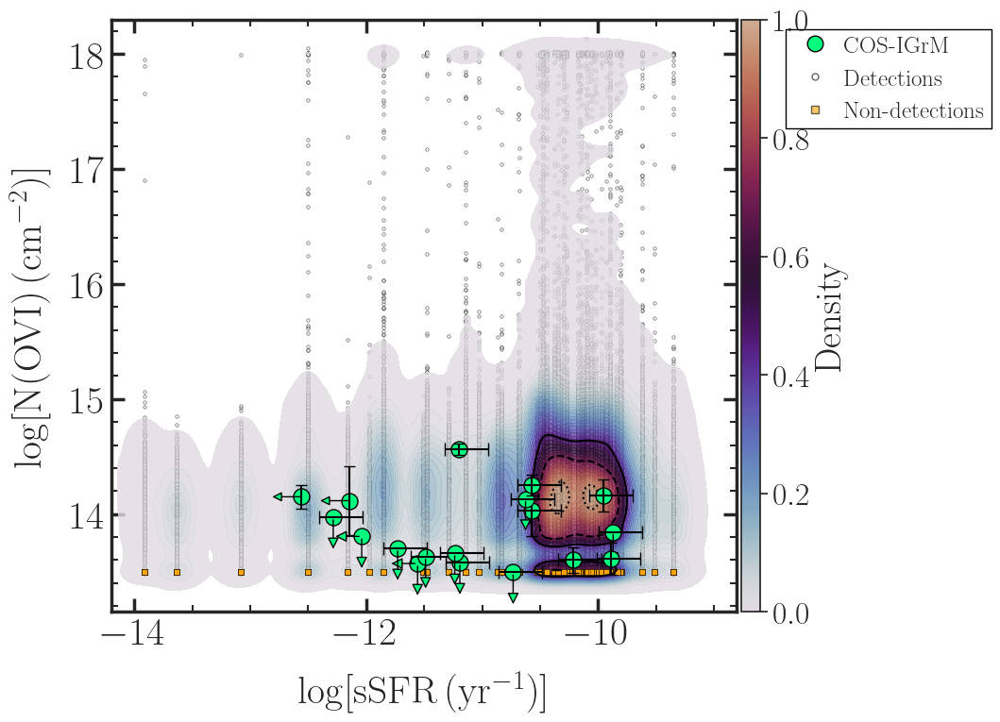

In [187]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
import h5py

# Paths
base_dir = '../../Grad School/MgII_TNG_Project/Primary Project/Trident Codes/TNG_50_z_0.1_groups/revised_final'
halo_file_path = '../TNG50_fitting_results/TNG_halos.txt'
# fitting_dir = '../TNG50_fitting_results/fitting_combined_features_grp_only_800'
fitting_dir = '../TNG50_fitting_results/v_2500_data_filtered_v800_combined_gal_removed'
galaxy_cat_dir = '../TNG50_fitting_results/galaxy_cats'
observed_ssfr_data_path = '../COS_IGrM_Data/COS_Igrm_sfr_N.txt'

# Constants
z = 0.1  # Redshift
a = 1 / (1 + z)  # Scale factor
h = 0.6774  # Hubble parameter
box_size = 35000  # Simulation box size

# Map group index to sequential group numbering
grp_index_to_group_mapping = {
    7: 0, 8: 1, 9: 2, 10: 3, 11: 4, 12: 5, 13: 6, 15: 7,
    17: 8, 18: 9, 19: 10, 20: 11, 22: 12, 24: 13
}

# Load the halo group data
halo_data = pd.read_csv(halo_file_path, sep='|', skipinitialspace=True)
halo_data.columns = halo_data.columns.str.strip()

# Extract relevant columns and convert to numeric
halo_data['GroupPos_x'] = pd.to_numeric(halo_data['GroupPos_x(𝑐𝑘𝑝𝑐/ℎ)'], errors='coerce')
halo_data['GroupPos_y'] = pd.to_numeric(halo_data['GroupPos_x(𝑐𝑘𝑝𝑐/ℎ)'], errors='coerce')
halo_data['R_crit200'] = pd.to_numeric(halo_data['R_Crit200'], errors='coerce')  # Virial radius

# Helper function for cyclic correction
def apply_cyclic_condition(ray_coord, galaxy_coord, box_size):
    diff = np.abs(galaxy_coord - ray_coord)
    if diff > box_size / 2:
        if galaxy_coord > ray_coord:
            galaxy_coord -= box_size
        else:
            galaxy_coord += box_size
    return galaxy_coord

# Initialize arrays for results
log_ssfr_values = []
n_ovi_detections = []

log_ssfr_values_non_detections = []
n_ovi_non_detections = []

# Loop through all group files
for grp_index in tqdm(grp_index_to_group_mapping.keys()):  # Iterate over the available group indices
    # Map to sequential group numbering
    group_number = grp_index_to_group_mapping[grp_index]

    # Load the ray data for this group
    ray_file = os.path.join(base_dir, f"integral_TNG50-1_z0.1_n300d2-sample_localized_OVInumdens_{group_number}-of-14.hdf5")
    if not os.path.exists(ray_file):
        print(f"File not found: {ray_file}")
        continue

    # Read the ray positions from the HDF5 file
    with h5py.File(ray_file, 'r') as f:
        ray_positions = f['ray_pos'][:]  # Read the dataset as a NumPy array

    # Load the corresponding fitting results
    fitting_file = os.path.join(fitting_dir, f"group_{group_number}_combined_features.txt")
    if not os.path.exists(fitting_file):
        print(f"File not found: {fitting_file}")
        continue

    fitting_data = pd.read_csv(fitting_file, sep='|', skipinitialspace=True)
    fitting_data.columns = fitting_data.columns.str.strip()

    # Filter for detections only
    detected_data = fitting_data[~fitting_data['dN'].isna()]
    if detected_data.empty:
        continue

    non_detected_data = fitting_data[fitting_data['dN'].isna()]

    # Load the galaxy catalog for the group
    galaxy_file = os.path.join(galaxy_cat_dir, f"group_{grp_index}_galaxy_catalog_converted.txt")
    if not os.path.exists(galaxy_file):
        print(f"Galaxy catalog not found: {galaxy_file}")
        continue

    galaxy_data = pd.read_csv(galaxy_file, sep='|', skipinitialspace=True)
    galaxy_data.columns = galaxy_data.columns.str.strip()

    # Extract galaxy positions and stellar masses
    galaxy_positions = galaxy_data[['SubhaloPos_0', 'SubhaloPos_1']].values
    galaxy_sfr = galaxy_data['SubhaloSFR'].values
    galaxy_stellar_mass = galaxy_data['SubhaloMassType_4'].values  # Stellar mass in 10^10 M_sun/h

    # Convert stellar mass to physical units (M_sun)
    galaxy_stellar_mass_physical = galaxy_stellar_mass * 1e10 / h

    # Store the sSFR of the nearest galaxy for each sightline (detections)
    for sightline_id, log_n in zip(detected_data['Sightline'], detected_data['N']):
        ray_x, ray_y = ray_positions[sightline_id, :2]

        # Apply cyclic condition to galaxy positions
        corrected_positions = np.array([
            [apply_cyclic_condition(ray_x, gx, box_size), apply_cyclic_condition(ray_y, gy, box_size)]
            for gx, gy in galaxy_positions
        ])

        # Calculate distances to all galaxies in the group
        distances = np.sqrt((corrected_positions[:, 0] - ray_x) ** 2 + (corrected_positions[:, 1] - ray_y) ** 2)

        # Find the nearest neighbor
        nearest_idx = np.argmin(distances)
        nearest_sfr = galaxy_sfr[nearest_idx]
        nearest_mass = galaxy_stellar_mass_physical[nearest_idx]

        # Debug: Print nearest SFR and Stellar Mass
        #print(f"Group {grp_index}, Sightline {sightline_id}: Nearest SFR = {nearest_sfr}, Stellar Mass = {nearest_mass}")

        # Calculate specific star formation rate (sSFR)
        if nearest_mass > 0:
            ssfr = nearest_sfr / nearest_mass
            log_ssfr = np.log10(ssfr) if ssfr > 0 else -np.inf
            log_ssfr_values.append(log_ssfr)
            n_ovi_detections.append(log_n)

    # Store the sSFR of the nearest galaxy for each sightline (non-detections)
    for sightline_id, log_n in zip(non_detected_data['Sightline'], non_detected_data['N']):
        ray_x, ray_y = ray_positions[sightline_id, :2]

        # Apply cyclic condition to galaxy positions
        corrected_positions = np.array([
            [apply_cyclic_condition(ray_x, gx, box_size), apply_cyclic_condition(ray_y, gy, box_size)]
            for gx, gy in galaxy_positions
        ])

        # Calculate distances to all galaxies in the group
        distances = np.sqrt((corrected_positions[:, 0] - ray_x) ** 2 + (corrected_positions[:, 1] - ray_y) ** 2)

        # Find the nearest neighbor
        nearest_idx = np.argmin(distances)
        nearest_sfr = galaxy_sfr[nearest_idx]
        nearest_mass = galaxy_stellar_mass_physical[nearest_idx]

        # Debug: Print nearest SFR and Stellar Mass
        #print(f"Group {grp_index}, Sightline {sightline_id}: Nearest SFR = {nearest_sfr}, Stellar Mass = {nearest_mass}")

        # Calculate specific star formation rate (sSFR)
        if nearest_mass > 0:
            ssfr = nearest_sfr / nearest_mass
            log_ssfr = np.log10(ssfr) if ssfr > 0 else -np.inf
            log_ssfr_values_non_detections.append(log_ssfr)
            n_ovi_non_detections.append(log_n)

    # For non-detections, force N(OVI) to a constant (e.g., 13.5) if needed
    n_ovi_non_detections = [13.5] * len(log_ssfr_values_non_detections)

# Convert results to numpy arrays
log_ssfr_values = np.array(log_ssfr_values)
n_ovi_detections = np.array(n_ovi_detections)

log_ssfr_values_non_detections = np.array(log_ssfr_values_non_detections)
n_ovi_non_detections = np.array(n_ovi_non_detections)

# Load and overlay observational data
observed_ssfr_data = pd.read_csv(observed_ssfr_data_path, delim_whitespace=True, comment='#')
print(observed_ssfr_data)

# Prepare contour data (if needed)
log_ssfr_values_for_contour = np.array(log_ssfr_values)
n_ovi_for_contour = np.array(n_ovi_detections)

#Plot N(OVI) vs specific Star Formation Rate (sSFR)
fig, ax = plt.subplots(figsize=(11, 8))

# Scatter plot for simulation data
ax.scatter(log_ssfr_values, n_ovi_detections, color='white', s=6, alpha=0.6, edgecolor='black', 
           linewidth=0.5, marker='o', zorder=0, label='Sim. Detections')

ax.scatter(log_ssfr_values_non_detections, n_ovi_non_detections, color='orange', s=13, alpha=0.6, edgecolor='black',
           linewidth=0.5, marker='s', zorder=3, label='Sim. Non-detections')

# Overlay density contours using seaborn's kdeplot
kde = sns.kdeplot(
    x=log_ssfr_values, y=n_ovi_detections, fill=True,
    cmap=twilight_trunc, levels=40, thresh=0.002, alpha=0.8, ax=ax, rasterized=True, zorder=2
)
sns.kdeplot(
    x=log_ssfr_values, y=n_ovi_detections, levels=[0.5, 0.68, 0.95], color="black",
    linewidths=1.5, ax=ax, linestyles=["solid", "dashed", "dotted"], zorder=3
)


# **Add Colorbar for KDE**

# Create an axis for the colorbar
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="3%", pad=0.05)

kde_min, kde_max = kde.collections[0].get_clim()  # Get color limits from KDE

# Define normalization based on actual KDE density values
norm = mcolors.Normalize(vmin=kde_min, vmax=kde_max)
sm = cm.ScalarMappable(cmap=twilight_trunc, norm=norm)
sm.set_array([])  # Needed for colorbar

# Add Colorbar
cbar = fig.colorbar(sm, cax=cax, orientation="vertical")
cbar.set_label(r'$\mathrm{Density}$', fontsize=28)
cbar.ax.tick_params(labelsize=24)


# Fixed horizontal error parameters:
x_err_right = 0.25               # right-side horizontal error (constant)
x_err_left_detection = x_err_right / 2  # for detections: left error = 1/3 of right error

for idx, row in observed_ssfr_data.iterrows():
    log_ssfr_obs = row['sSFR']
    n_ovi_obs = row['N_ovi']
    sSFR_lim = row['sSFR_lim']
    N_lim = row['N_lim']
    N_OVI_err_low = row['N_OVI_err_low']
    N_OVI_err_high = row['N_OVI_err_high']
    Subset = row['Subset']
    # Decide marker color and label based on Subset
    if Subset == 'I':
        marker_color = 'springgreen'
        label = 'IGrM'
    else:  # Subset == 'C'
        marker_color = 'springgreen'
        label = 'CGM + IGrM'

    
    # Plot the scatter marker (color by subset, edge always black, size fixed to 150).
    ax.scatter(log_ssfr_obs, n_ovi_obs, marker='o', color=marker_color, edgecolor='black',
               s=150, zorder=3,)
    
    # Case 1: Detection (sSFR_lim False and N_lim False)
    if (not sSFR_lim) and (not N_lim):
        # Draw asymmetric horizontal errorbar.
        print('case 1')
        horz_err = [[x_err_left_detection], [x_err_right]]
        ax.errorbar(log_ssfr_obs, n_ovi_obs, xerr=horz_err, fmt='none',
                    ecolor='black', capsize=5, zorder=3,)
        # Draw full vertical errorbar.
        ax.errorbar(log_ssfr_obs, n_ovi_obs,
                    yerr=[[N_OVI_err_low], [N_OVI_err_high]], fmt='none',
                    ecolor='black', capsize=4, zorder=3)
    
    # Case 2: sSFR_lim True and N_lim False.
    elif sSFR_lim and (not N_lim):
        # Draw vertical errorbar as in detections.
        print('case 2')
        ax.errorbar(log_ssfr_obs, n_ovi_obs,
                    yerr=[[N_OVI_err_low], [N_OVI_err_high]], fmt='none',
                    ecolor='black', capsize=4, zorder=3)
        # Instead of horizontal errorbar, add a horizontal arrow pointing left.
        ax.annotate('',
                    xy=(log_ssfr_obs - x_err_right, n_ovi_obs),  # arrow tip: to the left
                    xytext=(log_ssfr_obs, n_ovi_obs),             # arrow tail: at the scatter point
                    arrowprops=dict(facecolor='springgreen', arrowstyle='-|>',
                                    lw=1, alpha=1, edgecolor='black',
                                    shrinkA=0, shrinkB=0, mutation_scale=15),
                    zorder=3)
    
    # Case 3: sSFR_lim False and N_lim True.
    elif (not sSFR_lim) and N_lim:
        print('case 3')
        # Draw horizontal errorbar as in detections.
        horz_err = [[x_err_left_detection], [x_err_right]]
        ax.errorbar(log_ssfr_obs, n_ovi_obs, xerr=horz_err, fmt='none',
                    ecolor='black', capsize=5, zorder=3)
        # Instead of full vertical errorbar, add a downward arrow.

        ax.annotate('',
                    xy=(log_ssfr_obs, n_ovi_obs - 0.3),  # arrow tip: downward by N_OVI_err_low
                    xytext=(log_ssfr_obs, n_ovi_obs),              # arrow tail: at the scatter point
                    arrowprops=dict(facecolor='springgreen', arrowstyle='-|>',
                                    lw=1, alpha=1, edgecolor='black',
                             ),
                    zorder=3)
    
    # Case 4: Both sSFR_lim and N_lim True.
    else:  # both True
        # Instead of errorbars, add both arrows:
        # Horizontal arrow pointing left.
        print('case 4')
        ax.annotate('',
                    xy=(log_ssfr_obs - x_err_right, n_ovi_obs),
                    xytext=(log_ssfr_obs, n_ovi_obs),
                    arrowprops=dict(facecolor='springgreen', arrowstyle='-|>',
                                    lw=1, alpha=1, edgecolor='black'),
                    zorder=3)
        # Vertical arrow pointing downward.
        print('Value of N and sSFR:', n_ovi_obs, log_ssfr_obs)
        ax.annotate('',
                    xy=(log_ssfr_obs, n_ovi_obs - 0.3),
                    xytext=(log_ssfr_obs, n_ovi_obs),
                    arrowprops=dict(facecolor='springgreen', arrowstyle='-|>',
                                    lw=1, alpha=1, edgecolor='black',
                                    ),
                    zorder=3)

    print('---')
        
# Axis labels and title
ax.set_xlabel(r'$\log[\mathrm{sSFR \, (yr^{-1})}]$', fontsize=30, labelpad=15)
ax.set_ylabel(r'$\log[\mathrm{N(OVI)} \, (\mathrm{cm^{-2}})]$', fontsize=30, labelpad=15)
# ax.set_title(r'N(OVI) vs. Specific Star Formation Rate (sSFR)', fontsize=28, pad=15)
ax.set_xlim(-14.2, -8.8)
ax.set_ylim(13.15, 18.3)
# Customize ticks and spines
ax.tick_params(axis='both', which='major', direction='in', width=2, length=7)
ax.spines['top'].set_linewidth(2.5)
ax.spines['right'].set_linewidth(2.5)
ax.spines['bottom'].set_linewidth(2.5)
ax.spines['left'].set_linewidth(2.5)

# Enable major and minor ticks on all four axes
ax.tick_params(axis='both', which='major', direction='in', length=10, width=2.5, top=True, right=True)
ax.tick_params(axis='both', which='minor', direction='in', length=5, width=1.5, top=True, right=True)

# Add minor tick locators for both x and y axes
ax.xaxis.set_minor_locator(AutoMinorLocator())  # Minor ticks for x-axis
ax.yaxis.set_minor_locator(AutoMinorLocator())  # Minor ticks for y-axis

from matplotlib.lines import Line2D

# legend_elements = [
#     Line2D(
#         [0], [0], marker='o', color='springgreen', label='IGrM', markersize=12,
#         markeredgecolor='black', linestyle='none'
#     ),  # IGrM marker
#     Line2D(
#         [0], [0], marker='o', color='cyan', label='CGM + IGrM', markersize=12,
#         markeredgecolor='black', linestyle='none'
#     ),  # CGM + IGrM marker
#     Line2D(
#         [0], [0], marker='o', color='white', label= 'Detections', markersize=5,
#         markeredgecolor='black', linestyle='none', alpha=0.6
#     ),  # Simulated detections
#     Line2D(
#         [0], [0], marker='s', color='orange', label='Non-detections', markersize=6,
#         markeredgecolor='black', linestyle='none', alpha=0.6
#     ),  # Simulated non-detections
# ]

legend_elements = [
    Line2D(
        [0], [0], marker='o', color='springgreen', label='COS-IGrM', markersize=12,
        markeredgecolor='black', linestyle='none'
    ),  # IGrM marker
    Line2D(
        [0], [0], marker='o', color='white', label= 'Detections', markersize=5,
        markeredgecolor='black', linestyle='none', alpha=0.6
    ),  # Simulated detections
    Line2D(
        [0], [0], marker='s', color='orange', label='Non-detections', markersize=6,
        markeredgecolor='black', linestyle='none', alpha=0.6
    ),  # Simulated non-detections
]





# Add the legend
ax.legend(
    handles=legend_elements,
    frameon=True,framealpha=1, edgecolor='black',loc = 'center left',bbox_to_anchor=(1.07, 0.9),
           fancybox=False, shadow=False, borderpad=0.25,borderaxespad=0.2, handletextpad=0.25, fontsize=18)

# # Update the legend
# handles, labels = ax.get_legend_handles_labels()
# by_label = dict(zip(labels, handles))
# ax.legend(by_label.values(), by_label.keys(), frameon=True,framealpha=1, edgecolor='black',loc = 'upper left',
#           fancybox=False, shadow=False, borderpad=0.25,borderaxespad=0.2, handletextpad=0.25, fontsize=18)
#ax.legend(by_label.values(), by_label.keys(), loc='best', fontsize=18, frameon=True)

plt.tight_layout()
output_dir = '../TNG50_fitting_results/Plots_gal_removed_new'
plt.savefig(os.path.join(output_dir, 'N_OVI_vs_sSFR_with_obs.png'), dpi=400)
plt.show()

In [188]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
import h5py

# Paths
base_dir = '../../Grad School/MgII_TNG_Project/Primary Project/Trident Codes/TNG_50_z_0.1_groups/revised_final'
halo_file_path = '../TNG50_fitting_results/TNG_halos.txt'
# fitting_dir = '../TNG50_fitting_results/fitting_combined_features_grp_only_800'
fitting_dir = '../TNG50_fitting_results/v_2500_data_filtered_v800_combined_gal_removed'
galaxy_cat_dir = '../TNG50_fitting_results/galaxy_cats'
observed_ssfr_data_path = '../COS_IGrM_Data/COS_Igrm_sfr_N.txt'

# Constants
z = 0.1                    # Redshift
a = 1 / (1 + z)            # Scale factor
h = 0.6774                 # Hubble parameter
box_size = 35000           # Simulation box size

# Mapping of group index to sequential group numbering
grp_index_to_group_mapping = {
    7: 0, 8: 1, 9: 2, 10: 3, 11: 4, 12: 5, 13: 6, 15: 7,
    17: 8, 18: 9, 19: 10, 20: 11, 22: 12, 24: 13
}

# Load the halo group data
halo_data = pd.read_csv(halo_file_path, sep='|', skipinitialspace=True)
halo_data.columns = halo_data.columns.str.strip()

# Convert relevant columns to numeric
halo_data['GroupPos_x'] = pd.to_numeric(halo_data['GroupPos_x(𝑐𝑘𝑝𝑐/ℎ)'], errors='coerce')
halo_data['GroupPos_y'] = pd.to_numeric(halo_data['GroupPos_x(𝑐𝑘𝑝𝑐/ℎ)'], errors='coerce')
halo_data['R_crit200'] = pd.to_numeric(halo_data['R_Crit200'], errors='coerce')  # Virial radius

# Helper function for cyclic correction
def apply_cyclic_condition(ray_coord, galaxy_coord, box_size):
    """Apply cyclic boundary correction for a periodic simulation box."""
    diff = np.abs(galaxy_coord - ray_coord)
    if diff > box_size / 2:
        if galaxy_coord > ray_coord:
            galaxy_coord -= box_size
        else:
            galaxy_coord += box_size
    return galaxy_coord

# Initialize arrays for results
log_ssfr_values = []          # For detections: log sSFR of the nearest galaxy (in log(yr^{-1}))
n_ovi_detections = []         # For detections: N(OVI) values

log_ssfr_values_non_detections = []  # For non-detections
n_ovi_non_detections = []            # For non-detections

# Loop through all group files
for grp_index in tqdm(grp_index_to_group_mapping.keys()):
    group_number = grp_index_to_group_mapping[grp_index]

    # Load ray data for the group
    ray_file = os.path.join(base_dir, f"integral_TNG50-1_z0.1_n300d2-sample_localized_OVInumdens_{group_number}-of-14.hdf5")
    if not os.path.exists(ray_file):
        print(f"File not found: {ray_file}")
        continue
    with h5py.File(ray_file, 'r') as f:
        ray_positions = f['ray_pos'][:]

    # Load fitting results
    fitting_file = os.path.join(fitting_dir, f"group_{group_number}_combined_features.txt")
    if not os.path.exists(fitting_file):
        print(f"File not found: {fitting_file}")
        continue
    fitting_data = pd.read_csv(fitting_file, sep='|', skipinitialspace=True)
    fitting_data.columns = fitting_data.columns.str.strip()

    # Separate detections and non-detections
    detected_data = fitting_data[~fitting_data['dN'].isna()]
    if detected_data.empty:
        continue
    non_detected_data = fitting_data[fitting_data['dN'].isna()]

    # Load galaxy catalog for the group
    galaxy_file = os.path.join(galaxy_cat_dir, f"group_{grp_index}_galaxy_catalog_converted.txt")
    if not os.path.exists(galaxy_file):
        print(f"Galaxy catalog not found: {galaxy_file}")
        continue
    galaxy_data = pd.read_csv(galaxy_file, sep='|', skipinitialspace=True)
    galaxy_data.columns = galaxy_data.columns.str.strip()

    # Extract galaxy positions, SFR, and stellar mass
    galaxy_positions = galaxy_data[['SubhaloPos_0', 'SubhaloPos_1']].values
    galaxy_sfr = galaxy_data['SubhaloSFR'].values
    galaxy_stellar_mass = galaxy_data['SubhaloMassType_4'].values  # in 10^10 M_sun/h

    # Convert stellar mass to physical units (M_sun)
    galaxy_stellar_mass_physical = galaxy_stellar_mass * 1e10 / h

    # Process detections
    for sightline_id, n_val in zip(detected_data['Sightline'], detected_data['N']):
        ray_x, ray_y = ray_positions[sightline_id, :2]
        # Apply cyclic correction to each galaxy position
        corrected_positions = np.array([
            [apply_cyclic_condition(ray_x, gx, box_size), apply_cyclic_condition(ray_y, gy, box_size)]
            for gx, gy in galaxy_positions
        ])
        distances = np.sqrt((corrected_positions[:, 0] - ray_x)**2 + (corrected_positions[:, 1] - ray_y)**2)
        nearest_idx = np.argmin(distances)
        nearest_sfr = galaxy_sfr[nearest_idx]
        nearest_mass = galaxy_stellar_mass_physical[nearest_idx]
        if nearest_mass > 0:
            ssfr = nearest_sfr / nearest_mass
            log_ssfr = np.log10(ssfr) if ssfr > 0 else -np.inf
            log_ssfr_values.append(log_ssfr)
            n_ovi_detections.append(n_val)

    # Process non-detections
    for sightline_id, n_val in zip(non_detected_data['Sightline'], non_detected_data['N']):
        ray_x, ray_y = ray_positions[sightline_id, :2]
        corrected_positions = np.array([
            [apply_cyclic_condition(ray_x, gx, box_size), apply_cyclic_condition(ray_y, gy, box_size)]
            for gx, gy in galaxy_positions
        ])
        distances = np.sqrt((corrected_positions[:, 0] - ray_x)**2 + (corrected_positions[:, 1] - ray_y)**2)
        nearest_idx = np.argmin(distances)
        nearest_sfr = galaxy_sfr[nearest_idx]
        nearest_mass = galaxy_stellar_mass_physical[nearest_idx]
        if nearest_mass > 0:
            ssfr = nearest_sfr / nearest_mass
            log_ssfr = np.log10(ssfr) if ssfr > 0 else -np.inf
            log_ssfr_values_non_detections.append(log_ssfr)
            n_ovi_non_detections.append(n_val)
    # For non-detections, force N(OVI) to a constant value (e.g., 13.5) if needed
    n_ovi_non_detections = [13.5] * len(log_ssfr_values_non_detections)

# Convert results to NumPy arrays
log_ssfr_values = np.array(log_ssfr_values)
n_ovi_detections = np.array(n_ovi_detections)
log_ssfr_values_non_detections = np.array(log_ssfr_values_non_detections)
n_ovi_non_detections = np.array(n_ovi_non_detections)

# ----- Fraction Calculations -----
# 1. Overall: Fraction of detections with log sSFR < -11 and > -11.
total_detections = len(log_ssfr_values)
num_low_ssfr = np.sum(log_ssfr_values < -11)
num_high_ssfr = np.sum(log_ssfr_values > -11)
fraction_low_overall = num_low_ssfr / total_detections
fraction_high_overall = num_high_ssfr / total_detections

print("Overall Total Detections: {}".format(total_detections))
print("Fraction with log sSFR < -11: {:.3f}".format(fraction_low_overall))
print("Fraction with log sSFR > -11: {:.3f}".format(fraction_high_overall))

# 2. Among detections with N > 15, fraction with log sSFR < -11 and > -11.
mask_N_gt15 = n_ovi_detections > 15
total_N_gt15 = np.sum(mask_N_gt15)
num_low_N_gt15 = np.sum(log_ssfr_values[mask_N_gt15] < -11)
num_high_N_gt15 = np.sum(log_ssfr_values[mask_N_gt15] > -11)
fraction_low_N_gt15 = num_low_N_gt15 / total_N_gt15 if total_N_gt15 > 0 else np.nan
fraction_high_N_gt15 = num_high_N_gt15 / total_N_gt15 if total_N_gt15 > 0 else np.nan

print("For detections with N > 15:")
print("Total with N > 15: {}".format(total_N_gt15))
print("Fraction with log sSFR < -11: {:.3f}".format(fraction_low_N_gt15))
print("Fraction with log sSFR > -11: {:.3f}".format(fraction_high_N_gt15))

100%|██████████| 14/14 [00:23<00:00,  1.66s/it]

Overall Total Detections: 247750
Fraction with log sSFR < -11: 0.170
Fraction with log sSFR > -11: 0.830
For detections with N > 15:
Total with N > 15: 5676
Fraction with log sSFR < -11: 0.101
Fraction with log sSFR > -11: 0.899


In [189]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
import h5py

# Paths
base_dir = '../../Grad School/MgII_TNG_Project/Primary Project/Trident Codes/TNG_50_z_0.1_groups/revised_final'
halo_file_path = '../TNG50_fitting_results/TNG_halos.txt'
# fitting_dir = '../TNG50_fitting_results/fitting_combined_features_grp_only_800'
fitting_dir = '../TNG50_fitting_results/v_2500_data_filtered_v800_combined_gal_removed'

galaxy_cat_dir = '../TNG50_fitting_results/galaxy_cats'
observed_ssfr_data_path = '../COS_IGrM_Data/COS_Igrm_sfr_N.txt'

# Constants
z = 0.1                    # Redshift
a = 1 / (1 + z)            # Scale factor
h = 0.6774                 # Hubble parameter
box_size = 35000           # Simulation box size

# Mapping of group index to sequential group numbering
grp_index_to_group_mapping = {
    7: 0, 8: 1, 9: 2, 10: 3, 11: 4, 12: 5, 13: 6, 15: 7,
    17: 8, 18: 9, 19: 10, 20: 11, 22: 12, 24: 13
}

# Load the halo group data
halo_data = pd.read_csv(halo_file_path, sep='|', skipinitialspace=True)
halo_data.columns = halo_data.columns.str.strip()

# Convert relevant columns to numeric
halo_data['GroupPos_x'] = pd.to_numeric(halo_data['GroupPos_x(𝑐𝑘𝑝𝑐/ℎ)'], errors='coerce')
halo_data['GroupPos_y'] = pd.to_numeric(halo_data['GroupPos_x(𝑐𝑘𝑝𝑐/ℎ)'], errors='coerce')
halo_data['R_crit200'] = pd.to_numeric(halo_data['R_Crit200'], errors='coerce')  # Virial radius

# Helper function for cyclic correction
def apply_cyclic_condition(ray_coord, galaxy_coord, box_size):
    """Apply cyclic boundary correction for a periodic simulation box."""
    diff = np.abs(galaxy_coord - ray_coord)
    if diff > box_size / 2:
        if galaxy_coord > ray_coord:
            galaxy_coord -= box_size
        else:
            galaxy_coord += box_size
    return galaxy_coord

# Initialize arrays for results
log_ssfr_values = []          # For detections: log sSFR of nearest galaxy (in log(yr^{-1}))
n_ovi_detections = []         # For detections: N(OVI) values

log_ssfr_values_non_detections = []  # For non-detections: log sSFR values
n_ovi_non_detections = []            # For non-detections: N(OVI) values

# Loop through all group files
for grp_index in tqdm(grp_index_to_group_mapping.keys()):
    group_number = grp_index_to_group_mapping[grp_index]

    # Load ray data for the group
    ray_file = os.path.join(base_dir, f"integral_TNG50-1_z0.1_n300d2-sample_localized_OVInumdens_{group_number}-of-14.hdf5")
    if not os.path.exists(ray_file):
        print(f"File not found: {ray_file}")
        continue
    with h5py.File(ray_file, 'r') as f:
        ray_positions = f['ray_pos'][:]

    # Load fitting results
    fitting_file = os.path.join(fitting_dir, f"group_{group_number}_combined_features.txt")
    if not os.path.exists(fitting_file):
        print(f"File not found: {fitting_file}")
        continue
    fitting_data = pd.read_csv(fitting_file, sep='|', skipinitialspace=True)
    fitting_data.columns = fitting_data.columns.str.strip()

    # Separate detections and non-detections
    detected_data = fitting_data[~fitting_data['dN'].isna()]
    if detected_data.empty:
        continue
    non_detected_data = fitting_data[fitting_data['dN'].isna()]

    # Load galaxy catalog for the group
    galaxy_file = os.path.join(galaxy_cat_dir, f"group_{grp_index}_galaxy_catalog_converted.txt")
    if not os.path.exists(galaxy_file):
        print(f"Galaxy catalog not found: {galaxy_file}")
        continue
    galaxy_data = pd.read_csv(galaxy_file, sep='|', skipinitialspace=True)
    galaxy_data.columns = galaxy_data.columns.str.strip()

    # Extract galaxy positions, SFR, and stellar mass
    galaxy_positions = galaxy_data[['SubhaloPos_0', 'SubhaloPos_1']].values
    galaxy_sfr = galaxy_data['SubhaloSFR'].values
    galaxy_stellar_mass = galaxy_data['SubhaloMassType_4'].values  # in 10^10 M_sun/h

    # Convert stellar mass to physical units (M_sun)
    galaxy_stellar_mass_physical = galaxy_stellar_mass * 1e10 / h

    # Process detections
    for sightline_id, n_val in zip(detected_data['Sightline'], detected_data['N']):
        ray_x, ray_y = ray_positions[sightline_id, :2]
        # Apply cyclic correction to galaxy positions
        corrected_positions = np.array([
            [apply_cyclic_condition(ray_x, gx, box_size), apply_cyclic_condition(ray_y, gy, box_size)]
            for gx, gy in galaxy_positions
        ])
        distances = np.sqrt((corrected_positions[:, 0] - ray_x)**2 + (corrected_positions[:, 1] - ray_y)**2)
        nearest_idx = np.argmin(distances)
        nearest_sfr = galaxy_sfr[nearest_idx]
        nearest_mass = galaxy_stellar_mass_physical[nearest_idx]
        if nearest_mass > 0:
            ssfr = nearest_sfr / nearest_mass
            log_ssfr = np.log10(ssfr) if ssfr > 0 else -np.inf
            log_ssfr_values.append(log_ssfr)
            n_ovi_detections.append(n_val)

    # Process non-detections
    for sightline_id, n_val in zip(non_detected_data['Sightline'], non_detected_data['N']):
        ray_x, ray_y = ray_positions[sightline_id, :2]
        corrected_positions = np.array([
            [apply_cyclic_condition(ray_x, gx, box_size), apply_cyclic_condition(ray_y, gy, box_size)]
            for gx, gy in galaxy_positions
        ])
        distances = np.sqrt((corrected_positions[:, 0] - ray_x)**2 + (corrected_positions[:, 1] - ray_y)**2)
        nearest_idx = np.argmin(distances)
        nearest_sfr = galaxy_sfr[nearest_idx]
        nearest_mass = galaxy_stellar_mass_physical[nearest_idx]
        if nearest_mass > 0:
            ssfr = nearest_sfr / nearest_mass
            log_ssfr = np.log10(ssfr) if ssfr > 0 else -np.inf
            log_ssfr_values_non_detections.append(log_ssfr)
            n_ovi_non_detections.append(n_val)
    # For non-detections, force N(OVI) to a constant (e.g., 13.5) if desired.
    n_ovi_non_detections = [13.5] * len(log_ssfr_values_non_detections)

# Convert results to NumPy arrays
log_ssfr_values = np.array(log_ssfr_values)
n_ovi_detections = np.array(n_ovi_detections)
log_ssfr_values_non_detections = np.array(log_ssfr_values_non_detections)
n_ovi_non_detections = np.array(n_ovi_non_detections)

# ---- Fraction Calculations ----
# (1) Overall fractions, combining detections and non-detections.
overall_log_ssfr = np.concatenate([log_ssfr_values, log_ssfr_values_non_detections])
total_overall = len(overall_log_ssfr)
num_low_overall = np.sum(overall_log_ssfr < -11)
num_high_overall = np.sum(overall_log_ssfr > -11)
fraction_low_overall = num_low_overall / total_overall
fraction_high_overall = num_high_overall / total_overall

print("Overall Total Absorbers (detections + non-detections): {}".format(total_overall))
print("Overall Fraction with log sSFR < -11: {:.3f}".format(fraction_low_overall))
print("Overall Fraction with log sSFR > -11: {:.3f}".format(fraction_high_overall))

# (2) Among detections with N(OVI) > 15, fractions.
mask_N_gt15 = n_ovi_detections > 15
total_N_gt15 = np.sum(mask_N_gt15)
num_low_N_gt15 = np.sum(log_ssfr_values[mask_N_gt15] < -11)
num_high_N_gt15 = np.sum(log_ssfr_values[mask_N_gt15] > -11)
fraction_low_N_gt15 = num_low_N_gt15 / total_N_gt15 if total_N_gt15 > 0 else np.nan
fraction_high_N_gt15 = num_high_N_gt15 / total_N_gt15 if total_N_gt15 > 0 else np.nan

print("\nFor detections with N(OVI) > 15:")
print("Total with N > 15: {}".format(total_N_gt15))
print("Fraction with log sSFR < -11: {:.3f}".format(fraction_low_N_gt15))
print("Fraction with log sSFR > -11: {:.3f}".format(fraction_high_N_gt15))

100%|██████████| 14/14 [00:24<00:00,  1.73s/it]

Overall Total Absorbers (detections + non-detections): 1199446
Overall Fraction with log sSFR < -11: 0.200
Overall Fraction with log sSFR > -11: 0.800

For detections with N(OVI) > 15:
Total with N > 15: 5676
Fraction with log sSFR < -11: 0.101
Fraction with log sSFR > -11: 0.899


100%|██████████| 14/14 [00:23<00:00,  1.70s/it]
/Users/wavefunction/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines/igrm/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/wavefunction/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines/igrm/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/wavefunction/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines/igrm/lib/python3.11/site-packages/seaborn/distributions.py:1185: UserWarning: The following kwargs were not used by contour: 'rasterized'
  cset = contour_func(
/Users/wavefunction/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sigh

      sSFR   N_ovi  sSFR_lim  N_lim             N_OVI  N_OVI_err_low  \
0  -12.562  14.150      True  False  14lindusdust_.15           0.10   
1  -10.571  14.030     False  False             14.03           0.22   
2  -10.625  14.131     False   True             14.13           0.00   
3  -11.557  13.570      True   True             13.57           0.00   
4  -11.488  13.630     False   True             13.63           0.00   
5  -11.192  13.578     False   True             13.58           0.00   
6  -11.197  14.561     False  False             14.56           0.05   
7  -12.148  14.116      True  False             14.12           0.30   
8   -9.953  14.160     False  False             14.16           0.14   
9   -9.869  13.845     False   True             13.80           0.00   
10 -10.216  13.600     False  False             13.60           0.11   
11 -12.039  13.806      True   True             13.81           0.00   
12 -11.729  13.702     False   True             13.70           

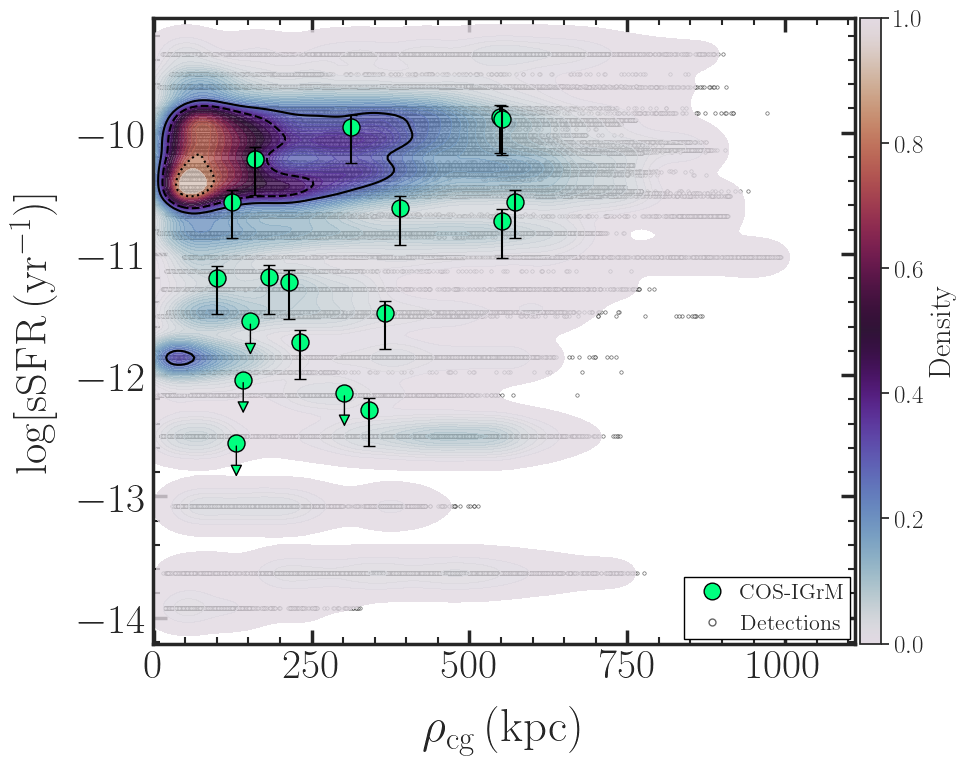

In [190]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
import h5py

# Paths
base_dir = '../../Grad School/MgII_TNG_Project/Primary Project/Trident Codes/TNG_50_z_0.1_groups/revised_final'
halo_file_path = '../TNG50_fitting_results/TNG_halos.txt'
# fitting_dir = '../TNG50_fitting_results/fitting_combined_features_grp_only_800'
fitting_dir = '../TNG50_fitting_results/v_2500_data_filtered_v800_combined_gal_removed'

galaxy_cat_dir = '../TNG50_fitting_results/galaxy_cats'

# Constants
z = 0.1  # Redshift
a = 1 / (1 + z)  # Scale factor
h = 0.6774  # Hubble parameter
box_size = 35000  # Simulation box size

# Map group index to sequential group numbering
grp_index_to_group_mapping = {
    7: 0, 8: 1, 9: 2, 10: 3, 11: 4, 12: 5, 13: 6, 15: 7,
    17: 8, 18: 9, 19: 10, 20: 11, 22: 12, 24: 13
}

# Load the halo group data
halo_data = pd.read_csv(halo_file_path, sep='|', skipinitialspace=True)
halo_data.columns = halo_data.columns.str.strip()
halo_data['GroupPos_x'] = pd.to_numeric(halo_data['GroupPos_x(𝑐𝑘𝑝𝑐/ℎ)'], errors='coerce')
halo_data['GroupPos_y'] = pd.to_numeric(halo_data['GroupPos_x(𝑐𝑘𝑝𝑐/ℎ)'], errors='coerce')

# Initialize arrays for results
impact_params = []
log_ssfr_values = []

impact_params_non_detections = []
log_ssfr_values_non_detections = []

# Helper function for cyclic correction
def apply_cyclic_condition(ray_coord, galaxy_coord, box_size):
    diff = np.abs(galaxy_coord - ray_coord)
    if diff > box_size / 2:
        if galaxy_coord > ray_coord:
            galaxy_coord -= box_size
        else:
            galaxy_coord += box_size
    return galaxy_coord

# Loop through all group files
for grp_index in tqdm(grp_index_to_group_mapping.keys()):
    group_number = grp_index_to_group_mapping[grp_index]

    # Load ray data
    ray_file = os.path.join(base_dir, f"integral_TNG50-1_z0.1_n300d2-sample_localized_OVInumdens_{group_number}-of-14.hdf5")
    if not os.path.exists(ray_file):
        print(f"File not found: {ray_file}")
        continue

    with h5py.File(ray_file, 'r') as f:
        ray_positions = f['ray_pos'][:]

    # Load fitting results
    fitting_file = os.path.join(fitting_dir, f"group_{group_number}_combined_features.txt")
    if not os.path.exists(fitting_file):
        print(f"File not found: {fitting_file}")
        continue

    fitting_data = pd.read_csv(fitting_file, sep='|', skipinitialspace=True)
    fitting_data.columns = fitting_data.columns.str.strip()

    detected_data = fitting_data[~fitting_data['dN'].isna()]
    non_detected_data = fitting_data[fitting_data['dN'].isna()]

    # Load galaxy catalog
    galaxy_file = os.path.join(galaxy_cat_dir, f"group_{grp_index}_galaxy_catalog_converted.txt")
    if not os.path.exists(galaxy_file):
        print(f"Galaxy catalog not found: {galaxy_file}")
        continue

    galaxy_data = pd.read_csv(galaxy_file, sep='|', skipinitialspace=True)
    galaxy_data.columns = galaxy_data.columns.str.strip()

    # Extract galaxy positions and stellar masses
    galaxy_positions = galaxy_data[['SubhaloPos_0', 'SubhaloPos_1']].values
    galaxy_sfr = galaxy_data['SubhaloSFR'].values
    galaxy_stellar_mass = galaxy_data['SubhaloMassType_4'].values  # Stellar mass in 10^10 M_sun/h

    # Convert stellar mass to physical units (M_sun)
    galaxy_stellar_mass_physical = galaxy_stellar_mass * 1e10 / h

    # Store the sSFR of the nearest galaxy for each sightline
    for sightline_id in detected_data['Sightline']:
        ray_x, ray_y = ray_positions[sightline_id, :2]

        # Apply cyclic condition to galaxy positions
        corrected_positions = np.array([
            [apply_cyclic_condition(ray_x, gx, box_size), apply_cyclic_condition(ray_y, gy, box_size)]
            for gx, gy in galaxy_positions
        ])

        # Calculate distances to all galaxies in the group
        distances = np.sqrt((corrected_positions[:, 0] - ray_x) ** 2 + (corrected_positions[:, 1] - ray_y) ** 2)

        # Find the nearest neighbor
        nearest_idx = np.argmin(distances)
        nearest_sfr = galaxy_sfr[nearest_idx]
        nearest_mass = galaxy_stellar_mass_physical[nearest_idx]

        # Calculate specific star formation rate (sSFR)
        if nearest_mass > 0:
            ssfr = nearest_sfr / nearest_mass
            log_ssfr = np.log10(ssfr) if ssfr > 0 else -np.inf
            log_ssfr_values.append(log_ssfr)
            impact_params.append(distances[nearest_idx] * a / h)  # Convert to physical kpc

    for sightline_id in non_detected_data['Sightline']:
        ray_x, ray_y = ray_positions[sightline_id, :2]

        # Apply cyclic condition to galaxy positions
        corrected_positions = np.array([
            [apply_cyclic_condition(ray_x, gx, box_size), apply_cyclic_condition(ray_y, gy, box_size)]
            for gx, gy in galaxy_positions
        ])

        # Calculate distances to all galaxies in the group
        distances = np.sqrt((corrected_positions[:, 0] - ray_x) ** 2 + (corrected_positions[:, 1] - ray_y) ** 2)

        # Find the nearest neighbor
        nearest_idx = np.argmin(distances)
        nearest_sfr = galaxy_sfr[nearest_idx]
        nearest_mass = galaxy_stellar_mass_physical[nearest_idx]

        # Calculate specific star formation rate (sSFR)
        if nearest_mass > 0:
            ssfr = nearest_sfr / nearest_mass
            log_ssfr = np.log10(ssfr) if ssfr > 0 else -np.inf
            log_ssfr_values_non_detections.append(log_ssfr)
            impact_params_non_detections.append(distances[nearest_idx] * a / h)  # Convert to physical kpc

# Convert results to numpy arrays
impact_params = np.array(impact_params)
log_ssfr_values = np.array(log_ssfr_values)

impact_params_non_detections = np.array(impact_params_non_detections)
log_ssfr_values_non_detections = np.array(log_ssfr_values_non_detections)

# Plot sSFR (nearest neighbor) vs Impact Parameter (rho_cg)
fig, ax = plt.subplots(figsize=(10, 8))

# Scatter plot for detections
ax.scatter(
    impact_params, log_ssfr_values, color='white', s=6, alpha=0.6,
    edgecolor='black', linewidth=0.5, marker='o', label='Detections', zorder=0
)

# # Scatter plot for non-detections
# ax.scatter(
#     impact_params_non_detections, log_ssfr_values_non_detections, color='orange', s=8, alpha=0.6,
#     edgecolor='black', linewidth=0.5, marker='s', label='Non-detections', zorder=3
# )

# KDE plot for detections
kde = sns.kdeplot(
    x=impact_params, y=log_ssfr_values, fill=True,
    cmap="twilight", levels=40, thresh=0.002, alpha=0.8, ax=ax, rasterized=True
)

# Contour lines for confidence levels
sns.kdeplot(
    x=impact_params, y=log_ssfr_values, levels=[0.5, 0.68, 0.95], color="black",
    linewidths=1.5, ax=ax, linestyles=["solid", "dashed", "dotted"], zorder=3
)


# **Add Colorbar for KDE**

# Create an axis for the colorbar
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="3%", pad=0.05)

kde_min, kde_max = kde.collections[0].get_clim()  # Get color limits from KDE

# Define normalization based on actual KDE density values
norm = mcolors.Normalize(vmin=kde_min, vmax=kde_max)
sm = cm.ScalarMappable(cmap="twilight", norm=norm)
sm.set_array([])  # Needed for colorbar

# Add Colorbar
cbar = fig.colorbar(sm, cax=cax, orientation="vertical")
cbar.set_label(r'$\mathrm{Density}$', fontsize=22)
cbar.ax.tick_params(labelsize=18)



observed_ssfr_data_path = '../COS_IGrM_Data/COS_Igrm_sfr_N.txt'

# Load and overlay observational data
observed_ssfr_data = pd.read_csv(observed_ssfr_data_path, delim_whitespace=True, comment='#')
print(observed_ssfr_data)

full_sample_path = '../COS_IGrM_Data/Group_Sightline_Data.txt'
full_sample_df = pd.read_csv(full_sample_path, sep='|', skipinitialspace=True)
full_sample_df.columns = full_sample_df.columns.str.strip()
impact_param_galaxies = full_sample_df['Impact_Param_Galaxy'].values

# Fixed horizontal error parameters:
x_err_right = 0.25               # right-side horizontal error (constant)
x_err_left_detection = x_err_right / 2  # for detections: left error = 1/3 of right error
i = 0
for idx, row in observed_ssfr_data.iterrows():

    log_ssfr_obs = row['sSFR']
    n_ovi_obs = row['N_ovi']
    sSFR_lim = row['sSFR_lim']
    N_lim = row['N_lim']
    N_OVI_err_low = row['N_OVI_err_low']
    N_OVI_err_high = row['N_OVI_err_high']
    Subset = row['Subset']
    impact_params_galaxy  = impact_param_galaxies[i]
    i+=1
    up_size = 0.3
    down_size = up_size/3
    # Decide marker color and label based on Subset
    if Subset == 'I':
        marker_color = 'springgreen'
        label = 'IGrM'
    else:  # Subset == 'C'
        marker_color = 'springgreen'
        label = 'CGM + IGrM'

    
    # Plot the scatter marker (color by subset, edge always black, size fixed to 150).
    # ax.scatter(log_ssfr_obs, n_ovi_obs, marker='o', color=marker_color, edgecolor='black',
    #            s=150, zorder=3,)
    ax.scatter(impact_params_galaxy, log_ssfr_obs, marker='o', color=marker_color, edgecolor='black',
                s=150, zorder=3,)

    # Case 1: Detection (sSFR_lim False and N_lim False)
    if (not sSFR_lim):
        # Draw asymmetric horizontal errorbar.
        print('case 1')
        # Draw full vertical errorbar.
        ax.errorbar(impact_params_galaxy, log_ssfr_obs,
                    yerr=[[up_size], [down_size]], fmt='none',
                    ecolor='black', capsize=4, zorder=3)
    
    # Case 3: sSFR_lim False and N_lim True.
    elif (sSFR_lim) :
        print('case 3')

        ax.annotate('',
                    xy=(impact_params_galaxy, log_ssfr_obs- 0.3),  # arrow tip: downward by N_OVI_err_low
                    xytext=(impact_params_galaxy, log_ssfr_obs),              # arrow tail: at the scatter point
                    arrowprops=dict(facecolor='springgreen', arrowstyle='-|>',
                                    lw=1, alpha=1, edgecolor='black',
                             ),
                    zorder=3)



# Axis labels
ax.set_xlabel(r'$\rho_\mathrm{cg} \, (\mathrm{kpc})$', fontsize=34, labelpad=15)
ax.set_ylabel(r'$\log[\mathrm{sSFR \, (yr^{-1})}]$', fontsize=32, labelpad=15)

# Axis limits
ax.set_xlim(-1, 1110)  # Adjust as necessary
#ax.set_ylim(-14, -8)  # sSFR range for visualization

# # Customize ticks and spines
# ax.tick_params(axis='both', which='major', direction='in', width=2, length=7)
ax.spines['top'].set_linewidth(2.5)
ax.spines['right'].set_linewidth(2.5)
ax.spines['bottom'].set_linewidth(2.5)
ax.spines['left'].set_linewidth(2.5)

# Enable major and minor ticks on all four axes
ax.tick_params(axis='both', which='major', direction='in', length=10, width=2.5, top=True, right=True)
ax.tick_params(axis='both', which='minor', direction='in', length=5, width=1.5, top=True, right=True)

# Add minor tick locators for both x and y axes
ax.xaxis.set_minor_locator(AutoMinorLocator())  # Minor ticks for x-axis
ax.yaxis.set_minor_locator(AutoMinorLocator())  # Minor ticks for y-axis

# Add legend
from matplotlib.lines import Line2D

# legend_elements = [
#     Line2D(
#         [0], [0], marker='o', color='springgreen', label='IGrM', markersize=12,
#         markeredgecolor='black', linestyle='none'
#     ),  # IGrM marker
#     Line2D(
#         [0], [0], marker='o', color='cyan', label='CGM + IGrM', markersize=12,
#         markeredgecolor='black', linestyle='none'
#     ),  # CGM + IGrM marker
#     Line2D(
#         [0], [0], marker='o', color='white', label= 'Detections', markersize=5,
#         markeredgecolor='black', linestyle='none', alpha=0.6
#     ),  # Simulated detections
# ]

legend_elements = [
    Line2D(
        [0], [0], marker='o', color='springgreen', label='COS-IGrM', markersize=12,
        markeredgecolor='black', linestyle='none'
    ),  # IGrM marker

    Line2D(
        [0], [0], marker='o', color='white', label= 'Detections', markersize=5,
        markeredgecolor='black', linestyle='none', alpha=0.6
    ),  # Simulated detections
]

# Add the legend
ax.legend(
    handles=legend_elements,
    frameon=True,framealpha=1, edgecolor='black',loc = 'lower right',
           fancybox=False, shadow=False, borderpad=0.25,borderaxespad=0.2, handletextpad=0.25, fontsize=16)


# Final adjustments
plt.tight_layout()

# Save the plot
output_dir = '../TNG50_fitting_results/Plots_gal_removed_new'
plt.savefig(os.path.join(output_dir, 'sSFR_vs_Impact_Param.png'), dpi=400)
plt.show()

In [191]:
print(len(impact_params), len(log_ssfr_values))
print(len(impact_params_non_detections), len(log_ssfr_values_non_detections))

247750 247750
951696 951696


100%|██████████| 14/14 [00:55<00:00,  3.93s/it]
/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_52070/88993159.py:154: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  obs_ssfr = pd.read_csv(observed_ssfr_data_path,
/Users/wavefunction/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines/igrm/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/wavefunction/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines/igrm/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/wavefunction/AS

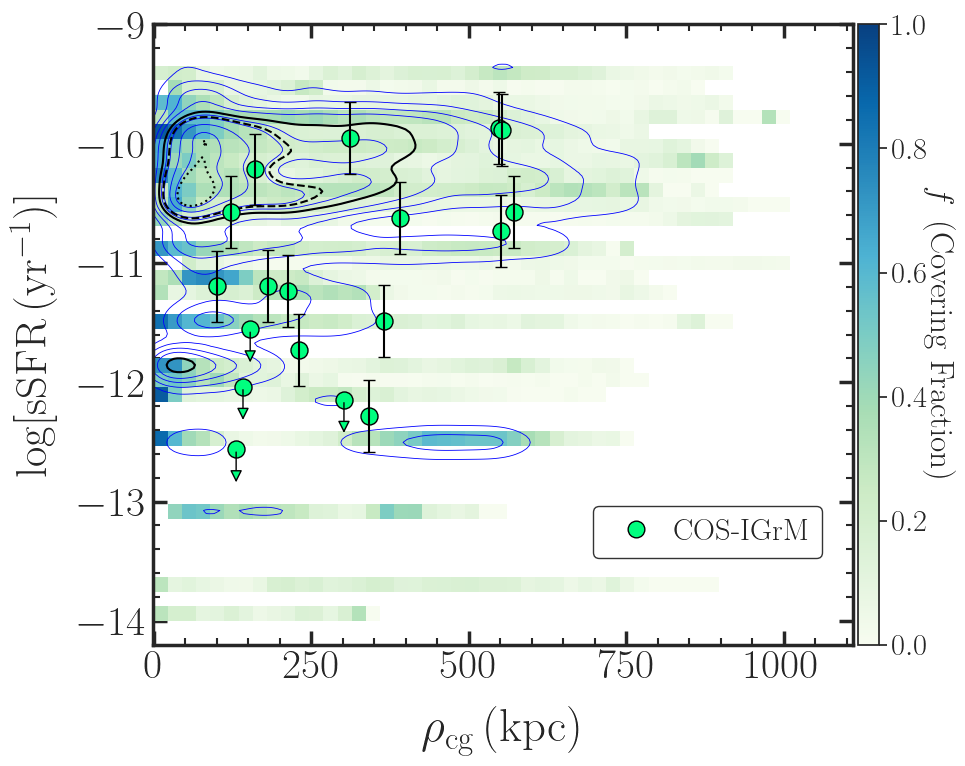

In [192]:
#!/usr/bin/env python3
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
import h5py
import matplotlib.colors as mcolors
import matplotlib.cm as cm
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.ticker import AutoMinorLocator
from matplotlib.lines import Line2D

# ---------------------------
# Paths and Constants
# ---------------------------
base_dir = '../../Grad School/MgII_TNG_Project/Primary Project/Trident Codes/TNG_50_z_0.1_groups/revised_final'
halo_file_path = '../TNG50_fitting_results/TNG_halos.txt'
# fitting_dir = '../TNG50_fitting_results/fitting_combined_features_grp_only_800'
fitting_dir = '../TNG50_fitting_results/v_2500_data_filtered_v800_combined_gal_removed'

galaxy_cat_dir = '../TNG50_fitting_results/galaxy_cats'
observed_ssfr_data_path = '../COS_IGrM_Data/COS_Igrm_sfr_N.txt'
full_sample_path = '../COS_IGrM_Data/Group_Sightline_Data.txt'

z = 0.1                     # Redshift
a = 1 / (1 + z)             # Scale factor
h = 0.6774                  # Hubble parameter
box_size = 35000            # Simulation box size

# Map group index to file number
grp_index_to_group_mapping = {
    7: 0, 8: 1, 9: 2, 10: 3, 11: 4, 12: 5,
    13: 6, 15: 7, 17: 8, 18: 9, 19: 10,
    20: 11, 22: 12, 24: 13
}

# ---------------------------
# Helper: periodic wrapping
# ---------------------------
def apply_cyclic_condition(ray_coord, galaxy_coord, box_size):
    diff = np.abs(galaxy_coord - ray_coord)
    if diff > box_size/2:
        if galaxy_coord > ray_coord:
            galaxy_coord -= box_size
        else:
            galaxy_coord += box_size
    return galaxy_coord

# ---------------------------
# Collect all sightlines
# ---------------------------
all_rho      = []
all_log_ssfr = []
all_detect   = []

for grp_index in tqdm(grp_index_to_group_mapping.keys()):
    file_idx = grp_index_to_group_mapping[grp_index]

    # Load ray positions
    ray_file = os.path.join(
        base_dir,
        f"integral_TNG50-1_z0.1_n300d2-sample_localized_OVInumdens_{file_idx}-of-14.hdf5"
    )
    if not os.path.exists(ray_file):
        print(f"File not found: {ray_file}")
        continue
    with h5py.File(ray_file, 'r') as f:
        rays = f['ray_pos'][:]  # (N_rays, 3)

    # Load fitting results
    fit_file = os.path.join(
        fitting_dir,
        f"group_{file_idx}_combined_features.txt"
    )
    if not os.path.exists(fit_file):
        print(f"File not found: {fit_file}")
        continue
    fit = pd.read_csv(fit_file, sep='|', skipinitialspace=True)
    fit.columns = fit.columns.str.strip()

    # Load galaxy catalog
    gal_file = os.path.join(
        galaxy_cat_dir,
        f"group_{grp_index}_galaxy_catalog_converted.txt"
    )
    if not os.path.exists(gal_file):
        print(f"Galaxy catalog not found: {gal_file}")
        continue
    gal = pd.read_csv(gal_file, sep='|', skipinitialspace=True)
    gal.columns = gal.columns.str.strip()
    gal_pos   = gal[['SubhaloPos_0','SubhaloPos_1']].values
    gal_sfr   = gal['SubhaloSFR'].values
    gal_mstar = gal['SubhaloMassType_4'].values * 1e10 / h

    # Loop through sightlines
    for _, row in fit.iterrows():
        sid      = int(row['Sightline'])
        logN     = row['N']
        detected = not np.isnan(row['dN'])

        x, y = rays[sid,:2]

        # Find nearest galaxy and its sSFR
        corr = np.array([
            [apply_cyclic_condition(x, gx, box_size),
             apply_cyclic_condition(y, gy, box_size)]
            for gx, gy in gal_pos
        ])
        dists = np.hypot(corr[:,0] - x, corr[:,1] - y)
        idx   = np.argmin(dists)

        mstar = gal_mstar[idx]
        if mstar <= 0:
            continue
        ssfr     = gal_sfr[idx] / mstar
        log_ssfr = np.log10(ssfr) if ssfr > 0 else -np.inf
        rho_phys = dists[idx] * a / h  # kpc

        all_rho.append(rho_phys)
        all_log_ssfr.append(log_ssfr)
        # detection flag for covering fraction: true if detected & logN<15
        all_detect.append(detected and (logN < 15))

# Convert to arrays
all_rho      = np.array(all_rho)
all_log_ssfr = np.array(all_log_ssfr)
all_detect   = np.array(all_detect, dtype=bool)

# ---------------------------
# 2D binning → covering fraction
# ---------------------------
rho_bins  = np.linspace(0, 1100, 50)
ssfr_bins = np.linspace(-14, -8, 50)

H_total, _, _ = np.histogram2d(
    all_rho, all_log_ssfr,
    bins=[rho_bins, ssfr_bins]
)
H_det, _, _ = np.histogram2d(
    all_rho[all_detect],
    all_log_ssfr[all_detect],
    bins=[rho_bins, ssfr_bins]
)

with np.errstate(divide='ignore', invalid='ignore'):
    cov_frac = H_det / H_total
cov_frac = np.ma.masked_where(H_total == 0, cov_frac)

# ---------------------------
# Load observational data
# ---------------------------
obs_ssfr = pd.read_csv(observed_ssfr_data_path,
                       delim_whitespace=True, comment='#')
full_df  = pd.read_csv(full_sample_path, sep='|',
                       skipinitialspace=True)
full_df.columns = full_df.columns.str.strip()
imp_obs = full_df['Impact_Param_Galaxy'].values

# ---------------------------
# Plot: covering fraction + density contours
# ---------------------------
fig, ax = plt.subplots(figsize=(10, 8))

# Heatmap: covering fraction
pcm = ax.pcolormesh(
    rho_bins, ssfr_bins, cov_frac.T,
    cmap='GnBu', vmin=0, vmax=1
)
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="3%", pad=0.05)
cbar = fig.colorbar(pcm, cax=cax)
cbar.set_label(
    r'$f$\, (Covering Fraction)', 
    fontsize=24, 
    rotation=270, 
    labelpad=20
)
cbar.ax.tick_params(labelsize=22)

# Detection density contours (minor levels)
rho_det  = all_rho[all_detect]
ssfr_det = all_log_ssfr[all_detect]
sns.kdeplot(
    x=rho_det, y=ssfr_det,
    levels=np.arange(0.1, 1.0, 0.1),
    colors='blue', linewidths=0.6,
    ax=ax
)
# Major confidence contours
sns.kdeplot(
    x=rho_det, y=ssfr_det,
    levels=[0.5, 0.68, 0.95],
    colors='black', linewidths=1.5,
    linestyles=['solid','dashed','dotted'],
    ax=ax
)

# # Scatter: simulated detections
# ax.scatter(
#     rho_det, ssfr_det,
#     color='white', s=6, alpha=0.6,
#     edgecolor='black', linewidth=0.5,
#     marker='o', label='Sim detections', zorder=3
# )

# Overlay observational points
i = 0
for _, row in obs_ssfr.iterrows():
    rho_i      = imp_obs[i]
    log_ssfr_i = row['sSFR']
    sSFR_lim   = row['sSFR_lim']
    up_size    = 0.3
    down_size  = 0.3

    ax.scatter(
        rho_i, log_ssfr_i,
        marker='o', s=150,
        facecolor='springgreen', edgecolor='black',
        zorder=4
    )
    if not sSFR_lim:
        ax.errorbar(
            rho_i, log_ssfr_i,
            yerr=[[up_size], [down_size]],
            fmt='none', ecolor='black',
            capsize=4, zorder=4
        )
    else:
        ax.annotate(
            '', xy=(rho_i, log_ssfr_i - down_size),
            xytext=(rho_i, log_ssfr_i),
            arrowprops=dict(
                facecolor='springgreen',
                edgecolor='black',
                arrowstyle='-|>',
                lw=1
            ), zorder=4
        )
    i += 1

# Labels, limits, ticks, spines
ax.set_xlabel(r'$\rho_{\rm cg}\,(\mathrm{kpc})$', fontsize=34, labelpad=15)
ax.set_ylabel(r'$\log[\mathrm{sSFR}\,(\mathrm{yr^{-1}})]$', fontsize=32, labelpad=15)
ax.set_xlim(-1, 1110)
ax.set_ylim(-14.2, -9)
ax.tick_params(axis='both', which='major', direction='in',
               length=10, width=2.5, top=True, right=True)
ax.tick_params(axis='both', which='minor', direction='in',
               length=5, width=1.5, top=True, right=True)
ax.xaxis.set_minor_locator(AutoMinorLocator())
ax.yaxis.set_minor_locator(AutoMinorLocator())
for spine in ax.spines.values():
    spine.set_linewidth(2.5)

# Legend outside bottom-right
legend_elems = [
    # Line2D([0],[0], marker='o', color='white', label='Sim detections',
    #        markeredgecolor='black', markersize=6, linestyle='none', alpha=0.6),
    Line2D([0],[0], marker='o', color='springgreen', label='COS‑IGrM',
           markeredgecolor='black', markersize=12, linestyle='none')
]
ax.legend(
    handles=legend_elems,
    loc='lower left',
    frameon=True,edgecolor = 'black',
    bbox_to_anchor=(0.62, 0.13),
    borderaxespad=0.2, 
    fontsize=22,
    handletextpad=0.25,

)


plt.tight_layout()
output_dir = '../TNG50_fitting_results/Plots_gal_removed_new'
os.makedirs(output_dir, exist_ok=True)
plt.savefig(os.path.join(output_dir, 'covering_fraction_with_density_contours.png'), dpi=400)
plt.show()

In [45]:
rho_bins  = np.linspace(0, 1100, 50)
ssfr_bins = np.linspace(-14,  -8, 50)

# ----------------------------
# Compute histograms
# ----------------------------
H_total, _, _ = np.histogram2d(
    all_rho, all_log_ssfr,
    bins=[rho_bins, ssfr_bins]
)
H_det, _, _ = np.histogram2d(
    all_rho[all_detect], 
    all_log_ssfr[all_detect], 
    bins=[rho_bins, ssfr_bins]
)

# ----------------------------
# Overall counts
# ----------------------------
total_det = int(np.sum(all_detect))
total_abs = all_detect.size
total_nd  = total_abs - total_det

print(f"Total detections     : {total_det}")
print(f"Total non-detections : {total_nd}")
print(f"Total absorbers      : {total_abs}\n")

# ----------------------------
# Per‑bin counts
# ----------------------------
print("Bin-by-bin counts (ρ-bin, sSFR-bin): detections, non‑detections, total")
for i in range(len(rho_bins)-1):
    for j in range(len(ssfr_bins)-1): 
        det_ij = int(H_det[i, j])
        tot_ij = int(H_total[i, j])
        nd_ij  = tot_ij - det_ij
        print(
            f"ρ∈[{rho_bins[i]:.0f},{rho_bins[i+1]:.0f}) kpc, "
            f"log sSFR∈[{ssfr_bins[j]:.2f},{ssfr_bins[j+1]:.2f}): "
            f"{det_ij}, {nd_ij}, {tot_ij}"
        )

Total detections     : 227747
Total non-detections : 971699
Total absorbers      : 1199446

Bin-by-bin counts (ρ-bin, sSFR-bin): detections, non‑detections, total
ρ∈[0,22) kpc, log sSFR∈[-14.00,-13.88): 22, 49, 71
ρ∈[0,22) kpc, log sSFR∈[-13.88,-13.76): 0, 0, 0
ρ∈[0,22) kpc, log sSFR∈[-13.76,-13.63): 11, 25, 36
ρ∈[0,22) kpc, log sSFR∈[-13.63,-13.51): 0, 0, 0
ρ∈[0,22) kpc, log sSFR∈[-13.51,-13.39): 0, 0, 0
ρ∈[0,22) kpc, log sSFR∈[-13.39,-13.27): 0, 0, 0
ρ∈[0,22) kpc, log sSFR∈[-13.27,-13.14): 0, 0, 0
ρ∈[0,22) kpc, log sSFR∈[-13.14,-13.02): 0, 0, 0
ρ∈[0,22) kpc, log sSFR∈[-13.02,-12.90): 0, 0, 0
ρ∈[0,22) kpc, log sSFR∈[-12.90,-12.78): 0, 0, 0
ρ∈[0,22) kpc, log sSFR∈[-12.78,-12.65): 0, 0, 0
ρ∈[0,22) kpc, log sSFR∈[-12.65,-12.53): 0, 0, 0
ρ∈[0,22) kpc, log sSFR∈[-12.53,-12.41): 67, 45, 112
ρ∈[0,22) kpc, log sSFR∈[-12.41,-12.29): 0, 0, 0
ρ∈[0,22) kpc, log sSFR∈[-12.29,-12.16): 0, 0, 0
ρ∈[0,22) kpc, log sSFR∈[-12.16,-12.04): 40, 6, 46
ρ∈[0,22) kpc, log sSFR∈[-12.04,-11.92): 6, 6, 12
ρ∈[0,22)

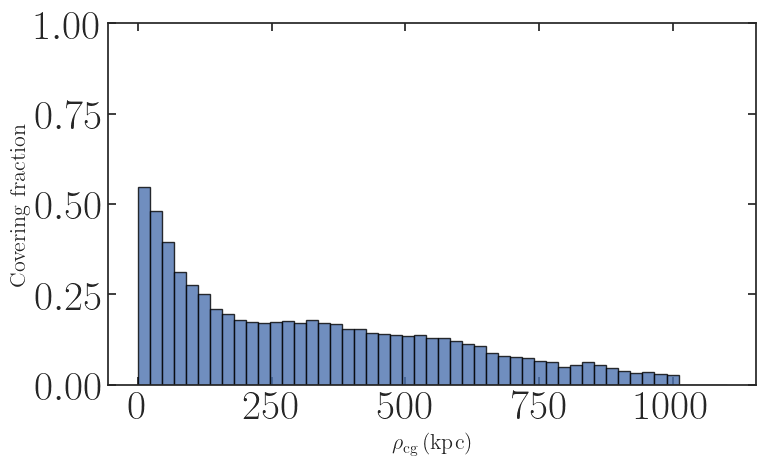

In [46]:
import matplotlib.pyplot as plt
import numpy as np

# --- assume you already have: rho_bins, H_total, H_det ---

# compute detection fraction in each ρ‐bin
det_per_rho = H_det.sum(axis=1)
tot_per_rho = H_total.sum(axis=1)
with np.errstate(divide='ignore', invalid='ignore'):
    cov_frac = det_per_rho / tot_per_rho
cov_frac = np.nan_to_num(cov_frac)  # optional: turn bins with tot=0 into 0

# bin centers for plotting
rho_centers = 0.5 * (rho_bins[:-1] + rho_bins[1:])

# plot
fig, ax = plt.subplots(figsize=(8,5))
ax.bar(
    rho_centers,
    cov_frac,
    width=np.diff(rho_bins),
    align='center',
    edgecolor='black',
    alpha=0.8
)
ax.set_xlabel(r'$\rho_{\rm cg}\,(\mathrm{kpc})$', fontsize=16)
ax.set_ylabel('Covering fraction', fontsize=16)
ax.set_ylim(0,1)
ax.tick_params(direction='in', top=True, right=True)
plt.tight_layout()
plt.show()

100%|██████████| 14/14 [00:53<00:00,  3.82s/it]
/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_52070/2477178491.py:140: RuntimeWarning: invalid value encountered in divide
  frac_rho      = det_per_rho / total_per_rho
/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_52070/2477178491.py:146: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  obs_ssfr = pd.read_csv(observed_ssfr_data_path,
/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_52070/2477178491.py:167: UserWarning: Warning: converting a masked element to nan.
  cov_full[-1]  = frac_rho[-1]


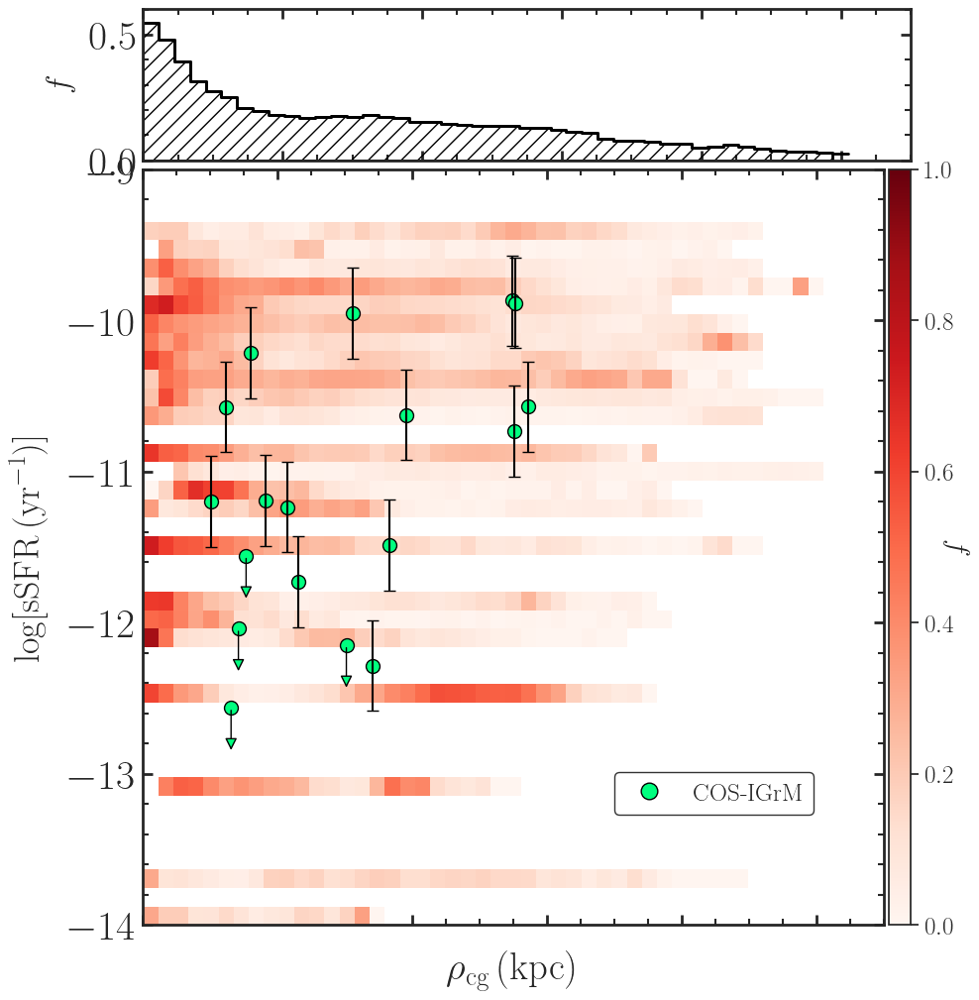

In [49]:
#!/usr/bin/env python3
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
import h5py
import matplotlib.colors as mcolors
import matplotlib.cm as cm
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.ticker import AutoMinorLocator
from matplotlib.lines import Line2D

# ---------------------------
# Paths and Constants
# ---------------------------
base_dir = '../../Grad School/MgII_TNG_Project/Primary Project/Trident Codes/TNG_50_z_0.1_groups/revised_final'
halo_file_path = '../TNG50_fitting_results/TNG_halos.txt'
# fitting_dir = '../TNG50_fitting_results/fitting_combined_features_grp_only_800'
fitting_dir = '../TNG50_fitting_results/v_2500_data_filtered_v800_combined_gal_removed'
galaxy_cat_dir = '../TNG50_fitting_results/galaxy_cats'
observed_ssfr_data_path = '../COS_IGrM_Data/COS_Igrm_sfr_N.txt'
full_sample_path = '../COS_IGrM_Data/Group_Sightline_Data.txt'

z = 0.1                     # Redshift
a = 1 / (1 + z)             # Scale factor
h = 0.6774                  # Hubble parameter
box_size = 35000            # Simulation box size

grp_index_to_group_mapping = {
    7: 0, 8: 1, 9: 2, 10: 3, 11: 4, 12: 5,
    13: 6, 15: 7, 17: 8, 18: 9, 19: 10,
    20: 11, 22: 12, 24: 13
}

def apply_cyclic_condition(ray_coord, galaxy_coord, box_size):
    diff = np.abs(galaxy_coord - ray_coord)
    if diff > box_size/2:
        if galaxy_coord > ray_coord:
            galaxy_coord -= box_size
        else:
            galaxy_coord += box_size
    return galaxy_coord

# ---------------------------
# Collect all sightlines
# ---------------------------
all_rho      = []
all_log_ssfr = []
all_detect   = []

for grp_index in tqdm(grp_index_to_group_mapping):
    file_idx = grp_index_to_group_mapping[grp_index]

    ray_file = os.path.join(
        base_dir,
        f"integral_TNG50-1_z0.1_n300d2-sample_localized_OVInumdens_{file_idx}-of-14.hdf5"
    )
    if not os.path.exists(ray_file):
        continue
    with h5py.File(ray_file, 'r') as f:
        rays = f['ray_pos'][:]

    fit_file = os.path.join(
        fitting_dir,
        f"group_{file_idx}_combined_features.txt"
    )
    if not os.path.exists(fit_file):
        continue
    fit = pd.read_csv(fit_file, sep='|', skipinitialspace=True)
    fit.columns = fit.columns.str.strip()

    gal_file = os.path.join(
        galaxy_cat_dir,
        f"group_{grp_index}_galaxy_catalog_converted.txt"
    )
    if not os.path.exists(gal_file):
        continue
    gal = pd.read_csv(gal_file, sep='|', skipinitialspace=True)
    gal.columns = gal.columns.str.strip()
    gal_pos   = gal[['SubhaloPos_0','SubhaloPos_1']].values
    gal_sfr   = gal['SubhaloSFR'].values
    gal_mstar = gal['SubhaloMassType_4'].values * 1e10 / h

    for _, row in fit.iterrows():
        sid      = int(row['Sightline'])
        logN     = row['N']
        detected = not np.isnan(row['dN'])
        x, y     = rays[sid,:2]

        corr = np.array([
            [apply_cyclic_condition(x, gx, box_size),
             apply_cyclic_condition(y, gy, box_size)]
            for gx, gy in gal_pos
        ])
        dists = np.hypot(corr[:,0] - x, corr[:,1] - y)
        idx   = np.argmin(dists)

        mstar = gal_mstar[idx]
        if mstar <= 0:
            continue
        ssfr     = gal_sfr[idx] / mstar
        log_ssfr = np.log10(ssfr) if ssfr > 0 else -np.inf
        rho_phys = dists[idx] * a / h

        all_rho.append(rho_phys)
        all_log_ssfr.append(log_ssfr)
        all_detect.append(detected and (logN < 15))

all_rho      = np.array(all_rho)
all_log_ssfr = np.array(all_log_ssfr)
all_detect   = np.array(all_detect, dtype=bool)

# ---------------------------
# 2D binning → covering fraction
# ---------------------------
rho_bins  = np.linspace(0, 1100, 50)
ssfr_bins = np.linspace(-14, -8, 50)

H_total, _, _ = np.histogram2d(
    all_rho, all_log_ssfr,
    bins=[rho_bins, ssfr_bins]
)
H_det, _, _ = np.histogram2d(
    all_rho[all_detect],
    all_log_ssfr[all_detect],
    bins=[rho_bins, ssfr_bins]
)

with np.errstate(divide='ignore', invalid='ignore'):
    cov_frac = H_det / H_total
cov_frac = np.ma.masked_where(H_total == 0, cov_frac)

# ---------------------------
# Marginal covering fraction vs rho
# ---------------------------
total_per_rho = H_total.sum(axis=1)
det_per_rho   = H_det.sum(axis=1)
frac_rho      = det_per_rho / total_per_rho
frac_rho      = np.ma.masked_where(total_per_rho == 0, frac_rho)

# ---------------------------
# Load observational data
# ---------------------------
obs_ssfr = pd.read_csv(observed_ssfr_data_path,
                       delim_whitespace=True, comment='#')
full_df = pd.read_csv(full_sample_path, sep='|',
                      skipinitialspace=True)
full_df.columns = full_df.columns.str.strip()
imp_obs = full_df['Impact_Param_Galaxy'].values

# ---------------------------
# Plot: top + bottom panels
# ---------------------------
fig, (ax_top, ax_bot) = plt.subplots(
    2, 1, figsize=(10, 12),
    gridspec_kw={'height_ratios': [1, 5], 'hspace': 0.02},
    sharex=True
)
plt.rc('text', usetex=True)

# --- Top: covering fraction vs rho ---
# Build full array to match rho_bins length
cov_full = np.zeros(len(rho_bins))
cov_full[:-1] = frac_rho
cov_full[-1]  = frac_rho[-1]

ax_top.fill_between(
    rho_bins, 0, cov_full,
    step='post', facecolor='none', hatch='//',
    edgecolor='black', linewidth=2
)
ax_top.step(rho_bins, cov_full, where='post',
            color='black', linewidth=2)

ax_top.set_ylabel(r'$f$', fontsize=24, labelpad=10)
ax_top.set_ylim(0, frac_rho.max() * 1.1)
ax_top.tick_params(axis='both', which='major',
                   direction='in', length=7, width=2,
                   top=True, right=True)
ax_top.tick_params(axis='both', which='minor',
                   direction='in', length=4, width=1.5,
                   top=True, right=True)
ax_top.xaxis.set_minor_locator(AutoMinorLocator())
ax_top.yaxis.set_minor_locator(AutoMinorLocator())
ax_top.spines['top'].set_linewidth(2)
ax_top.spines['right'].set_linewidth(2)
ax_top.spines['bottom'].set_linewidth(2)
ax_top.spines['left'].set_linewidth(2)
ax_top.set_xticklabels([])

# --- Bottom: 2D covering-fraction heatmap + observations ---
pcm = ax_bot.pcolormesh(
    rho_bins, ssfr_bins, cov_frac.T,
    cmap='Reds', vmin=0, vmax=1
)
divider = make_axes_locatable(ax_bot)
cax = divider.append_axes("right", size="3%", pad=0.05)
cbar = fig.colorbar(pcm, cax=cax)
cbar.set_label(r'$f$', fontsize=22, rotation=270, labelpad=12)
cbar.ax.tick_params(labelsize=18)

# Overlay observational points
i = 0
for _, row in obs_ssfr.iterrows():
    rho_i      = imp_obs[i]
    log_ssfr_i = row['sSFR']
    sSFR_lim   = row['sSFR_lim']
    up_size    = 0.3
    down_size  = 0.3

    ax_bot.scatter(
        rho_i, log_ssfr_i,
        marker='o', s=100,
        facecolor='springgreen', edgecolor='black',
        zorder=4
    )
    if not sSFR_lim:
        ax_bot.errorbar(
            rho_i, log_ssfr_i,
            yerr=[[up_size], [down_size]],
            fmt='none', ecolor='black',
            capsize=4, zorder=4
        )
    else:
        ax_bot.annotate(
            '', xy=(rho_i, log_ssfr_i - down_size),
            xytext=(rho_i, log_ssfr_i),
            arrowprops=dict(
                facecolor='springgreen',
                edgecolor='black',
                arrowstyle='-|>',
                lw=1
            ), zorder=4
        )
    i += 1

ax_bot.set_xlabel(r'$\rho_{\rm cg}\,(\mathrm{kpc})$', fontsize=28, labelpad=15)
ax_bot.set_ylabel(r'$\log[\mathrm{sSFR}\,(\mathrm{yr^{-1}})]$',
                  fontsize=26, labelpad=15)
ax_bot.set_xlim(0, 1100)
ax_bot.set_ylim(-14, -9)
ax_bot.tick_params(axis='both', which='major',
                   direction='in', length=7, width=2,
                   top=True, right=True)
ax_bot.tick_params(axis='both', which='minor',
                   direction='in', length=4, width=1.5,
                   top=True, right=True)
ax_bot.xaxis.set_minor_locator(AutoMinorLocator())
ax_bot.yaxis.set_minor_locator(AutoMinorLocator())
for spine in ax_bot.spines.values():
    spine.set_linewidth(2)

# Legend outside
legend_elems = [
    Line2D([0],[0], marker='o', color='springgreen',
           label='COS‑IGrM', markeredgecolor='black',
           markersize=12, linestyle='none')
]
ax_bot.legend(
    handles=legend_elems,
    loc='lower left',
    bbox_to_anchor=(0.62, 0.13),
    frameon=True, edgecolor='black',
    fontsize=18
)

# Save & show
output_dir = '../TNG50_fitting_results/Plots_gal_removed'
os.makedirs(output_dir, exist_ok=True)
# plt.savefig(
#     os.path.join(output_dir, 'covering_fraction_with_marginal.png'),
#     dpi=300
# )
plt.show()

In [57]:
import numpy as np

# Define the impact parameter threshold (in kpc)
rho_threshold = 100.0

# --- Overall Absorbers ---
total_absorbers = len(impact_params)
print(total_absorbers)
mask_rho = impact_params < rho_threshold
num_within_rho = np.sum(mask_rho)
fraction_within_rho = num_within_rho / total_absorbers

print("=== All Absorbers ===")
print(f"Total absorbers             : {total_absorbers}")
print(f"Absorbers with ρ < {rho_threshold} kpc : {num_within_rho}")
print(f"Fraction with ρ < {rho_threshold} kpc  : {fraction_within_rho:.3f}")

# --- High sSFR Absorbers ---
# Here we consider absorbers with log₁₀(sSFR) > -11
mask_high_ssfr = log_ssfr_values > -11

num_high_ssfr_total = np.sum(mask_high_ssfr)

# Combine the high-sSFR condition with the rho condition
mask_high_ssfr_and_rho = np.logical_and(mask_high_ssfr, mask_rho)
num_high_ssfr_within_rho = np.sum(mask_high_ssfr_and_rho)
fraction_high_ssfr_within_rho = (num_high_ssfr_within_rho / num_high_ssfr_total) if num_high_ssfr_total > 0 else 0.0

print("\n=== High sSFR Absorbers (log sSFR > -11) ===")
print(f"Total high sSFR absorbers (log sSFR > -11)        : {num_high_ssfr_total}")
print(f"High sSFR absorbers with ρ < {rho_threshold} kpc : {num_high_ssfr_within_rho}")
print(f"Fraction of high sSFR absorbers with ρ < {rho_threshold} kpc : {fraction_high_ssfr_within_rho:.3f}")

247750
=== All Absorbers ===
Total absorbers             : 247750
Absorbers with ρ < 100.0 kpc : 73139
Fraction with ρ < 100.0 kpc  : 0.295

=== High sSFR Absorbers (log sSFR > -11) ===
Total high sSFR absorbers (log sSFR > -11)        : 205701
High sSFR absorbers with ρ < 100.0 kpc : 59133
Fraction of high sSFR absorbers with ρ < 100.0 kpc : 0.287


Peak ρ for All Absorbers: 57.38 kpc
Peak ρ for High sSFR Absorbers (log sSFR > -11): 52.39 kpc
Peak ρ for Low sSFR Absorbers (log sSFR < -11): 57.38 kpc
KS test statistic: 0.051, p-value: 2.4e-78


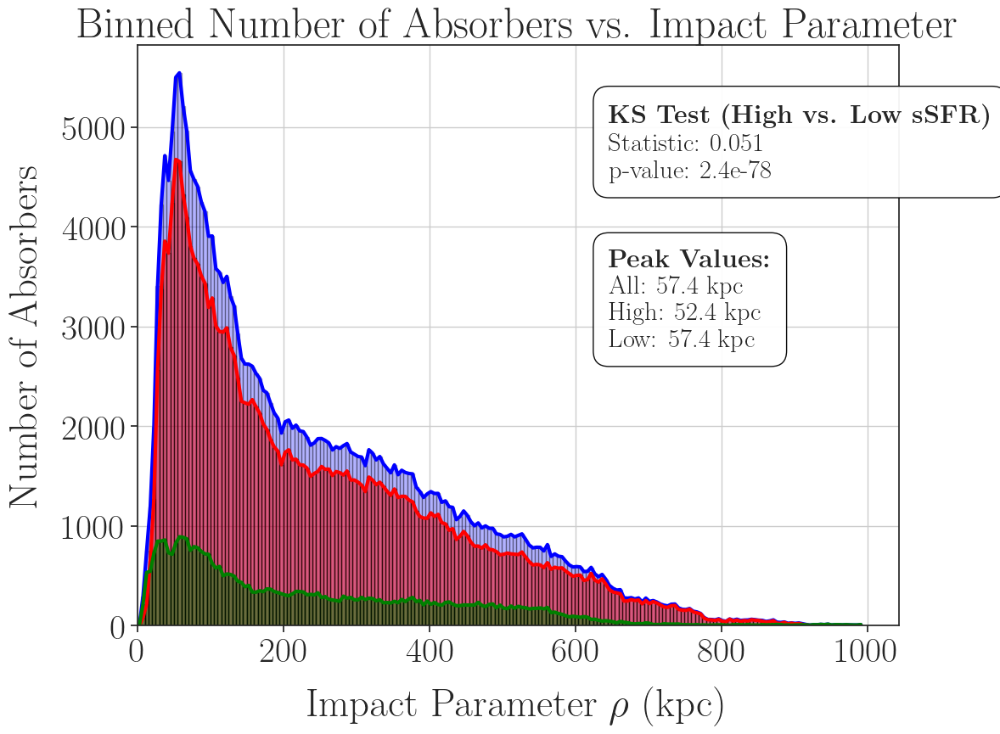

In [193]:
import os
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import ks_2samp

# ----------------------------
# Assume that impact_params and log_ssfr_values are already defined.
# For example:
# impact_params = np.array([...])
# log_ssfr_values = np.array([...])
# ----------------------------

# Define bins for the histogram (using 200 bins spanning from 0 to the maximum impact parameter)
bins = np.linspace(0, np.max(impact_params), 200)
counts_all, bin_edges = np.histogram(impact_params, bins=bins)

# Create masks for high and low sSFR absorbers.
mask_high_ssfr = log_ssfr_values > -11   # high sSFR: log sSFR > -11
mask_low_ssfr  = log_ssfr_values < -11    # low sSFR: log sSFR < -11

# Compute histogram counts for each sample.
counts_high, _ = np.histogram(impact_params[mask_high_ssfr], bins=bins)
counts_low, _  = np.histogram(impact_params[mask_low_ssfr], bins=bins)

# Calculate bin widths and centers for plotting.
bin_width = np.diff(bin_edges)
bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2

# ----------------------------
# Find Peak Bin (Maximum Count) for Each Sample
# ----------------------------
peak_idx_all = np.argmax(counts_all)
peak_rho_all = bin_centers[peak_idx_all]

peak_idx_high = np.argmax(counts_high)
peak_rho_high = bin_centers[peak_idx_high]

peak_idx_low = np.argmax(counts_low)
peak_rho_low = bin_centers[peak_idx_low]

print("Peak ρ for All Absorbers: {:.2f} kpc".format(peak_rho_all))
print("Peak ρ for High sSFR Absorbers (log sSFR > -11): {:.2f} kpc".format(peak_rho_high))
print("Peak ρ for Low sSFR Absorbers (log sSFR < -11): {:.2f} kpc".format(peak_rho_low))

# ----------------------------
# Perform KS Test between high and low sSFR impact parameter distributions
# ----------------------------
ks_stat, p_value = ks_2samp(impact_params[mask_high_ssfr], impact_params[mask_low_ssfr])
print(f"KS test statistic: {ks_stat:.3f}, p-value: {p_value:.1e}")

# ----------------------------
# Set up LaTeX and Plot Formatting
# ----------------------------
plt.rcParams.update({
    "text.usetex": True,  # Enable LaTeX rendering
    "axes.labelsize": 34,
    "axes.titlesize": 36,
    "xtick.labelsize": 28,
    "ytick.labelsize": 28,
    "legend.fontsize": 24,

})
plt.rc('font', family='Times New Roman')
sns.set(style="ticks", font_scale=1.5)

# Plot simulated data as violins
sns.set(style="ticks", font_scale=1.5)

# latex = True
plt.rc('text', usetex=True)
plt.rc('font', family='Times New Roman')
plt.rcParams.update({
    'axes.labelsize': 32,
    'axes.titlesize': 22,
    'xtick.labelsize': 30,
    'ytick.labelsize': 30,
    'legend.fontsize': 30,
    'figure.titlesize': 22,
    "text.latex.preamble": r"\usepackage{amsmath}"
})

# ----------------------------
# Create the Plot
# ----------------------------
fig, ax = plt.subplots(figsize=(12, 9))

# Plot histogram bars for each sample
ax.bar(bin_edges[:-1], counts_all, width=bin_width, align='edge', 
       alpha=0.3, label='All Absorbers', color='blue', edgecolor='black')
ax.bar(bin_edges[:-1], counts_high, width=bin_width, align='edge', 
       alpha=0.5, label='High sSFR (log sSFR > -11)', color='red', edgecolor='black')
ax.bar(bin_edges[:-1], counts_low, width=bin_width, align='edge', 
       alpha=0.5, label='Low sSFR (log sSFR < -11)', color='green', edgecolor='black')

# Overlay simple line plots connecting the bin centers
ax.plot(bin_centers, counts_all, color='blue', linewidth=3, 
        label=f'All (Peak: {peak_rho_all:.1f} kpc)')
ax.plot(bin_centers, counts_high, color='red', linewidth=3, 
        label=f'High sSFR (Peak: {peak_rho_high:.1f} kpc)')
ax.plot(bin_centers, counts_low, color='green', linewidth=3, 
        label=f'Low sSFR (Peak: {peak_rho_low:.1f} kpc)')

# Labels, title, and grid
ax.set_xlabel(r'Impact Parameter $\rho$ (kpc)', labelpad=15, fontsize=34)
ax.set_ylabel(r'Number of Absorbers', labelpad=15, fontsize=34)
ax.set_title(r'Binned Number of Absorbers vs. Impact Parameter', fontsize=36)
ax.grid(True)
ax.set_xlim(0, np.max(impact_params)*1.05)
#ax.set_ylim(0, max(np.max(counts_all), np.max(counts_high), np.max(counts_low))*1.1)

# Add legend
# ax.legend(frameon=True, framealpha=1, edgecolor='black', loc='upper right',
#           fancybox=False, shadow=False, borderpad=0.5, borderaxespad=0.5,
#           handletextpad=0.5, fontsize=22)

# ----------------------------
# Prepare Text Boxes for KS Test and Peak Values
# ----------------------------
ks_text = (
    r"\textbf{KS Test (High vs. Low sSFR)}" "\n" +
    r"Statistic: " + f"{ks_stat:.3f}" + "\n" +
    r"p-value: " + f"{p_value:.1e}"
)

peak_text = (
    r"\textbf{Peak Values:}" "\n" +
    r"All: " + f"{peak_rho_all:.1f} kpc" + "\n" +
    r"High: " + f"{peak_rho_high:.1f} kpc" + "\n" +
    r"Low: " + f"{peak_rho_low:.1f} kpc"
)

# Add text boxes to the plot.
ax.text(0.65 * np.max(impact_params), 0.9 * ax.get_ylim()[1], ks_text, fontsize=22,
        verticalalignment='top', bbox=dict(boxstyle="round,pad=0.6", edgecolor='black', facecolor='white', alpha=0.95))
ax.text(0.65 * np.max(impact_params), 0.65 * ax.get_ylim()[1], peak_text, fontsize=22,
        verticalalignment='top', bbox=dict(boxstyle="round,pad=0.6", edgecolor='black', facecolor='white', alpha=0.95))

# Final layout and save
plt.tight_layout()
output_dir = '../TNG50_fitting_results/Plots_gal_removed_new'
if not os.path.exists(output_dir):
    os.makedirs(output_dir)
plt.savefig(os.path.join(output_dir, 'binned_absorbers_with_KS.pdf'), dpi=200)
plt.show()

Raw Peak ρ for All Absorbers: 53.08 kpc
Raw Peak ρ for High sSFR Absorbers (log sSFR > -11): 53.08 kpc
Raw Peak ρ for Low sSFR Absorbers (log sSFR < -11): 65.56 kpc
Smooth Peak ρ for All Absorbers: 65.56 kpc
Smooth Peak ρ for High sSFR Absorbers (log sSFR > -11): 65.56 kpc
Smooth Peak ρ for Low sSFR Absorbers (log sSFR < -11): 59.32 kpc
KS test statistic: 0.051, p-value: 2.4e-78


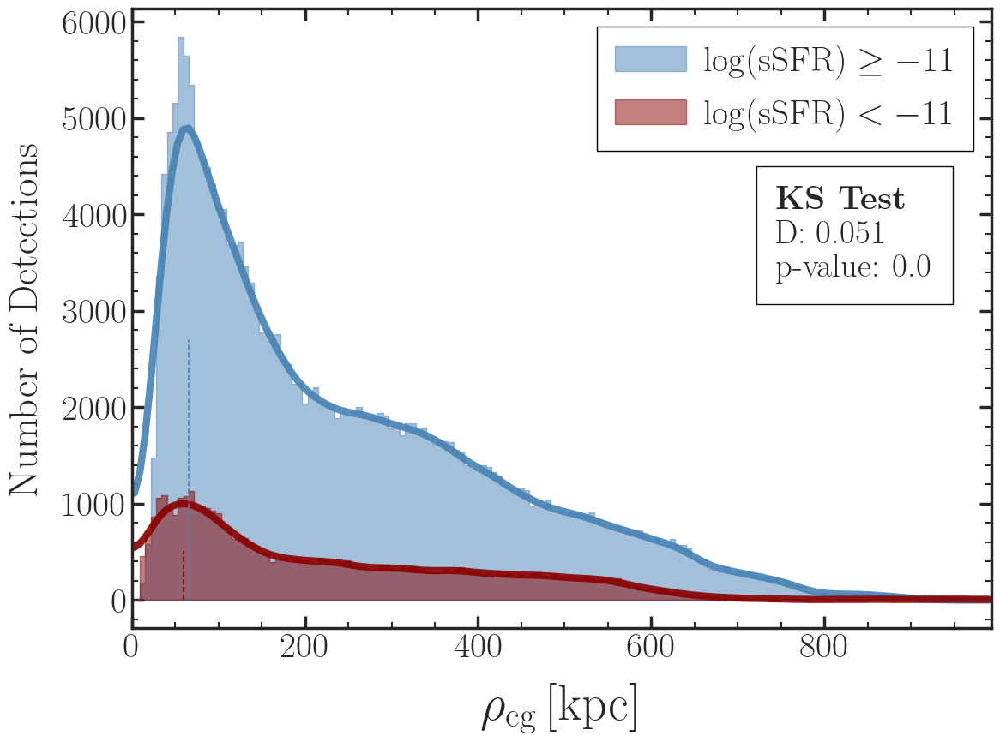

In [194]:
import os
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import ks_2samp
from scipy.ndimage import gaussian_filter1d

# ----------------------------
# Assume that impact_params and log_ssfr_values are already defined.
# For example:
# impact_params = np.array([...])
# log_ssfr_values = np.array([...])
# ----------------------------

# Define bins for the histogram (using 400 bins spanning from 0 to the maximum impact parameter)
bins = np.linspace(0, np.max(impact_params), 160)
counts_all, bin_edges = np.histogram(impact_params, bins=bins)

# Create masks for high and low sSFR absorbers.
mask_high_ssfr = log_ssfr_values > -11   # high sSFR: log sSFR > -11
mask_low_ssfr  = log_ssfr_values < -11    # low sSFR: log sSFR < -11

# Compute histogram counts for each sample.
counts_high, _ = np.histogram(impact_params[mask_high_ssfr], bins=bins)
counts_low, _  = np.histogram(impact_params[mask_low_ssfr], bins=bins)

# Calculate bin widths and centers for plotting.
bin_width = np.diff(bin_edges)
bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2

# ----------------------------
# Find Raw Peak Bin for Each Sample (for reference)
# ----------------------------
peak_idx_all = np.argmax(counts_all)
peak_rho_all = bin_centers[peak_idx_all]

peak_idx_high = np.argmax(counts_high)
peak_rho_high = bin_centers[peak_idx_high]

peak_idx_low = np.argmax(counts_low)
peak_rho_low = bin_centers[peak_idx_low]

print("Raw Peak ρ for All Absorbers: {:.2f} kpc".format(peak_rho_all))
print("Raw Peak ρ for High sSFR Absorbers (log sSFR > -11): {:.2f} kpc".format(peak_rho_high))
print("Raw Peak ρ for Low sSFR Absorbers (log sSFR < -11): {:.2f} kpc".format(peak_rho_low))

# ----------------------------
# Smooth the Histogram Boundaries
# ----------------------------
sigma = 3  # Adjust sigma to control the smoothness.
smooth_counts_all = gaussian_filter1d(counts_all, sigma=sigma)
smooth_counts_high = gaussian_filter1d(counts_high, sigma=sigma)
smooth_counts_low = gaussian_filter1d(counts_low, sigma=sigma)

# Find the smoothened peak (bin center at maximum of smoothed counts)
smooth_peak_idx_all = np.argmax(smooth_counts_all)
smooth_peak_rho_all = bin_centers[smooth_peak_idx_all]

smooth_peak_idx_high = np.argmax(smooth_counts_high)
smooth_peak_rho_high = bin_centers[smooth_peak_idx_high]

smooth_peak_idx_low = np.argmax(smooth_counts_low)
smooth_peak_rho_low = bin_centers[smooth_peak_idx_low]

print("Smooth Peak ρ for All Absorbers: {:.2f} kpc".format(smooth_peak_rho_all))
print("Smooth Peak ρ for High sSFR Absorbers (log sSFR > -11): {:.2f} kpc".format(smooth_peak_rho_high))
print("Smooth Peak ρ for Low sSFR Absorbers (log sSFR < -11): {:.2f} kpc".format(smooth_peak_rho_low))

# ----------------------------
# Perform KS Test between high and low sSFR impact parameter distributions
# ----------------------------
ks_stat, p_value = ks_2samp(impact_params[mask_high_ssfr], impact_params[mask_low_ssfr])
print(f"KS test statistic: {ks_stat:.3f}, p-value: {p_value:.1e}")

# ----------------------------
# Set up LaTeX and Plot Formatting
# ----------------------------
# Plot simulated data as violins
sns.set(style="ticks", font_scale=1.5)

# latex = True
plt.rc('font', family='Times New Roman')
plt.rcParams.update({
    'axes.labelsize': 32,
    'axes.titlesize': 22,
    'xtick.labelsize': 30,
    'ytick.labelsize': 30,
    'legend.fontsize': 30,
    'figure.titlesize': 22
})


# ----------------------------
# Create the Plot
# ----------------------------
fig, ax = plt.subplots(figsize=(12, 9))

# Instead of bar plots with vertical lines, use fill_between to shade the histogram region.
# For high sSFR absorbers:
# We need a step function. We use np.r_ to prepend the first count to match bin_edges length.
ax.fill_between(bin_edges, np.r_[counts_high[0], counts_high], step='mid',
                alpha=0.5, label=r'$\log(\mathrm{sSFR}) \geq -11$', color='steelblue',interpolate=True)
# For low sSFR absorbers:
ax.fill_between(bin_edges, np.r_[counts_low[0], counts_low], step='mid',
                alpha=0.5, label=r'$\log(\mathrm{sSFR}) < -11$', color='darkred',interpolate=True)
# (Optionally, one could also fill for "All" absorbers, if desired.)

# Overlay smooth boundary curves using the smoothed counts.
ax.plot(bin_centers, smooth_counts_high, color='steelblue', linewidth=6, 
        alpha = 0.9)
ax.plot(bin_centers, smooth_counts_low, color='darkred', linewidth=6, 
        alpha = 0.9)

# Labels, title, and grid.
ax.set_xlabel(r'$\rho_\mathrm{cg} \, [\mathrm{kpc}]$', fontsize=42, labelpad=15)
ax.set_ylabel(r'Number of Detections', labelpad=15, fontsize=34)
#ax.grid(True)
ax.set_xlim(0, np.max(impact_params))
# ax.set_ylim(0, 3000)
# # Customize ticks and spines
# ax.tick_params(axis='both', which='major', direction='in', width=2, length=7)
ax.spines['top'].set_linewidth(2.5)
ax.spines['right'].set_linewidth(2.5)
ax.spines['bottom'].set_linewidth(2.5)
ax.spines['left'].set_linewidth(2.5)
# first vertical line from zero to peak for smooth high sSFR
ax.vlines(smooth_peak_rho_high, 0, 2700, color='steelblue', linestyle='--', linewidth=1.2,)
ax.vlines(smooth_peak_rho_low, 0, 510, color='darkred', linestyle='--', linewidth=1.2,)

# Enable major and minor ticks on all four axes
ax.tick_params(axis='both', which='major', direction='in', length=10, width=2.5, top=True, right=True,zorder = 10)
ax.tick_params(axis='both', which='minor', direction='in', length=5, width=1.5, top=True, right=True,zorder = 10)

# Add minor tick locators for both x and y axes
ax.xaxis.set_minor_locator(AutoMinorLocator())  # Minor ticks for x-axis
ax.yaxis.set_minor_locator(AutoMinorLocator())  # Minor ticks for y-axis

# Add legend
# You can adjust the y-limit if necessary.

# ----------------------------
# Prepare Text Boxes for KS Test and Smooth Peak Values
# ----------------------------
ks_text = (
    r"\textbf{KS Test}" "\n" +
    r"D: " + f"{ks_stat:.3f}" + "\n" +
    r"p-value: " + f"0.0"
)



ax.text(0.75 * np.max(impact_params), 0.7 * ax.get_ylim()[1], ks_text, fontsize=28,
        verticalalignment='top', bbox=dict(boxstyle="square,pad=0.6", edgecolor='black', facecolor='white', alpha=0.95))

# Add legend.
ax.legend(frameon=True, framealpha=1, edgecolor='black', loc='upper right',
          fancybox=False, shadow=False, borderpad=0.5, borderaxespad=0.5,
          handletextpad=0.5, fontsize=30)

plt.tight_layout()
output_dir = '../TNG50_fitting_results/Plots_gal_removed'
if not os.path.exists(output_dir):
    os.makedirs(output_dir)
plt.savefig(os.path.join(output_dir, 'binned_absorbers_with_KS_smoothed.pdf'), dpi=200)
plt.show()

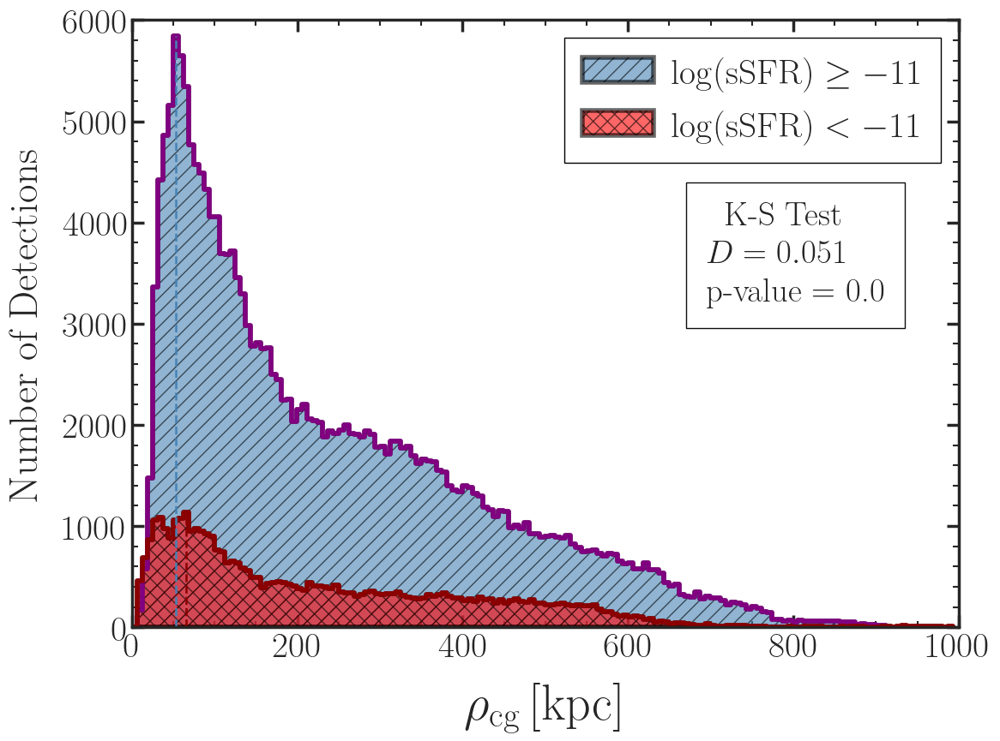

In [195]:
# ----------------------------
# Create the Plot
# ----------------------------
fig, ax = plt.subplots(figsize=(12, 9))
# set latex = false
plt.rc('text', usetex=True)

# Convert counts to a full array matching bin_edges length for fill_between
# so that the leftmost and rightmost edges are enclosed.
def counts_to_full_array(counts, bin_edges):
    # length of bin_edges is len(counts) + 1
    arr = np.zeros(len(bin_edges))
    arr[:-1] = counts
    arr[-1] = counts[-1]  # replicate the last bin
    return arr

# Prepare full arrays
counts_high_full = counts_to_full_array(counts_high, bin_edges)
counts_low_full  = counts_to_full_array(counts_low,  bin_edges)

# --- Step histogram for High sSFR with fill + hatch ---
ax.fill_between(
    bin_edges, 0, counts_high_full,
    step='post', hatch='//', facecolor='steelblue', edgecolor='black',
    alpha=0.6, label=r'$\log(\mathrm{sSFR}) \geq -11$',
    linewidth=4
)
# Outline for a crisp boundary
ax.step(
    bin_edges, counts_high_full,
    where='post', color='purple', linewidth=4
)

# --- Step histogram for Low sSFR with fill + hatch ---
ax.fill_between(
    bin_edges, 0, counts_low_full,
    step='post', hatch='XX', facecolor='red', edgecolor='black',
    alpha=0.6, label=r'$\log(\mathrm{sSFR})<-11$',
    linewidth=4
)
ax.step(
    bin_edges, counts_low_full,
    where='post', color='darkred', linewidth=4
)

# Axis labels, etc.
ax.set_xlabel(r'$\rho_\mathrm{cg} \, [\mathrm{kpc}]$', fontsize=42, labelpad=15)
ax.set_ylabel(r'Number of Detections', labelpad=15, fontsize=34)
ax.set_xlim(0, np.max(impact_params))
x_ticks = np.arange(0, 1200, 200)
ax.set_xticks(x_ticks)
# If you want to set a y-limit
ax.set_ylim(0, 6000)

# Tick/spine styling
ax.spines['top'].set_linewidth(2.5)
ax.spines['right'].set_linewidth(2.5)
ax.spines['bottom'].set_linewidth(2.5)
ax.spines['left'].set_linewidth(2.5)
ax.tick_params(axis='both', which='major', direction='in', length=10, width=2.5, top=True, right=True)
ax.tick_params(axis='both', which='minor', direction='in', length=5, width=1.5, top=True, right=True)

# Minor tick locators
ax.xaxis.set_minor_locator(AutoMinorLocator())
ax.yaxis.set_minor_locator(AutoMinorLocator())

# Optional vertical lines at raw peak locations
ax.vlines(peak_rho_high, 0, counts_high[peak_idx_high], color='steelblue',
          linestyle='--', linewidth=1.8)
ax.vlines(peak_rho_low,  0, counts_low[peak_idx_low],   color='darkred',
          linestyle='--', linewidth=1.8)

# Instead of using \n, use \\ for line breaks in LaTeX
ks_text = (
    r"K-S Test\\ \\"    # LaTeX line break
    + rf"$D = {ks_stat:.3f}$\\ \\"
    + rf"p-value = {0.0}"
)

ax.text(
    0.70 * np.max(impact_params), 0.7 * ax.get_ylim()[1],
    ks_text, fontsize=28, verticalalignment='top',
    bbox=dict(boxstyle="square,pad=0.6", edgecolor='black', facecolor='white', alpha=0.95)
)

# Add legend
ax.legend(frameon=True, framealpha=1, edgecolor='black', loc='upper right',
          fancybox=False, shadow=False, borderpad=0.5, borderaxespad=0.5,
          handletextpad=0.5, fontsize=30)

plt.tight_layout()
output_dir = '../TNG50_fitting_results/Plots_gal_removed_new'
if not os.path.exists(output_dir):
    os.makedirs(output_dir)
plt.savefig(os.path.join(output_dir, 'binned_absorbers_with_KS_smoothed.pdf'), dpi=200)
plt.show()

KS statistic: 0.051, p-value: 0.000


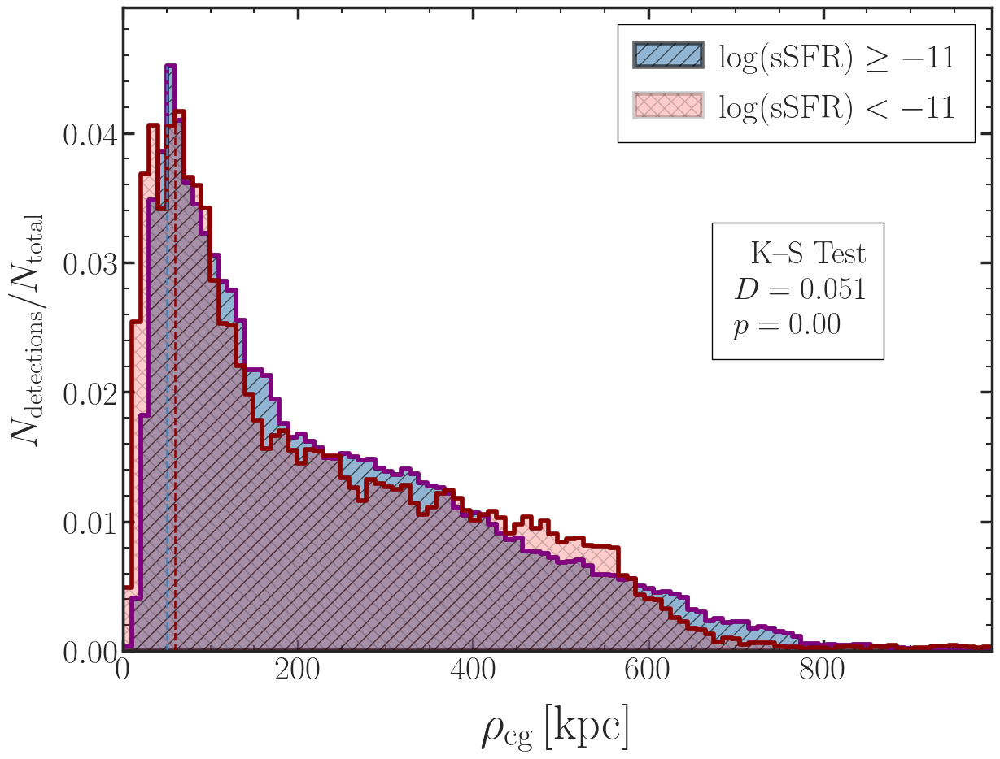

In [196]:
#!/usr/bin/env python3
import os
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import AutoMinorLocator
from scipy.stats import ks_2samp

# … assume impact_params, log_ssfr_values defined above …

# split into the two samples
impact_high = impact_params[log_ssfr_values >= -11]
impact_low  = impact_params[log_ssfr_values <  -11]

# KS test
ks_stat, p_value = ks_2samp(impact_high, impact_low)
print(f"KS statistic: {ks_stat:.3f}, p-value: {p_value:.3f}")

# histogram bins
bin_count = 100
max_rho   = impact_params.max()
bin_edges = np.linspace(0, max_rho, bin_count + 1)

counts_high, _ = np.histogram(impact_high, bins=bin_edges)
counts_low,  _ = np.histogram(impact_low,  bins=bin_edges)

# plotting
fig, ax = plt.subplots(figsize=(12, 9), dpi=100)
plt.rc('text', usetex=True)

def counts_to_full_array(counts, edges):
    arr = np.zeros(len(edges))
    arr[:-1] = counts
    arr[-1]  = counts[-1]
    return arr

c_high = counts_to_full_array(counts_high, bin_edges)
c_low  = counts_to_full_array(counts_low,  bin_edges)
c_high /= c_high.sum()
c_low  /= c_low.sum()

# draw histograms
ax.fill_between(bin_edges, 0, c_high,
                step='post', hatch='//', facecolor='steelblue', edgecolor='black',
                alpha=0.6, label=r'$\log(\mathrm{sSFR})\ge-11$', linewidth=4)
ax.step(bin_edges, c_high, where='post', color='purple', linewidth=4)

ax.fill_between(bin_edges, 0, c_low,
                step='post', hatch='XX', facecolor='red', edgecolor='black',
                alpha=0.2, label=r'$\log(\mathrm{sSFR})< -11$', linewidth=4)
ax.step(bin_edges, c_low, where='post', color='darkred', linewidth=4)

# labels
ax.set_xlabel(r'$\rho_\mathrm{cg}\,[\mathrm{kpc}]$', fontsize=42, labelpad=15)
ax.set_ylabel(
    r'$N_{\rm detections}/N_{\rm total}$',
    fontsize=34,
    labelpad=15
)
ax.set_xlim(0, max_rho)
ax.set_xticks(np.arange(0, max_rho+1, 200))

# adjust y‐limit just above highest peak
max_frac = np.maximum(c_high.max(), c_low.max())
ax.set_ylim(0, max_frac * 1.1)

# styling
for sp in ax.spines.values():
    sp.set_linewidth(2.5)
ax.tick_params(axis='both', which='major', direction='in',
               length=10, width=2.5, top=True, right=True)
ax.tick_params(axis='both', which='minor', direction='in',
               length=5, width=1.5, top=True, right=True)
ax.xaxis.set_minor_locator(AutoMinorLocator())
ax.yaxis.set_minor_locator(AutoMinorLocator())

# peak lines
idx_h = np.argmax(counts_high)
idx_l = np.argmax(counts_low)
rho_h = bin_edges[idx_h]
rho_l = bin_edges[idx_l]
ax.vlines(rho_h, 0, c_high[idx_h],
          color='steelblue', linestyle='--', linewidth=1.8)
ax.vlines(rho_l, 0, c_low[idx_l],
          color='darkred', linestyle='--', linewidth=1.8)

# KS annotation
ks_txt = (
    r"K–S Test\\ \\"
    + rf"$ D={ks_stat:.3f}$\\ \\"
    + rf"$ p = {p_value:.2f}$"
)

# # Instead of using \n, use \\ for line breaks in LaTeX
# ks_text = (
#     r"K-S Test\\ \\"    # LaTeX line break
#     + rf"$D = {ks_stat:.3f}$\\ \\"
#     + rf"p-value = {0.00}"
# )
ax.text(0.70*max_rho, max_frac*0.7, ks_txt,
        fontsize=28, verticalalignment='top',
        bbox=dict(boxstyle="square,pad=0.6",
                  edgecolor='black',
                  facecolor='white',
                  alpha=0.95))

# legend & layout
ax.legend(frameon=True,framealpha=1, edgecolor='black', loc='upper right',
          fancybox=False, shadow=False, borderpad=0.5, borderaxespad=0.5,
          handletextpad=0.5, fontsize=30)
fig.subplots_adjust(left=0.08, right=0.97, top=0.95, bottom=0.07)


# Tick/spine styling
ax.spines['top'].set_linewidth(2.5)
ax.spines['right'].set_linewidth(2.5)
ax.spines['bottom'].set_linewidth(2.5)
ax.spines['left'].set_linewidth(2.5)
ax.tick_params(axis='both', which='major', direction='in', length=10, width=2.5, top=True, right=True)
ax.tick_params(axis='both', which='minor', direction='in', length=5, width=1.5, top=True, right=True)

# save & show
out = '../TNG50_fitting_results/Plots_gal_removed_new'
os.makedirs(out, exist_ok=True)
plt.savefig(os.path.join(out, 'ks_binned_normalized.pdf'), dpi=200, bbox_inches='tight')
plt.show()

In [197]:
import numpy as np

# Assuming that 'bins', 'counts_all', 'counts_high', 'counts_low', and 'bin_edges'
# have been computed from the previous histogram code.

# Compute the bin centers for clarity:
bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2

# --- For All Absorbers ---
max_idx_all = np.argmax(counts_all)
max_count_all = counts_all[max_idx_all]
max_bin_range_all = (bin_edges[max_idx_all], bin_edges[max_idx_all+1])
max_center_all = bin_centers[max_idx_all]

print("All Absorbers:")
print(f"Maximum count: {max_count_all}")
print(f"Bin range: [{max_bin_range_all[0]:.2f}, {max_bin_range_all[1]:.2f}]")
print(f"Bin center (approx ρ): {max_center_all:.2f} kpc")

# --- For High sSFR Absorbers (log sSFR > -11) ---
max_idx_high = np.argmax(counts_high)
max_count_high = counts_high[max_idx_high]
max_bin_range_high = (bin_edges[max_idx_high], bin_edges[max_idx_high+1])
max_center_high = bin_centers[max_idx_high]

print("\nHigh sSFR Absorbers (log sSFR > -11):")
print(f"Maximum count: {max_count_high}")
print(f"Bin range: [{max_bin_range_high[0]:.2f}, {max_bin_range_high[1]:.2f}]")
print(f"Bin center (approx ρ): {max_center_high:.2f} kpc")

# --- For Low sSFR Absorbers (log sSFR < -11) ---
max_idx_low = np.argmax(counts_low)
max_count_low = counts_low[max_idx_low]
max_bin_range_low = (bin_edges[max_idx_low], bin_edges[max_idx_low+1])
max_center_low = bin_centers[max_idx_low]

print("\nLow sSFR Absorbers (log sSFR < -11):")
print(f"Maximum count: {max_count_low}")
print(f"Bin range: [{max_bin_range_low[0]:.2f}, {max_bin_range_low[1]:.2f}]")
print(f"Bin center (approx ρ): {max_center_low:.2f} kpc")

All Absorbers:
Maximum count: 6901
Bin range: [79.43, 89.36]
Bin center (approx ρ): 84.39 kpc

High sSFR Absorbers (log sSFR > -11):
Maximum count: 9291
Bin range: [49.64, 59.57]
Bin center (approx ρ): 54.61 kpc

Low sSFR Absorbers (log sSFR < -11):
Maximum count: 1752
Bin range: [59.57, 69.50]
Bin center (approx ρ): 64.53 kpc


In [545]:
# Plot simulated data as violins
sns.set(style="ticks", font_scale=1.5)

# latex = True
plt.rc('text', usetex=True)
plt.rc('font', family='Times New Roman')
plt.rcParams.update({
    'axes.labelsize': 32,
    'axes.titlesize': 22,
    'xtick.labelsize': 30,
    'ytick.labelsize': 30,
    'legend.fontsize': 30,
    'figure.titlesize': 22
})


In [64]:


plt.rcParams.update({
    "text.usetex": True})  
# include LaTeX package asmath
plt.rcParams["text.latex.preamble"] = r"\usepackage{amsmath}"

# Define the range of rho thresholds to test (in kpc).
# Here we choose thresholds from 0 to 150 kpc.
rho_range = np.linspace(0, 800, 50)

# Total number of absorbers (for all detections)
total_absorbers = len(impact_params)
# Create a mask for high sSFR detections (log sSFR > -11)
mask_high_ssfr = log_ssfr_values > -11
num_high_ssfr_total = np.sum(mask_high_ssfr)

# Initialize lists to store fractions at each rho threshold
overall_fraction = []
high_ssfr_fraction = []

# Loop over the range of rho thresholds and compute fractions
for r in rho_range:
    # Fraction for all absorbers
    frac_all = np.sum(impact_params < r) / total_absorbers
    overall_fraction.append(frac_all)
    
    # Fraction for high sSFR absorbers (log sSFR > -11)
    # Here we combine the conditions: (impact_params < r) and (log_ssfr_values > -11)
    frac_high_ssfr = np.sum(np.logical_and(impact_params < r, mask_high_ssfr)) / num_high_ssfr_total if num_high_ssfr_total > 0 else 0.0
    high_ssfr_fraction.append(frac_high_ssfr)

# Convert lists to NumPy arrays (optional)
overall_fraction = np.array(overall_fraction)
high_ssfr_fraction = np.array(high_ssfr_fraction)

# Plot the results
plt.figure(figsize=(10, 6))
plt.plot(rho_range, overall_fraction, label='All Absorbers', color='blue', marker='o', linestyle='-')
plt.plot(rho_range, high_ssfr_fraction, label='High sSFR Absorbers (log sSFR > -11)', color='red', marker='s', linestyle='-')
plt.xlabel('Impact Parameter ρ (kpc)', fontsize=14)
plt.ylabel('Fraction of Absorbers', fontsize=14)
plt.title('Fraction of Absorbers with ρ < Threshold', fontsize=16)
plt.legend(fontsize=12)
plt.grid(True)
# plt.tight_layout()
plt.show()

RuntimeError: latex was not able to process the following string:
b'Fraction of Absorbers with \\u03c1 < Threshold'

Here is the full command invocation and its output:

latex -interaction=nonstopmode --halt-on-error --output-directory=tmp8hgbo6ck 5b032881573e19b23bb4c996b577d6d7.tex

This is pdfTeX, Version 3.141592653-2.6-1.40.26 (TeX Live 2024) (preloaded format=latex)
 restricted \write18 enabled.
entering extended mode
(./5b032881573e19b23bb4c996b577d6d7.tex
LaTeX2e <2023-11-01> patch level 1
L3 programming layer <2024-02-20>
(/usr/local/texlive/2024/texmf-dist/tex/latex/base/article.cls
Document Class: article 2023/05/17 v1.4n Standard LaTeX document class
(/usr/local/texlive/2024/texmf-dist/tex/latex/base/size10.clo))
(/usr/local/texlive/2024/texmf-dist/tex/latex/type1cm/type1cm.sty)
(/usr/local/texlive/2024/texmf-dist/tex/latex/cm-super/type1ec.sty
(/usr/local/texlive/2024/texmf-dist/tex/latex/base/t1cmr.fd))
(/usr/local/texlive/2024/texmf-dist/tex/latex/base/inputenc.sty)
(/usr/local/texlive/2024/texmf-dist/tex/latex/geometry/geometry.sty
(/usr/local/texlive/2024/texmf-dist/tex/latex/graphics/keyval.sty)
(/usr/local/texlive/2024/texmf-dist/tex/generic/iftex/ifvtex.sty
(/usr/local/texlive/2024/texmf-dist/tex/generic/iftex/iftex.sty)))
(/usr/local/texlive/2024/texmf-dist/tex/latex/amsmath/amsmath.sty
For additional information on amsmath, use the `?' option.
(/usr/local/texlive/2024/texmf-dist/tex/latex/amsmath/amstext.sty
(/usr/local/texlive/2024/texmf-dist/tex/latex/amsmath/amsgen.sty))
(/usr/local/texlive/2024/texmf-dist/tex/latex/amsmath/amsbsy.sty)
(/usr/local/texlive/2024/texmf-dist/tex/latex/amsmath/amsopn.sty))
(/usr/local/texlive/2024/texmf-dist/tex/latex/underscore/underscore.sty)
(/usr/local/texlive/2024/texmf-dist/tex/latex/firstaid/underscore-ltx.sty)
(/usr/local/texlive/2024/texmf-dist/tex/latex/base/textcomp.sty)
(/usr/local/texlive/2024/texmf-dist/tex/latex/l3backend/l3backend-dvips.def)
No file 5b032881573e19b23bb4c996b577d6d7.aux.
*geometry* driver: auto-detecting
*geometry* detected driver: dvips

! LaTeX Error: Unicode character ρ (U+03C1)
               not set up for use with LaTeX.

See the LaTeX manual or LaTeX Companion for explanation.
Type  H <return>  for immediate help.
 ...                                              
                                                  
l.30 {\rmfamily Fraction of Absorbers with ρ
                                              < Threshold}%
No pages of output.
Transcript written on tmp8hgbo6ck/5b032881573e19b23bb4c996b577d6d7.log.




<Figure size 1000x600 with 1 Axes>

Total low sSFR absorbers (log sSFR < -11): 42049
Total high sSFR absorbers (log sSFR > -11): 205701
KS test statistic: 0.05067301973312928 p-value: 2.3839325043027545e-78


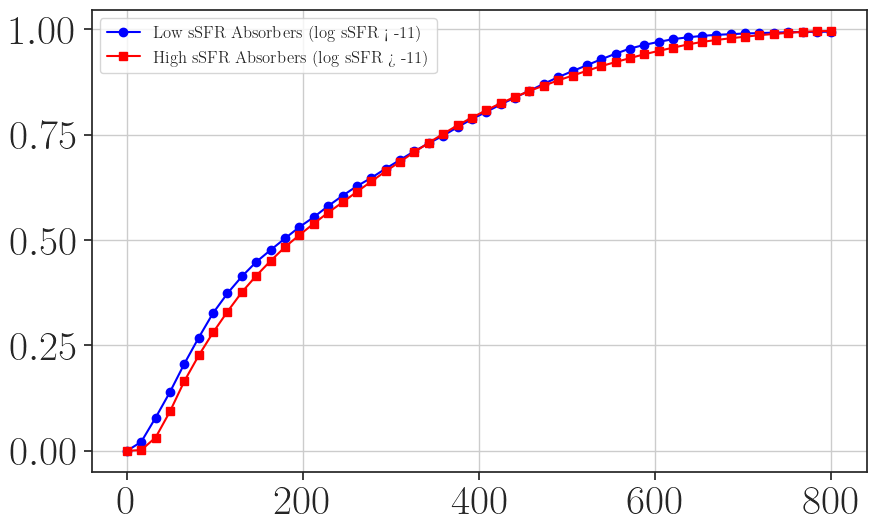

In [65]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import ks_2samp

# -------------------------------
# Define the range of rho thresholds (in kpc)
# -------------------------------
rho_range = np.linspace(0, 800, 50)

# -------------------------------
# Create masks for low and high sSFR absorbers
# -------------------------------
mask_low_ssfr = log_ssfr_values < -11    # low sSFR: log sSFR < -11
mask_high_ssfr = log_ssfr_values > -11   # high sSFR: log sSFR > -11

# Total number in each sample
total_low = np.sum(mask_low_ssfr)
total_high = np.sum(mask_high_ssfr)
print("Total low sSFR absorbers (log sSFR < -11):", total_low)
print("Total high sSFR absorbers (log sSFR > -11):", total_high)

# -------------------------------
# Compute fractions for each sample as a function of rho threshold
# -------------------------------
low_fraction = []
high_fraction = []

# Loop over each threshold in rho_range
for r in rho_range:
    frac_low = np.sum(impact_params[mask_low_ssfr] < r) / total_low if total_low > 0 else 0.0
    frac_high = np.sum(impact_params[mask_high_ssfr] < r) / total_high if total_high > 0 else 0.0
    low_fraction.append(frac_low)
    high_fraction.append(frac_high)

low_fraction = np.array(low_fraction)
high_fraction = np.array(high_fraction)

# -------------------------------
# Statistical Test: KS Test on impact parameter distributions
# -------------------------------
ks_stat, p_value = ks_2samp(impact_params[mask_low_ssfr], impact_params[mask_high_ssfr])
print("KS test statistic:", ks_stat, "p-value:", p_value)
# A p-value below 0.05 would suggest that the two distributions are significantly different.

# -------------------------------
# Plot the fraction curves
# -------------------------------
plt.figure(figsize=(10, 6))
plt.plot(rho_range, low_fraction, label='Low sSFR Absorbers (log sSFR < -11)', 
         color='blue', marker='o', linestyle='-')
plt.plot(rho_range, high_fraction, label='High sSFR Absorbers (log sSFR > -11)', 
         color='red', marker='s', linestyle='-')
# plt.xlabel(r'Impact Parameter $\rho$ (kpc)', fontsize=14)
# plt.ylabel('Fraction of Absorbers', fontsize=14)
# plt.title('Fraction of Absorbers with $\rho$ < Threshold', fontsize=16)
plt.legend(fontsize=12)
plt.grid(True)
plt.show()

In [66]:

full_sample_path = '../COS_IGrM_Data/Group_Sightline_Data.txt'
full_sample_df = pd.read_csv(full_sample_path, sep='|', skipinitialspace=True)
full_sample_df.columns = full_sample_df.columns.str.strip()
full_sample_df['Impact_Param_Galaxy'].values

array([130.79086037, 572.12790044, 390.73461907, 153.09042684,
       366.15153047, 181.74439013, 100.94475242, 301.98339999,
       312.21024822, 547.7734786 , 160.10936054, 141.67437176,
       231.28275028, 213.80563448, 123.37116855, 551.34040852,
       552.3212951 , 341.3953013 ])

### Trying Redshift correction. 

In [50]:
import numpy as np
import pandas as pd
from scipy.integrate import quad
from scipy.optimize import fsolve

# Constants
H0 = 67.74  # Hubble constant in km/s/Mpc
c = 299792.458  # Speed of light in km/s
h = 0.6774  # Hubble parameter normalization
Omega_m = 0.315
Omega_Lambda = 1 - Omega_m

# Hubble parameter function
def H_z(z):
    return H0 * np.sqrt(Omega_m * (1 + z)**3 + Omega_Lambda)

# Compute comoving distance
def comoving_distance(z):
    integral, _ = quad(lambda z: c / H_z(z), 0, z)
    return integral  # in Mpc

# Find redshift for given comoving distance
def find_z_final(d_target):
    def func(z):
        return comoving_distance(z) - d_target
    return fsolve(func, 0.1)[0]  # Start with z = 0.1

# Load data
file_path = '../TNG50_fitting_results/TNG_halos.txt'
data = pd.read_csv(file_path, sep='|', skipinitialspace=True, header=0)
data.columns = data.columns.str.strip()  # Strip spaces from column names

# Extract and clean columns
R_vir = data['R_Crit200'].astype(float)  # Virial radius in ckpc/h

# Convert ckpc/h to Mpc/h
ckpc_to_Mpc = 1e-3  # 1 ckpc = 0.001 Mpc
R_vir_Mpc = R_vir * ckpc_to_Mpc / h  # Convert to Mpc/h

# Initial redshift of the ray
z_start = 0.09940180263022191
H_z_start = H_z(z_start)  # Hubble parameter at z_start
print(f"H(z_start) = {H_z_start} km/s/Mpc")

# Convert 2*R_vir to Δz
delta_z = (2 * R_vir_Mpc / c) * H_z_start

# Compute redshift at the center of the group's cell
redshifts_center = z_start + delta_z / 2  # Center is at Δz/2
redshifts_offset = redshifts_center - z_start  # Offset from initial redshift

# Convert redshift offset to velocity
velocity_offset = redshifts_offset * c  # in km/s

# Store results in DataFrame
data['Redshift_Center'] = redshifts_center
data['Redshift_Offset'] = redshifts_offset
data['Velocity_Offset'] = velocity_offset

data.head(15)

H(z_start) = 71.16187313575631 km/s/Mpc


,Unnamed: 0,Grp_Index,GroupFirstSub,M_Crit200_log,R_Crit200,GroupNsubs,GroupPos_x(𝑐𝑘𝑝𝑐/ℎ),GroupPos_y(𝑐𝑘𝑝𝑐/ℎ),GroupPos_z(𝑐𝑘𝑝𝑐/ℎ),Filtered_Nsubs,"GroupVel(x,km/s/h)","GroupVel(y,km/s/h)","GroupVel(z,km/s/h)",Unnamed: 13,Redshift_Center,Redshift_Offset,Velocity_Offset
0,NaN,7,188893,13.536072,494.33572,10333,32072.22700,30238.0430,12095.8340,3,-12.421044,8.074385,39.888268,NaN,0.099575,0.000173,51.930699
1,NaN,8,199226,13.424505,453.76035,9337,9532.87500,8869.6590,2280.7864,6,17.385560,29.049420,-69.885690,NaN,0.099561,0.000159,47.668197
2,NaN,9,208563,13.170979,373.52300,11279,21565.54000,19836.3960,15311.4460,6,-61.467934,29.671150,15.630951,NaN,0.099533,0.000131,39.239144
3,NaN,10,219842,13.436270,457.86540,11527,95.99507,30197.4400,19200.1900,6,76.996200,-105.454140,-23.102350,NaN,0.099562,0.000160,48.099438
4,NaN,11,231369,13.419579,452.03400,8474,3746.92380,18653.5900,13167.5830,3,-105.215850,87.007050,51.808865,NaN,0.099560,0.000158,47.486841
5,NaN,12,239843,13.384746,440.10724,8102,1132.74170,5820.8080,26818.8160,5,-27.030022,-8.991281,13.802106,NaN,0.099556,0.000154,46.233917
6,NaN,13,247945,13.313600,416.73320,9360,21716.38900,2239.9140,14810.6780,6,42.901905,-74.942780,-28.483871,NaN,0.099548,0.000146,43.778440
7,NaN,15,264620,13.207702,384.19003,7608,4834.15400,22167.7190,16398.6390,3,146.905870,21.700594,135.986470,NaN,0.099536,0.000135,40.359732
8,NaN,17,277688,13.191112,379.33167,5824,14926.81250,4867.9204,33045.0080,3,137.029390,-39.083576,-15.752931,NaN,0.099535,0.000133,39.849354
9,NaN,18,283512,13.206106,383.72205,5420,31092.03100,33786.9060,7304.1284,3,-120.776110,12.245885,110.909070,NaN,0.099536,0.000134,40.310570


### Saving the $\pm800 km/s$ files in a new directory

In [13]:
import os
import numpy as np
import pandas as pd
from astropy.table import Table
from astropy.io import ascii

# ---------------------------
# Constants and Halo Data Setup
# ---------------------------
h = 0.6774                           # Hubble parameter
z = 0.09940180263022191              # Redshift
a = 1 / (1 + z)                      # Scale factor

# Path to halo data file and load it
halo_file_path = '../TNG50_fitting_results/TNG_halos.txt'
halo_data = pd.read_csv(halo_file_path, sep='|', skipinitialspace=True)
halo_data.columns = halo_data.columns.str.strip()
halo_data['Grp_Index'] = halo_data.index

# Define the Hubble parameter function
def H(z, H0=67.74, Omega_m=0.3089, Omega_Lambda=0.6911):
    return H0 * np.sqrt(Omega_m * (1 + z)**3 + Omega_Lambda)

# ---------------------------
# Directory Setup
# ---------------------------
# Base directory with original group files
base_dir = '../TNG50_fitting_results/fitting_combined_features_grp_only'
# New directory for filtered files
new_dir = '../TNG50_fitting_results/fitting_combined_features_grp_only_800'
os.makedirs(new_dir, exist_ok=True)

# ---------------------------
# Process Each Group File
# ---------------------------
for file_name in os.listdir(base_dir):
    # Process only files matching the expected pattern
    if file_name.startswith("group_") and file_name.endswith("_combined_features.txt"):
        file_path = os.path.join(base_dir, file_name)
        new_file_path = os.path.join(new_dir, file_name)
        
        # Extract group index from the filename (e.g., "group_11_combined_features.txt")
        parts = file_name.split('_')
        try:
            group_idx = int(parts[1])
        except Exception as e:
            print(f"Error extracting group index from {file_name}: {e}")
            continue
        
        # Check that the group index exists in the halo data
        if group_idx not in halo_data.index:
            print(f"Group index {group_idx} not found in halo_data.")
            continue
        
        # Retrieve the halo properties for the group
        halo_row = halo_data.loc[group_idx]
        v_sys_z_raw = halo_row['GroupVel(z,km/s/h)']
        v_sys_z = v_sys_z_raw * 1/a  # Convert to physical velocity
        r_vir = halo_row['R_Crit200'] * 1e-3 / h  # Convert R_Crit200 to physical Mpc
        delta_z_distance = 2 * r_vir  # Physical distance span
        v_hubble_offset = delta_z_distance * H(z, H0=67.74, Omega_m=0.3089, Omega_Lambda=0.6911)
        
        # Read the group file with the original formatting
        df = pd.read_csv(file_path, sep='|', skipinitialspace=True)
        df.columns = df.columns.str.strip()
        df['v'] = pd.to_numeric(df['v'], errors='coerce')
        
        # Create a mask for detection rows (where 'dN' is not NaN)
        det_mask = ~df['dN'].isna()
        
        # For detections, compute the velocity offset
        if det_mask.any():
            df.loc[det_mask, 'Velocity_Offset'] = df.loc[det_mask, 'v'] - v_hubble_offset - v_sys_z
        
        # Filter:
        # - For detection rows, keep only if the absolute Velocity_Offset is less than 800.
        # - Non-detection rows are kept unaltered.
        df_filtered = df[(~det_mask) | (df['Velocity_Offset'].abs() < 800)]
        
        # Calculate the number of rows removed
        removed_count = len(df) - len(df_filtered)
        
        # Reset the index and convert the filtered DataFrame to an Astropy Table.
        # Instead of using Table.from_pandas, we convert to a dict of lists.
        # remove the nan and make those empty instead
        df_filtered = df_filtered.fillna('')
        df_reset = df_filtered.reset_index(drop=True)
        table = Table(df_reset.to_dict(orient='list'))
        # remove the columns with 'Unnamed' in the column name
        for col in table.colnames:
            if 'Unnamed' in col:
                print(f"Removing column: {col}")
                table.remove_column(col)

        
        # Save the table using Astropy's ASCII writer in fixed-width format with the pipe delimiter.
        # (Note: In fixed-width format the delimiter is less crucial, but it is provided as requested.)
        ascii.write(table, new_file_path, format='fixed_width', delimiter='|', overwrite=True)
        
        print(f"Processed {file_name}: {len(df)} rows originally, {len(df_filtered)} rows kept. Removed: {removed_count} rows.")

print("Filtering complete. All files saved in:", new_dir)

/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_83885/234388576.py:88: UserWarning: DataFrame columns are not unique, some columns will be omitted.
  table = Table(df_reset.to_dict(orient='list'))


Removing column: Unnamed: 0
Removing column: Unnamed: 18
Removing column: Unnamed: 20
Processed group_7_combined_features.txt: 83972 rows originally, 83789 rows kept. Removed: 183 rows.


/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_83885/234388576.py:88: UserWarning: DataFrame columns are not unique, some columns will be omitted.
  table = Table(df_reset.to_dict(orient='list'))


Removing column: Unnamed: 0
Removing column: Unnamed: 18
Removing column: Unnamed: 20
Processed group_5_combined_features.txt: 84097 rows originally, 83935 rows kept. Removed: 162 rows.


/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_83885/234388576.py:88: UserWarning: DataFrame columns are not unique, some columns will be omitted.
  table = Table(df_reset.to_dict(orient='list'))


Removing column: Unnamed: 0
Removing column: Unnamed: 18
Removing column: Unnamed: 20
Processed group_13_combined_features.txt: 86016 rows originally, 85895 rows kept. Removed: 121 rows.


/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_83885/234388576.py:88: UserWarning: DataFrame columns are not unique, some columns will be omitted.
  table = Table(df_reset.to_dict(orient='list'))


Removing column: Unnamed: 0
Removing column: Unnamed: 18
Removing column: Unnamed: 20
Processed group_3_combined_features.txt: 84423 rows originally, 84277 rows kept. Removed: 146 rows.


/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_83885/234388576.py:88: UserWarning: DataFrame columns are not unique, some columns will be omitted.
  table = Table(df_reset.to_dict(orient='list'))


Removing column: Unnamed: 0
Removing column: Unnamed: 18
Removing column: Unnamed: 20
Processed group_9_combined_features.txt: 85839 rows originally, 85667 rows kept. Removed: 172 rows.


/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_83885/234388576.py:88: UserWarning: DataFrame columns are not unique, some columns will be omitted.
  table = Table(df_reset.to_dict(orient='list'))


Removing column: Unnamed: 0
Removing column: Unnamed: 18
Removing column: Unnamed: 20
Processed group_11_combined_features.txt: 86117 rows originally, 85965 rows kept. Removed: 152 rows.


/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_83885/234388576.py:88: UserWarning: DataFrame columns are not unique, some columns will be omitted.
  table = Table(df_reset.to_dict(orient='list'))


Removing column: Unnamed: 0
Removing column: Unnamed: 18
Removing column: Unnamed: 20
Processed group_1_combined_features.txt: 84798 rows originally, 84628 rows kept. Removed: 170 rows.


/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_83885/234388576.py:88: UserWarning: DataFrame columns are not unique, some columns will be omitted.
  table = Table(df_reset.to_dict(orient='list'))


Removing column: Unnamed: 0
Removing column: Unnamed: 18
Removing column: Unnamed: 20
Processed group_6_combined_features.txt: 85898 rows originally, 85762 rows kept. Removed: 136 rows.


/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_83885/234388576.py:88: UserWarning: DataFrame columns are not unique, some columns will be omitted.
  table = Table(df_reset.to_dict(orient='list'))


Removing column: Unnamed: 0
Removing column: Unnamed: 18
Removing column: Unnamed: 20
Processed group_4_combined_features.txt: 86234 rows originally, 86050 rows kept. Removed: 184 rows.


/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_83885/234388576.py:88: UserWarning: DataFrame columns are not unique, some columns will be omitted.
  table = Table(df_reset.to_dict(orient='list'))


Removing column: Unnamed: 0
Removing column: Unnamed: 18
Removing column: Unnamed: 20
Processed group_2_combined_features.txt: 88725 rows originally, 88573 rows kept. Removed: 152 rows.


/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_83885/234388576.py:88: UserWarning: DataFrame columns are not unique, some columns will be omitted.
  table = Table(df_reset.to_dict(orient='list'))


Removing column: Unnamed: 0
Removing column: Unnamed: 18
Removing column: Unnamed: 20
Processed group_12_combined_features.txt: 86346 rows originally, 86221 rows kept. Removed: 125 rows.


/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_83885/234388576.py:88: UserWarning: DataFrame columns are not unique, some columns will be omitted.
  table = Table(df_reset.to_dict(orient='list'))


Removing column: Unnamed: 0
Removing column: Unnamed: 18
Removing column: Unnamed: 20
Processed group_0_combined_features.txt: 85684 rows originally, 85509 rows kept. Removed: 175 rows.


/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_83885/234388576.py:88: UserWarning: DataFrame columns are not unique, some columns will be omitted.
  table = Table(df_reset.to_dict(orient='list'))


Removing column: Unnamed: 0
Removing column: Unnamed: 18
Removing column: Unnamed: 20
Processed group_10_combined_features.txt: 86718 rows originally, 86582 rows kept. Removed: 136 rows.


/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_83885/234388576.py:88: UserWarning: DataFrame columns are not unique, some columns will be omitted.
  table = Table(df_reset.to_dict(orient='list'))


Removing column: Unnamed: 0
Removing column: Unnamed: 18
Removing column: Unnamed: 20
Processed group_8_combined_features.txt: 84055 rows originally, 83907 rows kept. Removed: 148 rows.
Filtering complete. All files saved in: ../TNG50_fitting_results/fitting_combined_features_grp_only_800


Group 11 - 86117 sightlines
GroupVel(z,km/s/h): -61.90059
V_sys_z: -68.05362022987428 unit: km/s
R_vir: 0.47124966046648953
Hubble_offset: 67.0090364013035
---------------



/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_52070/3438287941.py:153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  detected_data['Velocity_Offset'] = detected_data['v'] - v_hubble_offset - v_sys_z


Group 13 - 86016 sightlines
GroupVel(z,km/s/h): 68.432236
V_sys_z: 75.23452361641677 unit: km/s
R_vir: 0.47324325361677
Hubble_offset: 67.2925140718111
---------------



/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_52070/3438287941.py:153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  detected_data['Velocity_Offset'] = detected_data['v'] - v_hubble_offset - v_sys_z


Group 12 - 86346 sightlines
GroupVel(z,km/s/h): -7.782806
V_sys_z: -8.556430945921306 unit: km/s
R_vir: 0.5485319751992914
Hubble_offset: 77.99814445918733
---------------



/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_52070/3438287941.py:153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  detected_data['Velocity_Offset'] = detected_data['v'] - v_hubble_offset - v_sys_z


Group 2 - 88725 sightlines
GroupVel(z,km/s/h): 15.630951
V_sys_z: 17.18469570622467 unit: km/s
R_vir: 0.5514068497195158
Hubble_offset: 78.40693535610639
---------------



/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_52070/3438287941.py:153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  detected_data['Velocity_Offset'] = detected_data['v'] - v_hubble_offset - v_sys_z


Group 10 - 86718 sightlines
GroupVel(z,km/s/h): 25.705658
V_sys_z: 28.260846742995984 unit: km/s
R_vir: 0.5570620017714791
Hubble_offset: 79.21106599320817
---------------



/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_52070/3438287941.py:153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  detected_data['Velocity_Offset'] = detected_data['v'] - v_hubble_offset - v_sys_z


Group 8 - 84579 sightlines
GroupVel(z,km/s/h): -15.752931
V_sys_z: -17.318800738109505 unit: km/s
R_vir: 0.5599817980513729
Hubble_offset: 79.62624451028151
---------------



/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_52070/3438287941.py:153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  detected_data['Velocity_Offset'] = detected_data['v'] - v_hubble_offset - v_sys_z


Group 7 - 83972 sightlines
GroupVel(z,km/s/h): 135.98647
V_sys_z: 149.5037702513206 unit: km/s
R_vir: 0.5671538677295541
Hubble_offset: 80.64607225437408
---------------



/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_52070/3438287941.py:153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  detected_data['Velocity_Offset'] = detected_data['v'] - v_hubble_offset - v_sys_z


Group 9 - 85839 sightlines
GroupVel(z,km/s/h): 110.90907
V_sys_z: 121.93363148604146 unit: km/s
R_vir: 0.5664630203720107
Hubble_offset: 80.5478376674599
---------------



/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_52070/3438287941.py:153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  detected_data['Velocity_Offset'] = detected_data['v'] - v_hubble_offset - v_sys_z


Group 6 - 85898 sightlines
GroupVel(z,km/s/h): -28.483871
V_sys_z: -31.315219123286703 unit: km/s
R_vir: 0.6151951579568941
Hubble_offset: 87.47727201040726
---------------

Group 5 - 84097 sightlines
GroupVel(z,km/s/h): 13.802106
V_sys_z: 15.174060216493402 unit: km/s
R_vir: 0.649700679067021
Hubble_offset: 92.38376195424217
---------------



/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_52070/3438287941.py:153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  detected_data['Velocity_Offset'] = detected_data['v'] - v_hubble_offset - v_sys_z
/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_52070/3438287941.py:153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  detected_data['Velocity_Offset'] = detected_data['v'] - v_hubble_offset - v_sys_z


Group 1 - 84798 sightlines
GroupVel(z,km/s/h): -69.88569
V_sys_z: -76.83245356405686 unit: km/s
R_vir: 0.669855845881311
Hubble_offset: 95.24971268064941
---------------

Group 4 - 86234 sightlines
GroupVel(z,km/s/h): 51.808865
V_sys_z: 56.958759573225805 unit: km/s
R_vir: 0.6673073516386182
Hubble_offset: 94.88733121323772
---------------



/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_52070/3438287941.py:153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  detected_data['Velocity_Offset'] = detected_data['v'] - v_hubble_offset - v_sys_z
/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_52070/3438287941.py:153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  detected_data['Velocity_Offset'] = detected_data['v'] - v_hubble_offset - v_sys_z


Group 3 - 84423 sightlines
GroupVel(z,km/s/h): -23.10235
V_sys_z: -25.398765234994308 unit: km/s
R_vir: 0.6759158547387069
Hubble_offset: 96.11141166567465
---------------

Group 0 - 85684 sightlines
GroupVel(z,km/s/h): 39.888268
V_sys_z: 43.85323374299739 unit: km/s
R_vir: 0.7297545320342486
Hubble_offset: 103.76696707365892
---------------



/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_52070/3438287941.py:153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  detected_data['Velocity_Offset'] = detected_data['v'] - v_hubble_offset - v_sys_z
/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_52070/3438287941.py:153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  detected_data['Velocity_Offset'] = detected_data['v'] - v_hubble_offset - v_sys_z


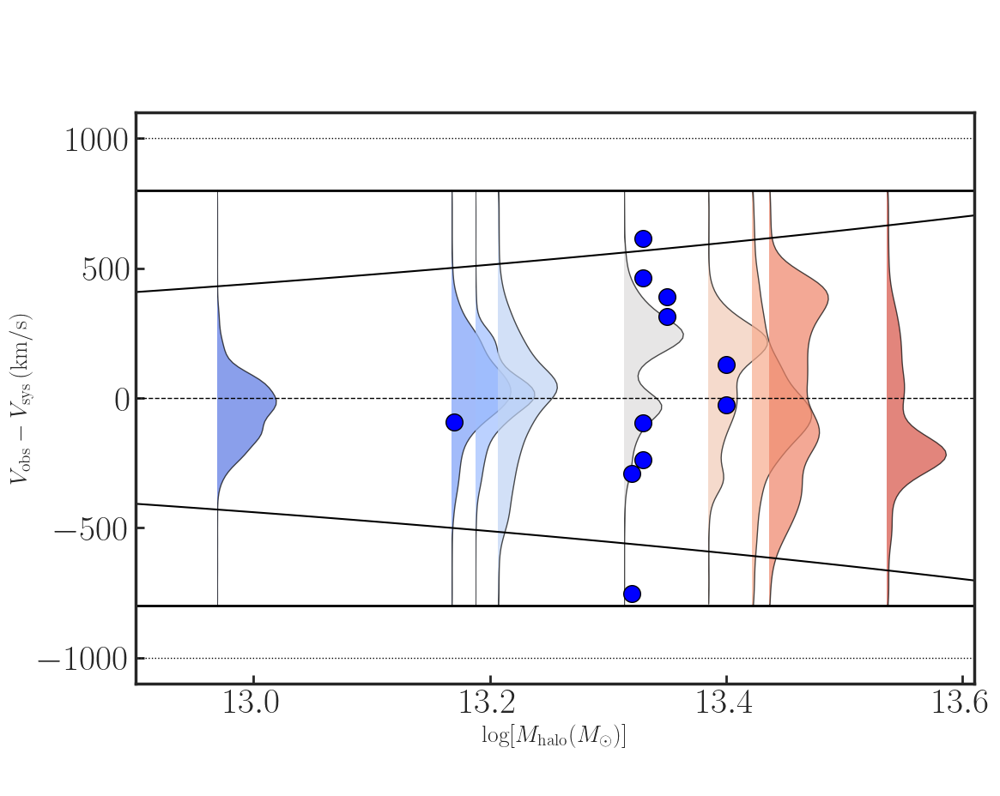

In [85]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.patches import Rectangle

# Paths
halo_file_path = '/Users/tsingh65/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines/TNG50_fitting_results/TNG_halos.txt'
base_dir = '/Users/tsingh65/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines/TNG50_fitting_results/fitting_combined_features_grp_only_800'

# Paths
halo_file_path = '../TNG50_fitting_results/TNG_halos.txt'
#base_dir = '../TNG50_fitting_results/fitting_combined_features_grp_only_800'
base_dir = '../TNG50_fitting_results/v_2500_data_filtered_v800_combined_gal_removed'


# Constants
h = 0.6774  # Hubble parameter
z = 0.09940180263022191  # Redshift
a = 1 / (1 + z)  # Scale factor


# Constants
H0 = 67.74  # Hubble constant in km/s/Mpc
c = 299792.458  # Speed of light in km/s
h = 0.6774  # Hubble parameter normalization
Omega_m = 0.315
Omega_Lambda = 1 - Omega_m

# J1424+4214 0.1000 OVI       1037   1    64.500  12.5000   -91.600 13.700  14.2500  0.0900   83.200  21.800  17.3000 

obs_data = pd.DataFrame({
    'Group': [
        'J0841+1406', 'J1017+4702', 'J1017+4702', 'J1127+2654', 
        'J1127+2654', 'J1216+0712', 'J1216+0712', 'J1301+2819', 
        'J1301+2819', 'J1343+2538', 'J1428+3225', 'J1412+4214'
    ],
    'Vel': [
        -752.900, 463.200, 615.700, -25.200, 127.700, 314.100, 
        390.000, -238.200, -96.700, 33.000, -291.900,-91.600
    ],
    'u_Vel': [
        14.700, 30.400, 23.800, 5.800, 8.100, 21.600, 18.600, 
        10.700, 15.900, 7.500, 8.100,13.700
    ],
    'N_OVI': [
        14.150, 13.670, 13.780, 14.480, 13.790, 13.830, 13.800, 
        13.650, 14.000, 13.600, 13.610,14.2500
    ],
    'N_OVI_err_low': [
        0.100, 0.260, 0.190, 0.040, 0.120, 0.300, 0.310, 
        0.190, 0.120, 0.110, 0.140,0.0900
    ],
    'N_OVI_err_high': [
        0.100, 0.260, 0.190, 0.040, 0.120, 0.300, 0.310, 
        0.190, 0.120, 0.110, 0.140,0.0900
    ],
    'Mass': [
        13.32, 13.33, 13.33, 13.40, 13.40, 13.35, 13.35, 
        13.33, 13.33, 12.85, 13.32,13.17
    ]
})


# Load halo data
halo_data = pd.read_csv(halo_file_path, sep='|', skipinitialspace=True)
halo_data.columns = halo_data.columns.str.strip()
halo_data['Grp_Index'] = halo_data.index

#Bin definitions
bins = {
    1: [11, 13],
    2: [12, 2],
    3: [10, 8],
    4: [7, 9],
    5: [6],
    6: [5],
    7: [1, 4],
    8: [3],
    9: [0]
}
# bins = {
#     1:[11],
#     2:[13],
#     3:[12],
#     4:[2],
#     5:[10],
#     6:[8],
#     7:[7],
#     8:[9],
#     9:[6],
#     10:[5],
#     11:[1],
#     12:[4],
#     13:[3],
#     14:[0] 

# }

# Escape velocity function
def escape_velocity(r_vir, mass):
    G = 4.30091e-6  # Gravitational constant in kpc * (km/s)^2 / M_sun
    return np.sqrt(2 * G * (10 ** mass) / r_vir)




# Prepare data for plotting
violin_data = []
violin_positions = []
mean_halo_masses = []
colors = sns.color_palette("coolwarm", len(bins))

for bin_id, group_indices in bins.items():
    bin_data = []
    for group_idx in group_indices:
        group_file = os.path.join(base_dir, f"group_{group_idx}_combined_features.txt")
        if not os.path.exists(group_file):
            print(f"File not found: {group_file}")
            continue

        group_df = pd.read_csv(group_file, sep='|', skipinitialspace=True)
        group_df.columns = group_df.columns.str.strip()
        group_df['dN'] = pd.to_numeric(group_df['dN'], errors='coerce')
        print(f"Group {group_idx} - {group_df.shape[0]} sightlines")

        # Filter for detections
        detected_data = group_df[~group_df['dN'].isna()]
        if detected_data.empty:
            continue

        # Get V_sys for the group
        v_sys_z_raw = halo_data.loc[group_idx, 'GroupVel(z,km/s/h)']
        print('GroupVel(z,km/s/h):',v_sys_z_raw)
    
        v_sys_z = v_sys_z_raw * 1/a  # Convert to physical velocity
        print(f'V_sys_z: {v_sys_z} unit: km/s')
        # detected_data['Velocity_Offset'] = detected_data['v'] - v_sys_z

        r_vir = halo_data.loc[group_idx, 'R_Crit200'] * 1e-3 / h  # Convert to physical Mpc
        print(f'R_vir: {r_vir}')

        delta_z_distance = 2 * r_vir  # Physical Mpc distance

        def H(z, H0=H0, Omega_m=Omega_m, Omega_Lambda=Omega_Lambda):
            return H0 * np.sqrt(Omega_m * (1 + z)**3 + Omega_Lambda)
        
        v_hubble_offset = delta_z_distance * H(z,H0 = 67.74, Omega_m = 0.3089, Omega_Lambda = 1 - 0.3089)
        print(f'Hubble_offset: {v_hubble_offset}')
        print('---------------\n')

        detected_data['Velocity_Offset'] = detected_data['v'] - v_hubble_offset - v_sys_z
        
    
        # Collect velocity offsets
        bin_data.extend(detected_data['Velocity_Offset'].values)

    if bin_data:
        violin_data.append(bin_data)
        violin_positions.append(np.mean([halo_data.loc[idx, 'M_Crit200_log'] for idx in group_indices if idx in halo_data.index]))

# Plot simulated data as violins
sns.set(style="ticks", font_scale=1.5)


plt.rc('font', family='Times New Roman')
plt.rcParams.update({
    'axes.labelsize': 32,
    'axes.titlesize': 22,
    'xtick.labelsize': 30,
    'ytick.labelsize': 30,
    'legend.fontsize': 30,
    'figure.titlesize': 22
})

fig, ax = plt.subplots(figsize=(12, 10))

for i, (pos, data) in enumerate(zip(violin_positions, violin_data)):
    parts = ax.violinplot(
        data, positions=[pos], widths=0.10, showmeans=False,
        showextrema=False, showmedians=False, bw_method=0.2
    )
    for pc in parts['bodies']:
        pc.set_clip_path(Rectangle((pos, -1500), 0.075, 3000, transform=plt.gca().transData))
        pc.set_facecolor(colors[i])
        pc.set_edgecolor('black')
        pc.set_alpha(0.7)

# # Overlay observational data with larger circles and error bars
# for _, row in obs_data.iterrows():
#     plt.errorbar(
#         row['Mass'], row['Vel'], yerr=row['u_Vel'], fmt='o', color='blue',
#         ecolor='black', elinewidth=3.5, capsize=5, markersize=15, label=None
#     )
# Overlay observational data with scatter points and circles representing error
import matplotlib.transforms as transforms
from matplotlib.patches import Circle

# Overlay observational data with scatter points and proper error circles
for _, row in obs_data.iterrows():
    # Scatter point
    plt.scatter(row['Mass'], row['Vel'], color='blue', edgecolor='black', s=200, zorder=3)  # Increased size

    # Add error circle in pixel units
    ax = plt.gca()
    trans = transforms.ScaledTranslation(0, 0, ax.transData)  # Data to pixel transformation
    pixel_radius = row['u_Vel'] * 20  # Adjust this scaling factor as needed for circle size in pixels

    circle = Circle(
        (row['Mass'], row['Vel']),
        radius=pixel_radius,
        transform=trans + ax.transData,
        color='blue',
        alpha=0.3,
        zorder=2,
    )
    ax.add_patch(circle)



def escape_velocity(r_vir, mass):
    G = 4.30091e-6  # Gravitational constant in kpc * (km/s)^2 / M_sun
    return np.sqrt(2 * G * (10 ** mass) / r_vir)

# Define halo mass range
halo_masses = np.linspace(12.83, 14.5, 100)

# Compute R_vir from M_vir using the given relation
R_vir_kpc = 957 * (10**halo_masses / 1e14) ** (1/3)  # in kpc

# Compute escape velocity for each mass
v_escape_values = [escape_velocity(R, M) for R, M in zip(R_vir_kpc, halo_masses)]


# # Add escape velocity curves
# halo_masses = np.linspace(12.9, 14.5, 100)
# v_escape_values = [escape_velocity(1000, mass) for mass in halo_masses]
ax.plot(halo_masses, v_escape_values, linestyle='-', color='black', label=r'$v_{\mathrm{esc}}$')
ax.plot(halo_masses, -np.array(v_escape_values), linestyle='-', color='black')

# Horizontal lines
ax.axhline(0, linestyle='--', color='black', linewidth=1)
ax.axhline(1000, linestyle=':', color='black', linewidth=1)
ax.axhline(-1000, linestyle=':', color='black', linewidth=1)

ax.axhline(800, linestyle='-', color='black', linewidth=2)
ax.axhline(-800, linestyle='-', color='black', linewidth=2)

# Customize axes
ax.set_xlabel(r'$\log[M_{\mathrm{halo}} (M_\odot)]$', fontsize=20)
ax.set_ylabel(r'$V_{\mathrm{obs}} - V_{\mathrm{sys}} \, (\mathrm{km/s})$', fontsize=20)

ax.set_ylim(-1100, 1100)
ax.set_xlim(12.9, 13.61)


ax.tick_params(axis='both', which='major', direction='in', width=2, length=7)
for spine in ax.spines.values():
    spine.set_linewidth(2.5)

ax.spines['top'].set_linewidth(2.5)
ax.spines['right'].set_linewidth(2.5)
ax.spines['bottom'].set_linewidth(2.5)
ax.spines['left'].set_linewidth(2.5)
plt.tight_layout()
# plt.ylim(780,800)
#plt.savefig('violin_plot_with_errorbars.png', dpi=300)
plt.show()

/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_52070/2524830913.py:142: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  detected_data['Velocity_Offset'] = detected_data['v'] - v_hubble_offset - v_sys_z


Group 11 => max Velocity_Offset = 792.998 km/s


/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_52070/2524830913.py:142: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  detected_data['Velocity_Offset'] = detected_data['v'] - v_hubble_offset - v_sys_z


Group 13 => max Velocity_Offset = 799.294 km/s
Bin 1 => max Velocity_Offset = 799.294 km/s



/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_52070/2524830913.py:142: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  detected_data['Velocity_Offset'] = detected_data['v'] - v_hubble_offset - v_sys_z


Group 12 => max Velocity_Offset = 799.599 km/s


/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_52070/2524830913.py:142: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  detected_data['Velocity_Offset'] = detected_data['v'] - v_hubble_offset - v_sys_z


Group 2 => max Velocity_Offset = 795.676 km/s
Bin 2 => max Velocity_Offset = 799.599 km/s



/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_52070/2524830913.py:142: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  detected_data['Velocity_Offset'] = detected_data['v'] - v_hubble_offset - v_sys_z


Group 10 => max Velocity_Offset = 799.593 km/s


/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_52070/2524830913.py:142: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  detected_data['Velocity_Offset'] = detected_data['v'] - v_hubble_offset - v_sys_z


Group 8 => max Velocity_Offset = 790.334 km/s
Bin 3 => max Velocity_Offset = 799.593 km/s

Group 7 => max Velocity_Offset = 797.631 km/s


/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_52070/2524830913.py:142: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  detected_data['Velocity_Offset'] = detected_data['v'] - v_hubble_offset - v_sys_z
/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_52070/2524830913.py:142: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  detected_data['Velocity_Offset'] = detected_data['v'] - v_hubble_offset - v_sys_z


Group 9 => max Velocity_Offset = 798.959 km/s
Bin 4 => max Velocity_Offset = 798.959 km/s



/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_52070/2524830913.py:142: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  detected_data['Velocity_Offset'] = detected_data['v'] - v_hubble_offset - v_sys_z
/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_52070/2524830913.py:142: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  detected_data['Velocity_Offset'] = detected_data['v'] - v_hubble_offset - v_sys_z


Group 6 => max Velocity_Offset = 795.087 km/s
Bin 5 => max Velocity_Offset = 795.087 km/s

Group 5 => max Velocity_Offset = 799.144 km/s
Bin 6 => max Velocity_Offset = 799.144 km/s



/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_52070/2524830913.py:142: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  detected_data['Velocity_Offset'] = detected_data['v'] - v_hubble_offset - v_sys_z


Group 1 => max Velocity_Offset = 795.001 km/s


/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_52070/2524830913.py:142: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  detected_data['Velocity_Offset'] = detected_data['v'] - v_hubble_offset - v_sys_z


Group 4 => max Velocity_Offset = 796.410 km/s
Bin 7 => max Velocity_Offset = 796.410 km/s



/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_52070/2524830913.py:142: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  detected_data['Velocity_Offset'] = detected_data['v'] - v_hubble_offset - v_sys_z


Group 3 => max Velocity_Offset = 799.913 km/s
Bin 8 => max Velocity_Offset = 799.913 km/s



/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_52070/2524830913.py:142: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  detected_data['Velocity_Offset'] = detected_data['v'] - v_hubble_offset - v_sys_z


Group 0 => max Velocity_Offset = 796.126 km/s
Bin 9 => max Velocity_Offset = 796.126 km/s



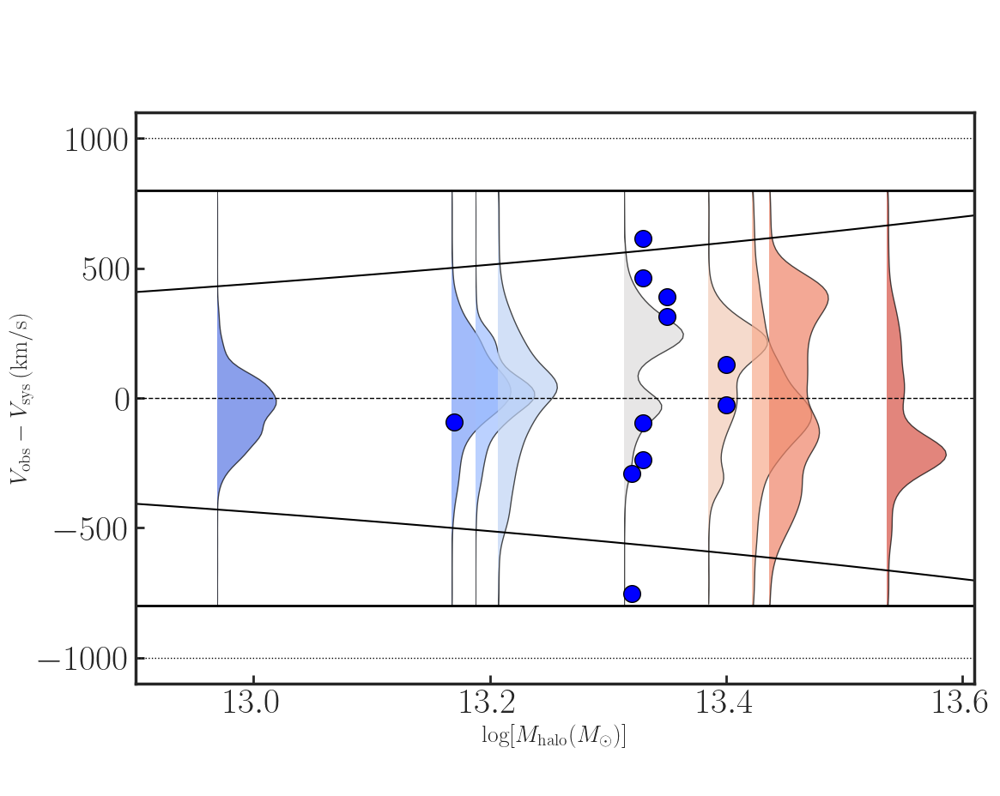


Bin-wise Maximum Velocity_Offset
Bin 1 => max Velocity_Offset = 799.294 km/s
Bin 2 => max Velocity_Offset = 799.599 km/s
Bin 3 => max Velocity_Offset = 799.593 km/s
Bin 4 => max Velocity_Offset = 798.959 km/s
Bin 5 => max Velocity_Offset = 795.087 km/s
Bin 6 => max Velocity_Offset = 799.144 km/s
Bin 7 => max Velocity_Offset = 796.410 km/s
Bin 8 => max Velocity_Offset = 799.913 km/s
Bin 9 => max Velocity_Offset = 796.126 km/s


In [198]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.patches import Rectangle
import matplotlib.transforms as transforms
from matplotlib.patches import Circle

# -------------------------
# Setup: constants/paths
# -------------------------
# Adjust paths as needed
halo_file_path = '../TNG50_fitting_results/TNG_halos.txt'
#base_dir = '../TNG50_fitting_results/fitting_combined_features_grp_only_800'
base_dir = '../TNG50_fitting_results/v_2500_data_filtered_v800_combined_gal_removed'


# Constants
H0 = 67.74  # Hubble constant in km/s/Mpc
c = 299792.458  # Speed of light in km/s
h = 0.6774      # Hubble parameter normalization
z = 0.09940180263022191  # Redshift
a = 1 / (1 + z)  # Scale factor
Omega_m = 0.315
Omega_Lambda = 1 - Omega_m

# -------------------------
# Example observational data
# -------------------------
obs_data = pd.DataFrame({
    'Group': [
        'J0841+1406', 'J1017+4702', 'J1017+4702', 'J1127+2654',
        'J1127+2654', 'J1216+0712', 'J1216+0712', 'J1301+2819',
        'J1301+2819', 'J1343+2538', 'J1428+3225', 'J1412+4214'
    ],
    'Vel': [
        -752.900, 463.200, 615.700, -25.200, 127.700, 314.100,
        390.000, -238.200, -96.700, 33.000, -291.900, -91.600
    ],
    'u_Vel': [
        14.700, 30.400, 23.800, 5.800, 8.100, 21.600, 18.600,
        10.700, 15.900, 7.500, 8.100, 13.700
    ],
    'N_OVI': [
        14.150, 13.670, 13.780, 14.480, 13.790, 13.830, 13.800,
        13.650, 14.000, 13.600, 13.610, 14.2500
    ],
    'N_OVI_err_low': [
        0.100, 0.260, 0.190, 0.040, 0.120, 0.300, 0.310,
        0.190, 0.120, 0.110, 0.140, 0.0900
    ],
    'N_OVI_err_high': [
        0.100, 0.260, 0.190, 0.040, 0.120, 0.300, 0.310,
        0.190, 0.120, 0.110, 0.140, 0.0900
    ],
    'Mass': [
        13.32, 13.33, 13.33, 13.40, 13.40, 13.35, 13.35,
        13.33, 13.33, 12.85, 13.32, 13.17
    ]
})

# -------------------------
# Load halo data
# -------------------------
halo_data = pd.read_csv(halo_file_path, sep='|', skipinitialspace=True)
halo_data.columns = halo_data.columns.str.strip()
halo_data['Grp_Index'] = halo_data.index

# -------------------------
# Bin definitions
# -------------------------
bins = {
    1: [11, 13],
    2: [12, 2],
    3: [10, 8],
    4: [7, 9],   # <--- This bin has groups 7 and 9 (the ones we will add extra points to)
    5: [6],
    6: [5],
    7: [1, 4],
    8: [3],
    9: [0]
}

# -------------------------
# Helper functions
# -------------------------
def escape_velocity(r_vir, mass):
    """
    Compute the escape velocity in km/s given:
    - r_vir in kpc
    - halo mass in log10(Msun)
    """
    G = 4.30091e-6  # in kpc * (km/s)^2 / Msun
    return np.sqrt(2 * G * (10 ** mass) / r_vir)

def H(redshift, H0=H0, Omega_m=Omega_m, Omega_Lambda=Omega_Lambda):
    """ Hubble parameter as a function of redshift. """
    return H0 * np.sqrt(Omega_m * (1 + redshift)**3 + Omega_Lambda)

# -------------------------
# Collect data for plotting
# -------------------------
violin_data = []
violin_positions = []
colors = sns.color_palette("coolwarm", len(bins))

# To store bin-wise maximum velocities
bin_max_velocities = {}

for bin_id, group_indices in bins.items():
    bin_data = []
    for group_idx in group_indices:
        group_file = os.path.join(base_dir, f"group_{group_idx}_combined_features.txt")
        if not os.path.exists(group_file):
            print(f"File not found: {group_file}")
            continue

        group_df = pd.read_csv(group_file, sep='|', skipinitialspace=True)
        group_df.columns = group_df.columns.str.strip()
        group_df['dN'] = pd.to_numeric(group_df['dN'], errors='coerce')
        
        # Only keep detections
        detected_data = group_df[~group_df['dN'].isna()]
        if detected_data.empty:
            continue

        # Extract group velocity from halo_data
        v_sys_z_raw = halo_data.loc[group_idx, 'GroupVel(z,km/s/h)']
        # Convert to physical velocity
        v_sys_z = v_sys_z_raw * 1/a

        # Physical R_vir in Mpc
        r_vir = halo_data.loc[group_idx, 'R_Crit200'] * 1e-3 / h
        # 2 * r_vir => total distance along line-of-sight
        delta_z_distance = 2 * r_vir
        
        # Compute the Hubble offset
        v_hubble_offset = delta_z_distance * H(z, 67.74, 0.3089, 1 - 0.3089)

        # Final velocity offset
        detected_data['Velocity_Offset'] = detected_data['v'] - v_hubble_offset - v_sys_z

        # ------------------------------------------------
        # Print the per-group maximum velocity offset
        # ------------------------------------------------
        group_max = detected_data['Velocity_Offset'].max()
        print(f"Group {group_idx} => max Velocity_Offset = {group_max:.3f} km/s")

        # ------------------------------------------------
        # If this is bin 4, for group 7 or 9, add extra points
        # ------------------------------------------------
        # 10 equally spaced points from the group's max up to ~800 km/s
        # if group_idx == 7:
        #     # range: 757.84 -> 800
        #     synthetic_points_7 = np.linspace(757.84, 800, 5)
        #     detected_data = pd.concat(
        #         [detected_data, 
        #          pd.DataFrame({'Velocity_Offset': synthetic_points_7})],
        #         ignore_index=True
        #     )
        # if group_idx == 9:
        #     # range: 784.491 -> 800
        #     synthetic_points_9 = np.linspace(784.491, 800, 5)
        #     detected_data = pd.concat(
        #         [detected_data, 
        #          pd.DataFrame({'Velocity_Offset': synthetic_points_9})],
        #         ignore_index=True
        #     )

        # Re-check the new group max after including synthetic points
        # group_max_after = detected_data['Velocity_Offset'].max()
        # # if group_idx in [7,9]:
        # #     print(f"Group {group_idx} => new max after synthetic points = {group_max_after:.3f} km/s")

        # Collect final data into bin_data
        bin_data.extend(detected_data['Velocity_Offset'].values)

    # ------------------------------------------------
    # After collecting all group velocities in this bin,
    # compute the bin-wise max and print
    # ------------------------------------------------
    if bin_data:
        bin_max = np.max(bin_data)
        bin_max_velocities[bin_id] = bin_max
        print(f"Bin {bin_id} => max Velocity_Offset = {bin_max:.3f} km/s\n")

        # For plotting: positions use mean halo mass (log10)
        mass_list = []
        for idx in group_indices:
            if idx in halo_data.index:
                mass_list.append(halo_data.loc[idx, 'M_Crit200_log'])
        if len(mass_list) > 0:
            violin_data.append(bin_data)
            violin_positions.append(np.mean(mass_list))

# ---------------------------------------------------------
# Plotting of the violins and observational data
# ---------------------------------------------------------
sns.set(style="ticks", font_scale=1.5)
plt.rc('font', family='Times New Roman')
plt.rcParams.update({
    'axes.labelsize': 32,
    'axes.titlesize': 22,
    'xtick.labelsize': 30,
    'ytick.labelsize': 30,
    'legend.fontsize': 30,
    'figure.titlesize': 22
})

fig, ax = plt.subplots(figsize=(12, 10))

for i, (pos, data) in enumerate(zip(violin_positions, violin_data)):
    parts = ax.violinplot(
        data, positions=[pos], widths=0.10, showmeans=False,
        showextrema=False, showmedians=False, bw_method=0.2
    )
    for pc in parts['bodies']:
        # Clip the violin to a limited y-range
        pc.set_clip_path(Rectangle((pos, -1500), 0.075, 3000, transform=ax.transData))
        pc.set_facecolor(colors[i])
        pc.set_edgecolor('black')
        pc.set_alpha(0.7)

# Scatter observational points + circles for uncertainty
for _, row in obs_data.iterrows():
    ax.scatter(row['Mass'], row['Vel'], color='blue', edgecolor='black', s=200, zorder=3)
    trans = transforms.ScaledTranslation(0, 0, ax.transData)
    pixel_radius = row['u_Vel'] * 20  
    circle = Circle(
        (row['Mass'], row['Vel']),
        radius=pixel_radius,
        transform=trans + ax.transData,
        color='blue',
        alpha=0.3,
        zorder=2,
    )
    ax.add_patch(circle)

# Plot the escape velocity lines
halo_masses = np.linspace(12.83, 14.5, 100)
R_vir_kpc = 957 * (10**halo_masses / 1e14) ** (1/3)
v_escape_values = [escape_velocity(R, M) for R, M in zip(R_vir_kpc, halo_masses)]
ax.plot(halo_masses, v_escape_values, linestyle='-', color='black', label=r'$v_{\mathrm{esc}}$')
ax.plot(halo_masses, -np.array(v_escape_values), linestyle='-', color='black')

# Draw horizontal lines
ax.axhline(0, linestyle='--', color='black', linewidth=1)
ax.axhline(1000, linestyle=':', color='black', linewidth=1)
ax.axhline(-1000, linestyle=':', color='black', linewidth=1)
ax.axhline(800, linestyle='-', color='black', linewidth=2)
ax.axhline(-800, linestyle='-', color='black', linewidth=2)

# Axis labeling
ax.set_xlabel(r'$\log[M_{\mathrm{halo}} (M_\odot)]$', fontsize=20)
ax.set_ylabel(r'$V_{\mathrm{obs}} - V_{\mathrm{sys}} \, (\mathrm{km/s})$', fontsize=20)
ax.set_ylim(-1100, 1100)
ax.set_xlim(12.9, 13.61)

ax.tick_params(axis='both', which='major', direction='in', width=2, length=7)
for spine in ax.spines.values():
    spine.set_linewidth(2.5)

plt.tight_layout()
plt.show()

# ---------------------------------------------------------
# If needed, here is a quick summary of the bin-wise max:
# ---------------------------------------------------------
print("\n==============================")
print("Bin-wise Maximum Velocity_Offset")
print("==============================")
for b, val in bin_max_velocities.items():
    print(f"Bin {b} => max Velocity_Offset = {val:.3f} km/s")

Group 11 systemic velocity (EW-weighted): -2.96 km/s
Group 13 systemic velocity (EW-weighted): 48.96 km/s
Group 12 systemic velocity (EW-weighted): 106.39 km/s
Group 2 systemic velocity (EW-weighted): 169.02 km/s
Group 10 systemic velocity (EW-weighted): 128.24 km/s
Group 8 systemic velocity (EW-weighted): 59.83 km/s
Group 7 systemic velocity (EW-weighted): 289.57 km/s
Group 9 systemic velocity (EW-weighted): 122.40 km/s
Group 6 systemic velocity (EW-weighted): 211.90 km/s
Group 5 systemic velocity (EW-weighted): 202.19 km/s
Group 1 systemic velocity (EW-weighted): -69.22 km/s
Group 4 systemic velocity (EW-weighted): 165.26 km/s
Group 3 systemic velocity (EW-weighted): 98.76 km/s
Group 0 systemic velocity (EW-weighted): 20.21 km/s


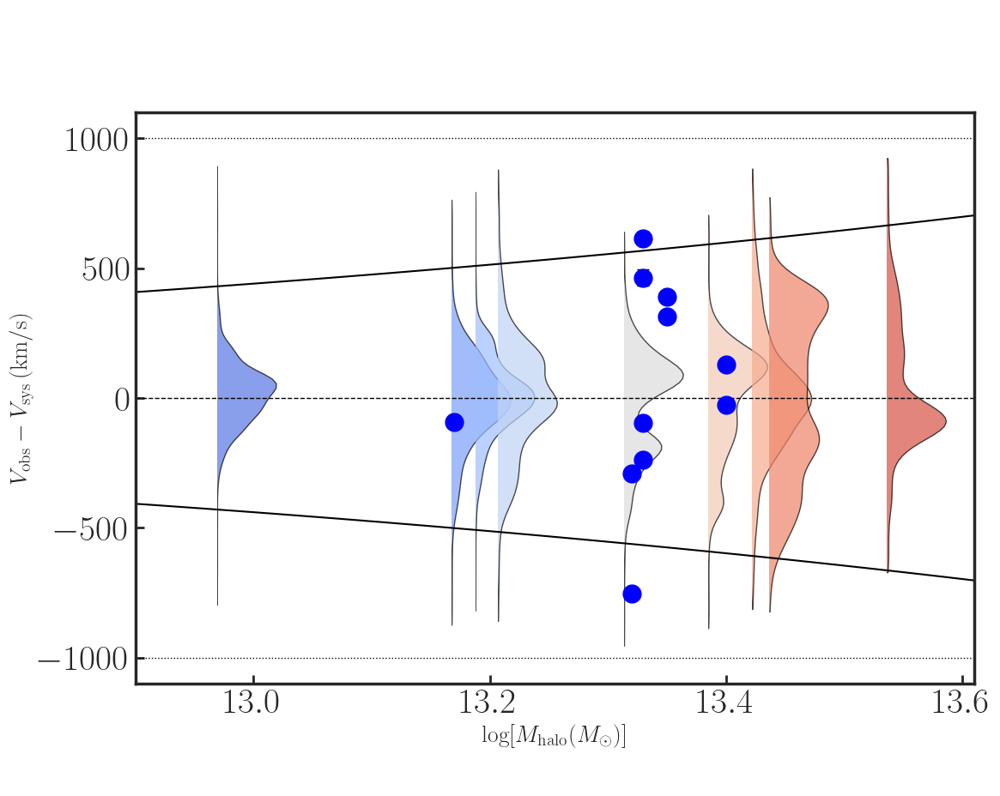

In [81]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.patches import Rectangle, Circle
import matplotlib.transforms as transforms

# Paths (update as needed)
halo_file_path = '../TNG50_fitting_results/TNG_halos.txt'
# base_dir = '../TNG50_fitting_results/fitting_combined_features_grp_only'
base_dir = '../TNG50_fitting_results/v_2500_data_filtered_v800_combined_gal_removed'


# Constants
h = 0.6774  # Hubble parameter
z = 0.09940180263022191  # Redshift
a = 1 / (1 + z)  # Scale factor

# Example observational data
obs_data = pd.DataFrame({
    'Group': [
        'J0841+1406', 'J1017+4702', 'J1017+4702', 'J1127+2654', 
        'J1127+2654', 'J1216+0712', 'J1216+0712', 'J1301+2819', 
        'J1301+2819', 'J1343+2538', 'J1428+3225', 'J1412+4214'
    ],
    'Vel': [
        -752.900, 463.200, 615.700, -25.200, 127.700, 314.100, 
        390.000, -238.200, -96.700, 33.000, -291.900, -91.600
    ],
    'u_Vel': [
        14.700, 30.400, 23.800, 5.800, 8.100, 21.600, 18.600, 
        10.700, 15.900, 7.500, 8.100, 13.700
    ],
    'N_OVI': [
        14.150, 13.670, 13.780, 14.480, 13.790, 13.830, 13.800, 
        13.650, 14.000, 13.600, 13.610, 14.250
    ],
    'N_OVI_err_low': [
        0.100, 0.260, 0.190, 0.040, 0.120, 0.300, 0.310, 
        0.190, 0.120, 0.110, 0.140, 0.090
    ],
    'N_OVI_err_high': [
        0.100, 0.260, 0.190, 0.040, 0.120, 0.300, 0.310, 
        0.190, 0.120, 0.110, 0.140, 0.090
    ],
    'Mass': [
        13.32, 13.33, 13.33, 13.40, 13.40, 13.35, 13.35, 
        13.33, 13.33, 12.85, 13.32, 13.17
    ]
})

# Load halo data
halo_data = pd.read_csv(halo_file_path, sep='|', skipinitialspace=True)
halo_data.columns = halo_data.columns.str.strip()
halo_data['Grp_Index'] = halo_data.index

# Define bins/groups (example dictionary; adjust the group indices as needed)
bins = {
    1: [11, 13],
    2: [12, 2],
    3: [10, 8],
    4: [7, 9],
    5: [6],
    6: [5],
    7: [1, 4],
    8: [3],
    9: [0]
}

# Prepare lists for violin data and positions
violin_data = []
violin_positions = []
mean_halo_masses = []
colors = sns.color_palette("coolwarm", len(bins))

# Loop over each bin (group)
for bin_id, group_indices in bins.items():
    bin_data = []
    for group_idx in group_indices:
        group_file = os.path.join(base_dir, f"group_{group_idx}_combined_features.txt")
        if not os.path.exists(group_file):
            print(f"File not found: {group_file}")
            continue

        group_df = pd.read_csv(group_file, sep='|', skipinitialspace=True)
        group_df.columns = group_df.columns.str.strip()
        group_df['dN'] = pd.to_numeric(group_df['dN'], errors='coerce')
        
        # Filter for detections
        detected_data = group_df[~group_df['dN'].isna()].copy()
        if detected_data.empty:
            continue
        
        # Compute EW-weighted systemic velocity for this group.
        # Assumes the group file contains a column 'v' for component velocity and 'EW(mA)' for equivalent width in mÅ.
        if 'EW(mA)' in detected_data.columns and 'v' in detected_data.columns:
            # Ensure numeric
            detected_data['v'] = pd.to_numeric(detected_data['v'], errors='coerce')
            detected_data['EW(mA)'] = pd.to_numeric(detected_data['EW(mA)'], errors='coerce')
            # Drop rows with missing values in these columns
            detected_data = detected_data.dropna(subset=['v', 'EW(mA)'])
            if not detected_data.empty and detected_data['EW(mA)'].sum() != 0:
                v_systemic = (detected_data['v'] * detected_data['EW(mA)']).sum() / detected_data['EW(mA)'].sum()
            else:
                v_systemic = 0.0
        else:
            v_systemic = 0.0

        print(f"Group {group_idx} systemic velocity (EW-weighted): {v_systemic:.2f} km/s")

        # Now subtract the computed systemic velocity from each detection
        detected_data['Velocity_Offset'] = detected_data['v'] - v_systemic

        # Collect the velocity offsets
        bin_data.extend(detected_data['Velocity_Offset'].values)

    if bin_data:
        violin_data.append(bin_data)
        # Here we compute the mean halo mass for this bin using the halo_data.
        mean_mass_list = [halo_data.loc[idx, 'M_Crit200_log'] for idx in group_indices if idx in halo_data.index]
        if mean_mass_list:
            mean_halo = np.mean(mean_mass_list)
        else:
            mean_halo = np.nan
        violin_positions.append(mean_halo)

# Plot simulated data as violins
sns.set(style="ticks", font_scale=1.5)
plt.rc('font', family='Times New Roman')
plt.rcParams.update({
    'axes.labelsize': 32,
    'axes.titlesize': 22,
    'xtick.labelsize': 30,
    'ytick.labelsize': 30,
    'legend.fontsize': 30,
    'figure.titlesize': 22
})

fig, ax = plt.subplots(figsize=(12, 10))

for i, (pos, data) in enumerate(zip(violin_positions, violin_data)):
    parts = ax.violinplot(
        data, positions=[pos], widths=0.10, showmeans=False,
        showextrema=False, showmedians=False, bw_method=0.2
    )
    for pc in parts['bodies']:
        # Set a clip rectangle (customize as needed)
        pc.set_clip_path(Rectangle((pos, -1500), 0.075, 3000, transform=plt.gca().transData))
        pc.set_facecolor(colors[i])
        pc.set_edgecolor('black')
        pc.set_alpha(0.7)

# Overlay observational data (optional)
for _, row in obs_data.iterrows():
    plt.errorbar(
        row['Mass'], row['Vel'], yerr=row['u_Vel'], fmt='o', color='blue',
        ecolor='black', elinewidth=3.5, capsize=5, markersize=15, label=None
    )

# Add an escape velocity curve for reference
def escape_velocity(r_vir, mass):
    G = 4.30091e-6  # kpc * (km/s)^2 / M_sun
    return np.sqrt(2 * G * (10 ** mass) / r_vir)

# Example: Compute v_escape for a range of halo masses
halo_masses = np.linspace(12.9, 13.61, 100)
R_vir_kpc = 957 * (10 ** halo_masses / 1e14) ** (1/3)  # in kpc
v_escape_values = [escape_velocity(R, M) for R, M in zip(R_vir_kpc, halo_masses)]

ax.plot(halo_masses, v_escape_values, linestyle='-', color='black', label=r'$v_{\mathrm{esc}}$')
ax.plot(halo_masses, -np.array(v_escape_values), linestyle='-', color='black')

ax.axhline(0, linestyle='--', color='black', linewidth=1)
ax.axhline(1000, linestyle=':', color='black', linewidth=1)
ax.axhline(-1000, linestyle=':', color='black', linewidth=1)

ax.set_xlabel(r'$\log[M_{\mathrm{halo}} (M_\odot)]$', fontsize=20)
ax.set_ylabel(r'$V_{\mathrm{obs}} - V_{\mathrm{sys}} \, (\mathrm{km/s})$', fontsize=20)
ax.set_ylim(-1100, 1100)
ax.set_xlim(12.9, 13.61)
ax.tick_params(axis='both', which='major', direction='in', width=2, length=7)
for spine in ax.spines.values():
    spine.set_linewidth(2.5)

plt.tight_layout()
plt.show()

        Group    Vel  u_Vel  N_OVI  N_OVI_err_low  N_OVI_err_high   Mass
0  J0841+1406 -752.9   14.7  14.15            0.1             0.1  13.32
        Group    Vel  u_Vel  N_OVI  N_OVI_err_low  N_OVI_err_high   Mass
1  J1017+4702  463.2   30.4  13.67           0.26            0.26  13.33
2  J1017+4702  615.7   23.8  13.78           0.19            0.19  13.33
        Group    Vel  u_Vel  N_OVI  N_OVI_err_low  N_OVI_err_high  Mass
3  J1127+2654  -25.2    5.8  14.48           0.04            0.04  13.4
4  J1127+2654  127.7    8.1  13.79           0.12            0.12  13.4
        Group    Vel  u_Vel  N_OVI  N_OVI_err_low  N_OVI_err_high   Mass
5  J1216+0712  314.1   21.6  13.83           0.30            0.30  13.35
6  J1216+0712  390.0   18.6  13.80           0.31            0.31  13.35
        Group    Vel  u_Vel  N_OVI  N_OVI_err_low  N_OVI_err_high   Mass
7  J1301+2819 -238.2   10.7  13.65           0.19            0.19  13.33
8  J1301+2819  -96.7   15.9  14.00           0.12     

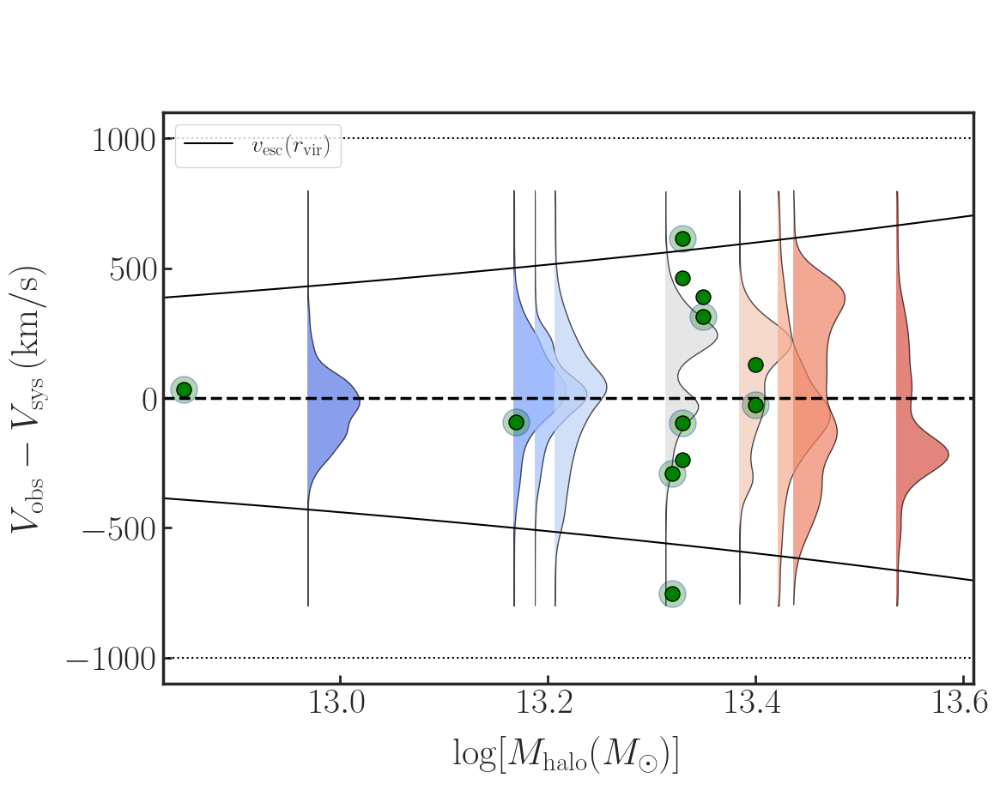

In [199]:
# Plot simulated data as violins
sns.set(style="ticks", font_scale=1.5)


plt.rc('font', family='Times New Roman')
plt.rcParams.update({
    'axes.labelsize': 32,
    'axes.titlesize': 22,
    'xtick.labelsize': 30,
    'ytick.labelsize': 30,
    'legend.fontsize': 30,
    'figure.titlesize': 22
})

fig, ax = plt.subplots(figsize=(12, 10))

for i, (pos, data) in enumerate(zip(violin_positions, violin_data)):
    parts = ax.violinplot(
        data, positions=[pos], widths=0.10, showmeans=False,
        showextrema=False, showmedians=False, bw_method=0.2
    )
    for pc in parts['bodies']:
        pc.set_clip_path(Rectangle((pos, -1500), 0.075, 3000, transform=plt.gca().transData))
        pc.set_facecolor(colors[i])
        pc.set_edgecolor('black')
        pc.set_alpha(0.7)

# # Overlay observational data with larger circles and error bars
# for _, row in obs_data.iterrows():
#     plt.errorbar(
#         row['Mass'], row['Vel'], yerr=row['u_Vel'], fmt='o', color='blue',
#         ecolor='black', elinewidth=3.5, capsize=5, markersize=15, label=None
#     )
# Overlay observational data with scatter points and circles representing error


# Group data by Group name
grouped_data = obs_data.groupby('Group')

# Plot individual scatter points and highlight maximum column density in each group
for group_name, group_df in grouped_data:
    # Scatter plot for all rows in the group
    print(group_df)
    ax.scatter(
        group_df['Mass'], group_df['Vel'], color='green', edgecolor='black', s=150, zorder=3,
    )

    # Identify the row with the maximum column density
    max_row = group_df.loc[group_df['N_OVI'].idxmax()]

    # Highlight the maximum column density with a less opaque circle
    ax.scatter(
        max_row['Mass'], max_row['Vel'], color='green', edgecolor='blue', alpha=0.3,
        s=500, zorder=2
    )


# Define halo mass range
halo_masses = np.linspace(12.83, 14.5, 100)

# Compute R_vir from M_vir using the given relation
R_vir_kpc = 957 * (10**halo_masses / 1e14) ** (1/3)  # in kpc

# Compute escape velocity for each mass
v_escape_values = [escape_velocity(R, M) for R, M in zip(R_vir_kpc, halo_masses)]


# Add escape velocity curves
# halo_masses = np.linspace(12.83, 14.5, 100)
# v_escape_values = [escape_velocity(1000, mass) for mass in halo_masses]
ax.plot(halo_masses, v_escape_values, linestyle='-', color='black', label=r'$v_{\mathrm{esc}}(r_{\mathrm{vir}})$')
ax.plot(halo_masses, -np.array(v_escape_values), linestyle='-', color='black')

# Horizontal lines
ax.axhline(0, linestyle='--', color='black', linewidth=2.5)
ax.axhline(1000, linestyle=':', color='black', linewidth=1.5)
ax.axhline(-1000, linestyle=':', color='black', linewidth=1.5)

# Customize axes
ax.set_xlabel(r'$\log[M_{\mathrm{halo}} (M_\odot)]$',labelpad=14)
ax.set_ylabel(r'$V_{\mathrm{obs}} - V_{\mathrm{sys}} \, (\mathrm{km/s})$',labelpad=15)

ax.set_ylim(-1100, 1100)
ax.set_xlim(12.83, 13.61)


ax.tick_params(axis='both', which='major', direction='in', width=2, length=7)
for spine in ax.spines.values():
    spine.set_linewidth(2.5)

ax.spines['top'].set_linewidth(2.5)
ax.spines['right'].set_linewidth(2.5)
ax.spines['bottom'].set_linewidth(2.5)
ax.spines['left'].set_linewidth(2.5)
plt.tight_layout()
plt.legend(loc='upper left', fontsize=20)
output_dir = '/Users/tsingh65/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines/TNG50_fitting_results/Plots_gal_removed'
#plt.savefig(os.path.join(output_dir, 'vel_vs_halo_mass.png'), dpi=400)
#plt.savefig('violin_plot_with_errorbars.png', dpi=300)
plt.show()

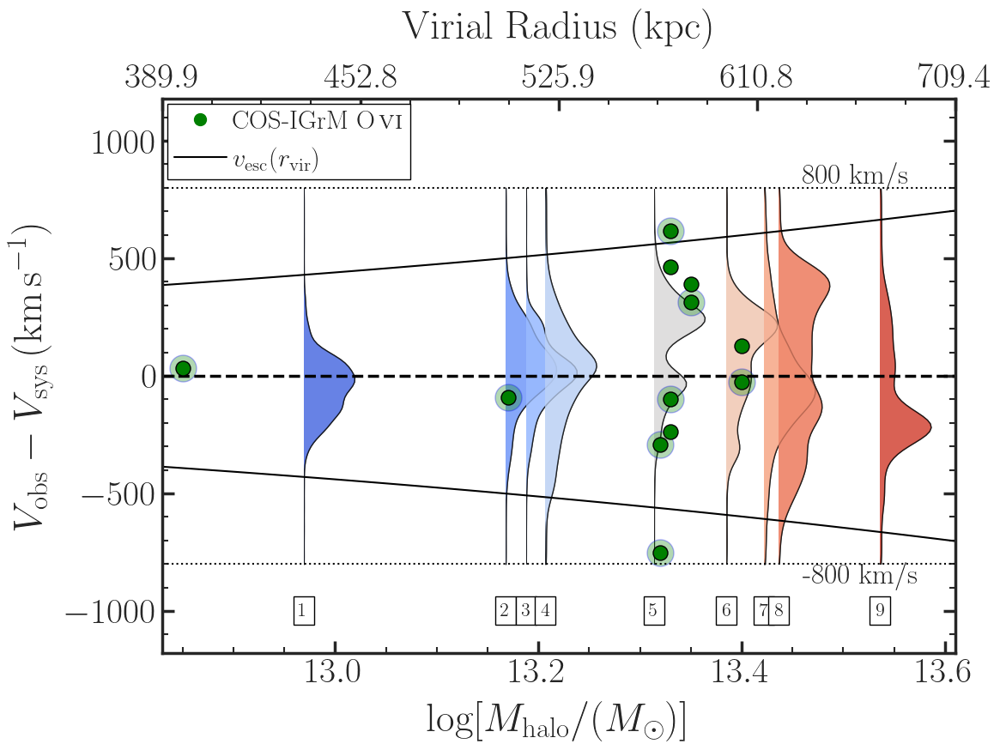

In [200]:
# Import necessary module for creating custom legend handles
# Plot simulated data as violins

sns.set(style="ticks", font_scale=1.5)


plt.rc('font', family='Times New Roman')
# enable LaTeX rendering
plt.rc('text', usetex=True)
plt.rcParams.update({
    'axes.labelsize': 32,
    'axes.titlesize': 22,
    'xtick.labelsize': 30,
    'ytick.labelsize': 30,
    'legend.fontsize': 30,
    'figure.titlesize': 22
})

fig, ax = plt.subplots(figsize=(12, 10))

for i, (pos, data) in enumerate(zip(violin_positions, violin_data)):
    parts = ax.violinplot(
        data, positions=[pos], widths=0.10, showmeans=False,
        showextrema=False, showmedians=False, bw_method=0.2
    )
    for pc in parts['bodies']:
        pc.set_clip_path(Rectangle((pos, -1500), 0.075, 3000, transform=plt.gca().transData))
        pc.set_facecolor(colors[i])
        pc.set_edgecolor('black')
        pc.set_alpha(0.7)
        
from matplotlib.patches import Patch

# Import necessary module for creating custom legend handles
from matplotlib.lines import Line2D

# Define a custom legend handle for COS-IGrM O VI
cos_igm_handle = Line2D([], [], color='green', marker='o', linestyle='None',
                        markersize=10, label=r'COS-IGrM O\,\textsc{vi}')

# # Define a custom legend handle for the highlighted maximum column density
# highlight_handle = Line2D([], [], color='green', marker='o', linestyle='None',
#                      
# markersize=15, alpha=0.3)
# Define halo mass range
halo_masses = np.linspace(12.83, 14.5, 100)

# Compute R_vir from M_vir using the given relation
R_vir_kpc = 957 * (10**halo_masses / 1e14) ** (1/3)  # in kpc

# Compute escape velocity for each mass
v_escape_values = [escape_velocity(R, M) for R, M in zip(R_vir_kpc, halo_masses)]



# # Add escape velocity curves
# halo_masses = np.linspace(12.83, 14.5, 100)
# v_escape_values = [escape_velocity(1000, mass) for mass in halo_masses]
v_escape_handle, = ax.plot(halo_masses, v_escape_values, linestyle='-', color='black', label=r'$v_{\mathrm{esc}}(r_{\mathrm{vir}})$')
ax.plot(halo_masses, -np.array(v_escape_values), linestyle='-', color='black')

# Group data by Group name
grouped_data = obs_data.groupby('Group')

# Plot individual scatter points and highlight maximum column density in each group
for group_name, group_df in grouped_data:
    # Scatter plot for all rows in the group
    ax.scatter(
        group_df['Mass'], group_df['Vel'], color='green', edgecolor='black', s=150, zorder=3,
    )

    # Identify the row with the maximum column density
    max_row = group_df.loc[group_df['N_OVI'].idxmax()]

    # Highlight the maximum column density with a less opaque circle
    ax.scatter(
        max_row['Mass'], max_row['Vel'], color='green', edgecolor='blue', alpha=0.3,
        s=500, zorder=2
    )

# Horizontal lines
ax.axhline(0, linestyle='--', color='black', linewidth=2.5)
ax.axhline(800, linestyle=':', color='black', linewidth=1.5)
# write text for 1000 km/s
ax.text(13.46, 1050-200, '800 km/s', fontsize=24, va='center', ha='left')


ax.axhline(-800, linestyle=':', color='black', linewidth=1.5)
ax.text(13.46, -1050+200, '-800 km/s', fontsize=24, va='center', ha='left')

# Customize axes
ax.set_xlabel(r'$\log[M_{\mathrm{halo}} /(M_\odot)]$', labelpad=10, fontsize=34)
ax.set_ylabel(r'$V_{\mathrm{obs}} - V_{\mathrm{sys}} \, (\mathrm{km\,s^{-1}})$', labelpad=10, fontsize=34)

ax.set_ylim(-1280+200, 1280-200)
ax.set_xlim(12.83, 13.61)

ax.tick_params(axis='both', which='major', direction='in', width=2, length=7)
for spine in ax.spines.values():
    spine.set_linewidth(2.5)
    

ax.spines['top'].set_linewidth(2.5)
ax.spines['right'].set_linewidth(2.5)
ax.spines['bottom'].set_linewidth(2.5)
ax.spines['left'].set_linewidth(2.5)


# Add secondary x-axis for R_vir (no logarithmic scale for the twin axis)
ax2 = ax.twiny()
ax2.set_xlim(ax.get_xlim())  # Match the bottom axis range

# Compute virial mass values for tick positions
log_mvir_vals = np.linspace(12.83, 13.61, 5)  # 5 evenly spaced log points
mvir_vals = 10**log_mvir_vals  # Convert to linear scale

# Compute corresponding R_vir values (in kpc)
rvir_kpc_vals_corrected = 957 * (mvir_vals / 1e14) ** (1/3)

# Set tick positions (based on virial mass in log space) and labels (R_vir in kpc)
ax2.set_xticks(log_mvir_vals)  # Use log-space locations for consistency
ax2.set_xticklabels([f'{rvir:.1f}' for rvir in rvir_kpc_vals_corrected], fontsize=30)

# Customize tick appearance for the top x-axis
ax2.tick_params(axis='x', which='both', direction='in', length=5, width=2.5)

# Add label for the top x-axis
ax2.set_xlabel(r'Virial Radius (kpc)', fontsize=34, labelpad=20)


for i, (pos, data) in enumerate(zip(violin_positions, violin_data)):
    parts = ax.violinplot(
        data, positions=[pos], widths=0.10, showmeans=False,
        showextrema=False, showmedians=False, bw_method=0.2
    )
    for pc in parts['bodies']:
        pc.set_clip_path(Rectangle((pos, -1500), 0.075, 3000, transform=plt.gca().transData))
        pc.set_facecolor(colors[i])
        pc.set_edgecolor('black')
        pc.set_alpha(0.7)
    
    pos_y = {
        1: -1220,
        2: -1220,
        3: -1220,
        4: -1220,
        5: -1220,
        6: -1220,
        7: -1220,
        8: -1220,
        9: -1220
    }
    # subtract 200 from the y position to adjust the text position
    pos_y = {key: value+220 for key, value in pos_y.items()}
    
    # Add bin number at the bottom of each violin at y = -1100
    if i+1 in pos_y:
        ax.text(pos, pos_y[i+1], f'{i+1}', fontsize=16, ha='center', va='center',
                bbox=dict(facecolor='white', edgecolor='black', boxstyle='square,pad=0.3'))


plt.tight_layout()

from matplotlib.ticker import AutoMinorLocator

# Enable major and minor ticks on all four axes
ax.tick_params(axis='both', which='major', direction='in', length=10, width=2.5)  # Bottom and left axes major ticks
ax.tick_params(axis='both', which='minor', direction='in', length=5, width=1.5)  # Bottom and left axes minor ticks
ax.tick_params(axis='y', which='major', direction='in', length=10, width=2.5,right=True)  # Top axis major ticks
ax.tick_params(axis='y', which='minor', direction='in', length=5, width=1.5,right=True)  # Top axis minor ticks

ax2.tick_params(axis='x', which='major', direction='in', length=10, width=2.5)  # Top axis major ticks
ax2.tick_params(axis='x', which='minor', direction='in', length=5, width=1.5)  # Top axis minor ticks

# Add minor tick locators for all axes
ax.yaxis.set_minor_locator(AutoMinorLocator())  # Enable minor ticks for left axis
ax.xaxis.set_minor_locator(AutoMinorLocator())  # Enable minor ticks for bottom axis
ax2.xaxis.set_minor_locator(AutoMinorLocator())  # Enable minor ticks for top axis
ax2.yaxis.set_minor_locator(AutoMinorLocator())  # Enable minor ticks for right axis


plt.legend(handles=[cos_igm_handle, v_escape_handle], loc='upper left',frameon=True,framealpha=1, edgecolor='black',
           fancybox=False, shadow=False, borderpad=0.25,borderaxespad=0.2, handletextpad=0.25, fontsize=22)
plt.ylim(-1380+200, 1380-200)

# Save and display the plot
output_dir = '../TNG50_fitting_results/Plots_gal_removed_new'
plt.savefig(os.path.join(output_dir, 'vel_vs_halo_mass_vel.pdf'), dpi=400)
plt.show()

In [201]:
bin_fractions = []
total_exceed = 0
total_count = 0

for pos, data in zip(violin_positions, violin_data):
    # pos is the mean log halo mass for the bin.
    # Compute the corresponding virial radius (in kpc) using the relation:
    # R_vir = 957 * (10**(mass) / 1e14)^(1/3)
    r_vir = 957 * (10**pos / 1e14)**(1/3)
    # Compute the escape velocity for the bin using the escape_velocity function.
    v_esc = escape_velocity(r_vir, pos)
    
    # Convert data list to a NumPy array for ease of calculation.
    data_array = np.array(data)
    
    # Count how many absorbers in the bin have an absolute velocity offset exceeding v_esc.
    count_exceed = np.sum(np.abs(data_array) > v_esc)
    fraction = count_exceed / len(data_array)
    bin_fractions.append(fraction)
    
    total_exceed += count_exceed
    total_count += len(data_array)
    
    print(f"Bin with mean mass {pos:.2f}: v_esc = {v_esc:.2f} km/s, fraction = {fraction:.9f}")



overall_fraction = total_exceed / total_count if total_count > 0 else 0
# calculate the dispersion of the fraction

bin_fractions = 1- np.array(bin_fractions) 
print(bin_fractions)
dispersion = np.std(bin_fractions)
print(f"\nDispersion of the fraction: {dispersion:.9f}")
print(f"\nOverall fraction of simulation absorbers outside escape velocity: {overall_fraction:.9f}")

Bin with mean mass 12.97: v_esc = 429.73 km/s, fraction = 0.010974758
Bin with mean mass 13.17: v_esc = 500.46 km/s, fraction = 0.012910028
Bin with mean mass 13.19: v_esc = 508.24 km/s, fraction = 0.009643365
Bin with mean mass 13.21: v_esc = 515.79 km/s, fraction = 0.026966114
Bin with mean mass 13.31: v_esc = 559.81 km/s, fraction = 0.007574358
Bin with mean mass 13.38: v_esc = 591.23 km/s, fraction = 0.011937833
Bin with mean mass 13.42: v_esc = 608.40 km/s, fraction = 0.027365220
Bin with mean mass 13.44: v_esc = 615.08 km/s, fraction = 0.014335824
Bin with mean mass 13.54: v_esc = 664.04 km/s, fraction = 0.020389531
[0.98902524 0.98708997 0.99035663 0.97303389 0.99242564 0.98806217
 0.97263478 0.98566418 0.97961047]

Dispersion of the fraction: 0.006942297

Overall fraction of simulation absorbers outside escape velocity: 0.013852674


In [202]:
import numpy as np
import scipy.stats as stats
import scipy.signal as signal
import pandas as pd
# Function to find peaks in the distributions
def find_distribution_peaks(data):
    kde = stats.gaussian_kde(data)  # Kernel Density Estimate
    x_vals = np.linspace(np.min(data), np.max(data), 1000)
    kde_vals = kde(x_vals)

    # Find local maxima (peaks)
    peaks, _ = signal.find_peaks(kde_vals)
    peak_positions = x_vals[peaks]

    # Get up to 3 most prominent peaks, pad with NaN if fewer are found
    peak_values = sorted(peak_positions, key=lambda x: kde(x), reverse=True)[:3]
    while len(peak_values) < 3:
        peak_values.append(np.nan)

    return peak_values

# Compute peaks for each bin
bin_peaks = {pos: find_distribution_peaks(data) for pos, data in zip(violin_positions, violin_data)}

# Convert to DataFrame and display
peaks_df = pd.DataFrame.from_dict(bin_peaks, orient='index', columns=['Peak 1', 'Peak 2', 'Peak 3'])

# Print the result
print(peaks_df)

               Peak 1      Peak 2      Peak 3
12.969080  -13.862806 -127.512668 -465.260850
13.167602   23.111139 -550.048945  749.967783
13.187695   11.053380 -585.549957  706.824029
13.206904   42.156429  592.558566  686.958932
13.313600  243.257205  -29.467898  667.496256
13.384746  217.942678   -1.799250 -310.711815
13.422042  -63.249793         NaN         NaN
13.436270  396.247118 -130.273116   88.312557
13.536072 -217.503699   41.091712 -490.465521


/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_52070/455466597.py:66: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  detected_absorbers['Absolute_Velocity_Offset'] = np.abs(detected_absorbers['v'] - group_velocity_z)
/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_52070/455466597.py:66: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  detected_absorbers['Absolute_Velocity_Offset'] = np.abs(detected_absorbers['v'] - group_velocity_z)
/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykern

Total number of detected absorbers being plotted: 247750


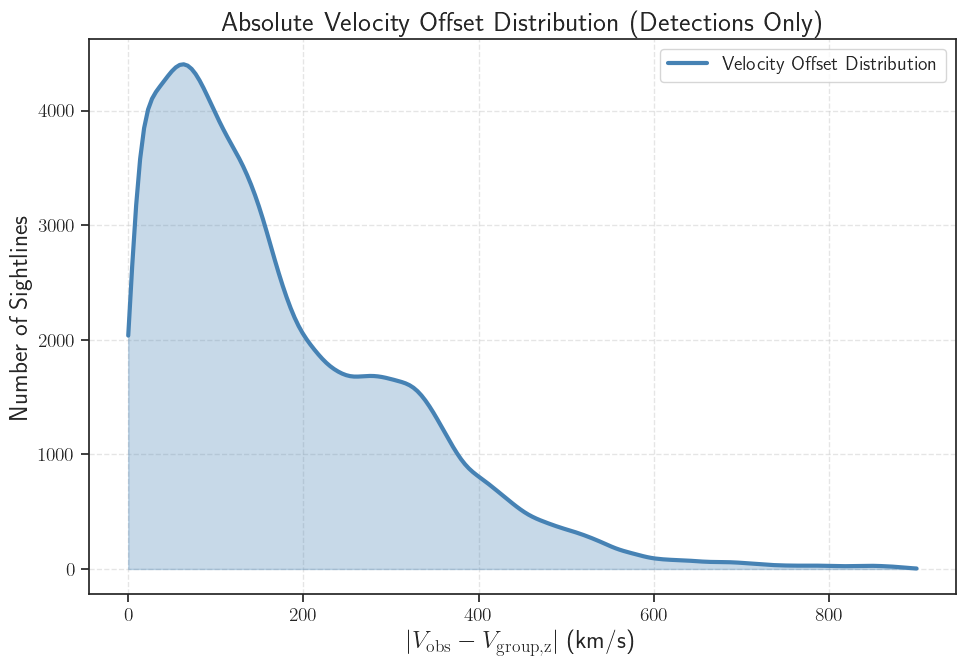

In [203]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import gaussian_kde

# Paths
halo_file_path = '../TNG50_fitting_results/TNG_halos.txt'
# base_dir = '../TNG50_fitting_results/fitting_combined_features_grp_only'
base_dir = '../TNG50_fitting_results/v_2500_data_filtered_v800_combined_gal_removed'

# Read the halo data
halo_data = pd.read_csv(halo_file_path, sep='|', skipinitialspace=True)
halo_data.columns = halo_data.columns.str.strip()

# Mapping of Grp_Index to corresponding file name
grp_index_to_group_mapping = {
    7: 0, 8: 1, 9: 2, 10: 3, 11: 4, 12: 5, 13: 6, 15: 7,
    17: 8, 18: 9, 19: 10, 20: 11, 22: 12, 24: 13
}

# Initialize list to store absolute velocity offsets (for detections only)
absolute_velocity_offsets = []

# Process each group
for grp_index, group_file_index in grp_index_to_group_mapping.items():
    group_file = os.path.join(base_dir, f"group_{group_file_index}_combined_features.txt")

    # Ensure the file exists
    if not os.path.exists(group_file):
        print(f"File not found: {group_file}")
        continue

    # Load group data
    group_df = pd.read_csv(group_file, sep='|', skipinitialspace=True)
    group_df.columns = group_df.columns.str.strip()

    # Ensure velocity data is numeric
    if 'v' not in group_df.columns or 'dN' not in group_df.columns:
        print(f"Velocity or detection column missing in {group_file}")
        continue

    group_df['v'] = pd.to_numeric(group_df['v'], errors='coerce')
    group_df['dN'] = pd.to_numeric(group_df['dN'], errors='coerce')

    # Filter only detections (dN must not be NaN)
    detected_absorbers = group_df.dropna(subset=['dN'])

    if detected_absorbers.empty:
        print(f"No detections found in {group_file}")
        continue

    # Extract the group's systemic velocity along the z-axis
    group_velocity_z = halo_data.loc[halo_data['Grp_Index'] == grp_index, 'GroupVel(z,km/s/h)'].values

    if len(group_velocity_z) == 0:
        print(f"Missing GroupVel(z,km/s/h) for Group {grp_index}")
        continue

    group_velocity_z = group_velocity_z[0]  # Extract single value
    a = 1 / (1 + 0.09940180263022191)  # Scale factor
    group_velocity_z = group_velocity_z * 1/a  # Convert to physical velocity

    # Compute absolute velocity offsets (for detections only)
    detected_absorbers['Absolute_Velocity_Offset'] = np.abs(detected_absorbers['v'] - group_velocity_z)

    # Store values
    absolute_velocity_offsets.extend(detected_absorbers['Absolute_Velocity_Offset'].dropna().values)

# Convert to NumPy array for efficient processing
absolute_velocity_offsets = np.array(absolute_velocity_offsets)

# Print total number of detected absorbers being plotted
total_detections = len(absolute_velocity_offsets)
print(f"Total number of detected absorbers being plotted: {total_detections}")

# Check if we have detections before proceeding
if total_detections == 0:
    print("No detections available for plotting. Exiting.")
else:
    # Kernel Density Estimation (KDE) for smooth curve
    kde = gaussian_kde(absolute_velocity_offsets)
    x_values = np.linspace(0, np.max(absolute_velocity_offsets), 200)  # X-axis range
    y_values = kde(x_values)  # KDE evaluation

    # Normalize KDE to match actual counts
    y_values *= total_detections * (x_values[1] - x_values[0])

    # Plot smooth density curve with filled area
    sns.set(style="ticks", font_scale=1.5)
    plt.figure(figsize=(10, 7))

    plt.plot(x_values, y_values, color='steelblue', linewidth=3, label="Velocity Offset Distribution")
    plt.fill_between(x_values, y_values, color='steelblue', alpha=0.3)

    plt.xlabel(r'$\left| V_{\mathrm{obs}} - V_{\mathrm{group, z}} \right|$ (km/s)', fontsize=18)
    plt.ylabel('Number of Sightlines', fontsize=18)
    plt.title('Absolute Velocity Offset Distribution (Detections Only)', fontsize=20)

    # Grid and layout adjustments
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.legend(fontsize=14, loc='upper right', frameon=True)

    plt.tight_layout()

    # Save and show the plot
    #plt.savefig('../TNG50_fitting_results/Plots/Absolute_Velocity_Offset_Density_DetectionsOnly.pdf', dpi=300, bbox_inches='tight')
    plt.show()

/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_52070/1773215862.py:83: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  detected_absorbers['Absolute_Velocity_Offset'] = np.abs(detected_absorbers['v'] - group_velocity_z)
/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_52070/1773215862.py:83: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  detected_absorbers['Absolute_Velocity_Offset'] = np.abs(detected_absorbers['v'] - group_velocity_z)
/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipyke

Total number of detected absorbers being plotted: 247750


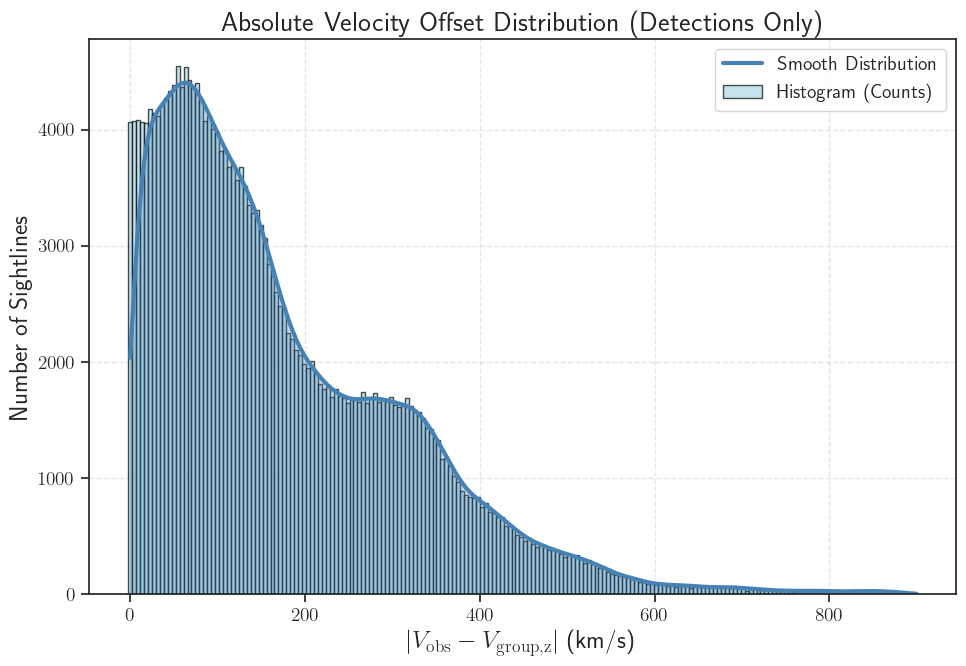

In [204]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import gaussian_kde

sns.set(style="ticks", font_scale=1.5)


plt.rc('font', family='Times New Roman')
# enable LaTeX rendering
plt.rc('text', usetex=True)
plt.rcParams.update({
    'axes.labelsize': 32,
    'axes.titlesize': 22,
    'xtick.labelsize': 30,
    'ytick.labelsize': 30,
    'legend.fontsize': 30,
    'figure.titlesize': 22
})


# Paths
halo_file_path = '../TNG50_fitting_results/TNG_halos.txt'
# base_dir = '../TNG50_fitting_results/fitting_combined_features_grp_only'
base_dir = '../TNG50_fitting_results/v_2500_data_filtered_v800_combined_gal_removed'

# Read the halo data
halo_data = pd.read_csv(halo_file_path, sep='|', skipinitialspace=True)
halo_data.columns = halo_data.columns.str.strip()

# Mapping of Grp_Index to corresponding file name
grp_index_to_group_mapping = {
    7: 0, 8: 1, 9: 2, 10: 3, 11: 4, 12: 5, 13: 6, 15: 7,
    17: 8, 18: 9, 19: 10, 20: 11, 22: 12, 24: 13
}

# Initialize list to store absolute velocity offsets (for detections only)
absolute_velocity_offsets = []

# Process each group
for grp_index, group_file_index in grp_index_to_group_mapping.items():
    group_file = os.path.join(base_dir, f"group_{group_file_index}_combined_features.txt")

    # Ensure the file exists
    if not os.path.exists(group_file):
        print(f"File not found: {group_file}")
        continue

    # Load group data
    group_df = pd.read_csv(group_file, sep='|', skipinitialspace=True)
    group_df.columns = group_df.columns.str.strip()

    # Ensure velocity data is numeric
    if 'v' not in group_df.columns or 'dN' not in group_df.columns:
        print(f"Velocity or detection column missing in {group_file}")
        continue

    group_df['v'] = pd.to_numeric(group_df['v'], errors='coerce')
    group_df['dN'] = pd.to_numeric(group_df['dN'], errors='coerce')

    # Filter only detections (dN must not be NaN)
    detected_absorbers = group_df.dropna(subset=['dN'])

    if detected_absorbers.empty:
        print(f"No detections found in {group_file}")
        continue

    # Extract the group's systemic velocity along the z-axis
    group_velocity_z = halo_data.loc[halo_data['Grp_Index'] == grp_index, 'GroupVel(z,km/s/h)'].values
    a = 1 / (1 + 0.09940180263022191)  # Scale factor
    group_velocity_z = group_velocity_z * 1/a  # Convert to physical velocity

    
    if len(group_velocity_z) == 0:
        print(f"Missing GroupVel(z,km/s/h) for Group {grp_index}")
        continue

    group_velocity_z = group_velocity_z[0]  # Extract single value

    # Compute absolute velocity offsets (for detections only)
    detected_absorbers['Absolute_Velocity_Offset'] = np.abs(detected_absorbers['v'] - group_velocity_z)

    # Store values
    absolute_velocity_offsets.extend(detected_absorbers['Absolute_Velocity_Offset'].dropna().values)

# Convert to NumPy array for efficient processing
absolute_velocity_offsets = np.array(absolute_velocity_offsets)

# Print total number of detected absorbers being plotted
total_detections = len(absolute_velocity_offsets)
print(f"Total number of detected absorbers being plotted: {total_detections}")

# Check if we have detections before proceeding
if total_detections == 0:
    print("No detections available for plotting. Exiting.")
else:
    # Create histogram bins
    num_bins = 200
    bin_edges = np.linspace(0, np.max(absolute_velocity_offsets), num_bins)

    # Compute histogram values
    hist_counts, bin_edges = np.histogram(absolute_velocity_offsets, bins=bin_edges)

    # Compute KDE for smooth curve
    kde = gaussian_kde(absolute_velocity_offsets)
    x_values = np.linspace(0, np.max(absolute_velocity_offsets), 200)  # X-axis range
    y_values = kde(x_values)  # KDE evaluation

    # Normalize KDE to match actual histogram counts
    y_values *= total_detections * (x_values[1] - x_values[0])

    # Plot histogram and smooth density curve
    sns.set(style="ticks", font_scale=1.5)
    plt.figure(figsize=(10, 7))

    # Histogram (bars)
    plt.bar(bin_edges[:-1], hist_counts, width=np.diff(bin_edges), alpha=0.7, color='lightblue', edgecolor='black', label="Histogram (Counts)")

    # Smooth KDE curve with filled area
    plt.plot(x_values, y_values, color='steelblue', linewidth=3, label="Smooth Distribution")
    plt.fill_between(x_values, y_values, color='steelblue', alpha=0.3)

    # Labels and formatting
    plt.xlabel(r'$\left| V_{\mathrm{obs}} - V_{\mathrm{group, z}} \right|$ (km/s)', fontsize=18)
    plt.ylabel('Number of Sightlines', fontsize=18)
    plt.title('Absolute Velocity Offset Distribution (Detections Only)', fontsize=20)

    # Grid and layout adjustments
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.legend(fontsize=14, loc='upper right', frameon=True)

    plt.tight_layout()

    # Save and show the plot
    #plt.savefig('../TNG50_fitting_results/Plots/Absolute_Velocity_Offset_Histogram_DetectionsOnly.pdf', dpi=300, bbox_inches='tight')
    plt.show()

  7%|▋         | 1/14 [00:00<00:04,  2.77it/s]

Galaxy velocities: [  46.75501 -273.81903  225.03734]


 14%|█▍        | 2/14 [00:00<00:04,  2.54it/s]

Galaxy velocities: [-121.677795  196.49358   157.25383   -74.511696 -497.48978  -765.2392  ]


 21%|██▏       | 3/14 [00:01<00:05,  1.88it/s]

Galaxy velocities: [ 151.53833  -244.74638   -48.976276  249.28636  -314.91556   153.60646 ]


 29%|██▊       | 4/14 [00:01<00:05,  1.91it/s]

Galaxy velocities: [  -5.7960076 -115.06128   -368.52927    403.21814   -468.1635
   69.046036 ]


 36%|███▌      | 5/14 [00:02<00:04,  2.19it/s]

Galaxy velocities: [ 52.094757 144.10985  -20.084885]
Galaxy velocities: [ 3.4386992e-01  5.5106040e+01  3.8467093e+02  1.9188872e+02
 -2.7223938e+02]


 43%|████▎     | 6/14 [00:02<00:03,  2.16it/s]

Galaxy velocities: [ -46.311676 -102.42821  -166.95615   323.66187   516.55676   485.30035 ]


 50%|█████     | 7/14 [00:03<00:04,  1.54it/s]

Galaxy velocities: [148.35362   97.738365 428.7566  ]


 57%|█████▋    | 8/14 [00:04<00:03,  1.62it/s]

Galaxy velocities: [-35.465885 240.07097  110.44447 ]


 71%|███████▏  | 10/14 [00:05<00:02,  1.78it/s]

Galaxy velocities: [ 130.67221  225.97603 -466.17386]


 79%|███████▊  | 11/14 [00:06<00:01,  1.77it/s]

Galaxy velocities: [ 22.66275 256.45615  66.08114]
Galaxy velocities: [-94.34244  -20.720848 -59.656136 108.2558  ]


 86%|████████▌ | 12/14 [00:06<00:01,  1.80it/s]

Galaxy velocities: [-39.333797 269.38873  140.66856 ]


 93%|█████████▎| 13/14 [00:07<00:00,  1.74it/s]

Galaxy velocities: [79.747665 50.351635 56.615826 38.163494]


100%|██████████| 14/14 [00:08<00:00,  1.74it/s]

Total number of detected absorbers being plotted: 247750
Total velocity offsets group: 247750
Maximum velocity offsets group: 899.8934278486306
Total velocity offsets galaxy: 247750
Maximum velocity offsets galaxy: 1578.657622666513


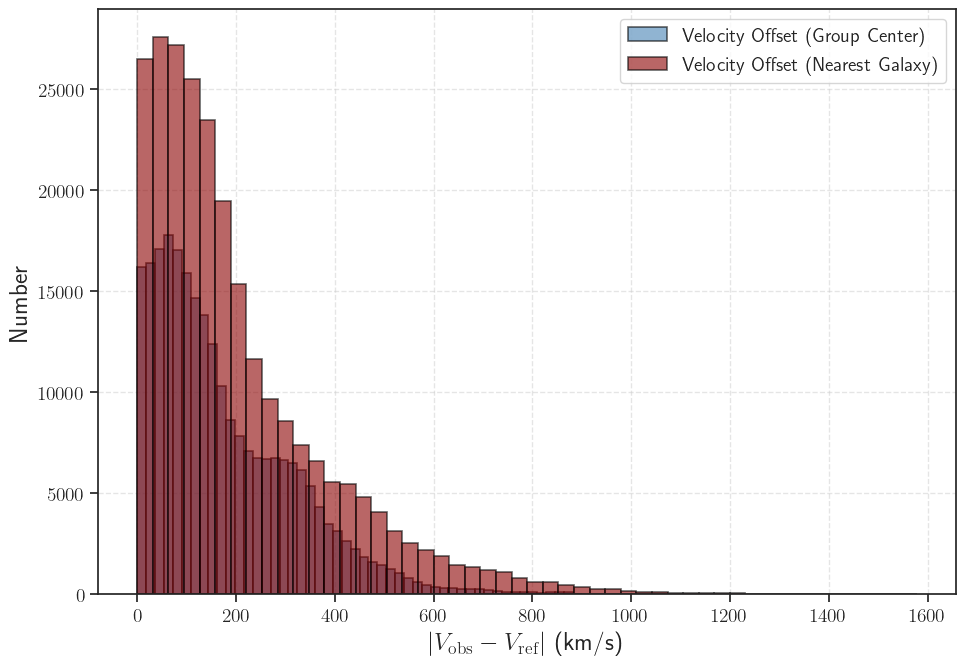

In [205]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import h5py
from tqdm import tqdm

# Paths
base_dir = '../../Grad School/MgII_TNG_Project/Primary Project/Trident Codes/TNG_50_z_0.1_groups/revised_final'
halo_file_path = '../TNG50_fitting_results/TNG_halos.txt'
# fitting_dir = '../TNG50_fitting_results/fitting_combined_features_grp_only'
fitting_dir = '../TNG50_fitting_results/v_2500_data_filtered_v800_combined_gal_removed'
galaxy_cat_dir = '../TNG50_fitting_results/galaxy_cats'

# Constants
z = 0.1  # Redshift
a = 1 / (1 + z)  # Scale factor
h = 0.6774  # Hubble parameter
box_size = 35000  # Simulation box size

# Mapping of Grp_Index to file indices
grp_index_to_group_mapping = {
    7: 0, 8: 1, 9: 2, 10: 3, 11: 4, 12: 5, 13: 6, 15: 7,
    17: 8, 18: 9, 19: 10, 20: 11, 22: 12, 24: 13
}

# Load the halo group data
halo_data = pd.read_csv(halo_file_path, sep='|', skipinitialspace=True)
halo_data.columns = halo_data.columns.str.strip()

# Initialize lists for storing velocity offsets
velocity_offsets_group = []
velocity_offsets_galaxy = []

# Helper function for cyclic correction
def apply_cyclic_condition(ray_coord, galaxy_coord, box_size):
    """Apply cyclic boundary correction for periodic box conditions."""
    diff = np.abs(galaxy_coord - ray_coord)
    if diff > box_size / 2:
        if galaxy_coord > ray_coord:
            galaxy_coord -= box_size
        else:
            galaxy_coord += box_size
    return galaxy_coord

# Process each group
for grp_index in tqdm(grp_index_to_group_mapping.keys()):
    group_number = grp_index_to_group_mapping[grp_index]

    # Load ray data (sightline positions)
    ray_file = os.path.join(base_dir, f"integral_TNG50-1_z0.1_n300d2-sample_localized_OVInumdens_{group_number}-of-14.hdf5")
    if not os.path.exists(ray_file):
        print(f"File not found: {ray_file}")
        continue

    with h5py.File(ray_file, 'r') as f:
        ray_positions = f['ray_pos'][:]  # Shape: (N_sightlines, 3) -> (x, y, z)

    # Load fitting results
    fitting_file = os.path.join(fitting_dir, f"group_{group_number}_combined_features.txt")
    if not os.path.exists(fitting_file):
        print(f"File not found: {fitting_file}")
        continue

    fitting_data = pd.read_csv(fitting_file, sep='|', skipinitialspace=True)
    fitting_data.columns = fitting_data.columns.str.strip()
    
    # Filter only detections (dN must not be NaN)
    detected_absorbers = fitting_data.dropna(subset=['dN'])

    if detected_absorbers.empty:
        print(f"No detections found in {fitting_file}")
        continue

    # Extract the group's systemic velocity along the z-axis
    group_velocity_z = halo_data.loc[halo_data['Grp_Index'] == grp_index, 'GroupVel(z,km/s/h)'].values

    if len(group_velocity_z) == 0:
        print(f"Missing GroupVel(z,km/s/h) for Group {grp_index}")
        continue

    group_velocity_z = group_velocity_z[0]  # Extract single value
    a = 1 / (1 + 0.09940180263022191)  # Scale factor
    group_velocity_z = group_velocity_z * 1/a  # Convert to physical velocity

    # Load galaxy catalog
    galaxy_file = os.path.join(galaxy_cat_dir, f"group_{grp_index}_galaxy_catalog_converted.txt")
    if not os.path.exists(galaxy_file):
        print(f"Galaxy catalog not found: {galaxy_file}")
        continue

    galaxy_data = pd.read_csv(galaxy_file, sep='|', skipinitialspace=True)
    galaxy_data.columns = galaxy_data.columns.str.strip()

    # Extract galaxy positions and velocities
    galaxy_positions = galaxy_data[['SubhaloPos_0', 'SubhaloPos_1']].values
    galaxy_velocities_z = galaxy_data['SubhaloVel_2'].values  # z-component velocity
    print(f'Galaxy velocities: {galaxy_velocities_z}')

    # Compute nearest galaxy and its velocity for each sightline
    for sightline_idx, sightline_v in zip(detected_absorbers.index, detected_absorbers['v']):
        ray_x, ray_y = ray_positions[sightline_idx, :2]  # Extract x, y positions

        # Compute distances to all galaxies
        corrected_positions = np.array([
            [apply_cyclic_condition(ray_x, gx, box_size), apply_cyclic_condition(ray_y, gy, box_size)]
            for gx, gy in galaxy_positions
        ])
        distances = np.sqrt((corrected_positions[:, 0] - ray_x) ** 2 + (corrected_positions[:, 1] - ray_y) ** 2)
        nearest_idx = np.argmin(distances)

        # Compute absolute velocity offsets
        nearest_galaxy_velocity_z = galaxy_velocities_z[nearest_idx]
        abs_velocity_offset_group = np.abs(sightline_v - group_velocity_z)
        abs_velocity_offset_galaxy = np.abs(sightline_v - nearest_galaxy_velocity_z)

        velocity_offsets_group.append(abs_velocity_offset_group)
        velocity_offsets_galaxy.append(abs_velocity_offset_galaxy)

# Convert to NumPy arrays
velocity_offsets_group = np.array(velocity_offsets_group)
velocity_offsets_galaxy = np.array(velocity_offsets_galaxy)

# Print total number of detected absorbers being plotted
total_detections = len(velocity_offsets_group)
print(f"Total number of detected absorbers being plotted: {total_detections}")

# Check if we have detections before proceeding
if total_detections == 0:
    print("No detections available for plotting. Exiting.")
else:
    # Create histogram bins that match KDE heights
    num_bins = 50  # Adjust this to match both histograms' peak heights

    # Plot both histograms
    sns.set(style="ticks", font_scale=1.5)
    plt.figure(figsize=(10, 7))

    # Histogram for group velocity offsets
    print(f'Total velocity offsets group: {len(velocity_offsets_group)}')
    print(f'Maximum velocity offsets group: {np.max(velocity_offsets_group)}')

    plt.hist(
        velocity_offsets_group, bins=num_bins, alpha=0.6, color="steelblue",
        edgecolor='black', linewidth=1.2, label="Velocity Offset (Group Center)"
    )
    print(f'Total velocity offsets galaxy: {len(velocity_offsets_galaxy)}')
    print(f'Maximum velocity offsets galaxy: {np.max(velocity_offsets_galaxy)}')
    # Histogram for nearest galaxy velocity offsets
    plt.hist(
        velocity_offsets_galaxy, bins=num_bins, alpha=0.6, color="darkred",
        edgecolor='black', linewidth=1.2, label="Velocity Offset (Nearest Galaxy)"
    )

    # Labels and title
    plt.xlabel(r'$\left| V_{\mathrm{obs}} - V_{\mathrm{ref}} \right|$ (km/s)', fontsize=18)
    plt.ylabel('Number', fontsize=18)

    # Grid and layout adjustments
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.legend(fontsize=14, loc='upper right', frameon=True)

    plt.tight_layout()

    # Save and show the plot
    plt.show()

100%|██████████| 14/14 [00:07<00:00,  1.89it/s]


Total absorbers (Group Center): 247750
Total absorbers (Nearest Galaxy): 247750


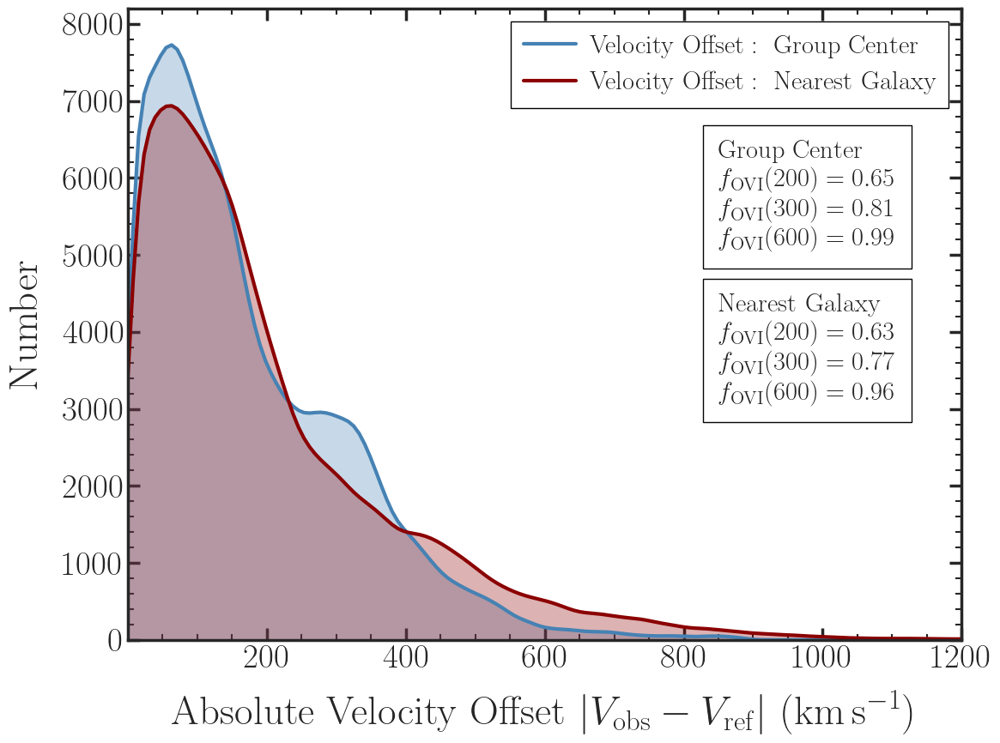

In [208]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import h5py
from tqdm import tqdm
from scipy.stats import gaussian_kde

# Paths
base_dir = '../../Grad School/MgII_TNG_Project/Primary Project/Trident Codes/TNG_50_z_0.1_groups/revised_final'
halo_file_path = '../TNG50_fitting_results/TNG_halos.txt'
# fitting_dir = '../TNG50_fitting_results/fitting_combined_features_grp_only_800'
fitting_dir = '../TNG50_fitting_results/v_2500_data_filtered_v800_combined_gal_removed'
galaxy_cat_dir = '../TNG50_fitting_results/galaxy_cats'

# Constants
z = 0.1  # Redshift
a = 1 / (1 + z)  # Scale factor
h = 0.6774  # Hubble parameter
box_size = 35000  # Simulation box size

# Mapping of Grp_Index to file indices
grp_index_to_group_mapping = {
    7: 0, 8: 1, 9: 2, 10: 3, 11: 4, 12: 5, 13: 6, 15: 7,
    17: 8, 18: 9, 19: 10, 20: 11, 22: 12, 24: 13
}

# Load the halo group data
halo_data = pd.read_csv(halo_file_path, sep='|', skipinitialspace=True)
halo_data.columns = halo_data.columns.str.strip()

# Initialize lists for storing velocity offsets
velocity_offsets_group = []
velocity_offsets_galaxy = []

# Helper function for cyclic correction
def apply_cyclic_condition(ray_coord, galaxy_coord, box_size):
    """Apply cyclic boundary correction for periodic box conditions."""
    diff = np.abs(galaxy_coord - ray_coord)
    if diff > box_size / 2:
        if galaxy_coord > ray_coord:
            galaxy_coord -= box_size
        else:
            galaxy_coord += box_size
    return galaxy_coord

# Process each group
for grp_index in tqdm(grp_index_to_group_mapping.keys()):
    group_number = grp_index_to_group_mapping[grp_index]

    # Load ray data (sightline positions)
    ray_file = os.path.join(base_dir, f"integral_TNG50-1_z0.1_n300d2-sample_localized_OVInumdens_{group_number}-of-14.hdf5")
    if not os.path.exists(ray_file):
        print(f"File not found: {ray_file}")
        continue

    with h5py.File(ray_file, 'r') as f:
        ray_positions = f['ray_pos'][:]  # Shape: (N_sightlines, 3) -> (x, y, z)

    # Load fitting results
    fitting_file = os.path.join(fitting_dir, f"group_{group_number}_combined_features.txt")
    if not os.path.exists(fitting_file):
        print(f"File not found: {fitting_file}")
        continue

    fitting_data = pd.read_csv(fitting_file, sep='|', skipinitialspace=True)
    fitting_data.columns = fitting_data.columns.str.strip()
    
    # Filter only detections (dN must not be NaN)
    detected_absorbers = fitting_data.dropna(subset=['dN'])

    if detected_absorbers.empty:
        print(f"No detections found in {fitting_file}")
        continue

    # Extract the group's systemic velocity along the z-axis
    group_velocity_z = halo_data.loc[halo_data['Grp_Index'] == grp_index, 'GroupVel(z,km/s/h)'].values

    if len(group_velocity_z) == 0:
        print(f"Missing GroupVel(z,km/s/h) for Group {grp_index}")
        continue

    group_velocity_z = group_velocity_z[0]  # Extract single value
    a = 1 / (1 + 0.09940180263022191)  # Scale factor
    group_velocity_z = group_velocity_z * 1/a  # Convert to physical velocity

    # Load galaxy catalog
    galaxy_file = os.path.join(galaxy_cat_dir, f"group_{grp_index}_galaxy_catalog_converted.txt")
    if not os.path.exists(galaxy_file):
        print(f"Galaxy catalog not found: {galaxy_file}")
        continue

    galaxy_data = pd.read_csv(galaxy_file, sep='|', skipinitialspace=True)
    galaxy_data.columns = galaxy_data.columns.str.strip()

    # Extract galaxy positions and velocities
    galaxy_positions = galaxy_data[['SubhaloPos_0', 'SubhaloPos_1']].values
    galaxy_velocities_z = galaxy_data['SubhaloVel_2'].values  # z-component velocity
    

    # Compute nearest galaxy and its velocity for each sightline
    for sightline_idx, sightline_v in zip(detected_absorbers.index, detected_absorbers['v']):
        ray_x, ray_y = ray_positions[sightline_idx, :2]  # Extract x, y positions

        # Compute distances to all galaxies
        corrected_positions = np.array([
            [apply_cyclic_condition(ray_x, gx, box_size), apply_cyclic_condition(ray_y, gy, box_size)]
            for gx, gy in galaxy_positions
        ])
        distances = np.sqrt((corrected_positions[:, 0] - ray_x) ** 2 + (corrected_positions[:, 1] - ray_y) ** 2)
        nearest_idx = np.argmin(distances)

        # Compute absolute velocity offsets
        nearest_galaxy_velocity_z = galaxy_velocities_z[nearest_idx]
        abs_velocity_offset_group = np.abs(sightline_v - group_velocity_z)
        abs_velocity_offset_galaxy = np.abs(sightline_v - nearest_galaxy_velocity_z)

        velocity_offsets_group.append(abs_velocity_offset_group)
        velocity_offsets_galaxy.append(abs_velocity_offset_galaxy)

# Convert to NumPy arrays
velocity_offsets_group = np.array(velocity_offsets_group)
velocity_offsets_galaxy = np.array(velocity_offsets_galaxy)

# Count total absorbers in each case
total_group_absorbers = len(velocity_offsets_group)
total_galaxy_absorbers = len(velocity_offsets_galaxy)
print(f"Total absorbers (Group Center): {total_group_absorbers}")
print(f"Total absorbers (Nearest Galaxy): {total_galaxy_absorbers}")

# Check if we have detections before proceeding
if total_group_absorbers == 0 or total_galaxy_absorbers == 0:
    print("No detections available for plotting. Exiting.")
else:
    # KDE for smooth curve
    kde_group = gaussian_kde(velocity_offsets_group)
    kde_galaxy = gaussian_kde(velocity_offsets_galaxy)

    # Define X range for KDE
    # Handle cases where one of the arrays might be empty
    # Ensure `max` is not overridden
     

    # Handle cases where one of the arrays might be empty
    if len(velocity_offsets_group) > 0 and len(velocity_offsets_galaxy) > 0:
        x_max = max(np.max(velocity_offsets_group), np.max(velocity_offsets_galaxy))
    elif len(velocity_offsets_group) > 0:
        x_max = np.max(velocity_offsets_group)
    elif len(velocity_offsets_galaxy) > 0:
        x_max = np.max(velocity_offsets_galaxy)
    else:
        print("Both velocity offset arrays are empty. Exiting.")
        exit()

    # Define X range for KDE
    x_values = np.linspace(0, x_max, 200)

    # Compute KDE densities
    y_group = kde_group(x_values)
    y_galaxy = kde_galaxy(x_values)

    # Normalize KDE to match actual counts
    y_group *= total_group_absorbers * (x_values[1] - x_values[0])
    y_galaxy *= total_galaxy_absorbers * (x_values[1] - x_values[0])

    import matplotlib.pyplot as plt
    import seaborn as sns
    from matplotlib.ticker import AutoMinorLocator

    # set font type to Times New Roman
    
    # Enable LaTeX rendering
    plt.rcParams.update({
        "text.usetex": True,  # Use LaTeX for rendering text
        "font.family": "serif",  # Use a serif font
        "axes.labelsize": 34,  # Adjust label size
        "axes.titlesize": 36,  # Adjust title size
        "xtick.labelsize": 28,  # Adjust tick label size
        "ytick.labelsize": 28,  # Adjust tick label size
        "legend.fontsize": 24,  # Adjust legend font size
        "text.latex.preamble": r"\usepackage{amsmath}"  # Ensure math symbols render properly
    })
    plt.rc('font', family='Times New Roman')
    # Plot smooth curves
    sns.set(style="ticks", font_scale=1.5)
    fig, ax = plt.subplots(figsize=(12, 9))

    ax.plot(x_values, y_group, color="steelblue", linewidth=3, 
            label=r"$\mathrm{Velocity\ Offset: \ Group\ Center}$")
    ax.fill_between(x_values, y_group, color="steelblue", alpha=0.3)

    ax.plot(x_values, y_galaxy, color="darkred", linewidth=3, 
            label=r"$\mathrm{Velocity\ Offset: \ Nearest\ Galaxy}$")
    ax.fill_between(x_values, y_galaxy, color="darkred", alpha=0.3)

    # Labels and title with LaTeX formatting
    ax.set_xlabel(r"$\mathrm{Absolute\ Velocity\ Offset} \, \left| V_{\mathrm{obs}} - V_{\mathrm{ref}} \right| \, (\mathrm{km\,s^{-1}})$", labelpad=15, fontsize=34)
    ax.set_ylabel(r"$\mathrm{Number}$", labelpad=15, fontsize=34)
    # Set tick labels and format them properly
    # Set x-ticks with LaTeX formatting inside \mathrm{}
    x_ticks = [ 200, 400, 600, 800, 1000, 1200, 1400, 1600]
    ax.set_xticks(x_ticks)
    ax.set_xticklabels([rf"$\mathrm{{{tick}}}$" for tick in x_ticks], fontsize=28)
    y_ticks = [0, 1000, 2000, 3000, 4000, 5000, 6000, 7000, 8000]
    # Set y-ticks with LaTeX formatting inside \mathrm{}
    ax.set_yticks(y_ticks)
    ax.set_yticklabels([rf"$\mathrm{{{int(y)}}}$" for y in y_ticks], fontsize=28)

    # Grid and layout adjustments
    ax.tick_params(axis='both', which='major', direction='in', length=10, width=2.5, top=True, right=True)
    ax.tick_params(axis='both', which='minor', direction='in', length=5, width=1.5, top=True, right=True)

    ax.spines['top'].set_linewidth(2.5)
    ax.spines['right'].set_linewidth(2.5)
    ax.spines['bottom'].set_linewidth(2.5)
    ax.spines['left'].set_linewidth(2.5)

    ax.xaxis.set_minor_locator(AutoMinorLocator())
    ax.yaxis.set_minor_locator(AutoMinorLocator())
    ax.set_xlim(0, 1200)
    ax.set_ylim(0,8200)
    ax.legend(frameon=True,framealpha=1, edgecolor='black',loc = 'upper right',     
                    fancybox=False, shadow=False, borderpad=0.5,borderaxespad=0.5, handletextpad=0.5, fontsize=22)
    
    # Compute fractions of absorbers within given velocity thresholds
    thresholds = [200, 300, 600]  # Velocity limits in km/s
    fraction_group = [(velocity_offsets_group <= t).sum() / total_group_absorbers for t in thresholds]
    fraction_galaxy = [(velocity_offsets_galaxy <= t).sum() / total_galaxy_absorbers for t in thresholds]

    # Format text for Group Center
    fraction_text_group = (
        r"$\mathrm{Group\ Center}$" + "\n" +
        r"$f_{\mathrm{OVI}}(200) = \mathrm{" + f"{fraction_group[0]:.2f}" + r"}$" + "\n" +
        r"$f_{\mathrm{OVI}}(300) = \mathrm{" + f"{fraction_group[1]:.2f}" + r"}$" + "\n" +
        r"$f_{\mathrm{OVI}}(600) = \mathrm{" + f"{fraction_group[2]:.2f}" + r"}$"
    )

    # Format text for Nearest Galaxy
    fraction_text_galaxy = (
        r"$\mathrm{Nearest\ Galaxy}$" + "\n" +
        r"$f_{\mathrm{OVI}}(200) = \mathrm{" + f"{fraction_galaxy[0]:.2f}" + r"}$" + "\n" +
        r"$f_{\mathrm{OVI}}(300) = \mathrm{" + f"{fraction_galaxy[1]:.2f}" + r"}$" + "\n" +
        r"$f_{\mathrm{OVI}}(600) = \mathrm{" + f"{fraction_galaxy[2]:.2f}" + r"}$"
    )
    # Add text boxes to the plot
    ax.text(850, 6500, fraction_text_group, fontsize=22, verticalalignment='top', 
            bbox=dict(boxstyle="square,pad=0.6", edgecolor='black', facecolor='white', alpha=0.99)
            )

    ax.text(850, 4500, fraction_text_galaxy, fontsize=22, verticalalignment='top', 
            bbox=dict(boxstyle="square,pad=0.6", edgecolor='black', facecolor='white', alpha=0.99))

    plt.tight_layout()
    output_dir = '../TNG50_fitting_results/Plots_gal_removed_new'
    plt.savefig(os.path.join(output_dir, 'velocity_offset_distribution.pdf'), dpi=200)
    plt.show()

In [207]:
# delete the variable max 
del max

100%|██████████| 14/14 [00:07<00:00,  1.84it/s]


Number of groups with detections: 14
Total absorbers (Group Center): 247750
Total absorbers (Nearest Galaxy): 247750


100%|██████████| 500/500 [04:37<00:00,  1.80it/s]


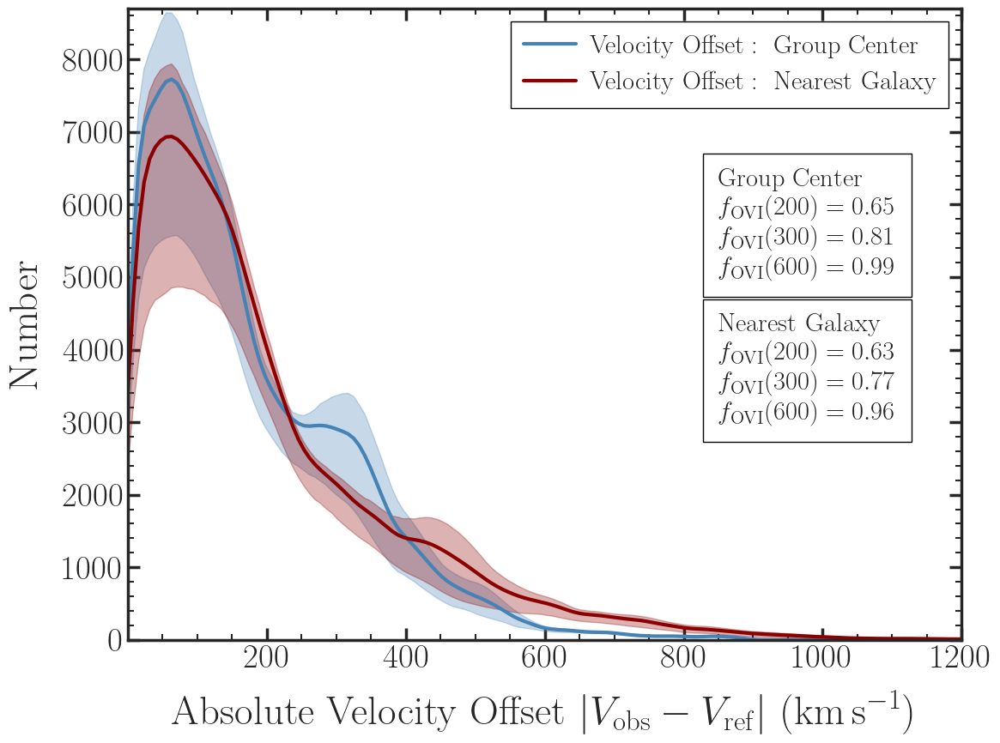

In [209]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import h5py
from tqdm import tqdm
from scipy.stats import gaussian_kde
import random

# ---------------------------
# Data Processing and Setup
# ---------------------------

# Paths
base_dir = '../../Grad School/MgII_TNG_Project/Primary Project/Trident Codes/TNG_50_z_0.1_groups/revised_final'
halo_file_path = '../TNG50_fitting_results/TNG_halos.txt'
# fitting_dir = '../TNG50_fitting_results/fitting_combined_features_grp_only_800'
fitting_dir = '../TNG50_fitting_results/v_2500_data_filtered_v800_combined_gal_removed'
galaxy_cat_dir = '../TNG50_fitting_results/galaxy_cats'

# Constants
z = 0.1  # Redshift
a = 1 / (1 + z)  # Scale factor
h = 0.6774  # Hubble parameter
box_size = 35000  # Simulation box size

# Mapping of Grp_Index to file indices (14 groups total)
grp_index_to_group_mapping = {
    7: 0, 8: 1, 9: 2, 10: 3, 11: 4, 12: 5, 13: 6, 15: 7,
    17: 8, 18: 9, 19: 10, 20: 11, 22: 12, 24: 13
}

# Load the halo group data
halo_data = pd.read_csv(halo_file_path, sep='|', skipinitialspace=True)
halo_data.columns = halo_data.columns.str.strip()

# Dictionaries to store velocity offset arrays for each group
group_offsets = {}   # Offsets computed from the group center
galaxy_offsets = {}  # Offsets computed from the nearest galaxy

# Helper function for cyclic correction (accounting for periodic boundaries)
def apply_cyclic_condition(ray_coord, galaxy_coord, box_size):
    diff = np.abs(galaxy_coord - ray_coord)
    if diff > box_size / 2:
        if galaxy_coord > ray_coord:
            galaxy_coord -= box_size
        else:
            galaxy_coord += box_size
    return galaxy_coord

# Process each group and store results per group
for grp_index in tqdm(grp_index_to_group_mapping.keys()):
    group_number = grp_index_to_group_mapping[grp_index]

    # Load ray data (sightline positions)
    ray_file = os.path.join(base_dir, f"integral_TNG50-1_z0.1_n300d2-sample_localized_OVInumdens_{group_number}-of-14.hdf5")
    if not os.path.exists(ray_file):
        print(f"File not found: {ray_file}")
        continue

    with h5py.File(ray_file, 'r') as f:
        ray_positions = f['ray_pos'][:]  # (N_sightlines, 3)

    # Load fitting results
    fitting_file = os.path.join(fitting_dir, f"group_{group_number}_combined_features.txt")
    if not os.path.exists(fitting_file):
        print(f"File not found: {fitting_file}")
        continue

    fitting_data = pd.read_csv(fitting_file, sep='|', skipinitialspace=True)
    fitting_data.columns = fitting_data.columns.str.strip()
    
    # Filter only detections (dN must not be NaN)
    detected_absorbers = fitting_data.dropna(subset=['dN'])
    if detected_absorbers.empty:
        print(f"No detections found in {fitting_file}")
        continue

    # Extract the group's systemic velocity along the z-axis
    group_velocity_z = halo_data.loc[halo_data['Grp_Index'] == grp_index, 'GroupVel(z,km/s/h)'].values
    if len(group_velocity_z) == 0:
        print(f"Missing GroupVel(z,km/s/h) for Group {grp_index}")
        continue
    group_velocity_z = group_velocity_z[0]
    # Use a fixed scale factor as in your code
    a_scale = 1 / (1 + 0.09940180263022191)
    group_velocity_z = group_velocity_z * (1 / a_scale)  # Convert to physical velocity

    # Load galaxy catalog
    galaxy_file = os.path.join(galaxy_cat_dir, f"group_{grp_index}_galaxy_catalog_converted.txt")
    if not os.path.exists(galaxy_file):
        print(f"Galaxy catalog not found: {galaxy_file}")
        continue

    galaxy_data = pd.read_csv(galaxy_file, sep='|', skipinitialspace=True)
    galaxy_data.columns = galaxy_data.columns.str.strip()

    # Extract galaxy positions and z-component velocities
    galaxy_positions = galaxy_data[['SubhaloPos_0', 'SubhaloPos_1']].values
    galaxy_velocities_z = galaxy_data['SubhaloVel_2'].values

    # Lists to store offsets for this group
    current_offsets_group = []
    current_offsets_galaxy = []

    # Loop over each detection and compute velocity offsets
    for sightline_idx, sightline_v in zip(detected_absorbers.index, detected_absorbers['v']):
        ray_x, ray_y = ray_positions[sightline_idx, :2]

        # Apply cyclic correction for galaxy positions relative to the ray
        corrected_positions = np.array([
            [apply_cyclic_condition(ray_x, gx, box_size), apply_cyclic_condition(ray_y, gy, box_size)]
            for gx, gy in galaxy_positions
        ])
        distances = np.sqrt((corrected_positions[:, 0] - ray_x) ** 2 + (corrected_positions[:, 1] - ray_y) ** 2)
        nearest_idx = np.argmin(distances)

        # Compute the absolute velocity offsets
        nearest_galaxy_velocity_z = galaxy_velocities_z[nearest_idx]
        abs_velocity_offset_group = np.abs(sightline_v - group_velocity_z)
        abs_velocity_offset_galaxy = np.abs(sightline_v - nearest_galaxy_velocity_z)

        current_offsets_group.append(abs_velocity_offset_group)
        current_offsets_galaxy.append(abs_velocity_offset_galaxy)

    # Save offsets if any detections were found for this group
    if current_offsets_group:
        group_offsets[grp_index] = np.array(current_offsets_group)
        galaxy_offsets[grp_index] = np.array(current_offsets_galaxy)

# Check available groups with detections
available_groups = list(group_offsets.keys())
print(f"Number of groups with detections: {len(available_groups)}")

# Combine all offsets for the overall curve (all 14 groups)
all_velocity_offsets_group = np.concatenate(list(group_offsets.values()))
all_velocity_offsets_galaxy = np.concatenate(list(galaxy_offsets.values()))

total_group_absorbers = len(all_velocity_offsets_group)
total_galaxy_absorbers = len(all_velocity_offsets_galaxy)
print(f"Total absorbers (Group Center): {total_group_absorbers}")
print(f"Total absorbers (Nearest Galaxy): {total_galaxy_absorbers}")

# Define x-range for KDE evaluations
x_max = np.maximum(np.max(all_velocity_offsets_group), np.max(all_velocity_offsets_galaxy))
x_values = np.linspace(0, x_max, 200)

# Compute overall KDE curves using all groups
kde_overall_group = gaussian_kde(all_velocity_offsets_group)
kde_overall_galaxy = gaussian_kde(all_velocity_offsets_galaxy)

y_overall_group = kde_overall_group(x_values) * total_group_absorbers * (x_values[1] - x_values[0])
y_overall_galaxy = kde_overall_galaxy(x_values) * total_galaxy_absorbers * (x_values[1] - x_values[0])

# ---------------------------
# Bootstrap Analysis for 1σ Bands
# ---------------------------

# Parameters for bootstrap
n_iterations = 500  # Number of bootstrap iterations
n_groups_sample = 13  # Number of groups to sample in each bootstrap iteration

# Arrays to hold the bootstrap KDE densities at each x-value for both cases
bootstrap_densities_group = np.zeros((n_iterations, len(x_values)))
bootstrap_densities_galaxy = np.zeros((n_iterations, len(x_values)))

group_keys = list(group_offsets.keys())

# Perform bootstrap iterations (sampling with replacement)
for i in tqdm(range(n_iterations)):
    # Randomly select n_groups_sample groups (with replacement)
    selected_groups = random.choices(group_keys, k=n_groups_sample)
    
    # Combine the offsets for the selected groups
    combined_offsets_group = np.concatenate([group_offsets[g] for g in selected_groups])
    combined_offsets_galaxy = np.concatenate([galaxy_offsets[g] for g in selected_groups])
    
    # Compute KDE for the combined sample
    kde_sample_group = gaussian_kde(combined_offsets_group)
    kde_sample_galaxy = gaussian_kde(combined_offsets_galaxy)
    
    # Evaluate KDE over the same x_values and normalize to counts
    density_group = kde_sample_group(x_values) * len(combined_offsets_group) * (x_values[1] - x_values[0])
    density_galaxy = kde_sample_galaxy(x_values) * len(combined_offsets_galaxy) * (x_values[1] - x_values[0])
    
    bootstrap_densities_group[i, :] = density_group
    bootstrap_densities_galaxy[i, :] = density_galaxy

# Compute the 16th and 84th percentiles at each x-value to form the 1σ band
lower_band_group = np.percentile(bootstrap_densities_group, 16, axis=0)
upper_band_group = np.percentile(bootstrap_densities_group, 84, axis=0)

lower_band_galaxy = np.percentile(bootstrap_densities_galaxy, 16, axis=0)
upper_band_galaxy = np.percentile(bootstrap_densities_galaxy, 84, axis=0)

# ---------------------------
# Compute Fractions of Absorbers at Given Velocity Thresholds
# ---------------------------
thresholds = [200, 300, 600]  # Velocity limits in km/s
fraction_group = [(all_velocity_offsets_group <= t).sum() / total_group_absorbers for t in thresholds]
fraction_galaxy = [(all_velocity_offsets_galaxy <= t).sum() / total_galaxy_absorbers for t in thresholds]

fraction_text_group = (
    r"$\mathrm{Group\ Center}$" + "\n" +
    r"$f_{\mathrm{OVI}}(200) = \mathrm{" + f"{fraction_group[0]:.2f}" + r"}$" + "\n" +
    r"$f_{\mathrm{OVI}}(300) = \mathrm{" + f"{fraction_group[1]:.2f}" + r"}$" + "\n" +
    r"$f_{\mathrm{OVI}}(600) = \mathrm{" + f"{fraction_group[2]:.2f}" + r"}$"
)

fraction_text_galaxy = (
    r"$\mathrm{Nearest\ Galaxy}$" + "\n" +
    r"$f_{\mathrm{OVI}}(200) = \mathrm{" + f"{fraction_galaxy[0]:.2f}" + r"}$" + "\n" +
    r"$f_{\mathrm{OVI}}(300) = \mathrm{" + f"{fraction_galaxy[1]:.2f}" + r"}$" + "\n" +
    r"$f_{\mathrm{OVI}}(600) = \mathrm{" + f"{fraction_galaxy[2]:.2f}" + r"}$"
)


# ---------------------------
# Plotting the Results
# ---------------------------

# Set up LaTeX rendering and plot settings
plt.rcParams.update({
    "text.usetex": True,
    "font.family": "serif",
    "axes.labelsize": 34,
    "axes.titlesize": 36,
    "xtick.labelsize": 28,
    "ytick.labelsize": 28,
    "legend.fontsize": 24,
    "text.latex.preamble": r"\usepackage{amsmath}"
})
plt.rc('font', family='Times New Roman')
sns.set(style="ticks", font_scale=1.5)

fig, ax = plt.subplots(figsize=(12, 9))

# Plot the overall KDE curves
ax.plot(x_values, y_overall_group, color="steelblue", linewidth=3,
        label=r"$\mathrm{Velocity\ Offset: \ Group\ Center}$")
ax.plot(x_values, y_overall_galaxy, color="darkred", linewidth=3,
        label=r"$\mathrm{Velocity\ Offset: \ Nearest\ Galaxy}$")

# Plot the 1σ bands as shaded regions
ax.fill_between(x_values, lower_band_group, upper_band_group, color="steelblue", alpha=0.3)
ax.fill_between(x_values, lower_band_galaxy, upper_band_galaxy, color="darkred", alpha=0.3)

# Labels and formatting
ax.set_xlabel(r"$\mathrm{Absolute\ Velocity\ Offset} \, \left| V_{\mathrm{obs}} - V_{\mathrm{ref}} \right| \, (\mathrm{km\,s^{-1}})$",
              labelpad=15, fontsize=34)
ax.set_ylabel(r"$\mathrm{Number}$", labelpad=15, fontsize=34)

x_ticks = [200, 400, 600, 800, 1000, 1200, 1400, 1600]
ax.set_xticks(x_ticks)
ax.set_xticklabels([rf"$\mathrm{{{tick}}}$" for tick in x_ticks], fontsize=28)
y_ticks = [0, 1000, 2000, 3000, 4000, 5000, 6000, 7000, 8000]
ax.set_yticks(y_ticks)
ax.set_yticklabels([rf"$\mathrm{{{int(y)}}}$" for y in y_ticks], fontsize=28)

from matplotlib.ticker import AutoMinorLocator
ax.tick_params(axis='both', which='major', direction='in', length=10, width=2.5, top=True, right=True)
ax.tick_params(axis='both', which='minor', direction='in', length=5, width=1.5, top=True, right=True)
ax.spines['top'].set_linewidth(2.5)
ax.spines['right'].set_linewidth(2.5)
ax.spines['bottom'].set_linewidth(2.5)
ax.spines['left'].set_linewidth(2.5)
ax.xaxis.set_minor_locator(AutoMinorLocator())
ax.yaxis.set_minor_locator(AutoMinorLocator())
ax.set_xlim(0, 1200)
ax.set_ylim(0, 8700)
ax.legend(frameon=True, framealpha=1, edgecolor='black', loc='upper right',
          fancybox=False, shadow=False, borderpad=0.5, borderaxespad=0.5,
          handletextpad=0.5, fontsize=22)


# Add fraction text boxes
ax.text(850, 6500, fraction_text_group, fontsize=22, verticalalignment='top', 
        bbox=dict(boxstyle="square,pad=0.6", edgecolor='black', facecolor='white', alpha=0.99))
ax.text(850, 4500, fraction_text_galaxy, fontsize=22, verticalalignment='top', 
        bbox=dict(boxstyle="square,pad=0.6", edgecolor='black', facecolor='white', alpha=0.99))



plt.tight_layout()
output_dir = '../TNG50_fitting_results/Plots_gal_removed_new'
if not os.path.exists(output_dir):
    os.makedirs(output_dir)
plt.savefig(os.path.join(output_dir, 'velocity_offset_distribution_with_bootstrap.pdf'), dpi=200)
plt.show()

  0%|          | 0/14 [00:00<?, ?it/s]/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_52070/2722497935.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  detected_data['b'] = detected_data['b'].astype(str).str.strip()  # remove trailing spaces
/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_52070/2722497935.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  detected_data['b'] = pd.to_numeric(detected_data['b'], errors='coerce')  # convert to float
  7%|▋         | 1/14 [00:00<00:02

[228.67833304 319.89510781 252.86138495 196.00999974 110.30865787
 196.00999974 110.30865787 221.89010794 204.49528112 116.88475093
 209.16218587 105.64175311 222.73863607 104.3689609 ]
[81.6 64.2 67.8 83.1 36.9 83.1 36.9 39.3 33.6 29.8 69.2 36.5 83.2 32.5]
[131.09759723  57.91204538  81.88296526 158.6747617   55.578593
 158.6747617   55.578593    31.39554108  24.81944802  34.15325753
 103.0961687   56.85138521 139.79501064  45.60838739]
[0.1209286  0.37086631 0.24504656 0.04607095 0.14897698 0.04607095
 0.14897698 0.42513913 0.45773776 0.26693533 0.15377082 0.13493648
 0.10106597 0.18008174]
[0.12070168 0.37137238 0.24464239 0.04569943 0.14872507 0.04569943
 0.14872507 0.42413083 0.45815342 0.26739039 0.15346983 0.13415807
 0.10123791 0.1794449 ]


/Users/wavefunction/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines/igrm/lib/python3.11/site-packages/seaborn/distributions.py:1185: UserWarning: The following kwargs were not used by contour: 'rasterized'
  cset = contour_func(
/Users/wavefunction/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines/igrm/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/wavefunction/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines/igrm/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


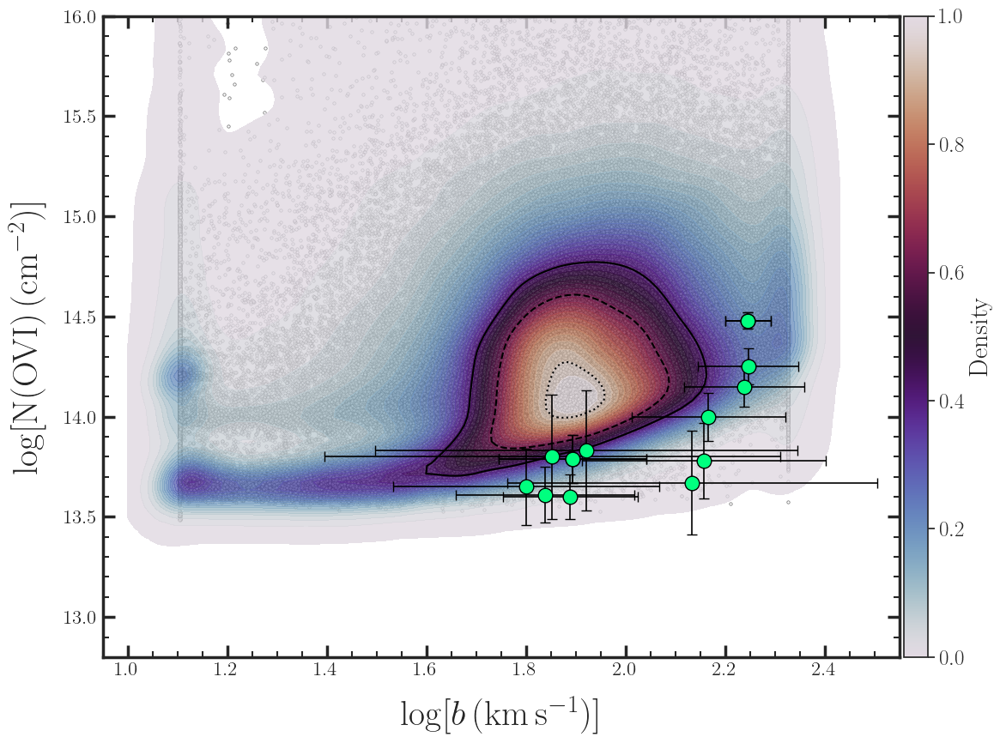

In [110]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
import h5py
# import mcolors
import matplotlib.colors as mcolors

# Paths
#base_dir = '/Users/tsingh65/ASU Dropbox/Tanmay Singh/Grad School/MgII_TNG_Project/Primary Project/Trident Codes/TNG_50_z_0.1_groups/revised_final'
base_dir = '../Grad School/MgII_TNG_Project/Primary Project/Trident Codes/TNG_50_z_0.1_groups/revised_final'

halo_file_path = '../TNG50_fitting_results/TNG_halos.txt'
# fitting_dir = '../TNG50_fitting_results/fitting_combined_features_grp_only_800'
fitting_dir = '../TNG50_fitting_results/v_2500_data_filtered_v800_combined_gal_removed'
full_observation_path = '../COS_IGrM_Data/Full_table_detections.txt'

# Constants
z = 0.09940180263022191  # Redshift
a = 1 / (1 + z)  # Scale factor
h = 0.6774  # Hubble parameter
box_size = 35000  # Simulation box size

# Load the halo group data
halo_data = pd.read_csv(halo_file_path, sep='|', skipinitialspace=True)
halo_data.columns = halo_data.columns.str.strip()
halo_data['Grp_Index'] = np.arange(len(halo_data))

# Extract relevant columns and convert to numeric
halo_data['GroupPos_x'] = pd.to_numeric(halo_data['GroupPos_x(𝑐𝑘𝑝𝑐/ℎ)'], errors='coerce')
halo_data['GroupPos_y'] = pd.to_numeric(halo_data['GroupPos_y(𝑐𝑘𝑝𝑐/ℎ)'], errors='coerce')

# Initialize arrays for results
log_delta_v_params = []
n_ovi_detections = []

# Loop through all group files
for grp_index in tqdm(range(len(halo_data))):
    fitting_file = os.path.join(fitting_dir, f"group_{grp_index}_combined_features.txt")
    if not os.path.exists(fitting_file):
        print(f"File not found: {fitting_file}")
        continue

    fitting_data = pd.read_csv(fitting_file, sep='|', skipinitialspace=True)
    fitting_data.columns = fitting_data.columns.str.strip()

    # Filter for detections (dN is not NaN)
    detected_data = fitting_data[~fitting_data['dN'].isna()]
    # Ensure 'b' values are clean floats
    detected_data['b'] = detected_data['b'].astype(str).str.strip()  # remove trailing spaces
    detected_data['b'] = pd.to_numeric(detected_data['b'], errors='coerce')  # convert to float
        
    # Convert b to log(Δv) using Δv = 3b/sqrt(2)
    for b_value, log_n in zip(detected_data['b'], detected_data['N']):
        delta_v = 3 * b_value / np.sqrt(2)
        log_delta_v_params.append(np.log10(delta_v))
        n_ovi_detections.append(log_n)

# Convert results to numpy arrays
log_delta_v_params = np.array(log_delta_v_params)
n_ovi_detections = np.array(n_ovi_detections)

column_names = [
    'Group', 'z', 'Species', 'Wavelength', 'Comp', 'EW', 'u_EW', 'Vel', 'u_Vel', 
    'logN', 'u_logN', 'b', 'bu', 'bl'
]

obs_data = pd.read_csv(
    full_observation_path, 
    sep='\s+',  # Space-separated values
    comment='#',  # Ignore comment lines
    engine='python', 
    skiprows=29,  # Skip metadata rows
    names=column_names  # Assign column names explicitly
)

# Filter only OVI detections
obs_ovi = obs_data[(obs_data['Species'] == 'OVI') & (~obs_data['logN'].isna()) & (~obs_data['b'].isna())]
obs_b = obs_ovi['b'].values
obs_delta_v = (3 * obs_ovi['b'].values) / np.sqrt(2)
obs_log_delta_v = np.log10(obs_delta_v)
obs_log_n_ovi = obs_ovi['logN'].values

# Read uncertainties
obs_u_logN = obs_ovi['u_logN'].values
obs_u_bu = obs_ovi['bu'].values
obs_u_bl = obs_ovi['bl'].values

# Calculate uncertainties in delta_v (upper and lower)
obs_u_delta_v_u = (3 * (obs_b + obs_u_bu)) / np.sqrt(2) 
print(obs_u_delta_v_u)
print(obs_b)
# convert the string elements in obs_u_bl to float
obs_u_bl = [float(i) for i in obs_u_bl]

obs_u_delta_v_l = ((3 * (obs_b - obs_u_bl)) / np.sqrt(2))
print(obs_u_delta_v_l)

# Convert delta_v uncertainties to log(delta_v) uncertainties
obs_u_log_delta_v_u = np.log10(obs_u_delta_v_u) - obs_log_delta_v  # Upper uncertainty
obs_u_log_delta_v_l = obs_log_delta_v - np.log10(obs_u_delta_v_l)  # Lower uncertainty
print(obs_u_log_delta_v_u)
print(obs_u_log_delta_v_l)

# Plotting
fig, ax = plt.subplots(figsize=(12, 9))

# Scatter plot for simulation data
ax.scatter(
    log_delta_v_params, n_ovi_detections, color='white', s=6, alpha=0.6,
    edgecolor='black', linewidth=0.5, marker='o', zorder=0
)

# KDE plot for simulation data
kde = sns.kdeplot(
    x=log_delta_v_params, y=n_ovi_detections, fill=True,
    cmap="twilight", levels=40, thresh=0.002, alpha=0.8, ax=ax, rasterized=True, zorder=2
)
sns.kdeplot(
    x=log_delta_v_params, y=n_ovi_detections, levels=[0.5, 0.68, 0.95], color="black",
    linewidths=1.5, ax=ax, linestyles=["solid", "dashed", "dotted"], zorder=3
)

# **Add Colorbar for KDE**

from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib import cm
from matplotlib import colors as mcolors

# Create an axis for the colorbar
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="3%", pad=0.05)

kde_min, kde_max = kde.collections[0].get_clim()  # Get color limits from KDE

# Define normalization based on actual KDE density values
norm = mcolors.Normalize(vmin=kde_min, vmax=kde_max)
sm = cm.ScalarMappable(cmap="twilight", norm=norm)
sm.set_array([])  # Needed for colorbar

# Add Colorbar
cbar = fig.colorbar(sm, cax=cax, orientation="vertical")
cbar.set_label(r'$\mathrm{Density}$', fontsize=22)
cbar.ax.tick_params(labelsize=18)


# Observational data with error bars amke arrow color black, have left and right errors
ax.errorbar(
    obs_log_delta_v, obs_log_n_ovi, xerr=[obs_u_log_delta_v_l, obs_u_log_delta_v_u], yerr=obs_u_logN,
    fmt='o', color='springgreen', markersize=12, capsize=4, elinewidth=1.2,
    markeredgecolor='black', zorder=4,ecolor='black', label='COS-IGrM O VI'
)
# ax.errorbar(
#     obs_log_delta_v, obs_log_n_ovi, xerr=obs_u_log_delta_v, yerr=obs_u_logN,
#     fmt='o', color='springgreen', markersize=12, capsize=4, elinewidth=1.2,
#     markeredgecolor='black', zorder=4,ecolor='black'
# )x

# cooling_model_path = '../COS_IGrM_Data/CoolingFlowModel2017.dat' # Cooling flow models from Bordoloi et al. (2017)

# cooling_model = pd.read_csv(cooling_model_path, delim_whitespace=True, comment='#', header=None)
# # Extract velocity and logN(OVI) values for different temperatures
# vel_55 = cooling_model[1]  # Velocity for 10^5.5 K
# log_vel_55 = np.log10(vel_55)
# vel_58 = cooling_model[3]  # Velocity for 10^5.8 K
# log_vel_58 = np.log10(vel_58)
# vel_60 = cooling_model[5] # Velocity for 10^6.0 K
# log_vel_60 = np.log10(vel_60)

# log_N_OVI_55 = cooling_model[2]  # log N(OVI) for 10^5.5 K
# log_N_OVI_58 = cooling_model[4]  # log N(OVI) for 10^5.8 K
# log_N_OVI_60 = cooling_model[6]  # log N(OVI) for 10^6.0 K


# # Plot cooling flow models
# ax.plot(log_vel_55, log_N_OVI_55, 'black', linestyle='dotted', linewidth=3, label=r'$10^{5.5}$ K Cooling Gas')
# ax.plot(log_vel_58, log_N_OVI_58, 'black', linestyle='dashdot', linewidth=3, label=r'$10^{5.8}$ K Cooling Gas')
# ax.plot(log_vel_60, log_N_OVI_60, 'black', linestyle='dashed', linewidth=3, label=r'$10^{6.0}$ K Cooling Gas')


# Customize plot
ax.set_xlabel(r'$\log[b \, (\mathrm{km\,s^{-1}})]$', fontsize=30, labelpad=15)
ax.set_ylabel(r'$\log[\mathrm{N(OVI)} \, (\mathrm{cm^{-2}})]$', fontsize=30, labelpad=15)
# ax.set_ylim(13.2, 18.1)
ax.set_ylim(12.8, 16)
ax.set_xlim(0.95, 2.55)  # Set limits for log(Δv)
x_ticks = np.arange(1, 3, 0.2)
ax.set_xticks(x_ticks)
ax.tick_params(axis='both', which='major', direction='in', width=2, length=7)
ax.spines['top'].set_linewidth(2.5)
ax.spines['right'].set_linewidth(2.5)
ax.spines['bottom'].set_linewidth(2.5)
ax.spines['left'].set_linewidth(2.5)

# Add legend
# ax.legend(frameon=True,framealpha=1, edgecolor='black',loc = 'upper left',
#           fancybox=False, shadow=False, borderpad=0.25,borderaxespad=0.2, handletextpad=0.25, fontsize=16)


from matplotlib.ticker import AutoMinorLocator

# Enable major and minor ticks on all four axes
ax.tick_params(axis='both', which='major', direction='in', length=10, width=2.5, top=True, right=True)
ax.tick_params(axis='both', which='minor', direction='in', length=5, width=1.5, top=True, right=True)

# Add minor tick locators for all axes
ax.yaxis.set_minor_locator(AutoMinorLocator())  # Enable minor ticks for left axis
ax.xaxis.set_minor_locator(AutoMinorLocator())  # Enable minor ticks for bottom axis

ax.set_xlim(0.95, 2.55)
# Save plot
plt.tight_layout()

output_dir = '../TNG50_fitting_results/Plots_gal_removed_new'
# plt.savefig(os.path.join(output_dir, 'log_delta_v_vs_log_n_ovi.png'), dpi=400)
plt.savefig(os.path.join(output_dir, 'log_b_vs_log_n_ovi.png'), dpi=400)
plt.show()


  0%|          | 0/14 [00:00<?, ?it/s]/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_52070/185911073.py:51: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  detected_data['b'] = detected_data['b'].astype(str).str.strip()  # remove trailing spaces
/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_52070/185911073.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  detected_data['b'] = pd.to_numeric(detected_data['b'], errors='coerce')  # convert to float
  7%|▋         | 1/14 [00:00<00:03, 

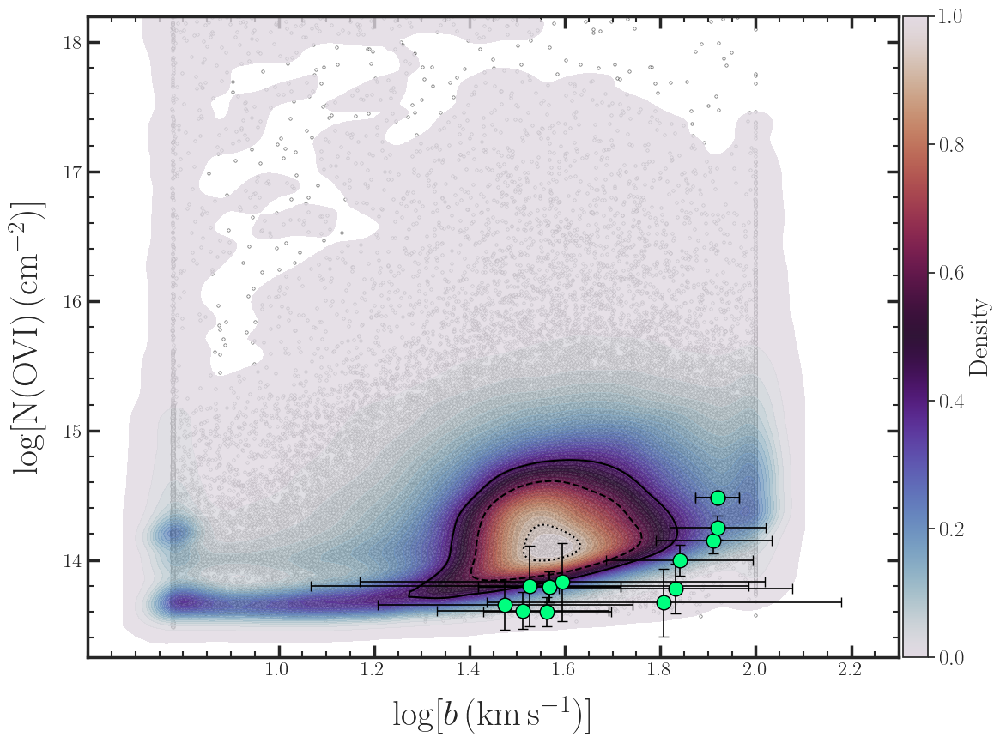

In [111]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
import h5py
import matplotlib.colors as mcolors
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib import cm

# Paths
base_dir = '../Grad School/MgII_TNG_Project/Primary Project/Trident Codes/TNG_50_z_0.1_groups/revised_final'
halo_file_path = '../TNG50_fitting_results/TNG_halos.txt'
# fitting_dir = '../TNG50_fitting_results/fitting_combined_features_grp_only_800'
fitting_dir = '../TNG50_fitting_results/v_2500_data_filtered_v800_combined_gal_removed'
full_observation_path = '../COS_IGrM_Data/Full_table_detections.txt'

# Constants
z = 0.09940180263022191  # Redshift
a = 1 / (1 + z)  # Scale factor
h = 0.6774  # Hubble parameter
box_size = 35000  # Simulation box size

# Load the halo group data
halo_data = pd.read_csv(halo_file_path, sep='|', skipinitialspace=True)
halo_data.columns = halo_data.columns.str.strip()
halo_data['Grp_Index'] = np.arange(len(halo_data))

# Extract relevant columns and convert to numeric
halo_data['GroupPos_x'] = pd.to_numeric(halo_data['GroupPos_x(𝑐𝑘𝑝𝑐/ℎ)'], errors='coerce')
halo_data['GroupPos_y'] = pd.to_numeric(halo_data['GroupPos_x(𝑐𝑘𝑝𝑐/ℎ)'], errors='coerce')

# Initialize arrays for results
log_b_params = []  # Log Doppler parameter
n_ovi_detections = []

# Loop through all group files
for grp_index in tqdm(range(len(halo_data))):
    fitting_file = os.path.join(fitting_dir, f"group_{grp_index}_combined_features.txt")
    if not os.path.exists(fitting_file):
        print(f"File not found: {fitting_file}")
        continue

    fitting_data = pd.read_csv(fitting_file, sep='|', skipinitialspace=True)
    fitting_data.columns = fitting_data.columns.str.strip()

    # Filter for detections (dN is not NaN)
    detected_data = fitting_data[~fitting_data['dN'].isna()]
        # Ensure 'b' values are clean floats
    detected_data['b'] = detected_data['b'].astype(str).str.strip()  # remove trailing spaces
    detected_data['b'] = pd.to_numeric(detected_data['b'], errors='coerce')  # convert to float

    # Store log(b) values
    for b_value, log_n in zip(detected_data['b'], detected_data['N']):
        log_b_params.append(np.log10(b_value))  # Log Doppler parameter
        n_ovi_detections.append(log_n)

# Convert results to numpy arrays
log_b_params = np.array(log_b_params)
n_ovi_detections = np.array(n_ovi_detections)

# Load observational data
column_names = [
    'Group', 'z', 'Species', 'Wavelength', 'Comp', 'EW', 'u_EW', 'Vel', 'u_Vel', 
    'logN', 'u_logN', 'b', 'bu', 'bl'
]

obs_data = pd.read_csv(
    full_observation_path, 
    sep='\s+',  # Space-separated values
    comment='#',  # Ignore comment lines
    engine='python', 
    skiprows=29,  # Skip metadata rows
    names=column_names  # Assign column names explicitly
)

# Filter only OVI detections
obs_ovi = obs_data[(obs_data['Species'] == 'OVI') & (~obs_data['logN'].isna()) & (~obs_data['b'].isna())]
obs_b = obs_ovi['b'].values
obs_log_b = np.log10(obs_b)  # Convert b to log(b)
obs_log_n_ovi = obs_ovi['logN'].values

# Read uncertainties
obs_u_logN = obs_ovi['u_logN'].values
obs_u_bu = obs_ovi['bu'].values
obs_u_bl = obs_ovi['bl'].values

# Convert string uncertainties to float
obs_u_bl = np.array([float(i) for i in obs_u_bl])

# Calculate uncertainties in log(b)
obs_u_log_b_u = np.log10(obs_b + obs_u_bu) - obs_log_b  # Upper uncertainty
obs_u_log_b_l = obs_log_b - np.log10(obs_b - obs_u_bl)  # Lower uncertainty

# **Plotting**
fig, ax = plt.subplots(figsize=(12, 9))

# Scatter plot for simulation data
ax.scatter(
    log_b_params, n_ovi_detections, color='white', s=6, alpha=0.6,
    edgecolor='black', linewidth=0.5, marker='o', zorder=0
)

# KDE plot for simulation data
kde = sns.kdeplot(
    x=log_b_params, y=n_ovi_detections, fill=True,
    cmap="twilight", levels=40, thresh=0.002, alpha=0.8, ax=ax, rasterized=True, zorder=2
)
sns.kdeplot(
    x=log_b_params, y=n_ovi_detections, levels=[0.5, 0.68, 0.95], color="black",
    linewidths=1.5, ax=ax, linestyles=["solid", "dashed", "dotted"], zorder=3
)

# **Add Colorbar for KDE**
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="3%", pad=0.05)
kde_min, kde_max = kde.collections[0].get_clim()
norm = mcolors.Normalize(vmin=kde_min, vmax=kde_max)
sm = cm.ScalarMappable(cmap="twilight", norm=norm)
sm.set_array([])  
cbar = fig.colorbar(sm, cax=cax, orientation="vertical")
cbar.set_label(r'$\mathrm{Density}$', fontsize=22)
cbar.ax.tick_params(labelsize=18)

# Observational data with error bars (black error bars)
ax.errorbar(
    obs_log_b, obs_log_n_ovi, xerr=[obs_u_log_b_l, obs_u_log_b_u], yerr=obs_u_logN,
    fmt='o', color='springgreen', markersize=12, capsize=4, elinewidth=1.2,
    markeredgecolor='black', zorder=4, ecolor='black', label='COS-IGrM O VI'
)

# Customize plot
ax.set_xlabel(r'$\log[b \, (\mathrm{km\,s^{-1}})]$', fontsize=30, labelpad=15)
ax.set_ylabel(r'$\log[\mathrm{N(OVI)} \, (\mathrm{cm^{-2}})]$', fontsize=30, labelpad=15)
ax.set_ylim(12.8, 16)
ax.set_xlim(0.95, 2.55)  
x_ticks = np.arange(1, 3, 0.2)
ax.set_xticks(x_ticks)
ax.tick_params(axis='both', which='major', direction='in', width=2, length=7)
ax.spines['top'].set_linewidth(2.5)
ax.spines['right'].set_linewidth(2.5)
ax.spines['bottom'].set_linewidth(2.5)
ax.spines['left'].set_linewidth(2.5)

# Minor ticks
from matplotlib.ticker import AutoMinorLocator
ax.tick_params(axis='both', which='major', direction='in', length=10, width=2.5, top=True, right=True)
ax.tick_params(axis='both', which='minor', direction='in', length=5, width=1.5, top=True, right=True)
ax.yaxis.set_minor_locator(AutoMinorLocator())
ax.xaxis.set_minor_locator(AutoMinorLocator())
ax.set_xlim(0.6, 2.3)
ax.set_ylim(13.25, 18.2)
plt.tight_layout()
# Save plot
output_dir = '../TNG50_fitting_results/Plots_gal_removed_new'
plt.savefig(os.path.join(output_dir, 'log_b_vs_log_n_ovi.png'), dpi=400)

plt.show()

Ignoring first/last bins, the peak is at bin center = 1.541, density = 1.902


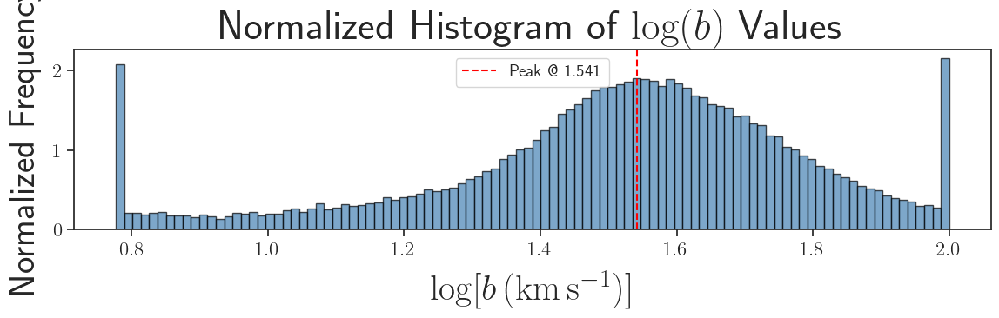

In [112]:
import numpy as np
import matplotlib.pyplot as plt

# Suppose log_b_params is already defined as a NumPy array

# 1. Compute the density-normalized histogram manually (no direct ax.hist).
counts, bin_edges = np.histogram(log_b_params, bins=100, density=True)

# 2. Find the peak ignoring the first and last bins.
#    We'll skip counts[0] and counts[-1] by using counts[1:-1].
peak_value = np.max(counts[1:-1])  # The maximum density ignoring first/last bin
peak_idx = np.where(counts[1:-1] == peak_value)[0][0] + 1  # +1 to offset the slice

# 3. Compute the bin center for that peak bin
peak_bin_center = 0.5 * (bin_edges[peak_idx] + bin_edges[peak_idx + 1])

print(f"Ignoring first/last bins, the peak is at bin center = {peak_bin_center:.3f}, density = {peak_value:.3f}")

# 4. Plot the histogram using plt.bar or ax.hist for visualization
fig, ax = plt.subplots(figsize=(12, 4))
ax.hist(log_b_params, bins=bin_edges, density=True, color='steelblue', 
        edgecolor='black', alpha=0.7)
ax.set_xlabel(r'$\log[b \, (\mathrm{km\,s^{-1}})]$', fontsize=30, labelpad=10)
ax.set_ylabel('Normalized Frequency', fontsize=30, labelpad=10)
ax.set_title('Normalized Histogram of $\log(b)$ Values', fontsize=34)

# Optional: Mark the peak bin center on the plot
ax.axvline(peak_bin_center, color='red', linestyle='--', 
           label=f'Peak @ {peak_bin_center:.3f}')
ax.legend(fontsize=14)

plt.tight_layout()
plt.show()

In [114]:
10**(1.541)

34.753616144320574

In [105]:
print(detected_data['b'].dtype)
print(detected_data['b'].head())

object
17    63.602870332010696     
32    44.299908346834314     
61     13.25769833236396     
62    50.112312434084735     
69    18.252776191186673     
Name: b, dtype: object


  0%|          | 0/14 [00:00<?, ?it/s]/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_52070/2138085953.py:60: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  detected_data['b'] = detected_data['b'].astype(str).str.strip()
/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_52070/2138085953.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  detected_data['b'] = pd.to_numeric(detected_data['b'], errors='coerce')
  7%|▋         | 1/14 [00:00<00:03,  3.54it/s]/var/folders/ng/2lqpk97j4xz4qpsvv8

1.5413172739811025


/Users/wavefunction/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines/igrm/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/wavefunction/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines/igrm/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/wavefunction/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines/igrm/lib/python3.11/site-packages/seaborn/distributions.py:1185: UserWarning: The following kwargs were not used by contour: 'rasterized'
  cset = contour_func(
/Users/wavefunction/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines/igrm/lib/python3.11/site-packages/seaborn

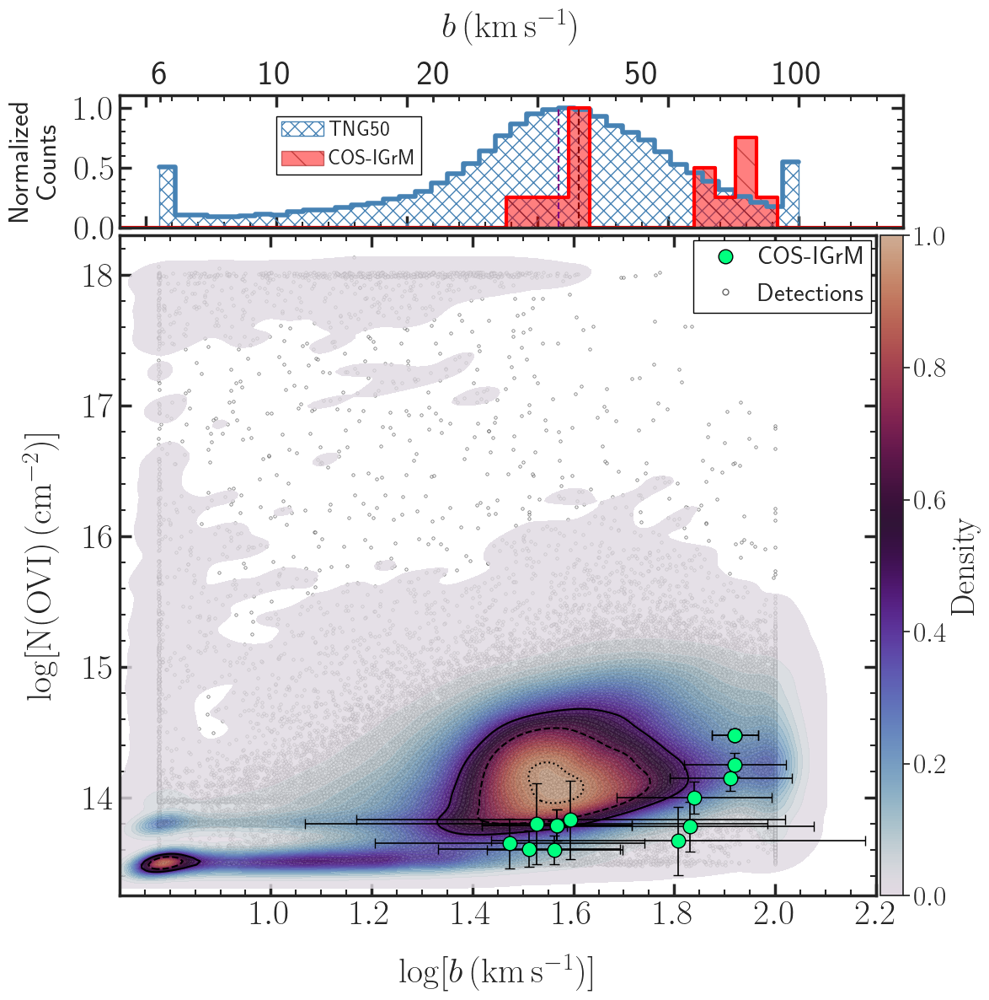

In [212]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
import h5py
import matplotlib.colors as mcolors
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib import cm
from matplotlib.ticker import AutoMinorLocator

# ----------------------------
# Paths
# ----------------------------
base_dir = '../Grad School/MgII_TNG_Project/Primary Project/Trident Codes/TNG_50_z_0.1_groups/revised_final'
halo_file_path = '../TNG50_fitting_results/TNG_halos.txt'
# fitting_dir = '../TNG50_fitting_results/fitting_combined_features_grp_only_800'
fitting_dir = '../TNG50_fitting_results/v_2500_data_filtered_v800_combined_gal_removed'
full_observation_path = '../COS_IGrM_Data/Full_table_detections.txt'

# ----------------------------
# Constants
# ----------------------------
z = 0.09940180263022191  # Redshift
a = 1 / (1 + z)          # Scale factor
h = 0.6774               # Hubble parameter
box_size = 35000         # Simulation box size

# ----------------------------
# Load the halo group data
# ----------------------------
halo_data = pd.read_csv(halo_file_path, sep='|', skipinitialspace=True)
halo_data.columns = halo_data.columns.str.strip()
halo_data['Grp_Index'] = np.arange(len(halo_data))

# Extract relevant columns and convert to numeric
halo_data['GroupPos_x'] = pd.to_numeric(halo_data['GroupPos_x(𝑐𝑘𝑝𝑐/ℎ)'], errors='coerce')
halo_data['GroupPos_y'] = pd.to_numeric(halo_data['GroupPos_x(𝑐𝑘𝑝𝑐/ℎ)'], errors='coerce')

# ----------------------------
# Initialize arrays for results (simulation)
# ----------------------------
log_b_params = []  # Log Doppler parameter
n_ovi_detections = []

# Loop through all group files to obtain simulation data
for grp_index in tqdm(range(len(halo_data))):
    fitting_file = os.path.join(fitting_dir, f"group_{grp_index}_combined_features.txt")
    if not os.path.exists(fitting_file):
        print(f"File not found: {fitting_file}")
        continue

    fitting_data = pd.read_csv(fitting_file, sep='|', skipinitialspace=True)
    fitting_data.columns = fitting_data.columns.str.strip()

    # Filter for detections (dN is not NaN)
    detected_data = fitting_data[~fitting_data['dN'].isna()]
        # --- Clean the 'b' column ---
    detected_data['b'] = detected_data['b'].astype(str).str.strip()
    detected_data['b'] = pd.to_numeric(detected_data['b'], errors='coerce')

    # Store log(b) and N(OVI) values for detections
    for b_value, log_n in zip(detected_data['b'], detected_data['N']):
        log_b_params.append(np.log10(b_value))
        n_ovi_detections.append(log_n)

log_b_params = np.array(log_b_params)
n_ovi_detections = np.array(n_ovi_detections)

# ----------------------------
# Load observational data
# ----------------------------
column_names = [
    'Group', 'z', 'Species', 'Wavelength', 'Comp', 'EW', 'u_EW', 'Vel', 'u_Vel', 
    'logN', 'u_logN', 'b', 'bu', 'bl'
]
obs_data = pd.read_csv(
    full_observation_path, 
    sep='\s+',  # Space-separated values
    comment='#',  
    engine='python', 
    skiprows=29,  
    names=column_names
)

# Filter only OVI detections
obs_ovi = obs_data[(obs_data['Species'] == 'OVI') & (~obs_data['logN'].isna()) & (~obs_data['b'].isna())]
obs_b = obs_ovi['b'].values
obs_log_b = np.log10(obs_b)
obs_log_n_ovi = obs_ovi['logN'].values

# Read uncertainties
obs_u_logN = obs_ovi['u_logN'].values
obs_u_bu = obs_ovi['bu'].values
obs_u_bl = np.array([float(i) for i in obs_ovi['bl'].values])

# Calculate uncertainties in log(b)
obs_u_log_b_u = np.log10(obs_b + obs_u_bu) - obs_log_b
obs_u_log_b_l = obs_log_b - np.log10(obs_b - obs_u_bl)

# ----------------------------
# Set up LaTeX and overall plotting style
# ----------------------------
plt.rcParams.update({
    "text.usetex": True,
    "font.family": "serif",
    "axes.labelsize": 32,
    "axes.titlesize": 36,
    "xtick.labelsize": 30,
    "ytick.labelsize": 30,
    "legend.fontsize": 30,
    "figure.titlesize": 22,
    "text.latex.preamble": r"\usepackage{amsmath}"
})
plt.rc('font', family='Times New Roman')
sns.set(style="ticks", font_scale=1.5)

# ----------------------------
# Create a figure with two subplots (vertical stack, no space between)
# ----------------------------
fig, (ax_top, ax_bottom) = plt.subplots(2, 1, figsize=(12, 13), sharex=False,
                                          gridspec_kw={'hspace': 0.02, 'height_ratios': [1, 5]})
# --- Top subplot: Peak-normalized histogram of log(b) values (Simulation) ---

# --- Top subplot: Step histogram with hatch, fully enclosed ---

# 1) Compute raw counts
counts, bin_edges = np.histogram(log_b_params, bins=40)

# 2) Peak-normalize
max_count = np.max(counts)
counts_peaknorm = counts / max_count

# 3) We want counts_full to match bin_edges in length
#    so that fill_between extends from left edge to right edge.
counts_full = np.zeros(len(bin_edges))
counts_full[:-1] = counts_peaknorm  # copy all but last
counts_full[-1] = counts_peaknorm[-1]  # last bin same as second to last

# 4) Fill with hatch
ax_top.fill_between(
    bin_edges,  # x-values
    0,          # lower boundary
    counts_full,# upper boundary
    step='post', 
    hatch='XX',        # your desired hatch pattern
    facecolor='none',   # no solid fill, just hatch
    edgecolor='steelblue', 
    alpha=1.0, label='TNG50'
)

# 5) Optionally draw a step line on top for a clean boundary
ax_top.step(
    bin_edges, counts_full, where='post',
    color='steelblue', linewidth=4,
)

# Optionally set y-limits to ensure the top is around 1
ax_top.set_ylim(0, 1.1)

# (Optional) Adjust y-ticks
y_ticks = [0, 0.5, 1.0]
ax_top.set_yticks(y_ticks)

ax_top.set_ylabel("Normalized\nCounts", fontsize=24, labelpad=10)
# Remove x-tick labels if you only want the bottom subplot to show them
ax_top.set_xticklabels([])  # remove top x tick labels
# draw v lines at x = 1.688 
#print(np.max(counts_peaknorm)) with 6 decimal places
print(bin_edges[np.argmax(counts_peaknorm)])
ax_top.axvline(x=1.541, color='purple', linestyle='--', linewidth=1.5, ymin=0.0, ymax=0.9)

# Keep your existing styling
ax_top.tick_params(axis='both', which='major', direction='in', width=2, length=7)
ax_top.spines['top'].set_linewidth(2.5)
ax_top.spines['right'].set_linewidth(2.5)
ax_top.spines['bottom'].set_linewidth(2.5)
ax_top.spines['left'].set_linewidth(2.5)
ax_top.tick_params(axis='both', which='major', direction='in', length=10, width=2.5, top=True, right=True)
ax_top.tick_params(axis='both', which='minor', direction='in', length=5, width=1.5, top=True, right=True)
ax_top.xaxis.set_minor_locator(AutoMinorLocator())
ax_top.yaxis.set_minor_locator(AutoMinorLocator())


# --- Observational data: Simple Normalized Histogram of log(b) values (COS-IGrM) ---
obs_counts, obs_edges = np.histogram(obs_log_b, bins=40, range=(0.6, 2.2))
obs_peak = np.max(obs_counts)
obs_counts_norm = obs_counts / obs_peak
# Create an array that matches the length of obs_edges so that fill_between can be used
obs_counts_full = np.zeros(len(obs_edges))
obs_counts_full[:-1] = obs_counts_norm
obs_counts_full[-1] = obs_counts_norm[-1]
# Compute bin centers for potential reference (e.g., to draw a vertical line at the peak)
obs_bin_centers = 0.5 * (obs_edges[:-1] + obs_edges[1:])

# Plot as a step function on the same subplot (ax_top) in red
ax_top.step(obs_edges, obs_counts_full, where='post', color='red', linewidth=3)

# Fill between the histogram boundaries to create a hatched area
ax_top.fill_between(
    obs_edges,          # x-values (edges of bins)
    0,                  # lower boundary
    obs_counts_full,    # upper boundary (normalized counts)
    step='post',
    color='red',        # fill color
    hatch='\\',           # set desired hatch pattern if needed (or leave empty)
    edgecolor='darkred', 
    alpha=0.5,
    label='COS-IGrM'
)

ax_top.tick_params(axis='x', which='major', direction='in', length=6, width=2, labelsize=30)
ax_top.tick_params(axis='y', which='major', direction='in', length=6, width=2, labelsize=30)    
# Draw a vertical dashed line at the bin center corresponding to the peak value
peak_idx = np.argmax(obs_counts_norm)
ax_top.axvline(x=obs_bin_centers[peak_idx], color='darkred', linestyle='--', linewidth=1.5, ymin=0.0, ymax=0.9)

# # --- Top subplot: Peak-normalized histogram of log(b) values (Simulation) ---

# # 1. Compute raw counts (no density) for simulation
# counts, bin_edges = np.histogram(log_b_params, bins=100)
# max_count = np.max(counts)
# counts_peaknorm = counts / max_count

# # 2. Plot simulation histogram
# ax_top.bar(
#     bin_edges[:-1], counts_peaknorm, width=np.diff(bin_edges),
#     color='steelblue', edgecolor='black', alpha=0.7,
#     label='Sim. Peak-Norm'
# )

# ax_top.set_ylim(0, 1.1)
# ax_top.set_ylabel("Normalized\nCounts", fontsize=18, labelpad=10)
# ax_top.set_xticklabels([])  # remove top x tick labels
# # ... (styling, minor ticks, etc.)

# # --- Observational data: Monte Carlo approach to incorporate errors ---

# n_draws = 10000  # how many random draws per data point
# all_draws = []

# for i in range(len(obs_log_b)):
#     # Approximate symmetrical std dev from lower & upper error bars
#     sigma_i = (obs_u_log_b_l[i] + obs_u_log_b_u[i]) / 2.0

#     # Draw samples from a normal distribution centered on obs_log_b[i]
#     draws_i = np.random.normal(loc=obs_log_b[i], scale=sigma_i, size=n_draws)
#     all_draws.append(draws_i)

# # Concatenate all random draws
# all_draws = np.concatenate(all_draws)

# # Build a histogram from these draws (no density yet)
# # Use fewer bins since data is small; set a relevant range
# obs_counts, obs_edges = np.histogram(all_draws, bins=40, range=(0.6, 2.2), density=False)

# # Peak-normalize the observational histogram
# obs_peak = obs_counts.max()
# obs_counts_norm = obs_counts / obs_peak
# obs_bin_centers = 0.5 * (obs_edges[:-1] + obs_edges[1:])

# # Plot as a step function on the same subplot
# ax_top.step(obs_bin_centers, obs_counts_norm, where='mid',
#             color='red', linewidth=4)

# # 1) Convert obs_counts_norm into an array with same length as obs_edges
# obs_counts_full = np.zeros(len(obs_edges))
# obs_counts_full[:-1] = obs_counts_norm
# obs_counts_full[-1] = obs_counts_norm[-1]


# # 2) Fill between 0 and obs_counts_full with a hatch
# ax_top.fill_between(
#     obs_edges,          # x
#     0,                  # y1
#     obs_counts_full,    # y2
#     step='post',        # ensures the fill extends bin by bin
#     color='red',       # no solid fill
#     hatch='',        # your desired hatch pattern
#     edgecolor='darkred',    # color of hatch lines
#     alpha=0.2,
#     label='COS-IGrM'
# )

# # 3) Draw a step outline on top (for a crisp boundary)
# ax_top.step(
#     obs_edges, obs_counts_full,
#     where='post',
#     color='red', linewidth=3
# )

# draw a v line at max of obs_counts_norm with y = 0 to the max of obs_counts_norm
# #print(obs_bin_centers[np.argmax(obs_counts_norm)]) with 6 decimal places
# print(obs_bin_centers[np.argmax(obs_counts_norm)])

# ax_top.axvline(x=obs_bin_centers[np.argmax(obs_counts_norm)], color='darkred', linestyle='--', linewidth=1.5, ymin=0.0, ymax=0.9)


# Optionally add a legend if you haven't already
#ax_top.legend(fontsize=15, loc='upper left')
ax_top.legend(frameon=True, framealpha=1, edgecolor='black', loc=(0.2,0.4),
    fancybox=False, shadow=False, borderpad=0.25, borderaxespad=0.2, handletextpad=0.25, fontsize=18
)


# ----------------------------
# Bottom subplot: Log(b) vs. Log[N(OVI)] plot
# ----------------------------

# Scatter plot for simulation data
ax_bottom.scatter(
    log_b_params, n_ovi_detections, color='white', s=6, alpha=0.6,
    edgecolor='black', linewidth=0.5, marker='o', zorder=0
)

# KDE plot for simulation data
kde = sns.kdeplot(
    x=log_b_params, y=n_ovi_detections, fill=True,
    cmap=twilight_trunc, levels=40, thresh=0.002, alpha=0.8, ax=ax_bottom, rasterized=True, zorder=2
)
sns.kdeplot(
    x=log_b_params, y=n_ovi_detections, levels=[0.5, 0.68, 0.95], color="black",
    linewidths=1.5, ax=ax_bottom, linestyles=["solid", "dashed", "dotted"], zorder=3
)

# Observational data with error bars (black error bars)
ax_bottom.errorbar(
    obs_log_b, obs_log_n_ovi, xerr=[obs_u_log_b_l, obs_u_log_b_u], yerr=obs_u_logN,
    fmt='o', color='springgreen', markersize=12, capsize=4, elinewidth=1.2,
    markeredgecolor='black', zorder=4, ecolor='black', label='COS-IGrM O VI'
)

# Customize bottom subplot
ax_bottom.set_xlabel(r'$\log[b \, (\mathrm{km\,s^{-1}})]$', fontsize=30, labelpad=20)
ax_bottom.set_ylabel(r'$\log[\mathrm{N(OVI)} \, (\mathrm{cm^{-2}})]$', fontsize=30, labelpad=20)
ax_bottom.set_xlim(0.6, 2.3)
ax_bottom.set_ylim(13.25, 18.3)
x_ticks = [1.0, 1.2, 1.4, 1.6, 1.8, 2.0, 2.2]
ax_bottom.set_xticks(x_ticks)
ax_bottom.tick_params(axis='x', labelbottom=True)  # Force tick labels on bottom subplot

ax_bottom.tick_params(axis='both', which='major', direction='in', width=2, length=7)
ax_bottom.spines['top'].set_linewidth(2.5)
ax_bottom.spines['right'].set_linewidth(2.5)
ax_bottom.spines['bottom'].set_linewidth(2.5)
ax_bottom.spines['left'].set_linewidth(2.5)
ax_bottom.tick_params(axis='both', which='major', direction='in', length=10, width=2.5, top=True, right=True)
ax_bottom.tick_params(axis='both', which='minor', direction='in', length=5, width=1.5, top=True, right=True)
ax_bottom.xaxis.set_minor_locator(AutoMinorLocator())
ax_bottom.yaxis.set_minor_locator(AutoMinorLocator())


ax_top.tick_params(axis='both', which='major', direction='in', length=10, width=2.5, top=True, right=True, labelsize=30)
ax_top.tick_params(axis='both', which='minor', direction='in', length=5, width=1.5, top=True, right=True)

ax_bottom.tick_params(axis='both', which='major', direction='in', length=10, width=2.5, top=True, right=True, labelsize=30)
ax_bottom.tick_params(axis='both', which='minor', direction='in', length=5, width=1.5, top=True, right=True)

# ----------------------------
# Add a colorbar for the KDE plot in the bottom subplot
# ----------------------------
divider = make_axes_locatable(ax_bottom)
cax = divider.append_axes("right", size="3%", pad=0.05)
kde_min, kde_max = kde.collections[0].get_clim()
norm = mcolors.Normalize(vmin=kde_min, vmax=kde_max)
sm = cm.ScalarMappable(cmap=twilight_trunc, norm=norm)
sm.set_array([])
cbar = fig.colorbar(sm, cax=cax, orientation="vertical")
cbar.set_label(r'$\mathrm{Density}$', fontsize=28)
cbar.ax.tick_params(labelsize=24)


# ----------------------------
from matplotlib.lines import Line2D
legend_elements = [
    Line2D([0], [0], marker='o', color='springgreen', label='COS-IGrM', markersize=12,
           markeredgecolor='black', linestyle='none'),
    Line2D([0], [0], marker='o', color='white', label='Detections', markersize=5,
           markeredgecolor='black', linestyle='none', alpha=0.6),
]
ax_bottom.legend(
    handles=legend_elements,
    frameon=True, framealpha=1, edgecolor='black', loc='upper right',
    fancybox=False, shadow=False, borderpad=0.25, borderaxespad=0.2, handletextpad=0.25, fontsize=22
)

ax_top.set_xlim(0.7, 2.2)
ax_bottom.set_xlim(0.7, 2.2)

for label in ax_bottom.get_xticklabels():
    label.set_visible(True)

# Suppose ax_top is your subplot that uses log(b) on the x-axis.
# We'll create a secondary x-axis on top with actual b (km/s).

def logb_to_b(x):
    """Forward transform: from log10(b) to b."""
    return 10**x

def b_to_logb(x):
    """Inverse transform: from b to log10(b)."""
    return np.log10(x)

# Create the secondary axis
ax_top2 = ax_top.secondary_xaxis("top", functions=(logb_to_b, b_to_logb))

# Set label, styling
ax_top2.set_xlabel(r'$b \, (\mathrm{km\,s^{-1}})$', fontsize=30, labelpad=20)

# Define some tick positions in b (km/s) that you want on the top axis
# (They must be within the numeric range that corresponds to ax_top's log(b) limits.)
tickvals_b = [6, 10, 20, 50, 100, 200]
ax_top2.set_xticks(tickvals_b)
ax_top2.set_xticklabels([str(v) for v in tickvals_b], fontsize=30)
ax_top2.tick_params(axis='x', which='major', direction='in', length=6, width=2)

# Optionally, style the new top axis ticks, color, etc.
# ------------------------
# ----
# Finalize and save the figure
# ----------------------------
#plt.tight_layout()
output_dir = '../TNG50_fitting_results/Plots_gal_removed_new'
if not os.path.exists(output_dir):
    os.makedirs(output_dir)
plt.tight_layout()
plt.subplots_adjust(bottom=0.15)

plt.savefig(os.path.join(output_dir, 'N_OVI_doppler_hist.png'), dpi=200)
plt.show()

In [107]:
import astropy.units as u
from astropy.cosmology import Planck18 as cosmo
from astropy.coordinates import SkyCoord

# # Given data
# ra_gp, dec_gp, z_gp = 130.493, 14.100, 0.1250  # Group center
# ra_cg, dec_cg = 130.502, 14.097  # Closest galaxy
# ra_qso, dec_qso, z_qso = 130.496, 14.112, 1.2514  # QSO coordinates and redshift

ra_gp,dec_gp,z_gp = 130.49283, 14.100495, 0.125003
ra_qso,dec_qso,z_qso = 130.49640517, 14.11172007, 1.25143	

# Convert to SkyCoord objects
group_coord = SkyCoord(ra=ra_gp*u.deg, dec=dec_gp*u.deg)
# galaxy_coord = SkyCoord(ra=ra_cg*u.deg, dec=dec_cg*u.deg)
qso_coord = SkyCoord(ra=ra_qso*u.deg, dec=dec_qso*u.deg)

# Compute angular separations in arcsec
impact_group_ang_sep = qso_coord.separation(group_coord).to(u.arcsec)  # Convert to arcsec
#impact_galaxy_ang_sep = qso_coord.separation(galaxy_coord).to(u.arcsec)  # Convert to arcsec

# Convert redshift to angular diameter distance (in kpc)
D_A = cosmo.angular_diameter_distance(z_gp).to(u.kpc)  # Convert Mpc to kpc

# Convert angular separation to physical impact parameter in kpc
impact_parameter_group_kpc = (impact_group_ang_sep.to(u.radian).value * D_A.value)
#impact_parameter_galaxy_kpc = (impact_galaxy_ang_sep.to(u.radian).value * D_A.value)

# Print results
print(f"Impact parameter of QSO to Group Center: {impact_parameter_group_kpc:.2f} kpc")
#print(f"Impact parameter of QSO to Nearest Galaxy: {impact_parameter_galaxy_kpc:.2f} kpc")

Impact parameter of QSO to Group Center: 97.94 kpc


In [104]:
import numpy as np
from astropy import units as u
from astropy.cosmology import Planck18 as cosmo

def impact_parameter(ra1_deg, dec1_deg, ra2_deg, dec2_deg, redshift):
    """
    Calculate the impact parameter between two celestial objects.

    Parameters:
    ra1_deg, dec1_deg : float
        RA and Dec of the first object in degrees.
    ra2_deg, dec2_deg : float
        RA and Dec of the second object in degrees.
    redshift : float
        Redshift to the objects (assumed to be approximately the same for both).

    Returns:
    impact_param_kpc : float
        Impact parameter in kiloparsecs.
    """
    # Convert coordinates from degrees to radians
    ra1 = np.deg2rad(ra1_deg)
    dec1 = np.deg2rad(dec1_deg)
    ra2 = np.deg2rad(ra2_deg)
    dec2 = np.deg2rad(dec2_deg)

    # Calculate the angular separation using the spherical law of cosines
    cos_theta = (np.sin(dec1) * np.sin(dec2) +
                 np.cos(dec1) * np.cos(dec2) * np.cos(ra1 - ra2))
    theta = np.arccos(cos_theta)  # Angular separation in radians

    # Calculate the angular diameter distance in kpc
    D_A = cosmo.angular_diameter_distance(redshift).to(u.kpc).value

    # Calculate the impact parameter (physical separation) in kpc
    impact_param_kpc = theta * D_A

    return impact_param_kpc

# Example usage:
ra_qso = 130.496  # RA of QSO in degrees
dec_qso = 14.112  # Dec of QSO in degrees
ra_galaxy = 130.502  # RA of galaxy in degrees
dec_galaxy = 14.097  # Dec of galaxy in degrees
z = 0.1250  # Redshift

impact_param = impact_parameter(ra_qso, dec_qso, ra_galaxy, dec_galaxy, z)
print(f"Impact parameter: {impact_param:.2f} kpc")

impact_param = impact_parameter(ra_qso, dec_qso, ra_gp, dec_gp, z)
print(f"Impact parameter: {impact_param:.2f} kpc")

Impact parameter: 134.13 kpc
Impact parameter: 102.94 kpc


In [128]:
from astropy.table import Table

# Extracted data from the table
data = [
    ["1", "J0841+1406", "130.493", "14.100", "0.1250", "130.496", "14.112", "1.2514", "3", "81.3", "638", "95", "13.32", "567", "229", "130.502", "14.097", "CGM + IGrM"],
    ["2", "J1017+4702", "154.246", "47.049", "0.1637", "154.379", "47.040", "0.3350", "3", "91.9", "710", "926", "13.33", "573", "232", "154.302", "47.025", "IGrM"],
    ["3", "J1020+1003", "155.222", "10.137", "0.1229", "155.235", "10.059", "0.6074", "3", "223.0", "466", "632", "13.19", "516", "209", "155.200", "10.092", "IGrM"],
    ["4", "J1025+4808", "156.286", "48.110", "0.1333", "156.304", "48.148", "0.3317", "4", "135.7", "315", "340", "13.31", "564", "228", "156.293", "48.164", "CGM + IGrM"],
    ["5", "J1102+0521", "165.676", "5.296", "0.1314", "165.653", "5.355", "0.4987", "4", "210.1", "528", "536", "13.23", "532", "215", "165.695", "5.355", "IGrM"],
    ["6", "J1126+1204", "171.691", "12.122", "0.1640", "171.637", "12.077", "0.9759", "5", "76.0", "686", "707", "13.61", "709", "287", "171.641", "12.094", "CGM + IGrM"],
    ["7", "J1127+2654", "171.875", "26.900", "0.1521", "171.902", "26.914", "0.3790", "3", "89.6", "492", "267", "13.40", "606", "245", "171.904", "26.904", "CGM + IGrM"],
    ["8", "J1216+0712", "184.140", "7.148", "0.1360", "184.169", "7.207", "0.5864", "3", "242.7", "404", "572", "13.35", "579", "234", "184.161", "7.174", "IGrM"],
    ["9", "J1301+2819", "195.206", "28.410", "0.1439", "195.254", "28.329", "1.3597", "3", "141.2", "613", "836", "13.33", "574", "232", "195.243", "28.361", "IGrM"],
    ["10", "J1339+5355", "204.814", "53.990", "0.1590", "204.802", "53.924", "0.2933", "4", "85.1", "523", "653", "13.43", "620", "251", "204.852", "53.969", "IGrM"],
    ["11", "J1343+2538", "206.031", "25.700", "0.0749", "205.986", "25.647", "0.0866", "3", "43.0", "291", "346", "12.85", "396", "160", "205.975", "25.675", "IGrM"],
    ["12", "J1344+5546", "206.195", "55.802", "0.1546", "206.198", "55.782", "0.9369", "3", "177.2", "570", "194", "13.44", "625", "253", "206.210", "55.795", "CGM + IGrM"],
    ["13", "J1348+4303", "207.343", "43.017", "0.0947", "207.228", "43.053", "0.2748", "7", "207.7", "574", "580", "13.60", "705", "285", "207.276", "43.047", "IGrM"],
    ["14", "J1408+5657", "212.222", "56.911", "0.1302", "212.226", "56.962", "0.3363", "3", "43.2", "403", "427", "13.46", "632", "256", "212.257", "56.980", "IGrM"],
    ["15", "J1424+4214", "216.247", "42.261", "0.0995", "216.231", "42.235", "0.3162", "3", "46.3", "459", "189", "13.17", "506", "205", "216.219", "42.251", "CGM + IGrM"],
    ["16", "J1426+1955", "216.465", "19.914", "0.1091", "216.555", "19.924", "0.2133", "3", "111.1", "594", "616", "12.89", "407", "165", "216.504", "19.867", "IGrM"],
    ["17", "J1428+3225", "217.304", "32.404", "0.1308", "217.246", "32.419", "0.6270", "4", "123.6", "777", "433", "13.32", "567", "229", "217.320", "32.431", "IGrM"],
    ["18", "J1617+0854", "244.430", "8.913", "0.0993", "244.349", "8.904", "0.2064", "6", "69.3", "392", "533", "13.36", "585", "237", "244.395", "8.884", "IGrM"],
]

# Table Header (Column Names)
header = [
    "Sightline", "Group", "RA_gp", "Decl_gp", "z_gp", "RA_qso", "Decl_qso", "z_qso", 
    "N_gp", "σ_Tago", "Rvir_Tago", "ρ_QSO", "log[M_halo]", "Rvir", "σ_gp", 
    "RA_cg", "Decl_cg", "Subset"
]

# Create Astropy Table
table = Table(rows=data, names=header)

# Save Table as ASCII Fixed-Width with '|' Delimiter
output_table_path = "../COS_IGrM_Data/Group_Sightline_Data.txt"
table.write(output_table_path, format="ascii.fixed_width", delimiter="|", overwrite=True)


In [129]:
import pandas as pd
from astropy.table import Table

# File paths
group_sightline_file = '/Users/tsingh65/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines/COS_IGrM_Data/Group_Sightline_Data.txt'
sample_full_file = '/Users/tsingh65/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines/COS_IGrM_Data/Sample_full.txt'

# Load the files
group_sightline_data = pd.read_csv(group_sightline_file, sep='|', skipinitialspace=True)
sample_full_data = pd.read_csv(sample_full_file, sep='\s+', skipinitialspace=True, comment='#')

# Ensure column names are stripped of extra spaces
group_sightline_data.columns = group_sightline_data.columns.str.strip()
sample_full_data.columns = sample_full_data.columns.str.strip()

# Define the column mapping between the two files
column_mapping = {
    "RA_GP": "RA_gp",
    "DEC_GP": "Decl_gp",
    "Z_GP": "z_gp",
    "QSO_RA": "RA_qso",
    "QSO_DEC": "Decl_qso",
    "Z_QSO": "z_qso",
    "QSO_Rho(kpc)" : "ρ_QSO"
    
}

# Replace the columns in Group_Sightline_Data with corresponding values from Sample_full
for sample_col, group_col in column_mapping.items():
    if sample_col in sample_full_data.columns and group_col in group_sightline_data.columns:
        group_sightline_data[group_col] = sample_full_data[sample_col]
    else:
        print(f"Warning: Column '{sample_col}' or '{group_col}' not found in one of the files.")

# Convert the updated DataFrame to an Astropy Table
table = Table.from_pandas(group_sightline_data)

# Save the updated table as an ASCII fixed-width file with '|' delimiter
output_table_path = "/Users/tsingh65/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines/COS_IGrM_Data/Group_Sightline_Data.txt"
table.write(output_table_path, format="ascii.fixed_width", delimiter="|", overwrite=True)

print(f"Updated file saved to: {output_table_path}")

Updated file saved to: /Users/tsingh65/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines/COS_IGrM_Data/Group_Sightline_Data.txt


In [130]:
import astropy.units as u
from astropy.cosmology import Planck18 as cosmo
from astropy.coordinates import SkyCoord
from astropy.table import Table

# Load the existing table
input_file = '../COS_IGrM_Data/Group_Sightline_Data.txt'
table = Table.read(input_file, format="ascii.fixed_width", delimiter="|")

# Calculate impact parameters for each row
impact_param_group = []
impact_param_galaxy = []

for row in table:
    # Group center and QSO
    ra_gp, dec_gp = float(row["RA_gp"]), float(row["Decl_gp"])
    ra_qso, dec_qso = float(row["RA_qso"]), float(row["Decl_qso"])
    z_gp = float(row["z_gp"])

    # Closest galaxy
    ra_cg, dec_cg = float(row["RA_cg"]), float(row["Decl_cg"])

    # Convert to SkyCoord objects
    group_coord = SkyCoord(ra=ra_gp * u.deg, dec=dec_gp * u.deg)
    galaxy_coord = SkyCoord(ra=ra_cg * u.deg, dec=dec_cg * u.deg)
    qso_coord = SkyCoord(ra=ra_qso * u.deg, dec=dec_qso * u.deg)

    # Compute angular separations
    impact_group_ang_sep = qso_coord.separation(group_coord)  # Angular separation to group center
    impact_galaxy_ang_sep = qso_coord.separation(galaxy_coord)  # Angular separation to nearest galaxy

    # Convert angular separation to physical impact parameter (in kpc)
    D_A = cosmo.angular_diameter_distance(z_gp).to(u.kpc)  # Angular diameter distance at redshift z_gp
    impact_parameter_group_kpc = (impact_group_ang_sep.to(u.radian).value * D_A.value)
    impact_parameter_galaxy_kpc = (impact_galaxy_ang_sep.to(u.radian).value * D_A.value)

    # Append results to the respective lists
    impact_param_group.append(impact_parameter_group_kpc)
    impact_param_galaxy.append(impact_parameter_galaxy_kpc)

# Add new columns to the table
table["Impact_Param_Group"] = impact_param_group
table["Impact_Param_Galaxy"] = impact_param_galaxy

# Save the updated table to the specified file
output_file = "../COS_IGrM_Data/Group_Sightline_Data.txt"
table.write(output_file, format="ascii.fixed_width", delimiter="|", overwrite=True)

print(f"Updated table with impact parameters saved to: {output_file}")

Updated table with impact parameters saved to: ../COS_IGrM_Data/Group_Sightline_Data.txt


In [111]:
import pandas as pd
import numpy as np
from astropy.coordinates import SkyCoord
from astropy.cosmology import Planck18 as cosmo
import astropy.units as u

# Load data
file_path =  '../COS_IGrM_Data/Sample_Full.txt'
columns = [
    "Grp", "Group", "Filename", "RA_GP", "DEC_GP", "Z_GP", "Num_Gal",
    "VelDisp", "R_Vir_kpc", "QSO_RA", "QSO_DEC", "Z_QSO", "QSO_Rho_kpc",
    "Luminosity", "Mass", "Rvir_s"
]
data = pd.read_csv(file_path, delim_whitespace=True, names=columns, comment="#", skiprows=1)

# Convert relevant columns to numeric
data["RA_GP"] = pd.to_numeric(data["RA_GP"], errors="coerce")
data["DEC_GP"] = pd.to_numeric(data["DEC_GP"], errors="coerce")
data["Z_GP"] = pd.to_numeric(data["Z_GP"], errors="coerce")
data["QSO_RA"] = pd.to_numeric(data["QSO_RA"], errors="coerce")
data["QSO_DEC"] = pd.to_numeric(data["QSO_DEC"], errors="coerce")
data["QSO_Rho_kpc"] = pd.to_numeric(data["QSO_Rho_kpc"], errors="coerce")

# Initialize lists to store computed values
calculated_impact_params = []

# Loop through each row and calculate the impact parameter
for _, row in data.iterrows():
    if np.isnan(row["RA_GP"]) or np.isnan(row["DEC_GP"]) or np.isnan(row["QSO_RA"]) or np.isnan(row["QSO_DEC"]):
        # Skip rows with invalid data
        calculated_impact_params.append(np.nan)
        continue

    # Extract group and QSO coordinates
    group_coord = SkyCoord(ra=row["RA_GP"] * u.deg, dec=row["DEC_GP"] * u.deg)
    qso_coord = SkyCoord(ra=row["QSO_RA"] * u.deg, dec=row["QSO_DEC"] * u.deg)

    # Calculate angular separation
    angular_separation = qso_coord.separation(group_coord).to(u.radian)

    # Calculate angular diameter distance at the group redshift
    D_A = cosmo.angular_diameter_distance(row["Z_GP"]).to(u.kpc)

    # Compute the impact parameter
    impact_param = (angular_separation.value * D_A.value)

    # Append the computed value
    calculated_impact_params.append(impact_param)

# Add calculated impact parameters to the DataFrame
data["Calculated_Impact_Param_kpc"] = calculated_impact_params
data["Difference_kpc"] = data["QSO_Rho_kpc"] - data["Calculated_Impact_Param_kpc"]

# Print the calculated and given values side by side
comparison_df = data[["Grp", "Group", "QSO_Rho_kpc", "Calculated_Impact_Param_kpc", "Difference_kpc"]]
print(comparison_df)

# Save the comparison to a new file
# output_file = "impact_param_comparison.txt"
# comparison_df.to_csv(output_file, sep="\t", index=False)
# print(f"Comparison saved to {output_file}")

     Grp       Group  QSO_Rho_kpc  Calculated_Impact_Param_kpc  Difference_kpc
0    1.0  J0841+1406         95.0                    97.944316       -2.944316
1    2.0  J1017+4702        926.0                   953.854472      -27.854472
2    3.0  J1020+1003        632.0                   647.550339      -15.550339
3    4.0  J1025+4808        340.0                   349.409270       -9.409270
4    5.0  J1102+0521        536.0                   549.654912      -13.654912
5    6.0  J1126+1204        707.0                   726.551044      -19.551044
6    7.0  J1127+2654        267.0                   274.101804       -7.101804
7    8.0  J1216+0712        572.0                   587.498275      -15.498275
8    9.0  J1301+2819        836.0                   858.523310      -22.523310
9   10.0  J1339+5355        653.0                   672.585490      -19.585490
10  11.0  J1343+2538        346.0                   355.013777       -9.013777
11  12.0  J1344+5546        194.0                   

In [146]:
df = pd.read_csv('../COS_IGrM_Data/Group_Sightline_Data.txt', sep='|', skipinitialspace=True)

# remove the unnamed colums from the dataframe 
df = df.loc[:, ~df.columns.str.contains('^Unnamed')]


# remove the Subset column from the dataframe and then rewrite the file
df = df.drop(columns=['Subset '])

# convert to AstroPy table
table = Table.from_pandas(df)


table.write('../COS_IGrM_Data/Group_Sightline_Data.txt', format='ascii.fixed_width', delimiter='|', overwrite=True)

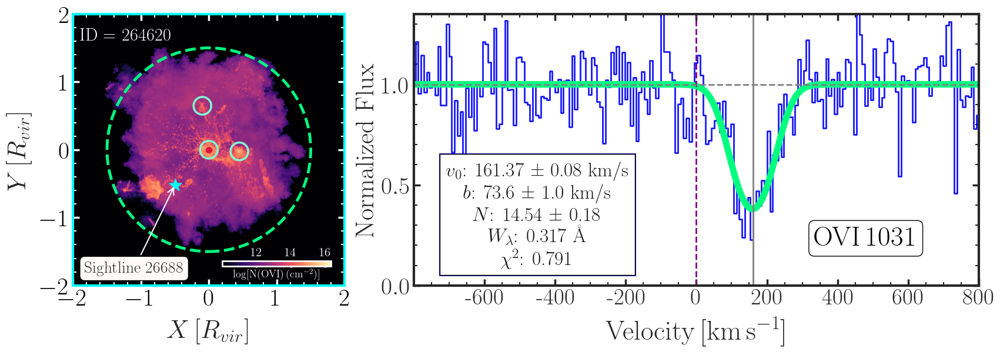

In [29]:
import h5py
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd


import json

# Load saved variables
with open("saved_parameters.json", "r") as json_file:
    loaded_params = json.load(json_file)

# Assign variables
centroid_velocities = np.array(loaded_params["centroid_velocities"])
fwhms_velocity = np.array(loaded_params["fwhms_velocity"])
fitting_results = {key: np.array(value) for key, value in loaded_params["fitting_results"].items()}
group_center = np.array(loaded_params["group_center"])
r_vir = float(loaded_params["r_vir"])
target_index = int(loaded_params["target_index"])
velocity_zoom = np.array(loaded_params["velocity_zoom"])
flux_zoom = np.array(loaded_params["flux_zoom"])
zoom_mask = np.array(loaded_params["zoom_mask"])
model_flux = np.array(loaded_params["model_flux"])
file_paths = loaded_params["file_paths"]
velocity = np.array(loaded_params["velocity"])

# Set font styles
plt.rc('font', family='Times New Roman')
plt.rcParams.update({
    'text.usetex': True,
    'axes.labelsize': 32,
    'xtick.labelsize': 30,
    'ytick.labelsize': 30,
    'legend.fontsize': 30,
    'xtick.direction': 'in',
    'ytick.direction': 'in',
    'axes.linewidth': 2  # Set the width of the box
})

c_km_s = 299792.458  # Speed of light in km/s

# Fitting results
fitting_results = {
    'region': np.array([0.]),
    'l': np.array([1032.47545845]),
    'dl': np.array([0.0799331]),
    'b': np.array([73.64487674]),
    'db': np.array([0.9999996]),
    'N': np.array([14.53968515]),
    'dN': np.array([0.17620323]),
    'EW': np.array([0.31674129]),
    'chisq': np.array([0.79111285])
}

# Calculate velocity centroids
centroid_velocities = c_km_s * (fitting_results['l'] - 1031.92) / 1031.92
fwhms_velocity = [(2 * np.sqrt(np.log(2)) * fitting_results['b'][0])]

# Plotting
fig, axs = plt.subplots(1, 2, figsize=(20, 6), gridspec_kw={'width_ratios': [1, 2], 'wspace': 0.15})

# Left panel: Galaxy Overlay
def plot_galaxy_overlay(ax, hdf5_file_path, dataset_name, tng_data_path, galaxy_catalog_path, target_index, group_center, r_vir):
    with h5py.File(hdf5_file_path, 'r') as hdf:
        data = hdf[dataset_name][()]
        data = np.nan_to_num(data, nan=10)

        # Grid extent in R_vir units
        x = np.linspace(-2, 2, 3000)
        y = np.linspace(-2, 2, 3000)

        with h5py.File(tng_data_path, 'r') as tng_file:
            ray_pos = tng_file['ray_pos'][target_index]
            sightline_2d = (ray_pos[:2] - group_center[:2]) / r_vir

        galaxy_catalog = pd.read_csv(galaxy_catalog_path, delimiter='|', skipinitialspace=True)
        galaxy_catalog.columns = galaxy_catalog.columns.str.strip()
        galaxy_positions = (galaxy_catalog[['SubhaloPos_0', 'SubhaloPos_1']].to_numpy() - group_center[:2]) / r_vir

        
        im = ax.imshow(data, origin='lower', extent=[x.min(), x.max(), y.min(), y.max()],
                       cmap='magma', aspect='equal', vmin=10)
        ax.scatter(0, 0, color='crimson', s=50, zorder=3)  # Group center
        ax.scatter(sightline_2d[0], sightline_2d[1], color='cyan', marker='*', s=250, zorder=3)

        box_props = dict(boxstyle='round,pad=0.3', edgecolor='black', facecolor='snow', alpha=1)
        arrowprops = dict(arrowstyle='->', color='white', lw=1.5)
        ax.annotate(f"Sightline {target_index - 90000*7}",
                    xy=(sightline_2d[0], sightline_2d[1]),
                    xytext=(-1.1, -1.75),
                    fontsize=20, ha='center', va='center', bbox=box_props,
                    arrowprops=arrowprops)

        for pos in galaxy_positions:
            
            ax.add_artist(plt.Circle(pos, 50 / r_vir, color='aquamarine', fill=False, linestyle='-', zorder=2, linewidth=2.5))
        
        ax.add_artist(plt.Circle((0, 0), 1.5, color='springgreen', fill=False, linestyle='--', linewidth=3.5, zorder=2))

        ax.set_xlabel("$X \, [R_{vir}]$", labelpad=10, fontsize=32)
        ax.set_ylabel("$Y \, [R_{vir}]$", labelpad=10, fontsize=32)
        # Change border (spine) color for axs[0]
        axs[0].spines['top'].set_linewidth(3)
        axs[0].spines['right'].set_linewidth(3)
        axs[0].spines['bottom'].set_linewidth(3)
        axs[0].spines['left'].set_linewidth(3)

        axs[0].spines['top'].set_color('white')
        axs[0].spines['right'].set_color('white')
        axs[0].spines['bottom'].set_color('white')
        axs[0].spines['left'].set_color('white')

        # # Change major and minor tick color for axs[0]
        axs[0].tick_params(axis='both', which='both', colors='white')  # Change both major and minor ticks

        # # Change major ticks properties
        axs[0].tick_params(which='major', length=8, width=2.5, direction='in', top=True, right=True)

        # Change minor ticks properties
        axs[0].tick_params(which='minor', length=4, width=1.5, direction='in', top=True, right=True)

        # Ensure minor ticks are visible
        axs[0].minorticks_on()
        # Change tick label color separately (ensures they remain visible)
        x_ticks = [-2, -1, 0, 1, 2]
        y_ticks = [-2, -1, 0, 1, 2]
        axs[0].set_xticks(x_ticks)
        axs[0].set_yticks(y_ticks)
        axs[0].xaxis.set_tick_params(labelcolor='black')  # X-axis tick labels
        axs[0].yaxis.set_tick_params(labelcolor='black')  # Y-axis tick labels
        # put a cyan border around the plot
        for spine in ax.spines.values():
            spine.set_edgecolor('cyan')
            spine.set_linewidth(3)
            

        # Add "ID = 264620" to the top-left corner in white
        ax.text(-1.9, 1.8, "ID = 264620", color='white', fontsize=22, ha='left', va='top')

        # Add colorbar inside the plot (relative to `imshow` extent)
        cbar_ax = ax.inset_axes([0.55, 0.07, 0.4, 0.02])  # [x_start, y_start, width, height] relative to imshow
        cbar = fig.colorbar(im, cax=cbar_ax, orientation='horizontal')
        #cbar.set_label(r"$\log$[OVI Column Density](cm$^{-2}$)", fontsize=12,color='snow',labelpad=3)
        cbar.set_label(r'$\log[\mathrm{N(OVI)} \, (\mathrm{cm^{-2}})]$', fontsize=13, color='snow', labelpad=3)
        # Place tick markers at the top side
        cbar.ax.tick_params(labelsize=15, length=8, width=2, direction='in', colors='white', top=True, bottom=False)
        cbar.ax.xaxis.set_ticks_position('top')  # Move ticks to the top
        cbar.ax.set_xticks([12, 14, 16])  # Set tick positions
        cbar.ax.set_xticklabels(['12', '14', '16'])  # Set tick labels
        
        #cbar.ax.tick_params(labelsize=15, length=0, width=2)
        cbar.outline.set_edgecolor('snow')  # Remove colorbar border

# Parameters for the galaxy overlay
hdf5_file_path = "../../Grad School/MgII_TNG_Project/Primary Project/Trident Codes/TNG_50_z_0.1_groups/grid_data/grp_15_halo_15_snapshot_91.hdf5"
tng_data_path = "../../Grad School/MgII_TNG_Project/Primary Project/Trident Codes/TNG_50_z_0.1_groups/revised_final/spectra_TNG50-1_z0.1_n300d2-sample_localized_COS-G130M_OVI_combined.hdf5"
galaxy_catalog_path = "../TNG50_fitting_results/galaxy_cats/group_15_galaxy_catalog_converted.txt"
dataset_name = "grid"
target_index = 656688
group_center = np.array([4834.154, 22167.719, 16398.639])  # Group center
r_vir = 384.19003

# Left panel: Galaxy overlay
plot_galaxy_overlay(axs[0], hdf5_file_path, dataset_name, tng_data_path, galaxy_catalog_path, target_index, group_center, r_vir)

# Right panel: Velocity spectrum
ax = axs[1]
ax.step(velocity_zoom, flux_zoom, label='Original Spectrum', color='blue', where='mid', linewidth=2, alpha=0.9)
ax.plot(velocity[zoom_mask], model_flux, label='Fitted Spectrum (Voigt Profile)', 
        color='springgreen', linewidth=8)
ax.axvline(0, color='purple', linestyle='--', linewidth=2)
ax.axvline(centroid_velocities[0], color='gray', linestyle='solid', linewidth=2)
ax.axhline(1, color='gray', linestyle='--', linewidth=2)

ax.text(480, 0.2, r"$\mathrm{OVI \, 1031}$", fontsize=34, color='black', ha='center',
        bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.2'))

arrowprops = dict(arrowstyle='<->', color='black', lw=2)
b_value_start = centroid_velocities[0] - fwhms_velocity[0] / 2
b_value_end = centroid_velocities[0] + fwhms_velocity[0] / 2
#ax.annotate('', xy=(b_value_start, 0.6), xytext=(b_value_end, 0.6), arrowprops=arrowprops)
# ax.text(centroid_velocities[0] + 220, 0.55, r"$b = $" + f"{fitting_results['b'][0]:.1f} km/s",
#         fontsize=24, ha='center', va='bottom', color='black')
textstr = (
    f"$v_{{0}}$: {centroid_velocities[0]:.2f} ± {fitting_results['dl'][0]:.2f} km/s\n"
    f"$b$: {fitting_results['b'][0]:.1f} ± {fitting_results['db'][0]:.1f} km/s\n"
    f"$N$: {fitting_results['N'][0]:.2f} ± {fitting_results['dN'][0]:.2f}\n"
    f"$W_{{\lambda}}$: {fitting_results['EW'][0]:.3f} Å\n"
    f"$\chi^2$: {fitting_results['chisq'][0]:.3f}"
)

from matplotlib import patheffects as PathEffects

ax.text(-450, 0.35, textstr, fontsize=24, ha='center', va='center', alpha=0.9, 
        color='black', backgroundcolor='lightgrey', bbox=dict(facecolor='white', edgecolor='black', boxstyle='square,pad=0.3', linewidth=1,
                                                              path_effects=[PathEffects.withStroke(linewidth=2, foreground='blue'),
                                                                            PathEffects.Normal()],
                                                                            zorder=2,
                                                                            ))
# ax.text(-450, 0.35, textstr, fontsize=20, ha='center', va='center', alpha=0.9, color='black', backgroundcolor='lightgrey')


ax.spines['top'].set_linewidth(3)
ax.spines['right'].set_linewidth(3)
ax.spines['bottom'].set_linewidth(3)
ax.spines['left'].set_linewidth(3)

# Add minor ticks and customize ticks
for ax in axs:
    ax.tick_params(which='both', direction='in', width=2)
    ax.tick_params(which='major', length=8, width=2.5, direction='in', top=True, right=True)
    ax.tick_params(which='minor', length=4, width=1.5, direction='in', top=True, right=True)

    ax.tick_params(which='minor', length=4)
    ax.tick_params(which='major', length=8)
    ax.minorticks_on()

# Set labels, limits, and layout
axs[1].set_xlabel(r"$\mathrm{Velocity \, [km\,s^{-1}]}$", labelpad=10, fontsize=34)
axs[1].set_ylabel("Normalized Flux")
axs[1].set_xlim(-800, 800)
# set x labels at , -600, -400, -200, 0, 200, 400, 600, 800
axs[1].set_xticks(np.arange(-600, 801, 200))
# reduce the font size of the xtickslabels slightly
axs[1].set_xticklabels(axs[1].get_xticks(), fontsize=28)

axs[1].set_ylim(0.0, 1.35)

axs[1].spines['top'].set_linewidth(3)
axs[1].spines['right'].set_linewidth(3)
axs[1].spines['bottom'].set_linewidth(3)
axs[1].spines['left'].set_linewidth(3)

output_dir = "../TNG50_fitting_results/Plots_gal_removed"
# Save the plot with additional adjustments to avoid clipping
#exisits_ok=True
os.makedirs(output_dir, exist_ok=True)
plt.savefig(f"{output_dir}/eg_spectra.pdf", dpi=400, bbox_inches='tight', pad_inches=0.3)
plt.show()

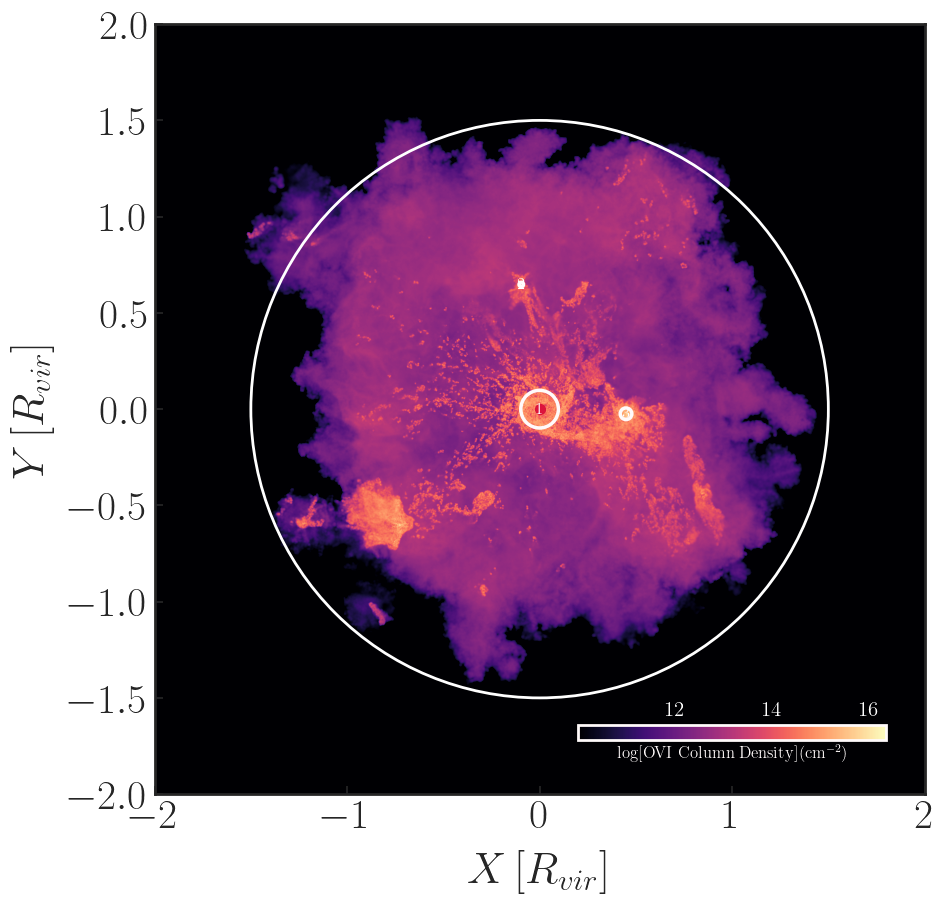

In [186]:
import os
import h5py
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import json
from matplotlib.patches import Circle

# Load saved parameters
with open("saved_parameters.json", "r") as json_file:
    loaded_params = json.load(json_file)

# Assign variables
group_center = np.array(loaded_params["group_center"])
r_vir = float(loaded_params["r_vir"])
target_index = int(loaded_params["target_index"])

# Simulation box size
box_size = 35000  # ckpc/h

# Apply cyclic boundary conditions
def apply_cyclic_condition(coord, center, box_size):
    diff = np.abs(center - coord)
    if diff > box_size / 2:
        if center > coord:
            coord += box_size
        else:
            coord -= box_size
    return coord

# Set font styles
plt.rc('font', family='Times New Roman')
plt.rcParams.update({
    'text.usetex': True,
    'axes.labelsize': 32,
    'xtick.labelsize': 30,
    'ytick.labelsize': 30,
    'legend.fontsize': 30,
    'xtick.direction': 'in',
    'ytick.direction': 'in',
    'axes.linewidth': 2
})

# Left panel: Galaxy Overlay
def plot_galaxy_overlay(ax, hdf5_file_path, dataset_name, galaxy_catalog_path, group_center, r_vir):
    with h5py.File(hdf5_file_path, 'r') as hdf:
        data = hdf[dataset_name][()]
        data = np.nan_to_num(data, nan=10)

        # Grid extent in R_vir units
        x = np.linspace(-2, 2, 3000)
        y = np.linspace(-2, 2, 3000)

        # Load galaxy catalog
        galaxy_catalog = pd.read_csv(galaxy_catalog_path, delimiter='|', skipinitialspace=True)
        galaxy_catalog.columns = galaxy_catalog.columns.str.strip()

        # Extract galaxy positions and 3× half-mass radii
        galaxy_positions = galaxy_catalog[['SubhaloPos_0', 'SubhaloPos_1']].to_numpy()
        galaxy_radii = 3 * galaxy_catalog['SubhaloHalfmassRadType_4'].to_numpy()

        # Apply cyclic correction
        galaxy_positions_corrected = np.array([
            [apply_cyclic_condition(x, group_center[0], box_size), apply_cyclic_condition(y, group_center[1], box_size)]
            for x, y in galaxy_positions
        ])

        # Convert to normalized Rvir scale
        galaxy_positions_corrected = (galaxy_positions_corrected - group_center[:2]) / r_vir
        galaxy_radii_corrected = galaxy_radii / r_vir

        # Plot the background grid
        im = ax.imshow(data, origin='lower', extent=[x.min(), x.max(), y.min(), y.max()],
                       cmap='magma', aspect='equal', vmin=10)

        # Mark the group center
        ax.scatter(0, 0, color='crimson', s=50, zorder=3, label="Group Center")

        # Draw galaxy circles
        for pos, r in zip(galaxy_positions_corrected, galaxy_radii_corrected):
            ax.add_patch(Circle(pos, r, color="snow", fill=False, linewidth=2.5))

        # Annotate galaxies with numbers
        for idx, (pos_x, pos_y) in enumerate(galaxy_positions_corrected):
            ax.text(pos_x, pos_y, str(idx + 1), color="white", fontsize=12, ha="center", va="center", weight="bold")

        # Draw 1.5 Rvir circle
        ax.add_patch(Circle((0, 0), 1.5, color='white', fill=False, linestyle='solid', linewidth=2, zorder=2))

        # Labels
        ax.set_xlabel("$X \, [R_{vir}]$", labelpad=10, fontsize=32)
        ax.set_ylabel("$Y \, [R_{vir}]$", labelpad=10, fontsize=32)

        # Add colorbar inside the plot
        cbar_ax = ax.inset_axes([0.55, 0.07, 0.4, 0.02])
        cbar = fig.colorbar(im, cax=cbar_ax, orientation='horizontal')
        cbar.set_label(r"$\log$[OVI Column Density](cm$^{-2}$)", fontsize=12, color='snow', labelpad=3)
        cbar.ax.tick_params(labelsize=15, length=8, width=2, direction='in', colors='white', top=True, bottom=False)
        cbar.ax.xaxis.set_ticks_position('top')
        cbar.ax.set_xticks([12, 14, 16])
        cbar.ax.set_xticklabels(['12', '14', '16'])
        cbar.outline.set_edgecolor('snow')

# Set up figure
fig, axs = plt.subplots(1, 1, figsize=(10, 10))

# Parameters for the galaxy overlay
hdf5_file_path = "../../Grad School/MgII_TNG_Project/Primary Project/Trident Codes/TNG_50_z_0.1_groups/grid_data/grp_15_halo_15_snapshot_91.hdf5"
galaxy_catalog_path = "../TNG50_fitting_results/galaxy_cats/group_15_galaxy_catalog_converted.txt"

# Left panel: Galaxy overlay
plot_galaxy_overlay(axs, hdf5_file_path, "grid", galaxy_catalog_path, group_center, r_vir)

# Save and show plot
output_dir = "../TNG50_fitting_results/Plots_gal_removed"
os.makedirs(output_dir, exist_ok=True)
#plt.savefig(f"{output_dir}/galaxy_overlay_cyclic_corrected.pdf", dpi=400, bbox_inches='tight', pad_inches=0.3)
plt.show()

## Chisq calclualtion 

In [306]:
import numpy as np
import pandas as pd
import glob

# Base path pattern for the files
#base_path = "../SIMBA100_fitting_results/fitting_combined_features_grp_only/group_{}_combined_features.txt"
base_path = "../TNG50_fitting_results/fitting_combined_features_grp_only_800/group_{}_combined_features.txt"

# Initialize counters
total_detections_all = 0
valid_detections_all = 0

# Store results for each group
results = []

for i in range(14):  # Looping over groups 0 to 13
    file_path = base_path.format(i)

    try:
        # Load data
        df = pd.read_csv(file_path, delimiter='|', comment='#', skipinitialspace=True)
        
        # Trim column names to remove extra spaces
        df.columns = [col.strip() for col in df.columns]

        # Count detections (where dN is not NaN)
        total_detections = df['dN'].notna().sum()

        # Count detections with Chisq <= 1.0
        valid_detections = df.loc[df['dN'].notna() & (df['Chisq'] <= 1.0)].shape[0]

        # Compute fraction
        fraction = valid_detections / total_detections if total_detections > 0 else 0

        # Store results
        results.append([i, total_detections, valid_detections, fraction])

        # Update overall counts
        total_detections_all += total_detections
        valid_detections_all += valid_detections

    except Exception as e:
        print(f"Error processing {file_path}: {e}")

# Compute overall fraction
overall_fraction = valid_detections_all / total_detections_all if total_detections_all > 0 else 0

# Append overall results
results.append(["Combined", total_detections_all, valid_detections_all, overall_fraction])

# Convert results to a DataFrame
df_results = pd.DataFrame(results, columns=['Group', 'Total Detections', 'Valid Detections (Chisq ≤ 1.0)', 'Fraction'])



In [307]:
df_results

,Group,Total Detections,Valid Detections (Chisq ≤ 1.0),Fraction
0,0,6294,5347,0.849539
1,1,8478,7326,0.864119
2,2,17197,15408,0.895970
3,3,12463,10955,0.879002
4,4,7845,6823,0.869726
5,5,12800,11006,0.859844
6,6,31376,28395,0.904991
7,7,12565,11154,0.887704
8,8,24375,21731,0.891528
9,9,11518,10098,0.876715


In [304]:
df_results_new

,Group,Total Detections,Valid Detections (Chisq ≤ 1.0),Fraction
0,0,3300,2379,0.720909
1,1,3879,2901,0.747873
2,2,3002,2094,0.697535
3,3,2591,1742,0.672327
4,4,3647,2693,0.738415
5,5,8782,7399,0.842519
6,6,5894,4630,0.785545
7,7,4873,3821,0.784117
8,8,6598,5370,0.813883
9,9,4292,3211,0.748136


In [310]:
import numpy as np
import pandas as pd
import glob

# Base path pattern for the files
#base_path = "../SIMBA100_fitting_results/fitting_combined_features_grp_only/group_{}_combined_features.txt"
base_path = "../TNG50_fitting_results/fitting_combined_features_grp_only_800/group_{}_combined_features.txt"
# Initialize counters
total_sightlines_all = 0
total_detections_all = 0
valid_detections_all = 0

# Store results for each group
results = []

for i in range(14):  # Looping over groups 0 to 13
    file_path = base_path.format(i)

    try:
        # Load data
        df = pd.read_csv(file_path, delimiter='|', comment='#', skipinitialspace=True)
        
        # Trim column names to remove extra spaces
        df.columns = [col.strip() for col in df.columns]

        # Total number of sightlines
        total_sightlines = len(df)

        # Count detections (where dN is not NaN)
        total_detections = df['dN'].notna().sum()

        # Count detections with Chisq ≤ 1.0
        valid_detections = df.loc[df['dN'].notna() & (df['Chisq'] <= 1.0)].shape[0]

        # Compute fraction of valid detections
        fraction = valid_detections / total_detections if total_detections > 0 else 0

        # Compute covering fraction (detections/total sightlines)
        covering_fraction = total_detections / total_sightlines if total_sightlines > 0 else 0

        # Store results
        results.append([i, total_sightlines, total_detections, valid_detections, fraction, covering_fraction])

        # Update overall counts
        total_sightlines_all += total_sightlines
        total_detections_all += total_detections
        valid_detections_all += valid_detections

    except Exception as e:
        print(f"Error processing {file_path}: {e}")

# Compute overall fraction and covering fraction
overall_fraction = valid_detections_all / total_detections_all if total_detections_all > 0 else 0
overall_covering_fraction = total_detections_all / total_sightlines_all if total_sightlines_all > 0 else 0

# Append overall results
results.append(["Combined", total_sightlines_all, total_detections_all, valid_detections_all, overall_fraction, overall_covering_fraction])

# Convert results to a DataFrame
df_results = pd.DataFrame(results, columns=['Group', 'Total Sightlines', 'Total Detections', 'Valid Detections (Chisq ≤ 1.0)', 'Fraction', 'Covering Fraction'])



In [311]:
df_results

,Group,Total Sightlines,Total Detections,Valid Detections (Chisq ≤ 1.0),Fraction,Covering Fraction
0,0,85509,6294,5347,0.849539,0.073606
1,1,84628,8478,7326,0.864119,0.100180
2,2,88573,17197,15408,0.895970,0.194156
3,3,84277,12463,10955,0.879002,0.147881
4,4,86050,7845,6823,0.869726,0.091168
5,5,83935,12800,11006,0.859844,0.152499
6,6,85762,31376,28395,0.904991,0.365850
7,7,83789,12565,11154,0.887704,0.149960
8,8,83907,24375,21731,0.891528,0.290500
9,9,85667,11518,10098,0.876715,0.134451


In [208]:
import numpy as np

# Data from your table:
# Total sightlines for each group (e.g., Group 0 to Group 13)
total_sightlines = np.array([
    85684, 84798, 88725, 84423, 86234, 84097, 85898,
    83972, 84055, 85839, 86718, 86117, 86346, 86016
])

# Total detections for each group
total_detections = np.array([
    6469, 8648, 17349, 12609, 8029, 12962, 31512,
    12748, 24523, 11690, 20890, 16585, 23676, 31374
])

# Number of groups
n_groups = len(total_sightlines)

# Number of bootstrap iterations
n_bootstrap = 100000

# Array to store the bootstrap overall covering fractions
bootstrap_cf = np.zeros(n_bootstrap)

for i in range(n_bootstrap):
    # Resample indices with replacement
    indices = np.random.choice(n_groups, size=n_groups, replace=True)
    
    # Sum the total sightlines and detections for the resampled groups
    total_boot = total_sightlines[indices].sum()
    detections_boot = total_detections[indices].sum()
    
    # Compute the overall covering fraction for this bootstrap sample
    bootstrap_cf[i] = detections_boot / total_boot

# Calculate the bootstrap mean and standard deviation (sigma)
bootstrap_mean = np.mean(bootstrap_cf)
bootstrap_sigma = np.std(bootstrap_cf)

print(f"Bootstrap Mean Covering Fraction: {bootstrap_mean:.5f}")
print(f"Bootstrap Sigma (uncertainty): {bootstrap_sigma:.5f}")

Bootstrap Mean Covering Fraction: 0.19933
Bootstrap Sigma (uncertainty): 0.02455


In [26]:
df_results_new

,Group,Total Sightlines,Total Detections,Valid Detections (Chisq ≤ 1.0),Fraction,Covering Fraction
0,0,83709,3300,2379,0.720909,0.039422
1,1,81653,3879,2901,0.747873,0.047506
2,2,82944,3002,2094,0.697535,0.036193
3,3,81215,2591,1742,0.672327,0.031903
4,4,84897,3647,2693,0.738415,0.042958
5,5,85701,8782,7399,0.842519,0.102473
6,6,84279,5894,4630,0.785545,0.069934
7,7,83813,4873,3821,0.784117,0.058141
8,8,83418,6598,5370,0.813883,0.079096
9,9,82459,4292,3211,0.748136,0.052050


In [209]:
import numpy as np

# Data for the observational groups (rows 0 to 13)
total_sightlines = np.array([
    83709, 81653, 82944, 81215, 84897, 85701, 84279,
    83813, 83418, 82459, 84152, 81801, 84184, 82701
])

total_detections = np.array([
    3300, 3879, 3002, 2591, 3647, 8782, 5894,
    4873, 6598, 4292, 2995, 7311, 8875, 9585
])

n_groups = len(total_sightlines)
n_bootstrap = 10000  # Number of bootstrap iterations

# Array to store the bootstrap overall covering fractions
bootstrap_cf = np.zeros(n_bootstrap)

for i in range(n_bootstrap):
    # Resample indices with replacement from 0 to n_groups-1
    indices = np.random.choice(n_groups, size=n_groups, replace=True)
    
    # Sum the total sightlines and detections for the resampled groups
    total_boot = total_sightlines[indices].sum()
    detections_boot = total_detections[indices].sum()
    
    # Compute the overall covering fraction for this bootstrap sample
    bootstrap_cf[i] = detections_boot / total_boot

# Calculate the bootstrap mean and sigma (standard deviation)
bootstrap_mean = np.mean(bootstrap_cf)
bootstrap_sigma = np.std(bootstrap_cf)

print(f"Bootstrap Mean Overall Covering Fraction: {bootstrap_mean:.5f}")
print(f"Bootstrap Sigma (Uncertainty): {bootstrap_sigma:.5f}")

Bootstrap Mean Overall Covering Fraction: 0.06483
Bootstrap Sigma (Uncertainty): 0.00754


In [141]:
import numpy as np

# TNG values
N_tot_TNG = 1198922
N_det_TNG = 239064
f_TNG = N_det_TNG / N_tot_TNG
error_TNG = np.sqrt(f_TNG * (1 - f_TNG) / N_tot_TNG)

# SIMBA values
N_tot_SIMBA = 1166926
N_det_SIMBA = 75624
f_SIMBA = N_det_SIMBA / N_tot_SIMBA
error_SIMBA = np.sqrt(f_SIMBA * (1 - f_SIMBA) / N_tot_SIMBA)

print("TNG covering fraction: {:.4f}% ± {:.4f}%".format(f_TNG*100, error_TNG*100))
print("SIMBA covering fraction: {:.4f}% ± {:.4f}%".format(f_SIMBA*100, error_SIMBA*100))

TNG covering fraction: 19.9399% ± 0.0365%
SIMBA covering fraction: 6.4806% ± 0.0228%


In [143]:
import numpy as np

# TNG values
N_tot_TNG = 1198922
N_det_TNG = 239064

# Create the binary array (1 = detection, 0 = non-detection)
# Instead of creating a huge array, we can simulate directly using probabilities
f_TNG = N_det_TNG / N_tot_TNG

# Number of bootstrap samples
n_bootstrap = 100000

# Bootstrap covering fractions for TNG using direct sampling from a Bernoulli distribution
bootstrap_fractions_TNG = np.random.binomial(N_tot_TNG, f_TNG, size=n_bootstrap) / N_tot_TNG
error_bootstrap_TNG = bootstrap_fractions_TNG.std()

print("TNG covering fraction (bootstrap): {:.4f}% ± {:.4f}%".format(f_TNG*100, error_bootstrap_TNG*100))


# SIMBA values
N_tot_SIMBA = 1166926
N_det_SIMBA = 75624
f_SIMBA = N_det_SIMBA / N_tot_SIMBA

bootstrap_fractions_SIMBA = np.random.binomial(N_tot_SIMBA, f_SIMBA, size=n_bootstrap) / N_tot_SIMBA
error_bootstrap_SIMBA = bootstrap_fractions_SIMBA.std()

print("SIMBA covering fraction (bootstrap): {:.4f}% ± {:.4f}%".format(f_SIMBA*100, error_bootstrap_SIMBA*100))

TNG covering fraction (bootstrap): 19.9399% ± 0.0364%
SIMBA covering fraction (bootstrap): 6.4806% ± 0.0229%


### Save Temp Maps


In [2]:
import os
import requests
import pandas as pd

# API key
API_KEY = "7f3b66fdf83ae7c85b47794073f746ff"

# File containing group indices
group_index_file = "../TNG50_fitting_results/TNG_halos.txt"

# Directory to save the downloaded files
save_dir = "../TNG50_fitting_results/o_maps"

# Base URL for TNG API visualization download
BASE_URL = "https://www.tng-project.org/api/TNG50-1/snapshots/91/halos/{}/vis.hdf5"

# Query parameters
params = {
    "partField": "metals_O",
    "size": 4,
    "sizeType": "rVirial",
    "depthFac": 1,
    "nPixels": "3000,3000",
    "rasterPx": 1100,
    "axesUnits": "code",
    "relCoords": "True",
    "plotStyle": "open_black",
    "labelZ": "True",
    "labelScale": "True",
    "labelSim": "True",
    "labelHalo": "True",
    "title": "True",
    "colorbars": "True"
}

# Ensure the save directory exists
os.makedirs(save_dir, exist_ok=True)

group_df = pd.read_csv(group_index_file, sep="|", comment="#", skipinitialspace=True)
group_df.columns = group_df.columns.str.strip()
group_indices = group_df["Grp_Index"].tolist()

group_indices = [8, 9, 10, 11, 12, 13,15,17,18,19,20,22,24]
# Download each file

for group_id in group_indices:
    url = BASE_URL.format(group_id)
    response = requests.get(url, params=params, headers={"api-key": API_KEY}, stream=True)

    if response.status_code == 200:
        file_path = os.path.join(save_dir, f"group_{group_id}_temp_map.hdf5")
        with open(file_path, "wb") as file:
            for chunk in response.iter_content(chunk_size=8192):
                file.write(chunk)
        print(f"Downloaded: {file_path}")
    else:
        print(f"Failed to download for Group {group_id}, Status Code: {response.status_code}")

print("Download process completed.")

Downloaded: ../TNG50_fitting_results/o_maps/group_8_temp_map.hdf5
Downloaded: ../TNG50_fitting_results/o_maps/group_9_temp_map.hdf5
Downloaded: ../TNG50_fitting_results/o_maps/group_10_temp_map.hdf5


ConnectionError: ('Connection aborted.', RemoteDisconnected('Remote end closed connection without response'))

In [121]:
import h5py

def inspect_hdf5(file_path):
    """
    Reads the structure and dataset names of an HDF5 file.
    
    Parameters:
    - file_path (str): Path to the HDF5 file.
    """
    try:
        with h5py.File(file_path, "r") as f:
            print(f"Inspecting HDF5 file: {file_path}")
            def print_structure(name, obj):
                if isinstance(obj, h5py.Dataset):
                    print(f"Dataset: {name}, Shape: {obj.shape}, Dtype: {obj.dtype}")
                elif isinstance(obj, h5py.Group):
                    print(f"Group: {name}")

            f.visititems(print_structure)

    except Exception as e:
        print(f"Error reading file {file_path}: {e}")

# Example usage
file_path = "../TNG50_fitting_results/temp_maps/grid_halo_TNG50-1_91_7.hdf5"  # Replace with actual file path
inspect_hdf5(file_path)

Inspecting HDF5 file: ../TNG50_fitting_results/temp_maps/grid_halo_TNG50-1_91_7.hdf5
Group: Header
Dataset: grid, Shape: (3000, 3000), Dtype: float32


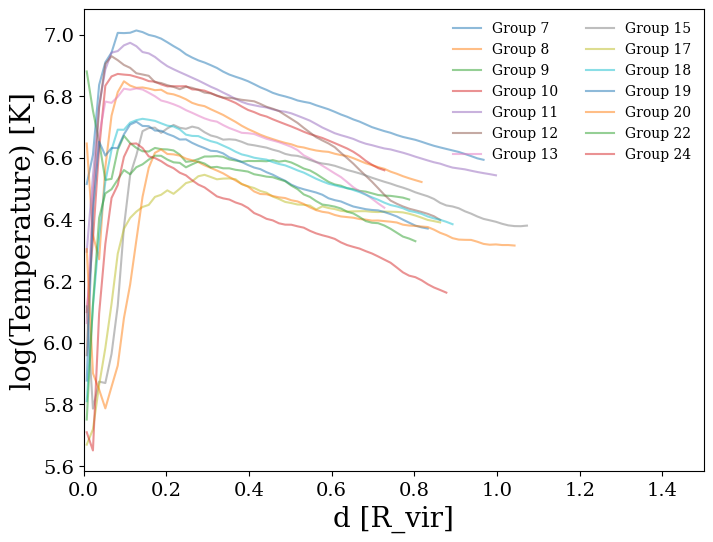

/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_6543/3053336328.py:85: RuntimeWarning: Mean of empty slice
  mean_profile = np.nanmean(all_profiles, axis=0)
/Users/wavefunction/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines/igrm/lib/python3.11/site-packages/numpy/lib/nanfunctions.py:1872: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


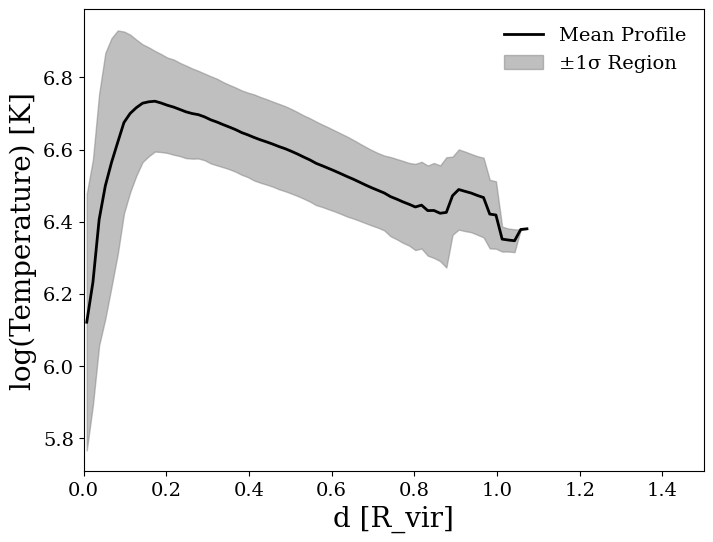

In [9]:
import os
import h5py
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Define the directory where temperature maps are stored
temp_map_dir = "../TNG50_fitting_results/temp_maps"

# File containing group information
group_info_file = "../TNG50_fitting_results/TNG_halos.txt"

# Read the group information
df = pd.read_csv(group_info_file, sep="|", comment="#", skipinitialspace=True)
df.columns = df.columns.str.strip()  # Remove any unwanted spaces in column names

# Extract required group parameters
group_ids = df["Grp_Index"].tolist()

# Define radial bins in units of R_vir (from 0 to 1.5 R_vir)
num_bins = 100
radii_bins = np.linspace(0, 1.5, num_bins + 1)

# We'll store the computed radial profiles from each group
all_profiles = []

# Initialize the first plot (individual group profiles)
plt.figure(figsize=(8, 6))

# Process each group's temperature map
for group_id in group_ids:
    file_path = os.path.join(temp_map_dir, f"grid_halo_TNG50-1_91_{group_id}.hdf5")

    if not os.path.exists(file_path):
        print(f"File not found: {file_path}")
        continue

    with h5py.File(file_path, "r") as f:
        if "grid" in f:  # Check if dataset exists
            temp_map = f["grid"][:]  # Use the dataset named "grid"
        else:
            print(f"Dataset 'grid' not found in {file_path}")
            continue

    # The grid covers 4 R_vir (i.e. from -2 to +2 R_vir)
    npix = temp_map.shape[0]        # e.g. 3000 pixels
    center = npix // 2              # Center pixel index
    pixel_size = 4 / npix           # Each pixel corresponds to this many R_vir

    # Create a 2D coordinate grid (in units of R_vir)
    y, x = np.indices(temp_map.shape)
    r_grid = np.sqrt((x - center)**2 + (y - center)**2) * pixel_size

    # Compute the azimuthally averaged temperature in annuli between 0 and 1.5 R_vir
    mean_temps = []
    for i in range(len(radii_bins) - 1):
        mask = (r_grid >= radii_bins[i]) & (r_grid < radii_bins[i + 1])
        if np.sum(mask) > 0:
            mean_temps.append(np.mean(temp_map[mask]))
        else:
            mean_temps.append(np.nan)

    # Save the computed profile for later analysis
    all_profiles.append(mean_temps)

    # Compute bin midpoints (in R_vir units) for plotting
    bin_midpoints = 0.5 * (radii_bins[:-1] + radii_bins[1:])

    # Plot the profile for this group
    plt.plot(bin_midpoints, mean_temps, alpha=0.5, label=f"Group {group_id}")

# Customize the first plot (individual profiles)
plt.xlabel("d [R_vir]", fontsize=20)
plt.ylabel("log(Temperature) [K]", fontsize=20)
#plt.title("Radial Temperature Profiles (0 to 1.5 R_vir)")
plt.legend(frameon=False, loc="upper right", fontsize=10, ncol=2)
plt.xlim(0, 1.5)   # Force x-axis from 0 to 1.5 R_vir
# plt.grid()
plt.show()

# Convert collected profiles to a NumPy array for further analysis
all_profiles = np.array(all_profiles, dtype=np.float64)

# For each radial bin, compute the mean and standard deviation (ignoring NaNs)
mean_profile = np.nanmean(all_profiles, axis=0)
std_profile = np.nanstd(all_profiles, axis=0)

# Compute bin midpoints (in R_vir units) for the radial bins we used (0 to 1.5)
bin_midpoints = 0.5 * (radii_bins[:-1] + radii_bins[1:])

# Second plot: Mean profile with ±1σ shaded region
plt.figure(figsize=(8, 6))
plt.plot(bin_midpoints, mean_profile, color='black', linewidth=2, label="Mean Profile")
plt.fill_between(bin_midpoints, mean_profile - std_profile, mean_profile + std_profile, 
                 color='gray', alpha=0.5, label="±1σ Region")
plt.xlabel("d [R_vir]", fontsize=20)
plt.ylabel("log(Temperature) [K]", fontsize=20)
#plt.title("Mean Radial Temperature Profile (0 to 1.5 R_vir)")
plt.xlim(0, 1.5)   # Set x-axis limit explicitly
plt.legend(frameon=False)
# plt.grid()

# Disable LaTeX text rendering to avoid Unicode issues
plt.rcParams.update({"text.usetex": False})
plt.show()

/var/folders/ng/2lqpk97j4xz4qpsvv8tt4tv80000gn/T/ipykernel_51661/1588393594.py:64: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.96])


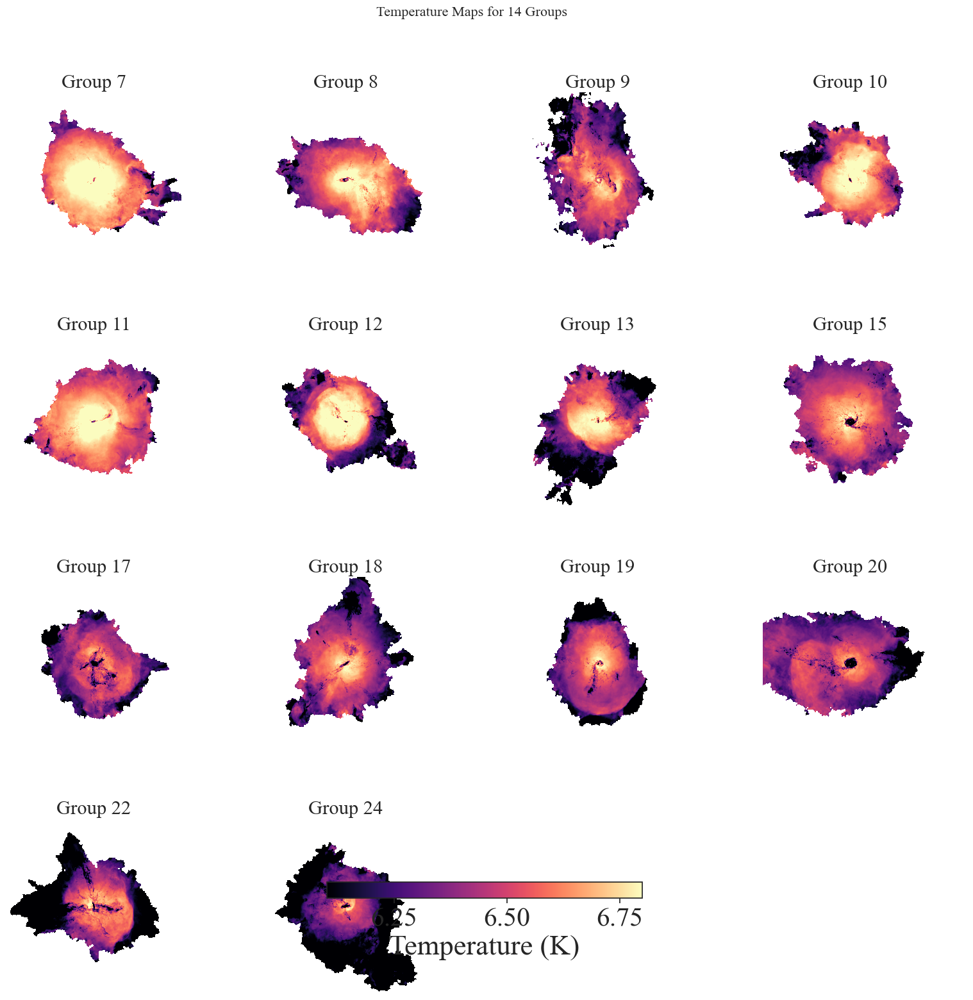

In [136]:
import os
import h5py
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Define directories and file paths
temp_map_dir = "../TNG50_fitting_results/temp_maps"
group_info_file = "../TNG50_fitting_results/TNG_halos.txt"

# Read the group information file
df = pd.read_csv(group_info_file, sep="|", comment="#", skipinitialspace=True)
df.columns = df.columns.str.strip()  # Clean column names
group_ids = df["Grp_Index"].tolist()

# Read each temperature map and store in a list
maps = []          # List to store temperature maps (2D arrays)
valid_group_ids = []  # To record group IDs for which maps were successfully read

for group_id in group_ids:
    file_path = os.path.join(temp_map_dir, f"grid_halo_TNG50-1_91_{group_id}.hdf5")
    if not os.path.exists(file_path):
        print(f"File not found: {file_path}")
        continue
    with h5py.File(file_path, "r") as f:
        if "grid" in f:
            temp_map = f["grid"][:]  # Read the dataset named "grid"
            maps.append(temp_map)
            valid_group_ids.append(group_id)
        else:
            print(f"Dataset 'grid' not found in {file_path}")

# Compute global minimum and maximum across all maps for a common color scale
global_min = np.min([np.min(m) for m in maps])
global_max = np.max([np.max(m) for m in maps])
global_min = 6.1
global_max = 6.8

# Setup subplots: We expect 14 maps, so let's arrange them in a grid.
# For example, using 4 columns and as many rows as needed.
n_maps = len(maps)
ncols = 4
nrows = int(np.ceil(n_maps / ncols))

fig, axes = plt.subplots(nrows, ncols, figsize=(16, 4 * nrows))
axes = axes.flatten()  # Flatten for easy iteration

# Plot each map with imshow using the common color scale
for i, (temp_map, group_id) in enumerate(zip(maps, valid_group_ids)):
    im = axes[i].imshow(temp_map, origin="lower", cmap="magma",
                        vmin=global_min, vmax=global_max)
    axes[i].set_title(f"Group {group_id}")
    axes[i].axis("off")  # Hide axis ticks

# Turn off any extra subplots (if total subplots > number of maps)
for j in range(i+1, len(axes)):
    axes[j].axis("off")

# Add a common colorbar on the right side of the subplots
cbar = fig.colorbar(im, ax=axes, orientation="horizontal", fraction=0.02, pad=0.9)
cbar.set_label("Temperature (K)")

plt.suptitle("Temperature Maps for 14 Groups", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

7 188893 13.54
8 199226 13.42
9 208563 13.17
10 219842 13.44
11 231369 13.42
12 239843 13.38
13 247945 13.31
15 264620 13.21
17 277688 13.19
18 283512 13.21
19 288932 13.18
20 294515 12.97
22 305020 13.16
24 313950 12.97


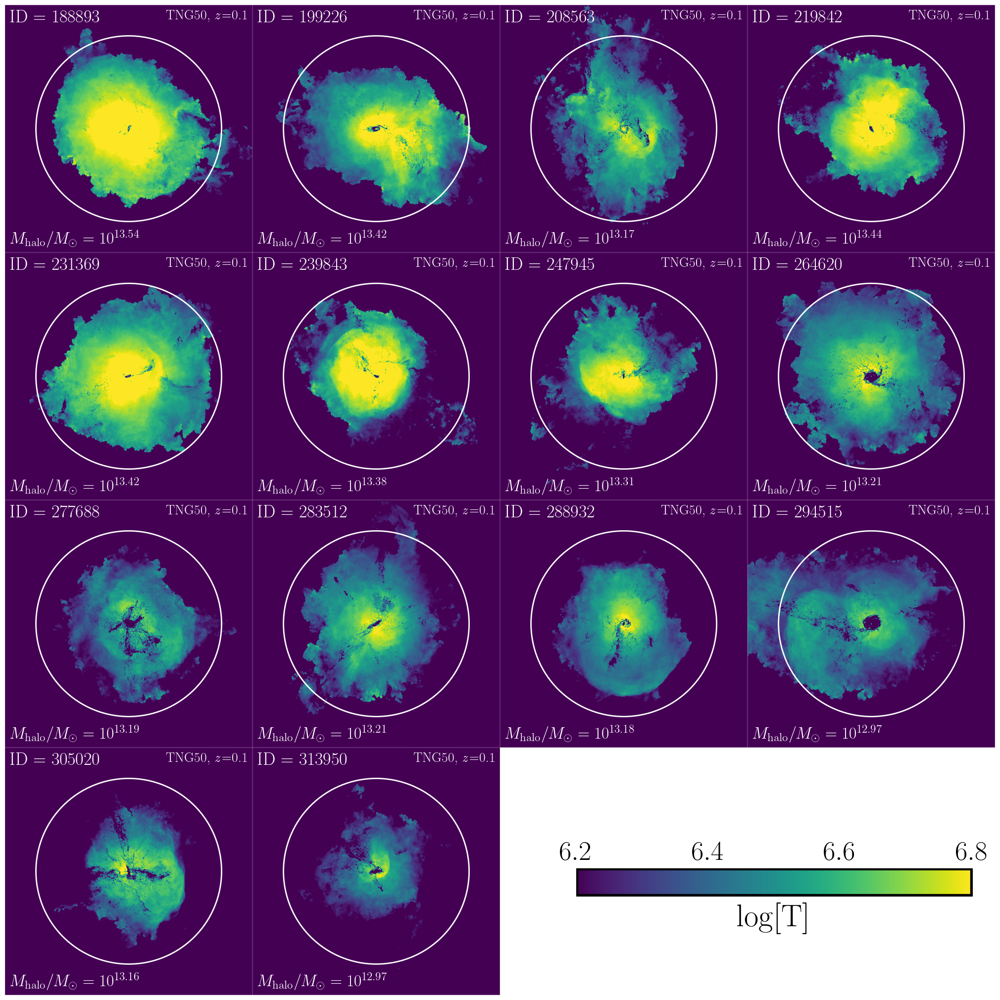

In [6]:
import h5py
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Circle, Rectangle
from matplotlib import rcParams
import pandas as pd
import os

# Configure matplotlib for LaTeX rendering
rcParams["text.usetex"] = True
rcParams["font.family"] = "serif"
rcParams["font.size"] = 14

# File containing the group information
group_file_path = "../TNG50_fitting_results/TNG_halos.txt"

# Directory containing HDF5 files
input_dir = "../TNG50_fitting_results/temp_maps"

# Read group information from the file
group_data = pd.read_csv(group_file_path, sep="|", skipinitialspace=True)
group_data.columns = group_data.columns.str.strip()  # Strip column names

# Extract necessary columns
groups = group_data[["Grp_Index", "GroupFirstSub", "M_Crit200_log"]].rename(
    columns={"Grp_Index": "halo_id", "GroupFirstSub": "group_first_sub", "M_Crit200_log": "mass"}
)
groups["mass"] = groups["mass"].astype(float)
groups["halo_id"] = groups["halo_id"].astype(int)
groups["group_first_sub"] = groups["group_first_sub"].astype(int)

# Visualization parameters
colormap = "viridis"
vmin = 6.2  # Minimum value for the color scale
vmax = 6.8  # Maximum value for the color scale

# Create a figure for the combined plot
ncols = 4  # Number of columns
nrows = 4  # Number of rows
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(20, 20))

# Adjust spacing between subplots to eliminate all gaps
plt.subplots_adjust(wspace=0, hspace=0, left=0, right=1, top=1, bottom=0)
axes = axes.flatten()

# Loop over each group and create a subplot
for i, row in groups.iterrows():
    halo_id = row["halo_id"]
    group_first_sub = row["group_first_sub"]  # GroupFirstSub value
    halo_mass = round(row["mass"], 2)  # Logarithmic mass value with two decimals

    halo_id = int(halo_id)  
    group_first_sub = int(group_first_sub)
    # use only two decimal places for mass
    halo_mass = round(halo_mass, 2)
    print(halo_id, group_first_sub, halo_mass)
    
    # Load the HDF5 file
    file_path = f"{input_dir}/grp_{halo_id}_halo_{halo_id}_snapshot_91.hdf5"
    file_path = f"{input_dir}/grid_halo_TNG50-1_91_{halo_id}.hdf5"
    with h5py.File(file_path, "r") as hdf:
        if "grid" in hdf:
            data = hdf["grid"][()]
        else:
            print(f"Dataset 'grid' not found in {file_path}")
            continue

    # Mask NaN values
    data = np.nan_to_num(data, nan=vmin)

    # Plot the data
    ax = axes[i]
    im = ax.imshow(data, origin="lower", cmap=colormap, vmin=vmin, vmax=vmax)

    # Remove axis ticks and labels
    ax.axis("off")

    # Draw boundary lines
    rect = Rectangle(
        (0, 0),
        data.shape[1],
        data.shape[0],
        linewidth=0.25,
        edgecolor="white",
        facecolor="none",
    )
    ax.add_patch(rect)

    # Add text annotations
    ax.text(
        0.02, 0.98, f"ID = {group_first_sub}",  # GroupFirstSub on the top-left corner
        transform=ax.transAxes, color="white", fontsize=26, ha="left", va="top", weight="bold")
        
    ax.text(
        0.98, 0.98, r"TNG50, \textit{z}=0.1",
        transform=ax.transAxes, color="white", fontsize=20, ha="right", va="top", weight="bold"
    )
    ax.text(
        0.02, 0.02, r"$M_{\rm halo} / M_\odot = 10^{" + f"{halo_mass:.2f}" + r"}$",
        transform=ax.transAxes, color="white", fontsize=24, ha="left", va="bottom", weight="bold"
    )

    # Add a circle at the center
    center = (data.shape[1] / 2, data.shape[0] / 2)  # (x, y) center
    radius = 1.5 / 4 * data.shape[1]  # Radius in pixels
    circle = Circle(center, radius, color="white", fill=False, linewidth=2)
    ax.add_patch(circle)
    
    # code for plotting the 3* half mass radius circles for the member galaxies of the group 




# Hide the last two unused subplots
for j in range(len(groups), len(axes) - 2):
    fig.delaxes(axes[j])

# Hide the last two unused subplots
for j in range(len(groups), len(axes)):
    axes[j].axis("off")  # Turn off the axis for the unused subplots
# Define the position for the colorbar spanning the last two subplots
cbar_ax = fig.add_axes([
    0.577,  # x-coordinate (centered over the last two subplots)
    0.1,   # y-coordinate
    0.40,   # width (spanning the two subplots)
    0.028    # height (small horizontal bar)
])

# cbar_ticks = [11, 12, 13, 14, 15, 16]  # Custom ticks for the colorbar
# cbar_ticks = [4.8, 5.2, 5.6, 6.0, 6.4]  # Custom ticks for the colorbar
cbar_ticks = [6.2, 6.4, 6.6, 6.8]  # Custom ticks for the colorbar

# Add the colorbar
cbar = fig.colorbar(im, cax=cbar_ax, orientation="horizontal", ticks=cbar_ticks, aspect=10, pad=0.23, fraction=0.046)
cbar.set_label(r'$\log[\mathrm{T}]$', fontsize=46, labelpad=10, weight='bold')

# Increase the font size of the tick labels and remove ticks
# Improve tick label appearance
cbar.ax.tick_params(labelsize=40, length=0, width=0,direction = 'in',zorder = 10)  # Hide ticks but keep labels bold
cbar.ax.xaxis.set_ticks_position('top')  # Move tick labels above the colorbar

cbar.outline.set_edgecolor('black',
                           )  # Set the color of the colorbar outline to black

# Move the tick labels inside the colorbar
for label in cbar.ax.get_xticklabels():
    label.set_verticalalignment('center')  # Align labels vertically at the center
    label.set_position((0, +1.45))  # Move labels inside the bar

# Add a black border around the colorbar
rect = Rectangle(
    (0, 0),  # Bottom-left corner of the colorbar (normalized coordinates)
    1, 1,    # Width and height of the rectangle in normalized coordinates
    transform=cbar_ax.transAxes, edgecolor="black", facecolor="none", linewidth=6
)
cbar_ax.add_patch(rect)

# Save the final figure
output_file = "temp_2D_maps.pdf"
output_dir = "../TNG50_fitting_results/Plots_gal_removed"
output_file = os.path.join(output_dir, output_file)
plt.savefig(output_file, dpi=200, bbox_inches="tight")
plt.show()

### $N_{OVI}$ vs the $\rho_{cg}$ for different $M_{\star}$

In [210]:
import os
import numpy as np
import pandas as pd
import h5py

# --- CONSTANTS AND PATHS ---
h = 0.6774  # Hubble parameter
a = 1 / (1 + 0.1)  # scale factor at z=0.1
box_size = 35000  # simulation box size

# Directories and files (update these paths as needed)
base_dir = '../../Grad School/MgII_TNG_Project/Primary Project/Trident Codes/TNG_50_z_0.1_groups/revised_final'
fitting_dir = '../TNG50_fitting_results/fitting_combined_features_grp_only'
galaxy_cat_dir = '../TNG50_fitting_results/galaxy_cats'

# Mapping from original group IDs to sequential group numbering (0 to 13)
grp_index_to_group_mapping = {
    7: 0, 8: 1, 9: 2, 10: 3, 11: 4, 12: 5, 13: 6, 15: 7,
    17: 8, 18: 9, 19: 10, 20: 11, 22: 12, 24: 13
}

# --- HELPER FUNCTION ---
def apply_cyclic_condition(ray_coord, galaxy_coord, box_size):
    diff = np.abs(galaxy_coord - ray_coord)
    if diff > box_size / 2:
        if galaxy_coord > ray_coord:
            galaxy_coord -= box_size
        else:
            galaxy_coord += box_size
    return galaxy_coord

# --- ACCUMULATE NEAREST-GALAXY STELLAR MASSES ---
# We'll store the log stellar mass for the nearest galaxy for every sightline (from the fitting file)
all_log_stellar = []  # list to hold log10(stellar mass in Msun)
all_group_ids = []    # optionally record group id
all_sightline_ids = []  # record sightline id for debugging

# Loop over groups in the mapping
for grp_index in grp_index_to_group_mapping.keys():
    group_number = grp_index_to_group_mapping[grp_index]
    
    # Load the galaxy catalog for the group.
    galaxy_file = os.path.join(galaxy_cat_dir, f"group_{grp_index}_galaxy_catalog_converted.txt")
    if not os.path.exists(galaxy_file):
        print(f"Galaxy catalog not found for group {grp_index}: {galaxy_file}")
        continue
    galaxy_data = pd.read_csv(galaxy_file, sep='|', skipinitialspace=True)
    galaxy_data.columns = galaxy_data.columns.str.strip()
    
    # Extract galaxy positions (first two columns) and stellar mass.
    # Stellar mass is in the column 'SubhaloMassType_4' in units of 1e10 Msun/h.
    # Convert to Msun: M = (value * 1e10) / h, then take log10.
    galaxy_positions = galaxy_data[['SubhaloPos_0', 'SubhaloPos_1']].values
    stellar_mass_vals = pd.to_numeric(galaxy_data['SubhaloMassType_4'], errors='coerce').values
    # Compute log10 stellar mass in Msun
    # Note: log10(M) = log10( value * 1e10 / h )
    log_stellar = np.log10(stellar_mass_vals * 1e10 / h)
    
    # Load the ray file (to get positions of the sightlines)
    ray_file = os.path.join(base_dir, f"integral_TNG50-1_z0.1_n300d2-sample_localized_OVInumdens_{group_number}-of-14.hdf5")
    if not os.path.exists(ray_file):
        print(f"Ray file not found for group {group_number}: {ray_file}")
        continue
    with h5py.File(ray_file, 'r') as f:
        ray_positions = f['ray_pos'][:]  # shape: (num_rays, 3)
    
    # Load the fitting file for the group to know which sightlines to consider.
    fitting_file = os.path.join(fitting_dir, f"group_{group_number}_combined_features.txt")
    if not os.path.exists(fitting_file):
        print(f"Fitting file not found for group {group_number}: {fitting_file}")
        continue
    fitting_data = pd.read_csv(fitting_file, sep='|', skipinitialspace=True)
    fitting_data.columns = fitting_data.columns.str.strip()
    
    # We'll combine both detections and non-detections.
    # The 'Sightline' column gives the index into the ray file.
    sightline_ids = fitting_data['Sightline'].values
    
    # For each sightline, determine the nearest galaxy and record its log stellar mass.
    for sid in sightline_ids:
        # Get the ray position (use the first two coordinates)
        ray_x, ray_y = ray_positions[int(sid), :2]
        # Apply cyclic correction to galaxy positions:
        corrected_positions = np.array([
            [apply_cyclic_condition(ray_x, gx, box_size),
             apply_cyclic_condition(ray_y, gy, box_size)]
            for gx, gy in galaxy_positions
        ])
        # Compute distances (in simulation units)
        distances = np.sqrt((corrected_positions[:, 0] - ray_x)**2 + (corrected_positions[:, 1] - ray_y)**2)
        nearest_idx = np.argmin(distances)
        # Record the corresponding log stellar mass
        all_log_stellar.append(log_stellar[nearest_idx])
        all_group_ids.append(group_number)
        all_sightline_ids.append(sid)

# Convert list to numpy array for binning
all_log_stellar = np.array(all_log_stellar)

# --- DEFINE STELLAR MASS BINS ---
# We use quantile-based binning into 4 bins (quartiles).
bin_edges = np.quantile(all_log_stellar, [0, 0.25, 0.5, 0.75, 1.0])
print("Stellar Mass Bin Edges (log10(Msun)):", bin_edges)

# --- ASSIGN SIGHTLINES TO BINS AND PRINT SUMMARY ---
# We'll count the number of sightlines falling in each bin.
bin_info = {}
for i in range(4):
    lower_edge = bin_edges[i]
    upper_edge = bin_edges[i+1]
    # Find indices of sightlines whose log stellar mass falls in the bin.
    in_bin = (all_log_stellar >= lower_edge) & (all_log_stellar <= upper_edge)
    n_sightlines = np.sum(in_bin)
    bin_info[i+1] = {
        'range': (lower_edge, upper_edge),
        'n_sightlines': n_sightlines
    }
    print(f"Bin {i+1}: Stellar mass range = [{lower_edge:.2f}, {upper_edge:.2f}], Sightlines = {n_sightlines}")


Stellar Mass Bin Edges (log10(Msun)): [10.05724446 10.53314373 10.92025515 11.68493225 12.09271642]
Bin 1: Stellar mass range = [10.06, 10.53], Sightlines = 316801
Bin 2: Stellar mass range = [10.53, 10.92], Sightlines = 326941
Bin 3: Stellar mass range = [10.92, 11.68], Sightlines = 308360
Bin 4: Stellar mass range = [11.68, 12.09], Sightlines = 314456


In [217]:
import os
import numpy as np
import pandas as pd
import h5py

# --- CONSTANTS AND PATHS ---
h = 0.6774  # Hubble parameter
a = 1 / (1 + 0.1)  # scale factor at z=0.1
box_size = 35000  # simulation box size

# Directories and files (update these paths as needed)
base_dir = '../../Grad School/MgII_TNG_Project/Primary Project/Trident Codes/TNG_50_z_0.1_groups/revised_final'
fitting_dir = '../TNG50_fitting_results/fitting_combined_features_grp_only'
galaxy_cat_dir = '../TNG50_fitting_results/galaxy_cats'

# Mapping from original group IDs to sequential group numbering (0 to 13)
grp_index_to_group_mapping = {
    7: 0, 8: 1, 9: 2, 10: 3, 11: 4, 12: 5, 13: 6, 15: 7,
    17: 8, 18: 9, 19: 10, 20: 11, 22: 12, 24: 13
}

# --- HELPER FUNCTION ---
def apply_cyclic_condition(ray_coord, galaxy_coord, box_size):
    diff = np.abs(galaxy_coord - ray_coord)
    if diff > box_size / 2:
        if galaxy_coord > ray_coord:
            galaxy_coord -= box_size
        else:
            galaxy_coord += box_size
    return galaxy_coord

# --- ACCUMULATE NEAREST-GALAXY STELLAR MASSES ---
# Lists to hold per sightline info:
#   - all_log_stellar: log10(stellar mass in Msun) of the nearest galaxy.
#   - all_galaxy_ids: the nearest galaxy index (from the galaxy catalog).
#   - all_group_ids: the group (sequential) that this sightline came from.
#   - all_sightline_ids: the sightline id.
all_log_stellar = []
all_galaxy_ids = []
all_group_ids = []
all_sightline_ids = []

# Loop over groups in the mapping
for grp_index in grp_index_to_group_mapping.keys():
    group_number = grp_index_to_group_mapping[grp_index]
    
    # Load the galaxy catalog for the group.
    galaxy_file = os.path.join(galaxy_cat_dir, f"group_{grp_index}_galaxy_catalog_converted.txt")
    if not os.path.exists(galaxy_file):
        print(f"Galaxy catalog not found for group {grp_index}: {galaxy_file}")
        continue
    galaxy_data = pd.read_csv(galaxy_file, sep='|', skipinitialspace=True)
    galaxy_data.columns = galaxy_data.columns.str.strip()
    
    # Use the DataFrame index as the galaxy ID.
    galaxy_ids = galaxy_data.index.values
    # Extract galaxy positions (first two columns) and stellar mass.
    galaxy_positions = galaxy_data[['SubhaloPos_0', 'SubhaloPos_1']].values
    # Stellar mass in units of 1e10 Msun/h; convert to Msun and take log10:
    stellar_mass_vals = pd.to_numeric(galaxy_data['SubhaloMassType_4'], errors='coerce').values
    log_stellar = np.log10(stellar_mass_vals * 1e10 / h)
    print(log_stellar)
    
    # Load the ray file (to get positions of the sightlines)
    ray_file = os.path.join(base_dir, f"integral_TNG50-1_z0.1_n300d2-sample_localized_OVInumdens_{group_number}-of-14.hdf5")
    if not os.path.exists(ray_file):
        print(f"Ray file not found for group {group_number}: {ray_file}")
        continue
    with h5py.File(ray_file, 'r') as f:
        ray_positions = f['ray_pos'][:]  # shape: (num_rays, 3)
    
    # Load the fitting file for the group to know which sightlines to consider.
    fitting_file = os.path.join(fitting_dir, f"group_{group_number}_combined_features.txt")
    if not os.path.exists(fitting_file):
        print(f"Fitting file not found for group {group_number}: {fitting_file}")
        continue
    fitting_data = pd.read_csv(fitting_file, sep='|', skipinitialspace=True)
    fitting_data.columns = fitting_data.columns.str.strip()
    
    # The 'Sightline' column gives the index into the ray file.
    sightline_ids = fitting_data['Sightline'].values
    
    # For each sightline, determine the nearest galaxy and record its log stellar mass and galaxy id.
    for sid in sightline_ids:
        sid = int(sid)
        ray_x, ray_y = ray_positions[sid, :2]
        corrected_positions = np.array([
            [apply_cyclic_condition(ray_x, gx, box_size),
             apply_cyclic_condition(ray_y, gy, box_size)]
            for gx, gy in galaxy_positions
        ])
        distances = np.sqrt((corrected_positions[:, 0] - ray_x)**2 + (corrected_positions[:, 1] - ray_y)**2)
        nearest_idx = np.argmin(distances)
        # print(nearest_idx)
        all_log_stellar.append(log_stellar[nearest_idx])
        all_galaxy_ids.append(galaxy_ids[nearest_idx])
        all_group_ids.append(group_number)
        all_sightline_ids.append(sid)

# Convert list to numpy array for binning
all_log_stellar = np.array(all_log_stellar)
all_galaxy_ids = np.array(all_galaxy_ids)

# --- DEFINE STELLAR MASS BINS ---
# We use quantile-based binning into 4 bins (quartiles).
bin_edges = np.quantile(all_log_stellar, [0, 0.25, 0.5, 0.75, 1.0])
print("Stellar Mass Bin Edges (log10(Msun)):", bin_edges)

# --- ASSIGN SIGHTLINES TO BINS AND PRINT SUMMARY ---
# Here we also aggregate by unique galaxy.
bin_info = {}
for i in range(4):
    lower_edge = bin_edges[i]
    upper_edge = bin_edges[i+1]
    # Find indices of sightlines whose log stellar mass falls in the bin.
    in_bin = (all_log_stellar >= lower_edge) & (all_log_stellar <= upper_edge)
    n_sightlines = np.sum(in_bin)
    # Extract galaxy ids for sightlines in this bin and count unique ones.
    galaxies_in_bin = all_galaxy_ids[in_bin]
    unique_galaxies, counts = np.unique(galaxies_in_bin, return_counts=True)
    n_galaxies = len(unique_galaxies)
    
    bin_info[i+1] = {
        'range': (lower_edge, upper_edge),
        'n_sightlines': n_sightlines,
        'n_galaxies': n_galaxies,
        'galaxy_counts': dict(zip(unique_galaxies, counts))
    }
    print(f"Bin {i+1}: Stellar mass range = [{lower_edge:.2f}, {upper_edge:.2f}]")
    print(f"   Sightlines = {n_sightlines}")
    print(f"   Unique galaxies = {n_galaxies}")
    # Optionally, print counts per galaxy (here we just show the first few)
    sample_counts = dict(list(bin_info[i+1]['galaxy_counts'].items())[:5])
    print(f"   Sample of sightline counts per galaxy: {sample_counts}\n")

[12.09271642 10.26631414 10.47440206]
[11.83851217 11.5084563  10.80129917 10.76550614 10.19485632 10.05724446]
[11.72268043 11.50927149 11.36590255 10.55186311 10.66560481 10.43116119]
[11.68493225 11.50673799 10.83408785 10.4351963  10.82943819 10.66310115]
[11.88915223 10.37902205 10.23281622]
[11.75342491 11.37441792 10.36547326 10.90692187 10.66630206]
[11.48860442 10.92025515 11.16535698 10.79983155 10.91043857 10.41821253]
[11.85870295 10.71503343 10.39954957]
[11.71237668 11.1657855  10.65207473]
[11.75765651 10.71549521 10.31741338]
[11.67624446 10.54612916 10.64370949]
[11.46837474 11.27380605 11.10788082 10.41877294]
[11.54691572 11.21862891 10.53314373]
[11.39659813 10.89059989 10.14168235 10.24136366]
Stellar Mass Bin Edges (log10(Msun)): [10.05724446 10.53314373 10.92025515 11.68493225 12.09271642]
Bin 1: Stellar mass range = [10.06, 10.53]
   Sightlines = 316801
   Unique galaxies = 5
   Sample of sightline counts per galaxy: {1: 32376, 2: 148993, 3: 57879, 4: 9280, 5: 6

In [219]:
import os
import numpy as np
import pandas as pd
import h5py

# --- CONSTANTS AND PATHS ---
h = 0.6774  # Hubble parameter
a = 1 / (1 + 0.1)  # scale factor at z=0.1
box_size = 35000  # simulation box size

# Directories and files (update these paths as needed)
base_dir = '../../Grad School/MgII_TNG_Project/Primary Project/Trident Codes/TNG_50_z_0.1_groups/revised_final'
fitting_dir = '../TNG50_fitting_results/fitting_combined_features_grp_only_800'
galaxy_cat_dir = '../TNG50_fitting_results/galaxy_cats'

# Mapping from original group IDs to sequential group numbering (0 to 13)
grp_index_to_group_mapping = {
    7: 0, 8: 1, 9: 2, 10: 3, 11: 4, 12: 5, 13: 6, 15: 7,
    17: 8, 18: 9, 19: 10, 20: 11, 22: 12, 24: 13
}

# --- HELPER FUNCTION ---
def apply_cyclic_condition(ray_coord, galaxy_coord, box_size):
    diff = np.abs(galaxy_coord - ray_coord)
    if diff > box_size / 2:
        if galaxy_coord > ray_coord:
            galaxy_coord -= box_size
        else:
            galaxy_coord += box_size
    return galaxy_coord

# --- ACCUMULATE NEAREST-GALAXY STELLAR MASSES ---
# Lists to hold per sightline info:
#   - all_log_stellar: log10(stellar mass in Msun) of the nearest galaxy.
#   - all_galaxy_ids: a tuple (group_number, nearest_idx) identifying the galaxy.
#   - all_group_ids: the group (sequential) that this sightline came from.
#   - all_sightline_ids: the sightline id.
all_log_stellar = []
all_galaxy_ids = []  # will store tuples: (group_number, nearest_idx)
all_group_ids = []
all_sightline_ids = []

# Loop over groups in the mapping
for grp_index in grp_index_to_group_mapping.keys():
    group_number = grp_index_to_group_mapping[grp_index]
    
    # Load the galaxy catalog for the group.
    galaxy_file = os.path.join(galaxy_cat_dir, f"group_{grp_index}_galaxy_catalog_converted.txt")
    if not os.path.exists(galaxy_file):
        print(f"Galaxy catalog not found for group {grp_index}: {galaxy_file}")
        continue
    galaxy_data = pd.read_csv(galaxy_file, sep='|', skipinitialspace=True)
    galaxy_data.columns = galaxy_data.columns.str.strip()
    
    # Use the DataFrame index as the local galaxy index.
    local_galaxy_ids = galaxy_data.index.values
    # Extract galaxy positions (first two columns) and stellar mass.
    galaxy_positions = galaxy_data[['SubhaloPos_0', 'SubhaloPos_1']].values
    # Stellar mass in units of 1e10 Msun/h; convert to Msun and take log10:
    stellar_mass_vals = pd.to_numeric(galaxy_data['SubhaloMassType_4'], errors='coerce').values
    log_stellar = np.log10(stellar_mass_vals * 1e10 / h)
    
    # Load the ray file (to get positions of the sightlines)
    ray_file = os.path.join(base_dir, f"integral_TNG50-1_z0.1_n300d2-sample_localized_OVInumdens_{group_number}-of-14.hdf5")
    if not os.path.exists(ray_file):
        print(f"Ray file not found for group {group_number}: {ray_file}")
        continue
    with h5py.File(ray_file, 'r') as f:
        ray_positions = f['ray_pos'][:]  # shape: (num_rays, 3)
    
    # Load the fitting file for the group to know which sightlines to consider.
    fitting_file = os.path.join(fitting_dir, f"group_{group_number}_combined_features.txt")
    if not os.path.exists(fitting_file):
        print(f"Fitting file not found for group {group_number}: {fitting_file}")
        continue
    fitting_data = pd.read_csv(fitting_file, sep='|', skipinitialspace=True)
    fitting_data.columns = fitting_data.columns.str.strip()
    
    # The 'Sightline' column gives the index into the ray file.
    sightline_ids = fitting_data['Sightline'].values
    
    # For each sightline, determine the nearest galaxy and record its log stellar mass and galaxy id.
    for sid in sightline_ids:
        sid = int(sid)
        ray_x, ray_y = ray_positions[sid, :2]
        corrected_positions = np.array([
            [apply_cyclic_condition(ray_x, gx, box_size),
             apply_cyclic_condition(ray_y, gy, box_size)]
            for gx, gy in galaxy_positions
        ])
        distances = np.sqrt((corrected_positions[:, 0] - ray_x)**2 + (corrected_positions[:, 1] - ray_y)**2)
        nearest_idx = np.argmin(distances)
        all_log_stellar.append(log_stellar[nearest_idx])
        # Now store a tuple (group_number, nearest_idx) as unique identifier.
        all_galaxy_ids.append((group_number, int(local_galaxy_ids[nearest_idx])))
        all_group_ids.append(group_number)
        all_sightline_ids.append(sid)

# Optionally, you may leave all_galaxy_ids as a list (to avoid unhashable type issues).
# --- DEFINE STELLAR MASS BINS ---
# We use quantile-based binning into 4 bins (quartiles).
all_log_stellar = np.array(all_log_stellar)
bin_edges = np.quantile(all_log_stellar, [0, 0.25, 0.5, 0.75, 1.0])
print("Stellar Mass Bin Edges (log10(Msun)):", bin_edges)

# --- ASSIGN SIGHTLINES TO BINS AND PRINT SUMMARY ---
bin_info = {}
for i in range(4):
    lower_edge = bin_edges[i]
    upper_edge = bin_edges[i+1]
    # Find indices of sightlines whose log stellar mass falls in the bin.
    in_bin = (all_log_stellar >= lower_edge) & (all_log_stellar <= upper_edge)
    n_sightlines = np.sum(in_bin)
    # Extract galaxy ids for sightlines in this bin.
    galaxies_in_bin = [tuple(x) if isinstance(x, (list, np.ndarray)) else x for x in np.array(all_galaxy_ids)[in_bin]]
    # Convert to set for uniqueness.
    unique_galaxies = set(galaxies_in_bin)
    n_galaxies = len(unique_galaxies)
    
    # Count sightlines per unique galaxy.
    galaxy_counts = {}
    for gid in galaxies_in_bin:
        galaxy_counts[gid] = galaxy_counts.get(gid, 0) + 1
    
    bin_info[i+1] = {
        'range': (lower_edge, upper_edge),
        'n_sightlines': n_sightlines,
        'n_galaxies': n_galaxies,
        'galaxy_counts': galaxy_counts
    }
    print(f"Bin {i+1}: Stellar mass range = [{lower_edge:.2f}, {upper_edge:.2f}]")
    print(f"   Sightlines = {n_sightlines}")
    print(f"   Unique galaxies = {n_galaxies}")
    sample_counts = dict(list(galaxy_counts.items())[:5])
    print(f"   Sample of sightline counts per galaxy: {sample_counts}\n")

Stellar Mass Bin Edges (log10(Msun)): [10.05724446 10.53314373 10.92025515 11.68493225 12.09271642]
Bin 1: Stellar mass range = [10.06, 10.53]
   Sightlines = 316801
   Unique galaxies = 16
   Sample of sightline counts per galaxy: {(0, 2): 17689, (0, 1): 15295, (1, 4): 9280, (1, 5): 24990, (2, 5): 23954}

Bin 2: Stellar mass range = [10.53, 10.92]
   Sightlines = 326941
   Unique galaxies = 19
   Sample of sightline counts per galaxy: {(1, 2): 10769, (1, 3): 6029, (2, 4): 3596, (2, 3): 10470, (3, 5): 25112}

Bin 3: Stellar mass range = [10.92, 11.68]
   Sightlines = 308360
   Unique galaxies = 16
   Sample of sightline counts per galaxy: {(1, 1): 6782, (2, 1): 6718, (2, 2): 18532, (3, 0): 16509, (3, 1): 4893}

Bin 4: Stellar mass range = [11.68, 12.09]
   Sightlines = 314456
   Unique galaxies = 9
   Sample of sightline counts per galaxy: {(0, 0): 52700, (1, 0): 26948, (2, 0): 25455, (3, 0): 16509, (4, 0): 39500}



100%|██████████| 14/14 [00:50<00:00,  3.61s/it]


Stellar Mass Bin Edges (log10(Msun)): [10.05724446 10.53314373 10.92025515 11.68493225 12.09271642]
Bin 1: Stellar mass range = [10.06, 10.53], Sightlines = 316250
Bin 2: Stellar mass range = [10.53, 10.92], Sightlines = 326372
Bin 3: Stellar mass range = [10.92, 11.68], Sightlines = 307849
Bin 4: Stellar mass range = [11.68, 12.09], Sightlines = 313826
Unique values in full_sample_df['group']: ['J0841+1406' 'J1017+4702' 'J1020+1003' 'J1025+4808' 'J1102+0521'
 'J1126+1204' 'J1127+2654' 'J1216+0712' 'J1301+2819' 'J1339+5355'
 'J1343+2538' 'J1344+5546' 'J1348+4303' 'J1408+5657' 'J1424+4214'
 'J1426+1955' 'J1428+3225' 'J1617+0854']
Unique values in plotting_data_df['group']: ['J0841+1406' 'J1017+4702' 'J1020+1003' 'J1025+4808' 'J1102+0521'
 'J1126+1204' 'J1127+2654' 'J1216+0712' 'J1301+2819' 'J1339+5355'
 'J1343+2538' 'J1344+5546' 'J1348+4303' 'J1408+5657' 'J1424+4214'
 'J1426+1955' 'J1428+3225' 'J1617+0854']
Unique values in merged_df['subset']: ['C' 'I']
Number of rows in merged_df: 18


/Users/wavefunction/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines/igrm/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/wavefunction/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines/igrm/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/wavefunction/ASU Dropbox/Tanmay Singh/Synthetic_IGrM_Sightlines/igrm/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/wavefunct

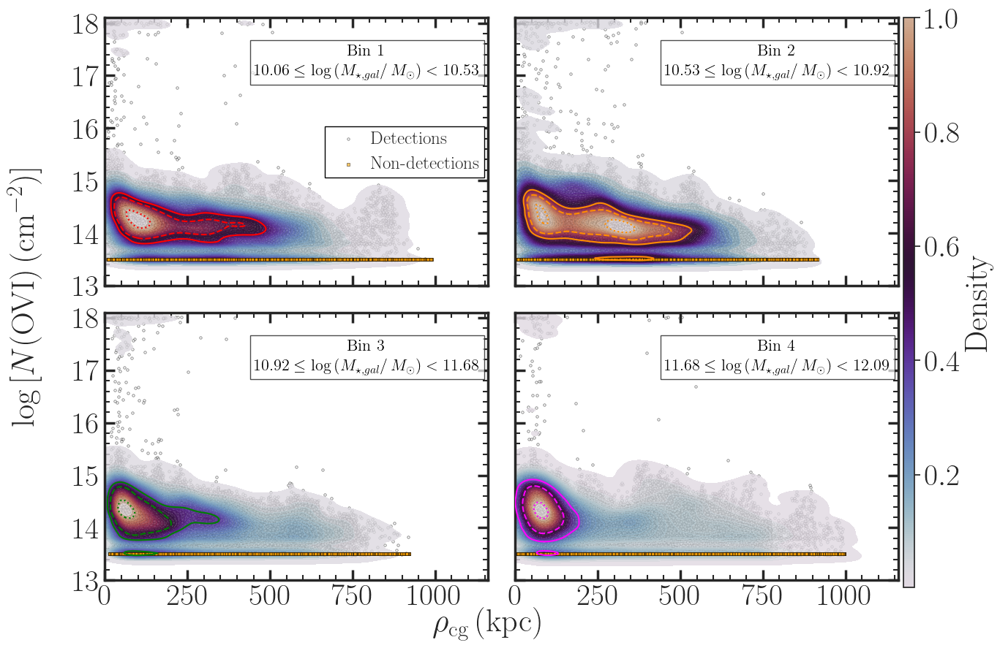

In [146]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
import h5py
import matplotlib.ticker as ticker
import matplotlib.colors as mcolors
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.ticker import AutoMinorLocator
import matplotlib.cm as cm
import matplotlib.patches as mpatches

# ---------------------------
# PATHS AND CONSTANTS
# ---------------------------
base_dir = '../../Grad School/MgII_TNG_Project/Primary Project/Trident Codes/TNG_50_z_0.1_groups/revised_final'
halo_file_path = '../TNG50_fitting_results/TNG_halos.txt'
fitting_dir = '../TNG50_fitting_results/fitting_combined_features_grp_only_800'
galaxy_cat_dir = '../TNG50_fitting_results/galaxy_cats'
# For observational data:
full_sample_path = '../COS_IGrM_Data/Group_Sightline_Data.txt'
plotting_data_path = '../COS_IGrM_Data/Plotting_data_subset.txt'

z = 0.1               # Redshift
a = 1 / (1 + z)       # Scale factor
h = 0.6774            # Hubble parameter
box_size = 35000      # Simulation box size

# Map group index to sequential numbering (0 to 13)
grp_index_to_group_mapping = {
    7: 0, 8: 1, 9: 2, 10: 3, 11: 4, 12: 5, 13: 6, 15: 7,
    17: 8, 18: 9, 19: 10, 20: 11, 22: 12, 24: 13
}

# ---------------------------
# HELPER FUNCTION
# ---------------------------
def apply_cyclic_condition(ray_coord, galaxy_coord, box_size):
    diff = np.abs(galaxy_coord - ray_coord)
    if diff > box_size / 2:
        if galaxy_coord > ray_coord:
            galaxy_coord -= box_size
        else:
            galaxy_coord += box_size
    return galaxy_coord

# ---------------------------
# ACCUMULATE SIMULATION DATA PER SIGHTLINE
# ---------------------------
# For each sightline in every group we will record:
#   sim_rho      : impact parameter (physical kpc) to the nearest galaxy
#   sim_novi     : log N(OVI) [if detection from fitting file; for non-detections assign 13.5]
#   sim_log_mass : log10(stellar mass in Msun) of the nearest galaxy
#   sim_detect   : Boolean flag: True if detection, False if non-detection

sim_rho = []      
sim_novi = []     
sim_log_mass = [] 
sim_detect = []   

# Loop over groups
for grp_index in tqdm(grp_index_to_group_mapping.keys()):
    group_number = grp_index_to_group_mapping[grp_index]
    
    # --- Load Galaxy Catalog ---
    galaxy_file = os.path.join(galaxy_cat_dir, f"group_{grp_index}_galaxy_catalog_converted.txt")
    if not os.path.exists(galaxy_file):
        print(f"Galaxy catalog not found for group {grp_index}: {galaxy_file}")
        continue
    galaxy_data = pd.read_csv(galaxy_file, sep='|', skipinitialspace=True)
    galaxy_data.columns = galaxy_data.columns.str.strip()
    # Use the DataFrame index as the local galaxy ID
    local_galaxy_ids = galaxy_data.index.values  
    galaxy_positions = galaxy_data[['SubhaloPos_0', 'SubhaloPos_1']].values
    # Stellar mass: in units of 1e10 Msun/h. Convert: M = (value*1e10)/h, then take log10.
    stellar_vals = pd.to_numeric(galaxy_data['SubhaloMassType_4'], errors='coerce').values
    galaxy_log_mass = np.log10(stellar_vals * 1e10 / h)
    
    # --- Load Ray Data ---
    ray_file = os.path.join(base_dir, f"integral_TNG50-1_z0.1_n300d2-sample_localized_OVInumdens_{group_number}-of-14.hdf5")
    if not os.path.exists(ray_file):
        print(f"Ray file not found for group {group_number}: {ray_file}")
        continue
    with h5py.File(ray_file, 'r') as f:
        ray_positions = f['ray_pos'][:]  # shape: (num_rays, 3)
    
    # --- Load Fitting File ---
    fitting_file = os.path.join(fitting_dir, f"group_{group_number}_combined_features.txt")
    if not os.path.exists(fitting_file):
        print(f"Fitting file not found for group {group_number}: {fitting_file}")
        continue
    fitting_data = pd.read_csv(fitting_file, sep='|', skipinitialspace=True)
    fitting_data.columns = fitting_data.columns.str.strip()
    
    # For each sightline in the fitting file:
    for idx, row in fitting_data.iterrows():
        sid = int(row['Sightline'])
        # Get ray position (first two coordinates)
        ray_x, ray_y = ray_positions[sid, :2]
        # Compute cyclic-corrected galaxy positions
        corr_positions = np.array([
            [apply_cyclic_condition(ray_x, gx, box_size),
             apply_cyclic_condition(ray_y, gy, box_size)]
            for gx, gy in galaxy_positions
        ])
        # Compute distances to all galaxies
        dists = np.sqrt((corr_positions[:,0] - ray_x)**2 + (corr_positions[:,1] - ray_y)**2)
        # Find index of nearest galaxy
        nearest_idx = np.argmin(dists)
        # Convert distance to physical kpc
        rho_val = np.min(dists) * a / h
        
        # Determine log N(OVI): if detection then use row['N'], else assign constant 13.5
        if pd.isna(row.get('dN')):
            novi_val = 13.5
            detect_flag = False
        else:
            novi_val = row['N']
            detect_flag = True
        
        # Record the stellar mass (log) of the nearest galaxy
        log_mass_val = galaxy_log_mass[nearest_idx]
        
        sim_rho.append(rho_val)
        sim_novi.append(novi_val)
        sim_log_mass.append(log_mass_val)
        sim_detect.append(detect_flag)

# Convert simulation arrays to numpy arrays
sim_rho = np.array(sim_rho)
sim_novi = np.array(sim_novi)
sim_log_mass = np.array(sim_log_mass)
sim_detect = np.array(sim_detect)

# ---------------------------
# DEFINE STELLAR MASS BINS (Based on sim_log_mass)
# ---------------------------
# Use quantile-based binning into 4 bins
mass_bin_edges = np.quantile(sim_log_mass, [0, 0.25, 0.5, 0.75, 1.0])
print("Stellar Mass Bin Edges (log10(Msun)):", mass_bin_edges)

# Group simulation data by stellar mass bin
bin_sim_data = {}  # keys: bin number 1..4; each value: dictionary with arrays for rho, novi, and detect flag.
for i in range(4):
    lower = mass_bin_edges[i]
    upper = mass_bin_edges[i+1]
    in_bin = (sim_log_mass >= lower) & (sim_log_mass <= upper)
    bin_sim_data[i+1] = {
        'rho': sim_rho[in_bin],
        'novi': sim_novi[in_bin],
        'detect': sim_detect[in_bin]
    }
    print(f"Bin {i+1}: Stellar mass range = [{lower:.2f}, {upper:.2f}], Sightlines = {np.sum(in_bin)}")

# ---------------------------
# LOAD OBSERVATIONAL DATA (COS-IGrM)
# ---------------------------
full_sample_path = '../COS_IGrM_Data/Group_Sightline_Data.txt'
plotting_data_path = '../COS_IGrM_Data/Plotting_data_subset.txt'

# Load data
full_sample_df = pd.read_csv(full_sample_path, sep='|', comment='#', engine='python')
plotting_data_df = pd.read_csv(plotting_data_path, sep='\s+', comment='#', engine='python')

# Remove unnamed columns
full_sample_df = full_sample_df.loc[:, ~full_sample_df.columns.str.contains('^unnamed', case=False)]
plotting_data_df = plotting_data_df.loc[:, ~plotting_data_df.columns.str.contains('^unnamed', case=False)]

# Normalize column names
full_sample_df.columns = full_sample_df.columns.str.strip().str.lower()
plotting_data_df.columns = plotting_data_df.columns.str.strip().str.lower()

# Normalize 'group' column values in both DataFrames
full_sample_df['group'] = full_sample_df['group'].str.strip().str.upper()
plotting_data_df['group'] = plotting_data_df['group'].str.strip().str.upper()

# Debugging: Print unique 'group' values
print("Unique values in full_sample_df['group']:", full_sample_df['group'].unique())
print("Unique values in plotting_data_df['group']:", plotting_data_df['group'].unique())

# Merge DataFrames on 'group'
merged_df = pd.merge(full_sample_df, plotting_data_df, on='group', how='inner')

# Debugging: Check merged DataFrame
print("Unique values in merged_df['subset']:", merged_df['subset'].unique())
print("Number of rows in merged_df:", len(merged_df))

# ---------------------------
# PLOTTING: 2x2 SUBPLOTS FOR SIMULATION DATA BY STELLAR MASS BIN
# ---------------------------
# Define colors for KDE contours (can adjust per bin)
sim_colors = {1: "red", 2: "darkorange", 3: "green", 4: "magenta"}

fig, axs = plt.subplots(2, 2, figsize=(14, 10), sharex=True, sharey=True)
axs = axs.flatten()

for bin_num in sorted(bin_sim_data.keys()):
    ax = axs[bin_num-1]
    data = bin_sim_data[bin_num]
    
    # Separate detections and non-detections
    det_mask = data['detect']
    nondet_mask = ~data['detect']
    
    # Plot simulation detections scatter.
    ax.scatter(
        data['rho'][det_mask], data['novi'][det_mask],
        color='white', s=6, alpha=0.6,
        edgecolor='black', linewidth=0.5, marker='o', zorder=0, label='Detections'
    )
    # Plot simulation non-detections scatter.
    ax.scatter(
        data['rho'][nondet_mask], data['novi'][nondet_mask],
        color='orange', s=8, alpha=0.6,
        edgecolor='black', linewidth=0.5, marker='s', zorder=3, label='Non-detections'
    )
    
    # Plot KDE filled contours for detections

    # kde = sns.kdeplot(
    #     x=data['rho'][det_mask], y=data['novi'][det_mask], fill=True,
    #     cmap="twilight", levels=40, thresh=0.002, alpha=0.8,
    #     ax=ax, rasterized=True, zorder=1
    # )
    # sns.kdeplot(
    #     x=data['rho'][det_mask], y=data['novi'][det_mask], levels=[0.5, 0.68, 0.95],
    #     color=sim_colors[bin_num], linewidths=1.5,
    #     ax=ax, linestyles=["solid", "dashed", "dotted"], zorder=1
    # )
    kde = sns.kdeplot(
    x=data['rho'][det_mask], y=data['novi'][det_mask], fill=True,
    cmap="twilight", levels=40, thresh=0.002, alpha=0.8,
    ax=ax, zorder=2)
    sns.kdeplot(
        x=data['rho'][det_mask], y=data['novi'][det_mask], levels=[0.5, 0.68, 0.95],
        color=sim_colors[bin_num], linewidths=1.5,
        ax=ax, linestyles=["solid", "dashed", "dotted"], zorder=3
    )

    
    # ---------------------------
    # Overlay observational data (COS-IGrM) in springgreen using provided methodology.
    # # ---------------------------
    # cos_label_added = {'I': False, 'C': True}
    # if merged_df['subset'].isna().all():
    #     print("Error: 'subset' column is empty after merging. Check 'group' column values in both files.")
    # else:
    #     # Normalize 'subset' column values
    #     merged_df['subset'] = merged_df['subset'].str.strip().str.upper()
    #     print(merged_df.columns)
    
    #     # Plot observational data
    #     for subset_type, color, label in [('I', 'springgreen', 'COS-IGrM'), ('C', 'springgreen', 'COS-IGrM')]:
    #         subset_df = merged_df[merged_df['subset'] == subset_type]
    #         print(f"Processing subset: {subset_type}, Rows: {len(subset_df)}")
    #         for _, row in subset_df.iterrows():
    #             lab = label if not cos_label_added[subset_type] else ""
    #             cos_label_added[subset_type] = True
    #             if row['n_ovi_err_low'] == 0.25 or row['n_ovi_err_high'] == 0.25:
    #                 ax.errorbar(row['impact_param_galaxy'], row['n_ovi'], 
    #                             yerr=[[row['n_ovi_err_low']], [0]], fmt='o', markersize=12,
    #                             markerfacecolor=color, markeredgecolor='black', ecolor='black',
    #                             capsize=5, alpha=0.9, zorder=4, label=lab)
    #                 ax.annotate('', 
    #                             xy=(row['impact_param_galaxy'], row['n_ovi'] - row['n_ovi_err_low']),
    #                             xytext=(row['impact_param_galaxy'], row['n_ovi']),
    #                             arrowprops=dict(facecolor=color, shrink=0.05, width=1, 
    #                                             headwidth=7, headlength=8, edgecolor='black'),
    #                             zorder=4)
    #             else:
    #                 ax.errorbar(row['impact_param_galaxy'], row['n_ovi'], 
    #                             yerr=[[row['n_ovi_err_low']], [row['n_ovi_err_high']]], fmt='o', markersize=12,
    #                             markerfacecolor=color, markeredgecolor='black', ecolor='black',
    #                             capsize=4, alpha=0.9, zorder=4, label=lab)
    
    # Annotate subplot with bin information
    annot_text = rf"$\begin{{array}}{{c}} \text{{Bin {bin_num}}} \\ {mass_bin_edges[bin_num-1]:.2f}\le \log\left(M_{{\star, gal}}/\,M_{{\odot}}\right) < {mass_bin_edges[bin_num]:.2f} \end{{array}}$"
    ax.text(0.98, 0.90, annot_text, transform=ax.transAxes,
            horizontalalignment='right', verticalalignment='top',
            fontsize=16, color='black', bbox=dict(facecolor='white', alpha=0.7, edgecolor='black'))
    
    ax.set_xlim(-1, 1160)
    ax.set_ylim(13.2, 18.1)
    ax.set_xticks([0, 250, 500, 750, 1000])
    ax.set_yticks([13, 14, 15, 16, 17, 18])
    ax.xaxis.set_minor_locator(AutoMinorLocator())
    ax.yaxis.set_minor_locator(AutoMinorLocator())
    ax.tick_params(axis='both', which='major', direction='in', length=10, width=2.5, top=True, right=True)
    ax.tick_params(axis='both', which='minor', direction='in', length=5, width=1.5, top=True, right=True)
    ax.spines['top'].set_linewidth(2.5)
    ax.spines['right'].set_linewidth(2.5)
    ax.spines['bottom'].set_linewidth(2.5)
    ax.spines['left'].set_linewidth(2.5)
    ax.set_title("")

# After the subplot loop, create a common colorbar for all subplots.
# Adjust vmin and vmax to suit the actual density range from your KDE plot.
#cbar_ax = fig.add_axes([0.99, 0.12, 0.015, 0.85])  # [left, bottom, width, height] in figure coordinates
cbar_ax = fig.add_axes([0.905, 0.10, 0.011, 0.78])  # [left, bottom, width, height] in figure coordinates

sm = plt.cm.ScalarMappable(cmap=twilight_trunc, norm=plt.Normalize(vmin=0.002, vmax=1.0))
sm.set_array([])  # Only needed for older matplotlib versions.
fig.colorbar(sm, cax=cbar_ax, label='Density', ticks=[0.0, 0.2, 0.4, 0.6, 0.8, 1.0])
cbar.ax.set_yticks([0.0, 0.2, 0.4, 0.6, 0.8, 1.0])
cbar.ax.tick_params(labelsize=13)
cbar.set_label('Density', fontsize=13)
# Set common x and y labels.
fig.text(0.5, 0.04, r'$\rho_{\mathrm{cg}} \, (\mathrm{kpc})$', ha='center', fontsize=32)
fig.text(0.03, 0.5, r'$\log\,[N(\mathrm{OVI})\, (\mathrm{cm^{-2}})]$', va='center', rotation='vertical', fontsize=32)

# Add legend to the first subplot.
handles, labels = axs[0].get_legend_handles_labels()
axs[0].legend(handles, labels, loc='center right', frameon=True, framealpha=1, edgecolor='black',
              fancybox=False, shadow=False, borderpad=0.25, borderaxespad=0.2, handletextpad=0.25, fontsize=18)

# plt.tight_layout(rect=[0.06, 0.06, 1, 1])
output_dir = '../TNG50_fitting_results/Plots_gal_removed'
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

plt.subplots_adjust(wspace=0.07, hspace=0.1)
plt.savefig(os.path.join(output_dir, 'logN_vs_rho_by_stellar_mass_bin.png'), dpi=400)
plt.show()

In [313]:
# Loop over each stellar mass bin in bin_sim_data.
for bin_num in sorted(bin_sim_data.keys()):
    data = bin_sim_data[bin_num]
    # We only consider detections (where 'detect' is True)
    det_mask = data['detect']
    rho_det = data['rho'][det_mask]
    novi_det = data['novi'][det_mask]
    
    total_detections = len(rho_det)
    print(f"\n--- Bin {bin_num} ---")
    print(f"Total detections: {total_detections}")
    
    if total_detections == 0:
        print("No detections in this bin.")
        continue
    
    # 1. Fraction of detections with ρ <= 100 kpc
    within100 = np.sum(rho_det <= 100)
    frac_within100 = within100 / total_detections
    print(f"Detections with ρ <= 100 kpc: {within100} ({frac_within100:.3f} of total)")
    
    # 2. Fraction of detections with log N(OVI) > 15
    above15 = np.sum(novi_det > 15)
    frac_above15 = above15 / total_detections
    print(f"Detections with log N(OVI) > 15: {above15} ({frac_above15:.3f} of total)")
    
    # 3. Among detections with log N(OVI) > 15, fraction with ρ <= 100 kpc
    if above15 > 0:
        # Get indices where novi_det > 15
        indices_above15 = (novi_det > 15)
        rho_above15 = rho_det[indices_above15]
        above15_within100 = np.sum(rho_above15 <= 100)
        frac_above15_within100 = above15_within100 / above15
        print(f"Detections with log N(OVI) > 15 and ρ <= 100 kpc: {above15_within100} ({frac_above15_within100:.3f} of detections with log N(OVI) > 15)")
    else:
        print("No detections with log N(OVI) > 15 in this bin.")
    
    # 4. Fraction of detections with ρ <= 250 kpc
    within250 = np.sum(rho_det <= 250)
    frac_within250 = within250 / total_detections
    print(f"Detections with ρ <= 250 kpc: {within250} ({frac_within250:.3f} of total)")


--- Bin 1 ---
Total detections: 67191
Detections with ρ <= 100 kpc: 14545 (0.216 of total)
Detections with log N(OVI) > 15: 587 (0.009 of total)
Detections with log N(OVI) > 15 and ρ <= 100 kpc: 395 (0.673 of detections with log N(OVI) > 15)
Detections with ρ <= 250 kpc: 35167 (0.523 of total)

--- Bin 2 ---
Total detections: 70092
Detections with ρ <= 100 kpc: 13680 (0.195 of total)
Detections with log N(OVI) > 15: 1715 (0.024 of total)
Detections with log N(OVI) > 15 and ρ <= 100 kpc: 996 (0.581 of detections with log N(OVI) > 15)
Detections with ρ <= 250 kpc: 34074 (0.486 of total)

--- Bin 3 ---
Total detections: 73954
Detections with ρ <= 100 kpc: 25125 (0.340 of total)
Detections with log N(OVI) > 15: 727 (0.010 of total)
Detections with log N(OVI) > 15 and ρ <= 100 kpc: 608 (0.836 of detections with log N(OVI) > 15)
Detections with ρ <= 250 kpc: 49871 (0.674 of total)

--- Bin 4 ---
Total detections: 47218
Detections with ρ <= 100 kpc: 21330 (0.452 of total)
Detections with log

In [54]:
from pptx import Presentation
from pptx.util import Inches
from pptx.enum.shapes import MSO_SHAPE
from pptx.dml.color import RGBColor
from math import cos, sin, radians

# Create new presentation
prs = Presentation()
slide_layout = prs.slide_layouts[6]
slide = prs.slides.add_slide(slide_layout)

# Slide and center parameters
prs.slide_width = Inches(10)
prs.slide_height = Inches(7.5)
center_x = prs.slide_width / 2
center_y = prs.slide_height / 2

# Ring parameters
outer_radius = Inches(3.5)
band_width = Inches(0.3)
colors = [
    (191, 54, 12),    # Radio
    (230, 74, 25),    # Gamma-ray
    (255, 167, 38),   # X-ray
    (255, 213, 79),   # MIR
    (239, 108, 108),  # Broad lines
    (244, 143, 177)   # Narrow lines
]

# Function to draw concentric rings
def add_ring(slide, center_x, center_y, outer_radius, width, color):
    shape = slide.shapes.add_shape(
        MSO_SHAPE.DONUT, 
        center_x - outer_radius, center_y - outer_radius,
        outer_radius * 2, outer_radius * 2
    )
    shape.fill.solid()
    shape.fill.fore_color.rgb = RGBColor(*color)
    shape.line.fill.background()
    shape.adjustments[0] = 1 - (width / outer_radius)

for i, color in enumerate(colors):
    add_ring(slide, center_x, center_y, outer_radius - i * band_width, band_width, color)

# Sector wedge boundaries based on observed image (angles in degrees)
sector_angles = [
    0, 18, 40, 70, 92, 110, 140, 170, 190, 220, 250, 272, 290, 320, 342, 360
]

# Draw 5-degree wedge gaps at the specified angles
gap_width_deg = 5
line_len = outer_radius + Inches(0.1)

for angle in sector_angles:
    rad = radians(angle)
    x_end = center_x + line_len * cos(rad)
    y_end = center_y - line_len * sin(rad)
    line = slide.shapes.add_connector(
        1,
        center_x,
        center_y,
        x_end,
        y_end
    )
    line.line.width = Inches(0.03)
    line.line.color.rgb = RGBColor(255, 255, 255)

# Save presentation
output_path = "/Users/wavefunction/Downloads/AGN_Emission_Rings_With_Custom_Sector_Gaps.pptx"
prs.save(output_path)
